# CNN Networks for Cambridge UK Weather Time Series

CNN models for time series analysis of Cambridge UK temperature measurements taken at the [University computer lab weather station](https://www.cl.cam.ac.uk/research/dtg/weather/).

This notebook is being developed on [Google Colab](https://colab.research.google.com), primarily using [keras/tensorflow](https://www.tensorflow.org/guide/keras/sequential_model).  Initially I was most interested in short term temperature forecasts (less than 2 hours) but now mostly produce results up to 48 hours in the future for comparison with earlier [baselines](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/notebooks/cammet_baselines_2021.ipynb).

See my previous notebooks, web apps etc:
 * [Cambridge UK temperature forecast python notebooks](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks)
 * [Cambridge UK temperature forecast R models](https://github.com/makeyourownmaker/CambridgeTemperatureModel)
 * [Bayesian optimisation of prophet temperature model](https://github.com/makeyourownmaker/BayesianProphet)
 * [Cambridge University Computer Laboratory weather station R shiny web app](https://github.com/makeyourownmaker/ComLabWeatherShiny)

for further details including:
 * data description
 * data cleaning and preparation
 * data exploration
 * baseline models

In particular, see the [keras_mlp_fcn_resnet_time_series notebook](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/notebooks/keras_mlp_fcn_resnet_time_series.ipynb), which uses a streamlined version of data preparation from [Tensorflow time series forecasting tutorial](https://www.tensorflow.org/tutorials/structured_data/time_series).

Most of the above repositories, notebooks, web apps etc were built on both less data and less thoroughly cleaned data.

In [1]:
import sys
import math
import datetime
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import product
from sklearn.preprocessing import StandardScaler

import tensorflow as tf

# How to enable Colab GPUs https://colab.research.google.com/notebooks/gpu.ipynb
# Select the Runtime > "Change runtime type" menu to enable a GPU accelerator,
# and then re-execute this cell.
if 'google.colab' in str(get_ipython()):
    device_name = tf.test.gpu_device_name()
    if device_name != '/device:GPU:0':
        raise SystemError('GPU device not found')
    print('Found GPU at: {}'.format(device_name))
    gpu_info = !nvidia-smi
    gpu_info = '\n'.join(gpu_info)
    print(gpu_info)

#try:
#  tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
#  print('Running on TPU ', tpu.cluster_spec().as_dict()['worker'])
#except ValueError:
#  raise BaseException('ERROR: Not connected to a TPU runtime; please see the previous cell in this notebook for instructions!')

#tf.config.experimental_connect_to_cluster(tpu)
#tf.tpu.experimental.initialize_tpu_system(tpu)
#tpu_strategy = tf.distribute.experimental.TPUStrategy(tpu)

import tensorflow.keras as keras
from keras.models import Sequential, Model, Input
from keras.layers import InputLayer, Dense, Dropout, Activation, \
                         Flatten, Reshape, LSTM, RepeatVector, Conv1D, \
                         TimeDistributed, Bidirectional, Dropout, \
                         MaxPooling1D, MaxPooling2D, Conv2D  # TODO Remove unused elements
from keras.layers.merge import concatenate
from keras.constraints import maxnorm
from keras import regularizers
from tensorflow.keras.optimizers import Adam
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Reduces variance in results but won't eliminate it :-(
%env PYTHONHASHSEED=0
import random
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

%matplotlib inline

Found GPU at: /device:GPU:0
Wed Jun 29 06:43:42 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0    34W / 250W |    375MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                            



## Import Data

The measurements are relatively noisy and there are usually several hundred missing values every year; often across multiple variables.
Observations have been extensively cleaned but may still have issues.  Interpolation and missing value imputation have been used to fill all missing values.  See the [cleaning section](https://github.com/makeyourownmaker/CambridgeTemperatureModel#Cleaning) in the [Cambridge Temperature Model repository](https://github.com/makeyourownmaker/CambridgeTemperatureModel) for details.  Observations start in August 2008 and end in April 2021 and occur every 30 mins.

Shape:
(223250, 13)

Info:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 223250 entries, 2008-08-01 00:30:00 to 2021-04-26 01:00:00
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   ds                 223250 non-null  datetime64[ns]
 1   y                  223250 non-null  float64       
 2   humidity           223250 non-null  float64       
 3   dew.point          223250 non-null  float64       
 4   pressure           223250 non-null  float64       
 5   wind.speed.mean    223250 non-null  float64       
 6   wind.bearing.mean  223250 non-null  float64       
 7   wind.x             223250 non-null  float64       
 8   wind.y             223250 non-null  float64       
 9   day.sin            223250 non-null  float64       
 10  day.cos            223250 non-null  float64       
 11  year.sin           223250 non-null  float64       
 12  year.cos           223250 non-null  flo

,y,humidity,dew.point,pressure,wind.speed.mean,wind.bearing.mean,wind.x,wind.y,day.sin,day.cos,year.sin,year.cos
count,223250.000000,223250.000000,223250.000000,223250.000000,223250.000000,223250.000000,2.232500e+05,223250.000000,2.232500e+05,2.232500e+05,223250.000000,223250.000000
mean,10.000512,78.689959,58.880634,1014.336135,4.432390,195.051399,-1.744626e+00,-1.260534,-5.846638e-07,8.920246e-06,-0.005555,0.017571
std,6.496255,17.274417,51.630120,11.935364,4.013553,82.881764,4.094410e+00,3.789181,7.071053e-01,7.071115e-01,0.710635,0.703322
min,-7.000000,20.000000,-100.000000,963.000000,0.000000,0.000000,-2.880000e+01,-29.200000,-1.000000e+00,-1.000000e+00,-1.000000,-1.000000
25%,5.200000,68.000000,20.000000,1008.000000,1.200000,135.000000,-3.889087e+00,-3.323402,-7.071068e-01,-7.071068e-01,-0.718114,-0.681606
50%,9.600000,83.000000,60.000000,1016.000000,3.500000,225.000000,-2.828427e-01,0.000000,-3.485338e-15,2.489527e-15,-0.012303,0.032088
75%,14.500000,92.000000,97.000000,1022.000000,6.600000,270.000000,1.592041e-16,0.070711,7.071068e-01,7.071068e-01,0.708805,0.718372
max,36.100000,100.000000,209.000000,1051.000000,29.200000,360.000000,2.050610e+01,21.800000,1.000000e+00,1.000000e+00,1.000000,1.000000



Raw data:


,ds,y,humidity,dew.point,pressure,wind.speed.mean,wind.bearing.mean,wind.x,wind.y,day.sin,day.cos,year.sin,year.cos
ds,,,,,,,,,,,,,
2008-08-01 00:30:00,2008-08-01 00:30:00,19.5,65.75000,119.150000,1014.416667,1.150000,225.0,-0.813173,-0.813173,-1.305262e-01,0.991445,-0.495614,-0.868543
2008-08-01 01:00:00,2008-08-01 01:00:00,19.1,49.75000,79.200000,1014.384615,1.461538,225.0,-1.033464,-1.033464,-4.616835e-12,1.000000,-0.495925,-0.868365
2008-08-01 01:30:00,2008-08-01 01:30:00,19.1,66.17875,106.600000,1014.500000,1.508333,225.0,-1.066553,-1.066553,1.305262e-01,0.991445,-0.496237,-0.868187
2008-08-01 02:00:00,2008-08-01 02:00:00,19.1,58.50000,99.250000,1014.076923,1.430769,225.0,-1.011707,-1.011707,2.588190e-01,0.965926,-0.496548,-0.868009
2008-08-01 02:30:00,2008-08-01 02:30:00,19.1,66.95000,121.883333,1014.416667,1.133333,225.0,-0.801388,-0.801388,3.826834e-01,0.923880,-0.496859,-0.867831
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-25 23:00:00,2021-04-25 23:00:00,3.6,61.00000,-32.000000,1028.000000,1.400000,45.0,0.989949,0.989949,-5.000000e-01,0.866025,0.914320,-0.404992
2021-04-25 23:30:00,2021-04-25 23:30:00,3.6,64.00000,-26.000000,1028.000000,2.600000,45.0,1.838478,1.838478,-3.826834e-01,0.923880,0.914175,-0.405320
2021-04-26 00:00:00,2021-04-26 00:00:00,3.6,58.00000,-39.000000,1028.000000,4.300000,45.0,3.040559,3.040559,-2.588190e-01,0.965926,0.914030,-0.405647


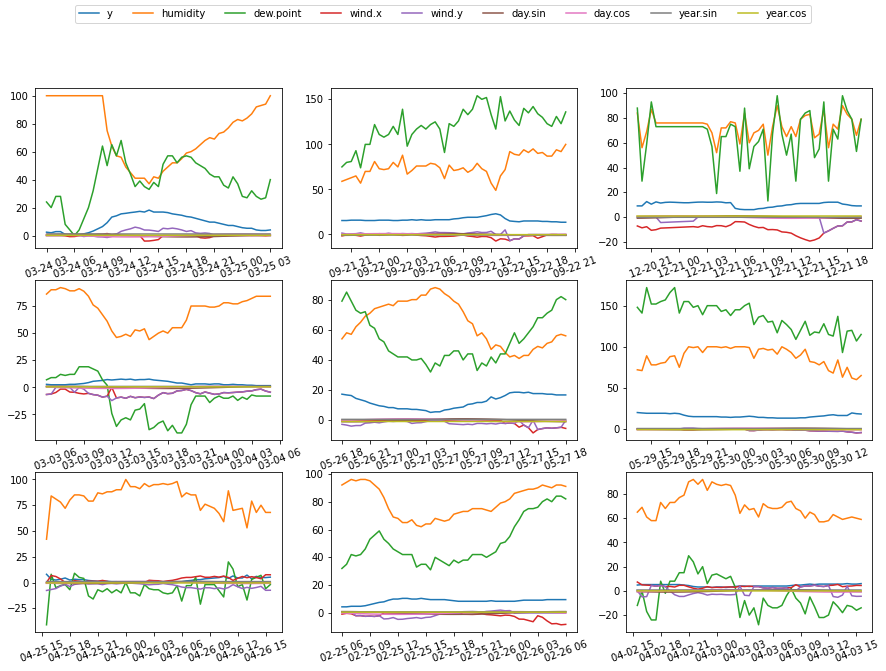

In [2]:
if 'google.colab' in str(get_ipython()):
    data_loc = "https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/data/CamMetPrepped2021.04.26.csv?raw=true"
else:
    data_loc = "../data/CamMetPrepped2021.04.26.csv"

df = pd.read_csv(data_loc, index_col=['ds'], parse_dates=['ds', 'ds.1'])
df.rename(columns={'ds.1': 'ds'}, inplace = True)
df_orig = df

print("Shape:")
print(df.shape)
print("\nInfo:")
print(df.info())
print("\nSummary stats:")
display(df.describe())
print("\nRaw data:")
display(df)
print("\n")


def plot_examples(data, x_var):
    """Plot 9 sets of observations in 3 * 3 matrix"""

    assert len(data) == 9

    cols = [col for col in data[0].columns if col != x_var]

    fig, axs = plt.subplots(3, 3, figsize = (15, 10))
    axs = axs.ravel()  # apl for the win :-)

    for i in range(9):
        for col in cols:
            axs[i].plot(data[i][x_var], data[i][col])
            axs[i].xaxis.set_tick_params(rotation = 20, labelsize = 10)
    
    fig.legend(cols, loc = 'upper center',  ncol = len(cols))
    
    return None


cols = ['ds', 'y', 'humidity', 'dew.point', #'pressure', 
        'wind.x', 'wind.y', 'day.sin', 'day.cos', 'year.sin', 'year.cos']
ex_plots = 9
hour_window = 24
starts = df.sample(n = ex_plots).index
p_data = [df.loc[starts[i]:starts[i] + datetime.timedelta(hours = hour_window), cols] 
          for i in range(ex_plots)]
plot_examples(p_data, 'ds')


### Data augmentation with mixup

Wind velocity vectors were clustered around the 45 degree increments. Data augmentation with the [mixup method](https://arxiv.org/abs/1710.09412) is carried out to counter this clustering.

From the [mixup paper](https://arxiv.org/abs/1710.09412): "mixup trains a neural network on convex combinations of pairs of examples and their labels".

Further details on how I apply the standard mixup technique to time series are included in the Window data section of my [keras_mlp_fcn_resnet_time_series notebook](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/notebooks/keras_mlp_fcn_resnet_time_series.ipynb).

Here is a comparison of the improvement in wind velocity sparsity with standard mixup augmentation and a time series specific mixup.

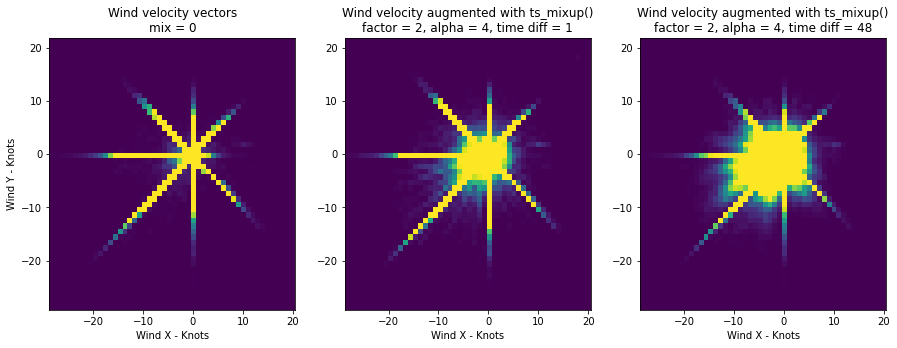

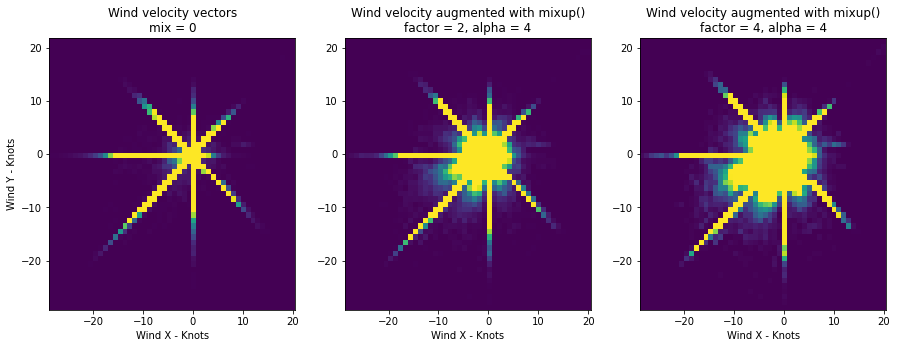

In [3]:
def mixup(data, alpha = 4.0, factor = 1):
    """Augment data with mixup method.

    Standard mixup is applied between randomly chosen observations

    Args:
      data      (pd.DataFrame):    data to run mixup on
      alpha     (float, optional): beta distribution parameter
      factor    (int, optional):   size of mixup dataset to return

    Returns:
      df (pd.DataFrame)

    Notes:
      Duplicates will be removed
      https://arxiv.org/abs/1710.09412
    """
    batch_size = len(data) - 1
    
    data['epoch'] = data.index.view(np.int64) // 10**9
    
    # random sample lambda value from beta distribution
    l   = np.random.beta(alpha, alpha, batch_size * factor)
    X_l = l.reshape(batch_size * factor, 1)
    
    # Get a pair of inputs and outputs
    y1  = data['y'].shift(-1).dropna()
    y1_ = pd.concat([y1] * factor)
    
    y2  = data['y'][0:batch_size]
    y2_ = pd.concat([y2] * factor)

    X1  = data.drop(columns='y', axis=1).shift(-1).dropna()
    X1_ = pd.concat([X1] * factor)
    
    X2  = data.drop(columns='y', axis=1)
    X2  = X2[0:batch_size]
    X2_ = pd.concat([X2] * factor)

    # Perform mixup
    X = X1_ * X_l + X2_ * (1 - X_l)
    y = y1_ * l   + y2_ * (1 - l)    
    
    df = pd.DataFrame(y).join(X)    
    df = data.append(df).sort_values('epoch', ascending = True)
    df = df.drop(columns='epoch', axis=1)
    
    df = df.drop_duplicates(keep = False)
    
    return df


def ts_mixup(data, alpha = 4.0, factor = 1, time_diff = 1):
    """Augment data with time series mixup method.

    Applies mixup technique to two time series separated by time_diff period.

    Args:
      data      (pd.DataFrame):    data to run mixup on
      alpha     (float, optional): beta distribution parameter
      factor    (int, optional):   size of mixup dataset to return
      time_diff (int, optional):   period between data subsets to run mixup on

    Returns:
      df (pd.DataFrame)

    Notes:
      Duplicates will be removed
      https://arxiv.org/abs/1710.09412
      Standard mixup is applied between randomly chosen observations
    """

    batch_size = len(data) - time_diff
    
    # Get a pair of inputs and outputs
    y1 = data['y'].shift(-time_diff).dropna()    
    y2 = data['y'][0:batch_size]

    X1 = data.drop(columns='y', axis=1).shift(-time_diff).dropna()    
    X2 = data.drop(columns='y', axis=1)
    X2 = X2[0:batch_size]

    df = data
    
    for i in range(factor):
      # random sample lambda value from beta distribution
      l   = np.random.beta(alpha, alpha, 1)
      X_l = np.repeat(l, batch_size).reshape(batch_size, 1)

      # Perform mixup  
      X = X1 * X_l + X2 * (1 - X_l)
      y = y1 * l   + y2 * (1 - l)  
    
      df_new = pd.DataFrame(y).join(X)
      idx_len = np.ceil((df.index[-1] - df.index[0]).days / 365.25)
      df_new.index = df_new.index + pd.offsets.DateOffset(years = idx_len)

      df = df.append(df_new).sort_index(ascending = True)
    
    df = df.drop_duplicates(keep = False)
    
    return df


def plot_wind_no_mixup(data, ax):
    """Plot wind vectors without mixup

    Args:
      data      (pd.DataFrame):    wind vector data to plot
      ax        (axes object):     matplotlib axes object for plot    
    """

    plt1 = ax.hist2d(data['wind.x'], data['wind.y'], bins = (50, 50), vmax = 400)
    ax.set_xlabel('Wind X - Knots')
    ax.set_ylabel('Wind Y - Knots')
    ax.set_title('Wind velocity vectors\nmix = 0');


def plot_wind_with_mixup(data, ax, mix_func, mix_factor, mix_alpha = 4, mix_td = 1):
    """Plot wind vectors with mixup

    Args:
      data       (pd.DataFrame):    wind vector data to plot
      ax         (axes object):     matplotlib axes object for plot
      mix_func   (function)         standard or time series mixup function
      mix_factor (int)              size of mixup dataset to return
      mix_alpha  (int, optional)    beta distribution parameter
      mix_td     (int, optional)    period between data subsets to run mixup on
    """
    title = 'Wind velocity augmented with {0:s}()\n'.format(mix_func)

    if mix_func == 'ts_mixup':
        df_mix = ts_mixup(data.loc[:, ['y', 'wind.x', 'wind.y']], 
                          factor = mix_factor,
                          alpha  = mix_alpha, 
                          time_diff = mix_td)
        title += 'factor = {0:d}, alpha = {1:d}, time diff = {2:d}'.format(mix_factor, mix_alpha, mix_td)
    elif mix_func == 'mixup':
        df_mix = mixup(data.loc[:, ['y', 'wind.x', 'wind.y']], 
                       factor = mix_factor,
                       alpha  = mix_alpha)
        title += 'factor = {0:d}, alpha = {1:d}'.format(mix_factor, mix_alpha)

    plt2 = ax.hist2d(df_mix['wind.x'], df_mix['wind.y'], bins = (50, 50), vmax = 400)
    ax.set_xlabel('Wind X - Knots')
    ax.set_title(title);
    # plt.colorbar(plt1, ax = ax3)  # TODO fixme


fig1, (ax11, ax12, ax13) = plt.subplots(1, 3, figsize = (15, 5))
plot_wind_no_mixup(df, ax11)
plot_wind_with_mixup(df, ax12, 'ts_mixup', 2, 4, 1)
plot_wind_with_mixup(df, ax13, 'ts_mixup', 2, 4, 48)

fig2, (ax21, ax22, ax23) = plt.subplots(1, 3, figsize = (15, 5))
plot_wind_no_mixup(df, ax21)
plot_wind_with_mixup(df, ax22, 'mixup', 2)
plot_wind_with_mixup(df, ax23, 'mixup', 4)

Mixup improves the categorical legacy of the wind velocity data. Unfortunately, if outliers are present their influence may be reinforced.  A priori it's difficult to say which mixup variant is preferable.

---

### Split data¶

I use data from 2018 for validation, 2019 for testing and the remaining data for training. These are entirely arbitrary choices. This results in an approximate 84%, 8%, 8% split for the training, validation, and test sets respectively.

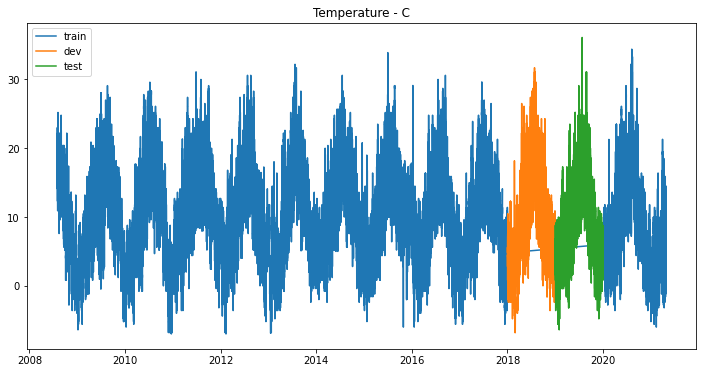

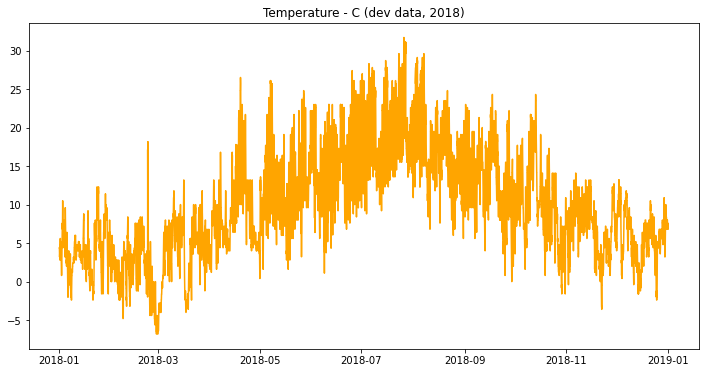

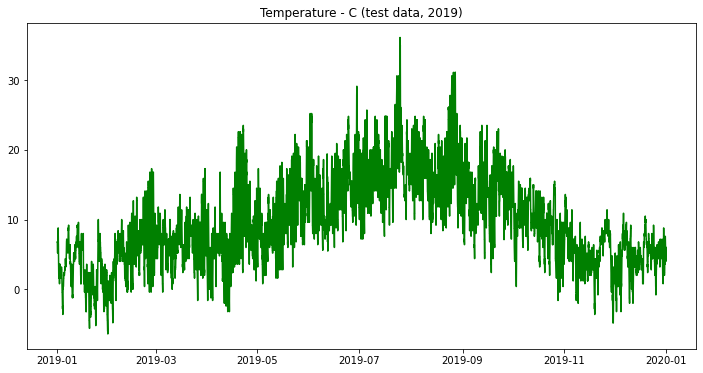

df.drop shape:  (223250, 10)
train shape:    (188210, 10)
valid shape:    (17520, 10)
test shape:     (17520, 10)


In [4]:
# keep_cols = ['y', 'humidity', 'dew.point', 'pressure', 'wind.x', 'wind.y',
#              'day.sin', 'day.cos', 'year.sin', 'year.cos', 'level', 'season1', 
#              'season2']

df['year'] = df['ds'].dt.year
train_df = df.loc[(df['year'] != 2018) & (df['year'] != 2019)]
valid_df = df.loc[df['year'] == 2018]
test_df  = df.loc[df['year'] == 2019]


plt.figure(figsize = (12, 6))
plt.plot(train_df.ds, train_df.y)
plt.plot(valid_df.ds, valid_df.y)
plt.plot(test_df.ds,  test_df.y)
plt.title('Temperature - C')
plt.legend(['train', 'dev', 'test'])
plt.show()

plt.figure(figsize = (12, 6))
plt.plot(valid_df.ds, valid_df.y, color='orange')
plt.title('Temperature - C (dev data, 2018)')
plt.show()

plt.figure(figsize = (12, 6))
plt.plot(test_df.ds, test_df.y, color='green')
plt.title('Temperature - C (test data, 2019)')
plt.show()


del_cols = ['ds', 'year', 'wind.speed.mean', 'wind.bearing.mean']
train_df = train_df.drop(del_cols, axis = 1)
valid_df = valid_df.drop(del_cols, axis = 1)
test_df  = test_df.drop(del_cols,  axis = 1)
df = df.drop(del_cols, axis = 1)

# ds = {}
models = {}
models['datasets'] = {}
models['datasets']['train'] = train_df
models['datasets']['valid'] = valid_df
models['datasets']['test']  = test_df

print("df.drop shape: ", df.shape)
print("train shape:   ", train_df.shape)
print("valid shape:   ", valid_df.shape)
print("test shape:    ", test_df.shape)


---

### Normalise data

Features should be scaled before neural network training. Arguably, scaling should be done using moving averages to avoid accessing future values.
Instead, simple [standard score](https://en.wikipedia.org/wiki/Standard_score) normalisation will be used.

The [violin plot](https://en.wikipedia.org/wiki/Violin_plot) shows the distribution of features.

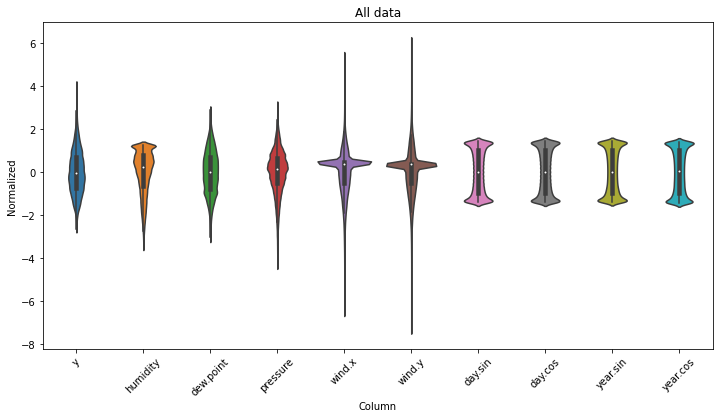

In [5]:
def inv_transform(scaler, data, colName, colNames):
    """An inverse scaler for use in model validation section

    For later use in plot_forecasts, plot_horizon_metrics and check_residuals
    
    See https://stackoverflow.com/a/62170887/100129"""

    dummy = pd.DataFrame(np.zeros((len(data), len(colNames))), columns=colNames)
    dummy[colName] = data
    dummy = pd.DataFrame(scaler.inverse_transform(dummy), columns=colNames)
    
    return dummy[colName].values


scaler = StandardScaler()
scaler.fit(train_df)

train_df[train_df.columns] = scaler.transform(train_df[train_df.columns] )
valid_df[valid_df.columns] = scaler.transform(valid_df[valid_df.columns] )
test_df[test_df.columns]   = scaler.transform(test_df[test_df.columns] )

df_std = scaler.transform(df)
df_std = pd.DataFrame(df_std)
df_std = df_std.melt(var_name = 'Column', value_name = 'Normalized')

plt.figure(figsize=(12, 6))
ax = sns.violinplot(x = 'Column', y = 'Normalized', data = df_std)
ax.set_xticklabels(df.keys(), rotation = 45)
ax.set_title('All data');

Some features have long tails but there are no glaring errors.

---

### Window data

Models are trained using sliding windows of samples from the data.

Window parameters to consider for the 
[tf.keras.preprocessing.timeseries_dataset_from_array](https://keras.io/api/preprocessing/timeseries/#timeseries-data-preprocessing) 
function:
 * sequence_length:
   * Length of the output sequences (in number of timesteps), or number of **lag** observations to use
 * sequence_stride:
   * Period between successive output sequences
   * For stride s, output samples start at index data[i], data[i + s], data[i + 2 * s] etc
   * s can include an **offset** and/or 1 or more **steps ahead** to forecast
 * batch_size:
   * Number of samples in each batch
 * shuffle:
   * Shuffle output samples, or use chronological order

Initial values used:
 * sequence_length (aka lags): 24 (corresponds to 12 hours)
 * steps ahead (what to forecast): 
   * 48 - 30 mins, 60 mins ... 1,410 mins and 1,440 mins
 * offset (space between lags and steps ahead): 0
 * batch_size: 16, 32, 64 ...
 * shuffle: True for training data

The `make_dataset` function below generates [tensorflow datasets](https://www.tensorflow.org/api_docs/python/tf/data/Dataset) for:
 * Lags, steps-ahead, offset, batch size and shuffle
 * Optionally multiple y columns (Not extensively tested)
 
Stride is used to specify offset + steps-ahead. Offset will be 0 throughout this notebook.

**TODO** Insert figure illustrating lags, offsets and steps-ahead.

`shuffle = True` is used with train data. `shuffle = False` is used with validation and test data so the residuals can be checked for heteroscadicity.

Throughout this notebook I use a shorthand notation to describe lags and strides. For example:
 * 24l_1s_2m is 24 lags, 1 step ahead, 2 times mixup
 * 24l_4s_2m is 24 lags, 4 steps ahead, 2 times mixup

#### Mixup data augmentation

Data augmentation with 
[mixup: Beyond Empirical Risk Minimization](https://arxiv.org/abs/1710.09412)
by Zhang _et al_ is used to help counter the categorical legacy from the wind bearing variable. Simple 'input mixup' is used as opposed to the batch-based mixup Zhang _et al_ focus on. Input mixup has the advantage that it can be used with non-neural network methods. With current settings these datasets are approximately 3 times larger but this can be varied. Three times more training data is manageable on Colab in terms of both training time and memory usage. Test and validation data is left unmodified.

I apply mixup between consecutive observations in the time series instead of the usual random observations. This is a fairly conservative starting point. I'd be surprised if applying mixup between consecutive days of measurements didn't give better results. Applying mixup between inputs with equal temperature values will not improve performance and will increase run time.

I don't show it in this notebook, but adding this data augmentation makes a significant difference to loss values (for all model architectures considered). For example, here are results for a multi-layer perceptron (MLP) with 24 largs, 1 step ahead, 20 epochs on both less data and less thoroughly cleaned data.

|Augmentation    |	Train rmse |	Train mae |	Valid rmse |	Valid mae |
|----------------|-------------|------------|------------|------------|
|No augmentation |	0.0058     |	0.053     |	0.0054     |	0.052     |
|Input mixup     |	0.0016     |	0.025     |	0.0015     |	0.025     |

See this [commit](https://github.com/makeyourownmaker/CambridgeTemperatureModel/blob/93c754d4b1b02e1bd8f827a6f6edc145824f6d23/notebooks/keras_mlp_fcn_resnet_time_series.ipynb) 
for results from other architectures with and without 'input mixup'.

---

Setup functions for creating windowed datasets.

In [6]:
def make_dataset(dataset_params, data):  
    assert dataset_params['stride'] >= dataset_params['steps_ahead']
    y_cols = dataset_params['ycols']

    total_window_size = dataset_params['lags'] + dataset_params['stride']

    data = data.drop(columns='epoch', axis = 1, errors = 'ignore')

    if dataset_params['mix_factor'] != 0:
      if dataset_params['mix_type'] == 'ts':
        data_mix = ts_mixup(data,
                            alpha     = dataset_params['mix_alpha'],
                            factor    = dataset_params['mix_factor'],
                            time_diff = dataset_params['mix_diff'])
      else:
        data_mix = mixup(data,
                         alpha  = dataset_params['mix_alpha'],
                         factor = dataset_params['mix_factor'])
    else:
      data_mix = data

    data_mix = data_mix.drop(columns='epoch', axis = 1, errors = 'ignore')
    data_np  = np.array(data_mix, dtype = np.float32)
        
    ds = tf.keras.preprocessing.timeseries_dataset_from_array(
               data    = data_np,
               targets = None,
               sequence_length = total_window_size,
               sequence_stride = 1,
               shuffle    = dataset_params['shuffle'],
               batch_size = dataset_params['bs'])
      
    col_indices = {name: i for i, name in enumerate(data.columns)}
    X_slice = slice(0, dataset_params['lags'])
    y_start = total_window_size - dataset_params['steps_ahead']
    y_slice = slice(y_start, None)


    def split_window(features):
      X = features[:, X_slice, :]
      y = features[:, y_slice, :]

      # X = tf.stack([X[:, :, col_indices[name]] for name in data.columns],
      #              axis = -1)    
      y = tf.stack([y[:, :, col_indices[name]] for name in y_cols], 
                   axis = -1)

      # Slicing doesn't preserve static shape info, so set the shapes manually.
      # This way the `tf.data.Datasets` are easier to inspect.
      X.set_shape([None, dataset_params['lags'],        None])
      y.set_shape([None, dataset_params['steps_ahead'], None])

      return X, y


    ds = ds.map(split_window)

    return ds   


def get_model_name(models, ds_name_params):      
    cols = models['datasets']['train'].loc[:, ds_name_params['xcols']].columns

    suffix = "_{0:d}l_{1:d}s".format(ds_name_params['lags'], 
                                     ds_name_params['steps_ahead'])
    
    suffix += "_{0:d}bs".format(ds_name_params['bs'])
    suffix += "_{0:d}fm".format(ds_name_params['feat_maps'])

    if ds_name_params['filters'] != 0:
      suffix += "_{0:d}f".format(ds_name_params['filters'])

    if ds_name_params['kern_size'] != 0:
      suffix += "_{0:d}ks".format(ds_name_params['kern_size'])

    if ds_name_params['mix_factor'] > 0:
      suffix += "_{0:d}m".format(ds_name_params['mix_factor'])
      suffix += "_{0:d}a".format(ds_name_params['mix_alpha'])
      if ds_name_params['mix_type'] == 'ts':
        suffix += "_{0:d}td".format(ds_name_params['mix_diff'])
      if ds_name_params['mix_type'] == 'input':
        suffix += '_im'

    if 'level' in  cols and 'season1' in cols and 'season2' in cols:
      suffix += '_tbats'

    if ds_name_params['drop_out'] != 0.0:
      suffix += "_{0:.2E}do".format(ds_name_params['drop_out'])

    if ds_name_params['kern_reg'] != 0.0:
      suffix += "_{0:.2E}kr".format(ds_name_params['kern_reg'])

    if ds_name_params['recu_reg'] != 0.0:
      suffix += "_{0:.2E}rr".format(ds_name_params['recu_reg'])

    if len(ds_name_params['ycols']) > 1:
      suffix += "_{0:d}y".format(len(ds_name_params['ycols']))

    if ds_name_params['ks_feats'] > 0:
      suffix += "_{0:d}ksf".format(ds_name_params['ks_feats'])

    if ds_name_params['ks_time'] > 0:
      suffix += "_{0:d}kst".format(ds_name_params['ks_time'])

    return ds_name_params['model_type'] + suffix


def make_datasets(models, datasets_params):

    train_data = models['datasets']['train'].loc[:, datasets_params['xcols']]
    valid_data = models['datasets']['valid'].loc[:, datasets_params['xcols']]
    test_data  = models['datasets']['test'].loc[:,  datasets_params['xcols']]

    orig_mix = datasets_params['mix_factor']
    ds_train   = make_dataset(datasets_params, train_data)

    datasets_params['shuffle']    = False
    datasets_params['mix_factor'] = 0
    ds_valid   = make_dataset(datasets_params, valid_data)

    ds_test   = make_dataset(datasets_params, test_data)
    datasets_params['mix_factor'] = orig_mix
    
    return [ds_train, ds_valid, ds_test]


def dataset_sanity_checks(data, name):    
    print(name, "batches: ", data.cardinality().numpy())
    for batch in data.take(1):
        print("\tX (batch_size, time, features): ", batch[0].shape)
        print("\ty (batch_size, time, features): ", batch[1].shape)
        print("\tX[0][0]: ", batch[0][0])
        print("\ty[0][0]: ", batch[1][0])


def plot_dataset_examples(dataset):
    fig, axs = plt.subplots(3, 3, figsize = (15, 10))
    axs = axs.ravel()
    cols = 0

    for batch in dataset.take(1):
        for i in range(9):
          x = batch[0][i].numpy()
          cols = x.shape[1]
          axs[i].plot(x)

    fig.legend(range(1, cols+1), loc = 'upper center',  ncol = cols+1);


def_cols = ['y', 'humidity', 'dew.point', 'pressure', 'wind.x', 'wind.y', \
            'day.sin', 'day.cos', 'year.sin', 'year.cos']  # def for default


---

## CNN Model Building

Convolutional Neural Networks, or [CNNs](https://en.wikipedia.org/wiki/Convolutional_neural_network), use [convolution](https://en.wikipedia.org/wiki/Convolution) kernels or filters that slide along input features to provide responses known as feature maps.  CNNs assemble hierarchical patterns of increasing complexity starting with smaller and simpler patterns from their filters.

CNNs are frequently applied to analyse visual imagery.  A [spatial convolution](https://keras.io/api/layers/convolution_layers/convolution2d/) can be performed over multi-variate time series observations, and a 1-dimensional [temporal convolution](https://keras.io/api/layers/convolution_layers/convolution1d/) can be applied to vector data.

**TODO** Include basic CNN diagram

The following are a few points I consider when building these CNN models.

Forecast horizons:
  * next 30 mins - 1 step ahead
  * next 24 hours - 48 steps ahead
  * horizon is abbreviated to `h` in the interrim results tables **TODO** Check me

Metrics:
 * mse - mean squared error
   * mse used for loss function to avoid potential problems with infinite values from the square root function
   * rmse - root mean squared error is used for comparison with baselines
   * Huber loss may be worth exploring in the future if outliers remain an issue
 * mae - median absolute error
 * mape - mean absolute percentage error 
   * Not used - mape fails when values, like temperature, become zero

Model enhancements:
 * mixup?
   * input mixup
   * time series mixup
 * test time augmentation?
   * uses data augmentation at the inference stage to improve forecasts
     * 5 forecasts were produced using mixup and then averaged
   * there was a marginal improvement
   * this may be worth trying again
   * as this notebook is getting quite long I've removed the test time augmentation work
     * still available in [this commit](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/commit/8266ad70034fa6e5864ab26b488284da557d996c)   


Parameters to consider optimising:
 * Learning rate - use LRFinder
 * Optimiser - stick with Adam
 * Shuffle - true for training
 * batch size - 16, 32, 64 ...
 * Number of feature maps
   * 8, 16, 32 ...
 * mixup
   * factor - 1, 2, 3, 4, 5
   * alpha - 4 (recommended in the original publication)
   * time series mixup:
     * time diff - 1, ..., 48
       * period between 2 data subsets to run mixup on
 * dropout
   * ...
 * epochs
   * training shows quite fast convergence so epochs is initially kept quite low (5 or 10)


Model architectures to consider:
 * Conv1D
   * ...
 * Conv2D
   * ...
 * Multi-head
   * ...
 * Inception-style?
   * ...


---


### Learning rate finder

Leslie Smith was one of the first people to work on finding optimal learning rates for deep learning networks in [Cyclical Learning Rates for Training Neural Networks](https://arxiv.org/abs/1506.01186). Jeremy Howard from [fast.ai](https://www.fast.ai/) popularised the learning rate finder used here.

Before building any models, I use a modified version of [Pavel Surmenok's Keras learning rate finder](https://github.com/surmenok/keras_lr_finder) to get reasonably close to the optimal learning rate. It's a single small class which I add support for tensorflow datasets to, customise the graphics and add a simple summary function to.

The learning rate finder parameters may benefit from some per-architecture tuning.  It's advisable to find a reasonable start_lr value by trying several values which differ by order of magnitude, i.e. 1e-3, 1e-4, 1e-5 etc.  It's then worthwhile to use the learning rate finder for fine tuning.

Setup learning rate finder class for later usage:

In [7]:
from keras.callbacks import LambdaCallback
import keras.backend as K


class LRFinder:
    """
    Plots the change of the loss function of a Keras model when the learning rate is exponentially increasing.
    See for details:
    https://towardsdatascience.com/estimating-optimal-learning-rate-for-a-deep-neural-network-ce32f2556ce0
    """

    def __init__(self, model):
        self.model  = model
        self.losses = []
        self.lrs    = []
        self.best_lr   = 0.001
        self.best_loss = 1e9


    def on_batch_end(self, batch, logs):
        # Log the learning rate
        lr = K.get_value(self.model.optimizer.lr)
        self.lrs.append(lr)

        # Log the loss
        loss = logs['loss']
        self.losses.append(loss)

        # Check whether the loss got too large or NaN
        if batch > 5 and (math.isnan(loss) or loss > self.best_loss * 4):
            self.model.stop_training = True
            return

        if loss < self.best_loss:
            self.best_loss = loss

        # Increase the learning rate for the next batch
        lr *= self.lr_mult
        K.set_value(self.model.optimizer.lr, lr)


    def find_ds(self, train_ds, start_lr, end_lr, batch_size=64, epochs=1, **kw_fit):
        # If x_train contains data for multiple inputs, use length of the first input.
        # Assumption: the first element in the list is single input; NOT a list of inputs.
        # N = x_train[0].shape[0] if isinstance(x_train, list) else x_train.shape[0]
        N = train_ds.cardinality().numpy()

        # Compute number of batches and LR multiplier
        num_batches = epochs * N / batch_size
        self.lr_mult = (float(end_lr) / float(start_lr)) ** (float(1) / float(num_batches))
        # Save weights into a file
        initial_weights = self.model.get_weights()

        # Remember the original learning rate
        original_lr = K.get_value(self.model.optimizer.lr)

        # Set the initial learning rate
        K.set_value(self.model.optimizer.lr, start_lr)

        callback = LambdaCallback(on_batch_end=lambda batch, logs: self.on_batch_end(batch, logs))

        self.model.fit(train_ds,
                       batch_size=batch_size, epochs=epochs,
                       callbacks=[callback],
                       **kw_fit)

        # Restore the weights to the state before model fitting
        self.model.set_weights(initial_weights)

        # Restore the original learning rate
        K.set_value(self.model.optimizer.lr, original_lr)


    def plot_loss(self, axs, sma, n_skip_beginning, n_skip_end, x_scale='log'):
        """
        Plot the loss.

        Parameters:
            n_skip_beginning - number of batches to skip on the left
            n_skip_end - number of batches to skip on the right
        """
        lrs = self.lrs[n_skip_beginning:-n_skip_end]
        losses = self.losses[n_skip_beginning:-n_skip_end]
        best_lr = self.get_best_lr(sma, n_skip_beginning, n_skip_end)

        axs[0].set_ylabel("loss")
        axs[0].set_xlabel("learning rate (log scale)")
        axs[0].plot(lrs, losses)
        axs[0].vlines(best_lr, np.min(losses), np.max(losses), linestyles='dashed')
        axs[0].set_xscale(x_scale)


    def plot_loss_change(self, axs, sma, n_skip_beginning, n_skip_end, y_lim=None):
        """
        Plot rate of change of the loss function.

        Parameters:
            axs - subplot axes
            sma - number of batches for simple moving average to smooth out the curve
            n_skip_beginning - number of batches to skip on the left
            n_skip_end - number of batches to skip on the right
            y_lim - limits for the y axis
        """
        derivatives = self.get_derivatives(sma)[n_skip_beginning:-n_skip_end]
        lrs = self.lrs[n_skip_beginning:-n_skip_end]
        best_lr = self.get_best_lr(sma, n_skip_beginning, n_skip_end)
        y_min, y_max = np.min(derivatives), np.max(derivatives)
        x_min, x_max = np.min(lrs), np.max(lrs)

        axs[1].set_ylabel("rate of loss change")
        axs[1].set_xlabel("learning rate (log scale)")
        axs[1].plot(lrs, derivatives)
        axs[1].vlines(best_lr, y_min, y_max, linestyles='dashed')
        axs[1].hlines(0, x_min, x_max, linestyles='dashed')
        axs[1].set_xscale('log')
        if y_lim == None:
            axs[1].set_ylim([y_min, y_max])
        else:
            axs[1].set_ylim(y_lim)


    def get_derivatives(self, sma):
        assert sma >= 1
        derivatives = [0] * sma
        for i in range(sma, len(self.lrs)):
            derivatives.append((self.losses[i] - self.losses[i - sma]) / sma)
            
        return derivatives


    def get_best_lr(self, sma, n_skip_beginning, n_skip_end):
        derivatives = self.get_derivatives(sma)
        best_der_idx = np.argmin(derivatives[n_skip_beginning:-n_skip_end])
        #print("sma:", sma)
        #print("n_skip_beginning:", n_skip_beginning)
        #print("n_skip_end:", n_skip_end)
        #print("best_der_idx:", best_der_idx)
        #print("len(derivatives):", len(derivatives))
        #print("derivatives:", derivatives)
        return self.lrs[n_skip_beginning:-n_skip_end][best_der_idx]


    def summarise_lr(self, train_ds, start_lr, end_lr, batch_size=32, epochs=1, sma=1, n_skip_beginning=200, **kw_fit):
        self.find_ds(train_ds, start_lr, end_lr, batch_size, epochs)
        #print("sma:", sma)
        #print("n_skip_beginning:", n_skip_beginning)
        fig, axs = plt.subplots(1, 2, figsize = (9, 6), tight_layout = True)
        axs = axs.ravel()
        self.plot_loss(axs, sma, n_skip_beginning=n_skip_beginning, n_skip_end=5)
        self.plot_loss_change(axs, sma=sma, n_skip_beginning=n_skip_beginning, n_skip_end=5)
        plt.show()

        best_lr = self.get_best_lr(sma=sma, n_skip_beginning=n_skip_beginning, n_skip_end=5)
        print("best lr:", best_lr, "\n")

        self.best_lr = best_lr


def run_lrf(models, params):
    model_name = get_model_name(models, params)

    train_data = models[model_name]['train']
    model = models[model_name]['model']
    model.compile(loss = 'mse', metrics = ['mae'])
    lrf_inner = LRFinder(model)
    lrf_inner.summarise_lr(train_data, *params['lrf_params'])

    return lrf_inner


# lrf_params = [0.0003, 10, 32, 5, 100, 25]  # 0.0003 too high
lrf_params = [0.000001, 10, 32, 5, 100, 25]



---

Next, define CNN and other network architectures:  

 * `build_conv1d_dense_model`
 * `build_multihead_conv1d_lstm_model`
 * `build_multihead_conv1d_dense_model`
 * `build_conv2d_dense_model`
 * ...


In [8]:
def get_io_shapes(data):
    for batch in data.take(1):
        in_shape  = batch[0][0].shape
        out_shape = batch[1][0].shape
        
    return in_shape, out_shape


def build_vanilla_lstm_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    kern_reg  = params['kern_reg']
    recu_reg  = params['recu_reg']

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    lstm = Sequential(name = model_name)
    lstm.add(InputLayer(input_shape = in_shape))

    if drop_out != 0.0:
      lstm.add(Dropout(drop_out))

    # Shape [batch, time, features] => [batch, feat_maps]
    lstm.add(LSTM(feat_maps, 
                  return_sequences = False,
                  kernel_regularizer = regularizers.l2(kern_reg),
                  recurrent_regularizer = regularizers.l2(recu_reg)))

    if drop_out != 0.0:
      lstm.add(Dropout(drop_out))
      # Shape => [batch, out_steps * out_feats]
      lstm.add(Dense(out_steps * out_feats,
                     kernel_constraint = maxnorm(3)))
    else:
      # Shape => [batch, out_steps * out_feats]
      lstm.add(Dense(out_steps * out_feats))
    
    if len(out_shape) == 2:
      # Shape => [batch, out_steps, features].
      lstm.add(Reshape([out_steps, out_feats]))

    return lstm


def build_stacked_lstm_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    kern_reg  = params['kern_reg']
    recu_reg  = params['recu_reg']

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    lstm = Sequential(name = model_name)
    lstm.add(InputLayer(input_shape = in_shape))

    # Shape [batch, time, features] => [batch, feat_maps]
    lstm.add(LSTM(feat_maps, 
                  return_sequences = True,
                  kernel_regularizer = regularizers.l2(kern_reg),
                  recurrent_regularizer = regularizers.l2(recu_reg)))

    lstm.add(LSTM(feat_maps, 
                  return_sequences = False,
                  kernel_regularizer = regularizers.l2(kern_reg),
                  recurrent_regularizer = regularizers.l2(recu_reg)))
    
    if drop_out != 0.0:
      lstm.add(Dropout(drop_out))

    lstm.add(Dense(feat_maps,
                   activation = 'relu',
                   kernel_regularizer = regularizers.l2(kern_reg)))

    lstm.add(Dense(int(feat_maps / 2),
                   activation = 'relu',
                   kernel_regularizer = regularizers.l2(kern_reg)))

    if drop_out != 0.0:
      #lstm.add(Dropout(drop_out))
      # Shape => [batch, out_steps * out_feats]
      lstm.add(Dense(out_steps * out_feats,
                     kernel_constraint = maxnorm(3),
                     kernel_regularizer = regularizers.l2(kern_reg)))
    else:
      # Shape => [batch, out_steps * out_feats]
      lstm.add(Dense(out_steps * out_feats,
                     kernel_regularizer = regularizers.l2(kern_reg)))

    return lstm


def build_bidirectional_lstm_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    kern_reg  = params['kern_reg']
    recu_reg  = params['recu_reg']

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    lstm = Sequential(name = model_name)
    lstm.add(InputLayer(input_shape = in_shape))

    # Shape [batch, time, features] => [batch, feat_maps]
    lstm.add(Bidirectional(LSTM(feat_maps, 
                                return_sequences = True,
                                kernel_regularizer = regularizers.l2(kern_reg),
                                recurrent_regularizer = regularizers.l2(recu_reg))))
    
    lstm.add(Bidirectional(LSTM(feat_maps, 
                                return_sequences = False,
                                kernel_regularizer = regularizers.l2(kern_reg),
                                recurrent_regularizer = regularizers.l2(recu_reg))))

    lstm.add(Dense(feat_maps,
                   activation = 'relu',
                   kernel_regularizer = regularizers.l2(kern_reg)))

    lstm.add(Dense(int(feat_maps / 2),
                   activation = 'relu',
                   kernel_regularizer = regularizers.l2(kern_reg)))

    # Shape => [batch, out_steps]
    lstm.add(Dense(out_steps))
    
    if len(out_shape) == 2:
      # Shape => [batch, out_steps, features].
      lstm.add(Reshape([out_steps, out_feats]))

    return lstm


def build_conv1d_lstm_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    kern_reg  = params['kern_reg']
    recu_reg  = params['recu_reg']
    filters   = params['filters']
    kern_size = params['kern_size']

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    cnnlstm = Sequential(name = model_name)
    cnnlstm.add(InputLayer(input_shape = in_shape))

    if drop_out != 0.0:
      cnnlstm.add(Dropout(drop_out))

    cnnlstm.add(Conv1D(filters = filters, 
                       activation = 'relu',
                       kernel_size = int(kern_size)))  #, input_shape=(n_timesteps,n_features)))
    cnnlstm.add(MaxPooling1D(pool_size = 2))

    # Shape [batch, time, features] => [batch, feat_maps]
    cnnlstm.add(LSTM(feat_maps, 
                     return_sequences = False,
                     kernel_regularizer = regularizers.l2(kern_reg),
                     recurrent_regularizer = regularizers.l2(recu_reg)))
    
    cnnlstm.add(Dense(feat_maps,
                      activation = 'relu',
                      kernel_regularizer = regularizers.l2(kern_reg)))

    if drop_out != 0.0:
      cnnlstm.add(Dropout(drop_out))
      # Shape => [batch, out_steps * out_feats]
      cnnlstm.add(Dense(out_steps * out_feats,
                        kernel_constraint = maxnorm(3)))
    else:
      cnnlstm.add(Dense(out_steps * out_feats))
    
    if len(out_shape) == 2:
      # Shape => [batch, out_steps, features].
      cnnlstm.add(Reshape([out_steps, out_feats]))

    return cnnlstm


def build_conv1d_dense_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    kern_reg  = params['kern_reg']
    filters   = params['filters']
    kern_size = params['kern_size']

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    cnnlstm = Sequential(name = model_name)
    cnnlstm.add(InputLayer(input_shape = in_shape))

    cnnlstm.add(Conv1D(filters = filters, 
                       activation = 'relu',
                       kernel_size = int(kern_size)))  #, input_shape=(n_timesteps,n_features)))
    cnnlstm.add(MaxPooling1D(pool_size = 2))

    cnnlstm.add(Flatten())

    if drop_out != 0.0:
      cnnlstm.add(Dropout(drop_out))

    # Shape [batch, time, features] => [batch, feat_maps]
    cnnlstm.add(Dense(feat_maps, 
                      activation = 'relu',
                      kernel_regularizer = regularizers.l2(kern_reg)))
    
    cnnlstm.add(Dense(int(feat_maps / 2), 
                      activation = 'relu',
                      kernel_regularizer = regularizers.l2(kern_reg)))

    if drop_out != 0.0:
      cnnlstm.add(Dropout(drop_out))
      # Shape => [batch, out_steps * out_feats]
      cnnlstm.add(Dense(out_steps * out_feats,
                        kernel_constraint = maxnorm(3)))
    else:
      cnnlstm.add(Dense(out_steps * out_feats))
    
    if len(out_shape) == 2:
      # Shape => [batch, out_steps, features].
      cnnlstm.add(Reshape([out_steps, out_feats]))

    return cnnlstm


def build_stacked_conv1d_lstm_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    kern_reg  = params['kern_reg']
    recu_reg  = params['recu_reg']
    filters   = params['filters']
    kern_size = params['kern_size']

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    cnnlstm = Sequential(name = model_name)
    cnnlstm.add(InputLayer(input_shape = in_shape))

    if drop_out != 0.0:
      cnnlstm.add(Dropout(drop_out))

    cnnlstm.add(Conv1D(filters = filters, 
                       kernel_size = kern_size, 
                       activation = 'relu'))  #, input_shape=(n_timesteps,n_features)))
    cnnlstm.add(MaxPooling1D(pool_size = 2))

    cnnlstm.add(Conv1D(filters = filters, 
                       kernel_size = kern_size + 2, 
                       activation = 'relu'))
    cnnlstm.add(MaxPooling1D(pool_size = 2))

    # Shape [batch, time, features] => [batch, feat_maps]
    cnnlstm.add(LSTM(feat_maps, 
                     return_sequences = True,
                     kernel_regularizer = regularizers.l2(kern_reg),
                     recurrent_regularizer = regularizers.l2(recu_reg)))

    cnnlstm.add(LSTM(int(feat_maps / 2), 
                     return_sequences = False,
                     kernel_regularizer = regularizers.l2(kern_reg),
                     recurrent_regularizer = regularizers.l2(recu_reg)))

    if drop_out != 0.0:
      cnnlstm.add(Dropout(drop_out))
      # Shape => [batch, out_steps * out_feats]
      cnnlstm.add(Dense(out_steps * out_feats,
                        kernel_constraint = maxnorm(3)))
    else:
      cnnlstm.add(Dense(out_steps * out_feats))
    
    if len(out_shape) == 2:
      # Shape => [batch, out_steps, features].
      cnnlstm.add(Reshape([out_steps, out_feats]))

    return cnnlstm


def build_multihead_conv1d_lstm_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    kern_reg  = params['kern_reg']
    recu_reg  = params['recu_reg']
    filters   = params['filters']
    kern_size = params['kern_size']

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    # inputs
    inputs1 = Input(shape = in_shape)

    # head 1    
    conv1 = Conv1D(filters = filters, 
                   kernel_size = kern_size * 2 + 1, 
                   activation = 'relu')(inputs1)
    drop1 = Dropout(drop_out)(conv1)
    pool1 = MaxPooling1D(pool_size = 2)(drop1)
    flat1 = Flatten()(pool1)
   
	  # head 2
    conv2 = Conv1D(filters = filters, 
                   kernel_size = kern_size * 3 + 1, 
                   activation = 'relu')(inputs1)
    drop2 = Dropout(drop_out)(conv2)
    pool2 = MaxPooling1D(pool_size = 2)(drop2)
    flat2 = Flatten()(pool2)
   
	  # head 3
    conv3 = Conv1D(filters = filters, 
                   kernel_size = kern_size * 4 + 1, 
                   activation = 'relu')(inputs1)
    drop3 = Dropout(drop_out)(conv3)
    pool3 = MaxPooling1D(pool_size = 2)(drop3)
    flat3 = Flatten()(pool3)
   
	  # merge
    merged = concatenate([flat1, flat2, flat3])
    merged_r = Reshape((-1, 1))(merged)
   
	  # interpretation
    lstm1 = LSTM(feat_maps, 
                 return_sequences = False,
                 kernel_regularizer = regularizers.l2(kern_reg),
                 recurrent_regularizer = regularizers.l2(recu_reg))(merged_r)
    outputs = Dense(out_steps * out_feats)(lstm1)

    model = Model(inputs = inputs1, outputs = outputs, name = model_name)

    return model


def build_multihead_conv1d_dense_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    filters   = params['filters']
    kern_size = int(params['kern_size'])  # skopt tuple conversion probs

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    # inputs
    inputs1 = Input(shape = in_shape)

    # head 1    
    conv1 = Conv1D(filters = filters, 
                   kernel_size = kern_size * 2 + 1, 
                   activation = 'relu')(inputs1)
    drop1 = Dropout(drop_out)(conv1)
    pool1 = MaxPooling1D(pool_size = 2)(drop1)
    flat1 = Flatten()(pool1)
   
	  # head 2
    conv2 = Conv1D(filters = filters, 
                   kernel_size = kern_size * 3 + 1, 
                   activation = 'relu')(inputs1)
    drop2 = Dropout(drop_out)(conv2)
    pool2 = MaxPooling1D(pool_size = 2)(drop2)
    flat2 = Flatten()(pool2)
   
	  # head 3
    conv3 = Conv1D(filters = filters, 
                   kernel_size = kern_size * 4 + 1, 
                   activation = 'relu')(inputs1)
    drop3 = Dropout(drop_out)(conv3)
    pool3 = MaxPooling1D(pool_size = 2)(drop3)
    flat3 = Flatten()(pool3)
   
	  # merge
    merged = concatenate([flat1, flat2, flat3])
   
	  # interpretation
    if drop_out != 0.0:
      dense1  = Dense(feat_maps, 
                      activation = 'relu',
                      kernel_constraint = maxnorm(3))(merged)
      dense2  = Dense(int(feat_maps / 2), 
                      activation = 'relu',
                      kernel_constraint = maxnorm(3))(dense1)
      outputs = Dense(out_steps * out_feats,
                      kernel_constraint = maxnorm(3))(dense2)
    else:
      dense1  = Dense(feat_maps, activation = 'relu')(merged)
      dense2  = Dense(int(feat_maps / 2), activation = 'relu')(dense1)
      outputs = Dense(out_steps * out_feats)(dense2)

    model = Model(inputs = inputs1, outputs = outputs, name = model_name)

    return model


def build_conv2d_dense_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    kern_reg  = params['kern_reg']
    filters   = params['filters']
    kern_size = params['kern_size']

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    conv2d = Sequential(name = model_name)
    conv2d.add(InputLayer(input_shape = in_shape))

    if drop_out != 0.0:
      conv2d.add(Dropout(drop_out))

    conv2d.add(Reshape((in_shape[0], in_shape[1], 1)))

    conv2d.add(Conv2D(filters = filters, 
                      kernel_size = (1, kern_size),
                      padding = 'same', 
                      activation = 'relu'))  #, input_shape=(n_timesteps,n_features)))
    conv2d.add(Flatten())

    if drop_out != 0.0:
      conv2d.add(Dropout(drop_out))

    conv2d.add(Dense(feat_maps, 
                     activation = 'relu',
                     kernel_regularizer = regularizers.l2(kern_reg)))
    
    conv2d.add(Dense(int(feat_maps / 2), 
                     activation = 'relu',
                     kernel_regularizer = regularizers.l2(kern_reg)))

    if drop_out != 0.0:
      conv2d.add(Dropout(drop_out))
      # Shape => [batch, out_steps * out_feats]
      conv2d.add(Dense(out_steps * out_feats,
                       kernel_constraint = maxnorm(3)))
    else:
      conv2d.add(Dense(out_steps * out_feats))
    
    if len(out_shape) == 2:
      # Shape => [batch, out_steps, features].
      conv2d.add(Reshape([out_steps, out_feats]))

    return conv2d


def build_stacked_conv2d_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    kern_reg  = params['kern_reg']
    filters   = params['filters']
    ks_feats  = params['ks_feats']
    ks_time   = params['ks_time']

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    s_conv2d = Sequential(name = model_name)
    s_conv2d.add(InputLayer(input_shape = in_shape))

    if drop_out != 0.0:
      s_conv2d.add(Dropout(drop_out))

    s_conv2d.add(Reshape((in_shape[0], in_shape[1], 1)))

    s_conv2d.add(Conv2D(filters = filters, 
                        kernel_size = (1, ks_feats),
                        padding = 'same', 
                        activation = 'relu'))  #, input_shape=(n_timesteps,n_features)))

    s_conv2d.add(Conv2D(filters = filters, 
                        kernel_size = (ks_time, 1),
                        padding = 'same', 
                        activation = 'relu'))
    s_conv2d.add(Flatten())

    if drop_out != 0.0:
      s_conv2d.add(Dropout(drop_out))

    s_conv2d.add(Dense(feat_maps, 
                       activation = 'relu',
                       kernel_regularizer = regularizers.l2(kern_reg)))
    
    s_conv2d.add(Dense(int(feat_maps / 2), 
                       activation = 'relu',
                       kernel_regularizer = regularizers.l2(kern_reg)))

    if drop_out != 0.0:
      s_conv2d.add(Dropout(drop_out))
      # Shape => [batch, out_steps * out_feats]
      s_conv2d.add(Dense(out_steps * out_feats,
                         kernel_constraint = maxnorm(3)))
    else:
      s_conv2d.add(Dense(out_steps * out_feats))
    
    if len(out_shape) == 2:
      # Shape => [batch, out_steps, features].
      s_conv2d.add(Reshape([out_steps, out_feats]))

    return s_conv2d


def get_model(models, params):
    if params['model_type'] == 'lstm':
      model = build_vanilla_lstm_model(models, params)
    elif params['model_type'] == 's_lstm':
      model = build_stacked_lstm_model(models, params)
    elif params['model_type'] == 'b_lstm': 
      model = build_bidirectional_lstm_model(models, params)
    elif params['model_type'] == 'conv1d_lstm':
      model = build_conv1d_lstm_model(models, params)
    elif params['model_type'] == 'conv1d_dense':
      model = build_conv1d_dense_model(models, params)
    elif params['model_type'] == 'conv2d_dense':
      model = build_conv2d_dense_model(models, params)
    elif params['model_type'] == 's_conv2d':
      model = build_stacked_conv2d_model(models, params)    
    elif params['model_type'] == 'mh_conv1d_lstm':
      model = build_multihead_conv1d_lstm_model(models, params)
    elif params['model_type'] == 'mh_conv1d_dense':
      model = build_multihead_conv1d_dense_model(models, params)

    return model


def get_default_params(model_type, steps = 48):
    params = {'xcols':        def_cols,
              'ycols':             'y',
              'lags':               48, 
              'steps_ahead':     steps,
              'stride':          steps,
              'shuffle':          True,
              'bs':                 16,
              'model_type': model_type,
              'mix_type':         'ts',
              'mix_alpha':           4,
              'mix_factor':          0,
              'mix_diff':            1,
              'feat_maps':          32,
              'filters':             0,
              'kern_size':           0,
              'ks_feats':            0,
              'ks_time':             0,
              'drop_out':          0.0,
              'kern_reg':          0.0,
              'recu_reg':          0.0,
              'epochs':              5,
              'lrf_params': [0.00001, 10, 32, 5, 100, 25]}

    if params['model_type'] == 'lstm':
      pass
    elif params['model_type'] == 's_lstm':
      pass
    elif params['model_type'] == 'b_lstm':
      pass
    elif params['model_type'] == 'conv1d_lstm':
      params.update({'lags': 144,
                     'bs':    32})
    elif params['model_type'] == 'conv1d_dense':
      params.update({'lags': 144,
                     'bs':    32})
    elif params['model_type'] == 'mh_conv1d_lstm':
      params.update({'lags': 144})
    elif params['model_type'] == 'mh_conv1d_dense':
      params.update({'lags': 144})
    elif params['model_type'] == 'conv2d_dense':
      params.update({'lags': 144})
    elif params['model_type'] == 's_conv2d':
      params.update({'ks_feats': 3,
                     'ks_time':  3})

    return params


def run_model(models, params):
    model_name = get_model_name(models, params)

    h = compile_fit_validate(models, model_name, params)
    plot_history(h, model_name, params['epochs']) 
    print_min_loss(h, model_name)
    
    return h

Specify some utility functions for running, plotting and summarising results:

 * `plot_history`
 * `plot_forecasts`
 * `plot_horizon_metrics`
 * `check_residuals`
 
For running multiple models with specified parameters:
  * `random_search_params` - multiple parameters eg. lags and feature_maps
  * `sweep_param` - single parameter eg. lags

and summarising performance of multiple models:
  * `rank_models`
  * `get_best_models`

Note that I don't use the `random_search_params` function all that much in this notebook because I prefer the scikit-optimize approach outlined in the code cell following this one.

In [9]:
def compile_fit_validate(models, model_name, params, verbose = 2):
    # Reduces variance in results but won't eliminate it :-(
    random.seed(42)
    np.random.seed(42)
    tf.random.set_seed(42)

    model = models[model_name]['model']
    train_data = models[model_name]['train']
    valid_data = models[model_name]['valid']
    
    model.summary()

    # opt = Adam(learning_rate = 0.001)
    opt = Adam(models[model_name]['lrf'].best_lr)

    model.compile(optimizer = opt, loss = 'mse', metrics = ['mae']) 
       
    es = EarlyStopping(monitor = 'val_loss', 
                       mode = 'min', 
                       verbose = 1, 
                       patience = 10,
                       restore_best_weights = True)  # return best model, not last model
    lr = ReduceLROnPlateau(monitor = 'val_loss', 
                           factor = 0.2, 
                           patience = 5, 
                           min_lr = 0.00001)
   
    h = model.fit(train_data, validation_data = valid_data,
                  epochs = params['epochs'], verbose = verbose, callbacks = [es, lr])
    
    return h

    
def plot_history(h, name, epochs = 10):
    fig, axs = plt.subplots(1, 2, figsize = (9, 6), tight_layout = True)
    axs = axs.ravel()

    if 'fm_' in name:
      name = name.replace('fm_', 'fm\n')

    axs[0].plot(h.history['loss'])
    axs[0].plot(h.history['val_loss'])
    axs[0].set_title(name + '\nloss')
    axs[0].set_xticklabels(range(1, epochs + 1))
    axs[0].set_xticks(range(0, epochs))
    axs[0].set_ylabel('loss')
    axs[0].set_xlabel('epoch')
    axs[0].legend(['train', 'valid'], loc = 'upper right')

    axs[1].plot(h.history['mae'])
    axs[1].plot(h.history['val_mae'])
    axs[1].set_title(name + '\nmae')
    axs[1].set_xticks(range(0, epochs))
    axs[1].set_xticklabels(range(1, epochs + 1))
    axs[1].set_ylabel('mae')
    axs[1].set_xlabel('epoch')
    axs[1].legend(['train', 'valid'], loc = 'upper right')
    plt.show()

    return None

    
def print_min_loss(h, name):
    argmin_loss     = np.argmin(np.array(h.history['loss']))
    argmin_val_loss = np.argmin(np.array(h.history['val_loss']))
    min_loss        = h.history['loss'][argmin_loss]
    min_val_loss    = h.history['val_loss'][argmin_val_loss]
    mae             = h.history['mae'][argmin_loss]
    val_mae         = h.history['val_mae'][argmin_val_loss]
    
    txt = "{0:s} {1:s} min loss: {2:f}\tmae: {3:f}\tepoch: {4:d}"
    print(txt.format(name, "train", min_loss,     mae,     argmin_loss + 1))
    print(txt.format(name, "valid", min_val_loss, val_mae, argmin_val_loss + 1))
    print()

    return None


def plot_forecasts(models, model_name, dataset = 'valid', subplots = 3):
    """Plot example forecasts with observations and lagged temperatures.

       First row shows near zero rmse forecasts.
       Second row shows most positive rmse forecasts.
       Third row shows most negative rmse forecasts.
    """

    # get model etc
    model   = models[model_name]['model']
    params  = models[model_name]['params']
    horizon = params['steps_ahead']
    lags    = params['lags']

    assert horizon >= 12
    assert subplots in [3, 4, 5]

    # get data
    if dataset == 'test':
      data = models[model_name]['test']
    elif dataset == 'train':
      data = models[model_name]['train']
    elif dataset == 'valid':
      data = models[model_name]['valid']
    else:
      print("Unknown dataset:", dataset)
      return None

    # make forecast
    preds = model.predict(data)
    preds = preds.reshape((preds.shape[0], preds.shape[1]))
    preds = preds[::horizon]

    obs   = np.concatenate([y for _, y in data], axis = 0)
    long_obs = obs.reshape((obs.shape[0], obs.shape[1]))
    long_obs = long_obs[::horizon]

    res = long_obs - preds  # res for residual
    res_sign = np.sign(-res.mean(axis = 1))

    err = (long_obs - preds) ** 2  # err for error
    err_row_means = err.mean(axis = 1)
    rmse_rows = res_sign * np.sqrt(err_row_means)

    # choose forecasts
    neg_rmse = np.argsort(rmse_rows)[:subplots]
    pos_rmse = np.argsort(-rmse_rows)[:subplots]
    nz_rmse  = np.argsort(np.abs(rmse_rows))[:subplots]  # nz near zero

    plot_idx = np.concatenate((nz_rmse, pos_rmse, neg_rmse))

    # plot forecasts
    fig, axs = plt.subplots(3, subplots, sharex = True, sharey = True, figsize = (15, 10))
    axs = axs.ravel()

    for i in range(3 * subplots):
      lagged_obs = get_lagged_obs(long_obs, plot_idx[i] - 1, lags)
      axs[i].plot(range(-lags + 1, 1),
                  inv_transform(scaler, lagged_obs, 'y', models['datasets']['train'].columns),
                  'blue',
                  label='lagged observations')
      axs[i].plot(range(1, horizon + 1), 
                  inv_transform(scaler, preds[plot_idx[i]],    'y', models['datasets']['train'].columns),
                  'orange',
                  label='forecast')
      axs[i].plot(range(0, horizon), 
                  inv_transform(scaler, long_obs[plot_idx[i]], 'y', models['datasets']['train'].columns),
                  'green',
                  label='observations')
      sub_title = "{0:d} {1:.4f}".format(plot_idx[i], rmse_rows[plot_idx[i]])
      axs[i].title.set_text(sub_title)
    
    fig.suptitle(model_name + " " + dataset + "\nperiod idx, signed rmse")
    fig.text(0.5, 0.04, 'forecast horizon - half hour steps', ha='center')
    fig.text(0.04, 0.5, 'Temperature - $^\circ$C', va='center', rotation='vertical')
    plt.legend(bbox_to_anchor=(1.04, 0.5), loc="center left", borderaxespad=0)
    plt.show();


def get_lagged_obs(long_obs, plot_idx, lags):
    if long_obs[plot_idx].size < lags:
      lagged_obs = np.flip(long_obs[plot_idx])
    else:
      lagged_obs = long_obs[plot_idx]

    while lagged_obs.size < lags:
      plot_idx -= 1
      lagged_obs = np.concatenate([lagged_obs, np.flip(long_obs[plot_idx])])

    if long_obs[plot_idx].size < lags:
      lagged_obs = np.flip(lagged_obs)

    return lagged_obs[-lags:]


def rmse(obs, preds):
    return np.sqrt(np.mean((obs - preds) ** 2))


def mae(obs, preds):
    return np.median(np.abs(obs - preds))


def plot_horizon_metrics(models, model_name, dataset = 'valid'):

    # get model etc
    model   = models[model_name]['model']
    params  = models[model_name]['params']
    horizon = params['steps_ahead']

    assert horizon >= 12

    # get data
    if dataset == 'test':
      data = models[model_name]['test']
    elif dataset == 'train':
      data = models[model_name]['train']
    elif dataset == 'valid':
      data = models[model_name]['valid']
    else:
      print("Unknown dataset:", dataset)
      return None

    # make forecast
    preds = model.predict(data)
    obs = np.concatenate([y for _, y in data], axis = 0)

    if len(obs.shape) == 3 and len(preds.shape) == 3:
      # multi-step, multi-feature output
      preds = preds[:, :, 0:1]
      preds = preds.reshape((preds.shape[0], preds.shape[1]))
      obs = obs[:, :, 0:1]
      obs = obs.reshape((obs.shape[0], obs.shape[1]))
    elif len(obs.shape) == 3 and len(preds.shape) == 2:
      obs = obs.reshape((obs.shape[0], obs.shape[1]))

    assert preds.shape == obs.shape

    # calculate metrics
    rmse_h, mae_h = np.zeros(horizon), np.zeros(horizon)

    for i in range(horizon):
      t_obs   = inv_transform(scaler, obs[:, i],   'y', models['datasets']['train'].columns)
      t_preds = inv_transform(scaler, preds[:, i], 'y', models['datasets']['train'].columns)
      rmse_h[i] = rmse(t_obs, t_preds)
      mae_h[i]  = mae(t_obs,  t_preds)

    # plot metrics for horizons
    fig, axs = plt.subplots(1, 2, figsize = (14, 7))
    fig.suptitle(model_name + " " + dataset)
    axs = axs.ravel()

    axs[0].plot(range(1, horizon+1), rmse_h, label='LSTM')
    if dataset == 'test':
      var_rmse = np.array([0.39, 0.52, 0.64, 0.75, 0.86, 0.96, 1.06, 1.15, 1.23, 1.31, 1.38,
       1.45, 1.51, 1.57, 1.63, 1.68, 1.73, 1.77, 1.81, 1.85, 1.89, 1.92,
       1.96, 1.99, 2.02, 2.05, 2.08, 2.1 , 2.13, 2.15, 2.18, 2.2 , 2.22,
       2.24, 2.26, 2.28, 2.3 , 2.31, 2.33, 2.35, 2.36, 2.38, 2.39, 2.4 ,
       2.42, 2.43, 2.44, 2.45])
      axs[0].plot(range(1, horizon+1), var_rmse, label='VAR')
    else:
      axs[0].hlines(np.mean(rmse_h), xmin=1, xmax=horizon, color='yellow', linestyles='dotted', label='LSTM mean value')
    axs[0].set_xlabel("horizon - half hour steps")
    axs[0].set_ylabel("rmse")

    axs[1].plot(range(1, horizon+1), mae_h, label='LSTM')
    if dataset == 'test':
      var_mae = np.array([0.39, 0.49, 0.57, 0.66, 0.74, 0.83, 0.91, 0.98, 1.05, 1.12, 1.18,
       1.24, 1.29, 1.34, 1.39, 1.43, 1.47, 1.5 , 1.53, 1.56, 1.59, 1.62,
       1.64, 1.66, 1.68, 1.7 , 1.72, 1.73, 1.75, 1.76, 1.77, 1.78, 1.8 ,
       1.81, 1.82, 1.83, 1.83, 1.84, 1.85, 1.85, 1.86, 1.86, 1.87, 1.87,
       1.88, 1.88, 1.89, 1.89])
      axs[1].plot(range(1, horizon+1), var_mae, label='VAR')
    else:
      axs[1].hlines(np.mean(mae_h), xmin=1, xmax=horizon, color='yellow', linestyles='dotted', label='LSTM mean value')
    axs[1].set_xlabel("horizon - half hour steps")
    axs[1].set_ylabel("mae")
    plt.legend(bbox_to_anchor=(1.04, 0.5), loc="center left", borderaxespad=0)
    plt.show()


def plot_obs_preds(obs, preds, title):
    plt.figure(figsize = (12, 8))
    plt.subplot(3, 1, 1)
    plt.scatter(x = obs, y = preds)
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'grey')
    plt.xlabel('Observations')
    plt.ylabel('Predictions')
    plt.title(title)


def plot_residuals(obs, preds, title):
    plt.subplot(3, 1, 2)
    plt.scatter(x = range(len(obs)), y = (obs - preds))
    plt.axhline(y = 0, color = 'grey')
    plt.xlabel('Position')
    plt.ylabel('Residuals')
    plt.title(title)


def plot_residuals_dist(obs, preds, title):
    data = obs - preds
    plt.subplot(3, 1, 3)
    pd.Series(data).plot(kind = 'density')
    plt.axvline(x = 0, color = 'grey')
    plt.title(title)
    plt.tight_layout()
    plt.show()


def check_residuals(models, model_name, dataset = 'valid'):
    """Plot observations vs predictions, residuals and residual distribution
    
    Warning: The full training set will take approx. 5 mins to plot"""

    assert dataset in ['test', 'valid']

    model = models[model_name]
    data  = model[dataset]
    preds = model['model'].predict(data)
    obs   = np.concatenate([y for _, y in data], axis = 0)

    # reshape obs & preds
    label_len = obs.shape[0]
    preds_len = len(preds)
    # print("labels:", label_len)
    # print("preds:",  preds_len)
    # print("preds:",  preds.shape)
    # print("obs:",    obs.shape)
    assert label_len == preds_len

    # print("obs[0]:", obs.shape[0])
    # print("obs[1]:", obs.shape[1])
    preds_long = preds.reshape((obs.shape[0] * obs.shape[1]))
    test_long  = obs.reshape((obs.shape[0] * obs.shape[1]))

    # inverse transform using train mean & sd
    t_preds = inv_transform(scaler, preds_long, 'y', train_df.columns)
    t_obs   = inv_transform(scaler, test_long,  'y', train_df.columns)

    t_rmse = rmse(t_obs, t_preds)  # Need to treat 4 step ahead rmse & mae properly
    t_mae  =  mae(t_obs, t_preds)
    print("t rmse ", model_name, ": ",  t_rmse, sep = '')
    print("t mae ",  model_name, ":  ", t_mae,  sep = '')

    title = 'Inverse transformed data\n' + model_name
    plot_obs_preds(t_obs, t_preds, title)
    plot_residuals(t_obs, t_preds, title)
    plot_residuals_dist(t_obs, t_preds, title)
    print("\n\n")


def expand_grid(dictionary):
   return pd.DataFrame([row for row in product(*dictionary.values())], 
                       columns = dictionary.keys())


def random_search_params(models, params, sweep_values, limit = 5):
    sweep_params = list(sweep_values.keys())
    assert len(sweep_params) > 1

    i = 0
    model_names = []
    sweep_df   = expand_grid(sweep_values)
    sweep_rows = sweep_df.sample(n = limit)

    for sweep_row in sweep_rows.itertuples():
      i += 1
      print("%d of %d" %(i, limit))
      print(sweep_row)
      for idx in sweep_params:
        params[idx] = getattr(sweep_row, idx)

      model_name = get_model_name(models, params)
      model_names.append(model_name)
      models[model_name] = {}
      models[model_name]['params'] = params

      ds_train, ds_valid, ds_test = make_datasets(models, params)
      models[model_name]['train'] = ds_train
      models[model_name]['valid'] = ds_valid
      models[model_name]['test']  = ds_test

      models[model_name]['model'] = get_model(models, params)
      models[model_name]['lrf']   = run_lrf(models, params)
      models[model_name]['history'] = run_model(models, params)

    summarise_history(models, model_names)

    return [models, model_names]


def sweep_param(models, params, sweep_values, verbose=False):
    sweep_params = list(sweep_values.keys())
    sweep_param  = sweep_params[0]
    assert len(sweep_params) == 1
    assert len(sweep_values[sweep_param]) >= 1

    model_names = []

    for sweep_value in sweep_values[sweep_param]:
      # params_copy = {key: value[:] for key, value in params.items()}
      params_copy = {key: value for key, value in params.items()}
      params_copy[sweep_param] = sweep_value

      if verbose == True:
        print(sweep_param, ":", sweep_value)

      model_name = get_model_name(models, params_copy)
      model_names.append(model_name)
      models[model_name] = {}
      models[model_name]['params'] = params_copy

      ds_train, ds_valid, ds_test = make_datasets(models, params_copy)
      models[model_name]['train'] = ds_train
      models[model_name]['valid'] = ds_valid
      models[model_name]['test']  = ds_test

      models[model_name]['model']   = get_model(models, params_copy)
      models[model_name]['lrf']     = run_lrf(models,   params_copy)
      models[model_name]['history'] = run_model(models, params_copy)

    summarise_history(models, model_names)

    return [models, model_names]


def check_fit(h, metric, fit_type, ignore = 1):
    badfit = 0

    h_train = h.history[metric]
    h_valid = h.history['val_' + metric]
    h_len = len(np.array(h_train))

    for i in range(ignore, h_len):
      # Disabling underfitting check for now
      #if ( fit_type == 'over'  and h_valid[i] < h_train[i] ) or \
      #   ( fit_type == 'under' and h_valid[i] > h_train[ignore] ):
      if ( fit_type == 'over'  and h_valid[i] < h_train[i] ):
        badfit += 1

    return round(badfit * 100 / (h_len - ignore), 2)


def get_history_stats(h, metric, ignore = 0):
    stats = {}
    
    stats['mean'] = np.mean(np.array(h.history[metric]))
    stats['std']  = np.std(np.array(h.history[metric]))

    h_argmin = np.argmin(np.array(h.history[metric]))
    h_argmax = np.argmax(np.array(h.history[metric]))
    stats['min'] = h.history[metric][h_argmin]
    stats['max'] = h.history[metric][h_argmax]
    stats['argmin'] = h_argmin

    h_len = len(np.array(h.history[metric]))
    stats['first'] = np.array(h.history[metric])[0]
    stats['last']  = np.array(h.history[metric])[h_len - 1]

    # monotonically decreasing
    stats['monod'] = np.all(np.diff(h.history[metric]) < 0)

    stats['max_eq_first'] = stats['max'] == stats['first']
    stats['min_eq_last']  = stats['min'] == stats['last']

    return stats


def summarise_history(models, model_names):

    for model_name in model_names:
      if model_name == '':
        continue

      model = models[model_name]
      model['perf'] = {}
      mod_perf = model['perf']
      mod_perf['val_loss'] = get_history_stats(model['history'], 'val_loss')
      mod_perf['val_mae']  = get_history_stats(model['history'], 'val_mae')

      mod_perf['loss'], mod_perf['mae'] = {}, {}
      mod_perf['loss']['overfit_pc']  = check_fit(model['history'], 'loss', 'over',  1)
      mod_perf['loss']['underfit_pc'] = check_fit(model['history'], 'loss', 'under', 0)
      mod_perf['mae']['overfit_pc']   = check_fit(model['history'], 'mae',  'over',  1)
      mod_perf['mae']['underfit_pc']  = check_fit(model['history'], 'mae',  'under', 0)

    return None


def get_all_model_names(models):
    names = []

    for name in models.keys():
      if not name in ['datasets']:
        names.append(name)

    return names


def reject_model(mod_perf, strict):
    fit_pc_lim = 0.0
    reject = False

    if mod_perf['loss']['overfit_pc']  > fit_pc_lim or \
       mod_perf['loss']['underfit_pc'] > fit_pc_lim or \
       (strict == True and mod_perf['mae']['overfit_pc']   > fit_pc_lim) or \
       (strict == True and mod_perf['mae']['underfit_pc']  > fit_pc_lim):
      reject = True

    if (strict == True and mod_perf['val_loss']['monod'] == False) or \
       (strict == True and mod_perf['val_mae']['monod']  == False):
      reject = True

    return reject


def get_best_models(models, model_names = None, strict = False):
    best_mse_mod, best_mae_mod = None, None
    low_mse, low_mae = sys.maxsize, sys.maxsize
    
    if model_names == None:
      model_names = get_all_model_names(models)
    
    for model_name in model_names:
      model = models[model_name]

      try:
        mod_perf = model['perf']
      except:
        continue
     
      if reject_model(mod_perf, strict):
        continue

      if mod_perf['val_loss']['min'] < low_mse:
        low_mse = mod_perf['val_loss']['min']
        best_mse_mod = model_name

      if mod_perf['val_mae']['min'] < low_mae:
        low_mae = mod_perf['val_mae']['min']
        best_mae_mod = model_name
    
    return ['low mse ' + str(best_mse_mod), round(low_mse, 5), 
            'low mae ' + str(best_mae_mod), round(low_mae, 5)]


def plot_perf_boxplot(models, metric, model_names = None, strict = False):
    stats = []

    assert metric in ['val_loss', 'val_mae']

    if model_names == None:
      model_names = get_all_model_names(models)
      title = 'All models'
    else:
      #title = [k for k, v in locals().items() if v == 'model_names']
      title = str(len(model_names)) + ' models'
    
    title += ' - strict=' + str(strict)
    
    for model_name in model_names:
      try:
        mod_perf = models[model_name]['perf']
      except:
        continue
     
      if reject_model(mod_perf, strict):
        continue

      stats.append(mod_perf[metric]['min'])

    assert len(stats) > 2

    fig1, ax1 = plt.subplots()
    ax1.set_title(title + ' ' + metric)
    ax1.boxplot(stats, labels=['']);


def rank_models(models, metric, model_names = None, strict = False, limit = 5):
    stats = {}

    assert metric in ['val_loss', 'val_mae']

    if model_names == None:
      model_names = get_all_model_names(models)
    
    for model_name in model_names:
      try:
        mod_perf = models[model_name]['perf']
      except:
        continue
     
      if reject_model(mod_perf, strict):
        continue

      stats[model_name] = round(mod_perf[metric]['min'], 5)

    return sorted(stats.items(), key=lambda item: item[1])[:limit]
    # return [dict(sorted(stats.items(), key=lambda item: item[1]))][:limit]


def keep_key(d, k):
  """ models = keep_key(models, 'datasets') """
  return {k: d[k]}

### Bayesian hyperparameter optimization

I've used the [BayesianOptimization](https://github.com/fmfn/BayesianOptimization) package in the past to optimise [time series forecasts](https://github.com/makeyourownmaker/BayesianProphet).  It works well  but doesn't have any plotting functions.  It should be possible to spot irrelevant hyperparameters with the [scikit-optimize plot_objective](https://scikit-optimize.github.io/stable/modules/generated/skopt.plots.plot_objective.html) function even if the underlying gaussian processes are approximations.

The main function here is `model_fitness_1s` which is passed to `gp_minimize` from [scikit-optimize](https://scikit-optimize.github.io/stable/).  The `model_fitness_1s` function should be seen as an implementation example which will be customised later for particular network architectures and parameters to optimise.

In [10]:
# !pip freeze

!pip install scikit-optimize

import skopt
from skopt import gp_minimize
from skopt.space import Real, Categorical, Integer
from skopt.plots import plot_convergence, plot_objective, plot_evaluations, \
                        plot_gaussian_process
from skopt.utils import use_named_args

print("\nskopt version:", skopt.__version__)


dim_lags = Integer(low = 4,  high = 48, name = 'lags')
dim_bs   = Integer(low = 16, high = 32, name = 'bs')
dim_fm   = Integer(low = 16, high = 32, name = 'feat_maps')
dim_drop_out = Real(low = 1e-3, high = 5e-1, prior = 'log-uniform', name = 'drop_out')

bo_dims_1s = [dim_lags,
              dim_bs,
              dim_fm,
              dim_drop_out]


def create_model(params):

    model_name = get_model_name(models, params)
    models[model_name] = {}
    models[model_name]['params'] = params

    ds_train, ds_valid, ds_test = make_datasets(models, params)
    models[model_name]['train'] = ds_train
    models[model_name]['valid'] = ds_valid
    models[model_name]['test']  = ds_test

    models[model_name]['model'] = get_model(models, params)
    models[model_name]['lrf']   = run_lrf(models, params)

    return models[model_name]['model']


def get_bo_mse(params, **dims):

    params.update(**dims)

    for k, v in dims.items():
        print(k, v)
    
    model_names = ['']
    model_name = get_model_name(models, params)
    model_names.append(model_name)

    # skopt will re-evaluate the same point, even when gp_minimize(..., noise = 1e-10) is set
    # Some problems are noisy but regardless is bad default behaviour!
    # DO NOT rebuild the model 
    if not model_name in models:
      model = create_model(params)
      models[model_name]['history'] = run_model(models, params)
      summarise_history(models, model_names)

    print(model_name)
    bo_mse = models[model_name]['perf']['val_loss']['min']
     
    if reject_model(models[model_name]['perf'], strict = False):
      print("WARN: bad model", model_name)
      BAD_MODEL_PENALTY = 1
      bo_mse *= BAD_MODEL_PENALTY  # bad models get (arbitrarly) "higher" values

    return bo_mse


@use_named_args(dimensions = bo_dims_1s)
def model_fitness_1s(**dims):
    """This function is for illustrative purposes.
       The params values must be adapted for each optimisation task.
       Here default parameters for a single step-ahead stacked LSTM are used.
    """

    params = get_default_params('s_lstm', 1)

    return get_bo_mse(params, **dims)


def run_bo_search(bayes_opt, bo_id):

    # noise, limit but unfortunately not prevent re-evaluating the same point
    noise_level = 1e-10

    bo_search_results = gp_minimize(func = bayes_opt[bo_id]['fitness_func'],
                                    dimensions = bayes_opt[bo_id]['dims'],
                                    x0 = bayes_opt[bo_id]['init_dims'],
                                    n_calls = bayes_opt[bo_id]['calls'],
                                    acq_func = 'EI',
                                    noise = noise_level, 
                                    verbose = True,
                                    random_state = 42)

    print()
    print(bo_search_results.x)
    print(bo_search_results.fun)
    print()

    plot_convergence(bo_search_results)

    plot_objective(result   = bo_search_results)
    plot_evaluations(result = bo_search_results)

    plot_bo_func_vals_dist(bo_search_results.func_vals, bo_id)

    return bo_search_results


def plot_bo_func_vals_dist(data, bo_results_id):
    """Plot skopt function values distribution using swarmplot and boxplot"""

    title = bo_results_id + ' gp_minimize function values - mse'

    fig1, ax1 = plt.subplots()
    ax1 = sns.swarmplot(y = data)
    ax1 = sns.boxplot(y = data,
                      showcaps = False, 
                      boxprops = {'facecolor':'None', 'linewidth':1},
                      showfliers = False).set_title(title)
    plt.show()


hpo = {}  # hyperparameter optimisation

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 100 kB 5.6 MB/s 

skopt version: 0.9.0




---

### Conv1D-LSTM

A one-dimensional Convolutional Neural Network (CNN) is a model that has a convolutional hidden layer that operates over a 1D sequence.  The CNN layers are commonly followed by a pooling layer which distills the output of the CNN layer to the most important parts.

Code for this architecture is in the `build_conv1d_lstm_model` function.

Briefly, the architecture is (omitting dropout and regularisation):
 * Conv1D()
 * LSTM(return_sequences=False)
 * Dense(activation='relu')
 * Dense()

I've somewhat arbitrarily chosen to use a batch size of 32.

Optimise:

 * lags
 * feat_maps - LSTM feature maps
 * Conv1D() filters
 * Conv1D() kern_size

Iteration No: 1 started. Evaluating function at provided point.
lags 144
feat_maps 32
filters 16
kern_size 3
Epoch 1/5
5876/5876 [==============================] - 77s 11ms/step - loss: 1.1906 - mae: 0.7059


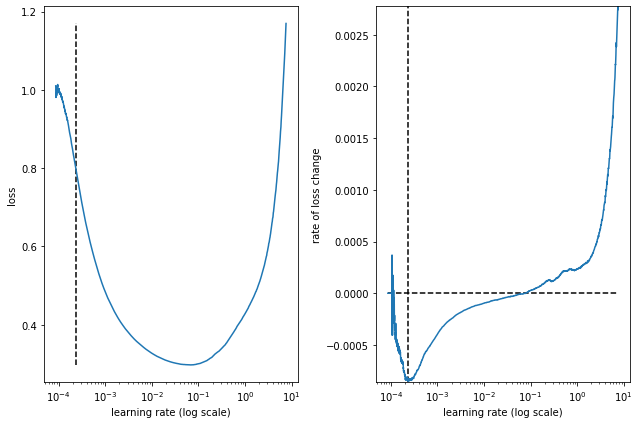

best lr: 0.00023779471 

Model: "conv1d_lstm_144l_48s_32bs_32fm_16f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 142, 16)           496       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 71, 16)           0         
 )                                                               
                                                                 
 lstm (LSTM)                 (None, 32)                6272      
                                                                 
 dense (Dense)               (None, 32)                1056      
                                                                 
 dense_1 (Dense)             (None, 48)                1584      
                                                                 
 reshape (Reshape)           (None, 48, 1)             0         
   

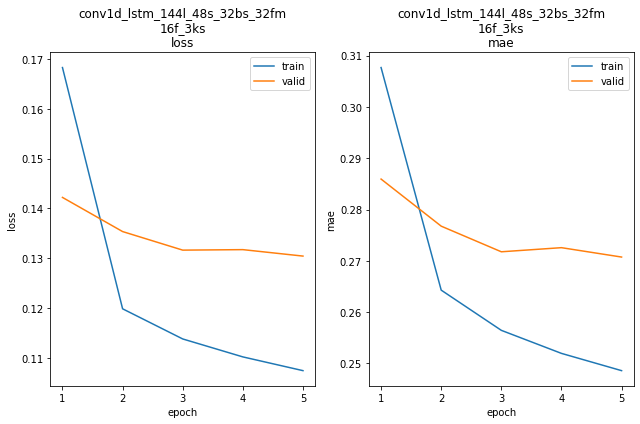

conv1d_lstm_144l_48s_32bs_32fm_16f_3ks train min loss: 0.107438	mae: 0.248584	epoch: 5
conv1d_lstm_144l_48s_32bs_32fm_16f_3ks valid min loss: 0.130437	mae: 0.270731	epoch: 5

conv1d_lstm_144l_48s_32bs_32fm_16f_3ks
Iteration No: 1 ended. Evaluation done at provided point.
Time taken: 455.3067
Function value obtained: 0.1304
Current minimum: 0.1304
Iteration No: 2 started. Evaluating function at random point.
lags 120
feat_maps 18
filters 51
kern_size 5
Epoch 1/5
5877/5877 [==============================] - 59s 10ms/step - loss: 1.2615 - mae: 0.7258


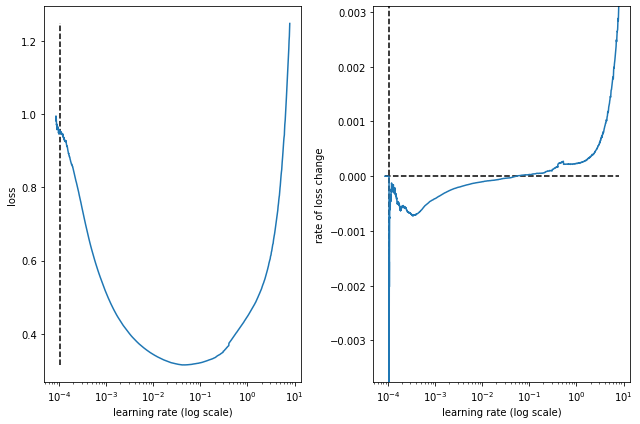

best lr: 0.0001053277 

Model: "conv1d_lstm_120l_48s_32bs_18fm_51f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 116, 51)           2601      
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 58, 51)           0         
 1D)                                                             
                                                                 
 lstm_1 (LSTM)               (None, 18)                5040      
                                                                 
 dense_2 (Dense)             (None, 18)                342       
                                                                 
 dense_3 (Dense)             (None, 48)                912       
                                                                 
 reshape_1 (Reshape)         (None, 48, 1)             0         
    

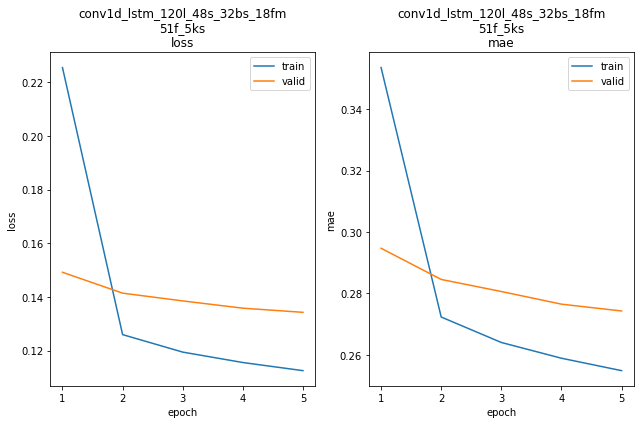

conv1d_lstm_120l_48s_32bs_18fm_51f_5ks train min loss: 0.112529	mae: 0.254832	epoch: 5
conv1d_lstm_120l_48s_32bs_18fm_51f_5ks valid min loss: 0.134266	mae: 0.274278	epoch: 5

conv1d_lstm_120l_48s_32bs_18fm_51f_5ks
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 420.7501
Function value obtained: 0.1343
Current minimum: 0.1304
Iteration No: 3 started. Evaluating function at random point.
lags 77
feat_maps 14
filters 32
kern_size 4
Epoch 1/5
5878/5878 [==============================] - 54s 9ms/step - loss: 1.3057 - mae: 0.7400


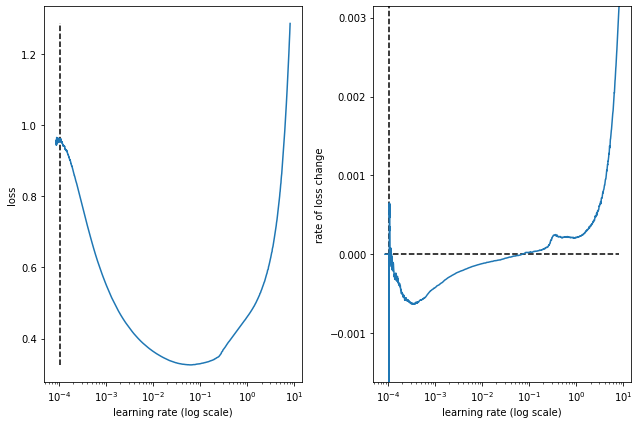

best lr: 0.000105322695 

Model: "conv1d_lstm_77l_48s_32bs_14fm_32f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 74, 32)            1312      
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 37, 32)           0         
 1D)                                                             
                                                                 
 lstm_2 (LSTM)               (None, 14)                2632      
                                                                 
 dense_4 (Dense)             (None, 14)                210       
                                                                 
 dense_5 (Dense)             (None, 48)                720       
                                                                 
 reshape_2 (Reshape)         (None, 48, 1)             0         
   

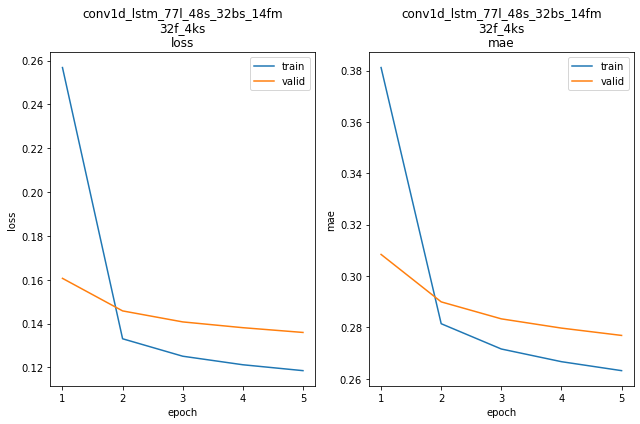

conv1d_lstm_77l_48s_32bs_14fm_32f_4ks train min loss: 0.118521	mae: 0.263166	epoch: 5
conv1d_lstm_77l_48s_32bs_14fm_32f_4ks valid min loss: 0.135948	mae: 0.276882	epoch: 5

conv1d_lstm_77l_48s_32bs_14fm_32f_4ks
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 438.6643
Function value obtained: 0.1359
Current minimum: 0.1304
Iteration No: 4 started. Evaluating function at random point.
lags 41
feat_maps 44
filters 7
kern_size 6
Epoch 1/5
5879/5879 [==============================] - 54s 9ms/step - loss: 1.1707 - mae: 0.7071


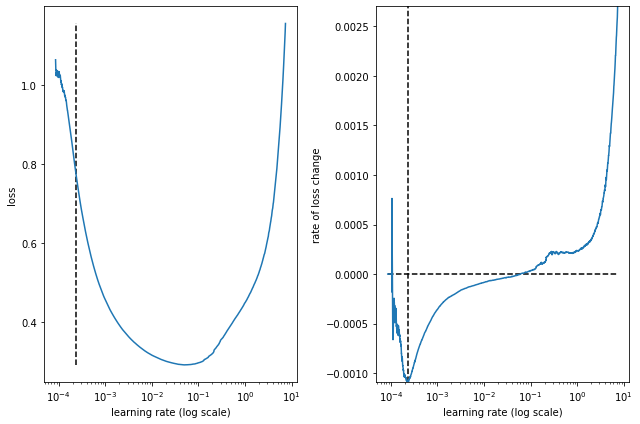

best lr: 0.00023185372 

Model: "conv1d_lstm_41l_48s_32bs_44fm_7f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_3 (Conv1D)           (None, 36, 7)             427       
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 18, 7)            0         
 1D)                                                             
                                                                 
 lstm_3 (LSTM)               (None, 44)                9152      
                                                                 
 dense_6 (Dense)             (None, 44)                1980      
                                                                 
 dense_7 (Dense)             (None, 48)                2160      
                                                                 
 reshape_3 (Reshape)         (None, 48, 1)             0         
     

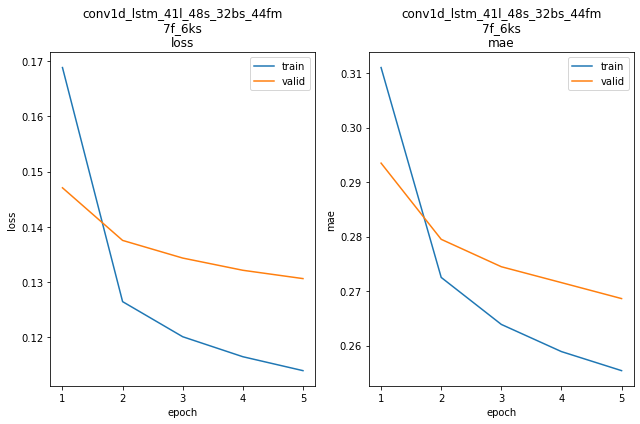

conv1d_lstm_41l_48s_32bs_44fm_7f_6ks train min loss: 0.113939	mae: 0.255396	epoch: 5
conv1d_lstm_41l_48s_32bs_44fm_7f_6ks valid min loss: 0.130608	mae: 0.268622	epoch: 5

conv1d_lstm_41l_48s_32bs_44fm_7f_6ks
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 401.3113
Function value obtained: 0.1306
Current minimum: 0.1304
Iteration No: 5 started. Evaluating function at random point.
lags 137
feat_maps 8
filters 64
kern_size 5
Epoch 1/5
5876/5876 [==============================] - 60s 10ms/step - loss: 1.5090 - mae: 0.7892


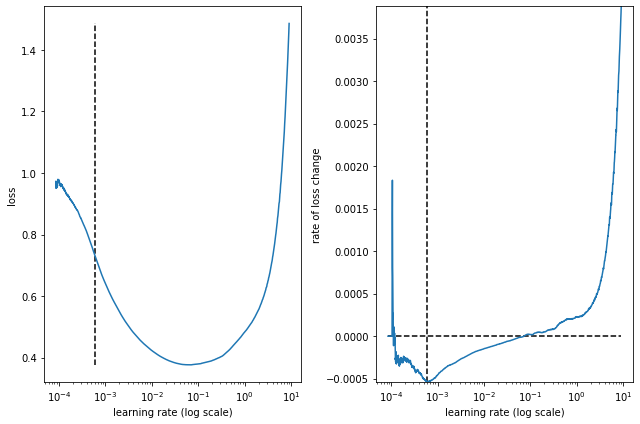

best lr: 0.0006042476 

Model: "conv1d_lstm_137l_48s_32bs_8fm_64f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 133, 64)           3264      
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 66, 64)           0         
 1D)                                                             
                                                                 
 lstm_4 (LSTM)               (None, 8)                 2336      
                                                                 
 dense_8 (Dense)             (None, 8)                 72        
                                                                 
 dense_9 (Dense)             (None, 48)                432       
                                                                 
 reshape_4 (Reshape)         (None, 48, 1)             0         
     

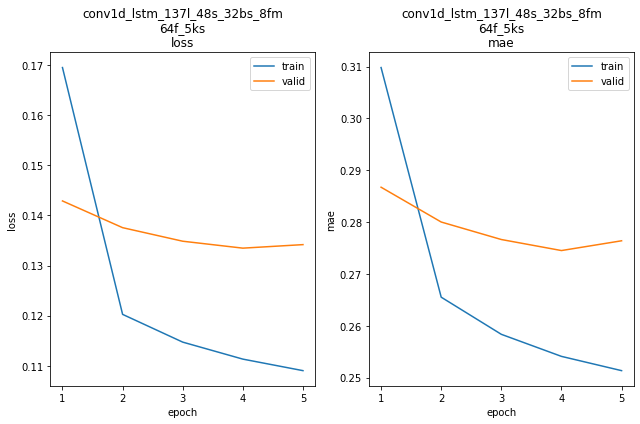

conv1d_lstm_137l_48s_32bs_8fm_64f_5ks train min loss: 0.109015	mae: 0.251330	epoch: 5
conv1d_lstm_137l_48s_32bs_8fm_64f_5ks valid min loss: 0.133471	mae: 0.274498	epoch: 4

conv1d_lstm_137l_48s_32bs_8fm_64f_5ks
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 398.2453
Function value obtained: 0.1335
Current minimum: 0.1304
Iteration No: 6 started. Evaluating function at random point.
lags 97
feat_maps 8
filters 5
kern_size 5
Epoch 1/5
5878/5878 [==============================] - 59s 10ms/step - loss: 1.6504 - mae: 0.8258


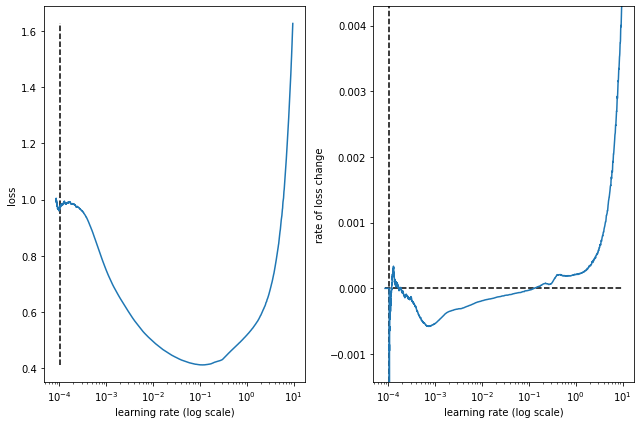

best lr: 0.00010619521 

Model: "conv1d_lstm_97l_48s_32bs_8fm_5f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_5 (Conv1D)           (None, 93, 5)             255       
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 46, 5)            0         
 1D)                                                             
                                                                 
 lstm_5 (LSTM)               (None, 8)                 448       
                                                                 
 dense_10 (Dense)            (None, 8)                 72        
                                                                 
 dense_11 (Dense)            (None, 48)                432       
                                                                 
 reshape_5 (Reshape)         (None, 48, 1)             0         
      

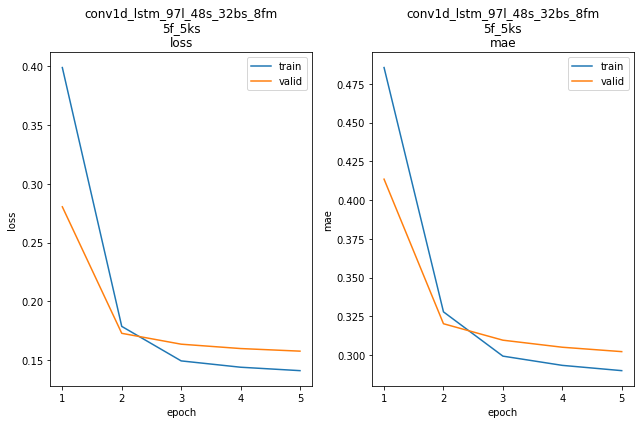

conv1d_lstm_97l_48s_32bs_8fm_5f_5ks train min loss: 0.141190	mae: 0.289943	epoch: 5
conv1d_lstm_97l_48s_32bs_8fm_5f_5ks valid min loss: 0.157766	mae: 0.302214	epoch: 5

conv1d_lstm_97l_48s_32bs_8fm_5f_5ks
WARN: bad model conv1d_lstm_97l_48s_32bs_8fm_5f_5ks
Iteration No: 6 ended. Evaluation done at random point.
Time taken: 413.2034
Function value obtained: 0.1578
Current minimum: 0.1304
Iteration No: 7 started. Evaluating function at random point.
lags 72
feat_maps 11
filters 62
kern_size 4
Epoch 1/5
5878/5878 [==============================] - 58s 9ms/step - loss: 1.4818 - mae: 0.7851


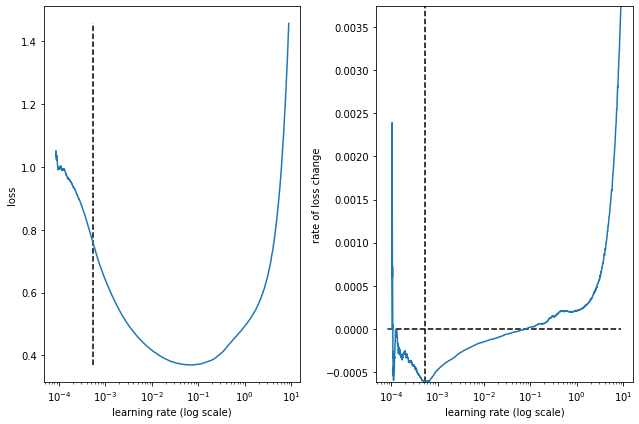

best lr: 0.0005364892 

Model: "conv1d_lstm_72l_48s_32bs_11fm_62f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_6 (Conv1D)           (None, 69, 62)            2542      
                                                                 
 max_pooling1d_6 (MaxPooling  (None, 34, 62)           0         
 1D)                                                             
                                                                 
 lstm_6 (LSTM)               (None, 11)                3256      
                                                                 
 dense_12 (Dense)            (None, 11)                132       
                                                                 
 dense_13 (Dense)            (None, 48)                576       
                                                                 
 reshape_6 (Reshape)         (None, 48, 1)             0         
     

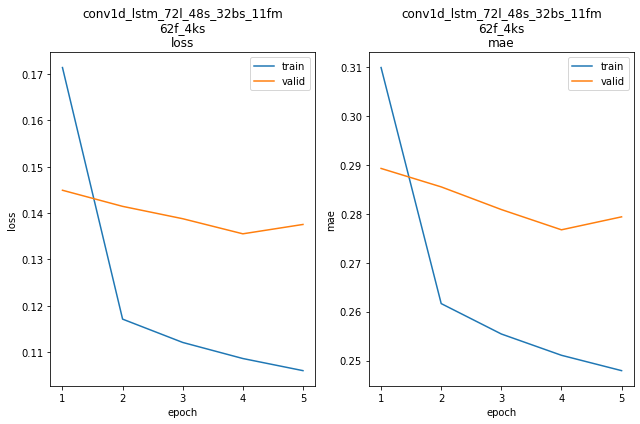

conv1d_lstm_72l_48s_32bs_11fm_62f_4ks train min loss: 0.105991	mae: 0.247929	epoch: 5
conv1d_lstm_72l_48s_32bs_11fm_62f_4ks valid min loss: 0.135530	mae: 0.276743	epoch: 4

conv1d_lstm_72l_48s_32bs_11fm_62f_4ks
Iteration No: 7 ended. Evaluation done at random point.
Time taken: 378.6212
Function value obtained: 0.1355
Current minimum: 0.1304
Iteration No: 8 started. Evaluating function at random point.
lags 35
feat_maps 43
filters 27
kern_size 7
Epoch 1/5
5879/5879 [==============================] - 54s 9ms/step - loss: 1.1164 - mae: 0.6902


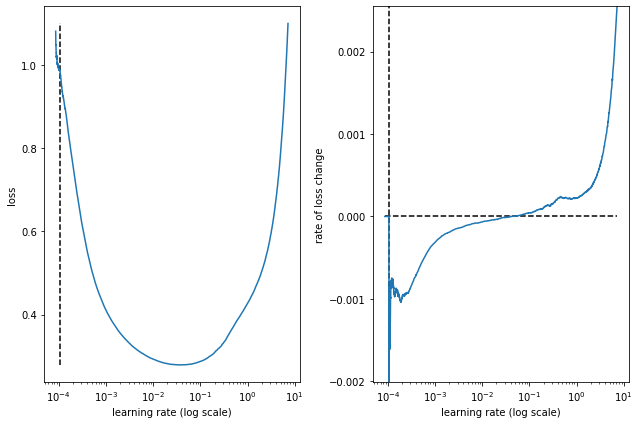

best lr: 0.0001058986 

Model: "conv1d_lstm_35l_48s_32bs_43fm_27f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_7 (Conv1D)           (None, 29, 27)            1917      
                                                                 
 max_pooling1d_7 (MaxPooling  (None, 14, 27)           0         
 1D)                                                             
                                                                 
 lstm_7 (LSTM)               (None, 43)                12212     
                                                                 
 dense_14 (Dense)            (None, 43)                1892      
                                                                 
 dense_15 (Dense)            (None, 48)                2112      
                                                                 
 reshape_7 (Reshape)         (None, 48, 1)             0         
     

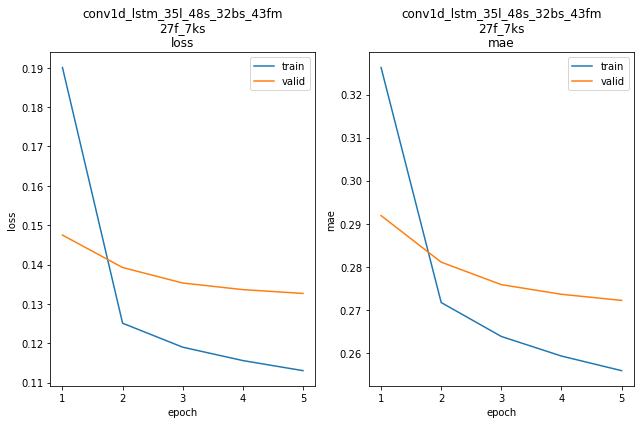

conv1d_lstm_35l_48s_32bs_43fm_27f_7ks train min loss: 0.113030	mae: 0.255896	epoch: 5
conv1d_lstm_35l_48s_32bs_43fm_27f_7ks valid min loss: 0.132648	mae: 0.272207	epoch: 5

conv1d_lstm_35l_48s_32bs_43fm_27f_7ks
Iteration No: 8 ended. Evaluation done at random point.
Time taken: 397.8110
Function value obtained: 0.1326
Current minimum: 0.1304
Iteration No: 9 started. Evaluating function at random point.
lags 80
feat_maps 56
filters 45
kern_size 5
Epoch 1/5
5878/5878 [==============================] - 58s 9ms/step - loss: 1.0112 - mae: 0.6634


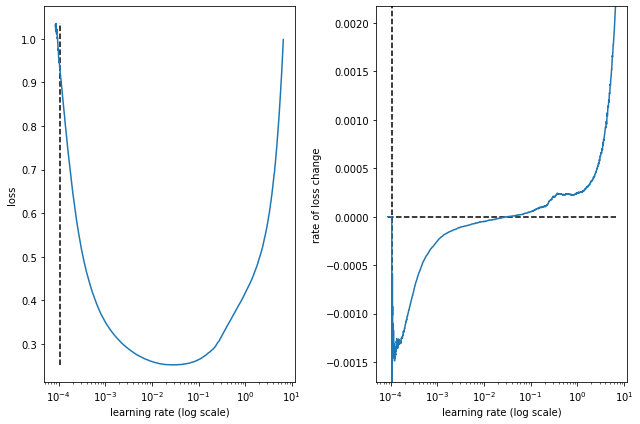

best lr: 0.00010561274 

Model: "conv1d_lstm_80l_48s_32bs_56fm_45f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_8 (Conv1D)           (None, 76, 45)            2295      
                                                                 
 max_pooling1d_8 (MaxPooling  (None, 38, 45)           0         
 1D)                                                             
                                                                 
 lstm_8 (LSTM)               (None, 56)                22848     
                                                                 
 dense_16 (Dense)            (None, 56)                3192      
                                                                 
 dense_17 (Dense)            (None, 48)                2736      
                                                                 
 reshape_8 (Reshape)         (None, 48, 1)             0         
    

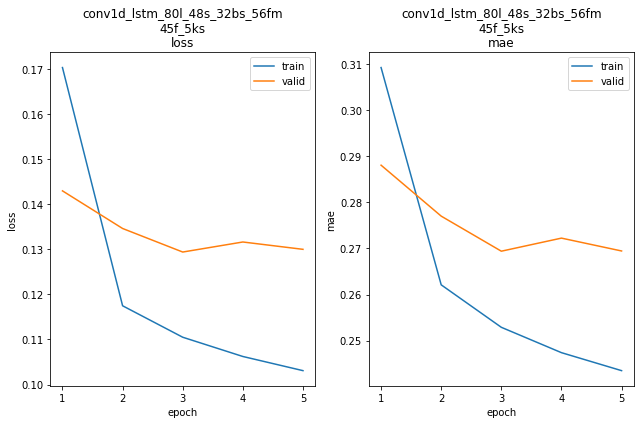

conv1d_lstm_80l_48s_32bs_56fm_45f_5ks train min loss: 0.103084	mae: 0.243499	epoch: 5
conv1d_lstm_80l_48s_32bs_56fm_45f_5ks valid min loss: 0.129383	mae: 0.269415	epoch: 3

conv1d_lstm_80l_48s_32bs_56fm_45f_5ks
Iteration No: 9 ended. Evaluation done at random point.
Time taken: 438.5019
Function value obtained: 0.1294
Current minimum: 0.1294
Iteration No: 10 started. Evaluating function at random point.
lags 26
feat_maps 61
filters 38
kern_size 5
Epoch 1/5
5880/5880 [==============================] - 54s 9ms/step - loss: 0.9802 - mae: 0.6515


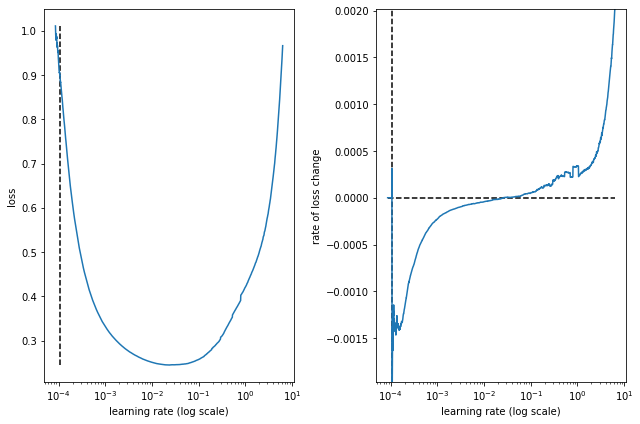

best lr: 0.00010735912 

Model: "conv1d_lstm_26l_48s_32bs_61fm_38f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_9 (Conv1D)           (None, 22, 38)            1938      
                                                                 
 max_pooling1d_9 (MaxPooling  (None, 11, 38)           0         
 1D)                                                             
                                                                 
 lstm_9 (LSTM)               (None, 61)                24400     
                                                                 
 dense_18 (Dense)            (None, 61)                3782      
                                                                 
 dense_19 (Dense)            (None, 48)                2976      
                                                                 
 reshape_9 (Reshape)         (None, 48, 1)             0         
    

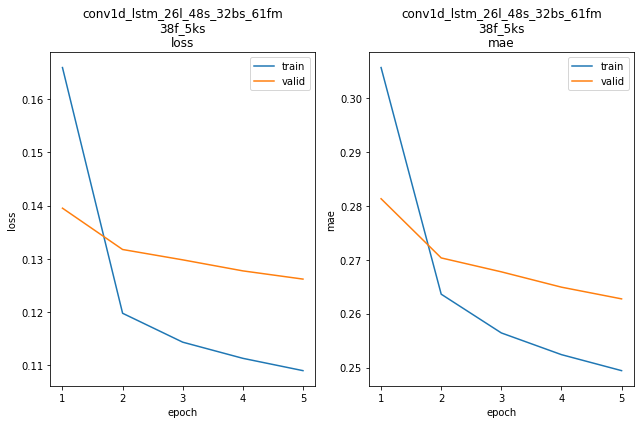

conv1d_lstm_26l_48s_32bs_61fm_38f_5ks train min loss: 0.109002	mae: 0.249419	epoch: 5
conv1d_lstm_26l_48s_32bs_61fm_38f_5ks valid min loss: 0.126199	mae: 0.262742	epoch: 5

conv1d_lstm_26l_48s_32bs_61fm_38f_5ks
Iteration No: 10 ended. Evaluation done at random point.
Time taken: 400.1731
Function value obtained: 0.1262
Current minimum: 0.1262
Iteration No: 11 started. Evaluating function at random point.
lags 26
feat_maps 21
filters 18
kern_size 6
Epoch 1/5
5880/5880 [==============================] - 57s 9ms/step - loss: 1.3115 - mae: 0.7406


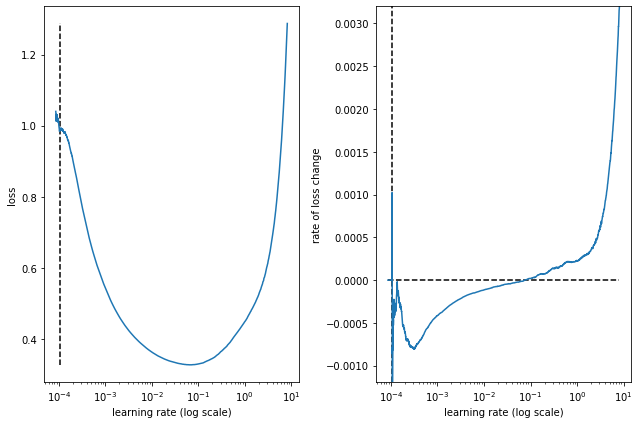

best lr: 0.00010735912 

Model: "conv1d_lstm_26l_48s_32bs_21fm_18f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_10 (Conv1D)          (None, 21, 18)            1098      
                                                                 
 max_pooling1d_10 (MaxPoolin  (None, 10, 18)           0         
 g1D)                                                            
                                                                 
 lstm_10 (LSTM)              (None, 21)                3360      
                                                                 
 dense_20 (Dense)            (None, 21)                462       
                                                                 
 dense_21 (Dense)            (None, 48)                1056      
                                                                 
 reshape_10 (Reshape)        (None, 48, 1)             0         
    

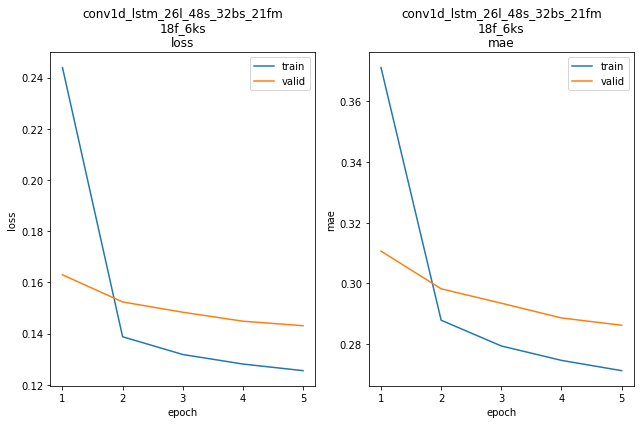

conv1d_lstm_26l_48s_32bs_21fm_18f_6ks train min loss: 0.125546	mae: 0.271239	epoch: 5
conv1d_lstm_26l_48s_32bs_21fm_18f_6ks valid min loss: 0.143099	mae: 0.286212	epoch: 5

conv1d_lstm_26l_48s_32bs_21fm_18f_6ks
Iteration No: 11 ended. Evaluation done at random point.
Time taken: 428.1412
Function value obtained: 0.1431
Current minimum: 0.1262
Iteration No: 12 started. Evaluating function at random point.
lags 137
feat_maps 64
filters 7
kern_size 3
Epoch 1/5
5876/5876 [==============================] - 54s 9ms/step - loss: 1.1634 - mae: 0.5268


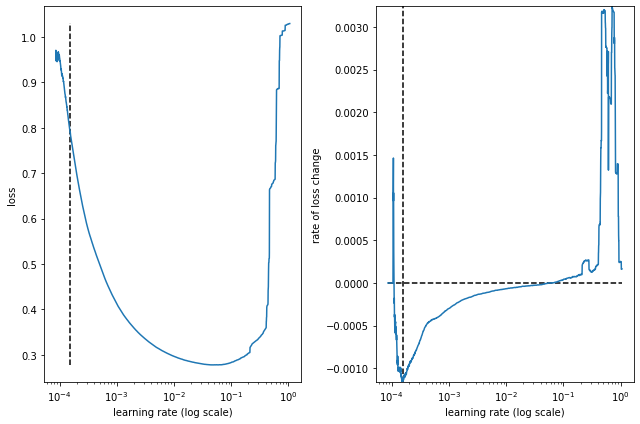

best lr: 0.0001543938 

Model: "conv1d_lstm_137l_48s_32bs_64fm_7f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_11 (Conv1D)          (None, 135, 7)            217       
                                                                 
 max_pooling1d_11 (MaxPoolin  (None, 67, 7)            0         
 g1D)                                                            
                                                                 
 lstm_11 (LSTM)              (None, 64)                18432     
                                                                 
 dense_22 (Dense)            (None, 64)                4160      
                                                                 
 dense_23 (Dense)            (None, 48)                3120      
                                                                 
 reshape_11 (Reshape)        (None, 48, 1)             0         
     

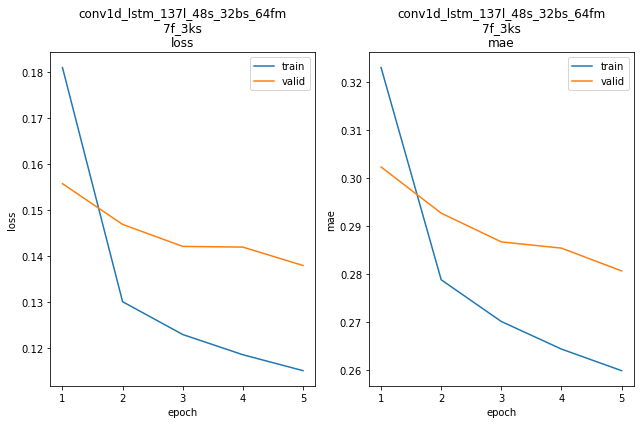

conv1d_lstm_137l_48s_32bs_64fm_7f_3ks train min loss: 0.115175	mae: 0.259849	epoch: 5
conv1d_lstm_137l_48s_32bs_64fm_7f_3ks valid min loss: 0.138006	mae: 0.280619	epoch: 5

conv1d_lstm_137l_48s_32bs_64fm_7f_3ks
Iteration No: 12 ended. Evaluation done at random point.
Time taken: 413.2274
Function value obtained: 0.1380
Current minimum: 0.1262
Iteration No: 13 started. Searching for the next optimal point.
lags 75
feat_maps 64
filters 64
kern_size 3
Epoch 1/5
5878/5878 [==============================] - 59s 10ms/step - loss: 0.9825 - mae: 0.6470


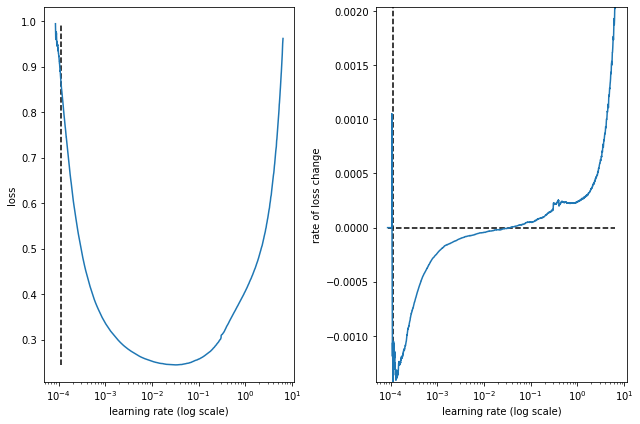

best lr: 0.000111584224 

Model: "conv1d_lstm_75l_48s_32bs_64fm_64f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_12 (Conv1D)          (None, 73, 64)            1984      
                                                                 
 max_pooling1d_12 (MaxPoolin  (None, 36, 64)           0         
 g1D)                                                            
                                                                 
 lstm_12 (LSTM)              (None, 64)                33024     
                                                                 
 dense_24 (Dense)            (None, 64)                4160      
                                                                 
 dense_25 (Dense)            (None, 48)                3120      
                                                                 
 reshape_12 (Reshape)        (None, 48, 1)             0         
   

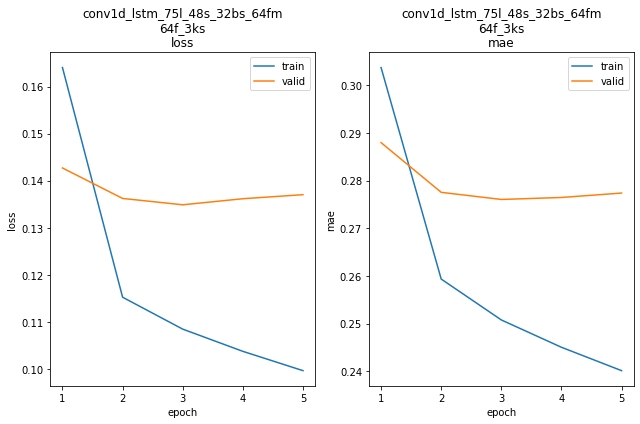

conv1d_lstm_75l_48s_32bs_64fm_64f_3ks train min loss: 0.099634	mae: 0.240154	epoch: 5
conv1d_lstm_75l_48s_32bs_64fm_64f_3ks valid min loss: 0.134875	mae: 0.276042	epoch: 3

conv1d_lstm_75l_48s_32bs_64fm_64f_3ks
Iteration No: 13 ended. Search finished for the next optimal point.
Time taken: 407.6773
Function value obtained: 0.1349
Current minimum: 0.1262
Iteration No: 14 started. Searching for the next optimal point.
lags 55
feat_maps 39
filters 64
kern_size 7
Epoch 1/5
5879/5879 [==============================] - 57s 9ms/step - loss: 1.0820 - mae: 0.6847


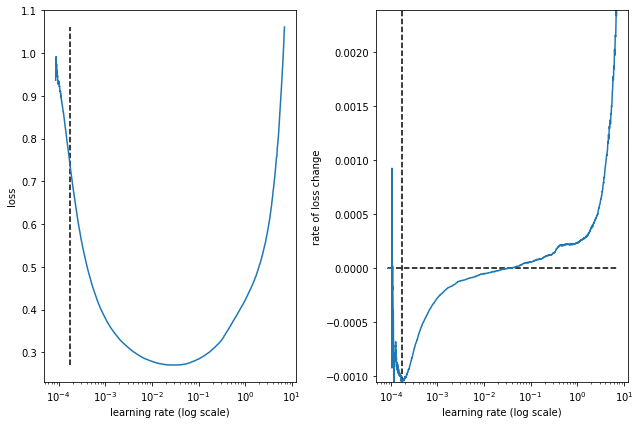

best lr: 0.00017611736 

Model: "conv1d_lstm_55l_48s_32bs_39fm_64f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_13 (Conv1D)          (None, 49, 64)            4544      
                                                                 
 max_pooling1d_13 (MaxPoolin  (None, 24, 64)           0         
 g1D)                                                            
                                                                 
 lstm_13 (LSTM)              (None, 39)                16224     
                                                                 
 dense_26 (Dense)            (None, 39)                1560      
                                                                 
 dense_27 (Dense)            (None, 48)                1920      
                                                                 
 reshape_13 (Reshape)        (None, 48, 1)             0         
    

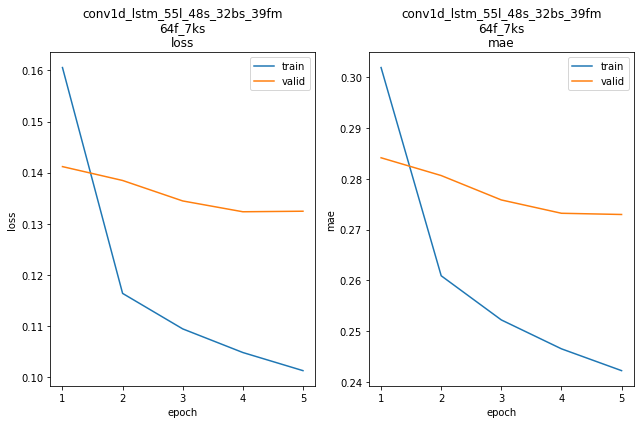

conv1d_lstm_55l_48s_32bs_39fm_64f_7ks train min loss: 0.101267	mae: 0.242201	epoch: 5
conv1d_lstm_55l_48s_32bs_39fm_64f_7ks valid min loss: 0.132346	mae: 0.273222	epoch: 4

conv1d_lstm_55l_48s_32bs_39fm_64f_7ks
Iteration No: 14 ended. Search finished for the next optimal point.
Time taken: 405.7796
Function value obtained: 0.1323
Current minimum: 0.1262
Iteration No: 15 started. Searching for the next optimal point.
lags 111
feat_maps 52
filters 27
kern_size 3
Epoch 1/5
5877/5877 [==============================] - 61s 10ms/step - loss: 1.0243 - mae: 0.6579


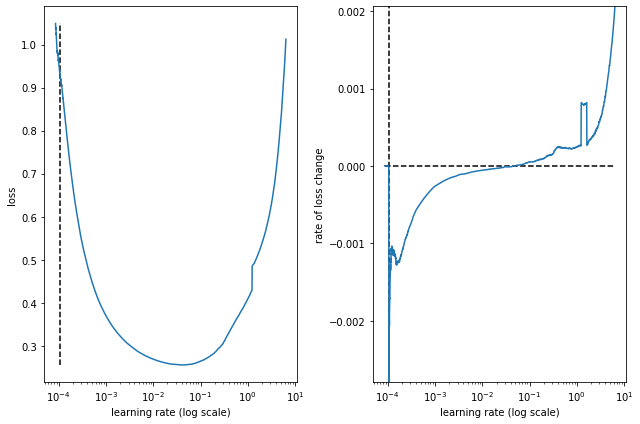

best lr: 0.0001059087 

Model: "conv1d_lstm_111l_48s_32bs_52fm_27f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_14 (Conv1D)          (None, 109, 27)           837       
                                                                 
 max_pooling1d_14 (MaxPoolin  (None, 54, 27)           0         
 g1D)                                                            
                                                                 
 lstm_14 (LSTM)              (None, 52)                16640     
                                                                 
 dense_28 (Dense)            (None, 52)                2756      
                                                                 
 dense_29 (Dense)            (None, 48)                2544      
                                                                 
 reshape_14 (Reshape)        (None, 48, 1)             0         
    

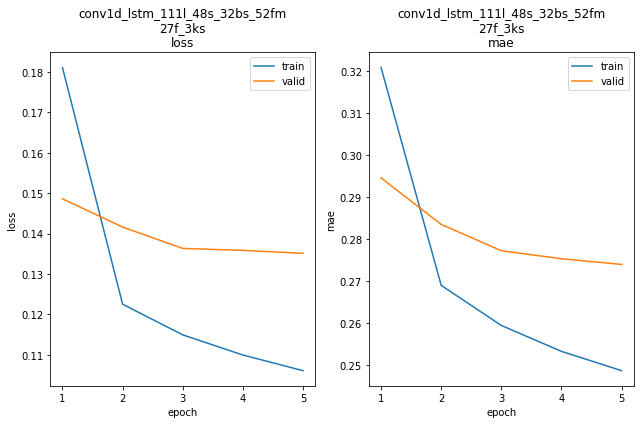

conv1d_lstm_111l_48s_32bs_52fm_27f_3ks train min loss: 0.106059	mae: 0.248661	epoch: 5
conv1d_lstm_111l_48s_32bs_52fm_27f_3ks valid min loss: 0.135100	mae: 0.273929	epoch: 5

conv1d_lstm_111l_48s_32bs_52fm_27f_3ks
Iteration No: 15 ended. Search finished for the next optimal point.
Time taken: 387.4706
Function value obtained: 0.1351
Current minimum: 0.1262
Iteration No: 16 started. Searching for the next optimal point.
lags 42
feat_maps 33
filters 42
kern_size 4
Epoch 1/5
5879/5879 [==============================] - 57s 9ms/step - loss: 1.1298 - mae: 0.6967


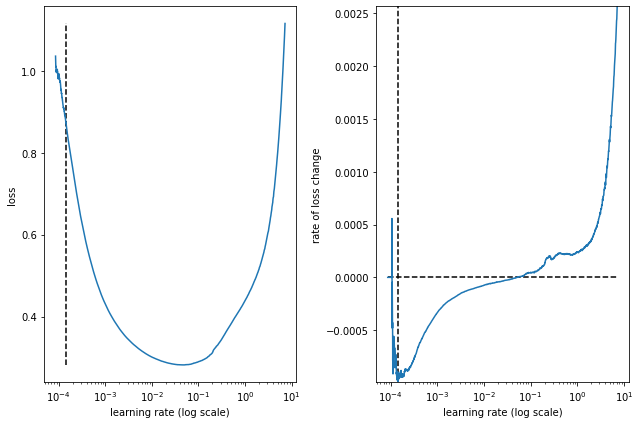

best lr: 0.00014290558 

Model: "conv1d_lstm_42l_48s_32bs_33fm_42f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_15 (Conv1D)          (None, 39, 42)            1722      
                                                                 
 max_pooling1d_15 (MaxPoolin  (None, 19, 42)           0         
 g1D)                                                            
                                                                 
 lstm_15 (LSTM)              (None, 33)                10032     
                                                                 
 dense_30 (Dense)            (None, 33)                1122      
                                                                 
 dense_31 (Dense)            (None, 48)                1632      
                                                                 
 reshape_15 (Reshape)        (None, 48, 1)             0         
    

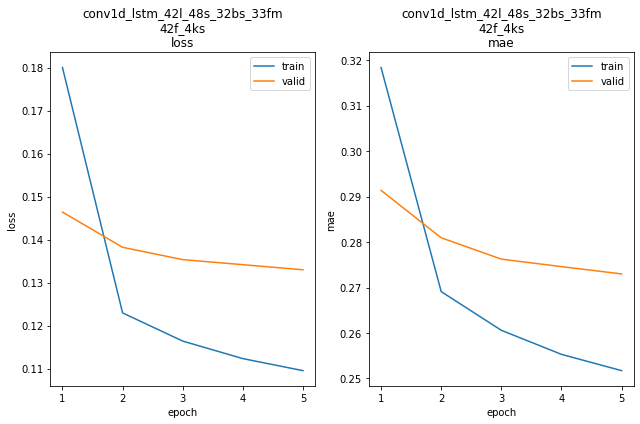

conv1d_lstm_42l_48s_32bs_33fm_42f_4ks train min loss: 0.109507	mae: 0.251726	epoch: 5
conv1d_lstm_42l_48s_32bs_33fm_42f_4ks valid min loss: 0.132977	mae: 0.273003	epoch: 5

conv1d_lstm_42l_48s_32bs_33fm_42f_4ks
Iteration No: 16 ended. Search finished for the next optimal point.
Time taken: 391.9264
Function value obtained: 0.1330
Current minimum: 0.1262
Iteration No: 17 started. Searching for the next optimal point.
lags 124
feat_maps 64
filters 48
kern_size 4
Epoch 1/5
5877/5877 [==============================] - 62s 10ms/step - loss: 0.9710 - mae: 0.6494


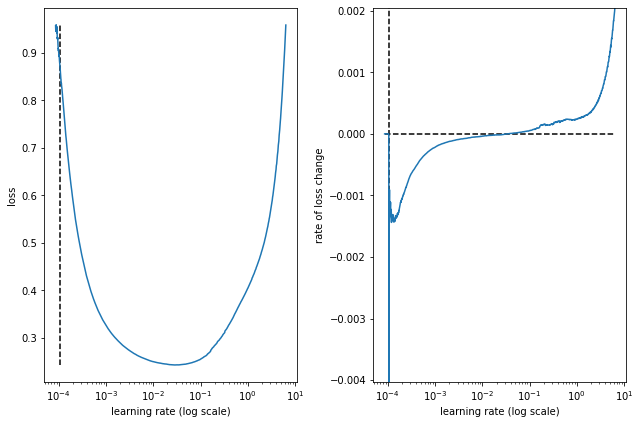

best lr: 0.0001053277 

Model: "conv1d_lstm_124l_48s_32bs_64fm_48f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_16 (Conv1D)          (None, 121, 48)           1968      
                                                                 
 max_pooling1d_16 (MaxPoolin  (None, 60, 48)           0         
 g1D)                                                            
                                                                 
 lstm_16 (LSTM)              (None, 64)                28928     
                                                                 
 dense_32 (Dense)            (None, 64)                4160      
                                                                 
 dense_33 (Dense)            (None, 48)                3120      
                                                                 
 reshape_16 (Reshape)        (None, 48, 1)             0         
    

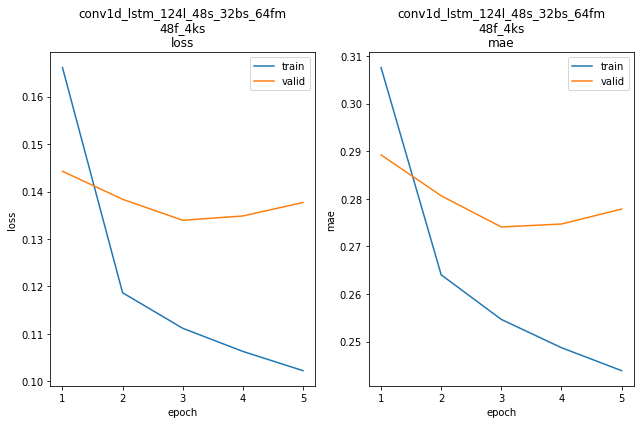

conv1d_lstm_124l_48s_32bs_64fm_48f_4ks train min loss: 0.102255	mae: 0.243878	epoch: 5
conv1d_lstm_124l_48s_32bs_64fm_48f_4ks valid min loss: 0.133939	mae: 0.274065	epoch: 3

conv1d_lstm_124l_48s_32bs_64fm_48f_4ks
Iteration No: 17 ended. Search finished for the next optimal point.
Time taken: 472.0520
Function value obtained: 0.1339
Current minimum: 0.1262
Iteration No: 18 started. Searching for the next optimal point.
lags 29
feat_maps 64
filters 18
kern_size 6
Epoch 1/5
5880/5880 [==============================] - 60s 10ms/step - loss: 1.0121 - mae: 0.6582


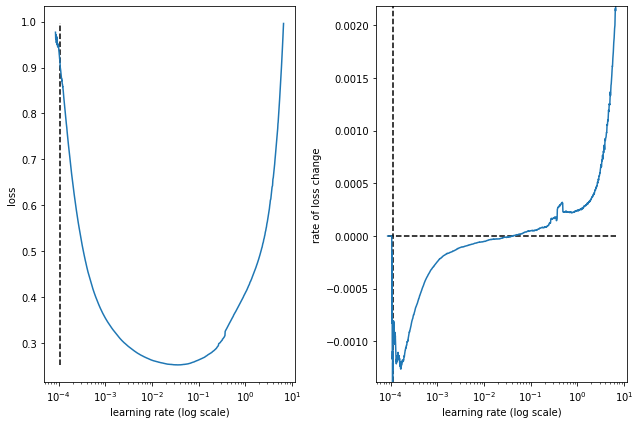

best lr: 0.000109445115 

Model: "conv1d_lstm_29l_48s_32bs_64fm_18f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_17 (Conv1D)          (None, 24, 18)            1098      
                                                                 
 max_pooling1d_17 (MaxPoolin  (None, 12, 18)           0         
 g1D)                                                            
                                                                 
 lstm_17 (LSTM)              (None, 64)                21248     
                                                                 
 dense_34 (Dense)            (None, 64)                4160      
                                                                 
 dense_35 (Dense)            (None, 48)                3120      
                                                                 
 reshape_17 (Reshape)        (None, 48, 1)             0         
   

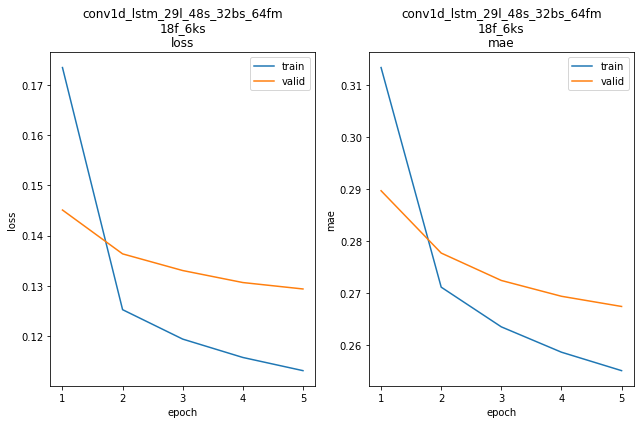

conv1d_lstm_29l_48s_32bs_64fm_18f_6ks train min loss: 0.113106	mae: 0.255152	epoch: 5
conv1d_lstm_29l_48s_32bs_64fm_18f_6ks valid min loss: 0.129371	mae: 0.267481	epoch: 5

conv1d_lstm_29l_48s_32bs_64fm_18f_6ks
Iteration No: 18 ended. Search finished for the next optimal point.
Time taken: 430.9774
Function value obtained: 0.1294
Current minimum: 0.1262
Iteration No: 19 started. Searching for the next optimal point.
lags 29
feat_maps 64
filters 64
kern_size 7
Epoch 1/5
5880/5880 [==============================] - 65s 11ms/step - loss: 0.9870 - mae: 0.6573


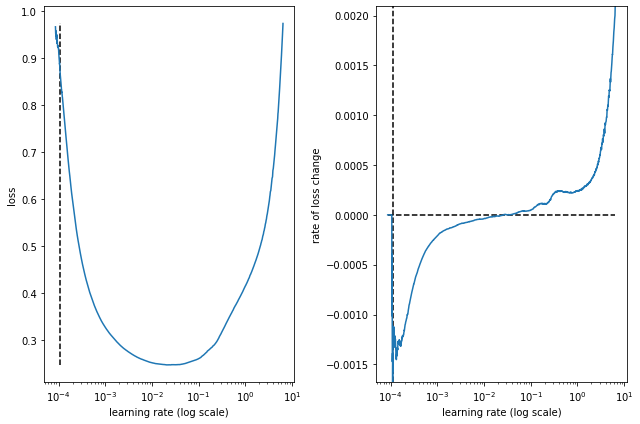

best lr: 0.000109445115 

Model: "conv1d_lstm_29l_48s_32bs_64fm_64f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_18 (Conv1D)          (None, 23, 64)            4544      
                                                                 
 max_pooling1d_18 (MaxPoolin  (None, 11, 64)           0         
 g1D)                                                            
                                                                 
 lstm_18 (LSTM)              (None, 64)                33024     
                                                                 
 dense_36 (Dense)            (None, 64)                4160      
                                                                 
 dense_37 (Dense)            (None, 48)                3120      
                                                                 
 reshape_18 (Reshape)        (None, 48, 1)             0         
   

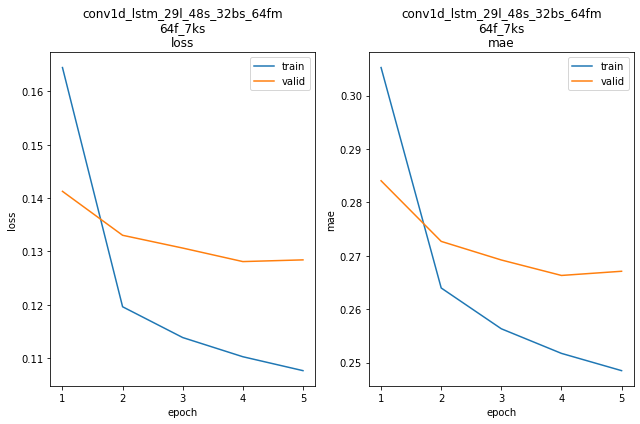

conv1d_lstm_29l_48s_32bs_64fm_64f_7ks train min loss: 0.107654	mae: 0.248496	epoch: 5
conv1d_lstm_29l_48s_32bs_64fm_64f_7ks valid min loss: 0.128104	mae: 0.266316	epoch: 4

conv1d_lstm_29l_48s_32bs_64fm_64f_7ks
Iteration No: 19 ended. Search finished for the next optimal point.
Time taken: 430.0464
Function value obtained: 0.1281
Current minimum: 0.1262
Iteration No: 20 started. Searching for the next optimal point.
lags 118
feat_maps 63
filters 38
kern_size 7
Epoch 1/5
5877/5877 [==============================] - 71s 12ms/step - loss: 0.9654 - mae: 0.6476


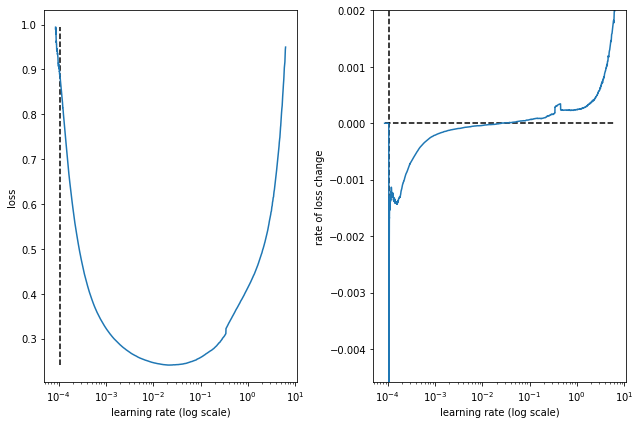

best lr: 0.0001053277 

Model: "conv1d_lstm_118l_48s_32bs_63fm_38f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_19 (Conv1D)          (None, 112, 38)           2698      
                                                                 
 max_pooling1d_19 (MaxPoolin  (None, 56, 38)           0         
 g1D)                                                            
                                                                 
 lstm_19 (LSTM)              (None, 63)                25704     
                                                                 
 dense_38 (Dense)            (None, 63)                4032      
                                                                 
 dense_39 (Dense)            (None, 48)                3072      
                                                                 
 reshape_19 (Reshape)        (None, 48, 1)             0         
    

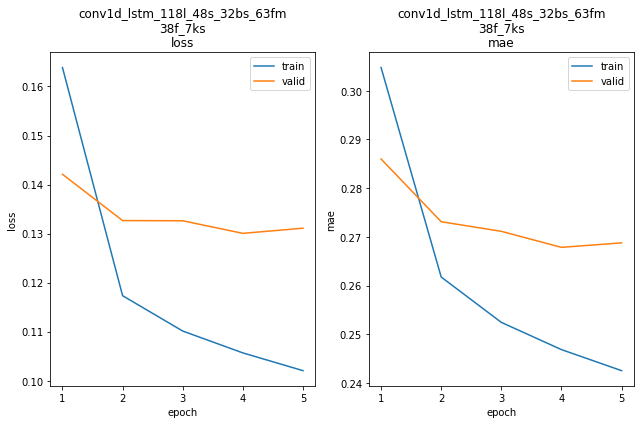

conv1d_lstm_118l_48s_32bs_63fm_38f_7ks train min loss: 0.102052	mae: 0.242574	epoch: 5
conv1d_lstm_118l_48s_32bs_63fm_38f_7ks valid min loss: 0.130049	mae: 0.267864	epoch: 4

conv1d_lstm_118l_48s_32bs_63fm_38f_7ks
Iteration No: 20 ended. Search finished for the next optimal point.
Time taken: 433.2467
Function value obtained: 0.1300
Current minimum: 0.1262
Iteration No: 21 started. Searching for the next optimal point.
lags 139
feat_maps 32
filters 64
kern_size 3
Epoch 1/5
5876/5876 [==============================] - 76s 12ms/step - loss: 1.1277 - mae: 0.6880


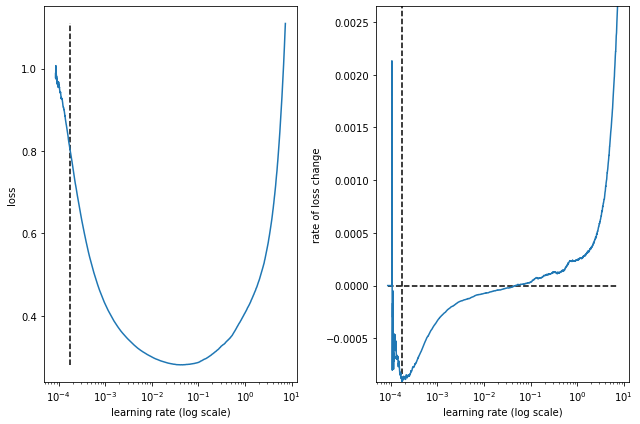

best lr: 0.00017378136 

Model: "conv1d_lstm_139l_48s_32bs_32fm_64f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_20 (Conv1D)          (None, 137, 64)           1984      
                                                                 
 max_pooling1d_20 (MaxPoolin  (None, 68, 64)           0         
 g1D)                                                            
                                                                 
 lstm_20 (LSTM)              (None, 32)                12416     
                                                                 
 dense_40 (Dense)            (None, 32)                1056      
                                                                 
 dense_41 (Dense)            (None, 48)                1584      
                                                                 
 reshape_20 (Reshape)        (None, 48, 1)             0         
   

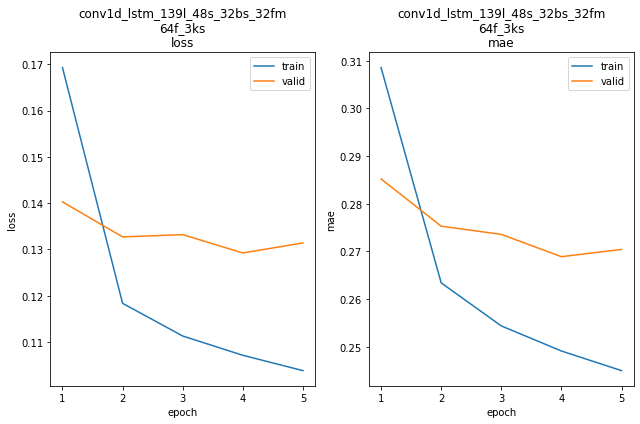

conv1d_lstm_139l_48s_32bs_32fm_64f_3ks train min loss: 0.103812	mae: 0.244999	epoch: 5
conv1d_lstm_139l_48s_32bs_32fm_64f_3ks valid min loss: 0.129246	mae: 0.268900	epoch: 4

conv1d_lstm_139l_48s_32bs_32fm_64f_3ks
Iteration No: 21 ended. Search finished for the next optimal point.
Time taken: 426.0338
Function value obtained: 0.1292
Current minimum: 0.1262
Iteration No: 22 started. Searching for the next optimal point.
lags 134
feat_maps 53
filters 64
kern_size 7
Epoch 1/5
5876/5876 [==============================] - 71s 12ms/step - loss: 0.9767 - mae: 0.6514


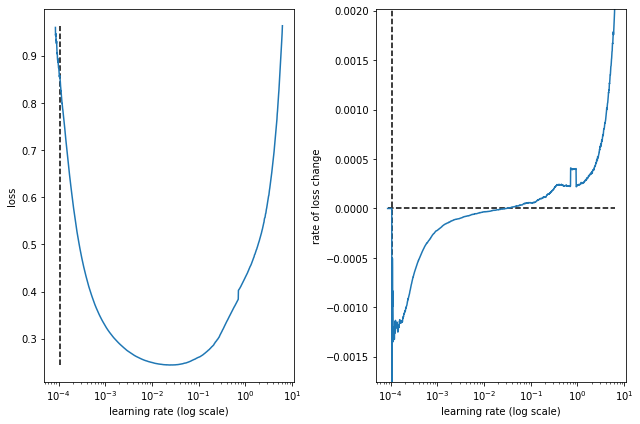

best lr: 0.00010562275 

Model: "conv1d_lstm_134l_48s_32bs_53fm_64f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_21 (Conv1D)          (None, 128, 64)           4544      
                                                                 
 max_pooling1d_21 (MaxPoolin  (None, 64, 64)           0         
 g1D)                                                            
                                                                 
 lstm_21 (LSTM)              (None, 53)                25016     
                                                                 
 dense_42 (Dense)            (None, 53)                2862      
                                                                 
 dense_43 (Dense)            (None, 48)                2592      
                                                                 
 reshape_21 (Reshape)        (None, 48, 1)             0         
   

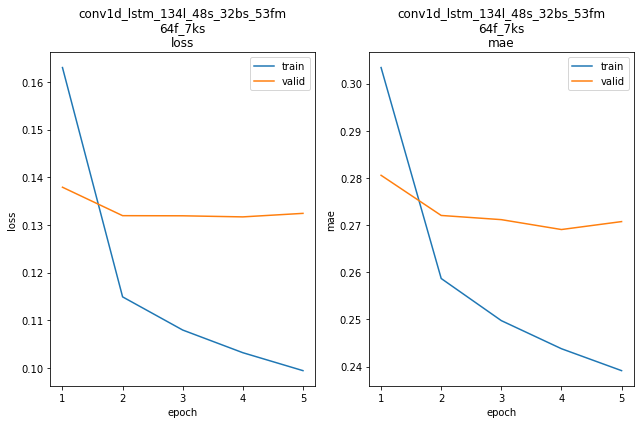

conv1d_lstm_134l_48s_32bs_53fm_64f_7ks train min loss: 0.099406	mae: 0.239129	epoch: 5
conv1d_lstm_134l_48s_32bs_53fm_64f_7ks valid min loss: 0.131672	mae: 0.269058	epoch: 4

conv1d_lstm_134l_48s_32bs_53fm_64f_7ks
Iteration No: 22 ended. Search finished for the next optimal point.
Time taken: 462.6185
Function value obtained: 0.1317
Current minimum: 0.1262
Iteration No: 23 started. Searching for the next optimal point.
lags 142
feat_maps 62
filters 4
kern_size 5
Epoch 1/5
5876/5876 [==============================] - 58s 9ms/step - loss: 1.2859 - mae: 0.4986


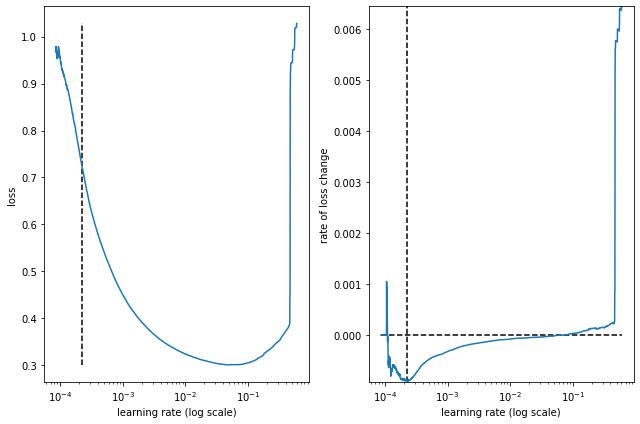

best lr: 0.00022630653 

Model: "conv1d_lstm_142l_48s_32bs_62fm_4f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_22 (Conv1D)          (None, 138, 4)            204       
                                                                 
 max_pooling1d_22 (MaxPoolin  (None, 69, 4)            0         
 g1D)                                                            
                                                                 
 lstm_22 (LSTM)              (None, 62)                16616     
                                                                 
 dense_44 (Dense)            (None, 62)                3906      
                                                                 
 dense_45 (Dense)            (None, 48)                3024      
                                                                 
 reshape_22 (Reshape)        (None, 48, 1)             0         
    

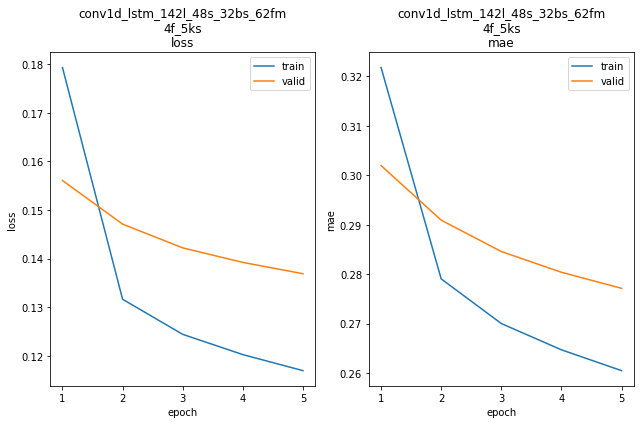

conv1d_lstm_142l_48s_32bs_62fm_4f_5ks train min loss: 0.116945	mae: 0.260463	epoch: 5
conv1d_lstm_142l_48s_32bs_62fm_4f_5ks valid min loss: 0.136893	mae: 0.277122	epoch: 5

conv1d_lstm_142l_48s_32bs_62fm_4f_5ks
Iteration No: 23 ended. Search finished for the next optimal point.
Time taken: 439.4266
Function value obtained: 0.1369
Current minimum: 0.1262
Iteration No: 24 started. Searching for the next optimal point.
lags 39
feat_maps 46
filters 62
kern_size 3
Epoch 1/5
5879/5879 [==============================] - 66s 11ms/step - loss: 1.0504 - mae: 0.6689


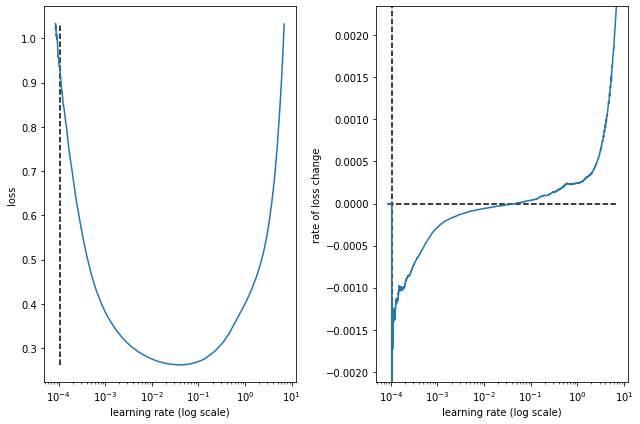

best lr: 0.00010531785 

Model: "conv1d_lstm_39l_48s_32bs_46fm_62f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_23 (Conv1D)          (None, 37, 62)            1922      
                                                                 
 max_pooling1d_23 (MaxPoolin  (None, 18, 62)           0         
 g1D)                                                            
                                                                 
 lstm_23 (LSTM)              (None, 46)                20056     
                                                                 
 dense_46 (Dense)            (None, 46)                2162      
                                                                 
 dense_47 (Dense)            (None, 48)                2256      
                                                                 
 reshape_23 (Reshape)        (None, 48, 1)             0         
    

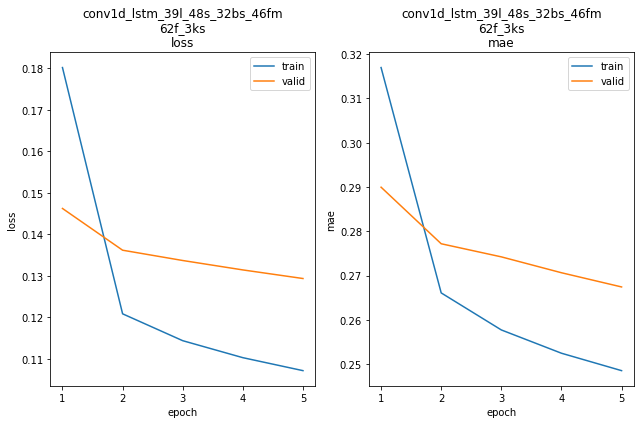

conv1d_lstm_39l_48s_32bs_46fm_62f_3ks train min loss: 0.107124	mae: 0.248538	epoch: 5
conv1d_lstm_39l_48s_32bs_46fm_62f_3ks valid min loss: 0.129341	mae: 0.267435	epoch: 5

conv1d_lstm_39l_48s_32bs_46fm_62f_3ks
Iteration No: 24 ended. Search finished for the next optimal point.
Time taken: 379.1245
Function value obtained: 0.1293
Current minimum: 0.1262
Iteration No: 25 started. Searching for the next optimal point.
lags 84
feat_maps 38
filters 44
kern_size 5
Epoch 1/5
5878/5878 [==============================] - 70s 11ms/step - loss: 1.0966 - mae: 0.6823


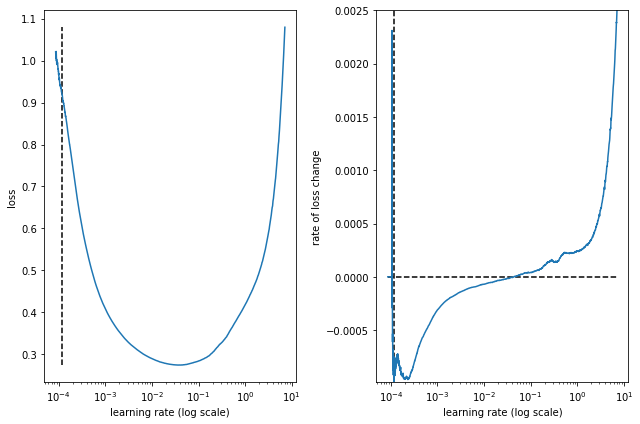

best lr: 0.00011596403 

Model: "conv1d_lstm_84l_48s_32bs_38fm_44f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_24 (Conv1D)          (None, 80, 44)            2244      
                                                                 
 max_pooling1d_24 (MaxPoolin  (None, 40, 44)           0         
 g1D)                                                            
                                                                 
 lstm_24 (LSTM)              (None, 38)                12616     
                                                                 
 dense_48 (Dense)            (None, 38)                1482      
                                                                 
 dense_49 (Dense)            (None, 48)                1872      
                                                                 
 reshape_24 (Reshape)        (None, 48, 1)             0         
    

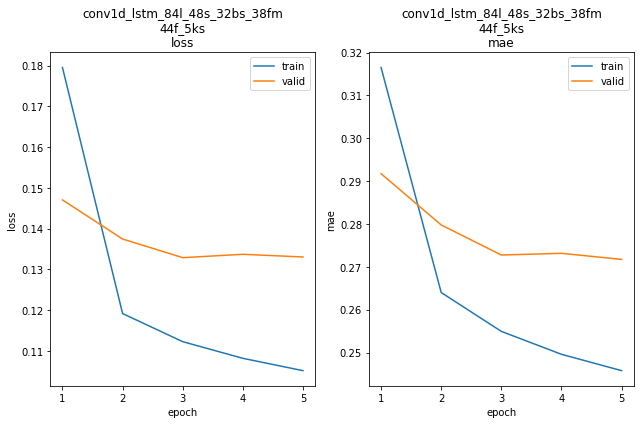

conv1d_lstm_84l_48s_32bs_38fm_44f_5ks train min loss: 0.105202	mae: 0.245778	epoch: 5
conv1d_lstm_84l_48s_32bs_38fm_44f_5ks valid min loss: 0.132898	mae: 0.272754	epoch: 3

conv1d_lstm_84l_48s_32bs_38fm_44f_5ks
Iteration No: 25 ended. Search finished for the next optimal point.
Time taken: 458.5726
Function value obtained: 0.1329
Current minimum: 0.1262
Iteration No: 26 started. Searching for the next optimal point.
lags 26
feat_maps 36
filters 6
kern_size 3
Epoch 1/5
5880/5880 [==============================] - 57s 9ms/step - loss: 1.2757 - mae: 0.5230


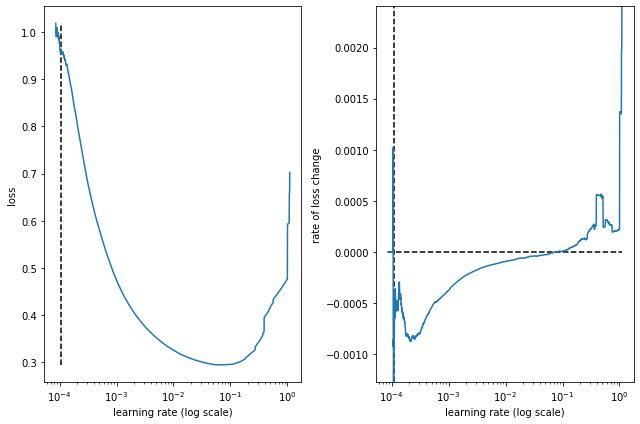

best lr: 0.00010735912 

Model: "conv1d_lstm_26l_48s_32bs_36fm_6f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_25 (Conv1D)          (None, 24, 6)             186       
                                                                 
 max_pooling1d_25 (MaxPoolin  (None, 12, 6)            0         
 g1D)                                                            
                                                                 
 lstm_25 (LSTM)              (None, 36)                6192      
                                                                 
 dense_50 (Dense)            (None, 36)                1332      
                                                                 
 dense_51 (Dense)            (None, 48)                1776      
                                                                 
 reshape_25 (Reshape)        (None, 48, 1)             0         
     

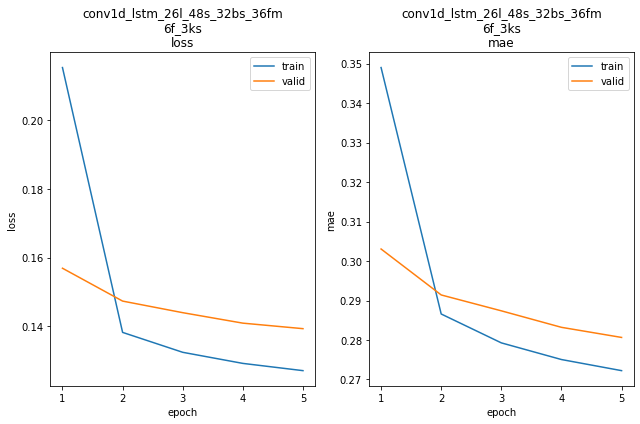

conv1d_lstm_26l_48s_32bs_36fm_6f_3ks train min loss: 0.127121	mae: 0.272239	epoch: 5
conv1d_lstm_26l_48s_32bs_36fm_6f_3ks valid min loss: 0.139329	mae: 0.280651	epoch: 5

conv1d_lstm_26l_48s_32bs_36fm_6f_3ks
Iteration No: 26 ended. Search finished for the next optimal point.
Time taken: 397.2359
Function value obtained: 0.1393
Current minimum: 0.1262
Iteration No: 27 started. Searching for the next optimal point.
lags 94
feat_maps 64
filters 58
kern_size 5
Epoch 1/5
5878/5878 [==============================] - 70s 11ms/step - loss: 0.9564 - mae: 0.6414


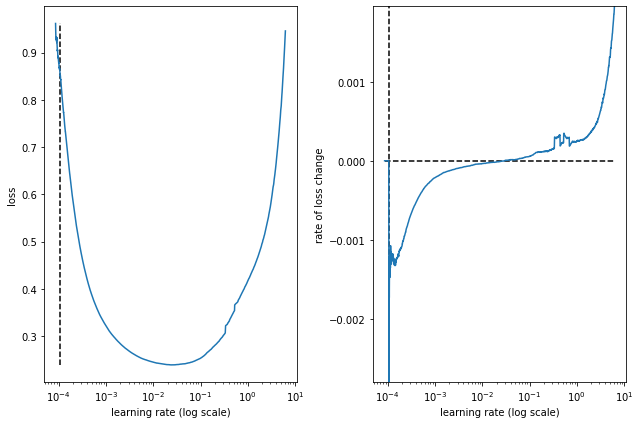

best lr: 0.00010619521 

Model: "conv1d_lstm_94l_48s_32bs_64fm_58f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_26 (Conv1D)          (None, 90, 58)            2958      
                                                                 
 max_pooling1d_26 (MaxPoolin  (None, 45, 58)           0         
 g1D)                                                            
                                                                 
 lstm_26 (LSTM)              (None, 64)                31488     
                                                                 
 dense_52 (Dense)            (None, 64)                4160      
                                                                 
 dense_53 (Dense)            (None, 48)                3120      
                                                                 
 reshape_26 (Reshape)        (None, 48, 1)             0         
    

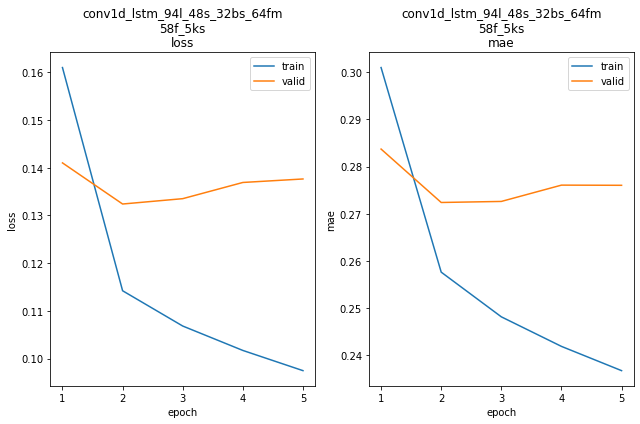

conv1d_lstm_94l_48s_32bs_64fm_58f_5ks train min loss: 0.097462	mae: 0.236744	epoch: 5
conv1d_lstm_94l_48s_32bs_64fm_58f_5ks valid min loss: 0.132407	mae: 0.272384	epoch: 2

conv1d_lstm_94l_48s_32bs_64fm_58f_5ks
Iteration No: 27 ended. Search finished for the next optimal point.
Time taken: 438.7760
Function value obtained: 0.1324
Current minimum: 0.1262
Iteration No: 28 started. Searching for the next optimal point.
lags 135
feat_maps 39
filters 6
kern_size 7
Epoch 1/5
5876/5876 [==============================] - 72s 12ms/step - loss: 1.1616 - mae: 0.7043


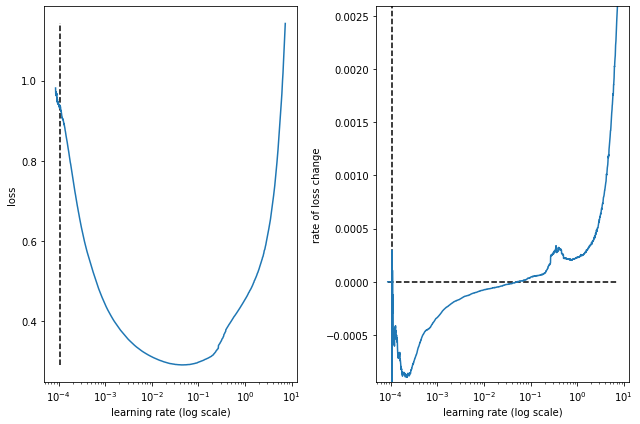

best lr: 0.00010562275 

Model: "conv1d_lstm_135l_48s_32bs_39fm_6f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_27 (Conv1D)          (None, 129, 6)            426       
                                                                 
 max_pooling1d_27 (MaxPoolin  (None, 64, 6)            0         
 g1D)                                                            
                                                                 
 lstm_27 (LSTM)              (None, 39)                7176      
                                                                 
 dense_54 (Dense)            (None, 39)                1560      
                                                                 
 dense_55 (Dense)            (None, 48)                1920      
                                                                 
 reshape_27 (Reshape)        (None, 48, 1)             0         
    

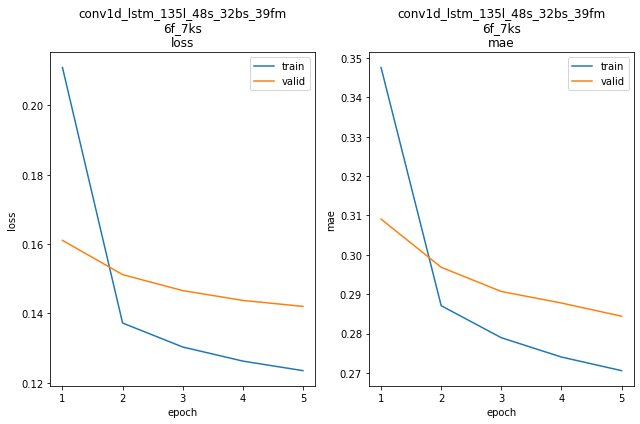

conv1d_lstm_135l_48s_32bs_39fm_6f_7ks train min loss: 0.123486	mae: 0.270592	epoch: 5
conv1d_lstm_135l_48s_32bs_39fm_6f_7ks valid min loss: 0.142020	mae: 0.284420	epoch: 5

conv1d_lstm_135l_48s_32bs_39fm_6f_7ks
Iteration No: 28 ended. Search finished for the next optimal point.
Time taken: 446.8230
Function value obtained: 0.1420
Current minimum: 0.1262
Iteration No: 29 started. Searching for the next optimal point.
lags 38
feat_maps 8
filters 60
kern_size 7
Epoch 1/5
5879/5879 [==============================] - 67s 11ms/step - loss: 1.4918 - mae: 0.7897


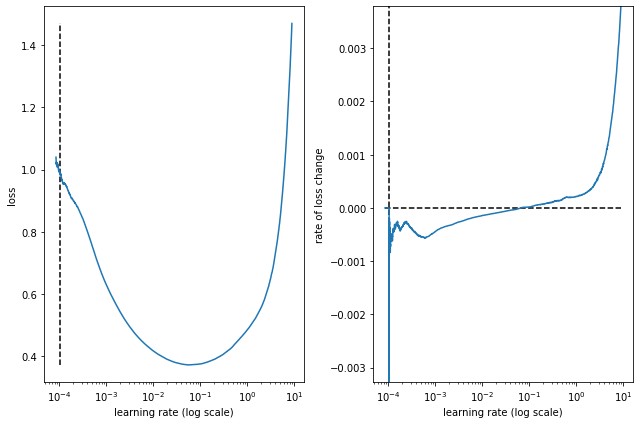

best lr: 0.00010531785 

Model: "conv1d_lstm_38l_48s_32bs_8fm_60f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_28 (Conv1D)          (None, 32, 60)            4260      
                                                                 
 max_pooling1d_28 (MaxPoolin  (None, 16, 60)           0         
 g1D)                                                            
                                                                 
 lstm_28 (LSTM)              (None, 8)                 2208      
                                                                 
 dense_56 (Dense)            (None, 8)                 72        
                                                                 
 dense_57 (Dense)            (None, 48)                432       
                                                                 
 reshape_28 (Reshape)        (None, 48, 1)             0         
     

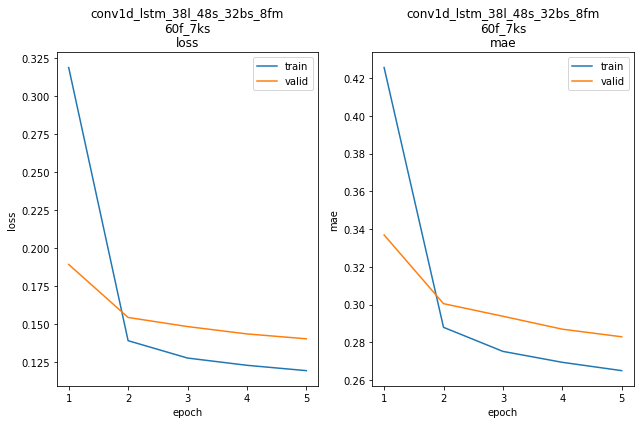

conv1d_lstm_38l_48s_32bs_8fm_60f_7ks train min loss: 0.119609	mae: 0.265066	epoch: 5
conv1d_lstm_38l_48s_32bs_8fm_60f_7ks valid min loss: 0.140508	mae: 0.282993	epoch: 5

conv1d_lstm_38l_48s_32bs_8fm_60f_7ks
Iteration No: 29 ended. Search finished for the next optimal point.
Time taken: 363.5814
Function value obtained: 0.1405
Current minimum: 0.1262
Iteration No: 30 started. Searching for the next optimal point.
lags 142
feat_maps 26
filters 63
kern_size 7
Epoch 1/5
5876/5876 [==============================] - 75s 12ms/step - loss: 1.2018 - mae: 0.7128


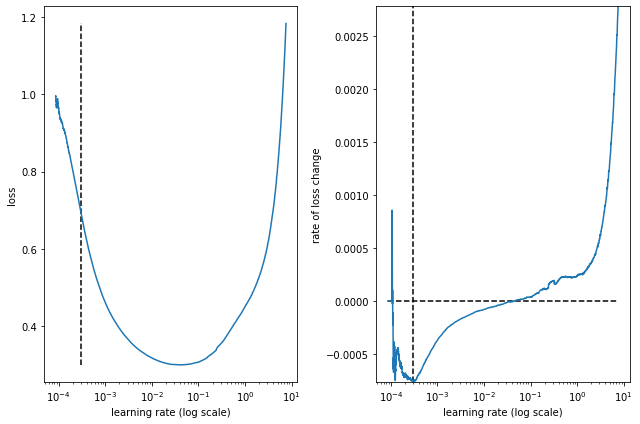

best lr: 0.00030459862 

Model: "conv1d_lstm_142l_48s_32bs_26fm_63f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_29 (Conv1D)          (None, 136, 63)           4473      
                                                                 
 max_pooling1d_29 (MaxPoolin  (None, 68, 63)           0         
 g1D)                                                            
                                                                 
 lstm_29 (LSTM)              (None, 26)                9360      
                                                                 
 dense_58 (Dense)            (None, 26)                702       
                                                                 
 dense_59 (Dense)            (None, 48)                1296      
                                                                 
 reshape_29 (Reshape)        (None, 48, 1)             0         
   

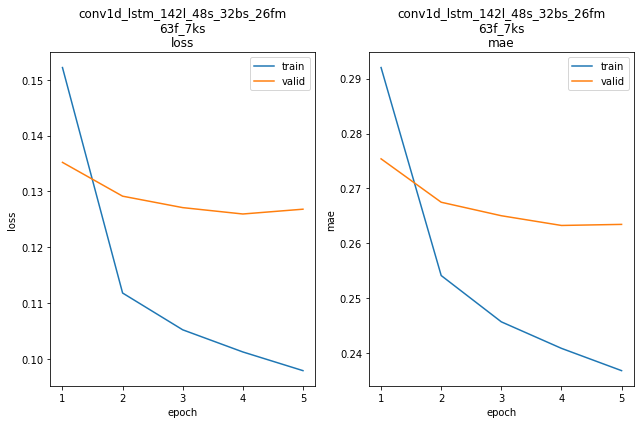

conv1d_lstm_142l_48s_32bs_26fm_63f_7ks train min loss: 0.097891	mae: 0.236737	epoch: 5
conv1d_lstm_142l_48s_32bs_26fm_63f_7ks valid min loss: 0.125957	mae: 0.263225	epoch: 4

conv1d_lstm_142l_48s_32bs_26fm_63f_7ks
Iteration No: 30 ended. Search finished for the next optimal point.
Time taken: 392.3980
Function value obtained: 0.1260
Current minimum: 0.1260
Iteration No: 31 started. Searching for the next optimal point.
lags 28
feat_maps 27
filters 60
kern_size 3
Epoch 1/5
5880/5880 [==============================] - 69s 11ms/step - loss: 1.1890 - mae: 0.6993


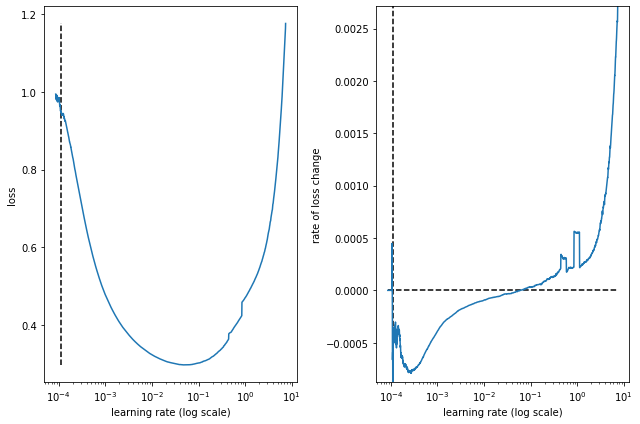

best lr: 0.000109445115 

Model: "conv1d_lstm_28l_48s_32bs_27fm_60f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_30 (Conv1D)          (None, 26, 60)            1860      
                                                                 
 max_pooling1d_30 (MaxPoolin  (None, 13, 60)           0         
 g1D)                                                            
                                                                 
 lstm_30 (LSTM)              (None, 27)                9504      
                                                                 
 dense_60 (Dense)            (None, 27)                756       
                                                                 
 dense_61 (Dense)            (None, 48)                1344      
                                                                 
 reshape_30 (Reshape)        (None, 48, 1)             0         
   

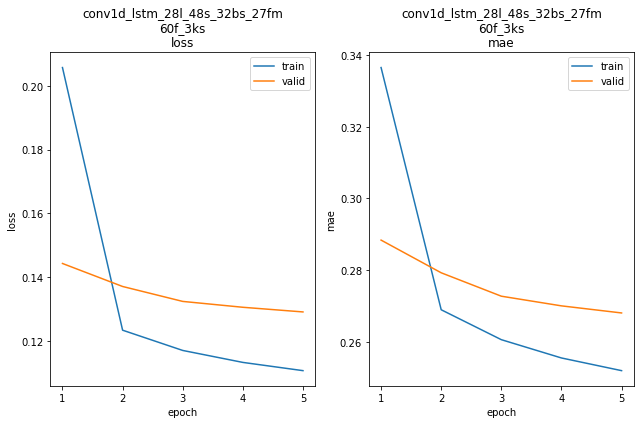

conv1d_lstm_28l_48s_32bs_27fm_60f_3ks train min loss: 0.110631	mae: 0.252009	epoch: 5
conv1d_lstm_28l_48s_32bs_27fm_60f_3ks valid min loss: 0.129058	mae: 0.268090	epoch: 5

conv1d_lstm_28l_48s_32bs_27fm_60f_3ks
Iteration No: 31 ended. Search finished for the next optimal point.
Time taken: 415.4003
Function value obtained: 0.1291
Current minimum: 0.1260
Iteration No: 32 started. Searching for the next optimal point.
lags 142
feat_maps 27
filters 9
kern_size 6
Epoch 1/5
5876/5876 [==============================] - 78s 13ms/step - loss: 1.2637 - mae: 0.7276


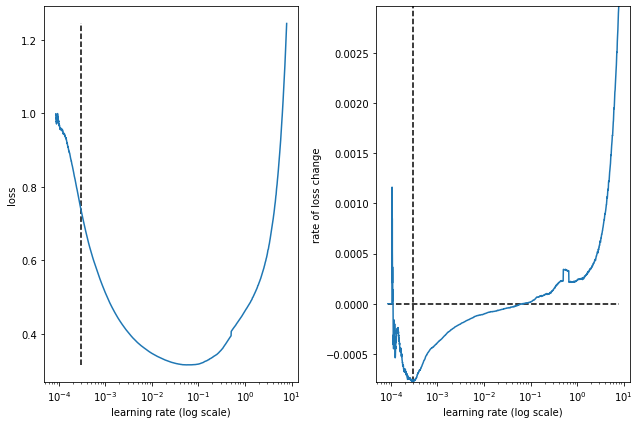

best lr: 0.00029470748 

Model: "conv1d_lstm_142l_48s_32bs_27fm_9f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_31 (Conv1D)          (None, 137, 9)            549       
                                                                 
 max_pooling1d_31 (MaxPoolin  (None, 68, 9)            0         
 g1D)                                                            
                                                                 
 lstm_31 (LSTM)              (None, 27)                3996      
                                                                 
 dense_62 (Dense)            (None, 27)                756       
                                                                 
 dense_63 (Dense)            (None, 48)                1344      
                                                                 
 reshape_31 (Reshape)        (None, 48, 1)             0         
    

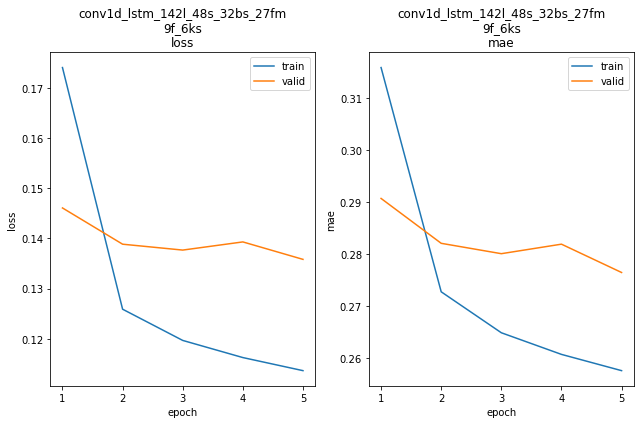

conv1d_lstm_142l_48s_32bs_27fm_9f_6ks train min loss: 0.113667	mae: 0.257544	epoch: 5
conv1d_lstm_142l_48s_32bs_27fm_9f_6ks valid min loss: 0.135830	mae: 0.276432	epoch: 5

conv1d_lstm_142l_48s_32bs_27fm_9f_6ks
Iteration No: 32 ended. Search finished for the next optimal point.
Time taken: 438.5744
Function value obtained: 0.1358
Current minimum: 0.1260
Iteration No: 33 started. Searching for the next optimal point.
lags 42
feat_maps 59
filters 63
kern_size 7
Epoch 1/5
5879/5879 [==============================] - 67s 11ms/step - loss: 676.2779 - mae: 1.0226


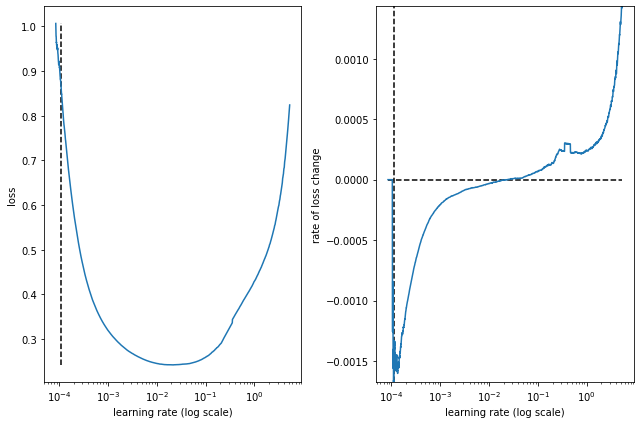

best lr: 0.00011188519 

Model: "conv1d_lstm_42l_48s_32bs_59fm_63f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_32 (Conv1D)          (None, 36, 63)            4473      
                                                                 
 max_pooling1d_32 (MaxPoolin  (None, 18, 63)           0         
 g1D)                                                            
                                                                 
 lstm_32 (LSTM)              (None, 59)                29028     
                                                                 
 dense_64 (Dense)            (None, 59)                3540      
                                                                 
 dense_65 (Dense)            (None, 48)                2880      
                                                                 
 reshape_32 (Reshape)        (None, 48, 1)             0         
    

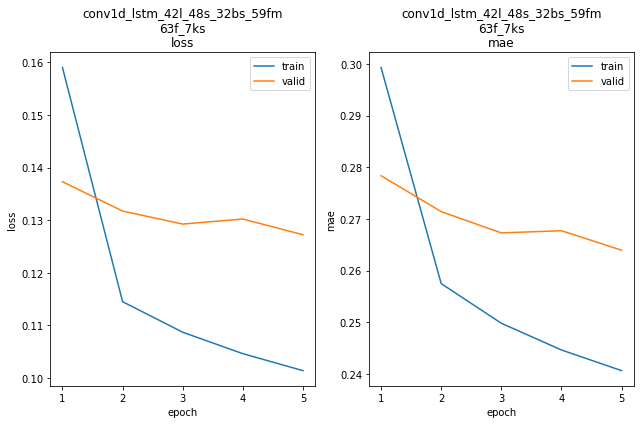

conv1d_lstm_42l_48s_32bs_59fm_63f_7ks train min loss: 0.101386	mae: 0.240647	epoch: 5
conv1d_lstm_42l_48s_32bs_59fm_63f_7ks valid min loss: 0.127234	mae: 0.263964	epoch: 5

conv1d_lstm_42l_48s_32bs_59fm_63f_7ks
Iteration No: 33 ended. Search finished for the next optimal point.
Time taken: 431.9180
Function value obtained: 0.1272
Current minimum: 0.1260
Iteration No: 34 started. Searching for the next optimal point.
lags 32
feat_maps 56
filters 5
kern_size 7
Epoch 1/5
5880/5880 [==============================] - 60s 10ms/step - loss: 3.6351 - mae: 0.5435


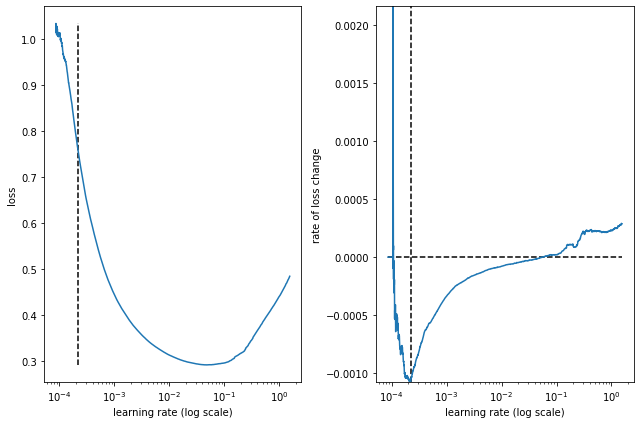

best lr: 0.00022062 

Model: "conv1d_lstm_32l_48s_32bs_56fm_5f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_33 (Conv1D)          (None, 26, 5)             355       
                                                                 
 max_pooling1d_33 (MaxPoolin  (None, 13, 5)            0         
 g1D)                                                            
                                                                 
 lstm_33 (LSTM)              (None, 56)                13888     
                                                                 
 dense_66 (Dense)            (None, 56)                3192      
                                                                 
 dense_67 (Dense)            (None, 48)                2736      
                                                                 
 reshape_33 (Reshape)        (None, 48, 1)             0         
        

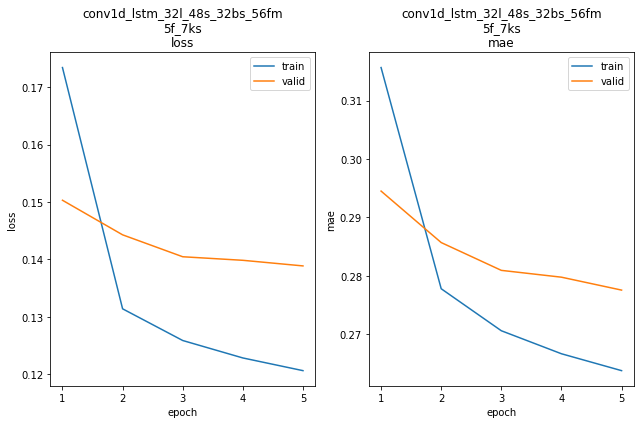

conv1d_lstm_32l_48s_32bs_56fm_5f_7ks train min loss: 0.120634	mae: 0.263761	epoch: 5
conv1d_lstm_32l_48s_32bs_56fm_5f_7ks valid min loss: 0.138878	mae: 0.277555	epoch: 5

conv1d_lstm_32l_48s_32bs_56fm_5f_7ks
Iteration No: 34 ended. Search finished for the next optimal point.
Time taken: 396.8589
Function value obtained: 0.1389
Current minimum: 0.1260
Iteration No: 35 started. Searching for the next optimal point.
lags 142
feat_maps 42
filters 56
kern_size 3
Epoch 1/5
5876/5876 [==============================] - 77s 13ms/step - loss: 1.0374 - mae: 0.6596


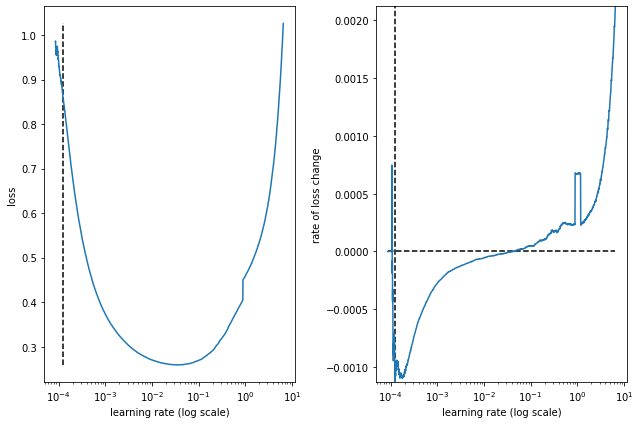

best lr: 0.0001238944 

Model: "conv1d_lstm_142l_48s_32bs_42fm_56f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_34 (Conv1D)          (None, 140, 56)           1736      
                                                                 
 max_pooling1d_34 (MaxPoolin  (None, 70, 56)           0         
 g1D)                                                            
                                                                 
 lstm_34 (LSTM)              (None, 42)                16632     
                                                                 
 dense_68 (Dense)            (None, 42)                1806      
                                                                 
 dense_69 (Dense)            (None, 48)                2064      
                                                                 
 reshape_34 (Reshape)        (None, 48, 1)             0         
    

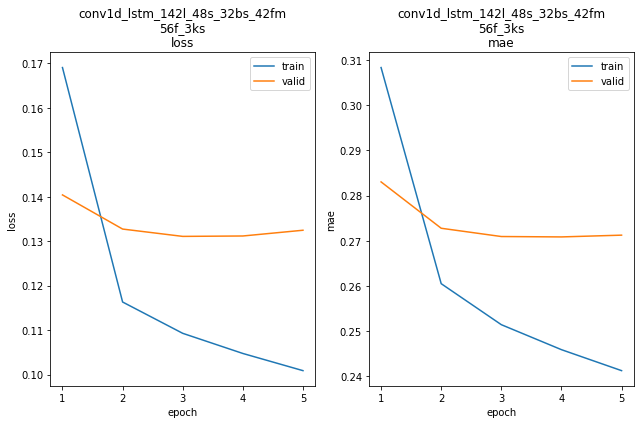

conv1d_lstm_142l_48s_32bs_42fm_56f_3ks train min loss: 0.100886	mae: 0.241217	epoch: 5
conv1d_lstm_142l_48s_32bs_42fm_56f_3ks valid min loss: 0.131079	mae: 0.270930	epoch: 3

conv1d_lstm_142l_48s_32bs_42fm_56f_3ks
Iteration No: 35 ended. Search finished for the next optimal point.
Time taken: 466.8107
Function value obtained: 0.1311
Current minimum: 0.1260
Iteration No: 36 started. Searching for the next optimal point.
lags 143
feat_maps 24
filters 62
kern_size 3
Epoch 1/5
5876/5876 [==============================] - 69s 11ms/step - loss: 1.2085 - mae: 0.7138


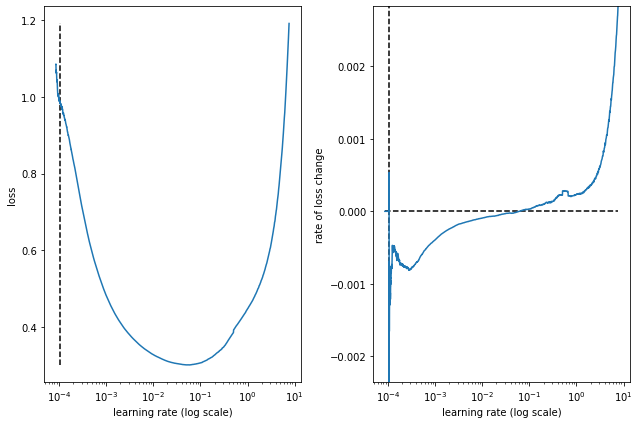

best lr: 0.000105913714 

Model: "conv1d_lstm_143l_48s_32bs_24fm_62f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_35 (Conv1D)          (None, 141, 62)           1922      
                                                                 
 max_pooling1d_35 (MaxPoolin  (None, 70, 62)           0         
 g1D)                                                            
                                                                 
 lstm_35 (LSTM)              (None, 24)                8352      
                                                                 
 dense_70 (Dense)            (None, 24)                600       
                                                                 
 dense_71 (Dense)            (None, 48)                1200      
                                                                 
 reshape_35 (Reshape)        (None, 48, 1)             0         
  

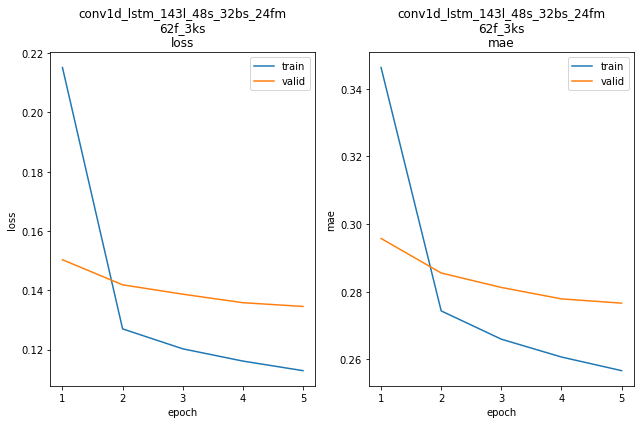

conv1d_lstm_143l_48s_32bs_24fm_62f_3ks train min loss: 0.112900	mae: 0.256655	epoch: 5
conv1d_lstm_143l_48s_32bs_24fm_62f_3ks valid min loss: 0.134563	mae: 0.276624	epoch: 5

conv1d_lstm_143l_48s_32bs_24fm_62f_3ks
Iteration No: 36 ended. Search finished for the next optimal point.
Time taken: 424.9371
Function value obtained: 0.1346
Current minimum: 0.1260
Iteration No: 37 started. Searching for the next optimal point.
lags 140
feat_maps 29
filters 63
kern_size 7
Epoch 1/5
5876/5876 [==============================] - 58s 9ms/step - loss: 1.3840 - mae: 0.5079


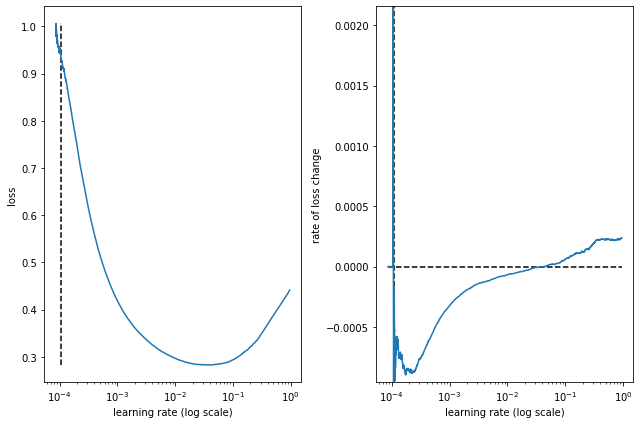

best lr: 0.0001073806 

Model: "conv1d_lstm_140l_48s_32bs_29fm_63f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_36 (Conv1D)          (None, 134, 63)           4473      
                                                                 
 max_pooling1d_36 (MaxPoolin  (None, 67, 63)           0         
 g1D)                                                            
                                                                 
 lstm_36 (LSTM)              (None, 29)                10788     
                                                                 
 dense_72 (Dense)            (None, 29)                870       
                                                                 
 dense_73 (Dense)            (None, 48)                1440      
                                                                 
 reshape_36 (Reshape)        (None, 48, 1)             0         
    

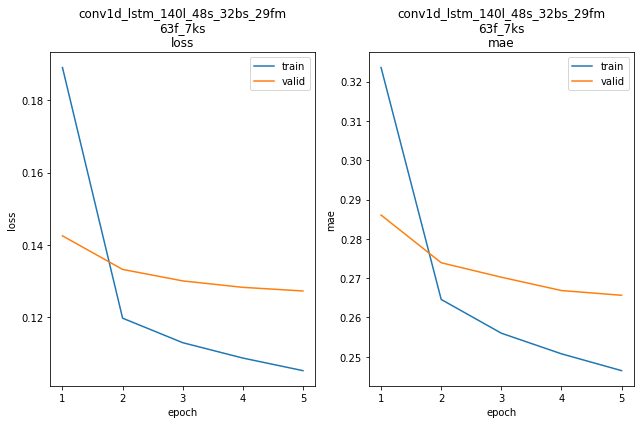

conv1d_lstm_140l_48s_32bs_29fm_63f_7ks train min loss: 0.105231	mae: 0.246454	epoch: 5
conv1d_lstm_140l_48s_32bs_29fm_63f_7ks valid min loss: 0.127272	mae: 0.265632	epoch: 5

conv1d_lstm_140l_48s_32bs_29fm_63f_7ks
Iteration No: 37 ended. Search finished for the next optimal point.
Time taken: 410.6449
Function value obtained: 0.1273
Current minimum: 0.1260
Iteration No: 38 started. Searching for the next optimal point.
lags 141
feat_maps 47
filters 12
kern_size 7
Epoch 1/5
5876/5876 [==============================] - 78s 13ms/step - loss: 1.1225 - mae: 0.6897


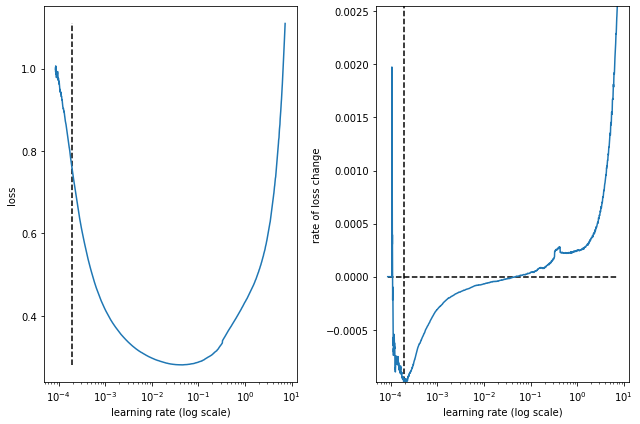

best lr: 0.00019029577 

Model: "conv1d_lstm_141l_48s_32bs_47fm_12f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_37 (Conv1D)          (None, 135, 12)           852       
                                                                 
 max_pooling1d_37 (MaxPoolin  (None, 67, 12)           0         
 g1D)                                                            
                                                                 
 lstm_37 (LSTM)              (None, 47)                11280     
                                                                 
 dense_74 (Dense)            (None, 47)                2256      
                                                                 
 dense_75 (Dense)            (None, 48)                2304      
                                                                 
 reshape_37 (Reshape)        (None, 48, 1)             0         
   

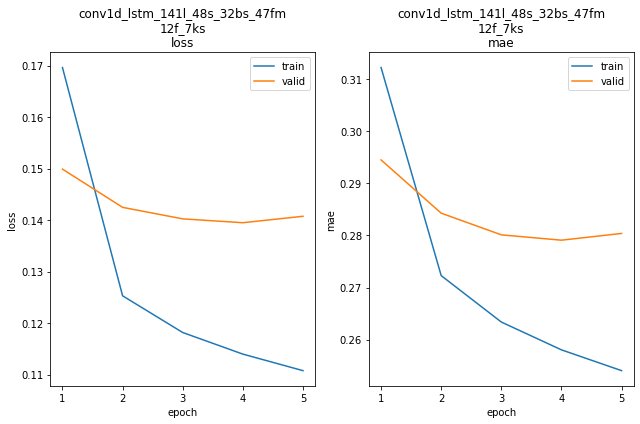

conv1d_lstm_141l_48s_32bs_47fm_12f_7ks train min loss: 0.110772	mae: 0.254020	epoch: 5
conv1d_lstm_141l_48s_32bs_47fm_12f_7ks valid min loss: 0.139501	mae: 0.279095	epoch: 4

conv1d_lstm_141l_48s_32bs_47fm_12f_7ks
Iteration No: 38 ended. Search finished for the next optimal point.
Time taken: 388.5314
Function value obtained: 0.1395
Current minimum: 0.1260
Iteration No: 39 started. Searching for the next optimal point.
lags 28
feat_maps 51
filters 64
kern_size 3
Epoch 1/5
5880/5880 [==============================] - 61s 10ms/step - loss: 0.9726 - mae: 0.6462


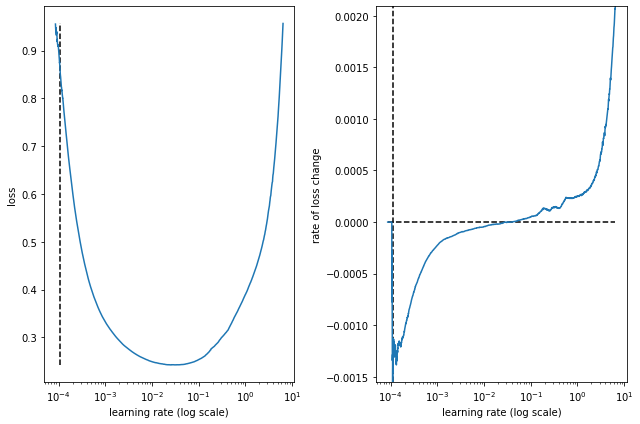

best lr: 0.000109445115 

Model: "conv1d_lstm_28l_48s_32bs_51fm_64f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_38 (Conv1D)          (None, 26, 64)            1984      
                                                                 
 max_pooling1d_38 (MaxPoolin  (None, 13, 64)           0         
 g1D)                                                            
                                                                 
 lstm_38 (LSTM)              (None, 51)                23664     
                                                                 
 dense_76 (Dense)            (None, 51)                2652      
                                                                 
 dense_77 (Dense)            (None, 48)                2496      
                                                                 
 reshape_38 (Reshape)        (None, 48, 1)             0         
   

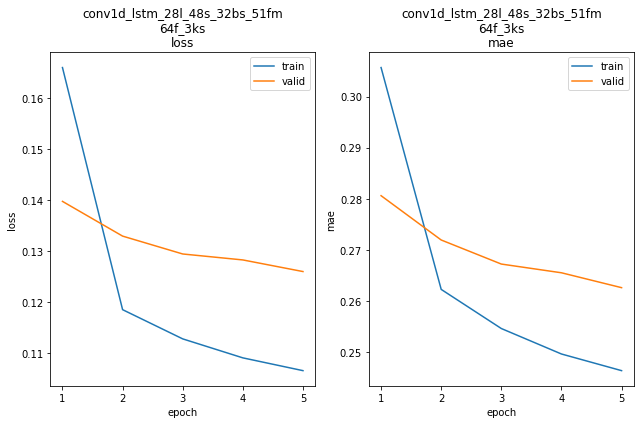

conv1d_lstm_28l_48s_32bs_51fm_64f_3ks train min loss: 0.106517	mae: 0.246380	epoch: 5
conv1d_lstm_28l_48s_32bs_51fm_64f_3ks valid min loss: 0.125937	mae: 0.262610	epoch: 5

conv1d_lstm_28l_48s_32bs_51fm_64f_3ks
Iteration No: 39 ended. Search finished for the next optimal point.
Time taken: 317.0910
Function value obtained: 0.1259
Current minimum: 0.1259
Iteration No: 40 started. Searching for the next optimal point.
lags 26
feat_maps 22
filters 64
kern_size 7
Epoch 1/5
5880/5880 [==============================] - 63s 10ms/step - loss: 1.2350 - mae: 0.7233


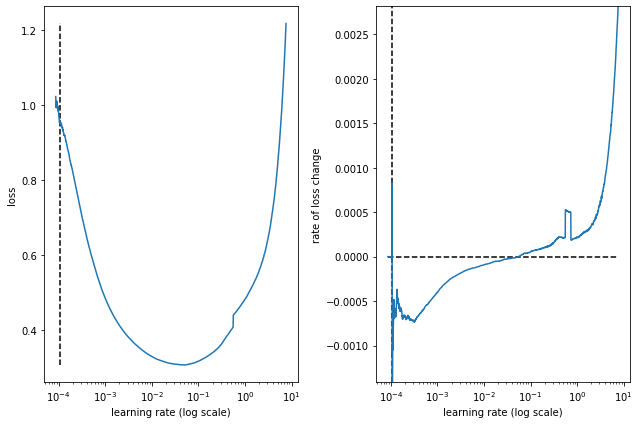

best lr: 0.00010735912 

Model: "conv1d_lstm_26l_48s_32bs_22fm_64f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_39 (Conv1D)          (None, 20, 64)            4544      
                                                                 
 max_pooling1d_39 (MaxPoolin  (None, 10, 64)           0         
 g1D)                                                            
                                                                 
 lstm_39 (LSTM)              (None, 22)                7656      
                                                                 
 dense_78 (Dense)            (None, 22)                506       
                                                                 
 dense_79 (Dense)            (None, 48)                1104      
                                                                 
 reshape_39 (Reshape)        (None, 48, 1)             0         
    

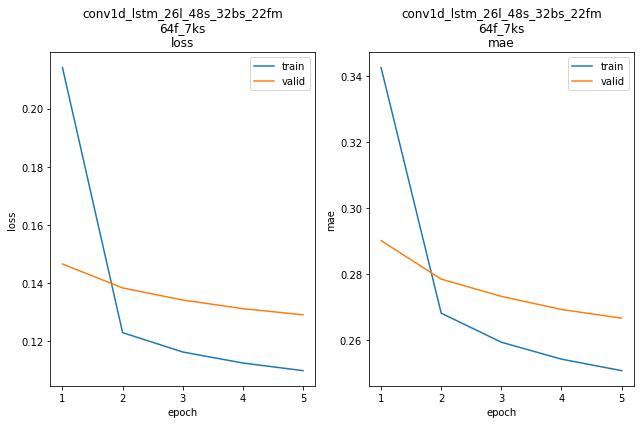

conv1d_lstm_26l_48s_32bs_22fm_64f_7ks train min loss: 0.109950	mae: 0.250817	epoch: 5
conv1d_lstm_26l_48s_32bs_22fm_64f_7ks valid min loss: 0.129141	mae: 0.266724	epoch: 5

conv1d_lstm_26l_48s_32bs_22fm_64f_7ks
Iteration No: 40 ended. Search finished for the next optimal point.
Time taken: 461.9699
Function value obtained: 0.1291
Current minimum: 0.1259
Iteration No: 41 started. Searching for the next optimal point.
lags 35
feat_maps 56
filters 62
kern_size 3
Epoch 1/5
5879/5879 [==============================] - 62s 10ms/step - loss: 1.0077 - mae: 0.6590


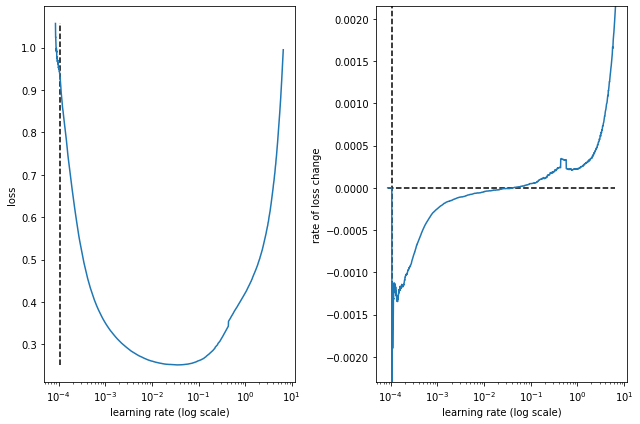

best lr: 0.0001058986 

Model: "conv1d_lstm_35l_48s_32bs_56fm_62f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_40 (Conv1D)          (None, 33, 62)            1922      
                                                                 
 max_pooling1d_40 (MaxPoolin  (None, 16, 62)           0         
 g1D)                                                            
                                                                 
 lstm_40 (LSTM)              (None, 56)                26656     
                                                                 
 dense_80 (Dense)            (None, 56)                3192      
                                                                 
 dense_81 (Dense)            (None, 48)                2736      
                                                                 
 reshape_40 (Reshape)        (None, 48, 1)             0         
     

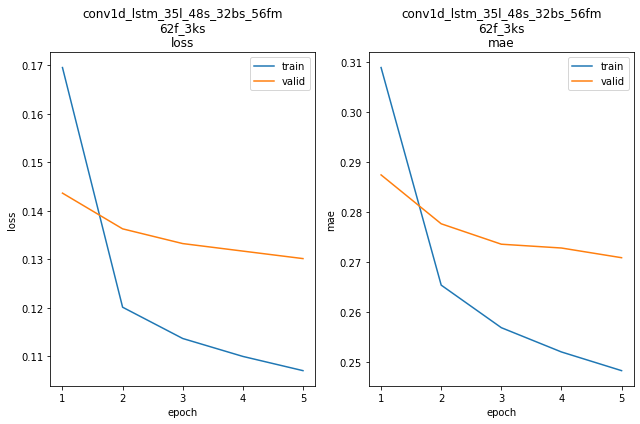

conv1d_lstm_35l_48s_32bs_56fm_62f_3ks train min loss: 0.107014	mae: 0.248334	epoch: 5
conv1d_lstm_35l_48s_32bs_56fm_62f_3ks valid min loss: 0.130140	mae: 0.270891	epoch: 5

conv1d_lstm_35l_48s_32bs_56fm_62f_3ks
Iteration No: 41 ended. Search finished for the next optimal point.
Time taken: 443.1427
Function value obtained: 0.1301
Current minimum: 0.1259
Iteration No: 42 started. Searching for the next optimal point.
lags 25
feat_maps 50
filters 46
kern_size 7
Epoch 1/5
5880/5880 [==============================] - 59s 10ms/step - loss: 28.2469 - mae: 0.6371


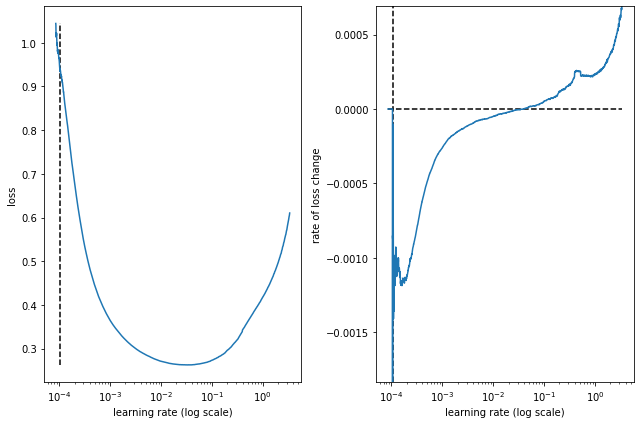

best lr: 0.000105312894 

Model: "conv1d_lstm_25l_48s_32bs_50fm_46f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_41 (Conv1D)          (None, 19, 46)            3266      
                                                                 
 max_pooling1d_41 (MaxPoolin  (None, 9, 46)            0         
 g1D)                                                            
                                                                 
 lstm_41 (LSTM)              (None, 50)                19400     
                                                                 
 dense_82 (Dense)            (None, 50)                2550      
                                                                 
 dense_83 (Dense)            (None, 48)                2448      
                                                                 
 reshape_41 (Reshape)        (None, 48, 1)             0         
   

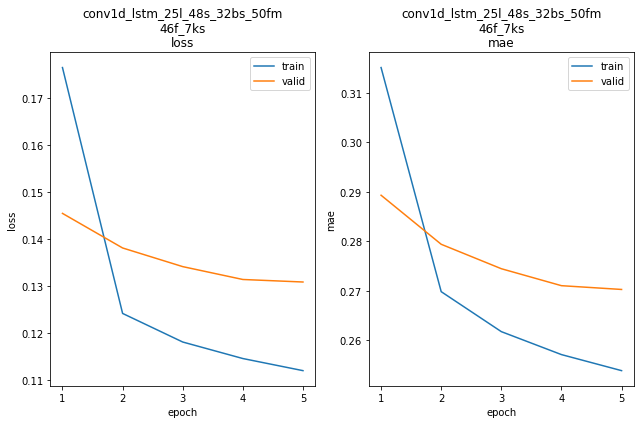

conv1d_lstm_25l_48s_32bs_50fm_46f_7ks train min loss: 0.112054	mae: 0.253864	epoch: 5
conv1d_lstm_25l_48s_32bs_50fm_46f_7ks valid min loss: 0.130874	mae: 0.270276	epoch: 5

conv1d_lstm_25l_48s_32bs_50fm_46f_7ks
Iteration No: 42 ended. Search finished for the next optimal point.
Time taken: 429.0759
Function value obtained: 0.1309
Current minimum: 0.1259
Iteration No: 43 started. Searching for the next optimal point.
lags 33
feat_maps 46
filters 18
kern_size 3
Epoch 1/5
5880/5880 [==============================] - 65s 11ms/step - loss: 1.0899 - mae: 0.6820


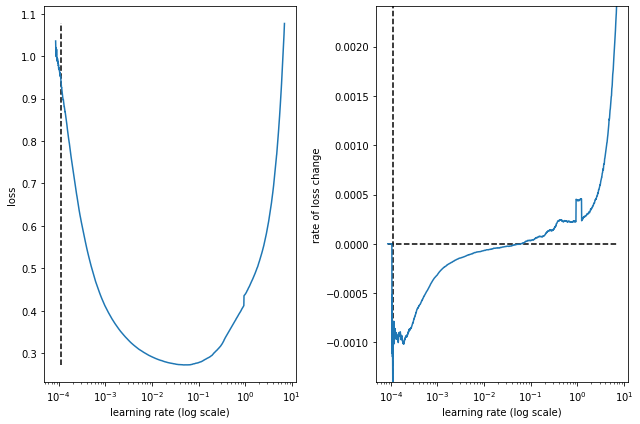

best lr: 0.000109746405 

Model: "conv1d_lstm_33l_48s_32bs_46fm_18f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_42 (Conv1D)          (None, 31, 18)            558       
                                                                 
 max_pooling1d_42 (MaxPoolin  (None, 15, 18)           0         
 g1D)                                                            
                                                                 
 lstm_42 (LSTM)              (None, 46)                11960     
                                                                 
 dense_84 (Dense)            (None, 46)                2162      
                                                                 
 dense_85 (Dense)            (None, 48)                2256      
                                                                 
 reshape_42 (Reshape)        (None, 48, 1)             0         
   

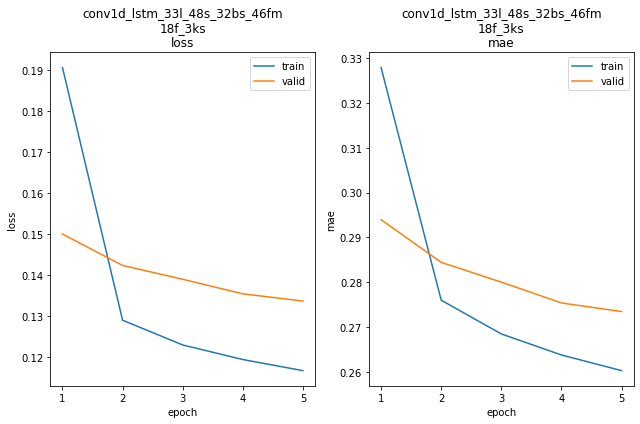

conv1d_lstm_33l_48s_32bs_46fm_18f_3ks train min loss: 0.116601	mae: 0.260248	epoch: 5
conv1d_lstm_33l_48s_32bs_46fm_18f_3ks valid min loss: 0.133581	mae: 0.273440	epoch: 5

conv1d_lstm_33l_48s_32bs_46fm_18f_3ks
Iteration No: 43 ended. Search finished for the next optimal point.
Time taken: 393.5795
Function value obtained: 0.1336
Current minimum: 0.1259
Iteration No: 44 started. Searching for the next optimal point.
lags 30
feat_maps 27
filters 63
kern_size 7
Epoch 1/5
5880/5880 [==============================] - 67s 11ms/step - loss: 1.1769 - mae: 0.7067


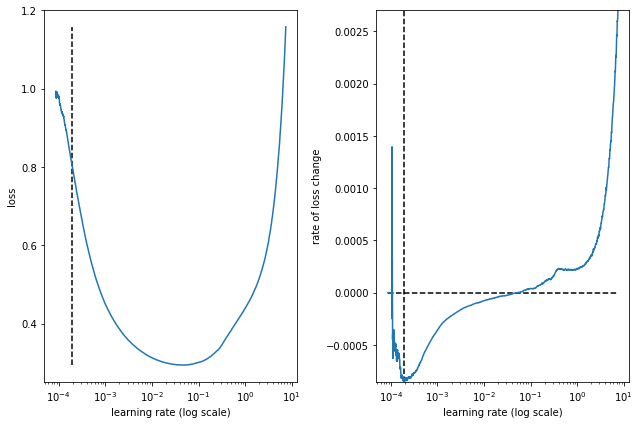

best lr: 0.00018966169 

Model: "conv1d_lstm_30l_48s_32bs_27fm_63f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_43 (Conv1D)          (None, 24, 63)            4473      
                                                                 
 max_pooling1d_43 (MaxPoolin  (None, 12, 63)           0         
 g1D)                                                            
                                                                 
 lstm_43 (LSTM)              (None, 27)                9828      
                                                                 
 dense_86 (Dense)            (None, 27)                756       
                                                                 
 dense_87 (Dense)            (None, 48)                1344      
                                                                 
 reshape_43 (Reshape)        (None, 48, 1)             0         
    

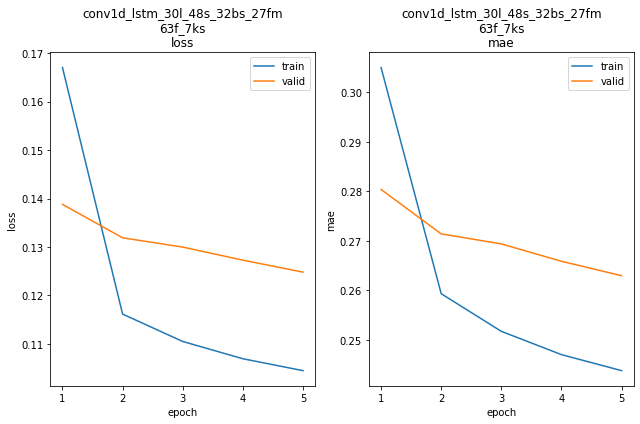

conv1d_lstm_30l_48s_32bs_27fm_63f_7ks train min loss: 0.104483	mae: 0.243755	epoch: 5
conv1d_lstm_30l_48s_32bs_27fm_63f_7ks valid min loss: 0.124815	mae: 0.262950	epoch: 5

conv1d_lstm_30l_48s_32bs_27fm_63f_7ks
Iteration No: 44 ended. Search finished for the next optimal point.
Time taken: 411.9033
Function value obtained: 0.1248
Current minimum: 0.1248
Iteration No: 45 started. Searching for the next optimal point.
lags 27
feat_maps 16
filters 62
kern_size 7
Epoch 1/5
5880/5880 [==============================] - 67s 11ms/step - loss: 1.2849 - mae: 0.7372


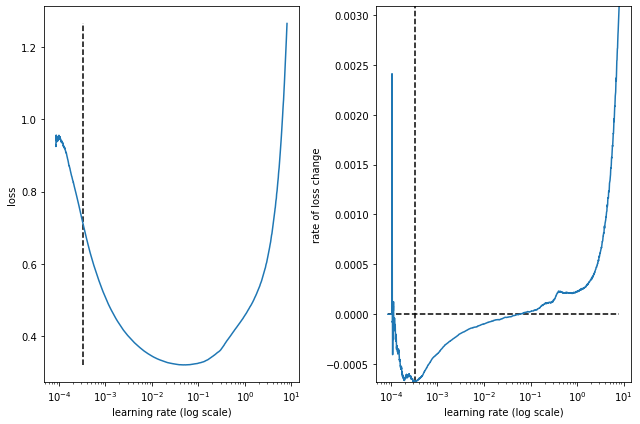

best lr: 0.00033598038 

Model: "conv1d_lstm_27l_48s_32bs_16fm_62f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_44 (Conv1D)          (None, 21, 62)            4402      
                                                                 
 max_pooling1d_44 (MaxPoolin  (None, 10, 62)           0         
 g1D)                                                            
                                                                 
 lstm_44 (LSTM)              (None, 16)                5056      
                                                                 
 dense_88 (Dense)            (None, 16)                272       
                                                                 
 dense_89 (Dense)            (None, 48)                816       
                                                                 
 reshape_44 (Reshape)        (None, 48, 1)             0         
    

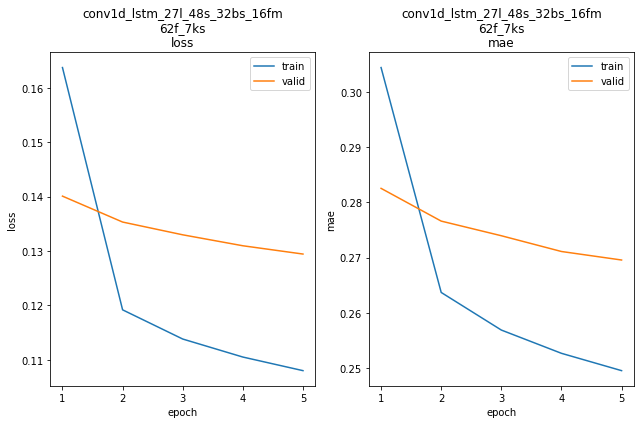

conv1d_lstm_27l_48s_32bs_16fm_62f_7ks train min loss: 0.108012	mae: 0.249510	epoch: 5
conv1d_lstm_27l_48s_32bs_16fm_62f_7ks valid min loss: 0.129439	mae: 0.269551	epoch: 5

conv1d_lstm_27l_48s_32bs_16fm_62f_7ks
Iteration No: 45 ended. Search finished for the next optimal point.
Time taken: 425.3598
Function value obtained: 0.1294
Current minimum: 0.1248
Iteration No: 46 started. Searching for the next optimal point.
lags 28
feat_maps 31
filters 6
kern_size 7
Epoch 1/5
5880/5880 [==============================] - 58s 9ms/step - loss: 1.2550 - mae: 0.5361


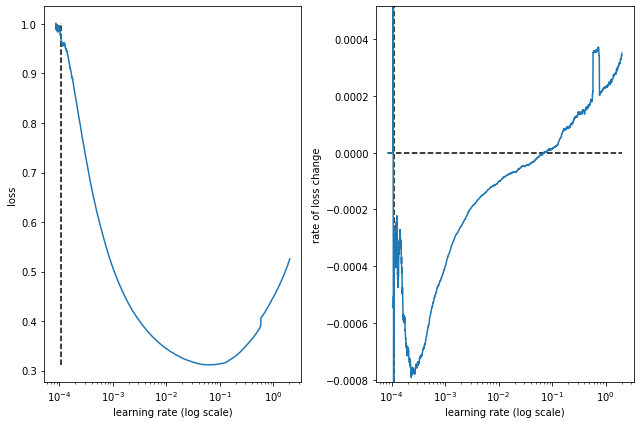

best lr: 0.000109445115 

Model: "conv1d_lstm_28l_48s_32bs_31fm_6f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_45 (Conv1D)          (None, 22, 6)             426       
                                                                 
 max_pooling1d_45 (MaxPoolin  (None, 11, 6)            0         
 g1D)                                                            
                                                                 
 lstm_45 (LSTM)              (None, 31)                4712      
                                                                 
 dense_90 (Dense)            (None, 31)                992       
                                                                 
 dense_91 (Dense)            (None, 48)                1536      
                                                                 
 reshape_45 (Reshape)        (None, 48, 1)             0         
    

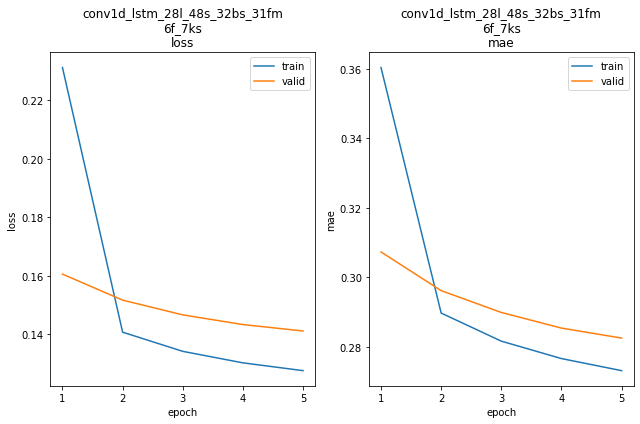

conv1d_lstm_28l_48s_32bs_31fm_6f_7ks train min loss: 0.127545	mae: 0.273114	epoch: 5
conv1d_lstm_28l_48s_32bs_31fm_6f_7ks valid min loss: 0.141112	mae: 0.282492	epoch: 5

conv1d_lstm_28l_48s_32bs_31fm_6f_7ks
Iteration No: 46 ended. Search finished for the next optimal point.
Time taken: 438.1521
Function value obtained: 0.1411
Current minimum: 0.1248
Iteration No: 47 started. Searching for the next optimal point.
lags 126
feat_maps 46
filters 64
kern_size 7
Epoch 1/5
5877/5877 [==============================] - 71s 12ms/step - loss: 1.0294 - mae: 0.6659


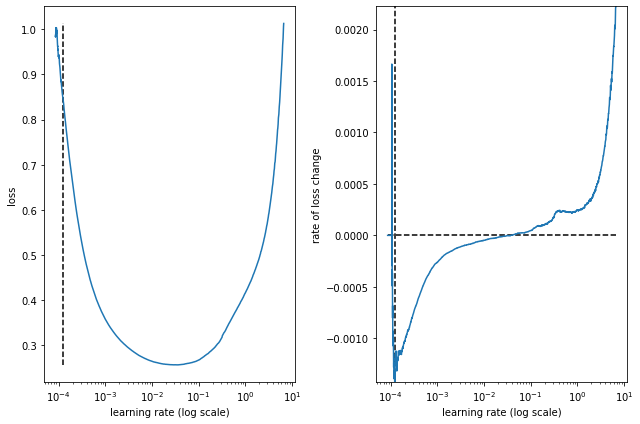

best lr: 0.000121522826 

Model: "conv1d_lstm_126l_48s_32bs_46fm_64f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_46 (Conv1D)          (None, 120, 64)           4544      
                                                                 
 max_pooling1d_46 (MaxPoolin  (None, 60, 64)           0         
 g1D)                                                            
                                                                 
 lstm_46 (LSTM)              (None, 46)                20424     
                                                                 
 dense_92 (Dense)            (None, 46)                2162      
                                                                 
 dense_93 (Dense)            (None, 48)                2256      
                                                                 
 reshape_46 (Reshape)        (None, 48, 1)             0         
  

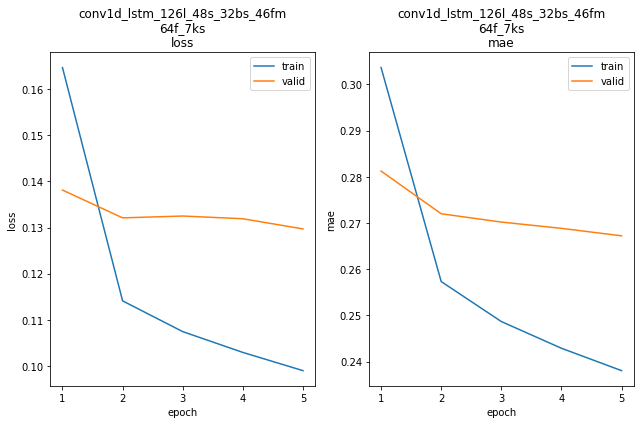

conv1d_lstm_126l_48s_32bs_46fm_64f_7ks train min loss: 0.098986	mae: 0.238038	epoch: 5
conv1d_lstm_126l_48s_32bs_46fm_64f_7ks valid min loss: 0.129693	mae: 0.267221	epoch: 5

conv1d_lstm_126l_48s_32bs_46fm_64f_7ks
Iteration No: 47 ended. Search finished for the next optimal point.
Time taken: 456.9416
Function value obtained: 0.1297
Current minimum: 0.1248
Iteration No: 48 started. Searching for the next optimal point.
lags 139
feat_maps 17
filters 4
kern_size 7
Epoch 1/5
5876/5876 [==============================] - 75s 12ms/step - loss: 1.4408 - mae: 0.7740


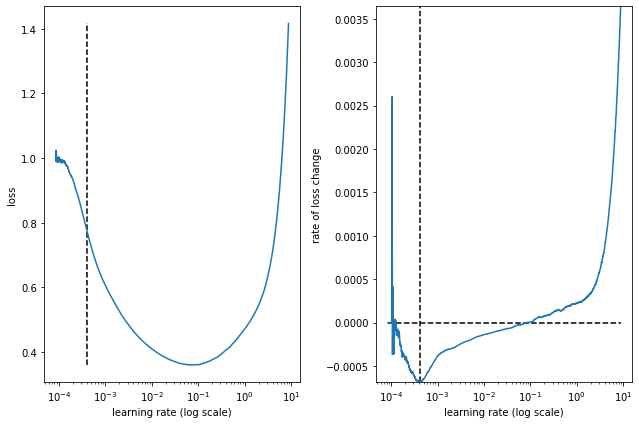

best lr: 0.00040997614 

Model: "conv1d_lstm_139l_48s_32bs_17fm_4f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_47 (Conv1D)          (None, 133, 4)            284       
                                                                 
 max_pooling1d_47 (MaxPoolin  (None, 66, 4)            0         
 g1D)                                                            
                                                                 
 lstm_47 (LSTM)              (None, 17)                1496      
                                                                 
 dense_94 (Dense)            (None, 17)                306       
                                                                 
 dense_95 (Dense)            (None, 48)                864       
                                                                 
 reshape_47 (Reshape)        (None, 48, 1)             0         
    

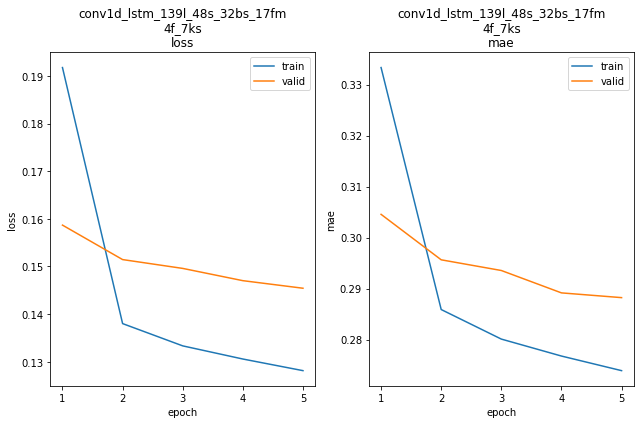

conv1d_lstm_139l_48s_32bs_17fm_4f_7ks train min loss: 0.128130	mae: 0.273895	epoch: 5
conv1d_lstm_139l_48s_32bs_17fm_4f_7ks valid min loss: 0.145432	mae: 0.288217	epoch: 5

conv1d_lstm_139l_48s_32bs_17fm_4f_7ks
Iteration No: 48 ended. Search finished for the next optimal point.
Time taken: 380.1149
Function value obtained: 0.1454
Current minimum: 0.1248
Iteration No: 49 started. Searching for the next optimal point.
lags 134
feat_maps 28
filters 39
kern_size 7
Epoch 1/5
5876/5876 [==============================] - 77s 13ms/step - loss: 1.1774 - mae: 0.7076


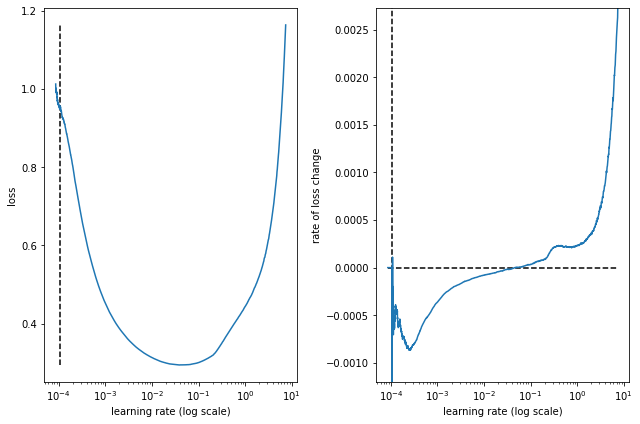

best lr: 0.00010562275 

Model: "conv1d_lstm_134l_48s_32bs_28fm_39f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_48 (Conv1D)          (None, 128, 39)           2769      
                                                                 
 max_pooling1d_48 (MaxPoolin  (None, 64, 39)           0         
 g1D)                                                            
                                                                 
 lstm_48 (LSTM)              (None, 28)                7616      
                                                                 
 dense_96 (Dense)            (None, 28)                812       
                                                                 
 dense_97 (Dense)            (None, 48)                1392      
                                                                 
 reshape_48 (Reshape)        (None, 48, 1)             0         
   

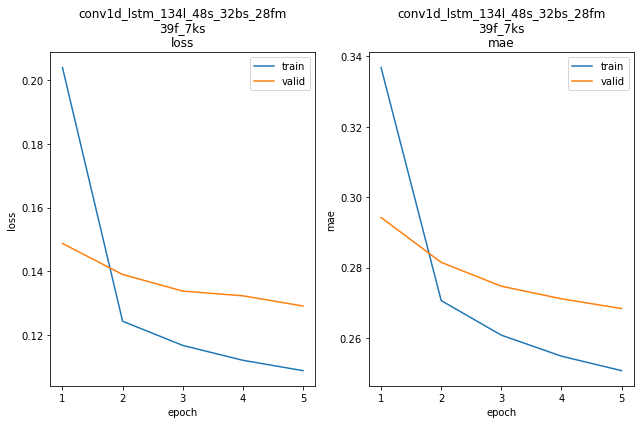

conv1d_lstm_134l_48s_32bs_28fm_39f_7ks train min loss: 0.108931	mae: 0.250675	epoch: 5
conv1d_lstm_134l_48s_32bs_28fm_39f_7ks valid min loss: 0.129180	mae: 0.268323	epoch: 5

conv1d_lstm_134l_48s_32bs_28fm_39f_7ks
Iteration No: 49 ended. Search finished for the next optimal point.
Time taken: 406.6599
Function value obtained: 0.1292
Current minimum: 0.1248
Iteration No: 50 started. Searching for the next optimal point.
lags 143
feat_maps 49
filters 61
kern_size 3
Epoch 1/5
5876/5876 [==============================] - 76s 12ms/step - loss: 1.0344 - mae: 0.6676


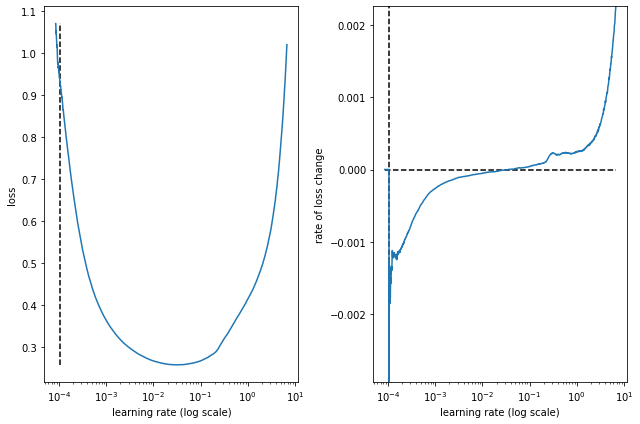

best lr: 0.000105913714 

Model: "conv1d_lstm_143l_48s_32bs_49fm_61f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_49 (Conv1D)          (None, 141, 61)           1891      
                                                                 
 max_pooling1d_49 (MaxPoolin  (None, 70, 61)           0         
 g1D)                                                            
                                                                 
 lstm_49 (LSTM)              (None, 49)                21756     
                                                                 
 dense_98 (Dense)            (None, 49)                2450      
                                                                 
 dense_99 (Dense)            (None, 48)                2400      
                                                                 
 reshape_49 (Reshape)        (None, 48, 1)             0         
  

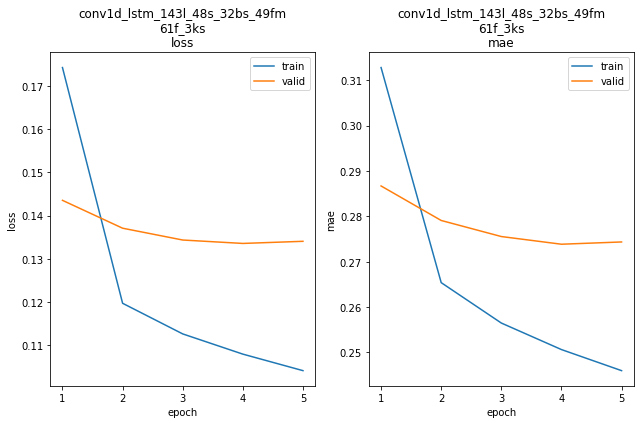

conv1d_lstm_143l_48s_32bs_49fm_61f_3ks train min loss: 0.104139	mae: 0.245999	epoch: 5
conv1d_lstm_143l_48s_32bs_49fm_61f_3ks valid min loss: 0.133574	mae: 0.273860	epoch: 4

conv1d_lstm_143l_48s_32bs_49fm_61f_3ks
Iteration No: 50 ended. Search finished for the next optimal point.
Time taken: 396.3252
Function value obtained: 0.1336
Current minimum: 0.1248
Iteration No: 51 started. Searching for the next optimal point.
lags 133
feat_maps 36
filters 63
kern_size 7
Epoch 1/5
5876/5876 [==============================] - 75s 12ms/step - loss: 1.0984 - mae: 0.6912


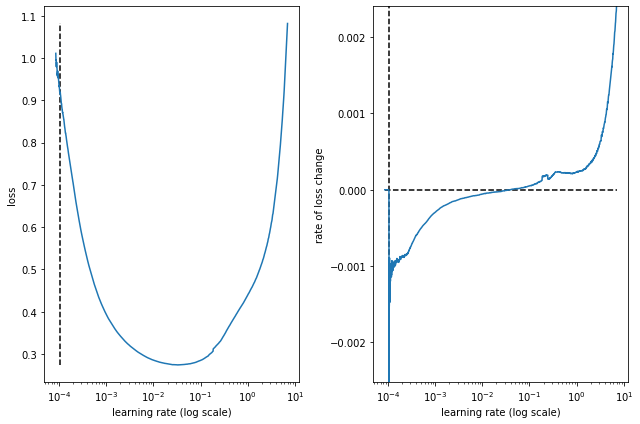

best lr: 0.000105913714 

Model: "conv1d_lstm_133l_48s_32bs_36fm_63f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_50 (Conv1D)          (None, 127, 63)           4473      
                                                                 
 max_pooling1d_50 (MaxPoolin  (None, 63, 63)           0         
 g1D)                                                            
                                                                 
 lstm_50 (LSTM)              (None, 36)                14400     
                                                                 
 dense_100 (Dense)           (None, 36)                1332      
                                                                 
 dense_101 (Dense)           (None, 48)                1776      
                                                                 
 reshape_50 (Reshape)        (None, 48, 1)             0         
  

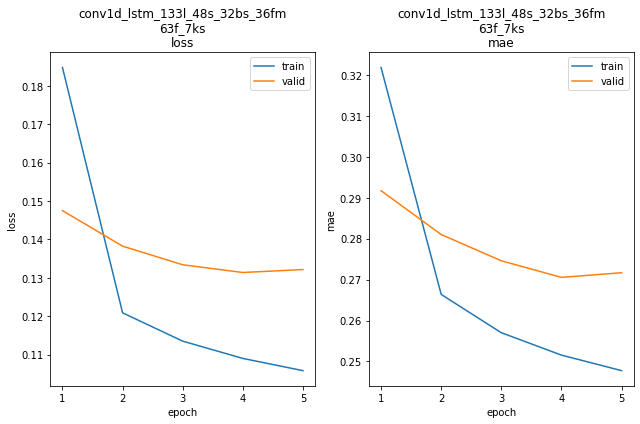

conv1d_lstm_133l_48s_32bs_36fm_63f_7ks train min loss: 0.105838	mae: 0.247760	epoch: 5
conv1d_lstm_133l_48s_32bs_36fm_63f_7ks valid min loss: 0.131383	mae: 0.270541	epoch: 4

conv1d_lstm_133l_48s_32bs_36fm_63f_7ks
Iteration No: 51 ended. Search finished for the next optimal point.
Time taken: 462.7866
Function value obtained: 0.1314
Current minimum: 0.1248
Iteration No: 52 started. Searching for the next optimal point.
lags 131
feat_maps 14
filters 60
kern_size 7
Epoch 1/5
5876/5876 [==============================] - 84s 14ms/step - loss: 1.3099 - mae: 0.7446


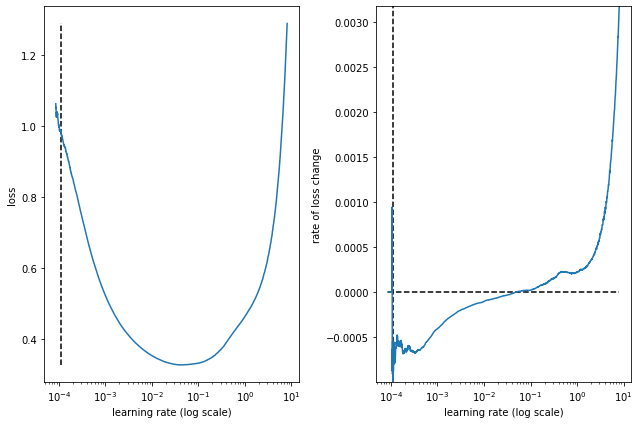

best lr: 0.0001091677 

Model: "conv1d_lstm_131l_48s_32bs_14fm_60f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_51 (Conv1D)          (None, 125, 60)           4260      
                                                                 
 max_pooling1d_51 (MaxPoolin  (None, 62, 60)           0         
 g1D)                                                            
                                                                 
 lstm_51 (LSTM)              (None, 14)                4200      
                                                                 
 dense_102 (Dense)           (None, 14)                210       
                                                                 
 dense_103 (Dense)           (None, 48)                720       
                                                                 
 reshape_51 (Reshape)        (None, 48, 1)             0         
    

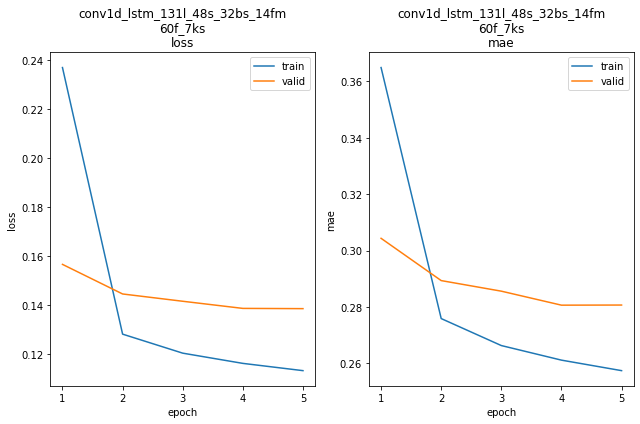

conv1d_lstm_131l_48s_32bs_14fm_60f_7ks train min loss: 0.113226	mae: 0.257448	epoch: 5
conv1d_lstm_131l_48s_32bs_14fm_60f_7ks valid min loss: 0.138528	mae: 0.280707	epoch: 5

conv1d_lstm_131l_48s_32bs_14fm_60f_7ks
Iteration No: 52 ended. Search finished for the next optimal point.
Time taken: 390.8238
Function value obtained: 0.1385
Current minimum: 0.1248
Iteration No: 53 started. Searching for the next optimal point.
lags 27
feat_maps 17
filters 60
kern_size 3
Epoch 1/5
5880/5880 [==============================] - 67s 11ms/step - loss: 1.3026 - mae: 0.7390


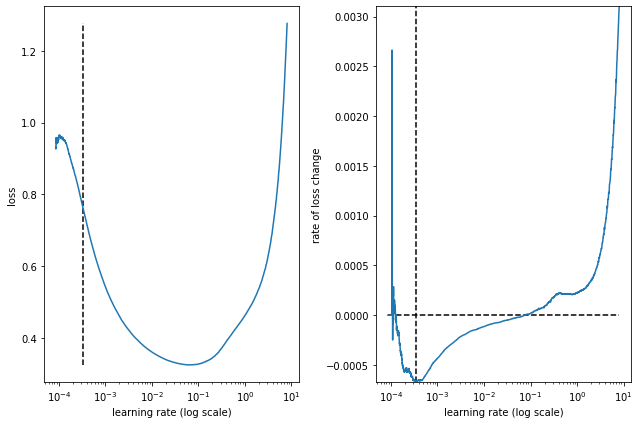

best lr: 0.0003369053 

Model: "conv1d_lstm_27l_48s_32bs_17fm_60f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_52 (Conv1D)          (None, 25, 60)            1860      
                                                                 
 max_pooling1d_52 (MaxPoolin  (None, 12, 60)           0         
 g1D)                                                            
                                                                 
 lstm_52 (LSTM)              (None, 17)                5304      
                                                                 
 dense_104 (Dense)           (None, 17)                306       
                                                                 
 dense_105 (Dense)           (None, 48)                864       
                                                                 
 reshape_52 (Reshape)        (None, 48, 1)             0         
     

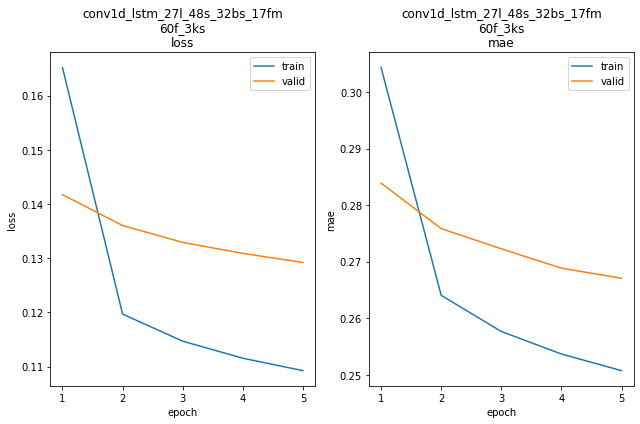

conv1d_lstm_27l_48s_32bs_17fm_60f_3ks train min loss: 0.109241	mae: 0.250731	epoch: 5
conv1d_lstm_27l_48s_32bs_17fm_60f_3ks valid min loss: 0.129199	mae: 0.267080	epoch: 5

conv1d_lstm_27l_48s_32bs_17fm_60f_3ks
Iteration No: 53 ended. Search finished for the next optimal point.
Time taken: 416.8648
Function value obtained: 0.1292
Current minimum: 0.1248
Iteration No: 54 started. Searching for the next optimal point.
lags 36
feat_maps 32
filters 63
kern_size 7
Epoch 1/5
5879/5879 [==============================] - 68s 11ms/step - loss: 1.1236 - mae: 0.6965


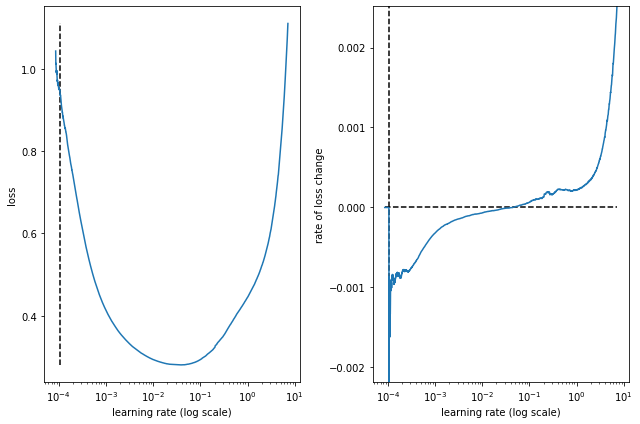

best lr: 0.0001058986 

Model: "conv1d_lstm_36l_48s_32bs_32fm_63f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_53 (Conv1D)          (None, 30, 63)            4473      
                                                                 
 max_pooling1d_53 (MaxPoolin  (None, 15, 63)           0         
 g1D)                                                            
                                                                 
 lstm_53 (LSTM)              (None, 32)                12288     
                                                                 
 dense_106 (Dense)           (None, 32)                1056      
                                                                 
 dense_107 (Dense)           (None, 48)                1584      
                                                                 
 reshape_53 (Reshape)        (None, 48, 1)             0         
     

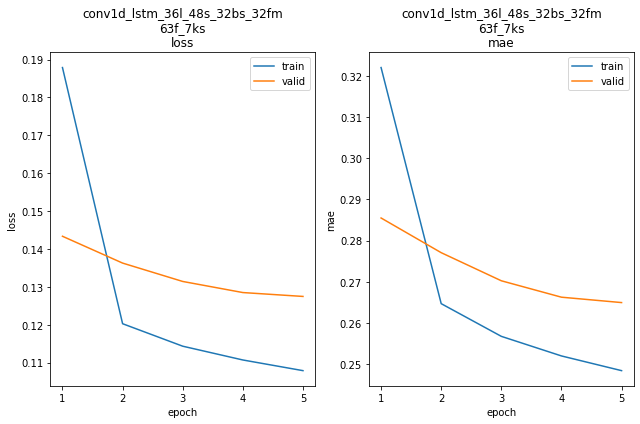

conv1d_lstm_36l_48s_32bs_32fm_63f_7ks train min loss: 0.107895	mae: 0.248409	epoch: 5
conv1d_lstm_36l_48s_32bs_32fm_63f_7ks valid min loss: 0.127484	mae: 0.264948	epoch: 5

conv1d_lstm_36l_48s_32bs_32fm_63f_7ks
Iteration No: 54 ended. Search finished for the next optimal point.
Time taken: 428.1300
Function value obtained: 0.1275
Current minimum: 0.1248
Iteration No: 55 started. Searching for the next optimal point.
lags 143
feat_maps 59
filters 58
kern_size 7
Epoch 1/5
5876/5876 [==============================] - 77s 13ms/step - loss: 0.9893 - mae: 0.6592


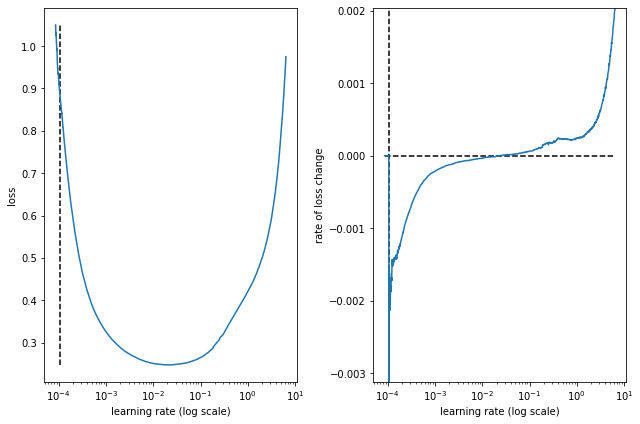

best lr: 0.000105913714 

Model: "conv1d_lstm_143l_48s_32bs_59fm_58f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_54 (Conv1D)          (None, 137, 58)           4118      
                                                                 
 max_pooling1d_54 (MaxPoolin  (None, 68, 58)           0         
 g1D)                                                            
                                                                 
 lstm_54 (LSTM)              (None, 59)                27848     
                                                                 
 dense_108 (Dense)           (None, 59)                3540      
                                                                 
 dense_109 (Dense)           (None, 48)                2880      
                                                                 
 reshape_54 (Reshape)        (None, 48, 1)             0         
  

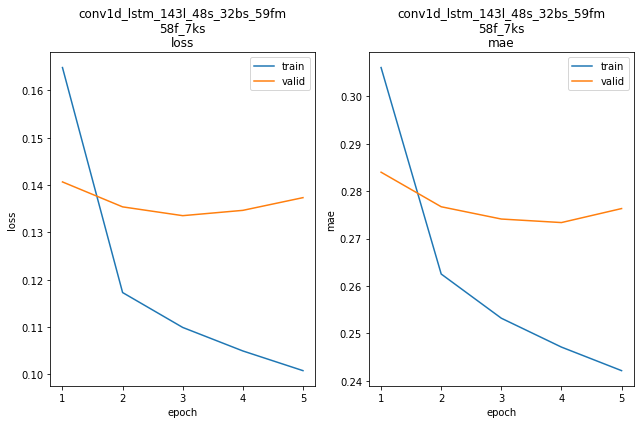

conv1d_lstm_143l_48s_32bs_59fm_58f_7ks train min loss: 0.100797	mae: 0.242155	epoch: 5
conv1d_lstm_143l_48s_32bs_59fm_58f_7ks valid min loss: 0.133536	mae: 0.274141	epoch: 3

conv1d_lstm_143l_48s_32bs_59fm_58f_7ks
Iteration No: 55 ended. Search finished for the next optimal point.
Time taken: 415.9965
Function value obtained: 0.1335
Current minimum: 0.1248
Iteration No: 56 started. Searching for the next optimal point.
lags 33
feat_maps 44
filters 38
kern_size 3
Epoch 1/5
5880/5880 [==============================] - 66s 11ms/step - loss: 1.0604 - mae: 0.6746


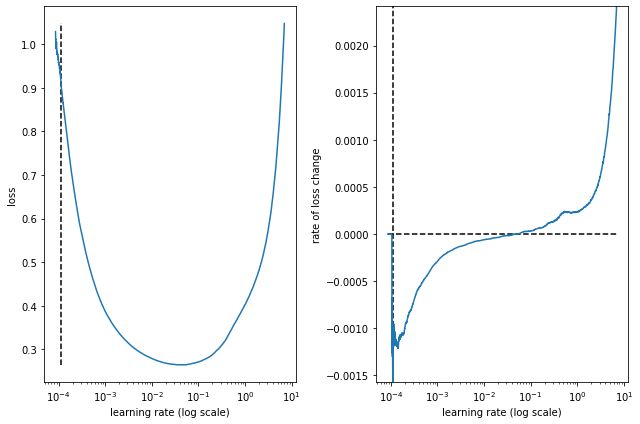

best lr: 0.000109746405 

Model: "conv1d_lstm_33l_48s_32bs_44fm_38f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_55 (Conv1D)          (None, 31, 38)            1178      
                                                                 
 max_pooling1d_55 (MaxPoolin  (None, 15, 38)           0         
 g1D)                                                            
                                                                 
 lstm_55 (LSTM)              (None, 44)                14608     
                                                                 
 dense_110 (Dense)           (None, 44)                1980      
                                                                 
 dense_111 (Dense)           (None, 48)                2160      
                                                                 
 reshape_55 (Reshape)        (None, 48, 1)             0         
   

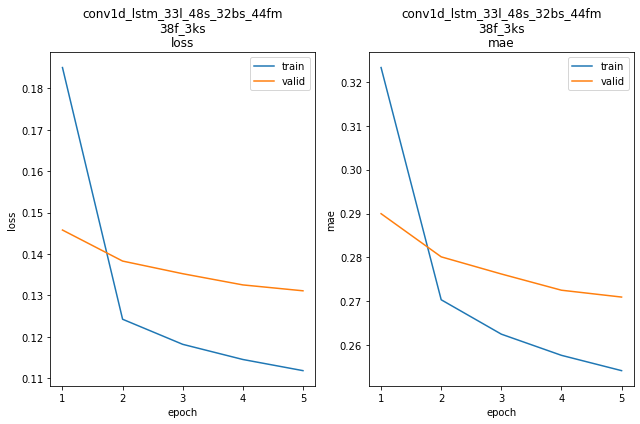

conv1d_lstm_33l_48s_32bs_44fm_38f_3ks train min loss: 0.111834	mae: 0.254213	epoch: 5
conv1d_lstm_33l_48s_32bs_44fm_38f_3ks valid min loss: 0.131119	mae: 0.270972	epoch: 5

conv1d_lstm_33l_48s_32bs_44fm_38f_3ks
Iteration No: 56 ended. Search finished for the next optimal point.
Time taken: 414.2691
Function value obtained: 0.1311
Current minimum: 0.1248
Iteration No: 57 started. Searching for the next optimal point.
lags 96
feat_maps 62
filters 40
kern_size 4
Epoch 1/5
5878/5878 [==============================] - 67s 11ms/step - loss: 1.0118 - mae: 0.6487


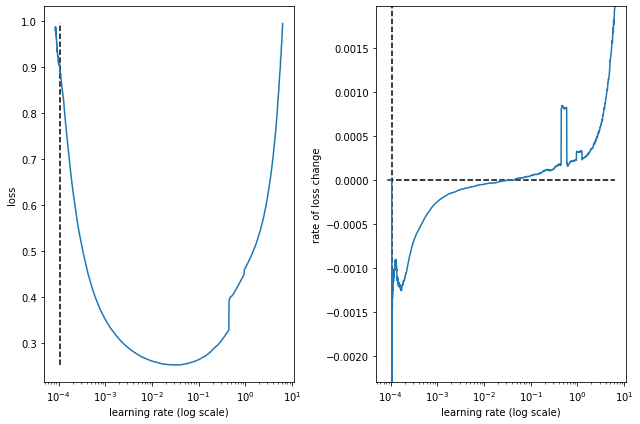

best lr: 0.00010590357 

Model: "conv1d_lstm_96l_48s_32bs_62fm_40f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_56 (Conv1D)          (None, 93, 40)            1640      
                                                                 
 max_pooling1d_56 (MaxPoolin  (None, 46, 40)           0         
 g1D)                                                            
                                                                 
 lstm_56 (LSTM)              (None, 62)                25544     
                                                                 
 dense_112 (Dense)           (None, 62)                3906      
                                                                 
 dense_113 (Dense)           (None, 48)                3024      
                                                                 
 reshape_56 (Reshape)        (None, 48, 1)             0         
    

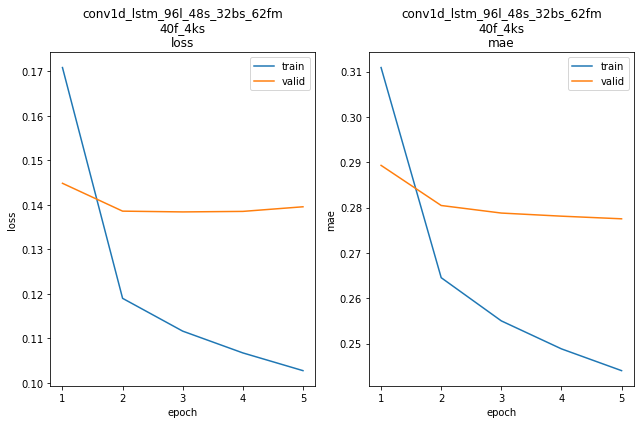

conv1d_lstm_96l_48s_32bs_62fm_40f_4ks train min loss: 0.102735	mae: 0.244012	epoch: 5
conv1d_lstm_96l_48s_32bs_62fm_40f_4ks valid min loss: 0.138422	mae: 0.278779	epoch: 3

conv1d_lstm_96l_48s_32bs_62fm_40f_4ks
Iteration No: 57 ended. Search finished for the next optimal point.
Time taken: 453.2132
Function value obtained: 0.1384
Current minimum: 0.1248
Iteration No: 58 started. Searching for the next optimal point.
lags 42
feat_maps 62
filters 37
kern_size 4
Epoch 1/5
5879/5879 [==============================] - 73s 12ms/step - loss: 0.9892 - mae: 0.6555


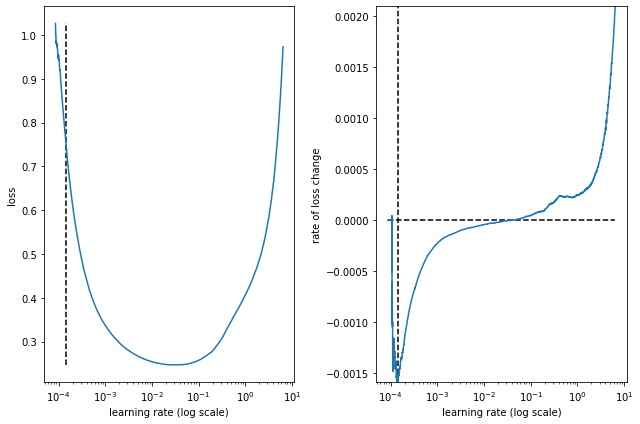

best lr: 0.00014251319 

Model: "conv1d_lstm_42l_48s_32bs_62fm_37f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_57 (Conv1D)          (None, 39, 37)            1517      
                                                                 
 max_pooling1d_57 (MaxPoolin  (None, 19, 37)           0         
 g1D)                                                            
                                                                 
 lstm_57 (LSTM)              (None, 62)                24800     
                                                                 
 dense_114 (Dense)           (None, 62)                3906      
                                                                 
 dense_115 (Dense)           (None, 48)                3024      
                                                                 
 reshape_57 (Reshape)        (None, 48, 1)             0         
    

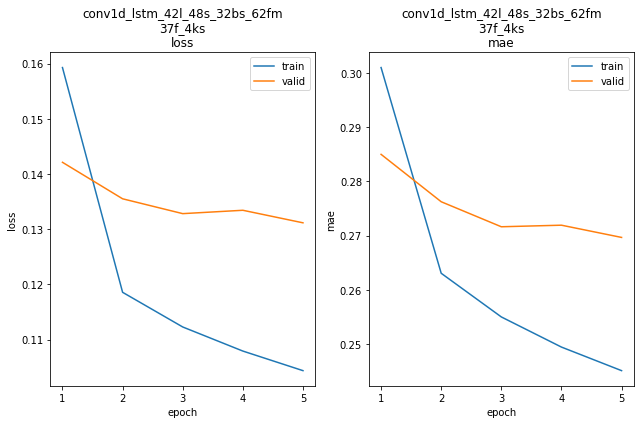

conv1d_lstm_42l_48s_32bs_62fm_37f_4ks train min loss: 0.104371	mae: 0.245080	epoch: 5
conv1d_lstm_42l_48s_32bs_62fm_37f_4ks valid min loss: 0.131157	mae: 0.269667	epoch: 5

conv1d_lstm_42l_48s_32bs_62fm_37f_4ks
Iteration No: 58 ended. Search finished for the next optimal point.
Time taken: 464.4879
Function value obtained: 0.1312
Current minimum: 0.1248
Iteration No: 59 started. Searching for the next optimal point.
lags 133
feat_maps 62
filters 16
kern_size 5
Epoch 1/5
5876/5876 [==============================] - 74s 12ms/step - loss: 1.0404 - mae: 0.6722


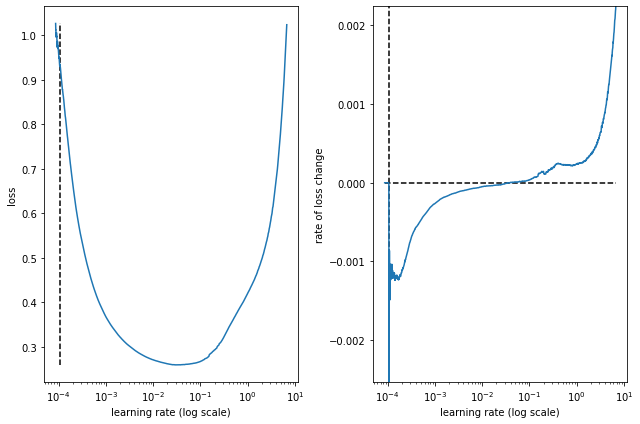

best lr: 0.000105913714 

Model: "conv1d_lstm_133l_48s_32bs_62fm_16f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_58 (Conv1D)          (None, 129, 16)           816       
                                                                 
 max_pooling1d_58 (MaxPoolin  (None, 64, 16)           0         
 g1D)                                                            
                                                                 
 lstm_58 (LSTM)              (None, 62)                19592     
                                                                 
 dense_116 (Dense)           (None, 62)                3906      
                                                                 
 dense_117 (Dense)           (None, 48)                3024      
                                                                 
 reshape_58 (Reshape)        (None, 48, 1)             0         
  

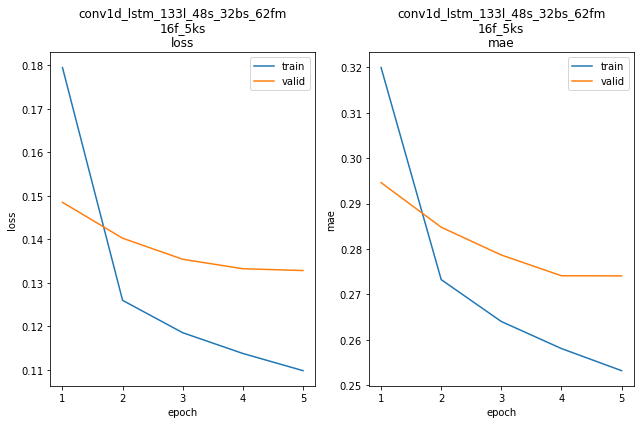

conv1d_lstm_133l_48s_32bs_62fm_16f_5ks train min loss: 0.109811	mae: 0.253213	epoch: 5
conv1d_lstm_133l_48s_32bs_62fm_16f_5ks valid min loss: 0.132824	mae: 0.274077	epoch: 5

conv1d_lstm_133l_48s_32bs_62fm_16f_5ks
Iteration No: 59 ended. Search finished for the next optimal point.
Time taken: 463.3664
Function value obtained: 0.1328
Current minimum: 0.1248
Iteration No: 60 started. Searching for the next optimal point.
lags 51
feat_maps 24
filters 58
kern_size 3
Epoch 1/5
5879/5879 [==============================] - 68s 11ms/step - loss: 1.1905 - mae: 0.7076


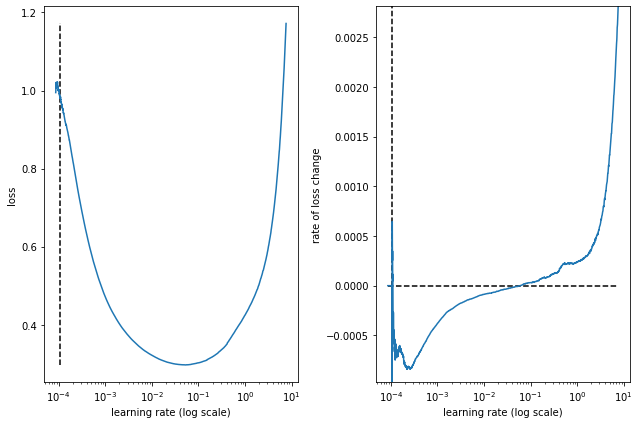

best lr: 0.00010531785 

Model: "conv1d_lstm_51l_48s_32bs_24fm_58f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_59 (Conv1D)          (None, 49, 58)            1798      
                                                                 
 max_pooling1d_59 (MaxPoolin  (None, 24, 58)           0         
 g1D)                                                            
                                                                 
 lstm_59 (LSTM)              (None, 24)                7968      
                                                                 
 dense_118 (Dense)           (None, 24)                600       
                                                                 
 dense_119 (Dense)           (None, 48)                1200      
                                                                 
 reshape_59 (Reshape)        (None, 48, 1)             0         
    

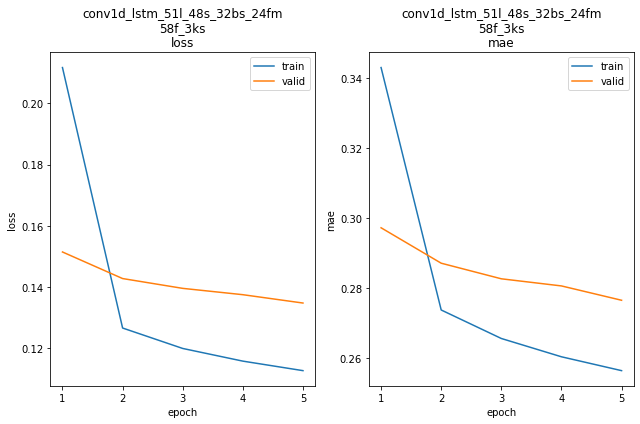

conv1d_lstm_51l_48s_32bs_24fm_58f_3ks train min loss: 0.112597	mae: 0.256333	epoch: 5
conv1d_lstm_51l_48s_32bs_24fm_58f_3ks valid min loss: 0.134712	mae: 0.276461	epoch: 5

conv1d_lstm_51l_48s_32bs_24fm_58f_3ks
Iteration No: 60 ended. Search finished for the next optimal point.
Time taken: 391.5322
Function value obtained: 0.1347
Current minimum: 0.1248

[30, 27, 63, 7]
0.12481506168842316



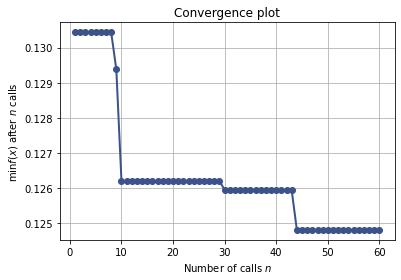

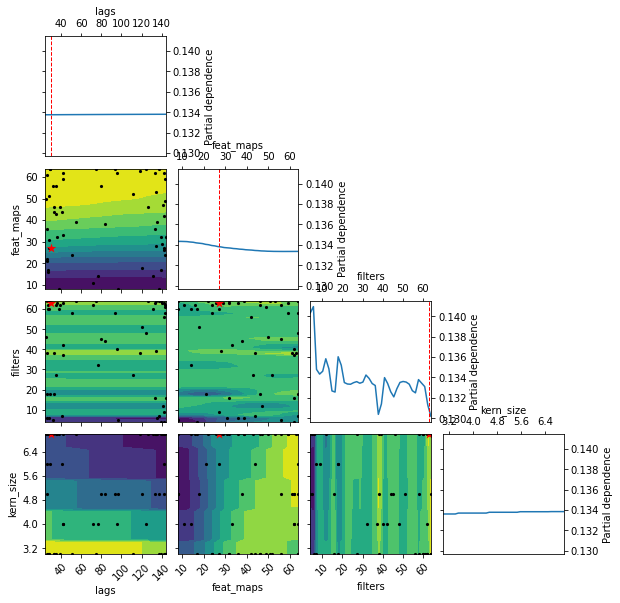

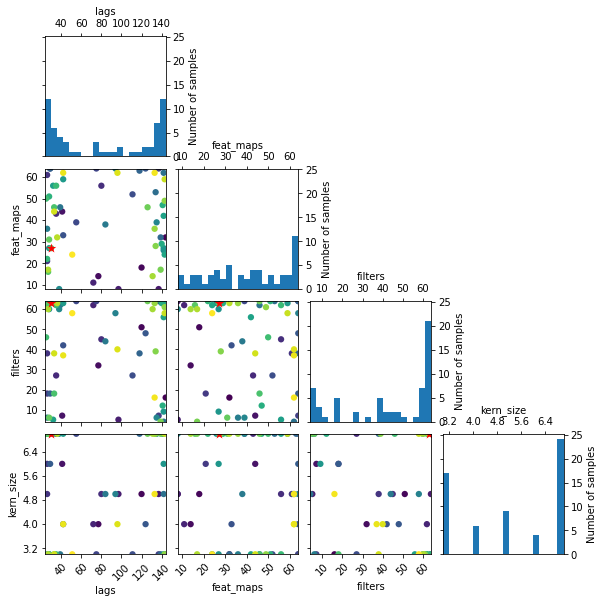

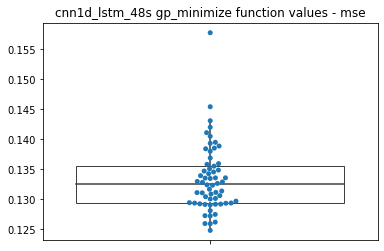

CPU times: user 6h 46min 9s, sys: 1h 21min 23s, total: 8h 7min 32s
Wall time: 6h 59min 57s


In [ ]:
%%time


results_id = 'cnn1d_lstm_48s'
hpo[results_id] = {}

dim_lags      = Integer(low = 24, high = 144, name = 'lags')
dim_feat_maps = Integer(low =  8, high =  64, name = 'feat_maps')
dim_filters   = Integer(low =  4, high =  64, name = 'filters')
dim_kern_size = Integer(low =  3, high =   7, name = 'kern_size')

hpo[results_id]['dims'] = [dim_lags,
                           dim_feat_maps,
                           dim_filters,
                           dim_kern_size]
hpo[results_id]['init_dims'] = [144, 32, 16, 3]
hpo[results_id]['calls']     = 60


@use_named_args(dimensions = hpo[results_id]['dims'])
def model_fitness(**dims):
    params = get_default_params('conv1d_lstm')
    params.update({'lrf_params': [0.00008,  0.001, 32, 5, 100, 25]})

    return get_bo_mse(params, **dims)


hpo[results_id]['fitness_func'] = model_fitness
hpo[results_id]['results']      = run_bo_search(hpo, results_id)


Results for optimised Conv1D-LSTM 48 steps-ahead forecast models after 5 epochs:

| CNN model | params                                     | mse     | mae     |
|-----------|--------------------------------------------|---------|---------|
|Conv1D-LSTM| lags=30,feat_maps=27,filters=63,kern_size=7| 0.12481 | 0.26295 |

Best model:
 * conv1d_lstm_30l_48s_32bs_27fm_63f_7ks 

This is not quite as good as the best pure LSTM architectures but run time is lower.

It's difficult to draw anything useful from the Gaussian process plots.

It's clear from some of the learning rate finder curves that start_lr and/or end_lr could be further refined.  Start_lr may be a little low but results seem OK.

As with all of the skopt runs, it would benefit from running for more iterations and probably more learning rate tuning.


---


### Conv1D-Dense


Code for this architecture is in the `build_conv1d_dense_model` function.

Briefly, the architecture is (omitting dropout and regularisation):
 * Conv1D()
 * MaxPooling1D()
 * Flatten()
 * Dense(activation='relu')
 * Dense(activation='relu')
 * Dense()

I've somewhat arbitrarily chosen to use a batch size of 32.

Optimise:

 * lags
 * feat_maps - LSTM feature maps
 * Conv1D() filters
 * Conv1D() kern_size

Iteration No: 1 started. Evaluating function at provided point.
lags 24
feat_maps 64
filters 64
kern_size 7
Epoch 1/5
5880/5880 [==============================] - 21s 3ms/step - loss: 2.8816 - mae: 0.4872


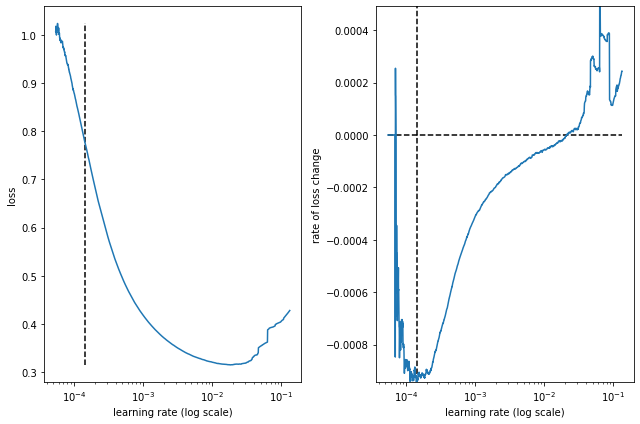

best lr: 0.00014333958 

Model: "conv1d_dense_24l_48s_32bs_64fm_64f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_60 (Conv1D)          (None, 18, 64)            4544      
                                                                 
 max_pooling1d_60 (MaxPoolin  (None, 9, 64)            0         
 g1D)                                                            
                                                                 
 flatten (Flatten)           (None, 576)               0         
                                                                 
 dense_120 (Dense)           (None, 64)                36928     
                                                                 
 dense_121 (Dense)           (None, 32)                2080      
                                                                 
 dense_122 (Dense)           (None, 48)                1584      
   

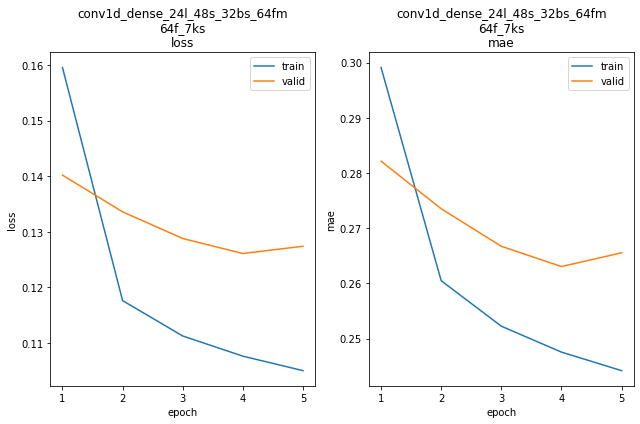

conv1d_dense_24l_48s_32bs_64fm_64f_7ks train min loss: 0.105042	mae: 0.244181	epoch: 5
conv1d_dense_24l_48s_32bs_64fm_64f_7ks valid min loss: 0.126108	mae: 0.263042	epoch: 4

conv1d_dense_24l_48s_32bs_64fm_64f_7ks
Iteration No: 1 ended. Evaluation done at provided point.
Time taken: 211.3297
Function value obtained: 0.1261
Current minimum: 0.1261
Iteration No: 2 started. Evaluating function at random point.
lags 41
feat_maps 38
filters 52
kern_size 5
Epoch 1/5
5879/5879 [==============================] - 32s 5ms/step - loss: 1.3737 - mae: 0.7593


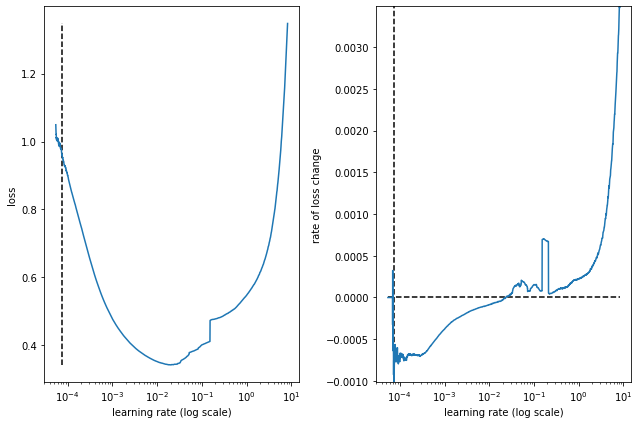

best lr: 7.394848e-05 

Model: "conv1d_dense_41l_48s_32bs_38fm_52f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_61 (Conv1D)          (None, 37, 52)            2652      
                                                                 
 max_pooling1d_61 (MaxPoolin  (None, 18, 52)           0         
 g1D)                                                            
                                                                 
 flatten_1 (Flatten)         (None, 936)               0         
                                                                 
 dense_123 (Dense)           (None, 38)                35606     
                                                                 
 dense_124 (Dense)           (None, 19)                741       
                                                                 
 dense_125 (Dense)           (None, 48)                960       
    

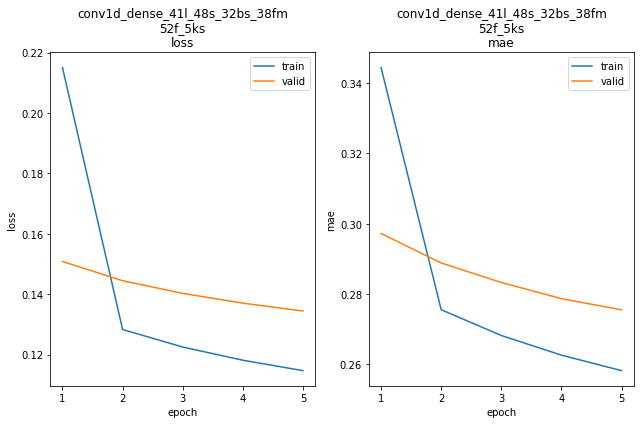

conv1d_dense_41l_48s_32bs_38fm_52f_5ks train min loss: 0.114672	mae: 0.258252	epoch: 5
conv1d_dense_41l_48s_32bs_38fm_52f_5ks valid min loss: 0.134415	mae: 0.275535	epoch: 5

conv1d_dense_41l_48s_32bs_38fm_52f_5ks
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 229.6073
Function value obtained: 0.1344
Current minimum: 0.1261
Iteration No: 3 started. Evaluating function at random point.
lags 28
feat_maps 35
filters 34
kern_size 4
Epoch 1/5
5880/5880 [==============================] - 32s 5ms/step - loss: 1.4691 - mae: 0.7377


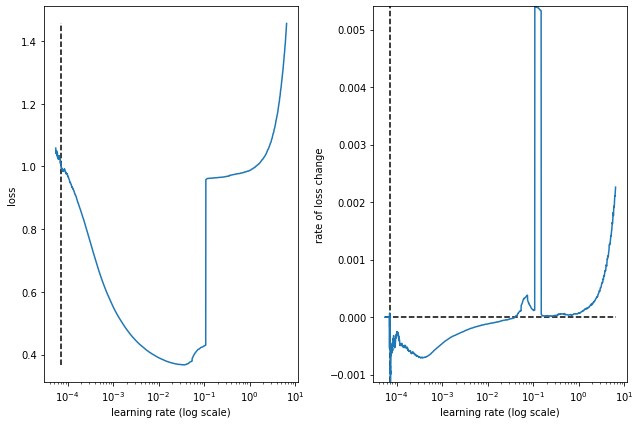

best lr: 7.2511e-05 

Model: "conv1d_dense_28l_48s_32bs_35fm_34f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_62 (Conv1D)          (None, 25, 34)            1394      
                                                                 
 max_pooling1d_62 (MaxPoolin  (None, 12, 34)           0         
 g1D)                                                            
                                                                 
 flatten_2 (Flatten)         (None, 408)               0         
                                                                 
 dense_126 (Dense)           (None, 35)                14315     
                                                                 
 dense_127 (Dense)           (None, 17)                612       
                                                                 
 dense_128 (Dense)           (None, 48)                864       
      

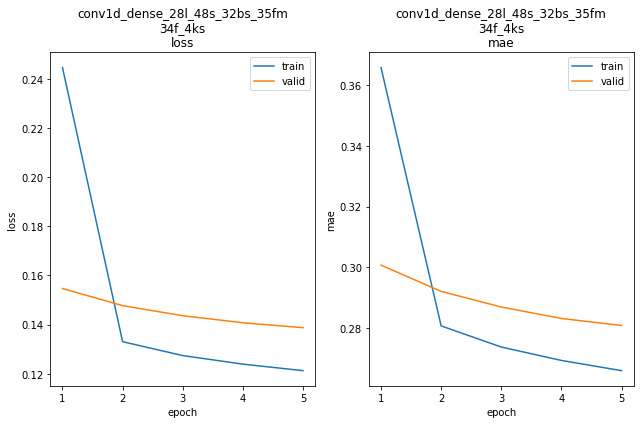

conv1d_dense_28l_48s_32bs_35fm_34f_4ks train min loss: 0.121262	mae: 0.265845	epoch: 5
conv1d_dense_28l_48s_32bs_35fm_34f_4ks valid min loss: 0.138743	mae: 0.280755	epoch: 5

conv1d_dense_28l_48s_32bs_35fm_34f_4ks
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 243.3374
Function value obtained: 0.1387
Current minimum: 0.1261
Iteration No: 4 started. Evaluating function at random point.
lags 17
feat_maps 53
filters 11
kern_size 6
Epoch 1/5
5880/5880 [==============================] - 34s 6ms/step - loss: 1.4725 - mae: 0.8028


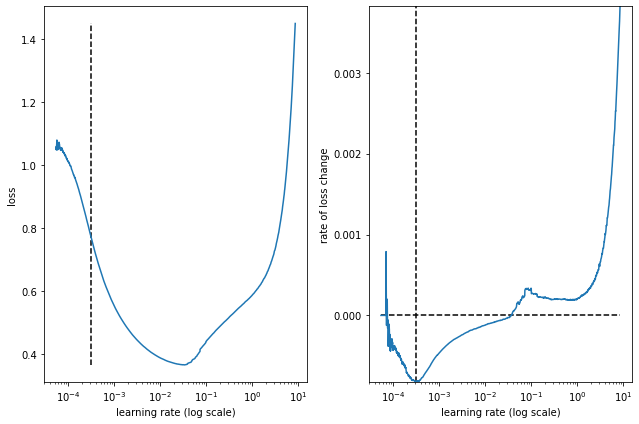

best lr: 0.0003084229 

Model: "conv1d_dense_17l_48s_32bs_53fm_11f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_63 (Conv1D)          (None, 12, 11)            671       
                                                                 
 max_pooling1d_63 (MaxPoolin  (None, 6, 11)            0         
 g1D)                                                            
                                                                 
 flatten_3 (Flatten)         (None, 66)                0         
                                                                 
 dense_129 (Dense)           (None, 53)                3551      
                                                                 
 dense_130 (Dense)           (None, 26)                1404      
                                                                 
 dense_131 (Dense)           (None, 48)                1296      
    

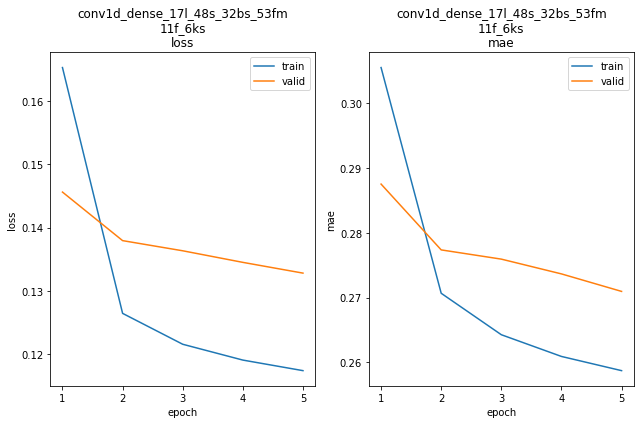

conv1d_dense_17l_48s_32bs_53fm_11f_6ks train min loss: 0.117425	mae: 0.258709	epoch: 5
conv1d_dense_17l_48s_32bs_53fm_11f_6ks valid min loss: 0.132817	mae: 0.270942	epoch: 5

conv1d_dense_17l_48s_32bs_53fm_11f_6ks
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 235.3581
Function value obtained: 0.1328
Current minimum: 0.1261
Iteration No: 5 started. Evaluating function at random point.
lags 46
feat_maps 32
filters 64
kern_size 5
Epoch 1/5
5879/5879 [==============================] - 35s 6ms/step - loss: 1.3622 - mae: 0.7813


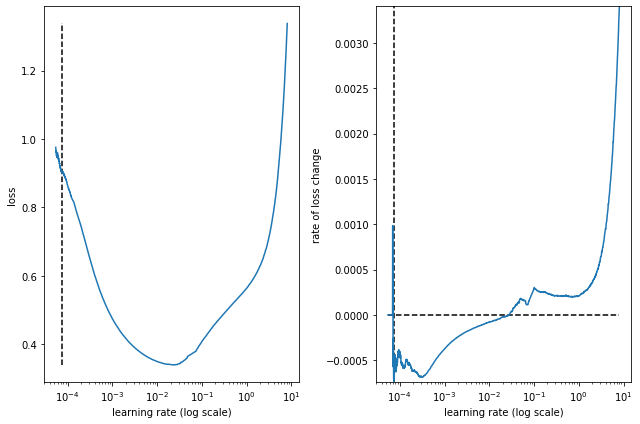

best lr: 7.516418e-05 

Model: "conv1d_dense_46l_48s_32bs_32fm_64f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_64 (Conv1D)          (None, 42, 64)            3264      
                                                                 
 max_pooling1d_64 (MaxPoolin  (None, 21, 64)           0         
 g1D)                                                            
                                                                 
 flatten_4 (Flatten)         (None, 1344)              0         
                                                                 
 dense_132 (Dense)           (None, 32)                43040     
                                                                 
 dense_133 (Dense)           (None, 16)                528       
                                                                 
 dense_134 (Dense)           (None, 48)                816       
    

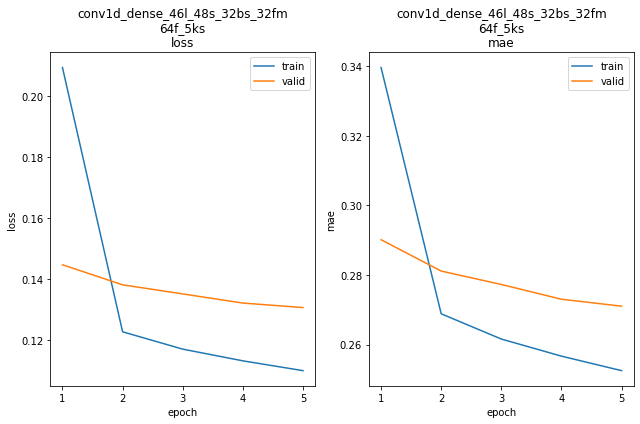

conv1d_dense_46l_48s_32bs_32fm_64f_5ks train min loss: 0.110129	mae: 0.252543	epoch: 5
conv1d_dense_46l_48s_32bs_32fm_64f_5ks valid min loss: 0.130774	mae: 0.271055	epoch: 5

conv1d_dense_46l_48s_32bs_32fm_64f_5ks
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 231.9453
Function value obtained: 0.1308
Current minimum: 0.1261
Iteration No: 6 started. Evaluating function at random point.
lags 34
feat_maps 32
filters 9
kern_size 5
Epoch 1/5
5880/5880 [==============================] - 34s 6ms/step - loss: 1.6188 - mae: 0.6690


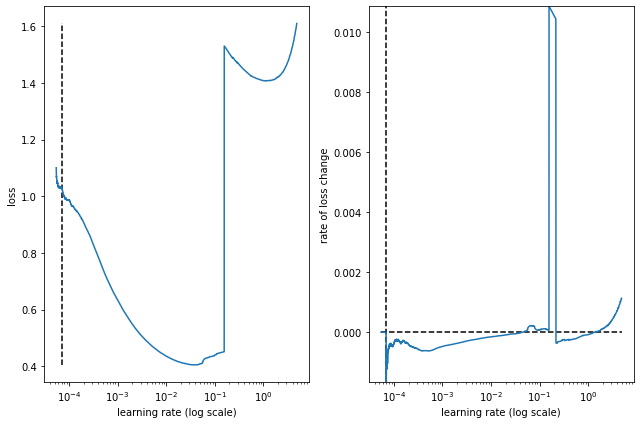

best lr: 6.972859e-05 

Model: "conv1d_dense_34l_48s_32bs_32fm_9f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_65 (Conv1D)          (None, 30, 9)             459       
                                                                 
 max_pooling1d_65 (MaxPoolin  (None, 15, 9)            0         
 g1D)                                                            
                                                                 
 flatten_5 (Flatten)         (None, 135)               0         
                                                                 
 dense_135 (Dense)           (None, 32)                4352      
                                                                 
 dense_136 (Dense)           (None, 16)                528       
                                                                 
 dense_137 (Dense)           (None, 48)                816       
     

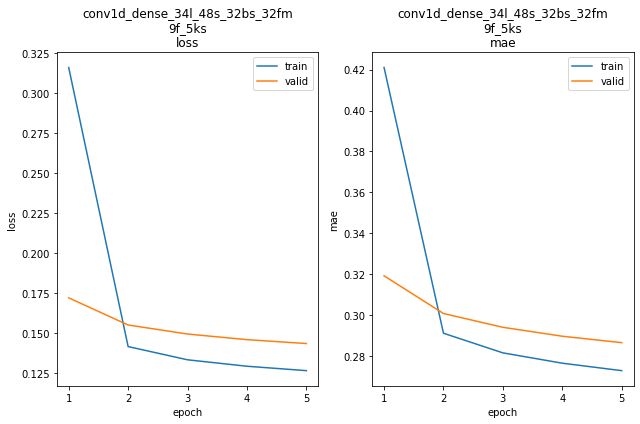

conv1d_dense_34l_48s_32bs_32fm_9f_5ks train min loss: 0.126371	mae: 0.272790	epoch: 5
conv1d_dense_34l_48s_32bs_32fm_9f_5ks valid min loss: 0.143325	mae: 0.286477	epoch: 5

conv1d_dense_34l_48s_32bs_32fm_9f_5ks
Iteration No: 6 ended. Evaluation done at random point.
Time taken: 238.4324
Function value obtained: 0.1433
Current minimum: 0.1261
Iteration No: 7 started. Evaluating function at random point.
lags 26
feat_maps 33
filters 63
kern_size 4
Epoch 1/5
5880/5880 [==============================] - 24s 4ms/step - loss: 1.6533 - mae: 0.4966


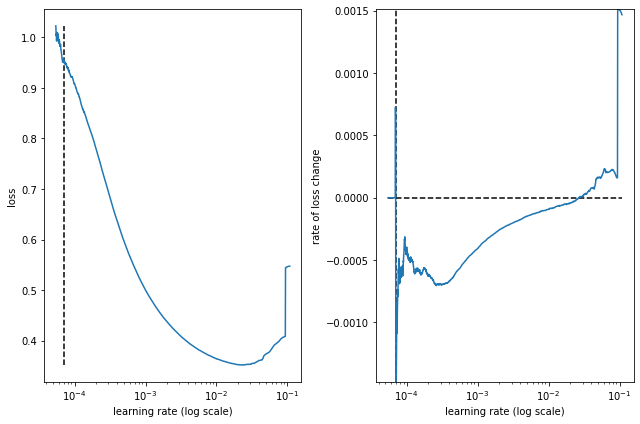

best lr: 7.110619e-05 

Model: "conv1d_dense_26l_48s_32bs_33fm_63f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_66 (Conv1D)          (None, 23, 63)            2583      
                                                                 
 max_pooling1d_66 (MaxPoolin  (None, 11, 63)           0         
 g1D)                                                            
                                                                 
 flatten_6 (Flatten)         (None, 693)               0         
                                                                 
 dense_138 (Dense)           (None, 33)                22902     
                                                                 
 dense_139 (Dense)           (None, 16)                544       
                                                                 
 dense_140 (Dense)           (None, 48)                816       
    

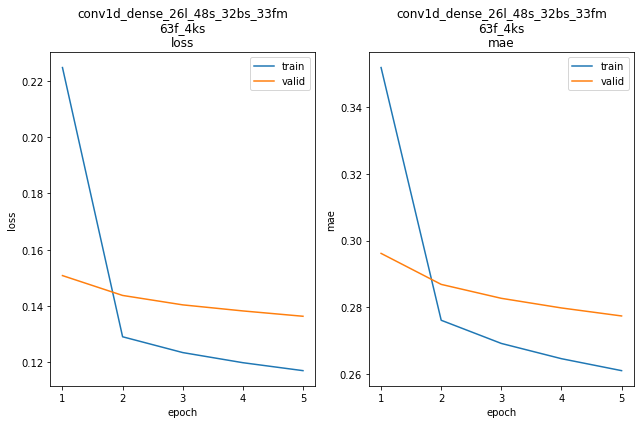

conv1d_dense_26l_48s_32bs_33fm_63f_4ks train min loss: 0.117087	mae: 0.261023	epoch: 5
conv1d_dense_26l_48s_32bs_33fm_63f_4ks valid min loss: 0.136399	mae: 0.277419	epoch: 5

conv1d_dense_26l_48s_32bs_33fm_63f_4ks
Iteration No: 7 ended. Evaluation done at random point.
Time taken: 214.1536
Function value obtained: 0.1364
Current minimum: 0.1261
Iteration No: 8 started. Evaluating function at random point.
lags 15
feat_maps 52
filters 29
kern_size 7
Epoch 1/5
5880/5880 [==============================] - 23s 4ms/step - loss: 2.2329 - mae: 0.4934


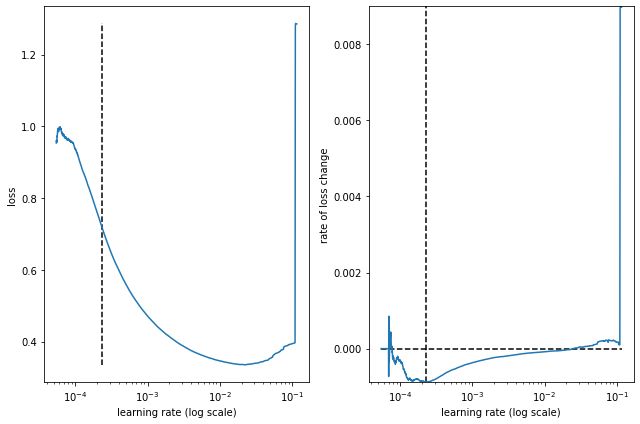

best lr: 0.0002299846 

Model: "conv1d_dense_15l_48s_32bs_52fm_29f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_67 (Conv1D)          (None, 9, 29)             2059      
                                                                 
 max_pooling1d_67 (MaxPoolin  (None, 4, 29)            0         
 g1D)                                                            
                                                                 
 flatten_7 (Flatten)         (None, 116)               0         
                                                                 
 dense_141 (Dense)           (None, 52)                6084      
                                                                 
 dense_142 (Dense)           (None, 26)                1378      
                                                                 
 dense_143 (Dense)           (None, 48)                1296      
    

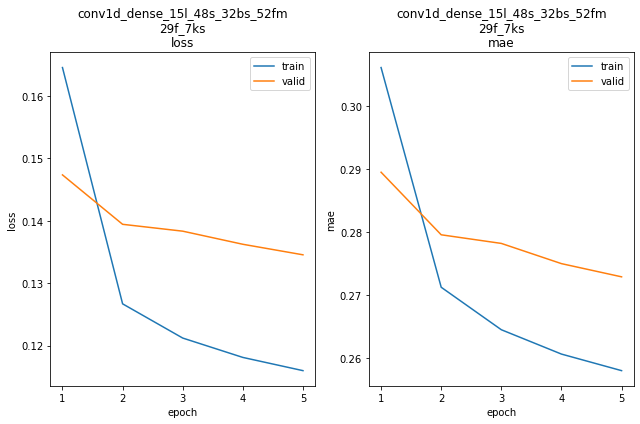

conv1d_dense_15l_48s_32bs_52fm_29f_7ks train min loss: 0.115998	mae: 0.257950	epoch: 5
conv1d_dense_15l_48s_32bs_52fm_29f_7ks valid min loss: 0.134558	mae: 0.272859	epoch: 5

conv1d_dense_15l_48s_32bs_52fm_29f_7ks
Iteration No: 8 ended. Evaluation done at random point.
Time taken: 216.3518
Function value obtained: 0.1346
Current minimum: 0.1261
Iteration No: 9 started. Evaluating function at random point.
lags 29
feat_maps 60
filters 46
kern_size 5
Epoch 1/5
5880/5880 [==============================] - 24s 4ms/step - loss: 97.3490 - mae: 0.5958


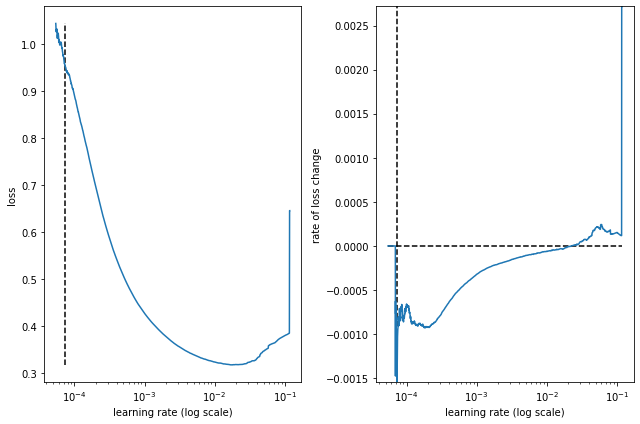

best lr: 7.2511e-05 

Model: "conv1d_dense_29l_48s_32bs_60fm_46f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_68 (Conv1D)          (None, 25, 46)            2346      
                                                                 
 max_pooling1d_68 (MaxPoolin  (None, 12, 46)           0         
 g1D)                                                            
                                                                 
 flatten_8 (Flatten)         (None, 552)               0         
                                                                 
 dense_144 (Dense)           (None, 60)                33180     
                                                                 
 dense_145 (Dense)           (None, 30)                1830      
                                                                 
 dense_146 (Dense)           (None, 48)                1488      
      

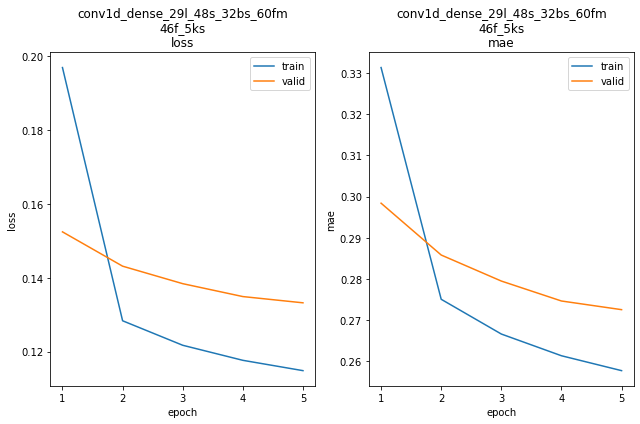

conv1d_dense_29l_48s_32bs_60fm_46f_5ks train min loss: 0.114858	mae: 0.257727	epoch: 5
conv1d_dense_29l_48s_32bs_60fm_46f_5ks valid min loss: 0.133228	mae: 0.272544	epoch: 5

conv1d_dense_29l_48s_32bs_60fm_46f_5ks
Iteration No: 9 ended. Evaluation done at random point.
Time taken: 244.1888
Function value obtained: 0.1332
Current minimum: 0.1261
Iteration No: 10 started. Evaluating function at random point.
lags 12
feat_maps 62
filters 40
kern_size 5
Epoch 1/5
5880/5880 [==============================] - 36s 6ms/step - loss: 1.2993 - mae: 0.7465


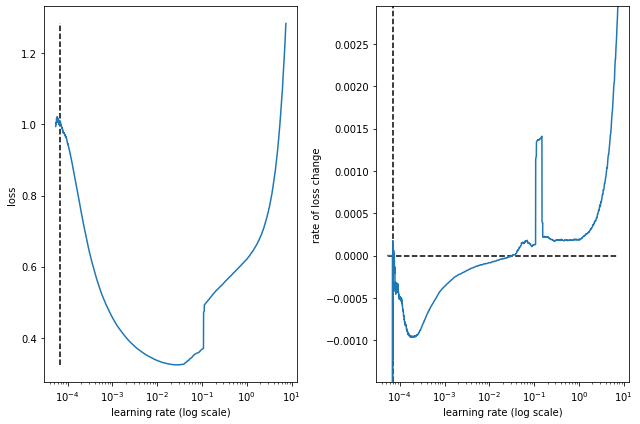

best lr: 6.9275346e-05 

Model: "conv1d_dense_12l_48s_32bs_62fm_40f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_69 (Conv1D)          (None, 8, 40)             2040      
                                                                 
 max_pooling1d_69 (MaxPoolin  (None, 4, 40)            0         
 g1D)                                                            
                                                                 
 flatten_9 (Flatten)         (None, 160)               0         
                                                                 
 dense_147 (Dense)           (None, 62)                9982      
                                                                 
 dense_148 (Dense)           (None, 31)                1953      
                                                                 
 dense_149 (Dense)           (None, 48)                1536      
   

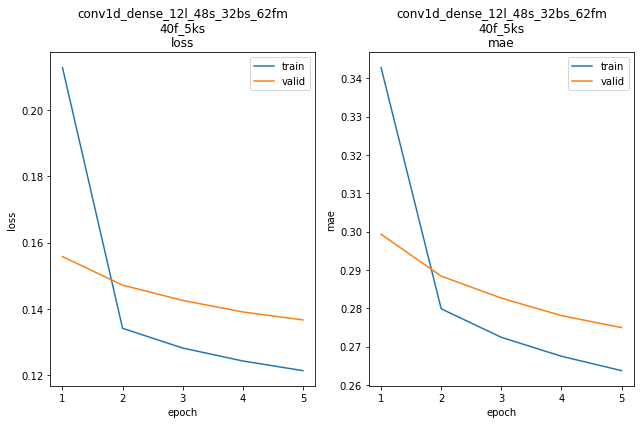

conv1d_dense_12l_48s_32bs_62fm_40f_5ks train min loss: 0.121375	mae: 0.263740	epoch: 5
conv1d_dense_12l_48s_32bs_62fm_40f_5ks valid min loss: 0.136666	mae: 0.274962	epoch: 5

conv1d_dense_12l_48s_32bs_62fm_40f_5ks
Iteration No: 10 ended. Evaluation done at random point.
Time taken: 240.2197
Function value obtained: 0.1367
Current minimum: 0.1261
Iteration No: 11 started. Evaluating function at random point.
lags 13
feat_maps 39
filters 21
kern_size 6
Epoch 1/5
5880/5880 [==============================] - 37s 6ms/step - loss: 1.5355 - mae: 0.7956


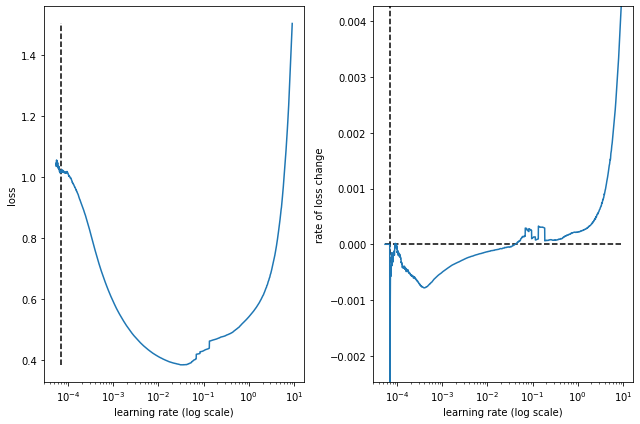

best lr: 6.9275346e-05 

Model: "conv1d_dense_13l_48s_32bs_39fm_21f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_70 (Conv1D)          (None, 8, 21)             1281      
                                                                 
 max_pooling1d_70 (MaxPoolin  (None, 4, 21)            0         
 g1D)                                                            
                                                                 
 flatten_10 (Flatten)        (None, 84)                0         
                                                                 
 dense_150 (Dense)           (None, 39)                3315      
                                                                 
 dense_151 (Dense)           (None, 19)                760       
                                                                 
 dense_152 (Dense)           (None, 48)                960       
   

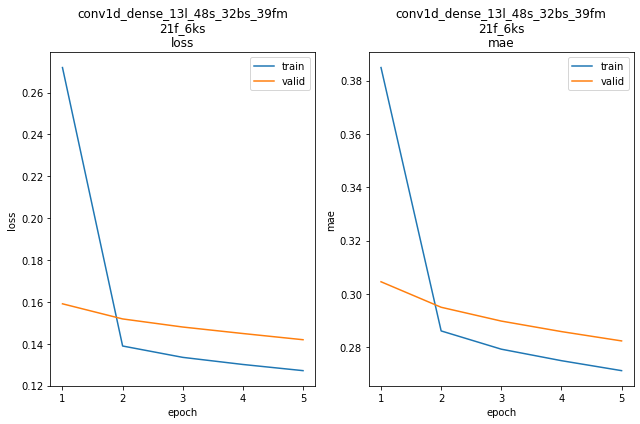

conv1d_dense_13l_48s_32bs_39fm_21f_6ks train min loss: 0.127153	mae: 0.271207	epoch: 5
conv1d_dense_13l_48s_32bs_39fm_21f_6ks valid min loss: 0.141925	mae: 0.282361	epoch: 5

conv1d_dense_13l_48s_32bs_39fm_21f_6ks
Iteration No: 11 ended. Evaluation done at random point.
Time taken: 239.4439
Function value obtained: 0.1419
Current minimum: 0.1261
Iteration No: 12 started. Evaluating function at random point.
lags 48
feat_maps 64
filters 55
kern_size 7
Epoch 1/5
5879/5879 [==============================] - 36s 6ms/step - loss: 1.2356 - mae: 0.6988


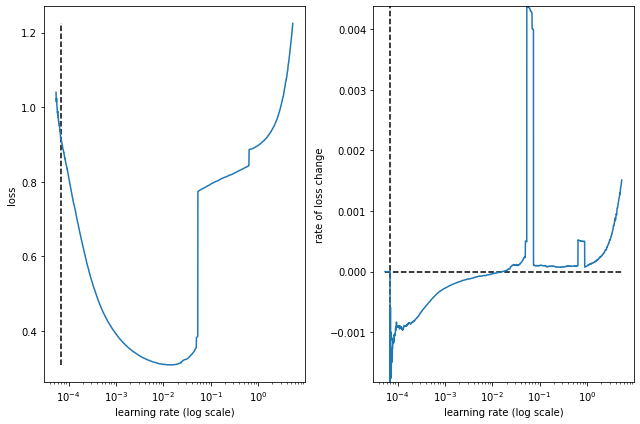

best lr: 6.973253e-05 

Model: "conv1d_dense_48l_48s_32bs_64fm_55f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_71 (Conv1D)          (None, 42, 55)            3905      
                                                                 
 max_pooling1d_71 (MaxPoolin  (None, 21, 55)           0         
 g1D)                                                            
                                                                 
 flatten_11 (Flatten)        (None, 1155)              0         
                                                                 
 dense_153 (Dense)           (None, 64)                73984     
                                                                 
 dense_154 (Dense)           (None, 32)                2080      
                                                                 
 dense_155 (Dense)           (None, 48)                1584      
    

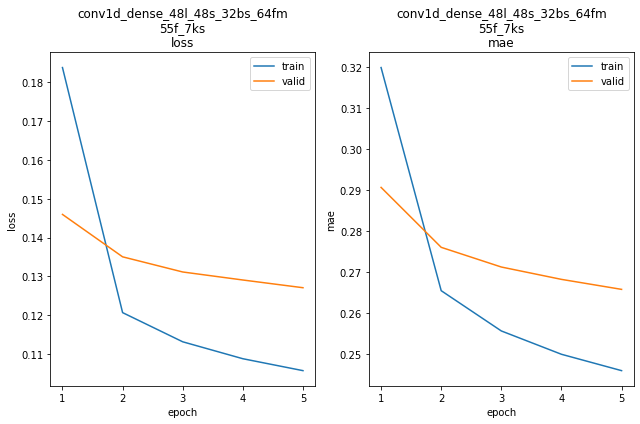

conv1d_dense_48l_48s_32bs_64fm_55f_7ks train min loss: 0.105702	mae: 0.246032	epoch: 5
conv1d_dense_48l_48s_32bs_64fm_55f_7ks valid min loss: 0.127082	mae: 0.265822	epoch: 5

conv1d_dense_48l_48s_32bs_64fm_55f_7ks
Iteration No: 12 ended. Evaluation done at random point.
Time taken: 247.4810
Function value obtained: 0.1271
Current minimum: 0.1261
Iteration No: 13 started. Searching for the next optimal point.
lags 43
feat_maps 50
filters 64
kern_size 7
Epoch 1/5
5879/5879 [==============================] - 38s 6ms/step - loss: 1.3801 - mae: 0.7705


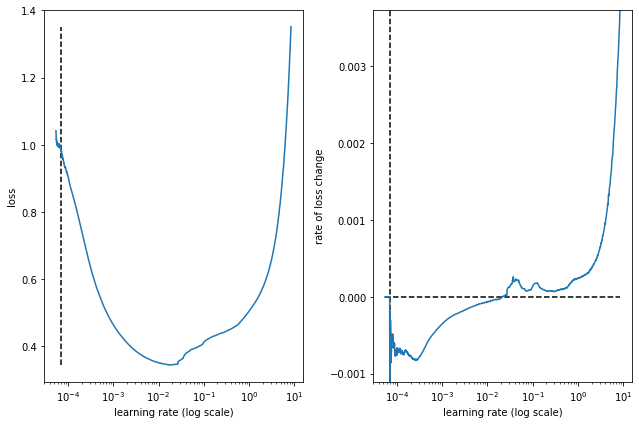

best lr: 6.927919e-05 

Model: "conv1d_dense_43l_48s_32bs_50fm_64f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_72 (Conv1D)          (None, 37, 64)            4544      
                                                                 
 max_pooling1d_72 (MaxPoolin  (None, 18, 64)           0         
 g1D)                                                            
                                                                 
 flatten_12 (Flatten)        (None, 1152)              0         
                                                                 
 dense_156 (Dense)           (None, 50)                57650     
                                                                 
 dense_157 (Dense)           (None, 25)                1275      
                                                                 
 dense_158 (Dense)           (None, 48)                1248      
    

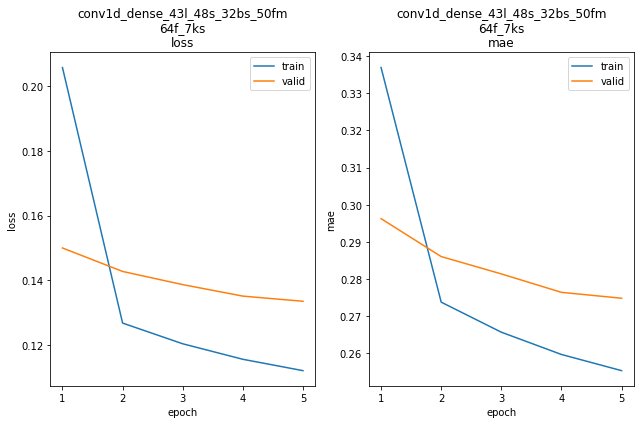

conv1d_dense_43l_48s_32bs_50fm_64f_7ks train min loss: 0.112050	mae: 0.255358	epoch: 5
conv1d_dense_43l_48s_32bs_50fm_64f_7ks valid min loss: 0.133505	mae: 0.274843	epoch: 5

conv1d_dense_43l_48s_32bs_50fm_64f_7ks
Iteration No: 13 ended. Search finished for the next optimal point.
Time taken: 239.3727
Function value obtained: 0.1335
Current minimum: 0.1261
Iteration No: 14 started. Searching for the next optimal point.
lags 45
feat_maps 61
filters 8
kern_size 7
Epoch 1/5
5879/5879 [==============================] - 31s 5ms/step - loss: 48698.7070 - mae: 4.1210


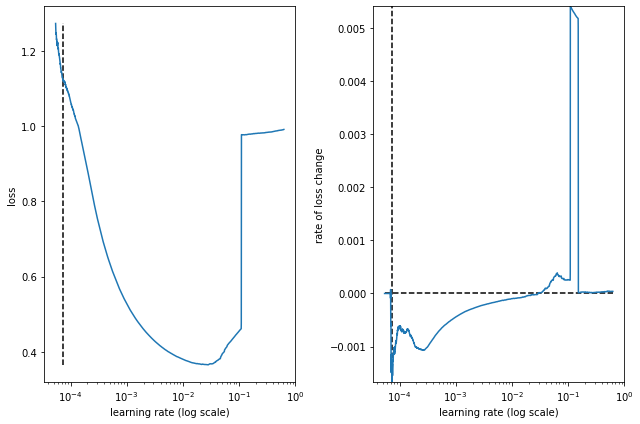

best lr: 7.29901e-05 

Model: "conv1d_dense_45l_48s_32bs_61fm_8f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_73 (Conv1D)          (None, 39, 8)             568       
                                                                 
 max_pooling1d_73 (MaxPoolin  (None, 19, 8)            0         
 g1D)                                                            
                                                                 
 flatten_13 (Flatten)        (None, 152)               0         
                                                                 
 dense_159 (Dense)           (None, 61)                9333      
                                                                 
 dense_160 (Dense)           (None, 30)                1860      
                                                                 
 dense_161 (Dense)           (None, 48)                1488      
      

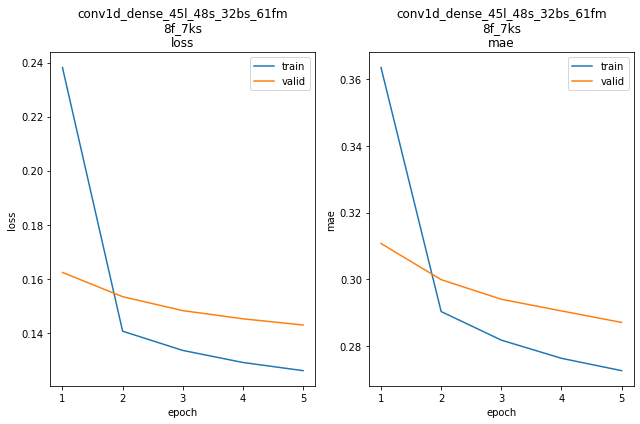

conv1d_dense_45l_48s_32bs_61fm_8f_7ks train min loss: 0.126004	mae: 0.272553	epoch: 5
conv1d_dense_45l_48s_32bs_61fm_8f_7ks valid min loss: 0.142893	mae: 0.287028	epoch: 5

conv1d_dense_45l_48s_32bs_61fm_8f_7ks
Iteration No: 14 ended. Search finished for the next optimal point.
Time taken: 239.7318
Function value obtained: 0.1429
Current minimum: 0.1261
Iteration No: 15 started. Searching for the next optimal point.
lags 46
feat_maps 58
filters 64
kern_size 7
Epoch 1/5
5879/5879 [==============================] - 39s 6ms/step - loss: 1.1851 - mae: 0.7360


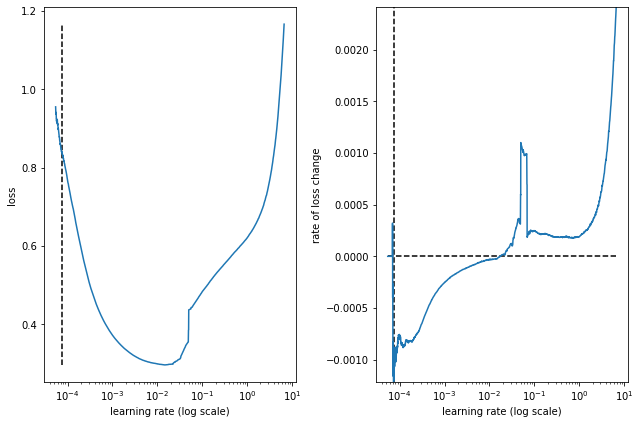

best lr: 7.346773e-05 

Model: "conv1d_dense_46l_48s_32bs_58fm_64f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_74 (Conv1D)          (None, 40, 64)            4544      
                                                                 
 max_pooling1d_74 (MaxPoolin  (None, 20, 64)           0         
 g1D)                                                            
                                                                 
 flatten_14 (Flatten)        (None, 1280)              0         
                                                                 
 dense_162 (Dense)           (None, 58)                74298     
                                                                 
 dense_163 (Dense)           (None, 29)                1711      
                                                                 
 dense_164 (Dense)           (None, 48)                1440      
    

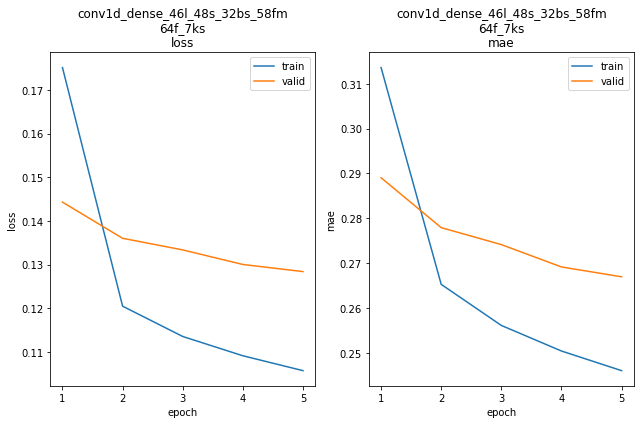

conv1d_dense_46l_48s_32bs_58fm_64f_7ks train min loss: 0.105730	mae: 0.246013	epoch: 5
conv1d_dense_46l_48s_32bs_58fm_64f_7ks valid min loss: 0.128416	mae: 0.266950	epoch: 5

conv1d_dense_46l_48s_32bs_58fm_64f_7ks
Iteration No: 15 ended. Search finished for the next optimal point.
Time taken: 225.5768
Function value obtained: 0.1284
Current minimum: 0.1261
Iteration No: 16 started. Searching for the next optimal point.
lags 12
feat_maps 53
filters 63
kern_size 5
Epoch 1/5
5880/5880 [==============================] - 27s 4ms/step - loss: 83.2123 - mae: 0.5876


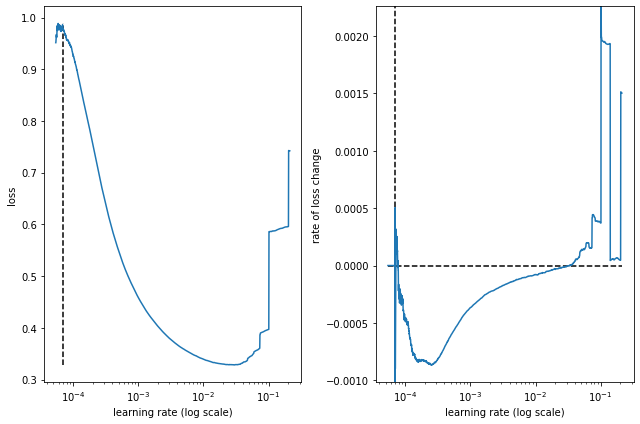

best lr: 6.9275346e-05 

Model: "conv1d_dense_12l_48s_32bs_53fm_63f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_75 (Conv1D)          (None, 8, 63)             3213      
                                                                 
 max_pooling1d_75 (MaxPoolin  (None, 4, 63)            0         
 g1D)                                                            
                                                                 
 flatten_15 (Flatten)        (None, 252)               0         
                                                                 
 dense_165 (Dense)           (None, 53)                13409     
                                                                 
 dense_166 (Dense)           (None, 26)                1404      
                                                                 
 dense_167 (Dense)           (None, 48)                1296      
   

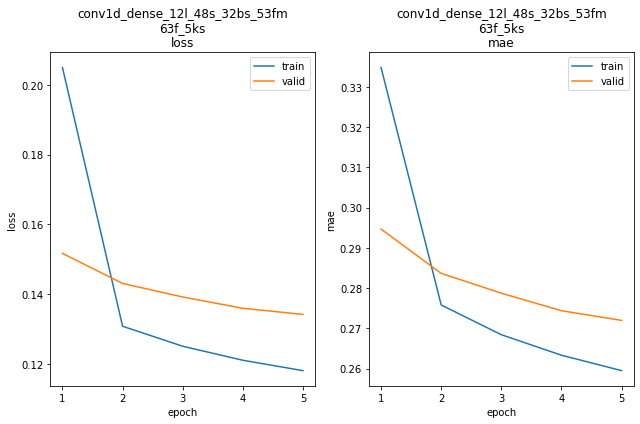

conv1d_dense_12l_48s_32bs_53fm_63f_5ks train min loss: 0.118040	mae: 0.259500	epoch: 5
conv1d_dense_12l_48s_32bs_53fm_63f_5ks valid min loss: 0.134171	mae: 0.271981	epoch: 5

conv1d_dense_12l_48s_32bs_53fm_63f_5ks
Iteration No: 16 ended. Search finished for the next optimal point.
Time taken: 222.5049
Function value obtained: 0.1342
Current minimum: 0.1261
Iteration No: 17 started. Searching for the next optimal point.
lags 48
feat_maps 46
filters 11
kern_size 6
Epoch 1/5
5879/5879 [==============================] - 39s 6ms/step - loss: 1.4289 - mae: 0.7263


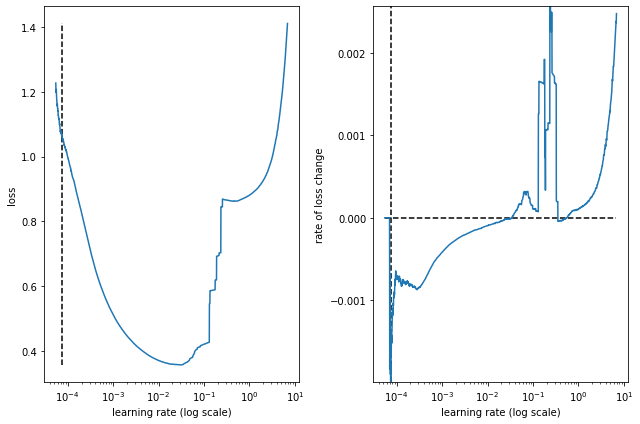

best lr: 7.3228526e-05 

Model: "conv1d_dense_48l_48s_32bs_46fm_11f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_76 (Conv1D)          (None, 43, 11)            671       
                                                                 
 max_pooling1d_76 (MaxPoolin  (None, 21, 11)           0         
 g1D)                                                            
                                                                 
 flatten_16 (Flatten)        (None, 231)               0         
                                                                 
 dense_168 (Dense)           (None, 46)                10672     
                                                                 
 dense_169 (Dense)           (None, 23)                1081      
                                                                 
 dense_170 (Dense)           (None, 48)                1152      
   

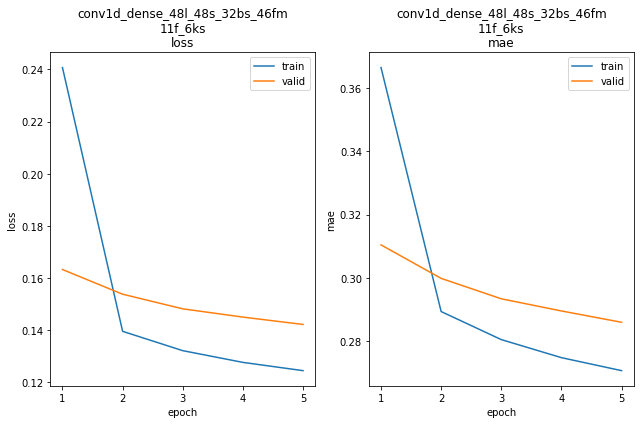

conv1d_dense_48l_48s_32bs_46fm_11f_6ks train min loss: 0.124472	mae: 0.270631	epoch: 5
conv1d_dense_48l_48s_32bs_46fm_11f_6ks valid min loss: 0.142188	mae: 0.285925	epoch: 5

conv1d_dense_48l_48s_32bs_46fm_11f_6ks
Iteration No: 17 ended. Search finished for the next optimal point.
Time taken: 240.7602
Function value obtained: 0.1422
Current minimum: 0.1261
Iteration No: 18 started. Searching for the next optimal point.
lags 45
feat_maps 63
filters 61
kern_size 3
Epoch 1/5
5879/5879 [==============================] - 39s 6ms/step - loss: 1.2531 - mae: 0.7415


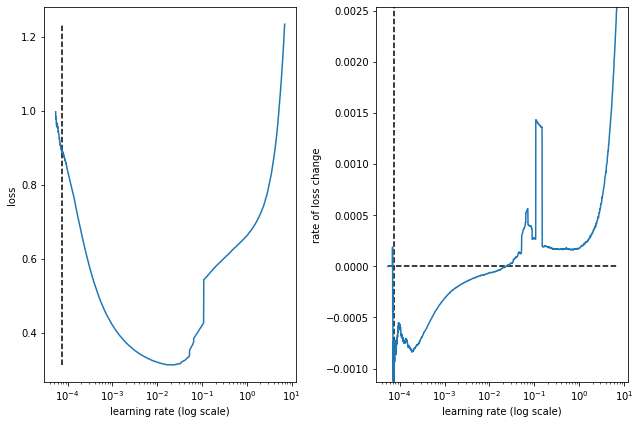

best lr: 7.346773e-05 

Model: "conv1d_dense_45l_48s_32bs_63fm_61f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_77 (Conv1D)          (None, 43, 61)            1891      
                                                                 
 max_pooling1d_77 (MaxPoolin  (None, 21, 61)           0         
 g1D)                                                            
                                                                 
 flatten_17 (Flatten)        (None, 1281)              0         
                                                                 
 dense_171 (Dense)           (None, 63)                80766     
                                                                 
 dense_172 (Dense)           (None, 31)                1984      
                                                                 
 dense_173 (Dense)           (None, 48)                1536      
    

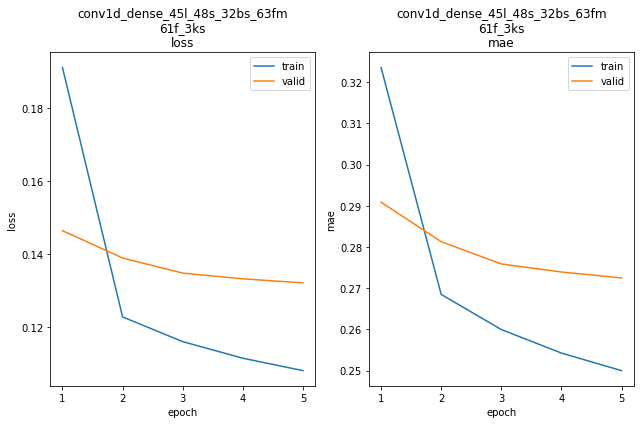

conv1d_dense_45l_48s_32bs_63fm_61f_3ks train min loss: 0.107951	mae: 0.249987	epoch: 5
conv1d_dense_45l_48s_32bs_63fm_61f_3ks valid min loss: 0.132060	mae: 0.272503	epoch: 5

conv1d_dense_45l_48s_32bs_63fm_61f_3ks
Iteration No: 18 ended. Search finished for the next optimal point.
Time taken: 240.9511
Function value obtained: 0.1321
Current minimum: 0.1261
Iteration No: 19 started. Searching for the next optimal point.
lags 13
feat_maps 64
filters 11
kern_size 3
Epoch 1/5
5880/5880 [==============================] - 41s 7ms/step - loss: 1.4109 - mae: 0.7507


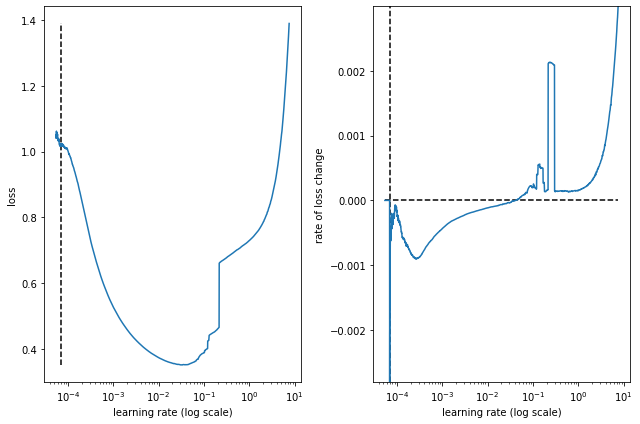

best lr: 6.9275346e-05 

Model: "conv1d_dense_13l_48s_32bs_64fm_11f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_78 (Conv1D)          (None, 11, 11)            341       
                                                                 
 max_pooling1d_78 (MaxPoolin  (None, 5, 11)            0         
 g1D)                                                            
                                                                 
 flatten_18 (Flatten)        (None, 55)                0         
                                                                 
 dense_174 (Dense)           (None, 64)                3584      
                                                                 
 dense_175 (Dense)           (None, 32)                2080      
                                                                 
 dense_176 (Dense)           (None, 48)                1584      
   

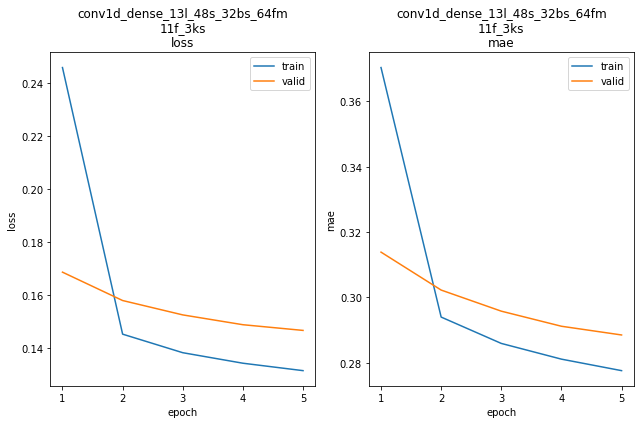

conv1d_dense_13l_48s_32bs_64fm_11f_3ks train min loss: 0.131458	mae: 0.277614	epoch: 5
conv1d_dense_13l_48s_32bs_64fm_11f_3ks valid min loss: 0.146626	mae: 0.288530	epoch: 5

conv1d_dense_13l_48s_32bs_64fm_11f_3ks
Iteration No: 19 ended. Search finished for the next optimal point.
Time taken: 246.4546
Function value obtained: 0.1466
Current minimum: 0.1261
Iteration No: 20 started. Searching for the next optimal point.
lags 48
feat_maps 47
filters 62
kern_size 3
Epoch 1/5
5879/5879 [==============================] - 41s 7ms/step - loss: 1.3350 - mae: 0.7389


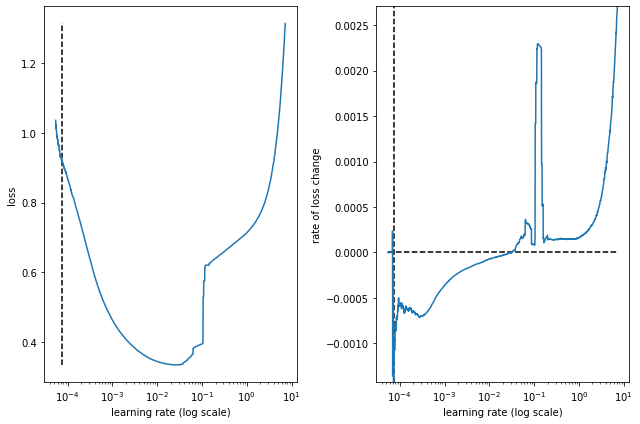

best lr: 7.3228526e-05 

Model: "conv1d_dense_48l_48s_32bs_47fm_62f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_79 (Conv1D)          (None, 46, 62)            1922      
                                                                 
 max_pooling1d_79 (MaxPoolin  (None, 23, 62)           0         
 g1D)                                                            
                                                                 
 flatten_19 (Flatten)        (None, 1426)              0         
                                                                 
 dense_177 (Dense)           (None, 47)                67069     
                                                                 
 dense_178 (Dense)           (None, 23)                1104      
                                                                 
 dense_179 (Dense)           (None, 48)                1152      
   

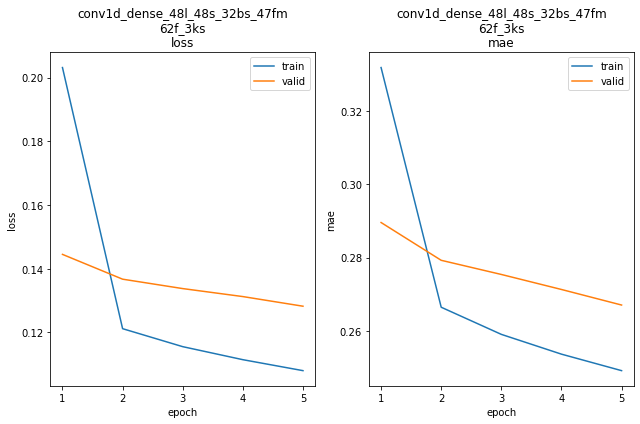

conv1d_dense_48l_48s_32bs_47fm_62f_3ks train min loss: 0.108029	mae: 0.249205	epoch: 5
conv1d_dense_48l_48s_32bs_47fm_62f_3ks valid min loss: 0.128248	mae: 0.267089	epoch: 5

conv1d_dense_48l_48s_32bs_47fm_62f_3ks
Iteration No: 20 ended. Search finished for the next optimal point.
Time taken: 238.4508
Function value obtained: 0.1282
Current minimum: 0.1261
Iteration No: 21 started. Searching for the next optimal point.
lags 19
feat_maps 64
filters 64
kern_size 7
Epoch 1/5
5880/5880 [==============================] - 40s 7ms/step - loss: 1.2759 - mae: 0.7445


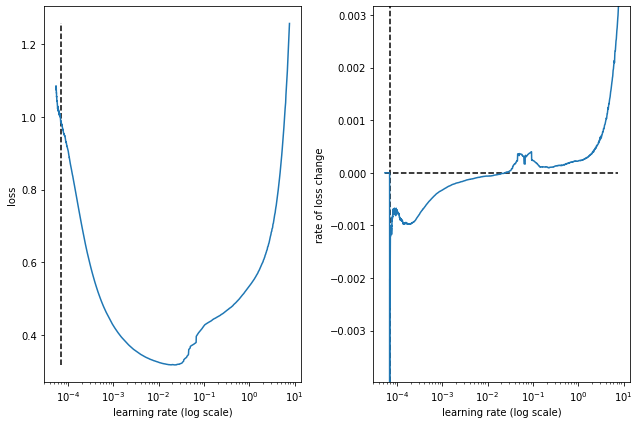

best lr: 6.9275346e-05 

Model: "conv1d_dense_19l_48s_32bs_64fm_64f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_80 (Conv1D)          (None, 13, 64)            4544      
                                                                 
 max_pooling1d_80 (MaxPoolin  (None, 6, 64)            0         
 g1D)                                                            
                                                                 
 flatten_20 (Flatten)        (None, 384)               0         
                                                                 
 dense_180 (Dense)           (None, 64)                24640     
                                                                 
 dense_181 (Dense)           (None, 32)                2080      
                                                                 
 dense_182 (Dense)           (None, 48)                1584      
   

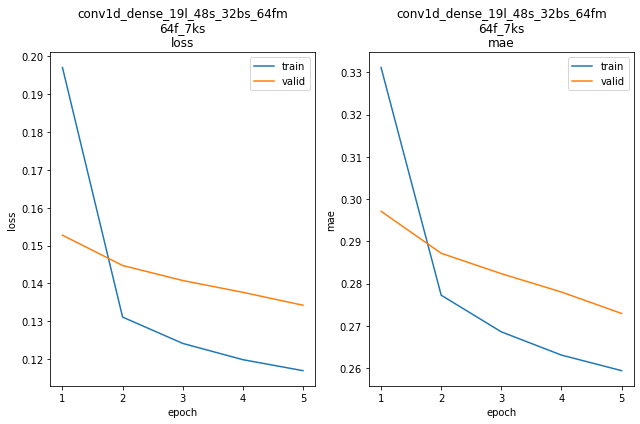

conv1d_dense_19l_48s_32bs_64fm_64f_7ks train min loss: 0.116936	mae: 0.259407	epoch: 5
conv1d_dense_19l_48s_32bs_64fm_64f_7ks valid min loss: 0.134230	mae: 0.272943	epoch: 5

conv1d_dense_19l_48s_32bs_64fm_64f_7ks
Iteration No: 21 ended. Search finished for the next optimal point.
Time taken: 234.3466
Function value obtained: 0.1342
Current minimum: 0.1261
Iteration No: 22 started. Searching for the next optimal point.
lags 22
feat_maps 64
filters 30
kern_size 5
Epoch 1/5
5880/5880 [==============================] - 40s 7ms/step - loss: 1.3257 - mae: 0.7673


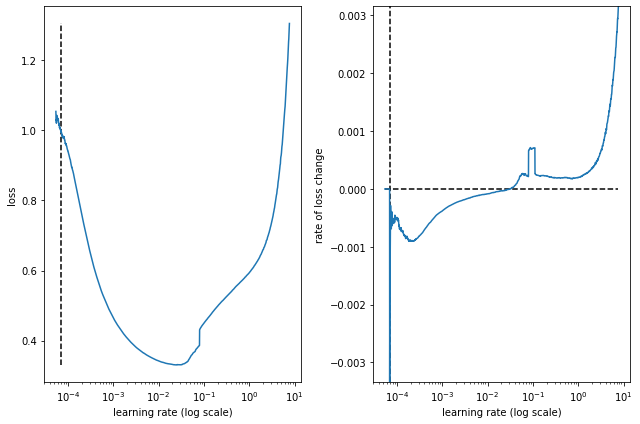

best lr: 6.9275346e-05 

Model: "conv1d_dense_22l_48s_32bs_64fm_30f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_81 (Conv1D)          (None, 18, 30)            1530      
                                                                 
 max_pooling1d_81 (MaxPoolin  (None, 9, 30)            0         
 g1D)                                                            
                                                                 
 flatten_21 (Flatten)        (None, 270)               0         
                                                                 
 dense_183 (Dense)           (None, 64)                17344     
                                                                 
 dense_184 (Dense)           (None, 32)                2080      
                                                                 
 dense_185 (Dense)           (None, 48)                1584      
   

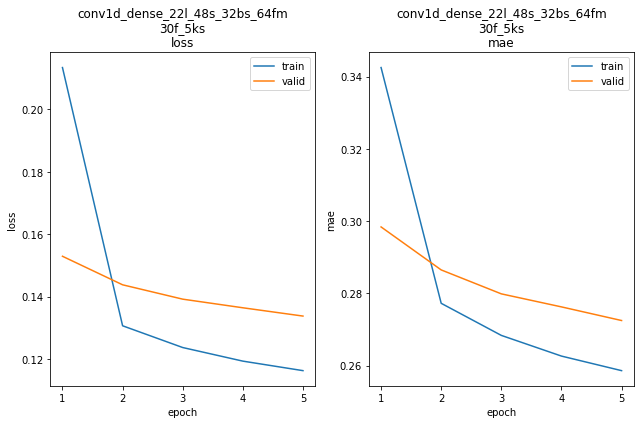

conv1d_dense_22l_48s_32bs_64fm_30f_5ks train min loss: 0.116306	mae: 0.258581	epoch: 5
conv1d_dense_22l_48s_32bs_64fm_30f_5ks valid min loss: 0.133783	mae: 0.272458	epoch: 5

conv1d_dense_22l_48s_32bs_64fm_30f_5ks
Iteration No: 22 ended. Search finished for the next optimal point.
Time taken: 280.1828
Function value obtained: 0.1338
Current minimum: 0.1261
Iteration No: 23 started. Searching for the next optimal point.
lags 34
feat_maps 59
filters 64
kern_size 4
Epoch 1/5
5880/5880 [==============================] - 37s 6ms/step - loss: 2955128576.0000 - mae: 881.6478


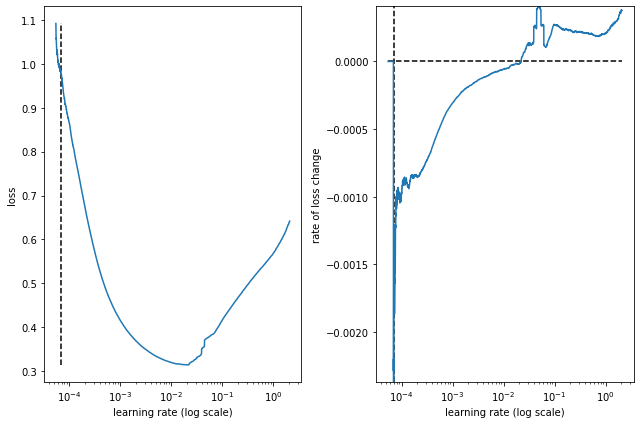

best lr: 6.972859e-05 

Model: "conv1d_dense_34l_48s_32bs_59fm_64f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_82 (Conv1D)          (None, 31, 64)            2624      
                                                                 
 max_pooling1d_82 (MaxPoolin  (None, 15, 64)           0         
 g1D)                                                            
                                                                 
 flatten_22 (Flatten)        (None, 960)               0         
                                                                 
 dense_186 (Dense)           (None, 59)                56699     
                                                                 
 dense_187 (Dense)           (None, 29)                1740      
                                                                 
 dense_188 (Dense)           (None, 48)                1440      
    

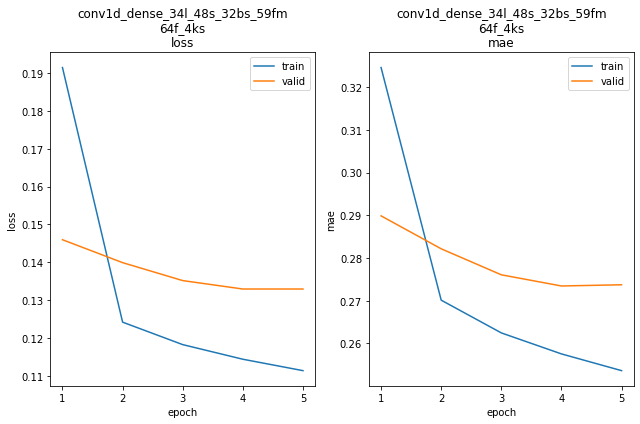

conv1d_dense_34l_48s_32bs_59fm_64f_4ks train min loss: 0.111338	mae: 0.253640	epoch: 5
conv1d_dense_34l_48s_32bs_59fm_64f_4ks valid min loss: 0.132926	mae: 0.273734	epoch: 5

conv1d_dense_34l_48s_32bs_59fm_64f_4ks
Iteration No: 23 ended. Search finished for the next optimal point.
Time taken: 233.4304
Function value obtained: 0.1329
Current minimum: 0.1261
Iteration No: 24 started. Searching for the next optimal point.
lags 22
feat_maps 33
filters 9
kern_size 6
Epoch 1/5
5880/5880 [==============================] - 30s 5ms/step - loss: 1.8121 - mae: 0.5182


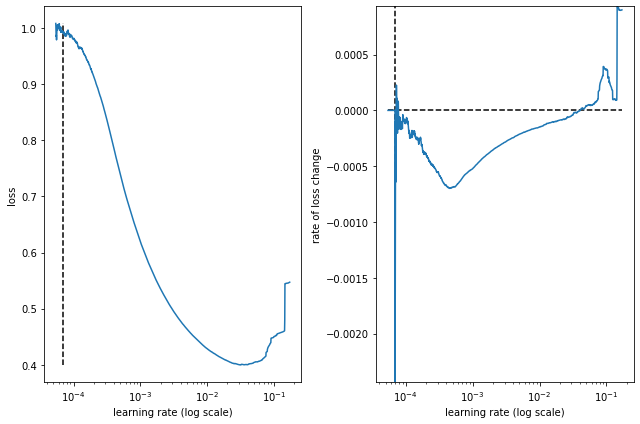

best lr: 6.9275346e-05 

Model: "conv1d_dense_22l_48s_32bs_33fm_9f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_83 (Conv1D)          (None, 17, 9)             549       
                                                                 
 max_pooling1d_83 (MaxPoolin  (None, 8, 9)             0         
 g1D)                                                            
                                                                 
 flatten_23 (Flatten)        (None, 72)                0         
                                                                 
 dense_189 (Dense)           (None, 33)                2409      
                                                                 
 dense_190 (Dense)           (None, 16)                544       
                                                                 
 dense_191 (Dense)           (None, 48)                816       
    

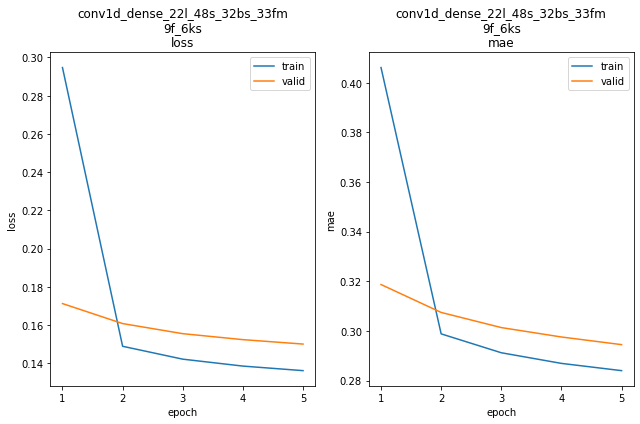

conv1d_dense_22l_48s_32bs_33fm_9f_6ks train min loss: 0.136172	mae: 0.283980	epoch: 5
conv1d_dense_22l_48s_32bs_33fm_9f_6ks valid min loss: 0.150076	mae: 0.294467	epoch: 5

conv1d_dense_22l_48s_32bs_33fm_9f_6ks
Iteration No: 24 ended. Search finished for the next optimal point.
Time taken: 230.3180
Function value obtained: 0.1501
Current minimum: 0.1261
Iteration No: 25 started. Searching for the next optimal point.
lags 38
feat_maps 64
filters 63
kern_size 6
Epoch 1/5
5879/5879 [==============================] - 28s 5ms/step - loss: 8.2390 - mae: 0.4971


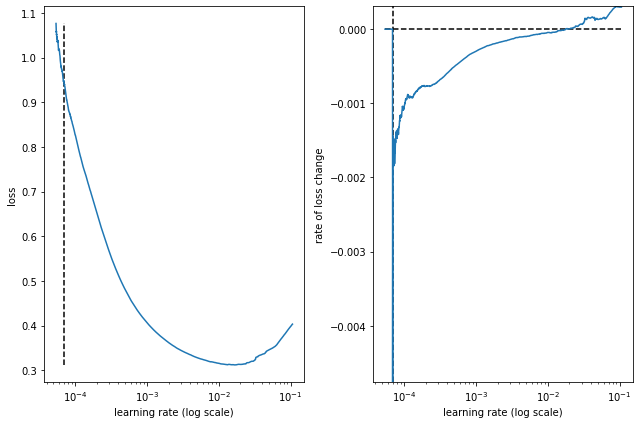

best lr: 6.927919e-05 

Model: "conv1d_dense_38l_48s_32bs_64fm_63f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_84 (Conv1D)          (None, 33, 63)            3843      
                                                                 
 max_pooling1d_84 (MaxPoolin  (None, 16, 63)           0         
 g1D)                                                            
                                                                 
 flatten_24 (Flatten)        (None, 1008)              0         
                                                                 
 dense_192 (Dense)           (None, 64)                64576     
                                                                 
 dense_193 (Dense)           (None, 32)                2080      
                                                                 
 dense_194 (Dense)           (None, 48)                1584      
    

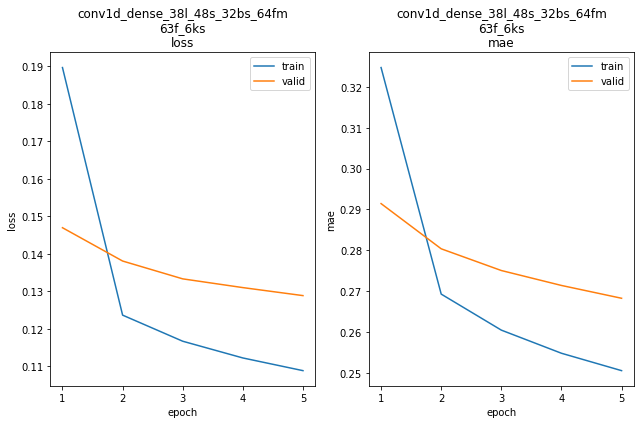

conv1d_dense_38l_48s_32bs_64fm_63f_6ks train min loss: 0.108828	mae: 0.250540	epoch: 5
conv1d_dense_38l_48s_32bs_64fm_63f_6ks valid min loss: 0.128836	mae: 0.268260	epoch: 5

conv1d_dense_38l_48s_32bs_64fm_63f_6ks
Iteration No: 25 ended. Search finished for the next optimal point.
Time taken: 246.4248
Function value obtained: 0.1288
Current minimum: 0.1261
Iteration No: 26 started. Searching for the next optimal point.
lags 46
feat_maps 32
filters 31
kern_size 3
Epoch 1/5
5879/5879 [==============================] - 44s 7ms/step - loss: 1.4143 - mae: 0.7830


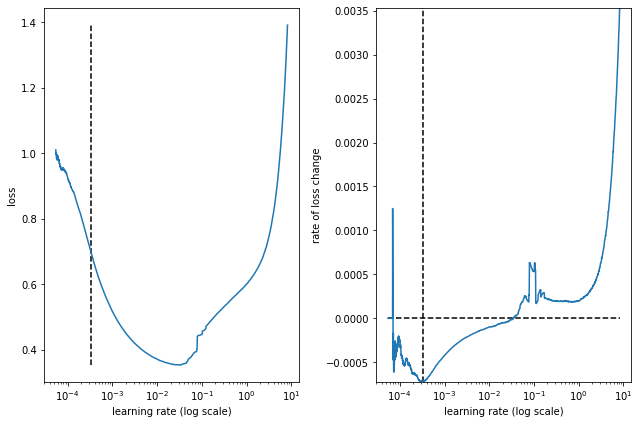

best lr: 0.00032610566 

Model: "conv1d_dense_46l_48s_32bs_32fm_31f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_85 (Conv1D)          (None, 44, 31)            961       
                                                                 
 max_pooling1d_85 (MaxPoolin  (None, 22, 31)           0         
 g1D)                                                            
                                                                 
 flatten_25 (Flatten)        (None, 682)               0         
                                                                 
 dense_195 (Dense)           (None, 32)                21856     
                                                                 
 dense_196 (Dense)           (None, 16)                528       
                                                                 
 dense_197 (Dense)           (None, 48)                816       
   

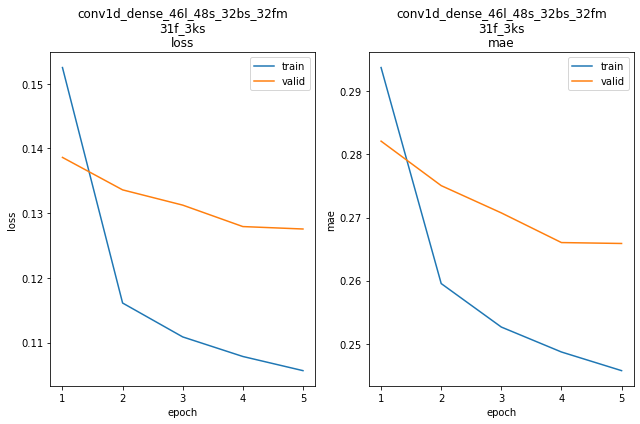

conv1d_dense_46l_48s_32bs_32fm_31f_3ks train min loss: 0.105648	mae: 0.245741	epoch: 5
conv1d_dense_46l_48s_32bs_32fm_31f_3ks valid min loss: 0.127550	mae: 0.265894	epoch: 5

conv1d_dense_46l_48s_32bs_32fm_31f_3ks
Iteration No: 26 ended. Search finished for the next optimal point.
Time taken: 281.5664
Function value obtained: 0.1276
Current minimum: 0.1261
Iteration No: 27 started. Searching for the next optimal point.
lags 28
feat_maps 64
filters 13
kern_size 7
Epoch 1/5
5880/5880 [==============================] - 44s 7ms/step - loss: 1.3009 - mae: 0.7529


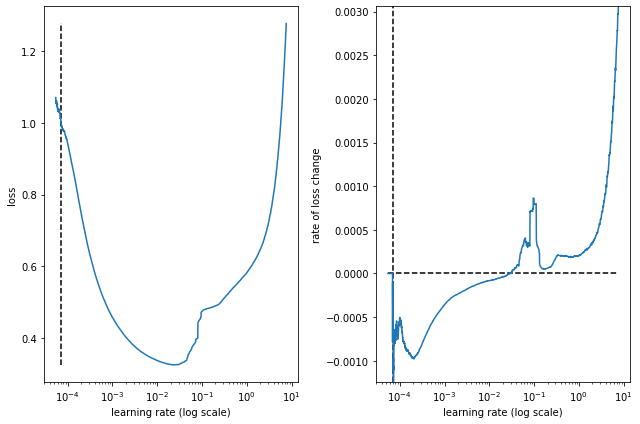

best lr: 7.2511e-05 

Model: "conv1d_dense_28l_48s_32bs_64fm_13f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_86 (Conv1D)          (None, 22, 13)            923       
                                                                 
 max_pooling1d_86 (MaxPoolin  (None, 11, 13)           0         
 g1D)                                                            
                                                                 
 flatten_26 (Flatten)        (None, 143)               0         
                                                                 
 dense_198 (Dense)           (None, 64)                9216      
                                                                 
 dense_199 (Dense)           (None, 32)                2080      
                                                                 
 dense_200 (Dense)           (None, 48)                1584      
      

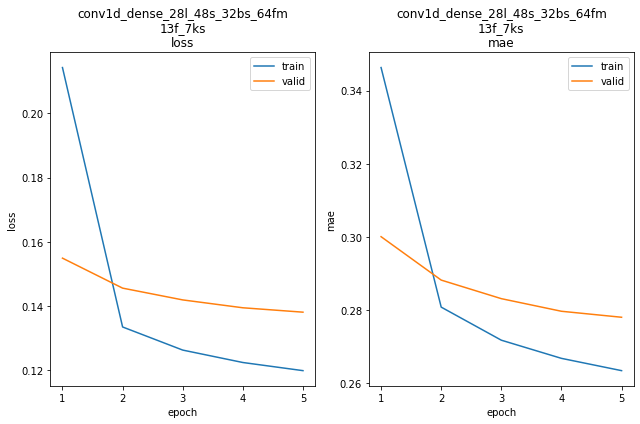

conv1d_dense_28l_48s_32bs_64fm_13f_7ks train min loss: 0.119934	mae: 0.263509	epoch: 5
conv1d_dense_28l_48s_32bs_64fm_13f_7ks valid min loss: 0.138128	mae: 0.278096	epoch: 5

conv1d_dense_28l_48s_32bs_64fm_13f_7ks
Iteration No: 27 ended. Search finished for the next optimal point.
Time taken: 276.9018
Function value obtained: 0.1381
Current minimum: 0.1261
Iteration No: 28 started. Searching for the next optimal point.
lags 48
feat_maps 62
filters 9
kern_size 3
Epoch 1/5
5879/5879 [==============================] - 44s 7ms/step - loss: 1.3441 - mae: 0.7453


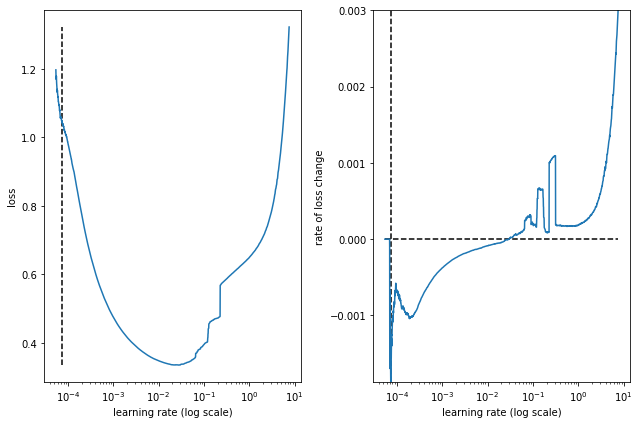

best lr: 7.3228526e-05 

Model: "conv1d_dense_48l_48s_32bs_62fm_9f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_87 (Conv1D)          (None, 46, 9)             279       
                                                                 
 max_pooling1d_87 (MaxPoolin  (None, 23, 9)            0         
 g1D)                                                            
                                                                 
 flatten_27 (Flatten)        (None, 207)               0         
                                                                 
 dense_201 (Dense)           (None, 62)                12896     
                                                                 
 dense_202 (Dense)           (None, 31)                1953      
                                                                 
 dense_203 (Dense)           (None, 48)                1536      
    

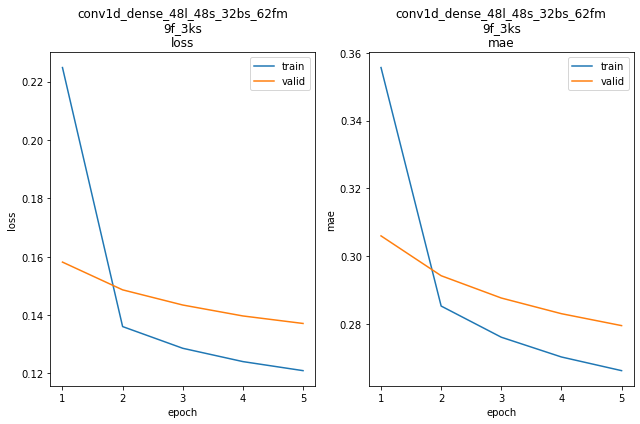

conv1d_dense_48l_48s_32bs_62fm_9f_3ks train min loss: 0.120942	mae: 0.266247	epoch: 5
conv1d_dense_48l_48s_32bs_62fm_9f_3ks valid min loss: 0.137117	mae: 0.279529	epoch: 5

conv1d_dense_48l_48s_32bs_62fm_9f_3ks
Iteration No: 28 ended. Search finished for the next optimal point.
Time taken: 230.3724
Function value obtained: 0.1371
Current minimum: 0.1261
Iteration No: 29 started. Searching for the next optimal point.
lags 40
feat_maps 33
filters 62
kern_size 3
Epoch 1/5
5879/5879 [==============================] - 31s 5ms/step - loss: 24.9671 - mae: 0.6071


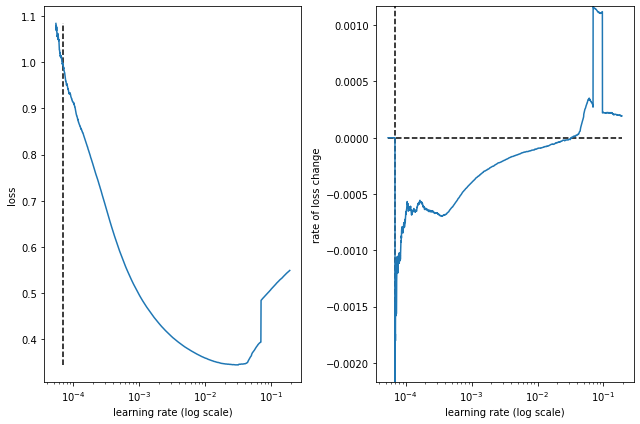

best lr: 6.927919e-05 

Model: "conv1d_dense_40l_48s_32bs_33fm_62f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_88 (Conv1D)          (None, 38, 62)            1922      
                                                                 
 max_pooling1d_88 (MaxPoolin  (None, 19, 62)           0         
 g1D)                                                            
                                                                 
 flatten_28 (Flatten)        (None, 1178)              0         
                                                                 
 dense_204 (Dense)           (None, 33)                38907     
                                                                 
 dense_205 (Dense)           (None, 16)                544       
                                                                 
 dense_206 (Dense)           (None, 48)                816       
    

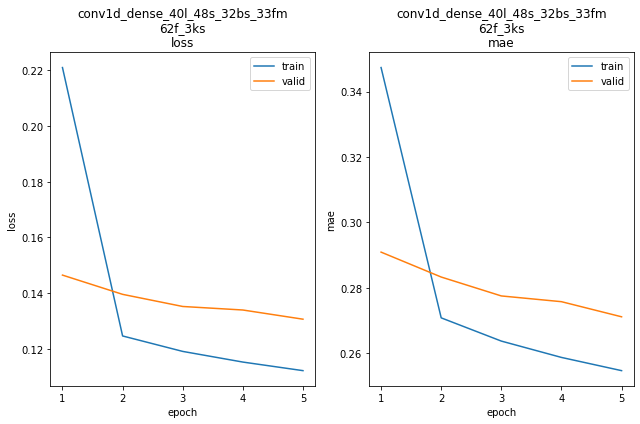

conv1d_dense_40l_48s_32bs_33fm_62f_3ks train min loss: 0.112142	mae: 0.254679	epoch: 5
conv1d_dense_40l_48s_32bs_33fm_62f_3ks valid min loss: 0.130623	mae: 0.271139	epoch: 5

conv1d_dense_40l_48s_32bs_33fm_62f_3ks
Iteration No: 29 ended. Search finished for the next optimal point.
Time taken: 240.8152
Function value obtained: 0.1306
Current minimum: 0.1261
Iteration No: 30 started. Searching for the next optimal point.
lags 27
feat_maps 49
filters 63
kern_size 7
Epoch 1/5
5880/5880 [==============================] - 45s 7ms/step - loss: 1.3710 - mae: 0.7674


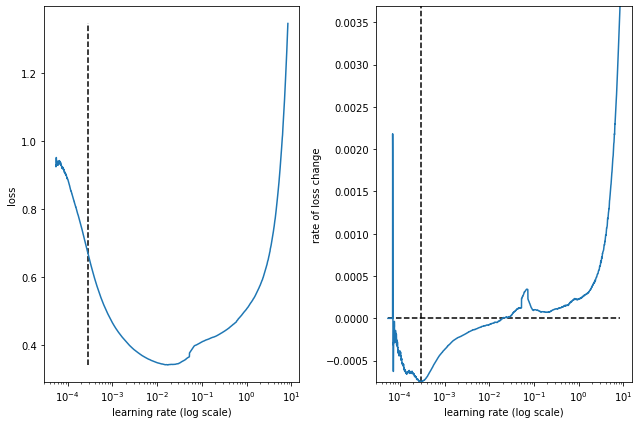

best lr: 0.00029179183 

Model: "conv1d_dense_27l_48s_32bs_49fm_63f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_89 (Conv1D)          (None, 21, 63)            4473      
                                                                 
 max_pooling1d_89 (MaxPoolin  (None, 10, 63)           0         
 g1D)                                                            
                                                                 
 flatten_29 (Flatten)        (None, 630)               0         
                                                                 
 dense_207 (Dense)           (None, 49)                30919     
                                                                 
 dense_208 (Dense)           (None, 24)                1200      
                                                                 
 dense_209 (Dense)           (None, 48)                1200      
   

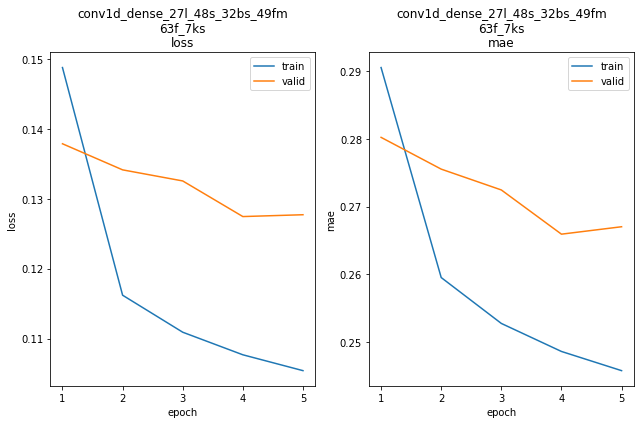

conv1d_dense_27l_48s_32bs_49fm_63f_7ks train min loss: 0.105405	mae: 0.245815	epoch: 5
conv1d_dense_27l_48s_32bs_49fm_63f_7ks valid min loss: 0.127461	mae: 0.265937	epoch: 4

conv1d_dense_27l_48s_32bs_49fm_63f_7ks
Iteration No: 30 ended. Search finished for the next optimal point.
Time taken: 279.1431
Function value obtained: 0.1275
Current minimum: 0.1261
Iteration No: 31 started. Searching for the next optimal point.
lags 48
feat_maps 63
filters 58
kern_size 5
Epoch 1/5
5879/5879 [==============================] - 32s 5ms/step - loss: 1.3065 - mae: 0.4688


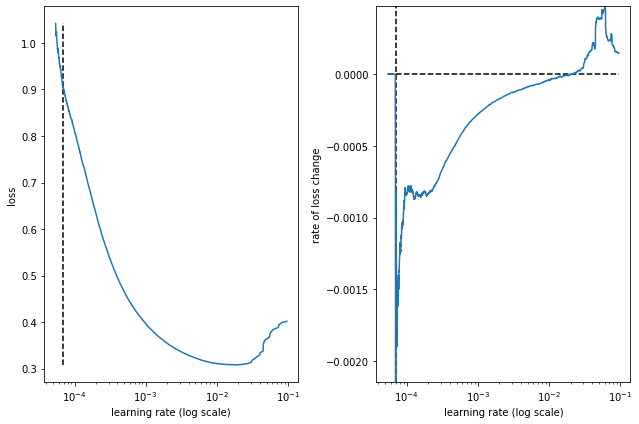

best lr: 6.973253e-05 

Model: "conv1d_dense_48l_48s_32bs_63fm_58f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_90 (Conv1D)          (None, 44, 58)            2958      
                                                                 
 max_pooling1d_90 (MaxPoolin  (None, 22, 58)           0         
 g1D)                                                            
                                                                 
 flatten_30 (Flatten)        (None, 1276)              0         
                                                                 
 dense_210 (Dense)           (None, 63)                80451     
                                                                 
 dense_211 (Dense)           (None, 31)                1984      
                                                                 
 dense_212 (Dense)           (None, 48)                1536      
    

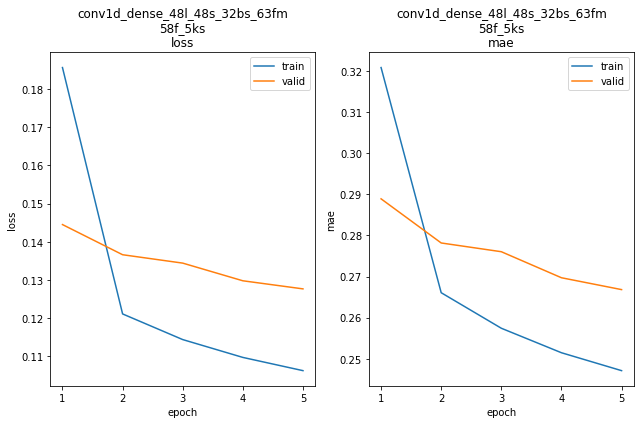

conv1d_dense_48l_48s_32bs_63fm_58f_5ks train min loss: 0.106277	mae: 0.247105	epoch: 5
conv1d_dense_48l_48s_32bs_63fm_58f_5ks valid min loss: 0.127673	mae: 0.266814	epoch: 5

conv1d_dense_48l_48s_32bs_63fm_58f_5ks
Iteration No: 31 ended. Search finished for the next optimal point.
Time taken: 222.9691
Function value obtained: 0.1277
Current minimum: 0.1261
Iteration No: 32 started. Searching for the next optimal point.
lags 31
feat_maps 63
filters 62
kern_size 7
Epoch 1/5
5880/5880 [==============================] - 46s 8ms/step - loss: 1.2222 - mae: 0.7426


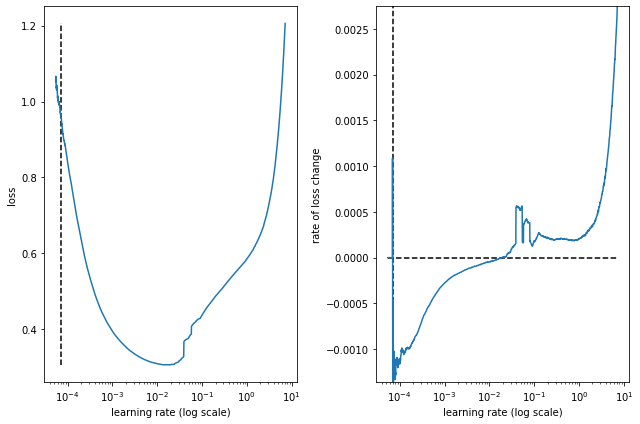

best lr: 7.2511e-05 

Model: "conv1d_dense_31l_48s_32bs_63fm_62f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_91 (Conv1D)          (None, 25, 62)            4402      
                                                                 
 max_pooling1d_91 (MaxPoolin  (None, 12, 62)           0         
 g1D)                                                            
                                                                 
 flatten_31 (Flatten)        (None, 744)               0         
                                                                 
 dense_213 (Dense)           (None, 63)                46935     
                                                                 
 dense_214 (Dense)           (None, 31)                1984      
                                                                 
 dense_215 (Dense)           (None, 48)                1536      
      

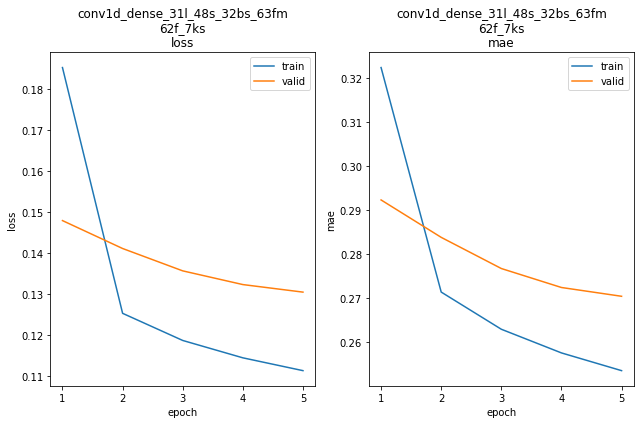

conv1d_dense_31l_48s_32bs_63fm_62f_7ks train min loss: 0.111267	mae: 0.253446	epoch: 5
conv1d_dense_31l_48s_32bs_63fm_62f_7ks valid min loss: 0.130455	mae: 0.270344	epoch: 5

conv1d_dense_31l_48s_32bs_63fm_62f_7ks
Iteration No: 32 ended. Search finished for the next optimal point.
Time taken: 276.8901
Function value obtained: 0.1305
Current minimum: 0.1261
Iteration No: 33 started. Searching for the next optimal point.
lags 23
feat_maps 64
filters 64
kern_size 3
Epoch 1/5
5880/5880 [==============================] - 38s 6ms/step - loss: 293646.2812 - mae: 8.5503


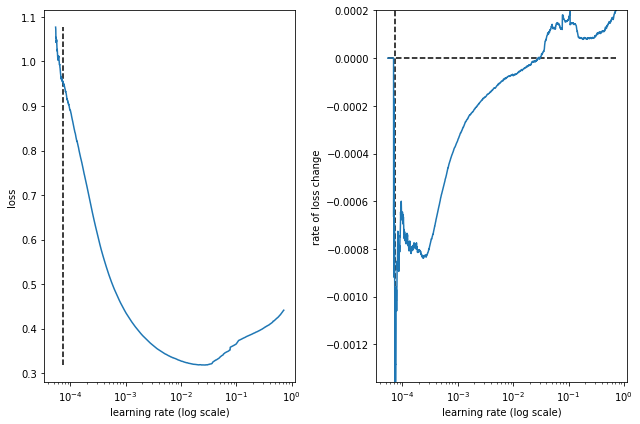

best lr: 7.274782e-05 

Model: "conv1d_dense_23l_48s_32bs_64fm_64f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_92 (Conv1D)          (None, 21, 64)            1984      
                                                                 
 max_pooling1d_92 (MaxPoolin  (None, 10, 64)           0         
 g1D)                                                            
                                                                 
 flatten_32 (Flatten)        (None, 640)               0         
                                                                 
 dense_216 (Dense)           (None, 64)                41024     
                                                                 
 dense_217 (Dense)           (None, 32)                2080      
                                                                 
 dense_218 (Dense)           (None, 48)                1584      
    

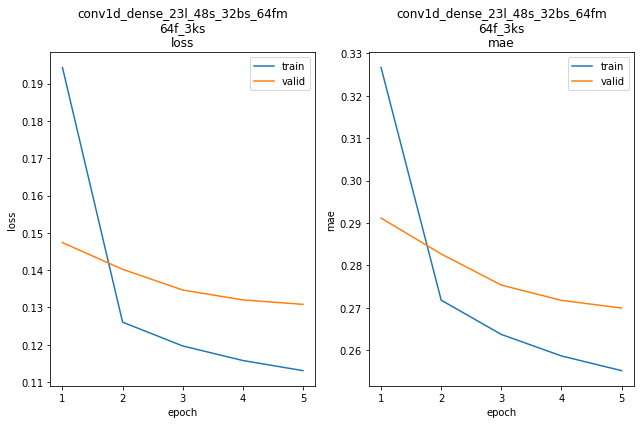

conv1d_dense_23l_48s_32bs_64fm_64f_3ks train min loss: 0.113070	mae: 0.255201	epoch: 5
conv1d_dense_23l_48s_32bs_64fm_64f_3ks valid min loss: 0.130837	mae: 0.269966	epoch: 5

conv1d_dense_23l_48s_32bs_64fm_64f_3ks
Iteration No: 33 ended. Search finished for the next optimal point.
Time taken: 247.1512
Function value obtained: 0.1308
Current minimum: 0.1261
Iteration No: 34 started. Searching for the next optimal point.
lags 14
feat_maps 34
filters 62
kern_size 3
Epoch 1/5
5880/5880 [==============================] - 48s 8ms/step - loss: 1.5192 - mae: 0.7559


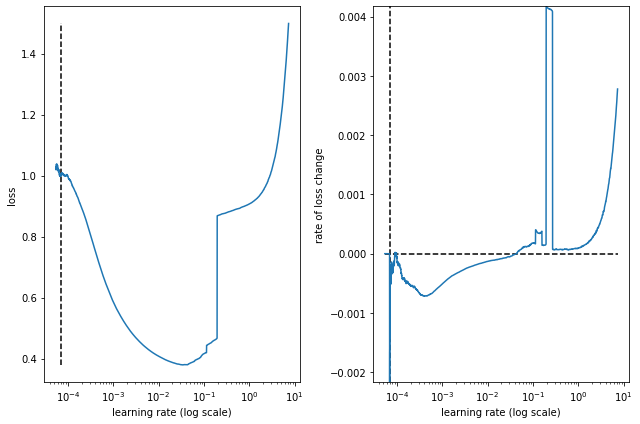

best lr: 6.9275346e-05 

Model: "conv1d_dense_14l_48s_32bs_34fm_62f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_93 (Conv1D)          (None, 12, 62)            1922      
                                                                 
 max_pooling1d_93 (MaxPoolin  (None, 6, 62)            0         
 g1D)                                                            
                                                                 
 flatten_33 (Flatten)        (None, 372)               0         
                                                                 
 dense_219 (Dense)           (None, 34)                12682     
                                                                 
 dense_220 (Dense)           (None, 17)                595       
                                                                 
 dense_221 (Dense)           (None, 48)                864       
   

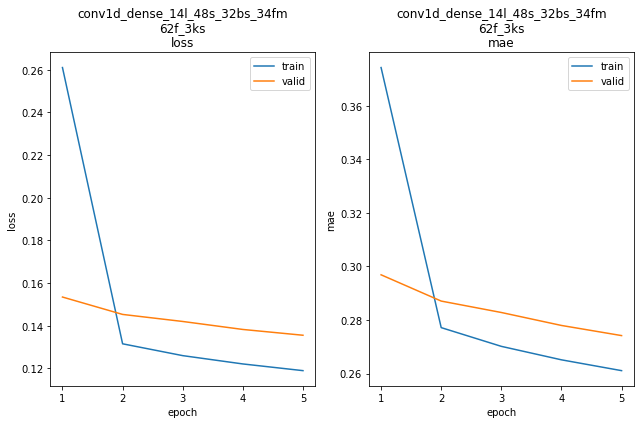

conv1d_dense_14l_48s_32bs_34fm_62f_3ks train min loss: 0.118944	mae: 0.261083	epoch: 5
conv1d_dense_14l_48s_32bs_34fm_62f_3ks valid min loss: 0.135542	mae: 0.274177	epoch: 5

conv1d_dense_14l_48s_32bs_34fm_62f_3ks
Iteration No: 34 ended. Search finished for the next optimal point.
Time taken: 277.3263
Function value obtained: 0.1355
Current minimum: 0.1261
Iteration No: 35 started. Searching for the next optimal point.
lags 33
feat_maps 33
filters 62
kern_size 7
Epoch 1/5
5880/5880 [==============================] - 51s 9ms/step - loss: 1.4293 - mae: 0.7776


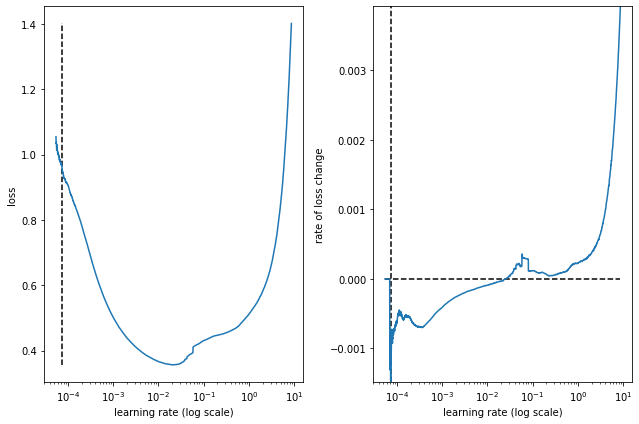

best lr: 7.274782e-05 

Model: "conv1d_dense_33l_48s_32bs_33fm_62f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_94 (Conv1D)          (None, 27, 62)            4402      
                                                                 
 max_pooling1d_94 (MaxPoolin  (None, 13, 62)           0         
 g1D)                                                            
                                                                 
 flatten_34 (Flatten)        (None, 806)               0         
                                                                 
 dense_222 (Dense)           (None, 33)                26631     
                                                                 
 dense_223 (Dense)           (None, 16)                544       
                                                                 
 dense_224 (Dense)           (None, 48)                816       
    

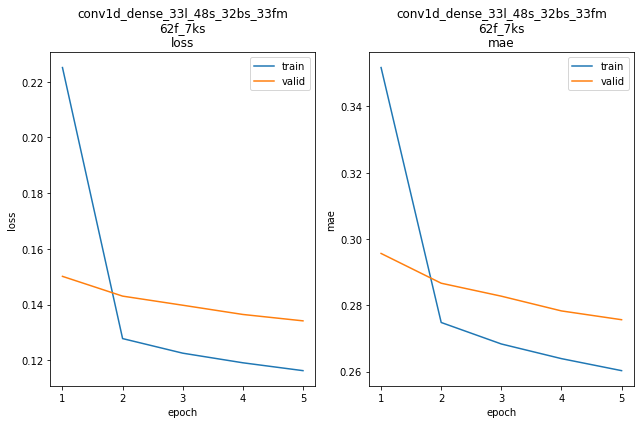

conv1d_dense_33l_48s_32bs_33fm_62f_7ks train min loss: 0.116268	mae: 0.260280	epoch: 5
conv1d_dense_33l_48s_32bs_33fm_62f_7ks valid min loss: 0.134151	mae: 0.275648	epoch: 5

conv1d_dense_33l_48s_32bs_33fm_62f_7ks
Iteration No: 35 ended. Search finished for the next optimal point.
Time taken: 247.9803
Function value obtained: 0.1342
Current minimum: 0.1261
Iteration No: 36 started. Searching for the next optimal point.
lags 48
feat_maps 33
filters 44
kern_size 6
Epoch 1/5
5879/5879 [==============================] - 52s 9ms/step - loss: 1.3973 - mae: 0.7681


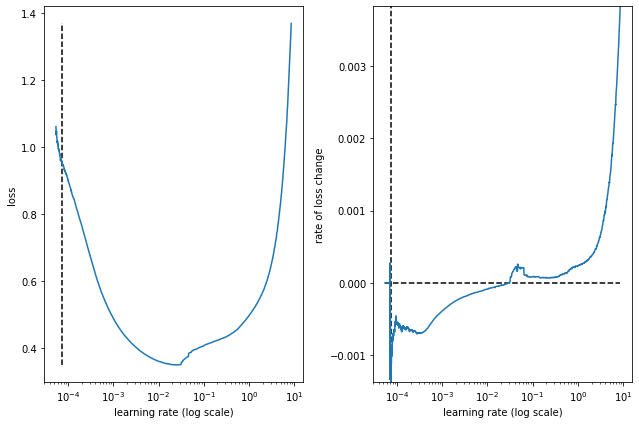

best lr: 7.3228526e-05 

Model: "conv1d_dense_48l_48s_32bs_33fm_44f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_95 (Conv1D)          (None, 43, 44)            2684      
                                                                 
 max_pooling1d_95 (MaxPoolin  (None, 21, 44)           0         
 g1D)                                                            
                                                                 
 flatten_35 (Flatten)        (None, 924)               0         
                                                                 
 dense_225 (Dense)           (None, 33)                30525     
                                                                 
 dense_226 (Dense)           (None, 16)                544       
                                                                 
 dense_227 (Dense)           (None, 48)                816       
   

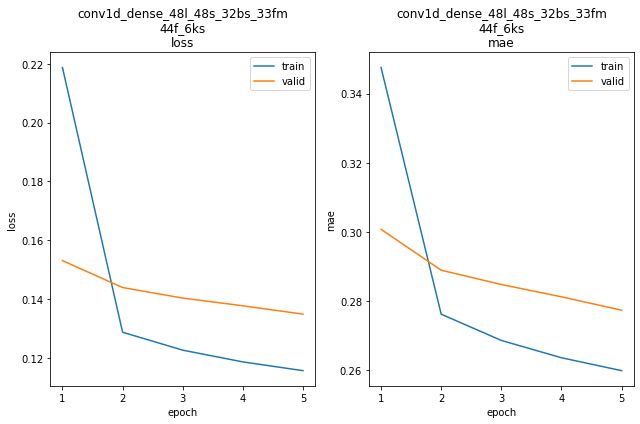

conv1d_dense_48l_48s_32bs_33fm_44f_6ks train min loss: 0.115622	mae: 0.259839	epoch: 5
conv1d_dense_48l_48s_32bs_33fm_44f_6ks valid min loss: 0.134856	mae: 0.277337	epoch: 5

conv1d_dense_48l_48s_32bs_33fm_44f_6ks
Iteration No: 36 ended. Search finished for the next optimal point.
Time taken: 280.9019
Function value obtained: 0.1349
Current minimum: 0.1261
Iteration No: 37 started. Searching for the next optimal point.
lags 34
feat_maps 63
filters 13
kern_size 3
Epoch 1/5
5880/5880 [==============================] - 39s 6ms/step - loss: 2.6152 - mae: 0.5066


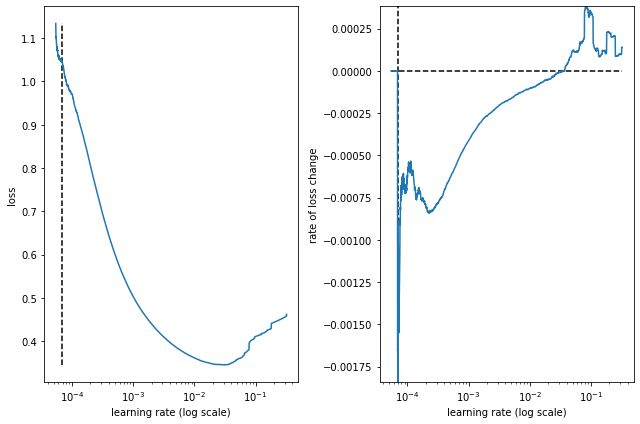

best lr: 6.972859e-05 

Model: "conv1d_dense_34l_48s_32bs_63fm_13f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_96 (Conv1D)          (None, 32, 13)            403       
                                                                 
 max_pooling1d_96 (MaxPoolin  (None, 16, 13)           0         
 g1D)                                                            
                                                                 
 flatten_36 (Flatten)        (None, 208)               0         
                                                                 
 dense_228 (Dense)           (None, 63)                13167     
                                                                 
 dense_229 (Dense)           (None, 31)                1984      
                                                                 
 dense_230 (Dense)           (None, 48)                1536      
    

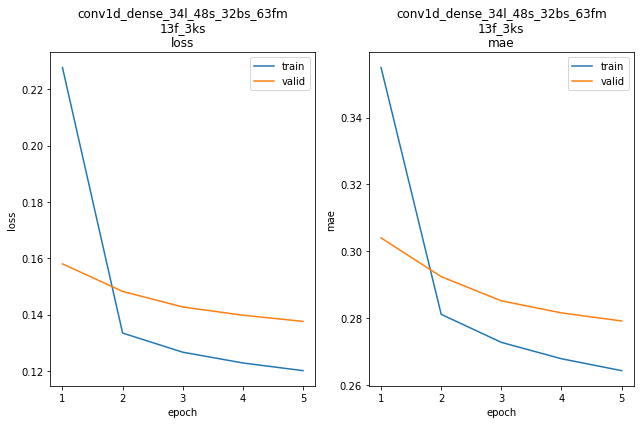

conv1d_dense_34l_48s_32bs_63fm_13f_3ks train min loss: 0.120125	mae: 0.264410	epoch: 5
conv1d_dense_34l_48s_32bs_63fm_13f_3ks valid min loss: 0.137619	mae: 0.279250	epoch: 5

conv1d_dense_34l_48s_32bs_63fm_13f_3ks
Iteration No: 37 ended. Search finished for the next optimal point.
Time taken: 244.2836
Function value obtained: 0.1376
Current minimum: 0.1261
Iteration No: 38 started. Searching for the next optimal point.
lags 14
feat_maps 33
filters 63
kern_size 7
Epoch 1/5
5880/5880 [==============================] - 42s 7ms/step - loss: 166378.0000 - mae: 7.1772


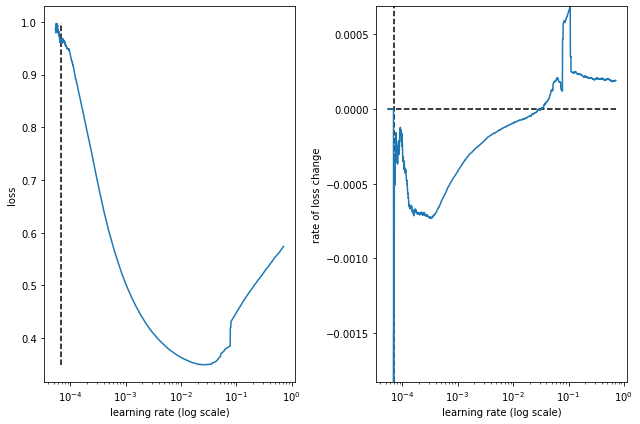

best lr: 6.9275346e-05 

Model: "conv1d_dense_14l_48s_32bs_33fm_63f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_97 (Conv1D)          (None, 8, 63)             4473      
                                                                 
 max_pooling1d_97 (MaxPoolin  (None, 4, 63)            0         
 g1D)                                                            
                                                                 
 flatten_37 (Flatten)        (None, 252)               0         
                                                                 
 dense_231 (Dense)           (None, 33)                8349      
                                                                 
 dense_232 (Dense)           (None, 16)                544       
                                                                 
 dense_233 (Dense)           (None, 48)                816       
   

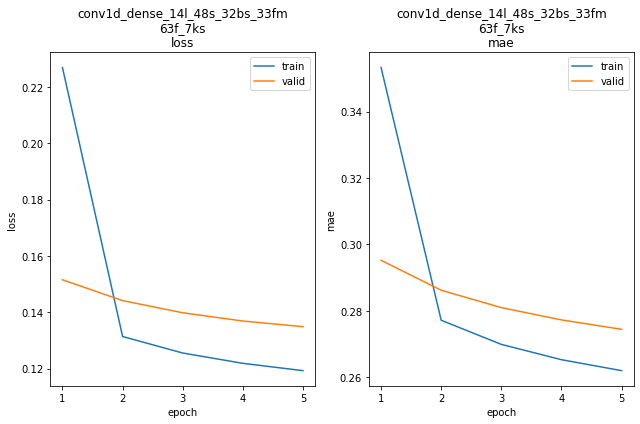

conv1d_dense_14l_48s_32bs_33fm_63f_7ks train min loss: 0.119305	mae: 0.261976	epoch: 5
conv1d_dense_14l_48s_32bs_33fm_63f_7ks valid min loss: 0.134921	mae: 0.274426	epoch: 5

conv1d_dense_14l_48s_32bs_33fm_63f_7ks
Iteration No: 38 ended. Search finished for the next optimal point.
Time taken: 238.8217
Function value obtained: 0.1349
Current minimum: 0.1261
Iteration No: 39 started. Searching for the next optimal point.
lags 48
feat_maps 33
filters 57
kern_size 3
Epoch 1/5
5879/5879 [==============================] - 43s 7ms/step - loss: 3109820672.0000 - mae: 896.7899


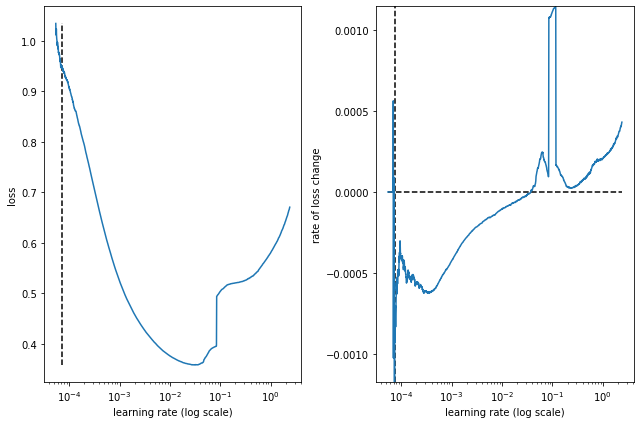

best lr: 7.3228526e-05 

Model: "conv1d_dense_48l_48s_32bs_33fm_57f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_98 (Conv1D)          (None, 46, 57)            1767      
                                                                 
 max_pooling1d_98 (MaxPoolin  (None, 23, 57)           0         
 g1D)                                                            
                                                                 
 flatten_38 (Flatten)        (None, 1311)              0         
                                                                 
 dense_234 (Dense)           (None, 33)                43296     
                                                                 
 dense_235 (Dense)           (None, 16)                544       
                                                                 
 dense_236 (Dense)           (None, 48)                816       
   

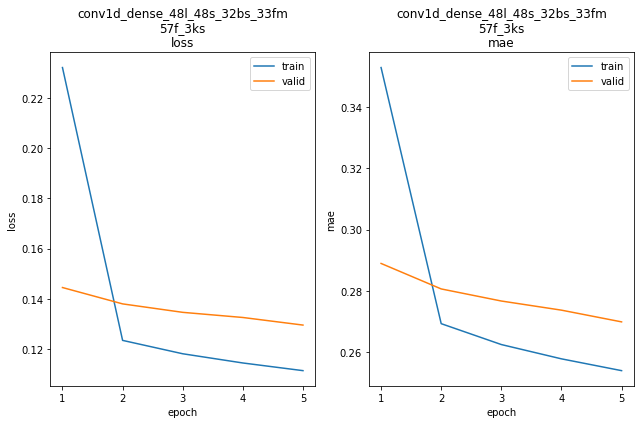

conv1d_dense_48l_48s_32bs_33fm_57f_3ks train min loss: 0.111439	mae: 0.254057	epoch: 5
conv1d_dense_48l_48s_32bs_33fm_57f_3ks valid min loss: 0.129567	mae: 0.269937	epoch: 5

conv1d_dense_48l_48s_32bs_33fm_57f_3ks
Iteration No: 39 ended. Search finished for the next optimal point.
Time taken: 284.5787
Function value obtained: 0.1296
Current minimum: 0.1261
Iteration No: 40 started. Searching for the next optimal point.
lags 21
feat_maps 51
filters 62
kern_size 5
Epoch 1/5
5880/5880 [==============================] - 35s 6ms/step - loss: 997.7762 - mae: 1.0525


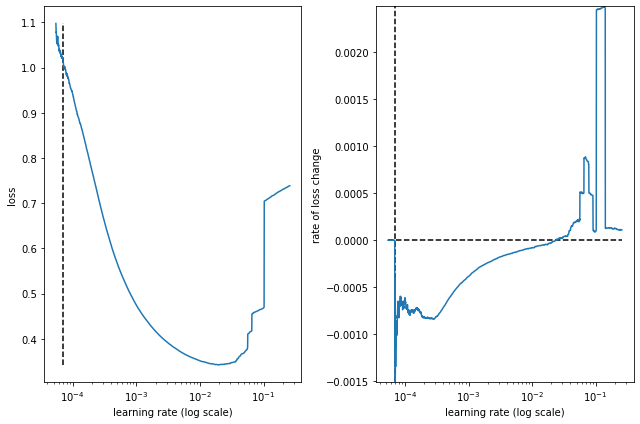

best lr: 7.041402e-05 

Model: "conv1d_dense_21l_48s_32bs_51fm_62f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_99 (Conv1D)          (None, 17, 62)            3162      
                                                                 
 max_pooling1d_99 (MaxPoolin  (None, 8, 62)            0         
 g1D)                                                            
                                                                 
 flatten_39 (Flatten)        (None, 496)               0         
                                                                 
 dense_237 (Dense)           (None, 51)                25347     
                                                                 
 dense_238 (Dense)           (None, 25)                1300      
                                                                 
 dense_239 (Dense)           (None, 48)                1248      
    

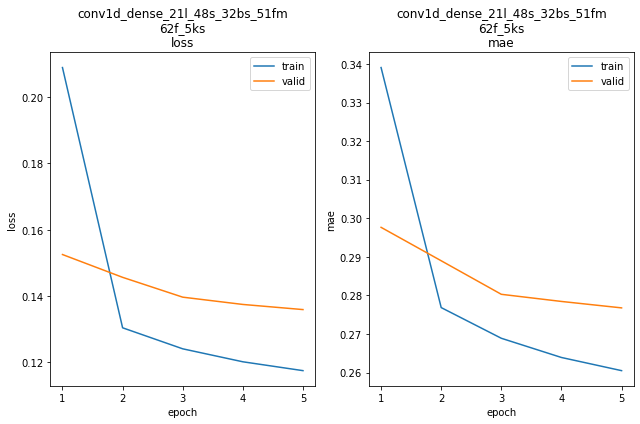

conv1d_dense_21l_48s_32bs_51fm_62f_5ks train min loss: 0.117475	mae: 0.260493	epoch: 5
conv1d_dense_21l_48s_32bs_51fm_62f_5ks valid min loss: 0.135900	mae: 0.276764	epoch: 5

conv1d_dense_21l_48s_32bs_51fm_62f_5ks
Iteration No: 40 ended. Search finished for the next optimal point.
Time taken: 236.0979
Function value obtained: 0.1359
Current minimum: 0.1261
Iteration No: 41 started. Searching for the next optimal point.
lags 43
feat_maps 32
filters 9
kern_size 3
Epoch 1/5
5879/5879 [==============================] - 37s 6ms/step - loss: 2321.2244 - mae: 1.3421


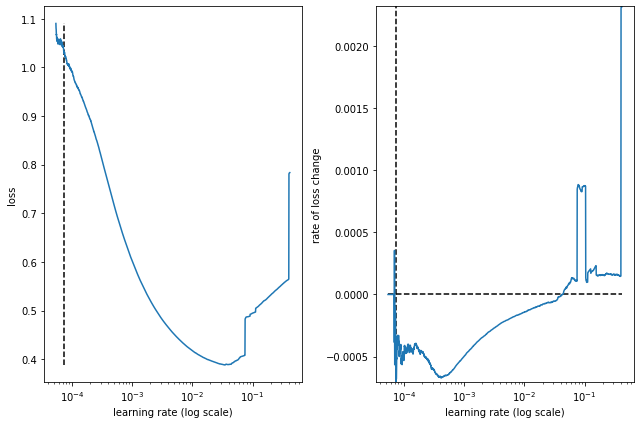

best lr: 7.394848e-05 

Model: "conv1d_dense_43l_48s_32bs_32fm_9f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_100 (Conv1D)         (None, 41, 9)             279       
                                                                 
 max_pooling1d_100 (MaxPooli  (None, 20, 9)            0         
 ng1D)                                                           
                                                                 
 flatten_40 (Flatten)        (None, 180)               0         
                                                                 
 dense_240 (Dense)           (None, 32)                5792      
                                                                 
 dense_241 (Dense)           (None, 16)                528       
                                                                 
 dense_242 (Dense)           (None, 48)                816       
     

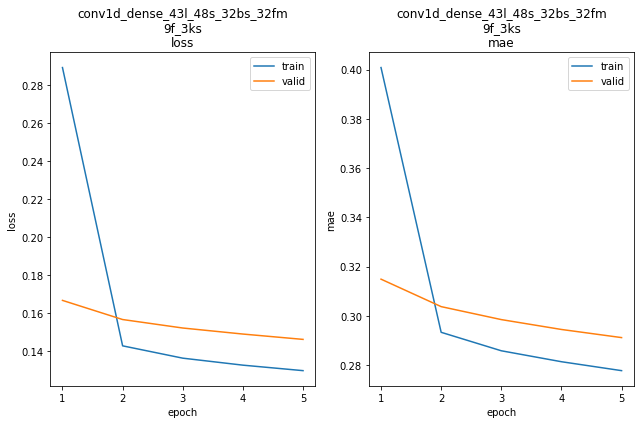

conv1d_dense_43l_48s_32bs_32fm_9f_3ks train min loss: 0.129685	mae: 0.277717	epoch: 5
conv1d_dense_43l_48s_32bs_32fm_9f_3ks valid min loss: 0.146136	mae: 0.291142	epoch: 5

conv1d_dense_43l_48s_32bs_32fm_9f_3ks
Iteration No: 41 ended. Search finished for the next optimal point.
Time taken: 235.8394
Function value obtained: 0.1461
Current minimum: 0.1261
Iteration No: 42 started. Searching for the next optimal point.
lags 26
feat_maps 64
filters 56
kern_size 5
Epoch 1/5
5880/5880 [==============================] - 48s 8ms/step - loss: 1.2315 - mae: 0.7395


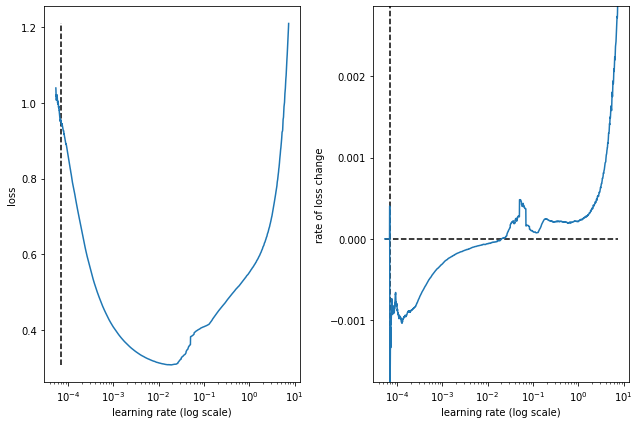

best lr: 7.110619e-05 

Model: "conv1d_dense_26l_48s_32bs_64fm_56f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_101 (Conv1D)         (None, 22, 56)            2856      
                                                                 
 max_pooling1d_101 (MaxPooli  (None, 11, 56)           0         
 ng1D)                                                           
                                                                 
 flatten_41 (Flatten)        (None, 616)               0         
                                                                 
 dense_243 (Dense)           (None, 64)                39488     
                                                                 
 dense_244 (Dense)           (None, 32)                2080      
                                                                 
 dense_245 (Dense)           (None, 48)                1584      
    

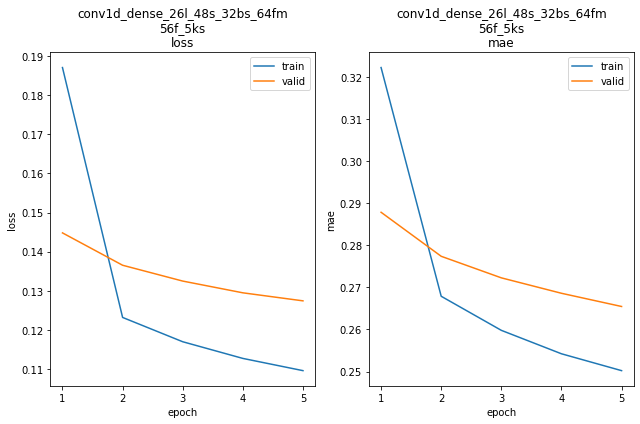

conv1d_dense_26l_48s_32bs_64fm_56f_5ks train min loss: 0.109554	mae: 0.250211	epoch: 5
conv1d_dense_26l_48s_32bs_64fm_56f_5ks valid min loss: 0.127408	mae: 0.265452	epoch: 5

conv1d_dense_26l_48s_32bs_64fm_56f_5ks
Iteration No: 42 ended. Search finished for the next optimal point.
Time taken: 244.8776
Function value obtained: 0.1274
Current minimum: 0.1261
Iteration No: 43 started. Searching for the next optimal point.
lags 45
feat_maps 64
filters 34
kern_size 5
Epoch 1/5
5879/5879 [==============================] - 48s 8ms/step - loss: 1.2340 - mae: 0.7501


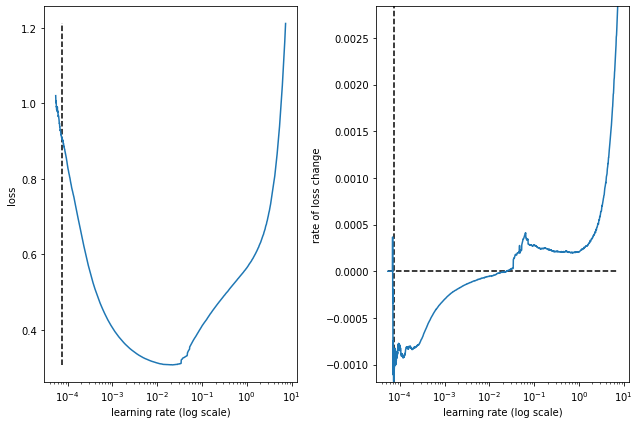

best lr: 7.346773e-05 

Model: "conv1d_dense_45l_48s_32bs_64fm_34f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_102 (Conv1D)         (None, 41, 34)            1734      
                                                                 
 max_pooling1d_102 (MaxPooli  (None, 20, 34)           0         
 ng1D)                                                           
                                                                 
 flatten_42 (Flatten)        (None, 680)               0         
                                                                 
 dense_246 (Dense)           (None, 64)                43584     
                                                                 
 dense_247 (Dense)           (None, 32)                2080      
                                                                 
 dense_248 (Dense)           (None, 48)                1584      
    

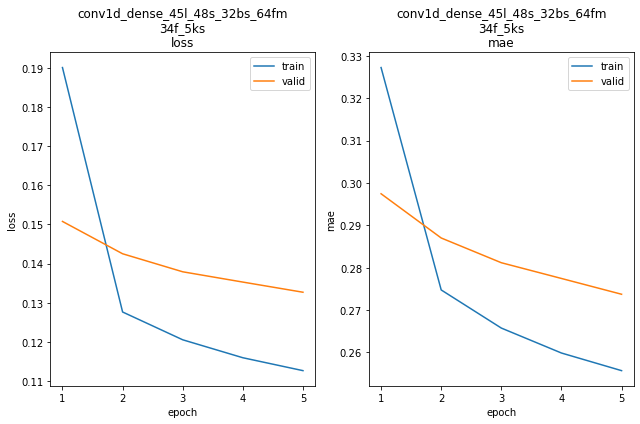

conv1d_dense_45l_48s_32bs_64fm_34f_5ks train min loss: 0.112675	mae: 0.255692	epoch: 5
conv1d_dense_45l_48s_32bs_64fm_34f_5ks valid min loss: 0.132700	mae: 0.273731	epoch: 5

conv1d_dense_45l_48s_32bs_64fm_34f_5ks
Iteration No: 43 ended. Search finished for the next optimal point.
Time taken: 246.4687
Function value obtained: 0.1327
Current minimum: 0.1261
Iteration No: 44 started. Searching for the next optimal point.
lags 36
feat_maps 63
filters 41
kern_size 5
Epoch 1/5
5879/5879 [==============================] - 47s 8ms/step - loss: 1.2336 - mae: 0.6929


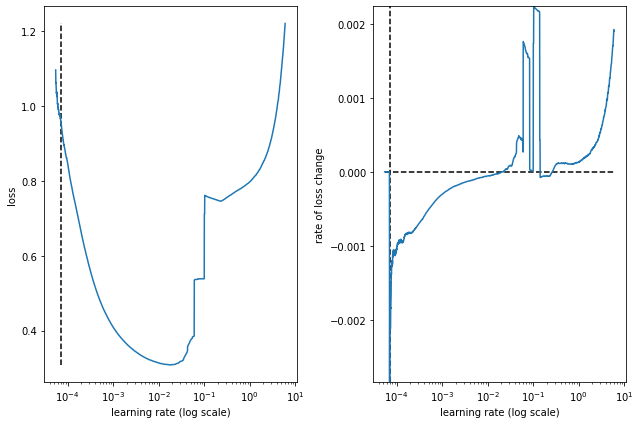

best lr: 6.973253e-05 

Model: "conv1d_dense_36l_48s_32bs_63fm_41f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_103 (Conv1D)         (None, 32, 41)            2091      
                                                                 
 max_pooling1d_103 (MaxPooli  (None, 16, 41)           0         
 ng1D)                                                           
                                                                 
 flatten_43 (Flatten)        (None, 656)               0         
                                                                 
 dense_249 (Dense)           (None, 63)                41391     
                                                                 
 dense_250 (Dense)           (None, 31)                1984      
                                                                 
 dense_251 (Dense)           (None, 48)                1536      
    

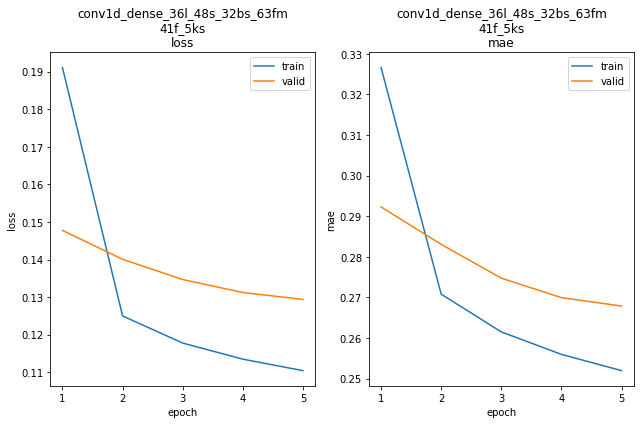

conv1d_dense_36l_48s_32bs_63fm_41f_5ks train min loss: 0.110422	mae: 0.251952	epoch: 5
conv1d_dense_36l_48s_32bs_63fm_41f_5ks valid min loss: 0.129380	mae: 0.267872	epoch: 5

conv1d_dense_36l_48s_32bs_63fm_41f_5ks
Iteration No: 44 ended. Search finished for the next optimal point.
Time taken: 277.5134
Function value obtained: 0.1294
Current minimum: 0.1261
Iteration No: 45 started. Searching for the next optimal point.
lags 40
feat_maps 32
filters 32
kern_size 4
Epoch 1/5
5879/5879 [==============================] - 47s 8ms/step - loss: 1.4068 - mae: 0.7653


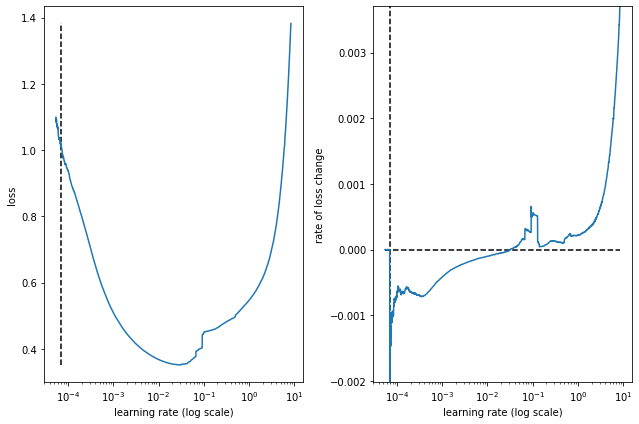

best lr: 6.927919e-05 

Model: "conv1d_dense_40l_48s_32bs_32fm_32f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_104 (Conv1D)         (None, 37, 32)            1312      
                                                                 
 max_pooling1d_104 (MaxPooli  (None, 18, 32)           0         
 ng1D)                                                           
                                                                 
 flatten_44 (Flatten)        (None, 576)               0         
                                                                 
 dense_252 (Dense)           (None, 32)                18464     
                                                                 
 dense_253 (Dense)           (None, 16)                528       
                                                                 
 dense_254 (Dense)           (None, 48)                816       
    

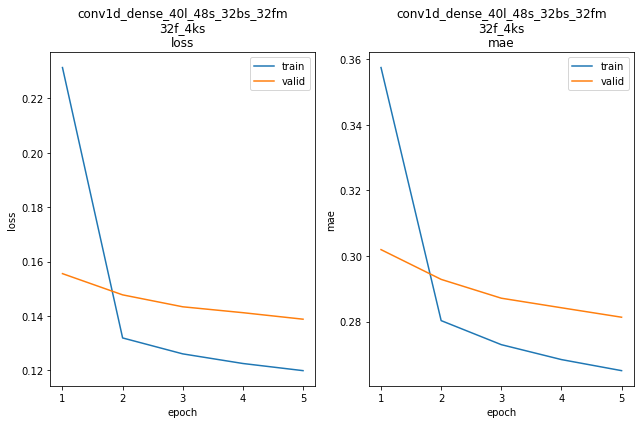

conv1d_dense_40l_48s_32bs_32fm_32f_4ks train min loss: 0.119888	mae: 0.265009	epoch: 5
conv1d_dense_40l_48s_32bs_32fm_32f_4ks valid min loss: 0.138814	mae: 0.281312	epoch: 5

conv1d_dense_40l_48s_32bs_32fm_32f_4ks
Iteration No: 45 ended. Search finished for the next optimal point.
Time taken: 243.0323
Function value obtained: 0.1388
Current minimum: 0.1261
Iteration No: 46 started. Searching for the next optimal point.
lags 38
feat_maps 34
filters 63
kern_size 7
Epoch 1/5
5879/5879 [==============================] - 48s 8ms/step - loss: 1.5288 - mae: 0.8108


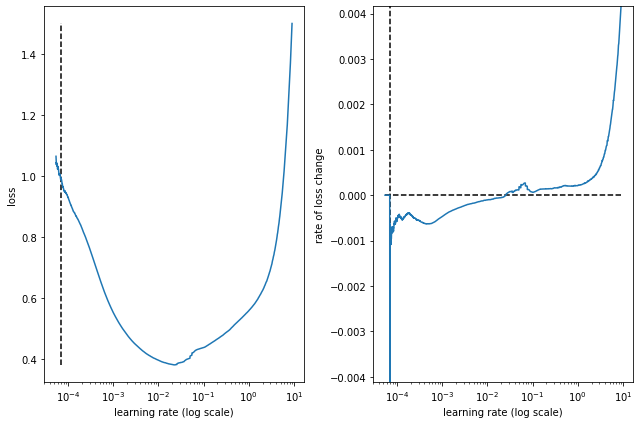

best lr: 6.927919e-05 

Model: "conv1d_dense_38l_48s_32bs_34fm_63f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_105 (Conv1D)         (None, 32, 63)            4473      
                                                                 
 max_pooling1d_105 (MaxPooli  (None, 16, 63)           0         
 ng1D)                                                           
                                                                 
 flatten_45 (Flatten)        (None, 1008)              0         
                                                                 
 dense_255 (Dense)           (None, 34)                34306     
                                                                 
 dense_256 (Dense)           (None, 17)                595       
                                                                 
 dense_257 (Dense)           (None, 48)                864       
    

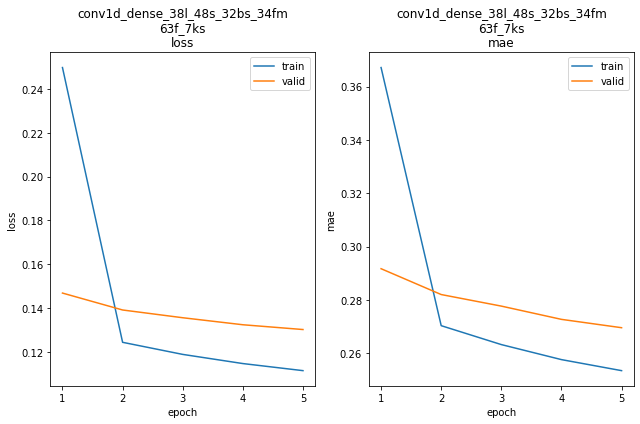

conv1d_dense_38l_48s_32bs_34fm_63f_7ks train min loss: 0.111363	mae: 0.253508	epoch: 5
conv1d_dense_38l_48s_32bs_34fm_63f_7ks valid min loss: 0.130152	mae: 0.269600	epoch: 5

conv1d_dense_38l_48s_32bs_34fm_63f_7ks
Iteration No: 46 ended. Search finished for the next optimal point.
Time taken: 282.6725
Function value obtained: 0.1302
Current minimum: 0.1261
Iteration No: 47 started. Searching for the next optimal point.
lags 18
feat_maps 64
filters 28
kern_size 3
Epoch 1/5
5880/5880 [==============================] - 47s 8ms/step - loss: 1.3753 - mae: 0.6574


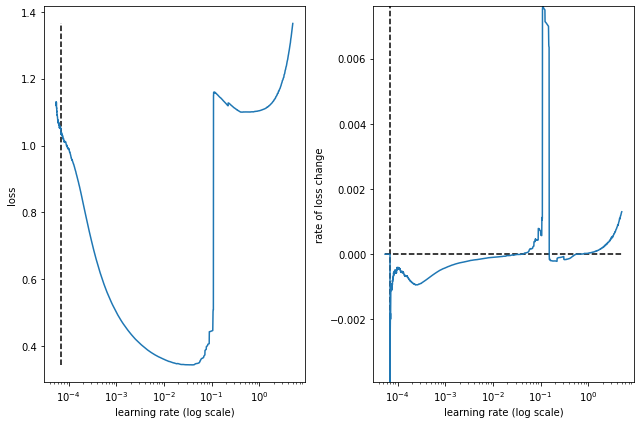

best lr: 6.9275346e-05 

Model: "conv1d_dense_18l_48s_32bs_64fm_28f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_106 (Conv1D)         (None, 16, 28)            868       
                                                                 
 max_pooling1d_106 (MaxPooli  (None, 8, 28)            0         
 ng1D)                                                           
                                                                 
 flatten_46 (Flatten)        (None, 224)               0         
                                                                 
 dense_258 (Dense)           (None, 64)                14400     
                                                                 
 dense_259 (Dense)           (None, 32)                2080      
                                                                 
 dense_260 (Dense)           (None, 48)                1584      
   

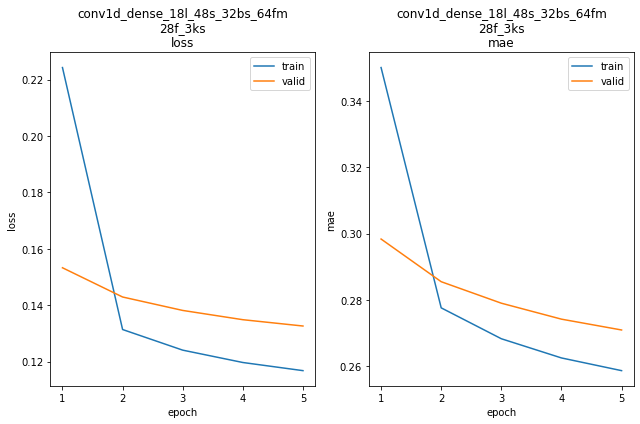

conv1d_dense_18l_48s_32bs_64fm_28f_3ks train min loss: 0.116773	mae: 0.258649	epoch: 5
conv1d_dense_18l_48s_32bs_64fm_28f_3ks valid min loss: 0.132606	mae: 0.270911	epoch: 5

conv1d_dense_18l_48s_32bs_64fm_28f_3ks
Iteration No: 47 ended. Search finished for the next optimal point.
Time taken: 283.1437
Function value obtained: 0.1326
Current minimum: 0.1261
Iteration No: 48 started. Searching for the next optimal point.
lags 38
feat_maps 62
filters 11
kern_size 7
Epoch 1/5
5879/5879 [==============================] - 40s 7ms/step - loss: 320603.8438 - mae: 7.6077


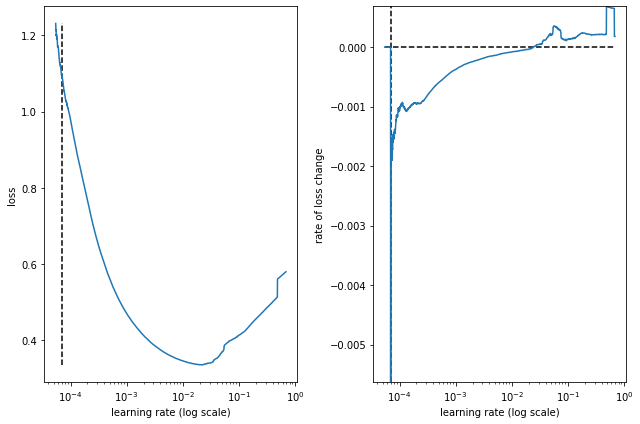

best lr: 6.927919e-05 

Model: "conv1d_dense_38l_48s_32bs_62fm_11f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_107 (Conv1D)         (None, 32, 11)            781       
                                                                 
 max_pooling1d_107 (MaxPooli  (None, 16, 11)           0         
 ng1D)                                                           
                                                                 
 flatten_47 (Flatten)        (None, 176)               0         
                                                                 
 dense_261 (Dense)           (None, 62)                10974     
                                                                 
 dense_262 (Dense)           (None, 31)                1953      
                                                                 
 dense_263 (Dense)           (None, 48)                1536      
    

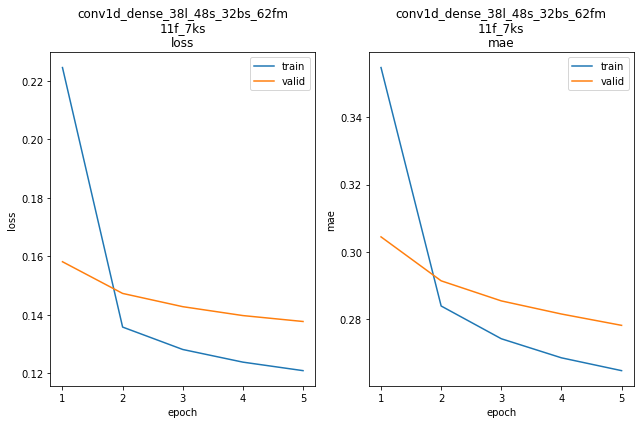

conv1d_dense_38l_48s_32bs_62fm_11f_7ks train min loss: 0.120964	mae: 0.264809	epoch: 5
conv1d_dense_38l_48s_32bs_62fm_11f_7ks valid min loss: 0.137770	mae: 0.278242	epoch: 5

conv1d_dense_38l_48s_32bs_62fm_11f_7ks
Iteration No: 48 ended. Search finished for the next optimal point.
Time taken: 240.5287
Function value obtained: 0.1378
Current minimum: 0.1261
Iteration No: 49 started. Searching for the next optimal point.
lags 19
feat_maps 34
filters 41
kern_size 5
Epoch 1/5
5880/5880 [==============================] - 36s 6ms/step - loss: 7.7723 - mae: 0.5313


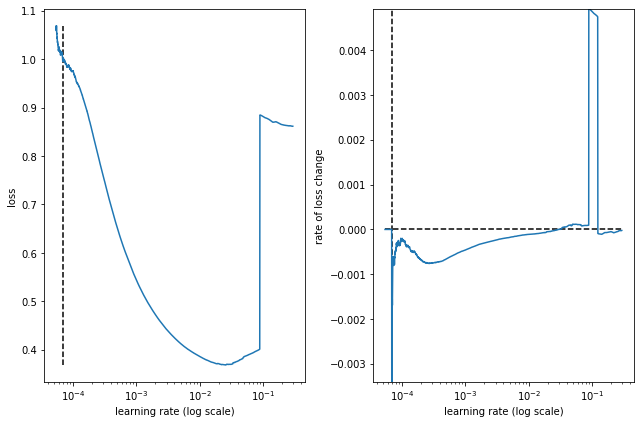

best lr: 6.9275346e-05 

Model: "conv1d_dense_19l_48s_32bs_34fm_41f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_108 (Conv1D)         (None, 15, 41)            2091      
                                                                 
 max_pooling1d_108 (MaxPooli  (None, 7, 41)            0         
 ng1D)                                                           
                                                                 
 flatten_48 (Flatten)        (None, 287)               0         
                                                                 
 dense_264 (Dense)           (None, 34)                9792      
                                                                 
 dense_265 (Dense)           (None, 17)                595       
                                                                 
 dense_266 (Dense)           (None, 48)                864       
   

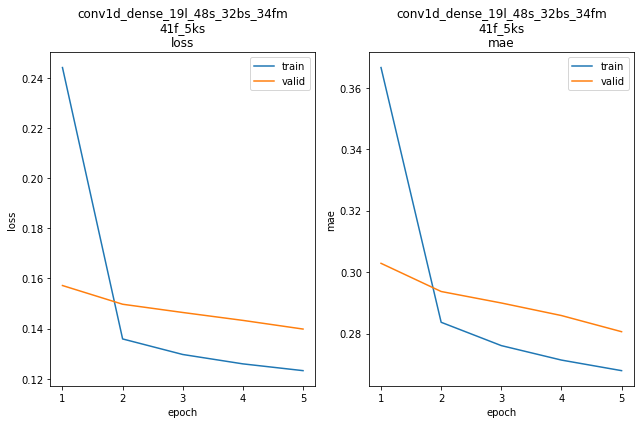

conv1d_dense_19l_48s_32bs_34fm_41f_5ks train min loss: 0.123227	mae: 0.267912	epoch: 5
conv1d_dense_19l_48s_32bs_34fm_41f_5ks valid min loss: 0.139815	mae: 0.280589	epoch: 5

conv1d_dense_19l_48s_32bs_34fm_41f_5ks
Iteration No: 49 ended. Search finished for the next optimal point.
Time taken: 234.9389
Function value obtained: 0.1398
Current minimum: 0.1261
Iteration No: 50 started. Searching for the next optimal point.
lags 16
feat_maps 64
filters 62
kern_size 3
Epoch 1/5
5880/5880 [==============================] - 49s 8ms/step - loss: 1.1898 - mae: 0.7193


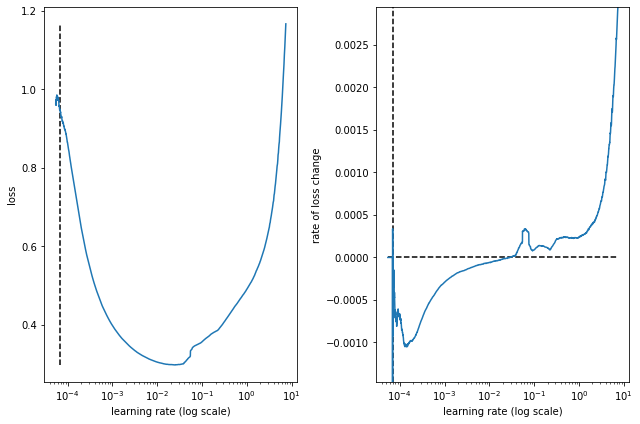

best lr: 6.9275346e-05 

Model: "conv1d_dense_16l_48s_32bs_64fm_62f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_109 (Conv1D)         (None, 14, 62)            1922      
                                                                 
 max_pooling1d_109 (MaxPooli  (None, 7, 62)            0         
 ng1D)                                                           
                                                                 
 flatten_49 (Flatten)        (None, 434)               0         
                                                                 
 dense_267 (Dense)           (None, 64)                27840     
                                                                 
 dense_268 (Dense)           (None, 32)                2080      
                                                                 
 dense_269 (Dense)           (None, 48)                1584      
   

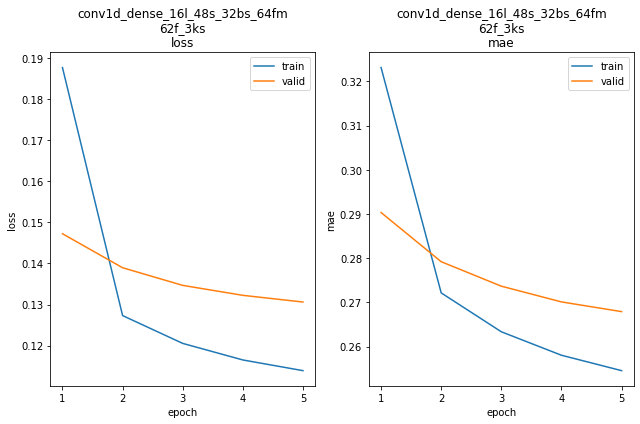

conv1d_dense_16l_48s_32bs_64fm_62f_3ks train min loss: 0.113900	mae: 0.254573	epoch: 5
conv1d_dense_16l_48s_32bs_64fm_62f_3ks valid min loss: 0.130601	mae: 0.267922	epoch: 5

conv1d_dense_16l_48s_32bs_64fm_62f_3ks
Iteration No: 50 ended. Search finished for the next optimal point.
Time taken: 286.1555
Function value obtained: 0.1306
Current minimum: 0.1261
Iteration No: 51 started. Searching for the next optimal point.
lags 36
feat_maps 32
filters 60
kern_size 3
Epoch 1/5
5879/5879 [==============================] - 51s 8ms/step - loss: 1.3833 - mae: 0.7789


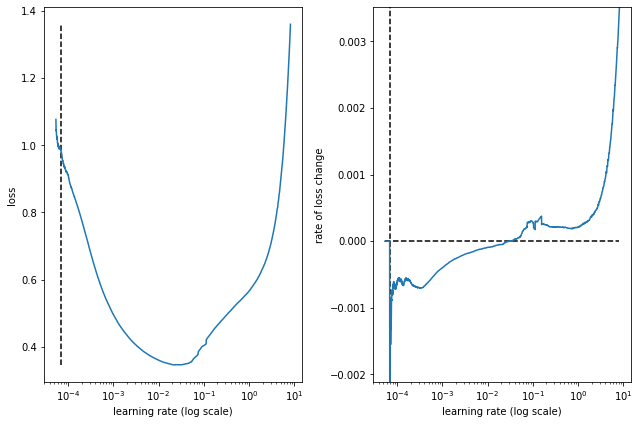

best lr: 6.973253e-05 

Model: "conv1d_dense_36l_48s_32bs_32fm_60f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_110 (Conv1D)         (None, 34, 60)            1860      
                                                                 
 max_pooling1d_110 (MaxPooli  (None, 17, 60)           0         
 ng1D)                                                           
                                                                 
 flatten_50 (Flatten)        (None, 1020)              0         
                                                                 
 dense_270 (Dense)           (None, 32)                32672     
                                                                 
 dense_271 (Dense)           (None, 16)                528       
                                                                 
 dense_272 (Dense)           (None, 48)                816       
    

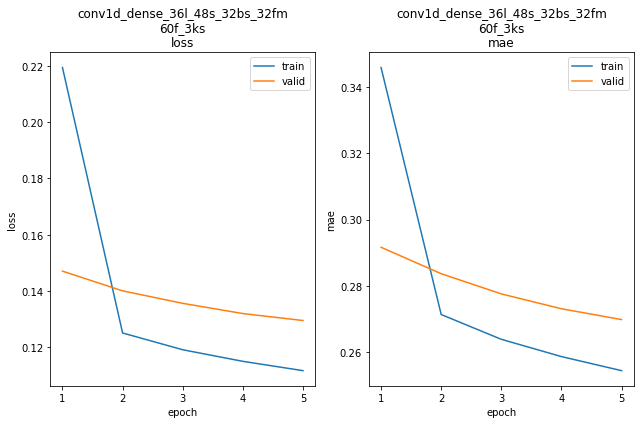

conv1d_dense_36l_48s_32bs_32fm_60f_3ks train min loss: 0.111776	mae: 0.254361	epoch: 5
conv1d_dense_36l_48s_32bs_32fm_60f_3ks valid min loss: 0.129570	mae: 0.269797	epoch: 5

conv1d_dense_36l_48s_32bs_32fm_60f_3ks
Iteration No: 51 ended. Search finished for the next optimal point.
Time taken: 251.2085
Function value obtained: 0.1296
Current minimum: 0.1261
Iteration No: 52 started. Searching for the next optimal point.
lags 38
feat_maps 63
filters 39
kern_size 3
Epoch 1/5
5879/5879 [==============================] - 49s 8ms/step - loss: 1.2279 - mae: 0.7392


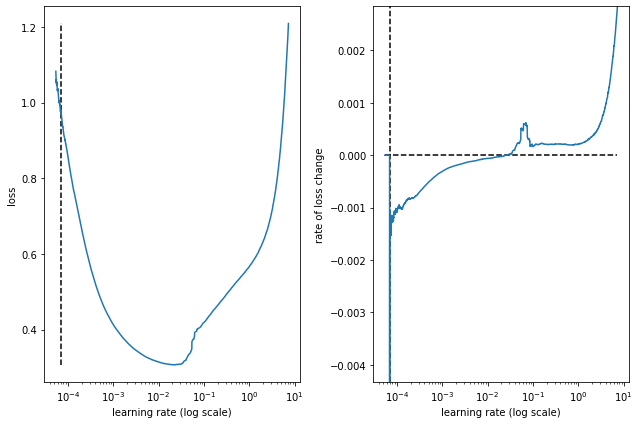

best lr: 6.927919e-05 

Model: "conv1d_dense_38l_48s_32bs_63fm_39f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_111 (Conv1D)         (None, 36, 39)            1209      
                                                                 
 max_pooling1d_111 (MaxPooli  (None, 18, 39)           0         
 ng1D)                                                           
                                                                 
 flatten_51 (Flatten)        (None, 702)               0         
                                                                 
 dense_273 (Dense)           (None, 63)                44289     
                                                                 
 dense_274 (Dense)           (None, 31)                1984      
                                                                 
 dense_275 (Dense)           (None, 48)                1536      
    

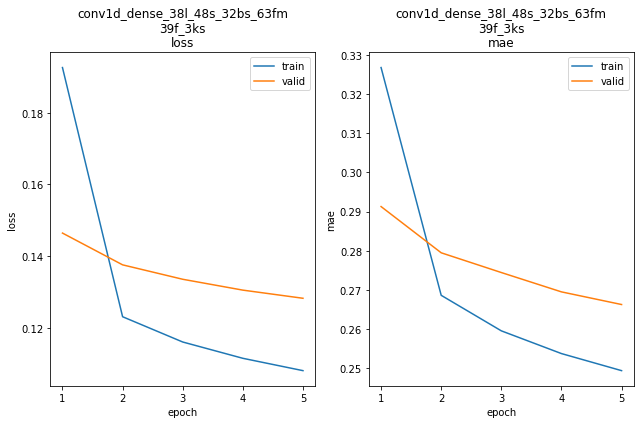

conv1d_dense_38l_48s_32bs_63fm_39f_3ks train min loss: 0.108054	mae: 0.249423	epoch: 5
conv1d_dense_38l_48s_32bs_63fm_39f_3ks valid min loss: 0.128247	mae: 0.266286	epoch: 5

conv1d_dense_38l_48s_32bs_63fm_39f_3ks
Iteration No: 52 ended. Search finished for the next optimal point.
Time taken: 293.1027
Function value obtained: 0.1282
Current minimum: 0.1261
Iteration No: 53 started. Searching for the next optimal point.
lags 28
feat_maps 63
filters 63
kern_size 3
Epoch 1/5
5880/5880 [==============================] - 31s 5ms/step - loss: 1.6126 - mae: 0.4525


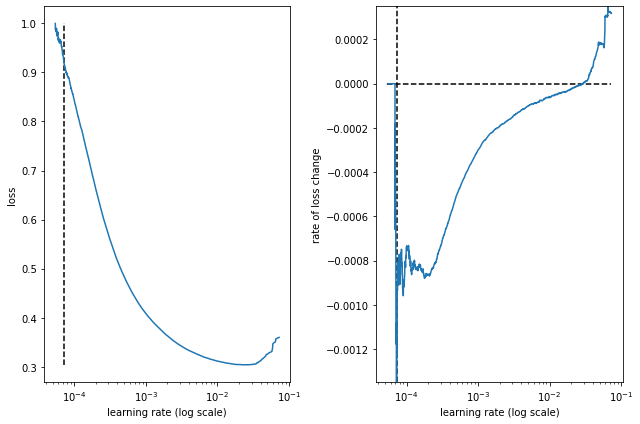

best lr: 7.2511e-05 

Model: "conv1d_dense_28l_48s_32bs_63fm_63f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_112 (Conv1D)         (None, 26, 63)            1953      
                                                                 
 max_pooling1d_112 (MaxPooli  (None, 13, 63)           0         
 ng1D)                                                           
                                                                 
 flatten_52 (Flatten)        (None, 819)               0         
                                                                 
 dense_276 (Dense)           (None, 63)                51660     
                                                                 
 dense_277 (Dense)           (None, 31)                1984      
                                                                 
 dense_278 (Dense)           (None, 48)                1536      
      

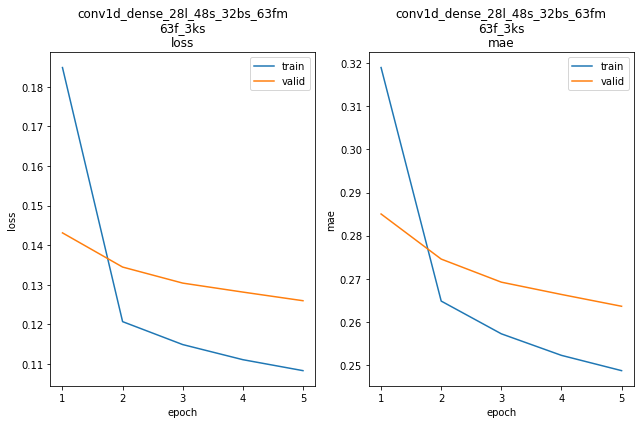

conv1d_dense_28l_48s_32bs_63fm_63f_3ks train min loss: 0.108292	mae: 0.248680	epoch: 5
conv1d_dense_28l_48s_32bs_63fm_63f_3ks valid min loss: 0.125956	mae: 0.263618	epoch: 5

conv1d_dense_28l_48s_32bs_63fm_63f_3ks
Iteration No: 53 ended. Search finished for the next optimal point.
Time taken: 245.0222
Function value obtained: 0.1260
Current minimum: 0.1260
Iteration No: 54 started. Searching for the next optimal point.
lags 34
feat_maps 32
filters 41
kern_size 7
Epoch 1/5
5880/5880 [==============================] - 37s 6ms/step - loss: 29958.5684 - mae: 3.0111


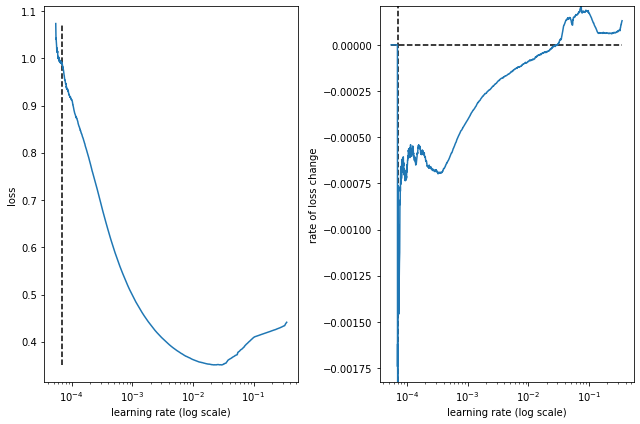

best lr: 6.972859e-05 

Model: "conv1d_dense_34l_48s_32bs_32fm_41f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_113 (Conv1D)         (None, 28, 41)            2911      
                                                                 
 max_pooling1d_113 (MaxPooli  (None, 14, 41)           0         
 ng1D)                                                           
                                                                 
 flatten_53 (Flatten)        (None, 574)               0         
                                                                 
 dense_279 (Dense)           (None, 32)                18400     
                                                                 
 dense_280 (Dense)           (None, 16)                528       
                                                                 
 dense_281 (Dense)           (None, 48)                816       
    

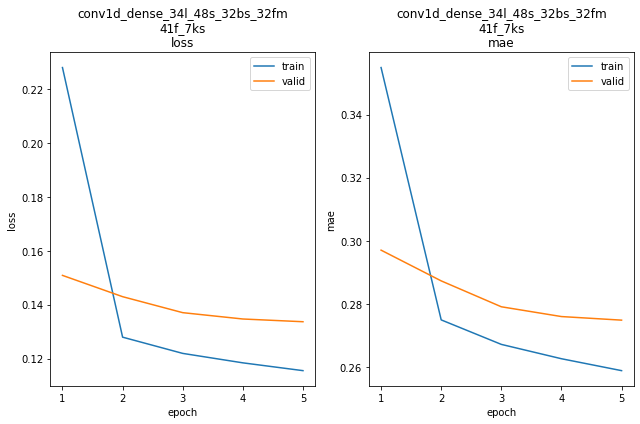

conv1d_dense_34l_48s_32bs_32fm_41f_7ks train min loss: 0.115490	mae: 0.258845	epoch: 5
conv1d_dense_34l_48s_32bs_32fm_41f_7ks valid min loss: 0.133670	mae: 0.274848	epoch: 5

conv1d_dense_34l_48s_32bs_32fm_41f_7ks
Iteration No: 54 ended. Search finished for the next optimal point.
Time taken: 287.6646
Function value obtained: 0.1337
Current minimum: 0.1260
Iteration No: 55 started. Searching for the next optimal point.
lags 48
feat_maps 63
filters 28
kern_size 3
Epoch 1/5
5879/5879 [==============================] - 33s 6ms/step - loss: 1.7040 - mae: 0.4696


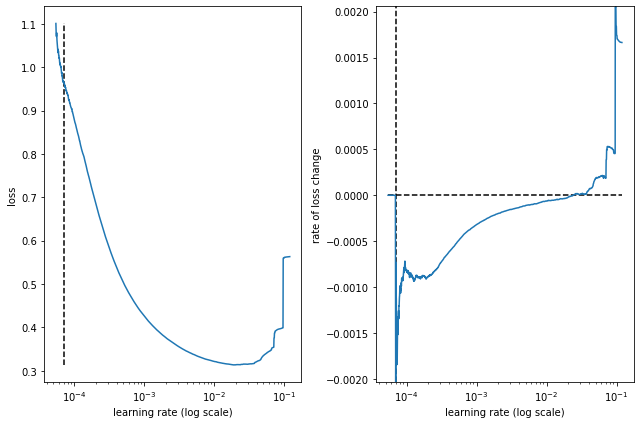

best lr: 6.973253e-05 

Model: "conv1d_dense_48l_48s_32bs_63fm_28f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_114 (Conv1D)         (None, 46, 28)            868       
                                                                 
 max_pooling1d_114 (MaxPooli  (None, 23, 28)           0         
 ng1D)                                                           
                                                                 
 flatten_54 (Flatten)        (None, 644)               0         
                                                                 
 dense_282 (Dense)           (None, 63)                40635     
                                                                 
 dense_283 (Dense)           (None, 31)                1984      
                                                                 
 dense_284 (Dense)           (None, 48)                1536      
    

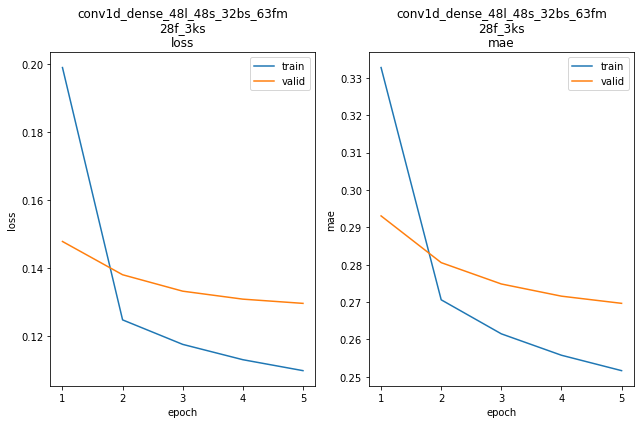

conv1d_dense_48l_48s_32bs_63fm_28f_3ks train min loss: 0.109740	mae: 0.251663	epoch: 5
conv1d_dense_48l_48s_32bs_63fm_28f_3ks valid min loss: 0.129555	mae: 0.269677	epoch: 5

conv1d_dense_48l_48s_32bs_63fm_28f_3ks
Iteration No: 55 ended. Search finished for the next optimal point.
Time taken: 288.9636
Function value obtained: 0.1296
Current minimum: 0.1260
Iteration No: 56 started. Searching for the next optimal point.
lags 38
feat_maps 61
filters 53
kern_size 3
Epoch 1/5
5879/5879 [==============================] - 33s 5ms/step - loss: 1.5564 - mae: 0.4543


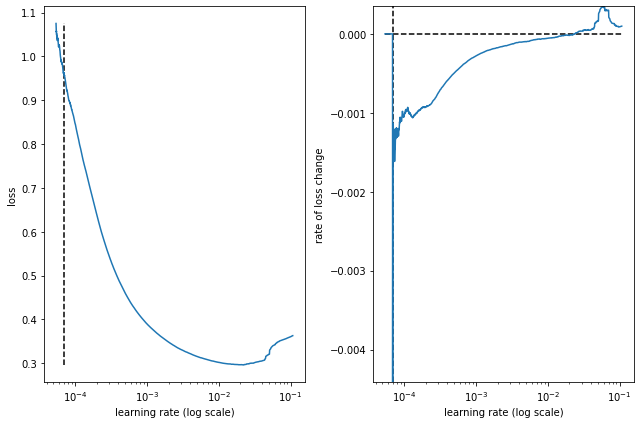

best lr: 6.927919e-05 

Model: "conv1d_dense_38l_48s_32bs_61fm_53f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_115 (Conv1D)         (None, 36, 53)            1643      
                                                                 
 max_pooling1d_115 (MaxPooli  (None, 18, 53)           0         
 ng1D)                                                           
                                                                 
 flatten_55 (Flatten)        (None, 954)               0         
                                                                 
 dense_285 (Dense)           (None, 61)                58255     
                                                                 
 dense_286 (Dense)           (None, 30)                1860      
                                                                 
 dense_287 (Dense)           (None, 48)                1488      
    

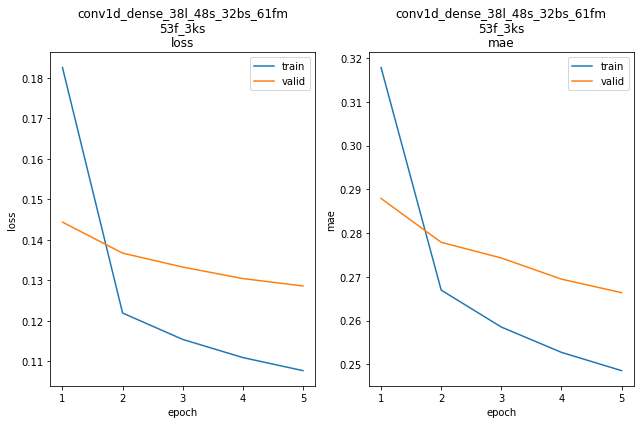

conv1d_dense_38l_48s_32bs_61fm_53f_3ks train min loss: 0.107693	mae: 0.248573	epoch: 5
conv1d_dense_38l_48s_32bs_61fm_53f_3ks valid min loss: 0.128610	mae: 0.266398	epoch: 5

conv1d_dense_38l_48s_32bs_61fm_53f_3ks
Iteration No: 56 ended. Search finished for the next optimal point.
Time taken: 324.1608
Function value obtained: 0.1286
Current minimum: 0.1260
Iteration No: 57 started. Searching for the next optimal point.
lags 30
feat_maps 32
filters 64
kern_size 4
Epoch 1/5
5880/5880 [==============================] - 32s 5ms/step - loss: 1.6718 - mae: 0.4741


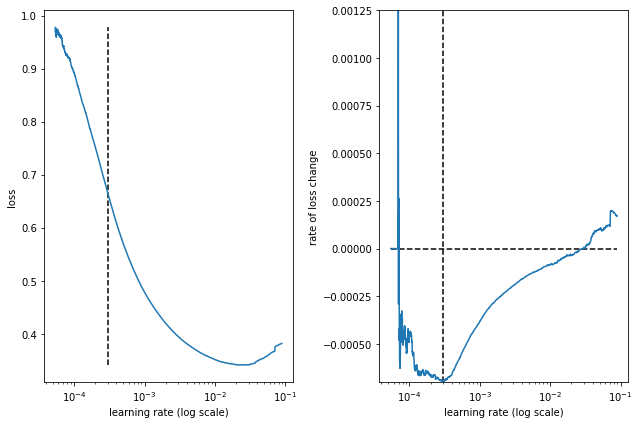

best lr: 0.00030343534 

Model: "conv1d_dense_30l_48s_32bs_32fm_64f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_116 (Conv1D)         (None, 27, 64)            2624      
                                                                 
 max_pooling1d_116 (MaxPooli  (None, 13, 64)           0         
 ng1D)                                                           
                                                                 
 flatten_56 (Flatten)        (None, 832)               0         
                                                                 
 dense_288 (Dense)           (None, 32)                26656     
                                                                 
 dense_289 (Dense)           (None, 16)                528       
                                                                 
 dense_290 (Dense)           (None, 48)                816       
   

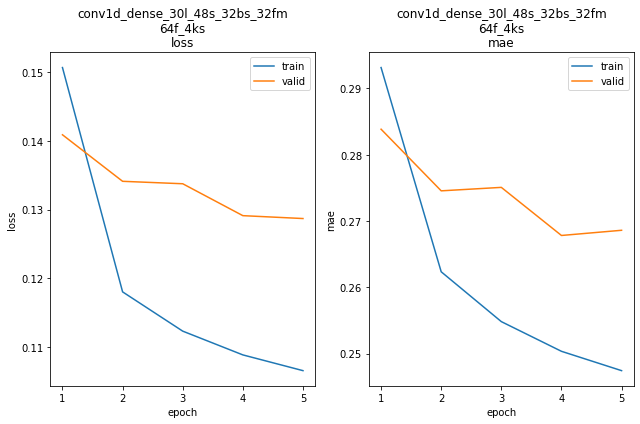

conv1d_dense_30l_48s_32bs_32fm_64f_4ks train min loss: 0.106533	mae: 0.247421	epoch: 5
conv1d_dense_30l_48s_32bs_32fm_64f_4ks valid min loss: 0.128686	mae: 0.268601	epoch: 5

conv1d_dense_30l_48s_32bs_32fm_64f_4ks
Iteration No: 57 ended. Search finished for the next optimal point.
Time taken: 233.8987
Function value obtained: 0.1287
Current minimum: 0.1260
Iteration No: 58 started. Searching for the next optimal point.
lags 25
feat_maps 63
filters 9
kern_size 3
Epoch 1/5
5880/5880 [==============================] - 33s 5ms/step - loss: 91.4744 - mae: 0.6322


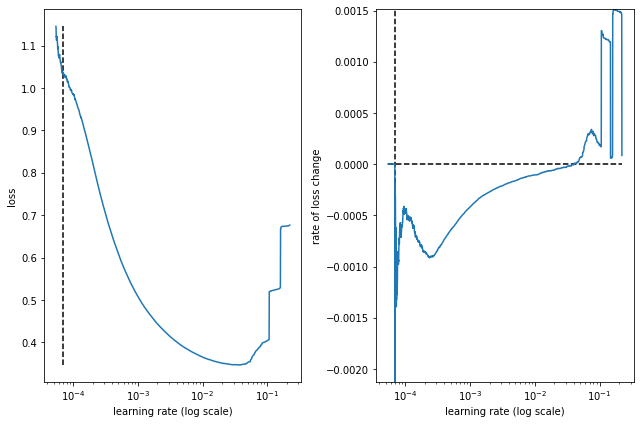

best lr: 6.9275346e-05 

Model: "conv1d_dense_25l_48s_32bs_63fm_9f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_117 (Conv1D)         (None, 23, 9)             279       
                                                                 
 max_pooling1d_117 (MaxPooli  (None, 11, 9)            0         
 ng1D)                                                           
                                                                 
 flatten_57 (Flatten)        (None, 99)                0         
                                                                 
 dense_291 (Dense)           (None, 63)                6300      
                                                                 
 dense_292 (Dense)           (None, 31)                1984      
                                                                 
 dense_293 (Dense)           (None, 48)                1536      
    

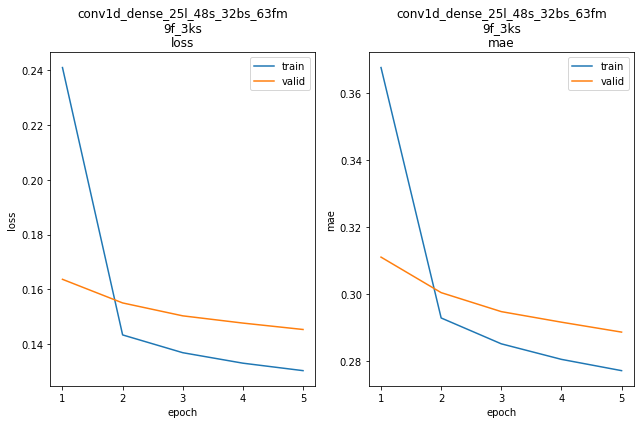

conv1d_dense_25l_48s_32bs_63fm_9f_3ks train min loss: 0.130292	mae: 0.277202	epoch: 5
conv1d_dense_25l_48s_32bs_63fm_9f_3ks valid min loss: 0.145320	mae: 0.288687	epoch: 5

conv1d_dense_25l_48s_32bs_63fm_9f_3ks
Iteration No: 58 ended. Search finished for the next optimal point.
Time taken: 247.9340
Function value obtained: 0.1453
Current minimum: 0.1260
Iteration No: 59 started. Searching for the next optimal point.
lags 32
feat_maps 32
filters 45
kern_size 3
Epoch 1/5
5880/5880 [==============================] - 48s 8ms/step - loss: 1.3833 - mae: 0.7787


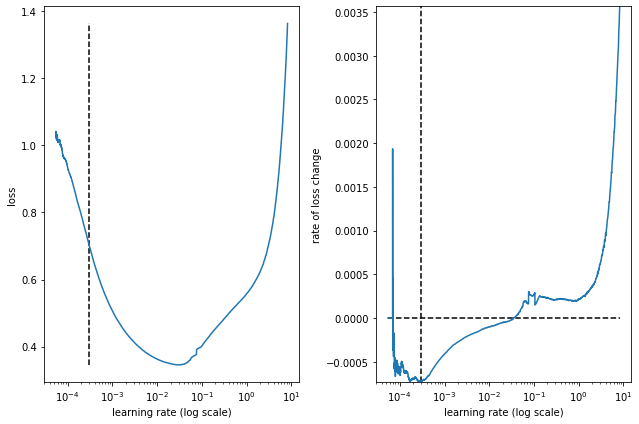

best lr: 0.00029950342 

Model: "conv1d_dense_32l_48s_32bs_32fm_45f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_118 (Conv1D)         (None, 30, 45)            1395      
                                                                 
 max_pooling1d_118 (MaxPooli  (None, 15, 45)           0         
 ng1D)                                                           
                                                                 
 flatten_58 (Flatten)        (None, 675)               0         
                                                                 
 dense_294 (Dense)           (None, 32)                21632     
                                                                 
 dense_295 (Dense)           (None, 16)                528       
                                                                 
 dense_296 (Dense)           (None, 48)                816       
   

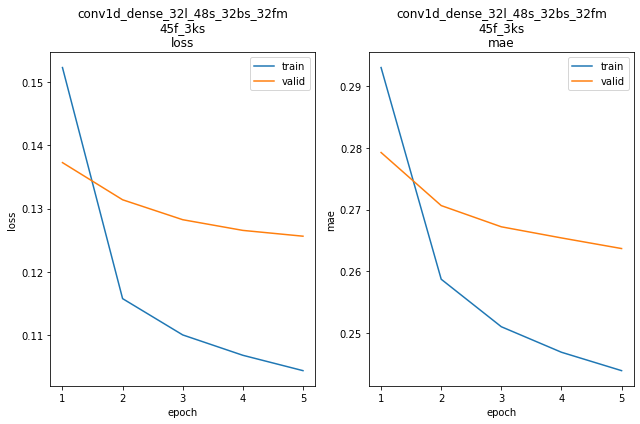

conv1d_dense_32l_48s_32bs_32fm_45f_3ks train min loss: 0.104387	mae: 0.243886	epoch: 5
conv1d_dense_32l_48s_32bs_32fm_45f_3ks valid min loss: 0.125645	mae: 0.263679	epoch: 5

conv1d_dense_32l_48s_32bs_32fm_45f_3ks
Iteration No: 59 ended. Search finished for the next optimal point.
Time taken: 248.2586
Function value obtained: 0.1256
Current minimum: 0.1256
Iteration No: 60 started. Searching for the next optimal point.
lags 33
feat_maps 63
filters 40
kern_size 3
Epoch 1/5
5880/5880 [==============================] - 47s 8ms/step - loss: 1.2600 - mae: 0.7385


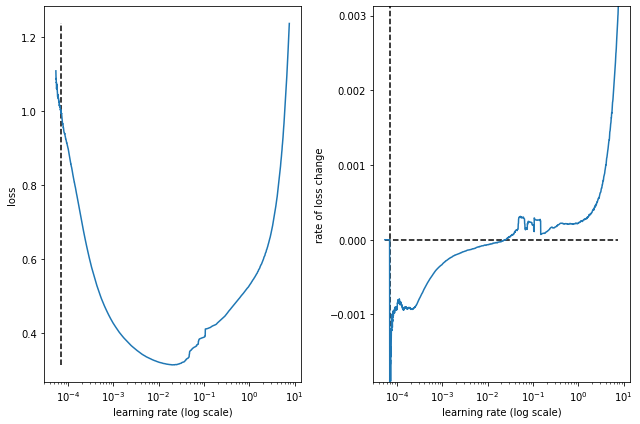

best lr: 6.95016e-05 

Model: "conv1d_dense_33l_48s_32bs_63fm_40f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_119 (Conv1D)         (None, 31, 40)            1240      
                                                                 
 max_pooling1d_119 (MaxPooli  (None, 15, 40)           0         
 ng1D)                                                           
                                                                 
 flatten_59 (Flatten)        (None, 600)               0         
                                                                 
 dense_297 (Dense)           (None, 63)                37863     
                                                                 
 dense_298 (Dense)           (None, 31)                1984      
                                                                 
 dense_299 (Dense)           (None, 48)                1536      
     

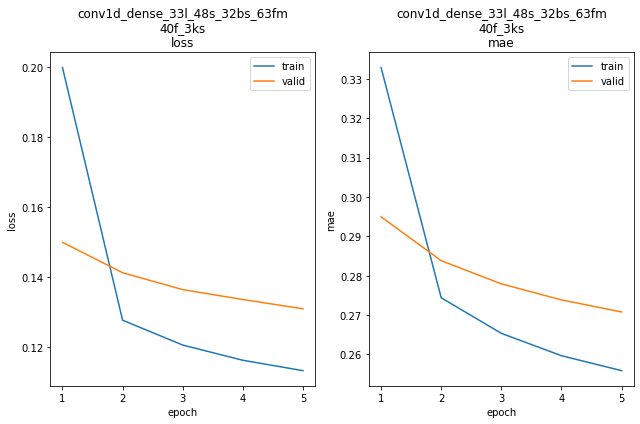

conv1d_dense_33l_48s_32bs_63fm_40f_3ks train min loss: 0.113199	mae: 0.255900	epoch: 5
conv1d_dense_33l_48s_32bs_63fm_40f_3ks valid min loss: 0.130877	mae: 0.270797	epoch: 5

conv1d_dense_33l_48s_32bs_63fm_40f_3ks
Iteration No: 60 ended. Search finished for the next optimal point.
Time taken: 285.3004
Function value obtained: 0.1309
Current minimum: 0.1256

[32, 32, 45, 3]
0.12564487755298615



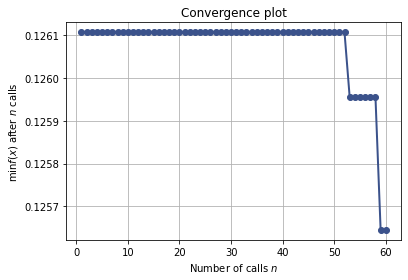

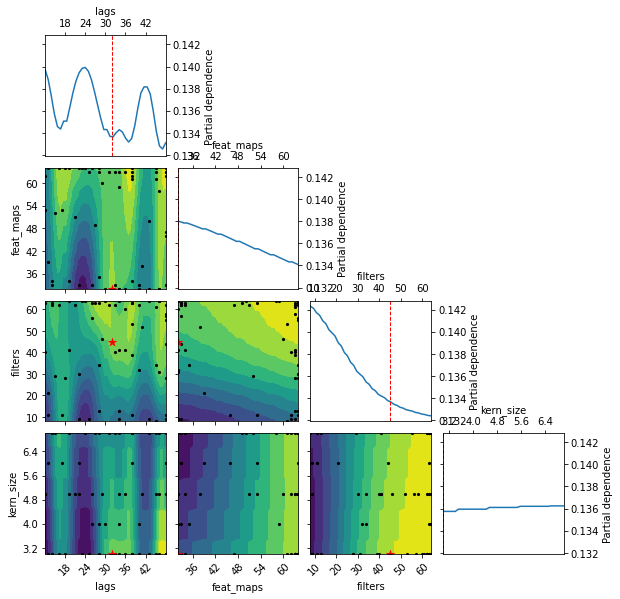

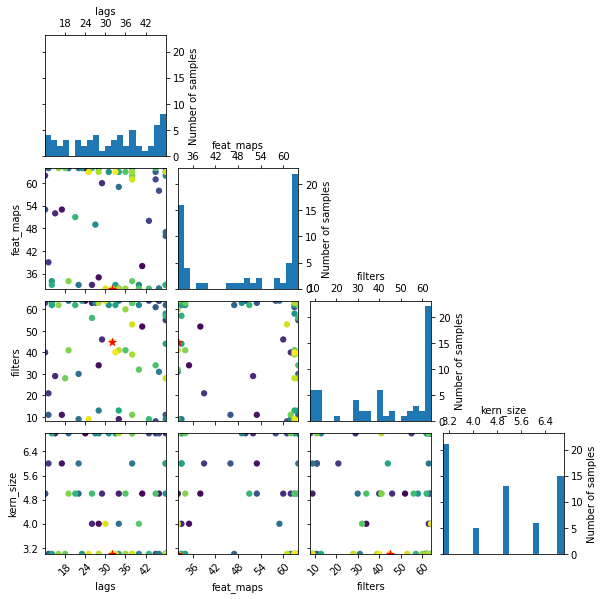

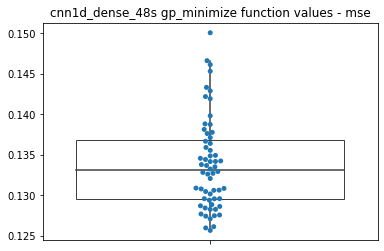

CPU times: user 5h 19min 46s, sys: 1h 6min 43s, total: 6h 26min 29s
Wall time: 4h 11min 11s


In [ ]:
%%time


results_id = 'cnn1d_dense_48s'
hpo[results_id] = {}

dim_lags      = Integer(low = 12, high = 48, name = 'lags')
dim_feat_maps = Integer(low = 32, high = 64, name = 'feat_maps')
dim_filters   = Integer(low =  8, high = 64, name = 'filters')
dim_kern_size = Integer(low =  3, high =  7, name = 'kern_size')

hpo[results_id]['dims'] = [dim_lags,
                           dim_feat_maps,
                           dim_filters,
                           dim_kern_size]
hpo[results_id]['init_dims'] = [24, 64, 64, 7]
hpo[results_id]['calls']     = 60


@use_named_args(dimensions = hpo[results_id]['dims'])
def model_fitness(**dims):
    params = get_default_params('conv1d_dense')
    params.update({'lrf_params': [0.00005,  0.001, 32, 5, 100, 25]})

    return get_bo_mse(params, **dims)


hpo[results_id]['fitness_func'] = model_fitness
hpo[results_id]['results']      = run_bo_search(hpo, results_id)


Results for optimised Conv1D-Dense 48 steps-ahead forecast models after 5 epochs:

| CNN model | params                                     | mse     | mae     |
|-----------|--------------------------------------------|---------|---------|
|Conv1D-LSTM| lags=30,feat_maps=27,filters=63,kern_size=7| 0.12481 | 0.26295 |
|Conv1D-Dense|lags=32,feat_maps=32,filters=45,kern_size=3| 0.12564 | 0.26368 |


Best model:
 * conv1d_dense_32l_48s_32bs_32fm_45f_3ks 

This minimal value is greater than the Conv1D-LSTM minimal mse value of 0.12481 but the run time is lower.

From the Gaussian process plots we can infer:
 * feat_maps - higher is better
 * filters - higher is better
 * kern_size - lower may be better but only marginally
 * lags - less confident drawing any inferences

It's clear from some of the learning rate finder curves that start_lr and/or end_lr could be further refined.  Start_lr may be a little low but results seem OK.

As with all of the skopt runs, it would benefit from running for more iterations and probably more learning rate tuning.

---

Unfortunately `build_stacked_conv1d_lstm_model` was too slow to run more than once, so I've removed it.  It's available in the [commit history](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/commits/main/notebooks/lstm_time_series.ipynb).

The architecture was (omitting dropout and regularisation):
 * Conv1D()
 * MaxPooling1D()
 * Conv1D()
 * MaxPooling1D()
 * LSTM()
 * LSTM()
 * Dense()

---

### Multi-head Conv1D

The one-dimensional CNN models can be extended to have multiple separate sub-CNN "heads" with different filter and/or kernel sizes.  These CNN "heads" are then concatenated together to form a multiheaded model.

Code for this architecture is in the `build_multihead_conv1d_dense_model` function.


Briefly, the architecture is (omitting dropout and regularisation):
 * 3 independent Conv1D() "heads" with different kernel sizes:
   * Conv1D()
     * kernel sizes: init_ks * 2 + 1, init_ks \* 3 + 1, init_ks \* 4 + 1
   * MaxPooling1D()
   * Flatten()
 * concatenate()
 * Dense(activation='relu')
 * Dense(activation='relu')
 * Dense()

Again, optimise:

 * lags
 * feat_maps - Dense(activation='relu') feature maps
 * Conv1D() filters
 * Conv1D() initial kernel size


Iteration No: 1 started. Evaluating function at provided point.
lags 48
feat_maps 128
filters 64
kern_size 2
Epoch 1/5
11758/11758 [==============================] - 50s 4ms/step - loss: 1.0864 - mae: 0.6809


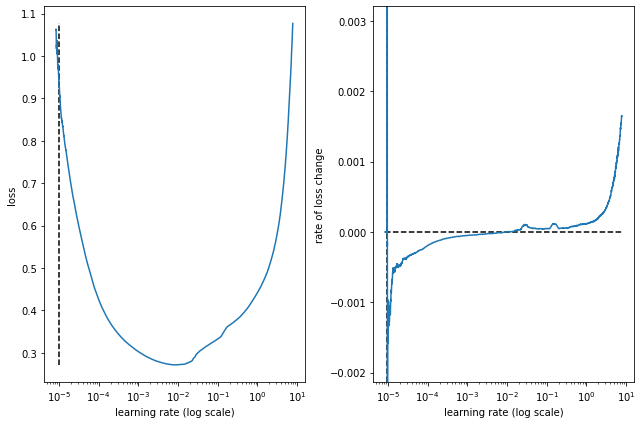

best lr: 9.649566e-06 

Model: "mh_conv1d_dense_48l_48s_16bs_128fm_64f_2ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 48, 10)]     0           []                               
                                                                                                  
 conv1d_21 (Conv1D)             (None, 44, 64)       3264        ['input_8[0][0]']                
                                                                                                  
 conv1d_22 (Conv1D)             (None, 42, 64)       4544        ['input_8[0][0]']                
                                                                                                  
 conv1d_23 (Conv1D)             (None, 40, 64)       5824        ['input_8[0][0]']                
                                 

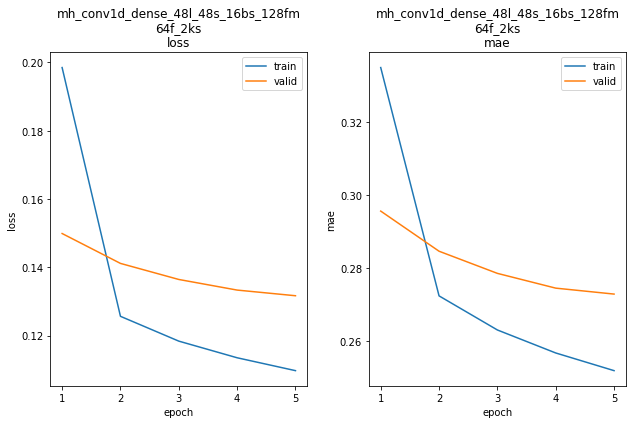

mh_conv1d_dense_48l_48s_16bs_128fm_64f_2ks train min loss: 0.109729	mae: 0.251853	epoch: 5
mh_conv1d_dense_48l_48s_16bs_128fm_64f_2ks valid min loss: 0.131670	mae: 0.272825	epoch: 5

mh_conv1d_dense_48l_48s_16bs_128fm_64f_2ks
Iteration No: 1 ended. Evaluation done at provided point.
Time taken: 428.2113
Function value obtained: 0.1317
Current minimum: 0.1317
Iteration No: 2 started. Evaluating function at random point.
lags 43
feat_maps 151
filters 57
kern_size 3
Epoch 1/5
11758/11758 [==============================] - 44s 4ms/step - loss: 1.0605 - mae: 0.6782


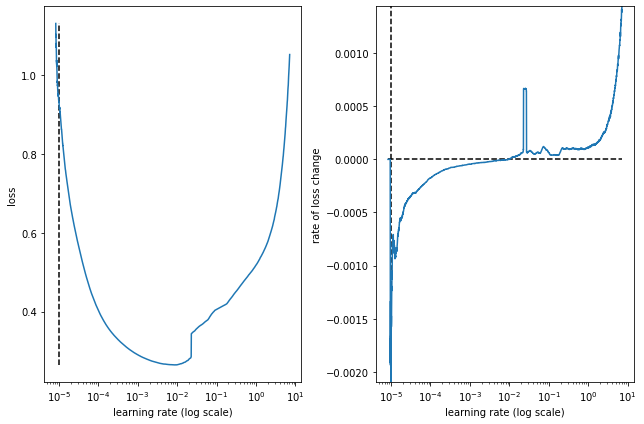

best lr: 9.837342e-06 

Model: "mh_conv1d_dense_43l_48s_16bs_151fm_57f_3ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 43, 10)]     0           []                               
                                                                                                  
 conv1d_24 (Conv1D)             (None, 37, 57)       4047        ['input_9[0][0]']                
                                                                                                  
 conv1d_25 (Conv1D)             (None, 34, 57)       5757        ['input_9[0][0]']                
                                                                                                  
 conv1d_26 (Conv1D)             (None, 31, 57)       7467        ['input_9[0][0]']                
                                 

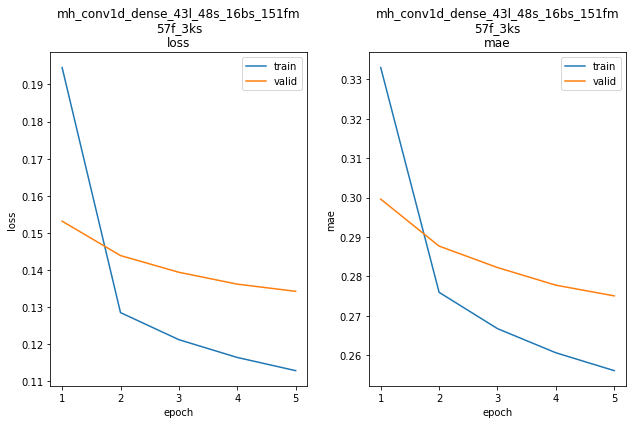

mh_conv1d_dense_43l_48s_16bs_151fm_57f_3ks train min loss: 0.112896	mae: 0.256063	epoch: 5
mh_conv1d_dense_43l_48s_16bs_151fm_57f_3ks valid min loss: 0.134272	mae: 0.275044	epoch: 5

mh_conv1d_dense_43l_48s_16bs_151fm_57f_3ks
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 390.4722
Function value obtained: 0.1343
Current minimum: 0.1317
Iteration No: 3 started. Evaluating function at random point.
lags 35
feat_maps 141
filters 47
kern_size 2
Epoch 1/5
11758/11758 [==============================] - 45s 4ms/step - loss: 1.1532 - mae: 0.6822


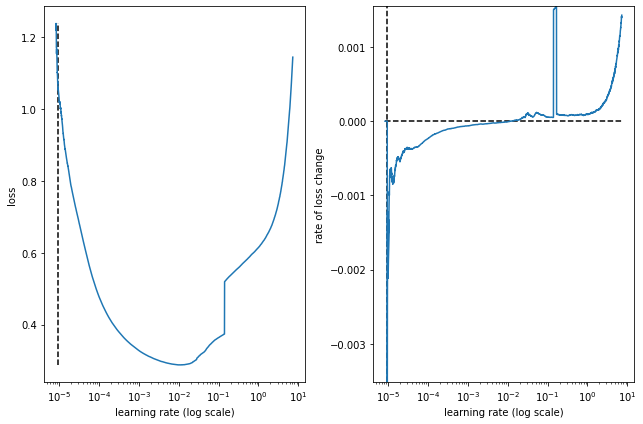

best lr: 9.531942e-06 

Model: "mh_conv1d_dense_35l_48s_16bs_141fm_47f_2ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(None, 35, 10)]     0           []                               
                                                                                                  
 conv1d_27 (Conv1D)             (None, 31, 47)       2397        ['input_10[0][0]']               
                                                                                                  
 conv1d_28 (Conv1D)             (None, 29, 47)       3337        ['input_10[0][0]']               
                                                                                                  
 conv1d_29 (Conv1D)             (None, 27, 47)       4277        ['input_10[0][0]']               
                                 

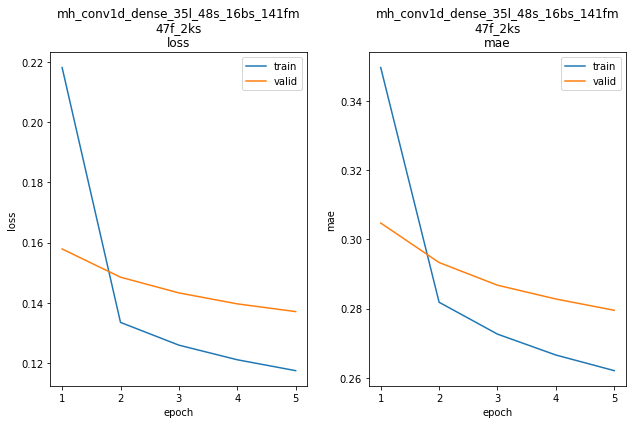

mh_conv1d_dense_35l_48s_16bs_141fm_47f_2ks train min loss: 0.117543	mae: 0.262058	epoch: 5
mh_conv1d_dense_35l_48s_16bs_141fm_47f_2ks valid min loss: 0.137133	mae: 0.279504	epoch: 5

mh_conv1d_dense_35l_48s_16bs_141fm_47f_2ks
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 423.6289
Function value obtained: 0.1371
Current minimum: 0.1317
Iteration No: 4 started. Evaluating function at random point.
lags 27
feat_maps 211
filters 34
kern_size 4
Epoch 1/5
11759/11759 [==============================] - 32s 3ms/step - loss: 3.4638 - mae: 0.4686


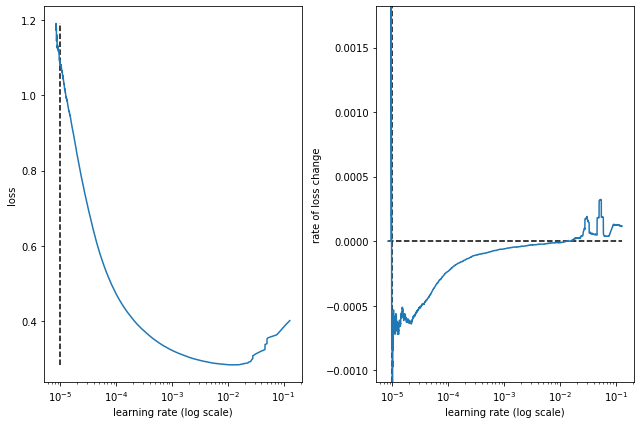

best lr: 1.0046166e-05 

Model: "mh_conv1d_dense_27l_48s_16bs_211fm_34f_4ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 27, 10)]     0           []                               
                                                                                                  
 conv1d_30 (Conv1D)             (None, 19, 34)       3094        ['input_11[0][0]']               
                                                                                                  
 conv1d_31 (Conv1D)             (None, 15, 34)       4454        ['input_11[0][0]']               
                                                                                                  
 conv1d_32 (Conv1D)             (None, 11, 34)       5814        ['input_11[0][0]']               
                                

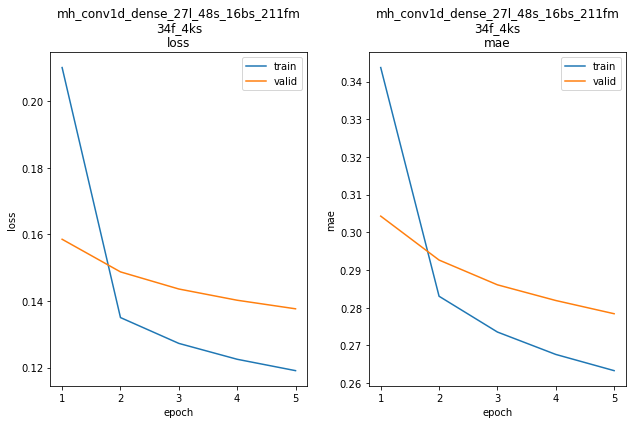

mh_conv1d_dense_27l_48s_16bs_211fm_34f_4ks train min loss: 0.119096	mae: 0.263327	epoch: 5
mh_conv1d_dense_27l_48s_16bs_211fm_34f_4ks valid min loss: 0.137665	mae: 0.278421	epoch: 5

mh_conv1d_dense_27l_48s_16bs_211fm_34f_4ks
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 302.8865
Function value obtained: 0.1377
Current minimum: 0.1317
Iteration No: 5 started. Evaluating function at random point.
lags 47
feat_maps 128
filters 64
kern_size 3
Epoch 1/5
11758/11758 [==============================] - 34s 3ms/step - loss: 27.5437 - mae: 0.5103


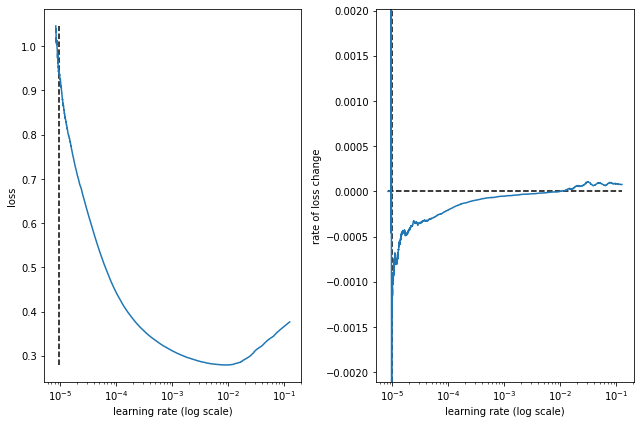

best lr: 9.7004195e-06 

Model: "mh_conv1d_dense_47l_48s_16bs_128fm_64f_3ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_12 (InputLayer)          [(None, 47, 10)]     0           []                               
                                                                                                  
 conv1d_33 (Conv1D)             (None, 41, 64)       4544        ['input_12[0][0]']               
                                                                                                  
 conv1d_34 (Conv1D)             (None, 38, 64)       6464        ['input_12[0][0]']               
                                                                                                  
 conv1d_35 (Conv1D)             (None, 35, 64)       8384        ['input_12[0][0]']               
                                

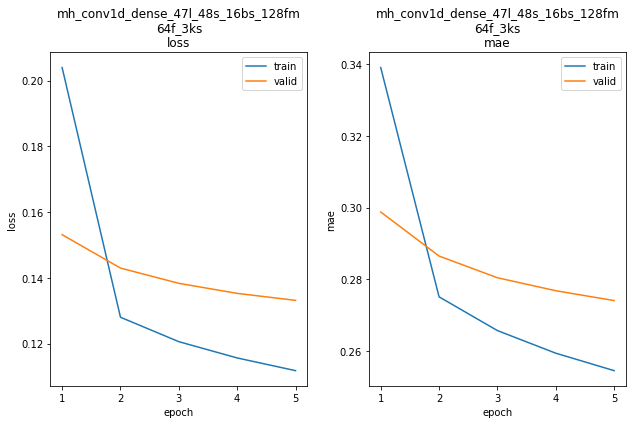

mh_conv1d_dense_47l_48s_16bs_128fm_64f_3ks train min loss: 0.111763	mae: 0.254568	epoch: 5
mh_conv1d_dense_47l_48s_16bs_128fm_64f_3ks valid min loss: 0.133145	mae: 0.274094	epoch: 5

mh_conv1d_dense_47l_48s_16bs_128fm_64f_3ks
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 308.5121
Function value obtained: 0.1331
Current minimum: 0.1317
Iteration No: 6 started. Evaluating function at random point.
lags 39
feat_maps 129
filters 33
kern_size 3
Epoch 1/5
11758/11758 [==============================] - 32s 3ms/step - loss: 4.2191 - mae: 0.4680


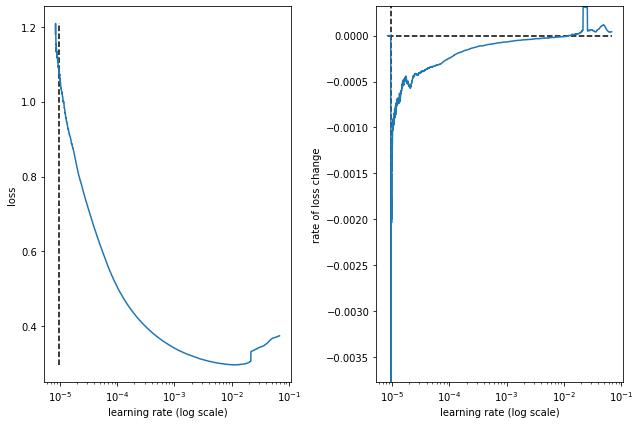

best lr: 9.5486575e-06 

Model: "mh_conv1d_dense_39l_48s_16bs_129fm_33f_3ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(None, 39, 10)]     0           []                               
                                                                                                  
 conv1d_36 (Conv1D)             (None, 33, 33)       2343        ['input_13[0][0]']               
                                                                                                  
 conv1d_37 (Conv1D)             (None, 30, 33)       3333        ['input_13[0][0]']               
                                                                                                  
 conv1d_38 (Conv1D)             (None, 27, 33)       4323        ['input_13[0][0]']               
                                

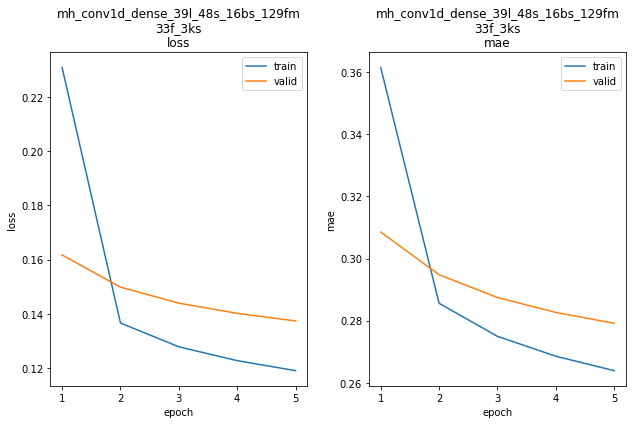

mh_conv1d_dense_39l_48s_16bs_129fm_33f_3ks train min loss: 0.119012	mae: 0.263894	epoch: 5
mh_conv1d_dense_39l_48s_16bs_129fm_33f_3ks valid min loss: 0.137361	mae: 0.279144	epoch: 5

mh_conv1d_dense_39l_48s_16bs_129fm_33f_3ks
Iteration No: 6 ended. Evaluation done at random point.
Time taken: 418.2233
Function value obtained: 0.1374
Current minimum: 0.1317
Iteration No: 7 started. Evaluating function at random point.
lags 34
feat_maps 134
filters 63
kern_size 2
Epoch 1/5
11759/11759 [==============================] - 48s 4ms/step - loss: 1.0464 - mae: 0.6795


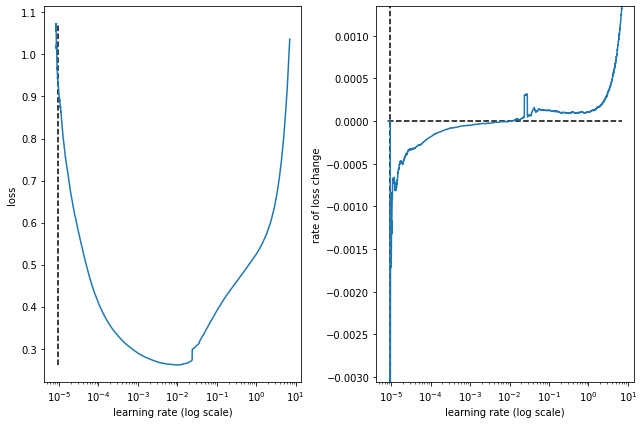

best lr: 9.531799e-06 

Model: "mh_conv1d_dense_34l_48s_16bs_134fm_63f_2ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_14 (InputLayer)          [(None, 34, 10)]     0           []                               
                                                                                                  
 conv1d_39 (Conv1D)             (None, 30, 63)       3213        ['input_14[0][0]']               
                                                                                                  
 conv1d_40 (Conv1D)             (None, 28, 63)       4473        ['input_14[0][0]']               
                                                                                                  
 conv1d_41 (Conv1D)             (None, 26, 63)       5733        ['input_14[0][0]']               
                                 

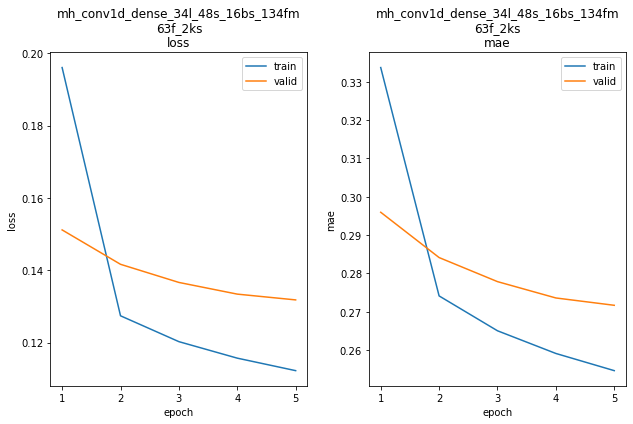

mh_conv1d_dense_34l_48s_16bs_134fm_63f_2ks train min loss: 0.112250	mae: 0.254634	epoch: 5
mh_conv1d_dense_34l_48s_16bs_134fm_63f_2ks valid min loss: 0.131801	mae: 0.271681	epoch: 5

mh_conv1d_dense_34l_48s_16bs_134fm_63f_2ks
Iteration No: 7 ended. Evaluation done at random point.
Time taken: 321.3273
Function value obtained: 0.1318
Current minimum: 0.1317
Iteration No: 8 started. Evaluating function at random point.
lags 26
feat_maps 207
filters 44
kern_size 5
Epoch 1/5
11759/11759 [==============================] - 49s 4ms/step - loss: 1.0724 - mae: 0.6930


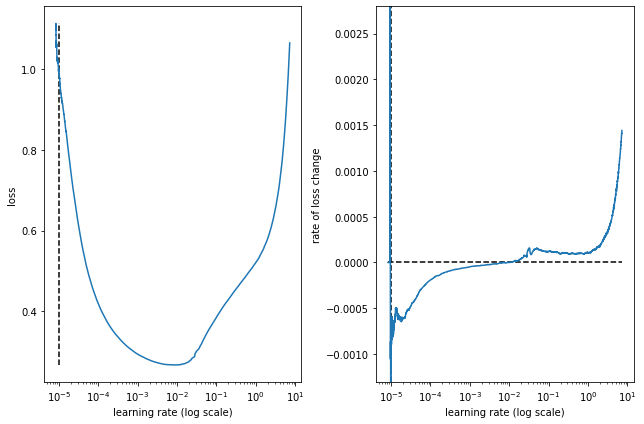

best lr: 9.819951e-06 

Model: "mh_conv1d_dense_26l_48s_16bs_207fm_44f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_15 (InputLayer)          [(None, 26, 10)]     0           []                               
                                                                                                  
 conv1d_42 (Conv1D)             (None, 16, 44)       4884        ['input_15[0][0]']               
                                                                                                  
 conv1d_43 (Conv1D)             (None, 11, 44)       7084        ['input_15[0][0]']               
                                                                                                  
 conv1d_44 (Conv1D)             (None, 6, 44)        9284        ['input_15[0][0]']               
                                 

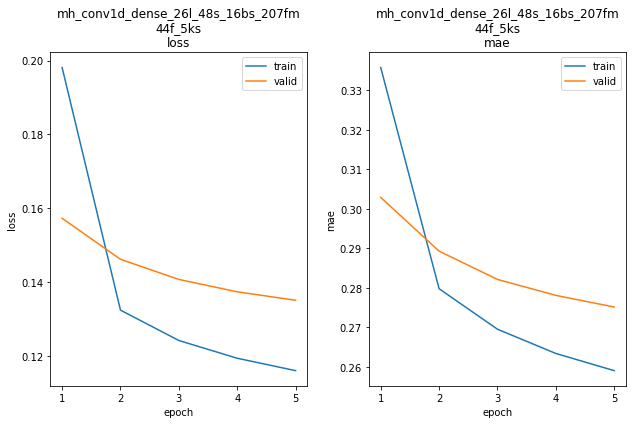

mh_conv1d_dense_26l_48s_16bs_207fm_44f_5ks train min loss: 0.115992	mae: 0.259045	epoch: 5
mh_conv1d_dense_26l_48s_16bs_207fm_44f_5ks valid min loss: 0.135063	mae: 0.275154	epoch: 5

mh_conv1d_dense_26l_48s_16bs_207fm_44f_5ks
Iteration No: 8 ended. Evaluation done at random point.
Time taken: 320.4878
Function value obtained: 0.1351
Current minimum: 0.1317
Iteration No: 9 started. Evaluating function at random point.
lags 35
feat_maps 238
filters 54
kern_size 3
Epoch 1/5
11758/11758 [==============================] - 49s 4ms/step - loss: 0.9637 - mae: 0.6511


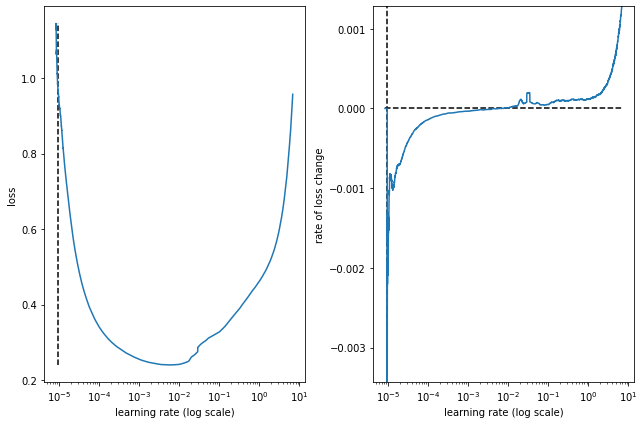

best lr: 9.531942e-06 

Model: "mh_conv1d_dense_35l_48s_16bs_238fm_54f_3ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_16 (InputLayer)          [(None, 35, 10)]     0           []                               
                                                                                                  
 conv1d_45 (Conv1D)             (None, 29, 54)       3834        ['input_16[0][0]']               
                                                                                                  
 conv1d_46 (Conv1D)             (None, 26, 54)       5454        ['input_16[0][0]']               
                                                                                                  
 conv1d_47 (Conv1D)             (None, 23, 54)       7074        ['input_16[0][0]']               
                                 

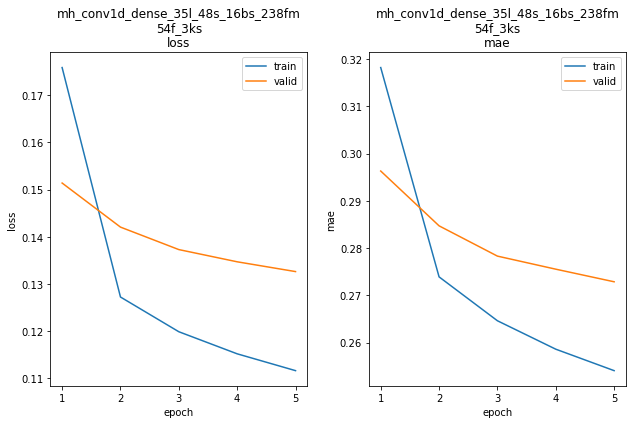

mh_conv1d_dense_35l_48s_16bs_238fm_54f_3ks train min loss: 0.111615	mae: 0.254043	epoch: 5
mh_conv1d_dense_35l_48s_16bs_238fm_54f_3ks valid min loss: 0.132613	mae: 0.272853	epoch: 5

mh_conv1d_dense_35l_48s_16bs_238fm_54f_3ks
Iteration No: 9 ended. Evaluation done at random point.
Time taken: 427.7543
Function value obtained: 0.1326
Current minimum: 0.1317
Iteration No: 10 started. Evaluating function at random point.
lags 24
feat_maps 249
filters 50
kern_size 3
Epoch 1/5
11759/11759 [==============================] - 42s 4ms/step - loss: 1.0142 - mae: 0.5343


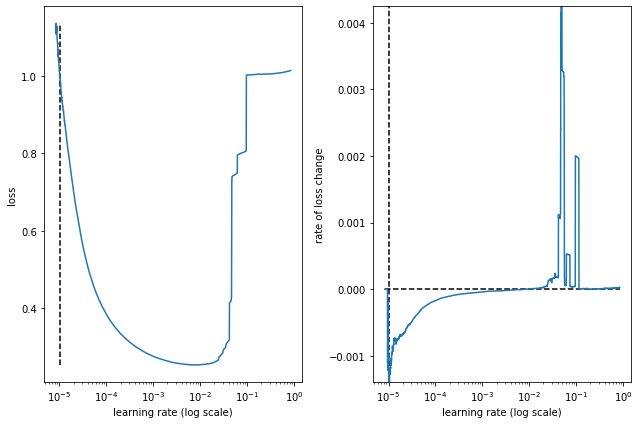

best lr: 1.0440924e-05 

Model: "mh_conv1d_dense_24l_48s_16bs_249fm_50f_3ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_17 (InputLayer)          [(None, 24, 10)]     0           []                               
                                                                                                  
 conv1d_48 (Conv1D)             (None, 18, 50)       3550        ['input_17[0][0]']               
                                                                                                  
 conv1d_49 (Conv1D)             (None, 15, 50)       5050        ['input_17[0][0]']               
                                                                                                  
 conv1d_50 (Conv1D)             (None, 12, 50)       6550        ['input_17[0][0]']               
                                

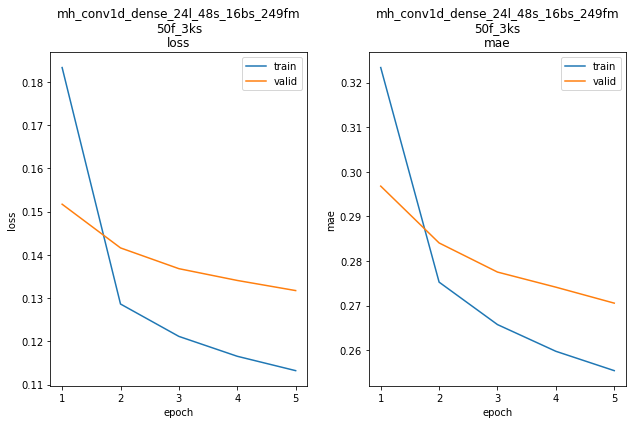

mh_conv1d_dense_24l_48s_16bs_249fm_50f_3ks train min loss: 0.113236	mae: 0.255417	epoch: 5
mh_conv1d_dense_24l_48s_16bs_249fm_50f_3ks valid min loss: 0.131744	mae: 0.270550	epoch: 5

mh_conv1d_dense_24l_48s_16bs_249fm_50f_3ks
Iteration No: 10 ended. Evaluation done at random point.
Time taken: 347.0806
Function value obtained: 0.1317
Current minimum: 0.1317
Iteration No: 11 started. Evaluating function at random point.
lags 24
feat_maps 158
filters 40
kern_size 4
Epoch 1/5
11759/11759 [==============================] - 50s 4ms/step - loss: 1.1730 - mae: 0.6792


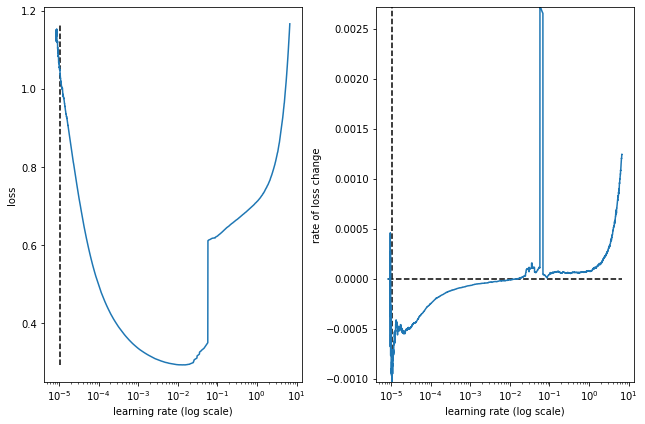

best lr: 1.0440924e-05 

Model: "mh_conv1d_dense_24l_48s_16bs_158fm_40f_4ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_18 (InputLayer)          [(None, 24, 10)]     0           []                               
                                                                                                  
 conv1d_51 (Conv1D)             (None, 16, 40)       3640        ['input_18[0][0]']               
                                                                                                  
 conv1d_52 (Conv1D)             (None, 12, 40)       5240        ['input_18[0][0]']               
                                                                                                  
 conv1d_53 (Conv1D)             (None, 8, 40)        6840        ['input_18[0][0]']               
                                

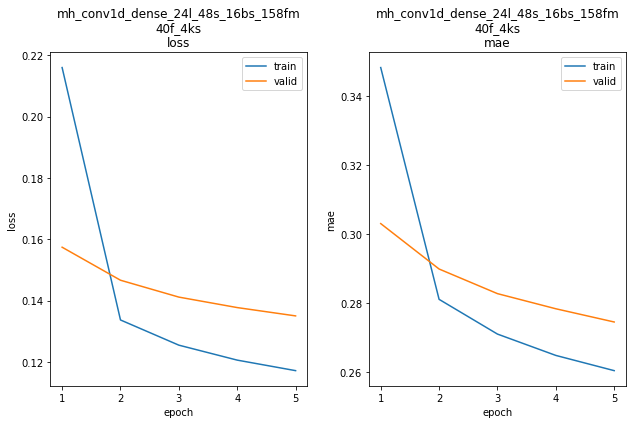

mh_conv1d_dense_24l_48s_16bs_158fm_40f_4ks train min loss: 0.117114	mae: 0.260519	epoch: 5
mh_conv1d_dense_24l_48s_16bs_158fm_40f_4ks valid min loss: 0.134982	mae: 0.274610	epoch: 5

mh_conv1d_dense_24l_48s_16bs_158fm_40f_4ks
Iteration No: 11 ended. Evaluation done at random point.
Time taken: 426.5135
Function value obtained: 0.1350
Current minimum: 0.1317
Iteration No: 12 started. Evaluating function at random point.
lags 42
feat_maps 255
filters 63
kern_size 1
Epoch 1/5
11758/11758 [==============================] - 35s 3ms/step - loss: 1.0507 - mae: 0.4175


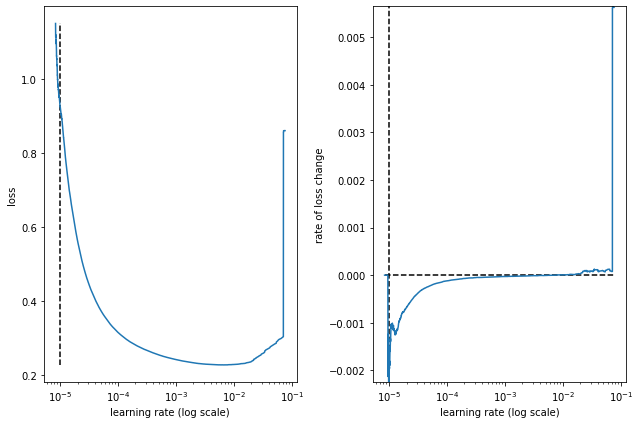

best lr: 9.837342e-06 

Model: "mh_conv1d_dense_42l_48s_16bs_255fm_63f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_19 (InputLayer)          [(None, 42, 10)]     0           []                               
                                                                                                  
 conv1d_54 (Conv1D)             (None, 40, 63)       1953        ['input_19[0][0]']               
                                                                                                  
 conv1d_55 (Conv1D)             (None, 39, 63)       2583        ['input_19[0][0]']               
                                                                                                  
 conv1d_56 (Conv1D)             (None, 38, 63)       3213        ['input_19[0][0]']               
                                 

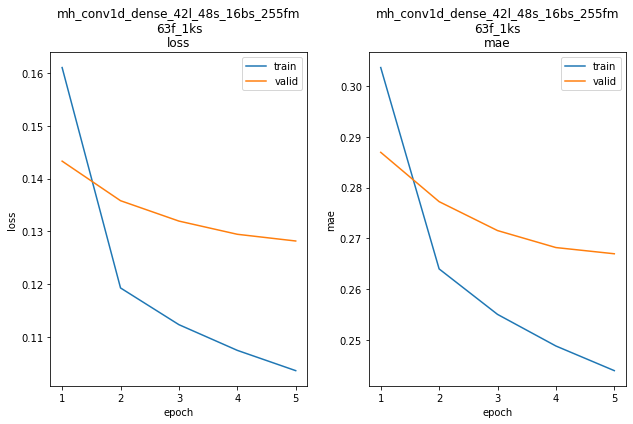

mh_conv1d_dense_42l_48s_16bs_255fm_63f_1ks train min loss: 0.103589	mae: 0.243974	epoch: 5
mh_conv1d_dense_42l_48s_16bs_255fm_63f_1ks valid min loss: 0.128179	mae: 0.266985	epoch: 5

mh_conv1d_dense_42l_48s_16bs_255fm_63f_1ks
Iteration No: 12 ended. Evaluation done at random point.
Time taken: 386.7123
Function value obtained: 0.1282
Current minimum: 0.1282
Iteration No: 13 started. Searching for the next optimal point.
lags 31
feat_maps 254
filters 64
kern_size 5
Epoch 1/5
11759/11759 [==============================] - 50s 4ms/step - loss: 1.0165 - mae: 0.6384


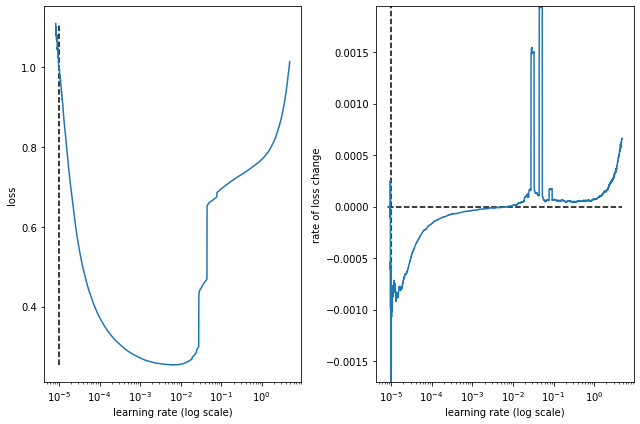

best lr: 9.819951e-06 

Model: "mh_conv1d_dense_31l_48s_16bs_254fm_64f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_20 (InputLayer)          [(None, 31, 10)]     0           []                               
                                                                                                  
 conv1d_57 (Conv1D)             (None, 21, 64)       7104        ['input_20[0][0]']               
                                                                                                  
 conv1d_58 (Conv1D)             (None, 16, 64)       10304       ['input_20[0][0]']               
                                                                                                  
 conv1d_59 (Conv1D)             (None, 11, 64)       13504       ['input_20[0][0]']               
                                 

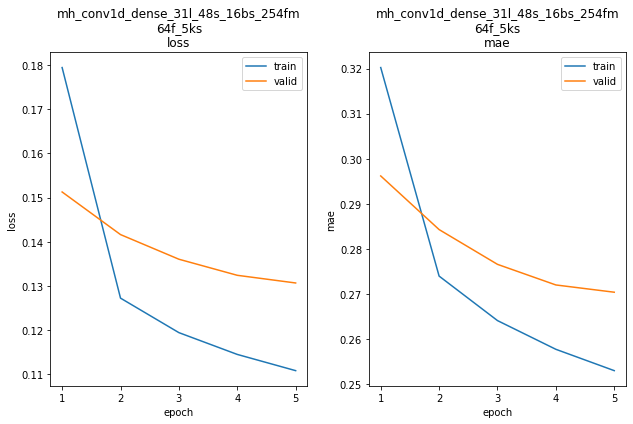

mh_conv1d_dense_31l_48s_16bs_254fm_64f_5ks train min loss: 0.110799	mae: 0.252977	epoch: 5
mh_conv1d_dense_31l_48s_16bs_254fm_64f_5ks valid min loss: 0.130658	mae: 0.270381	epoch: 5

mh_conv1d_dense_31l_48s_16bs_254fm_64f_5ks
Iteration No: 13 ended. Search finished for the next optimal point.
Time taken: 394.1218
Function value obtained: 0.1307
Current minimum: 0.1282
Iteration No: 14 started. Searching for the next optimal point.
lags 42
feat_maps 255
filters 32
kern_size 1
Epoch 1/5
11758/11758 [==============================] - 53s 4ms/step - loss: 0.9801 - mae: 0.6514


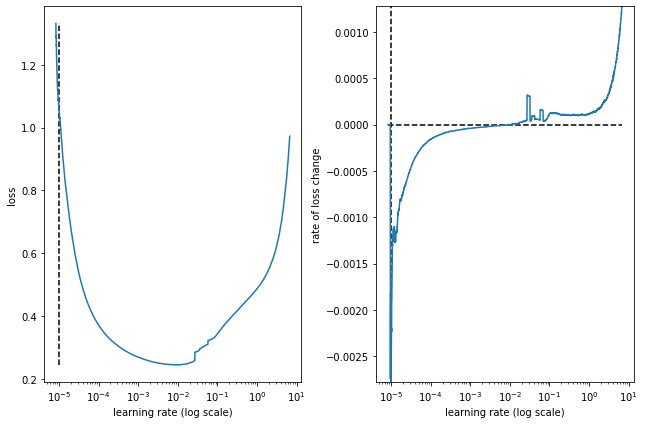

best lr: 9.837342e-06 

Model: "mh_conv1d_dense_42l_48s_16bs_255fm_32f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_21 (InputLayer)          [(None, 42, 10)]     0           []                               
                                                                                                  
 conv1d_60 (Conv1D)             (None, 40, 32)       992         ['input_21[0][0]']               
                                                                                                  
 conv1d_61 (Conv1D)             (None, 39, 32)       1312        ['input_21[0][0]']               
                                                                                                  
 conv1d_62 (Conv1D)             (None, 38, 32)       1632        ['input_21[0][0]']               
                                 

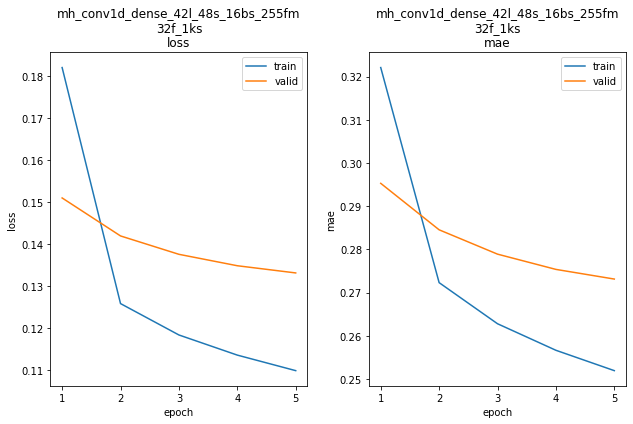

mh_conv1d_dense_42l_48s_16bs_255fm_32f_1ks train min loss: 0.109835	mae: 0.251946	epoch: 5
mh_conv1d_dense_42l_48s_16bs_255fm_32f_1ks valid min loss: 0.133099	mae: 0.273143	epoch: 5

mh_conv1d_dense_42l_48s_16bs_255fm_32f_1ks
Iteration No: 14 ended. Search finished for the next optimal point.
Time taken: 429.7946
Function value obtained: 0.1331
Current minimum: 0.1282
Iteration No: 15 started. Searching for the next optimal point.
lags 43
feat_maps 201
filters 64
kern_size 1
Epoch 1/5
11758/11758 [==============================] - 53s 4ms/step - loss: 0.9225 - mae: 0.6488


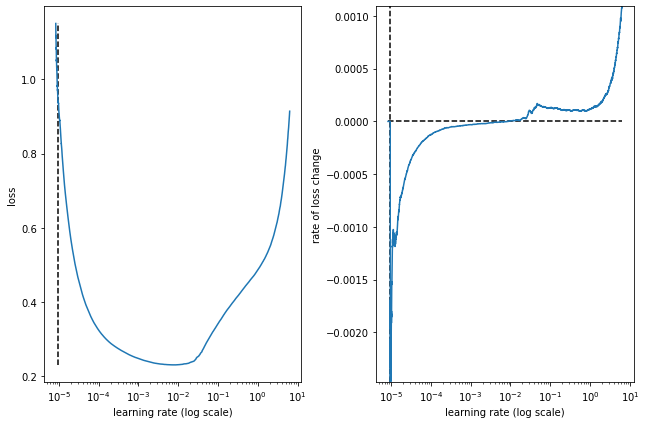

best lr: 9.598979e-06 

Model: "mh_conv1d_dense_43l_48s_16bs_201fm_64f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_22 (InputLayer)          [(None, 43, 10)]     0           []                               
                                                                                                  
 conv1d_63 (Conv1D)             (None, 41, 64)       1984        ['input_22[0][0]']               
                                                                                                  
 conv1d_64 (Conv1D)             (None, 40, 64)       2624        ['input_22[0][0]']               
                                                                                                  
 conv1d_65 (Conv1D)             (None, 39, 64)       3264        ['input_22[0][0]']               
                                 

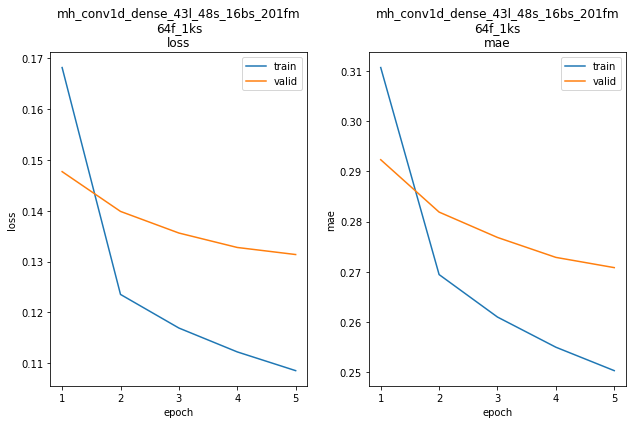

mh_conv1d_dense_43l_48s_16bs_201fm_64f_1ks train min loss: 0.108573	mae: 0.250341	epoch: 5
mh_conv1d_dense_43l_48s_16bs_201fm_64f_1ks valid min loss: 0.131389	mae: 0.270852	epoch: 5

mh_conv1d_dense_43l_48s_16bs_201fm_64f_1ks
Iteration No: 15 ended. Search finished for the next optimal point.
Time taken: 363.8142
Function value obtained: 0.1314
Current minimum: 0.1282
Iteration No: 16 started. Searching for the next optimal point.
lags 38
feat_maps 180
filters 64
kern_size 5
Epoch 1/5
11758/11758 [==============================] - 55s 5ms/step - loss: 1.0322 - mae: 0.6660


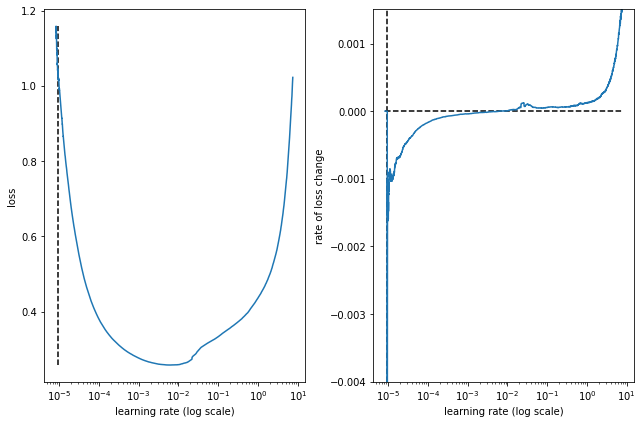

best lr: 9.5486575e-06 

Model: "mh_conv1d_dense_38l_48s_16bs_180fm_64f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_23 (InputLayer)          [(None, 38, 10)]     0           []                               
                                                                                                  
 conv1d_66 (Conv1D)             (None, 28, 64)       7104        ['input_23[0][0]']               
                                                                                                  
 conv1d_67 (Conv1D)             (None, 23, 64)       10304       ['input_23[0][0]']               
                                                                                                  
 conv1d_68 (Conv1D)             (None, 18, 64)       13504       ['input_23[0][0]']               
                                

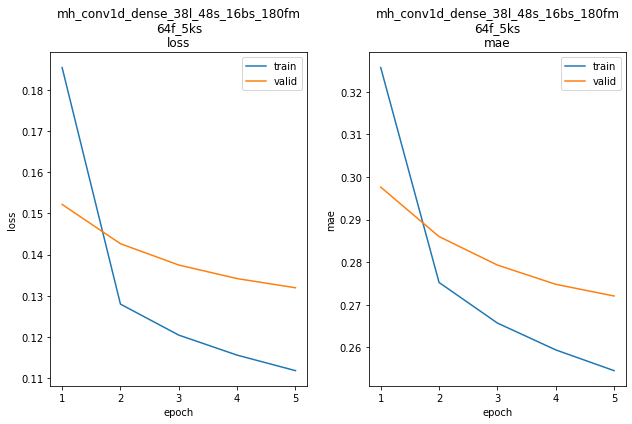

mh_conv1d_dense_38l_48s_16bs_180fm_64f_5ks train min loss: 0.111797	mae: 0.254563	epoch: 5
mh_conv1d_dense_38l_48s_16bs_180fm_64f_5ks valid min loss: 0.131927	mae: 0.272079	epoch: 5

mh_conv1d_dense_38l_48s_16bs_180fm_64f_5ks
Iteration No: 16 ended. Search finished for the next optimal point.
Time taken: 366.3033
Function value obtained: 0.1319
Current minimum: 0.1282
Iteration No: 17 started. Searching for the next optimal point.
lags 48
feat_maps 255
filters 33
kern_size 5
Epoch 1/5
11758/11758 [==============================] - 35s 3ms/step - loss: 3.2971 - mae: 0.4449


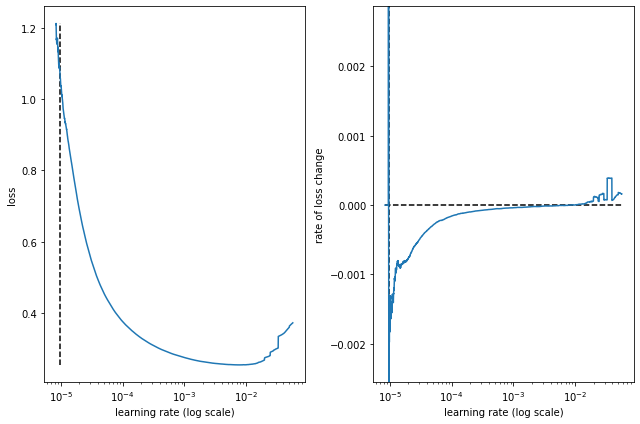

best lr: 9.649566e-06 

Model: "mh_conv1d_dense_48l_48s_16bs_255fm_33f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_24 (InputLayer)          [(None, 48, 10)]     0           []                               
                                                                                                  
 conv1d_69 (Conv1D)             (None, 38, 33)       3663        ['input_24[0][0]']               
                                                                                                  
 conv1d_70 (Conv1D)             (None, 33, 33)       5313        ['input_24[0][0]']               
                                                                                                  
 conv1d_71 (Conv1D)             (None, 28, 33)       6963        ['input_24[0][0]']               
                                 

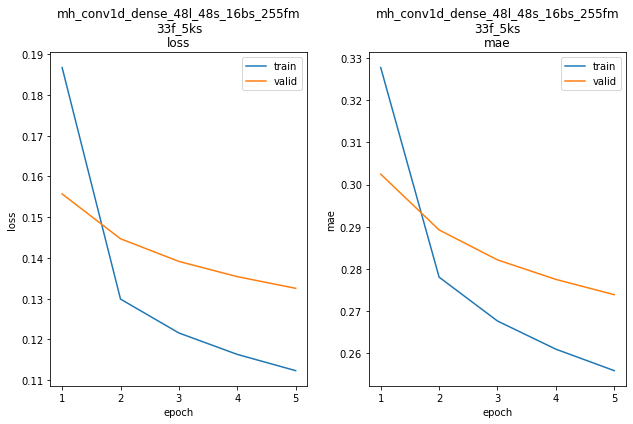

mh_conv1d_dense_48l_48s_16bs_255fm_33f_5ks train min loss: 0.112343	mae: 0.255873	epoch: 5
mh_conv1d_dense_48l_48s_16bs_255fm_33f_5ks valid min loss: 0.132555	mae: 0.273892	epoch: 5

mh_conv1d_dense_48l_48s_16bs_255fm_33f_5ks
Iteration No: 17 ended. Search finished for the next optimal point.
Time taken: 349.2270
Function value obtained: 0.1326
Current minimum: 0.1282
Iteration No: 18 started. Searching for the next optimal point.
lags 39
feat_maps 195
filters 32
kern_size 1
Epoch 1/5
11758/11758 [==============================] - 39s 3ms/step - loss: 3.7193 - mae: 0.4642


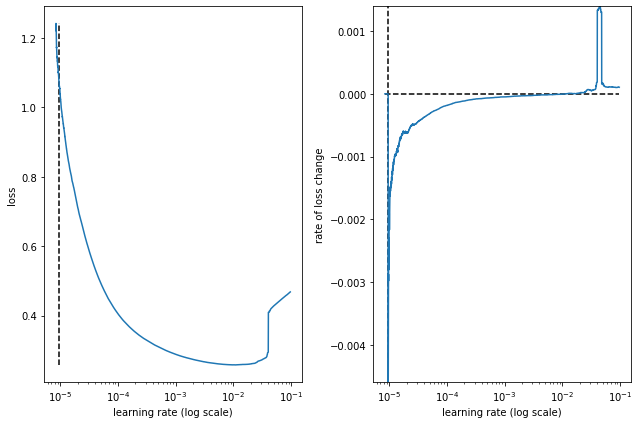

best lr: 9.5486575e-06 

Model: "mh_conv1d_dense_39l_48s_16bs_195fm_32f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_25 (InputLayer)          [(None, 39, 10)]     0           []                               
                                                                                                  
 conv1d_72 (Conv1D)             (None, 37, 32)       992         ['input_25[0][0]']               
                                                                                                  
 conv1d_73 (Conv1D)             (None, 36, 32)       1312        ['input_25[0][0]']               
                                                                                                  
 conv1d_74 (Conv1D)             (None, 35, 32)       1632        ['input_25[0][0]']               
                                

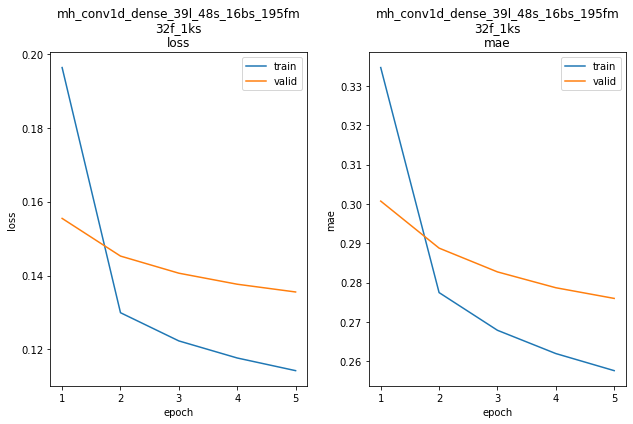

mh_conv1d_dense_39l_48s_16bs_195fm_32f_1ks train min loss: 0.114257	mae: 0.257614	epoch: 5
mh_conv1d_dense_39l_48s_16bs_195fm_32f_1ks valid min loss: 0.135547	mae: 0.275986	epoch: 5

mh_conv1d_dense_39l_48s_16bs_195fm_32f_1ks
Iteration No: 18 ended. Search finished for the next optimal point.
Time taken: 351.1667
Function value obtained: 0.1355
Current minimum: 0.1282
Iteration No: 19 started. Searching for the next optimal point.
lags 34
feat_maps 129
filters 52
kern_size 5
Epoch 1/5
11759/11759 [==============================] - 58s 5ms/step - loss: 1.1813 - mae: 0.7145


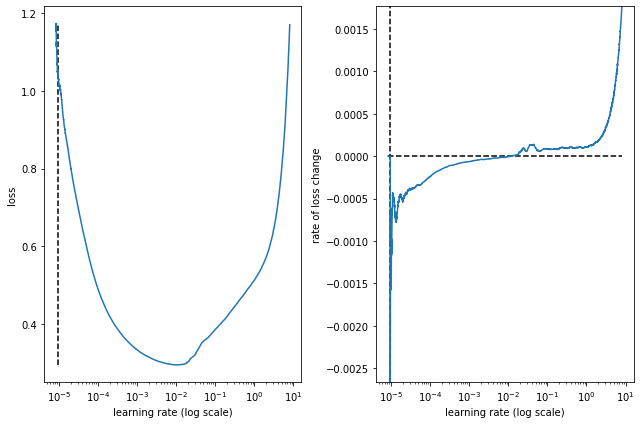

best lr: 9.531799e-06 

Model: "mh_conv1d_dense_34l_48s_16bs_129fm_52f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_26 (InputLayer)          [(None, 34, 10)]     0           []                               
                                                                                                  
 conv1d_75 (Conv1D)             (None, 24, 52)       5772        ['input_26[0][0]']               
                                                                                                  
 conv1d_76 (Conv1D)             (None, 19, 52)       8372        ['input_26[0][0]']               
                                                                                                  
 conv1d_77 (Conv1D)             (None, 14, 52)       10972       ['input_26[0][0]']               
                                 

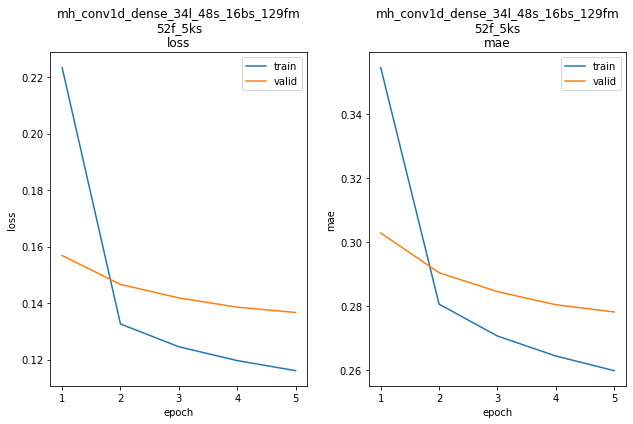

mh_conv1d_dense_34l_48s_16bs_129fm_52f_5ks train min loss: 0.116127	mae: 0.259807	epoch: 5
mh_conv1d_dense_34l_48s_16bs_129fm_52f_5ks valid min loss: 0.136703	mae: 0.278150	epoch: 5

mh_conv1d_dense_34l_48s_16bs_129fm_52f_5ks
Iteration No: 19 ended. Search finished for the next optimal point.
Time taken: 437.2321
Function value obtained: 0.1367
Current minimum: 0.1282
Iteration No: 20 started. Searching for the next optimal point.
lags 32
feat_maps 214
filters 63
kern_size 5
Epoch 1/5
11759/11759 [==============================] - 56s 5ms/step - loss: 1.0117 - mae: 0.6631


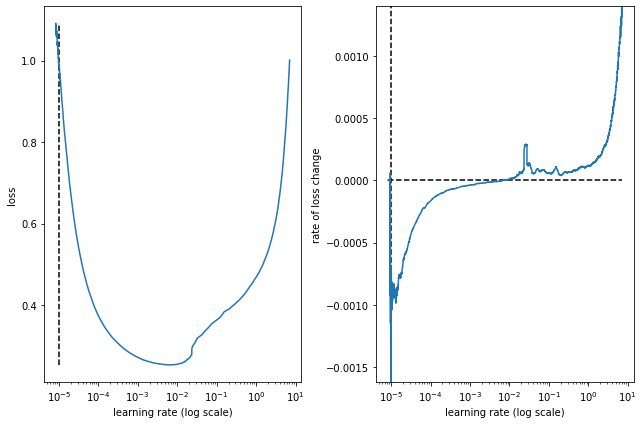

best lr: 9.819951e-06 

Model: "mh_conv1d_dense_32l_48s_16bs_214fm_63f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_27 (InputLayer)          [(None, 32, 10)]     0           []                               
                                                                                                  
 conv1d_78 (Conv1D)             (None, 22, 63)       6993        ['input_27[0][0]']               
                                                                                                  
 conv1d_79 (Conv1D)             (None, 17, 63)       10143       ['input_27[0][0]']               
                                                                                                  
 conv1d_80 (Conv1D)             (None, 12, 63)       13293       ['input_27[0][0]']               
                                 

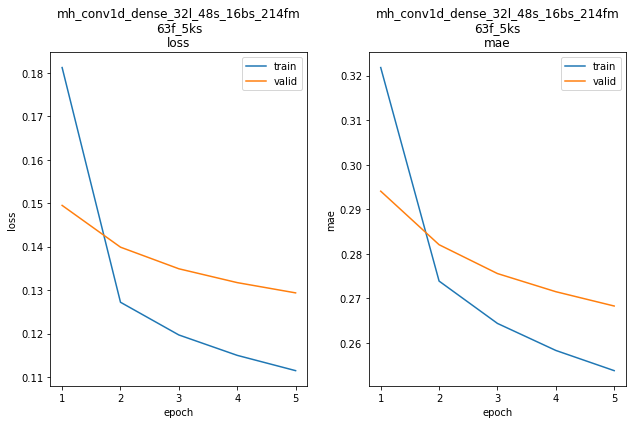

mh_conv1d_dense_32l_48s_16bs_214fm_63f_5ks train min loss: 0.111490	mae: 0.253801	epoch: 5
mh_conv1d_dense_32l_48s_16bs_214fm_63f_5ks valid min loss: 0.129375	mae: 0.268305	epoch: 5

mh_conv1d_dense_32l_48s_16bs_214fm_63f_5ks
Iteration No: 20 ended. Search finished for the next optimal point.
Time taken: 397.9606
Function value obtained: 0.1294
Current minimum: 0.1282
Iteration No: 21 started. Searching for the next optimal point.
lags 35
feat_maps 166
filters 64
kern_size 1
Epoch 1/5
11758/11758 [==============================] - 55s 5ms/step - loss: 0.9851 - mae: 0.6538


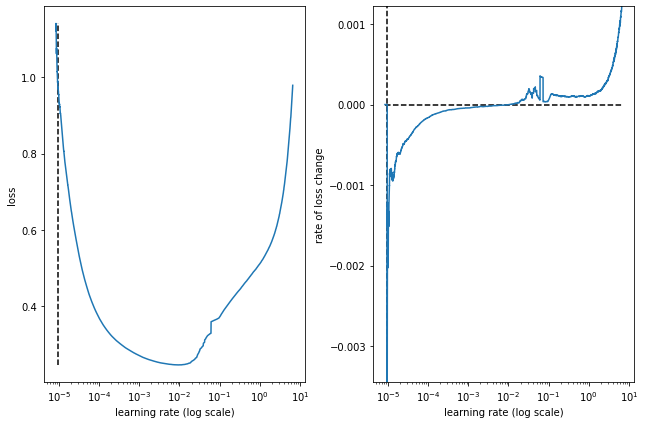

best lr: 9.531942e-06 

Model: "mh_conv1d_dense_35l_48s_16bs_166fm_64f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_28 (InputLayer)          [(None, 35, 10)]     0           []                               
                                                                                                  
 conv1d_81 (Conv1D)             (None, 33, 64)       1984        ['input_28[0][0]']               
                                                                                                  
 conv1d_82 (Conv1D)             (None, 32, 64)       2624        ['input_28[0][0]']               
                                                                                                  
 conv1d_83 (Conv1D)             (None, 31, 64)       3264        ['input_28[0][0]']               
                                 

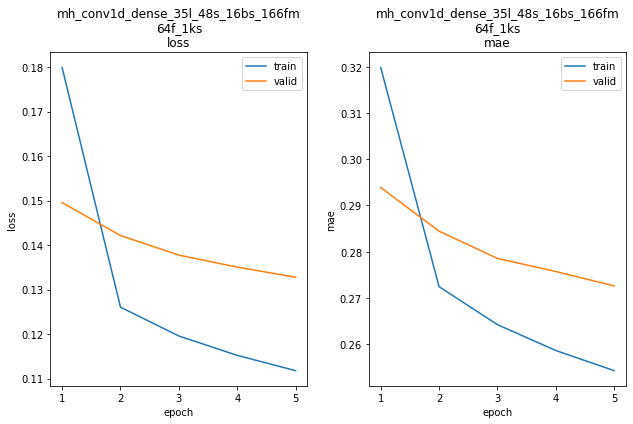

mh_conv1d_dense_35l_48s_16bs_166fm_64f_1ks train min loss: 0.111775	mae: 0.254295	epoch: 5
mh_conv1d_dense_35l_48s_16bs_166fm_64f_1ks valid min loss: 0.132769	mae: 0.272606	epoch: 5

mh_conv1d_dense_35l_48s_16bs_166fm_64f_1ks
Iteration No: 21 ended. Search finished for the next optimal point.
Time taken: 433.7910
Function value obtained: 0.1328
Current minimum: 0.1282
Iteration No: 22 started. Searching for the next optimal point.
lags 35
feat_maps 229
filters 64
kern_size 1
Epoch 1/5
11758/11758 [==============================] - 57s 5ms/step - loss: 0.9324 - mae: 0.6294


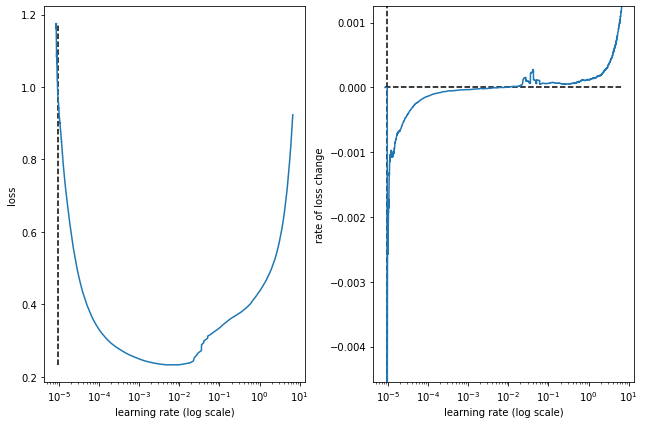

best lr: 9.531942e-06 

Model: "mh_conv1d_dense_35l_48s_16bs_229fm_64f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_29 (InputLayer)          [(None, 35, 10)]     0           []                               
                                                                                                  
 conv1d_84 (Conv1D)             (None, 33, 64)       1984        ['input_29[0][0]']               
                                                                                                  
 conv1d_85 (Conv1D)             (None, 32, 64)       2624        ['input_29[0][0]']               
                                                                                                  
 conv1d_86 (Conv1D)             (None, 31, 64)       3264        ['input_29[0][0]']               
                                 

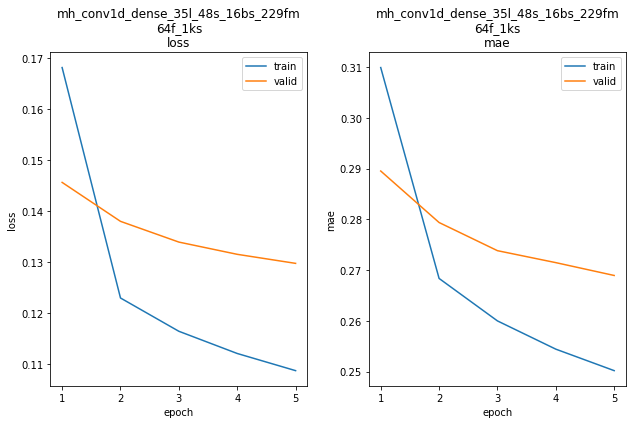

mh_conv1d_dense_35l_48s_16bs_229fm_64f_1ks train min loss: 0.108690	mae: 0.250180	epoch: 5
mh_conv1d_dense_35l_48s_16bs_229fm_64f_1ks valid min loss: 0.129748	mae: 0.268943	epoch: 5

mh_conv1d_dense_35l_48s_16bs_229fm_64f_1ks
Iteration No: 22 ended. Search finished for the next optimal point.
Time taken: 353.6355
Function value obtained: 0.1297
Current minimum: 0.1282
Iteration No: 23 started. Searching for the next optimal point.
lags 39
feat_maps 206
filters 49
kern_size 1
Epoch 1/5
11758/11758 [==============================] - 56s 5ms/step - loss: 0.9670 - mae: 0.6627


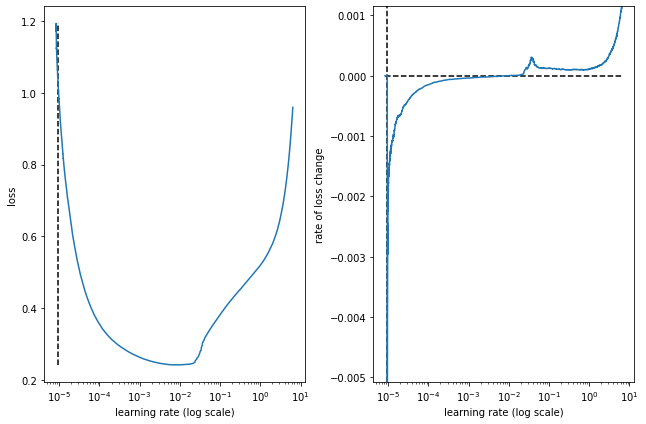

best lr: 9.5486575e-06 

Model: "mh_conv1d_dense_39l_48s_16bs_206fm_49f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_30 (InputLayer)          [(None, 39, 10)]     0           []                               
                                                                                                  
 conv1d_87 (Conv1D)             (None, 37, 49)       1519        ['input_30[0][0]']               
                                                                                                  
 conv1d_88 (Conv1D)             (None, 36, 49)       2009        ['input_30[0][0]']               
                                                                                                  
 conv1d_89 (Conv1D)             (None, 35, 49)       2499        ['input_30[0][0]']               
                                

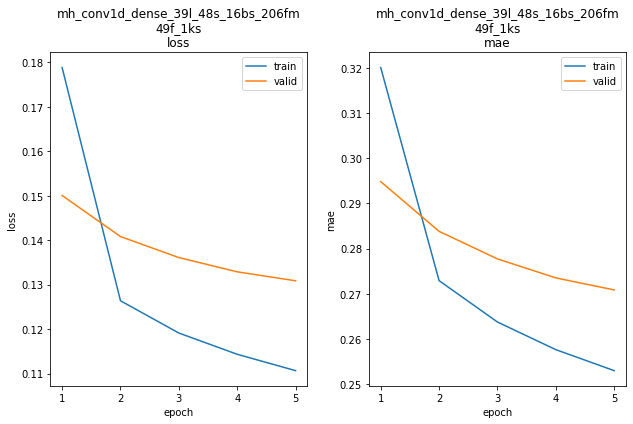

mh_conv1d_dense_39l_48s_16bs_206fm_49f_1ks train min loss: 0.110662	mae: 0.252980	epoch: 5
mh_conv1d_dense_39l_48s_16bs_206fm_49f_1ks valid min loss: 0.130879	mae: 0.270852	epoch: 5

mh_conv1d_dense_39l_48s_16bs_206fm_49f_1ks
Iteration No: 23 ended. Search finished for the next optimal point.
Time taken: 399.7311
Function value obtained: 0.1309
Current minimum: 0.1282
Iteration No: 24 started. Searching for the next optimal point.
lags 28
feat_maps 255
filters 49
kern_size 1
Epoch 1/5
11759/11759 [==============================] - 57s 5ms/step - loss: 0.9698 - mae: 0.6416


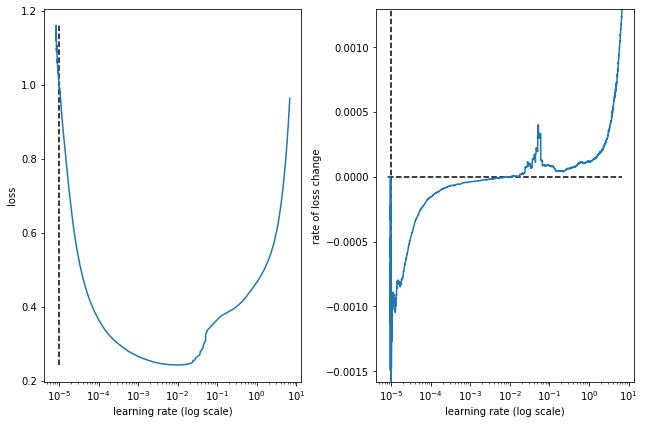

best lr: 1.0028581e-05 

Model: "mh_conv1d_dense_28l_48s_16bs_255fm_49f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_31 (InputLayer)          [(None, 28, 10)]     0           []                               
                                                                                                  
 conv1d_90 (Conv1D)             (None, 26, 49)       1519        ['input_31[0][0]']               
                                                                                                  
 conv1d_91 (Conv1D)             (None, 25, 49)       2009        ['input_31[0][0]']               
                                                                                                  
 conv1d_92 (Conv1D)             (None, 24, 49)       2499        ['input_31[0][0]']               
                                

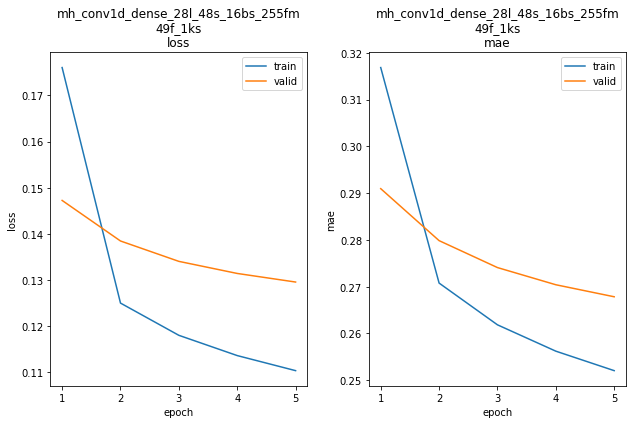

mh_conv1d_dense_28l_48s_16bs_255fm_49f_1ks train min loss: 0.110357	mae: 0.252058	epoch: 5
mh_conv1d_dense_28l_48s_16bs_255fm_49f_1ks valid min loss: 0.129560	mae: 0.267848	epoch: 5

mh_conv1d_dense_28l_48s_16bs_255fm_49f_1ks
Iteration No: 24 ended. Search finished for the next optimal point.
Time taken: 469.2459
Function value obtained: 0.1296
Current minimum: 0.1282
Iteration No: 25 started. Searching for the next optimal point.
lags 25
feat_maps 256
filters 64
kern_size 3
Epoch 1/5
11759/11759 [==============================] - 58s 5ms/step - loss: 0.9911 - mae: 0.6671


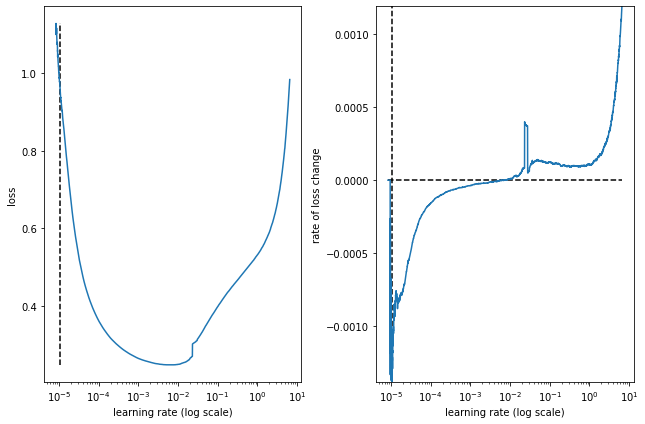

best lr: 1.0440924e-05 

Model: "mh_conv1d_dense_25l_48s_16bs_256fm_64f_3ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_32 (InputLayer)          [(None, 25, 10)]     0           []                               
                                                                                                  
 conv1d_93 (Conv1D)             (None, 19, 64)       4544        ['input_32[0][0]']               
                                                                                                  
 conv1d_94 (Conv1D)             (None, 16, 64)       6464        ['input_32[0][0]']               
                                                                                                  
 conv1d_95 (Conv1D)             (None, 13, 64)       8384        ['input_32[0][0]']               
                                

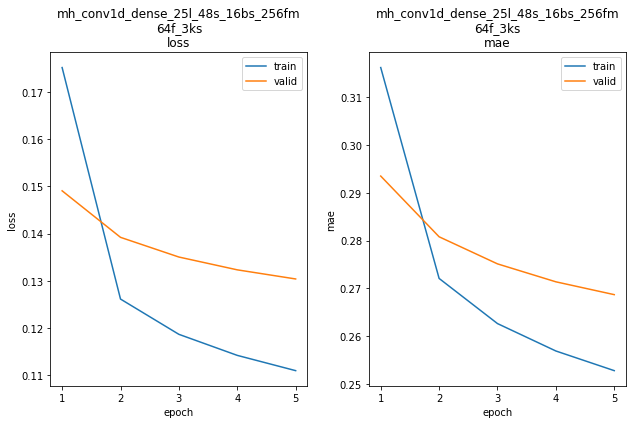

mh_conv1d_dense_25l_48s_16bs_256fm_64f_3ks train min loss: 0.110975	mae: 0.252779	epoch: 5
mh_conv1d_dense_25l_48s_16bs_256fm_64f_3ks valid min loss: 0.130396	mae: 0.268697	epoch: 5

mh_conv1d_dense_25l_48s_16bs_256fm_64f_3ks
Iteration No: 25 ended. Search finished for the next optimal point.
Time taken: 389.7044
Function value obtained: 0.1304
Current minimum: 0.1282
Iteration No: 26 started. Searching for the next optimal point.
lags 24
feat_maps 256
filters 49
kern_size 5
Epoch 1/5
11759/11759 [==============================] - 58s 5ms/step - loss: 1.0524 - mae: 0.6817


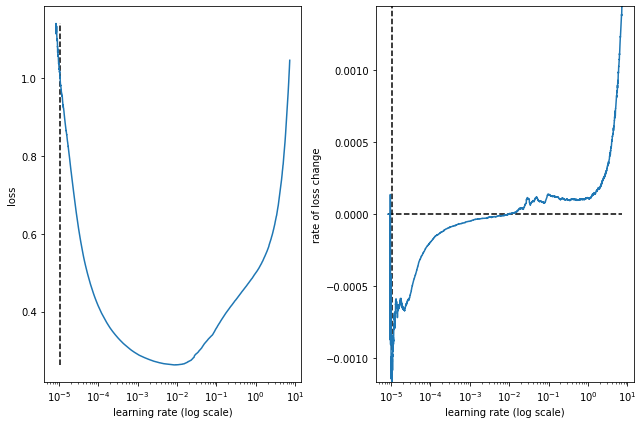

best lr: 1.0440924e-05 

Model: "mh_conv1d_dense_24l_48s_16bs_256fm_49f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_33 (InputLayer)          [(None, 24, 10)]     0           []                               
                                                                                                  
 conv1d_96 (Conv1D)             (None, 14, 49)       5439        ['input_33[0][0]']               
                                                                                                  
 conv1d_97 (Conv1D)             (None, 9, 49)        7889        ['input_33[0][0]']               
                                                                                                  
 conv1d_98 (Conv1D)             (None, 4, 49)        10339       ['input_33[0][0]']               
                                

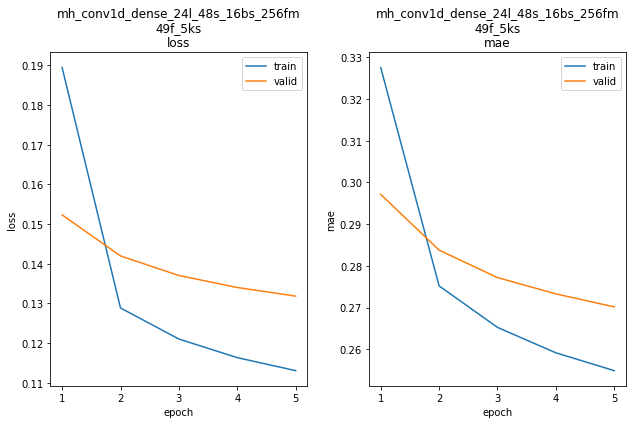

mh_conv1d_dense_24l_48s_16bs_256fm_49f_5ks train min loss: 0.113046	mae: 0.254852	epoch: 5
mh_conv1d_dense_24l_48s_16bs_256fm_49f_5ks valid min loss: 0.131840	mae: 0.270144	epoch: 5

mh_conv1d_dense_24l_48s_16bs_256fm_49f_5ks
Iteration No: 26 ended. Search finished for the next optimal point.
Time taken: 358.4284
Function value obtained: 0.1318
Current minimum: 0.1282
Iteration No: 27 started. Searching for the next optimal point.
lags 45
feat_maps 154
filters 32
kern_size 1
Epoch 1/5
11758/11758 [==============================] - 58s 5ms/step - loss: 1.0811 - mae: 0.6434


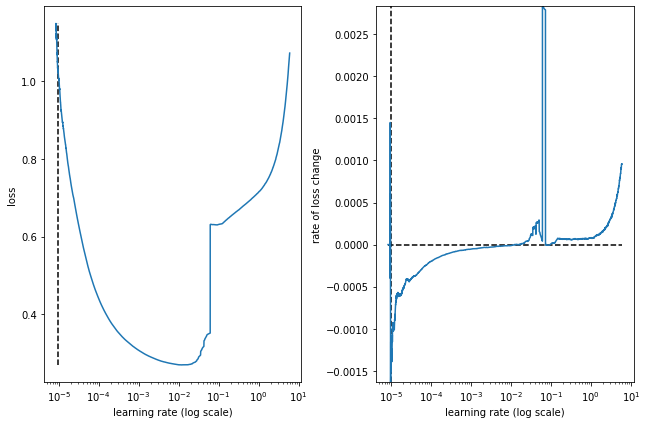

best lr: 9.7004195e-06 

Model: "mh_conv1d_dense_45l_48s_16bs_154fm_32f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_34 (InputLayer)          [(None, 45, 10)]     0           []                               
                                                                                                  
 conv1d_99 (Conv1D)             (None, 43, 32)       992         ['input_34[0][0]']               
                                                                                                  
 conv1d_100 (Conv1D)            (None, 42, 32)       1312        ['input_34[0][0]']               
                                                                                                  
 conv1d_101 (Conv1D)            (None, 41, 32)       1632        ['input_34[0][0]']               
                                

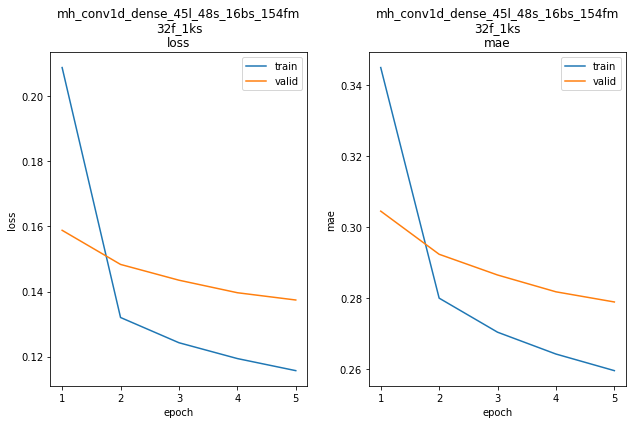

mh_conv1d_dense_45l_48s_16bs_154fm_32f_1ks train min loss: 0.115676	mae: 0.259600	epoch: 5
mh_conv1d_dense_45l_48s_16bs_154fm_32f_1ks valid min loss: 0.137393	mae: 0.278935	epoch: 5

mh_conv1d_dense_45l_48s_16bs_154fm_32f_1ks
Iteration No: 27 ended. Search finished for the next optimal point.
Time taken: 400.1914
Function value obtained: 0.1374
Current minimum: 0.1282
Iteration No: 28 started. Searching for the next optimal point.
lags 43
feat_maps 199
filters 64
kern_size 3
Epoch 1/5
11758/11758 [==============================] - 38s 3ms/step - loss: 3.2882 - mae: 0.4280


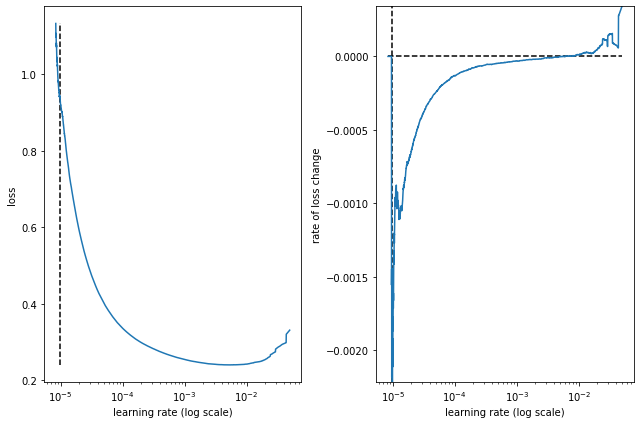

best lr: 9.837342e-06 

Model: "mh_conv1d_dense_43l_48s_16bs_199fm_64f_3ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_35 (InputLayer)          [(None, 43, 10)]     0           []                               
                                                                                                  
 conv1d_102 (Conv1D)            (None, 37, 64)       4544        ['input_35[0][0]']               
                                                                                                  
 conv1d_103 (Conv1D)            (None, 34, 64)       6464        ['input_35[0][0]']               
                                                                                                  
 conv1d_104 (Conv1D)            (None, 31, 64)       8384        ['input_35[0][0]']               
                                 

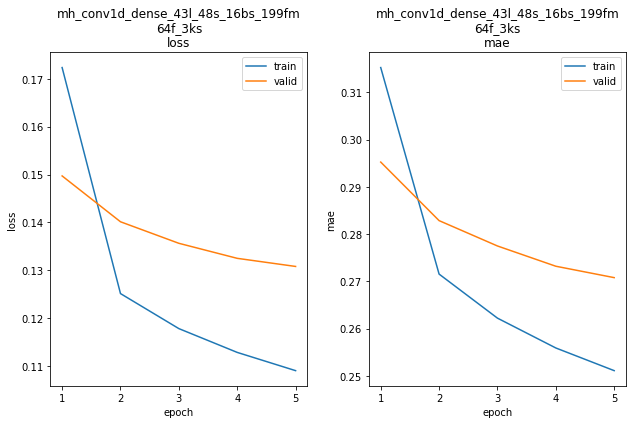

mh_conv1d_dense_43l_48s_16bs_199fm_64f_3ks train min loss: 0.109072	mae: 0.251083	epoch: 5
mh_conv1d_dense_43l_48s_16bs_199fm_64f_3ks valid min loss: 0.130823	mae: 0.270769	epoch: 5

mh_conv1d_dense_43l_48s_16bs_199fm_64f_3ks
Iteration No: 28 ended. Search finished for the next optimal point.
Time taken: 350.7169
Function value obtained: 0.1308
Current minimum: 0.1282
Iteration No: 29 started. Searching for the next optimal point.
lags 48
feat_maps 230
filters 40
kern_size 1
Epoch 1/5
11758/11758 [==============================] - 40s 3ms/step - loss: 2.3461 - mae: 0.4541


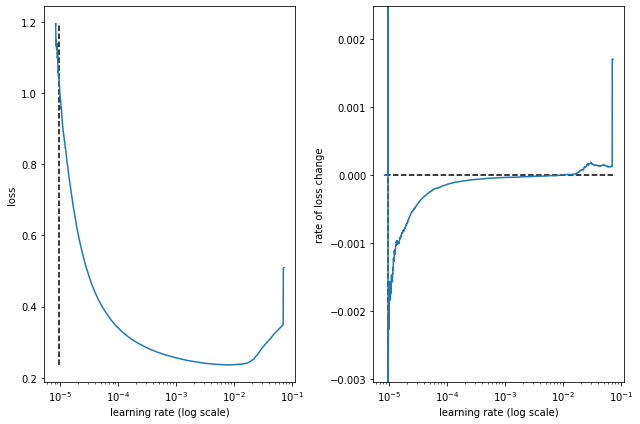

best lr: 9.649566e-06 

Model: "mh_conv1d_dense_48l_48s_16bs_230fm_40f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_36 (InputLayer)          [(None, 48, 10)]     0           []                               
                                                                                                  
 conv1d_105 (Conv1D)            (None, 46, 40)       1240        ['input_36[0][0]']               
                                                                                                  
 conv1d_106 (Conv1D)            (None, 45, 40)       1640        ['input_36[0][0]']               
                                                                                                  
 conv1d_107 (Conv1D)            (None, 44, 40)       2040        ['input_36[0][0]']               
                                 

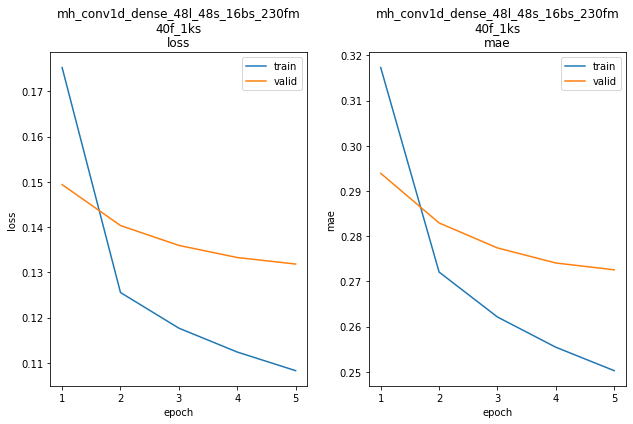

mh_conv1d_dense_48l_48s_16bs_230fm_40f_1ks train min loss: 0.108291	mae: 0.250271	epoch: 5
mh_conv1d_dense_48l_48s_16bs_230fm_40f_1ks valid min loss: 0.131848	mae: 0.272574	epoch: 5

mh_conv1d_dense_48l_48s_16bs_230fm_40f_1ks
Iteration No: 29 ended. Search finished for the next optimal point.
Time taken: 453.8561
Function value obtained: 0.1318
Current minimum: 0.1282
Iteration No: 30 started. Searching for the next optimal point.
lags 38
feat_maps 128
filters 32
kern_size 5
Epoch 1/5
11758/11758 [==============================] - 61s 5ms/step - loss: 1.2420 - mae: 0.7229


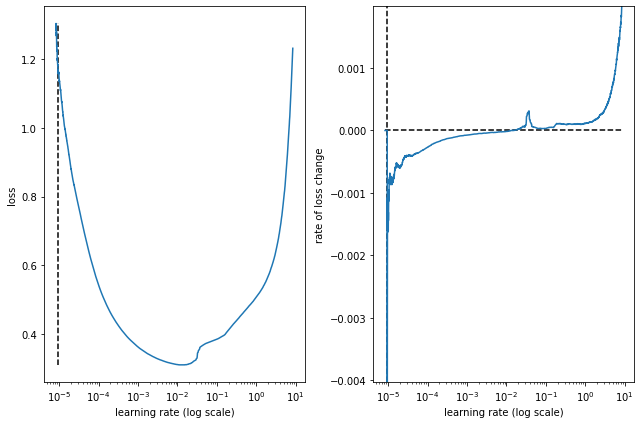

best lr: 9.5486575e-06 

Model: "mh_conv1d_dense_38l_48s_16bs_128fm_32f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_37 (InputLayer)          [(None, 38, 10)]     0           []                               
                                                                                                  
 conv1d_108 (Conv1D)            (None, 28, 32)       3552        ['input_37[0][0]']               
                                                                                                  
 conv1d_109 (Conv1D)            (None, 23, 32)       5152        ['input_37[0][0]']               
                                                                                                  
 conv1d_110 (Conv1D)            (None, 18, 32)       6752        ['input_37[0][0]']               
                                

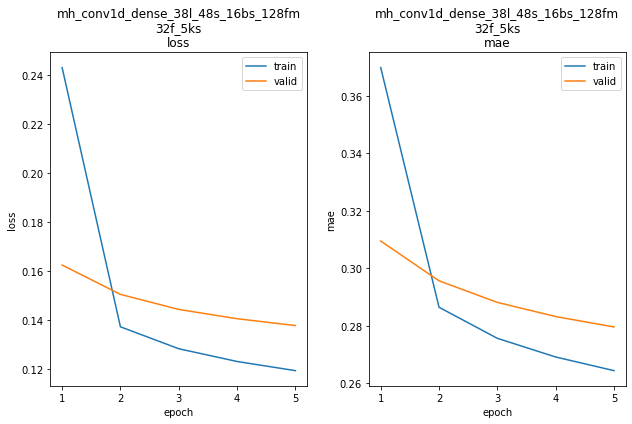

mh_conv1d_dense_38l_48s_16bs_128fm_32f_5ks train min loss: 0.119450	mae: 0.264406	epoch: 5
mh_conv1d_dense_38l_48s_16bs_128fm_32f_5ks valid min loss: 0.137843	mae: 0.279598	epoch: 5

mh_conv1d_dense_38l_48s_16bs_128fm_32f_5ks
Iteration No: 30 ended. Search finished for the next optimal point.
Time taken: 405.8181
Function value obtained: 0.1378
Current minimum: 0.1282
Iteration No: 31 started. Searching for the next optimal point.
lags 27
feat_maps 179
filters 33
kern_size 5
Epoch 1/5
11759/11759 [==============================] - 41s 3ms/step - loss: 1.5286 - mae: 0.4554


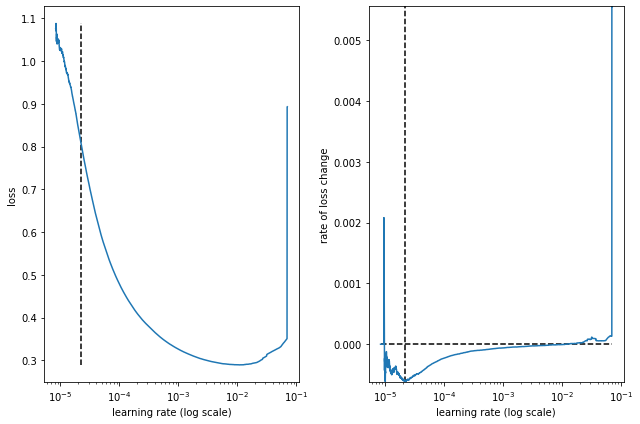

best lr: 2.1945176e-05 

Model: "mh_conv1d_dense_27l_48s_16bs_179fm_33f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_38 (InputLayer)          [(None, 27, 10)]     0           []                               
                                                                                                  
 conv1d_111 (Conv1D)            (None, 17, 33)       3663        ['input_38[0][0]']               
                                                                                                  
 conv1d_112 (Conv1D)            (None, 12, 33)       5313        ['input_38[0][0]']               
                                                                                                  
 conv1d_113 (Conv1D)            (None, 7, 33)        6963        ['input_38[0][0]']               
                                

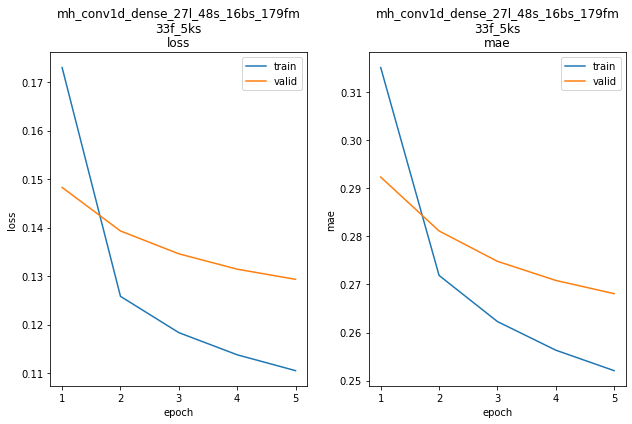

mh_conv1d_dense_27l_48s_16bs_179fm_33f_5ks train min loss: 0.110498	mae: 0.252078	epoch: 5
mh_conv1d_dense_27l_48s_16bs_179fm_33f_5ks valid min loss: 0.129322	mae: 0.268094	epoch: 5

mh_conv1d_dense_27l_48s_16bs_179fm_33f_5ks
Iteration No: 31 ended. Search finished for the next optimal point.
Time taken: 381.7425
Function value obtained: 0.1293
Current minimum: 0.1282
Iteration No: 32 started. Searching for the next optimal point.
lags 31
feat_maps 181
filters 48
kern_size 2
Epoch 1/5
11759/11759 [==============================] - 42s 4ms/step - loss: 8.9836 - mae: 0.4664


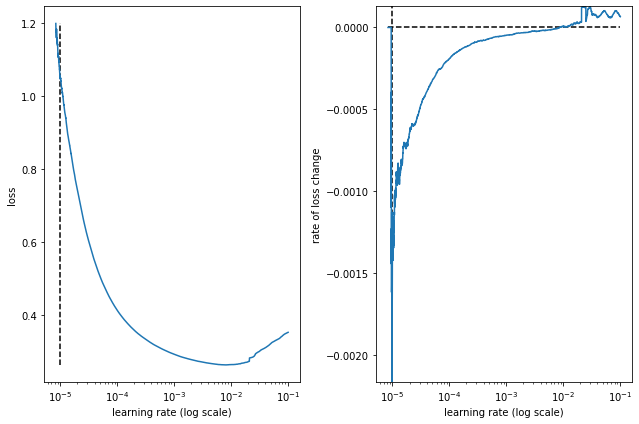

best lr: 9.819951e-06 

Model: "mh_conv1d_dense_31l_48s_16bs_181fm_48f_2ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_39 (InputLayer)          [(None, 31, 10)]     0           []                               
                                                                                                  
 conv1d_114 (Conv1D)            (None, 27, 48)       2448        ['input_39[0][0]']               
                                                                                                  
 conv1d_115 (Conv1D)            (None, 25, 48)       3408        ['input_39[0][0]']               
                                                                                                  
 conv1d_116 (Conv1D)            (None, 23, 48)       4368        ['input_39[0][0]']               
                                 

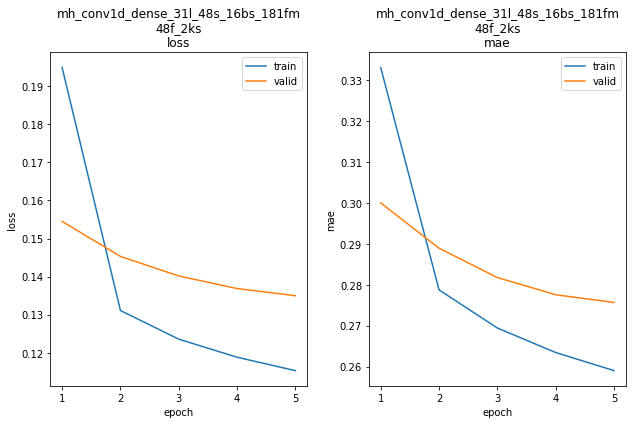

mh_conv1d_dense_31l_48s_16bs_181fm_48f_2ks train min loss: 0.115305	mae: 0.258993	epoch: 5
mh_conv1d_dense_31l_48s_16bs_181fm_48f_2ks valid min loss: 0.134971	mae: 0.275667	epoch: 5

mh_conv1d_dense_31l_48s_16bs_181fm_48f_2ks
Iteration No: 32 ended. Search finished for the next optimal point.
Time taken: 383.2659
Function value obtained: 0.1350
Current minimum: 0.1282
Iteration No: 33 started. Searching for the next optimal point.
lags 35
feat_maps 235
filters 64
kern_size 5
Epoch 1/5
11758/11758 [==============================] - 44s 4ms/step - loss: 201.1979 - mae: 0.6360


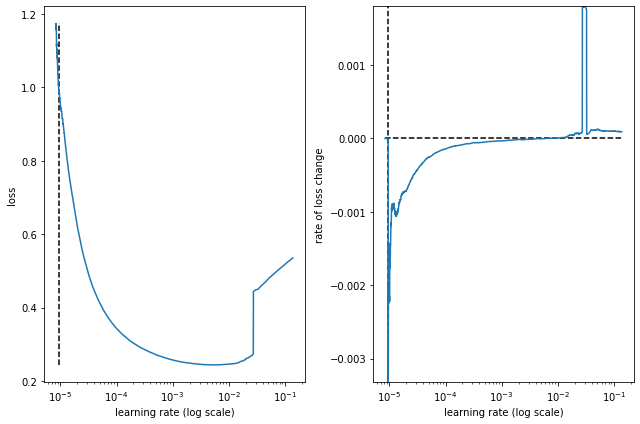

best lr: 9.531942e-06 

Model: "mh_conv1d_dense_35l_48s_16bs_235fm_64f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_40 (InputLayer)          [(None, 35, 10)]     0           []                               
                                                                                                  
 conv1d_117 (Conv1D)            (None, 25, 64)       7104        ['input_40[0][0]']               
                                                                                                  
 conv1d_118 (Conv1D)            (None, 20, 64)       10304       ['input_40[0][0]']               
                                                                                                  
 conv1d_119 (Conv1D)            (None, 15, 64)       13504       ['input_40[0][0]']               
                                 

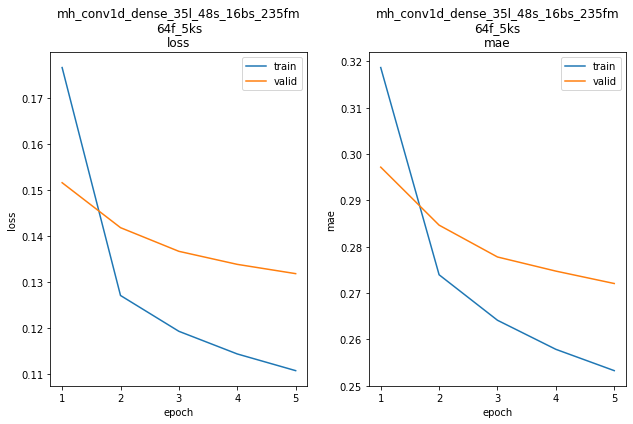

mh_conv1d_dense_35l_48s_16bs_235fm_64f_5ks train min loss: 0.110809	mae: 0.253254	epoch: 5
mh_conv1d_dense_35l_48s_16bs_235fm_64f_5ks valid min loss: 0.131866	mae: 0.272065	epoch: 5

mh_conv1d_dense_35l_48s_16bs_235fm_64f_5ks
Iteration No: 33 ended. Search finished for the next optimal point.
Time taken: 359.8035
Function value obtained: 0.1319
Current minimum: 0.1282
Iteration No: 34 started. Searching for the next optimal point.
lags 37
feat_maps 157
filters 64
kern_size 5
Epoch 1/5
11758/11758 [==============================] - 39s 3ms/step - loss: 1.5587 - mae: 0.4338


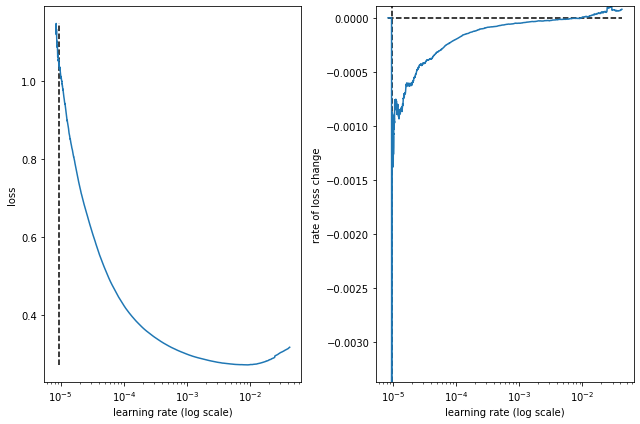

best lr: 9.5486575e-06 

Model: "mh_conv1d_dense_37l_48s_16bs_157fm_64f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_41 (InputLayer)          [(None, 37, 10)]     0           []                               
                                                                                                  
 conv1d_120 (Conv1D)            (None, 27, 64)       7104        ['input_41[0][0]']               
                                                                                                  
 conv1d_121 (Conv1D)            (None, 22, 64)       10304       ['input_41[0][0]']               
                                                                                                  
 conv1d_122 (Conv1D)            (None, 17, 64)       13504       ['input_41[0][0]']               
                                

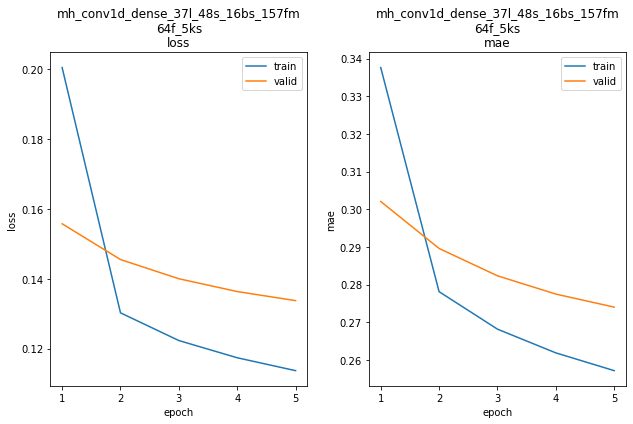

mh_conv1d_dense_37l_48s_16bs_157fm_64f_5ks train min loss: 0.113714	mae: 0.257136	epoch: 5
mh_conv1d_dense_37l_48s_16bs_157fm_64f_5ks valid min loss: 0.133766	mae: 0.274010	epoch: 5

mh_conv1d_dense_37l_48s_16bs_157fm_64f_5ks
Iteration No: 34 ended. Search finished for the next optimal point.
Time taken: 381.3613
Function value obtained: 0.1338
Current minimum: 0.1282
Iteration No: 35 started. Searching for the next optimal point.
lags 48
feat_maps 235
filters 32
kern_size 5
Epoch 1/5
11758/11758 [==============================] - 39s 3ms/step - loss: 2.3480 - mae: 0.4399


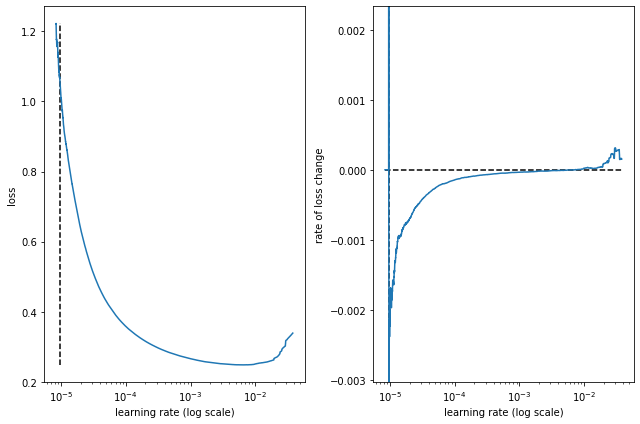

best lr: 9.649566e-06 

Model: "mh_conv1d_dense_48l_48s_16bs_235fm_32f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_42 (InputLayer)          [(None, 48, 10)]     0           []                               
                                                                                                  
 conv1d_123 (Conv1D)            (None, 38, 32)       3552        ['input_42[0][0]']               
                                                                                                  
 conv1d_124 (Conv1D)            (None, 33, 32)       5152        ['input_42[0][0]']               
                                                                                                  
 conv1d_125 (Conv1D)            (None, 28, 32)       6752        ['input_42[0][0]']               
                                 

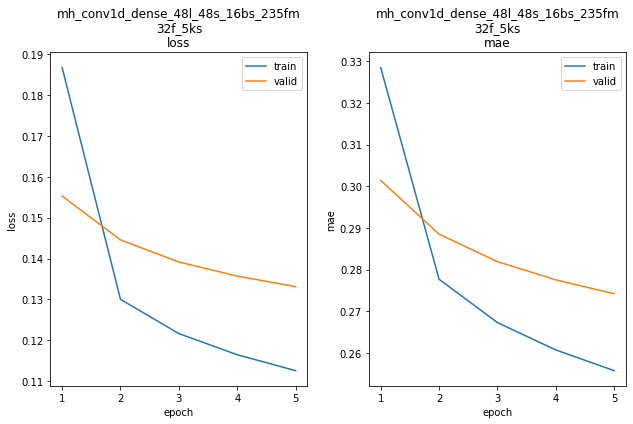

mh_conv1d_dense_48l_48s_16bs_235fm_32f_5ks train min loss: 0.112548	mae: 0.255729	epoch: 5
mh_conv1d_dense_48l_48s_16bs_235fm_32f_5ks valid min loss: 0.133115	mae: 0.274191	epoch: 5

mh_conv1d_dense_48l_48s_16bs_235fm_32f_5ks
Iteration No: 35 ended. Search finished for the next optimal point.
Time taken: 346.6938
Function value obtained: 0.1331
Current minimum: 0.1282
Iteration No: 36 started. Searching for the next optimal point.
lags 47
feat_maps 181
filters 48
kern_size 5
Epoch 1/5
11758/11758 [==============================] - 63s 5ms/step - loss: 1.0359 - mae: 0.6768


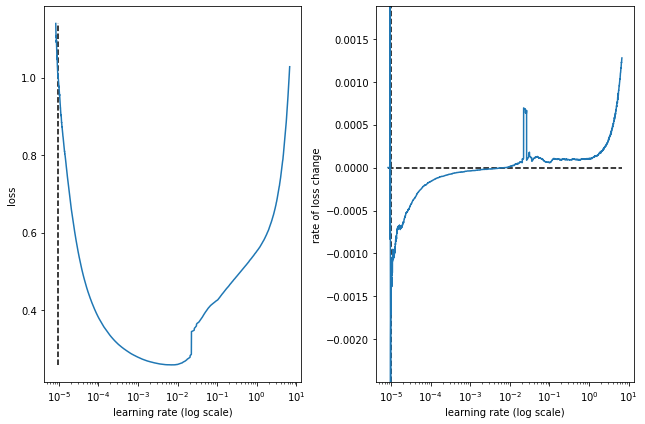

best lr: 9.7004195e-06 

Model: "mh_conv1d_dense_47l_48s_16bs_181fm_48f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_43 (InputLayer)          [(None, 47, 10)]     0           []                               
                                                                                                  
 conv1d_126 (Conv1D)            (None, 37, 48)       5328        ['input_43[0][0]']               
                                                                                                  
 conv1d_127 (Conv1D)            (None, 32, 48)       7728        ['input_43[0][0]']               
                                                                                                  
 conv1d_128 (Conv1D)            (None, 27, 48)       10128       ['input_43[0][0]']               
                                

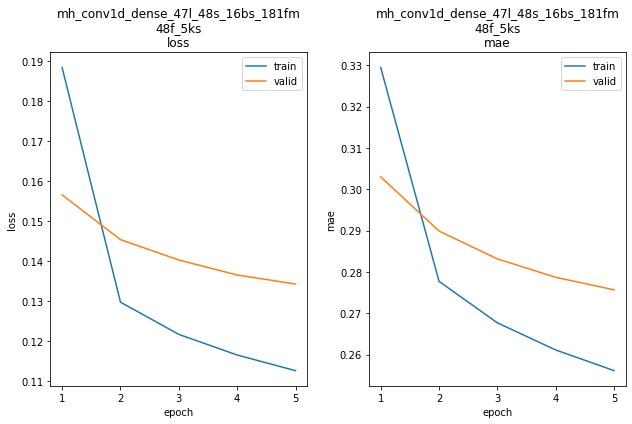

mh_conv1d_dense_47l_48s_16bs_181fm_48f_5ks train min loss: 0.112554	mae: 0.256103	epoch: 5
mh_conv1d_dense_47l_48s_16bs_181fm_48f_5ks valid min loss: 0.134231	mae: 0.275658	epoch: 5

mh_conv1d_dense_47l_48s_16bs_181fm_48f_5ks
Iteration No: 36 ended. Search finished for the next optimal point.
Time taken: 393.6773
Function value obtained: 0.1342
Current minimum: 0.1282
Iteration No: 37 started. Searching for the next optimal point.
lags 24
feat_maps 221
filters 54
kern_size 1
Epoch 1/5
11759/11759 [==============================] - 63s 5ms/step - loss: 1.0093 - mae: 0.6606


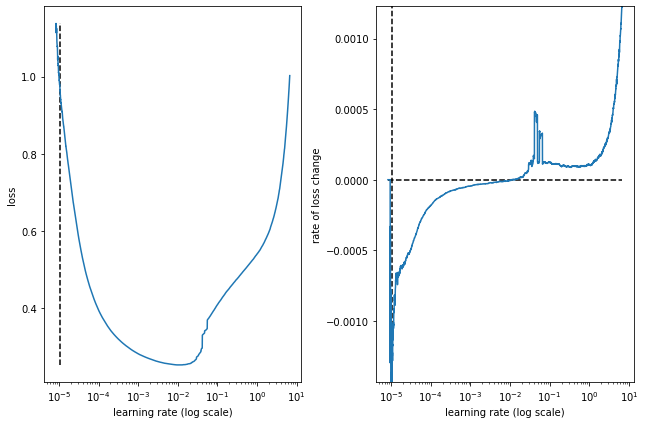

best lr: 1.0440924e-05 

Model: "mh_conv1d_dense_24l_48s_16bs_221fm_54f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_44 (InputLayer)          [(None, 24, 10)]     0           []                               
                                                                                                  
 conv1d_129 (Conv1D)            (None, 22, 54)       1674        ['input_44[0][0]']               
                                                                                                  
 conv1d_130 (Conv1D)            (None, 21, 54)       2214        ['input_44[0][0]']               
                                                                                                  
 conv1d_131 (Conv1D)            (None, 20, 54)       2754        ['input_44[0][0]']               
                                

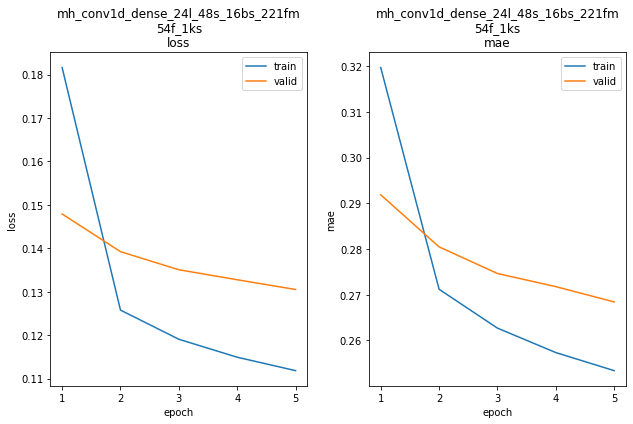

mh_conv1d_dense_24l_48s_16bs_221fm_54f_1ks train min loss: 0.111843	mae: 0.253405	epoch: 5
mh_conv1d_dense_24l_48s_16bs_221fm_54f_1ks valid min loss: 0.130523	mae: 0.268426	epoch: 5

mh_conv1d_dense_24l_48s_16bs_221fm_54f_1ks
Iteration No: 37 ended. Search finished for the next optimal point.
Time taken: 409.2214
Function value obtained: 0.1305
Current minimum: 0.1282
Iteration No: 38 started. Searching for the next optimal point.
lags 36
feat_maps 163
filters 32
kern_size 5
Epoch 1/5
11758/11758 [==============================] - 64s 5ms/step - loss: 1.1587 - mae: 0.7099


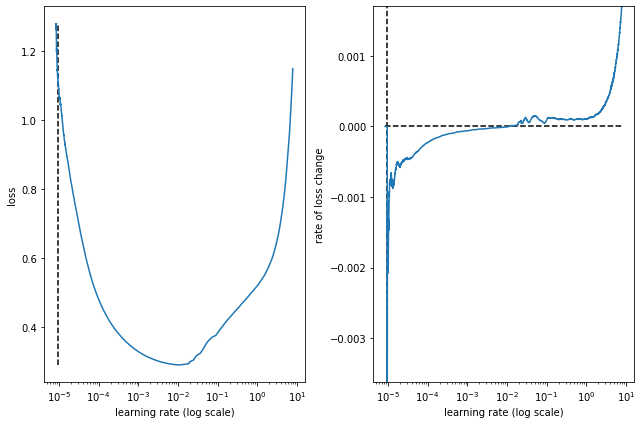

best lr: 9.531942e-06 

Model: "mh_conv1d_dense_36l_48s_16bs_163fm_32f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_45 (InputLayer)          [(None, 36, 10)]     0           []                               
                                                                                                  
 conv1d_132 (Conv1D)            (None, 26, 32)       3552        ['input_45[0][0]']               
                                                                                                  
 conv1d_133 (Conv1D)            (None, 21, 32)       5152        ['input_45[0][0]']               
                                                                                                  
 conv1d_134 (Conv1D)            (None, 16, 32)       6752        ['input_45[0][0]']               
                                 

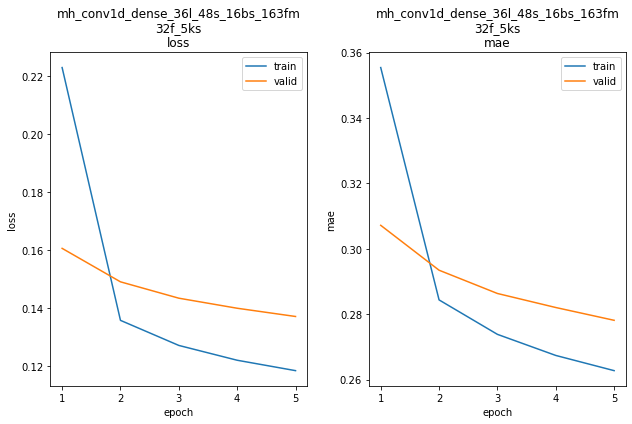

mh_conv1d_dense_36l_48s_16bs_163fm_32f_5ks train min loss: 0.118418	mae: 0.262732	epoch: 5
mh_conv1d_dense_36l_48s_16bs_163fm_32f_5ks valid min loss: 0.137080	mae: 0.278127	epoch: 5

mh_conv1d_dense_36l_48s_16bs_163fm_32f_5ks
Iteration No: 38 ended. Search finished for the next optimal point.
Time taken: 373.9177
Function value obtained: 0.1371
Current minimum: 0.1282
Iteration No: 39 started. Searching for the next optimal point.
lags 48
feat_maps 217
filters 59
kern_size 2
Epoch 1/5
11758/11758 [==============================] - 63s 5ms/step - loss: 0.9019 - mae: 0.6299


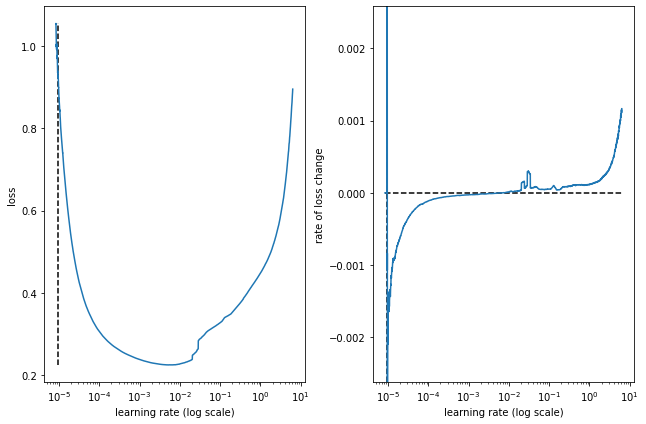

best lr: 9.649566e-06 

Model: "mh_conv1d_dense_48l_48s_16bs_217fm_59f_2ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_46 (InputLayer)          [(None, 48, 10)]     0           []                               
                                                                                                  
 conv1d_135 (Conv1D)            (None, 44, 59)       3009        ['input_46[0][0]']               
                                                                                                  
 conv1d_136 (Conv1D)            (None, 42, 59)       4189        ['input_46[0][0]']               
                                                                                                  
 conv1d_137 (Conv1D)            (None, 40, 59)       5369        ['input_46[0][0]']               
                                 

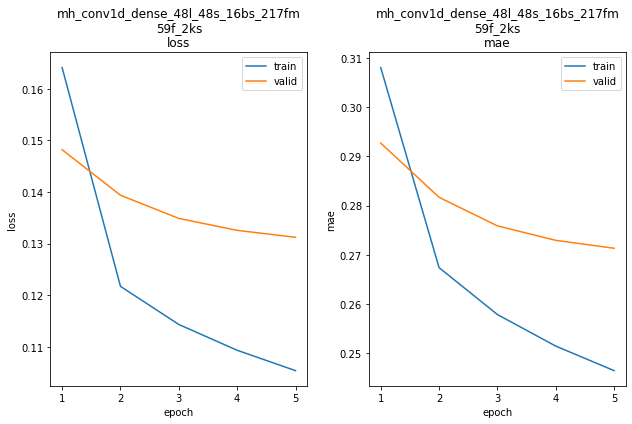

mh_conv1d_dense_48l_48s_16bs_217fm_59f_2ks train min loss: 0.105376	mae: 0.246466	epoch: 5
mh_conv1d_dense_48l_48s_16bs_217fm_59f_2ks valid min loss: 0.131220	mae: 0.271318	epoch: 5

mh_conv1d_dense_48l_48s_16bs_217fm_59f_2ks
Iteration No: 39 ended. Search finished for the next optimal point.
Time taken: 439.8031
Function value obtained: 0.1312
Current minimum: 0.1282
Iteration No: 40 started. Searching for the next optimal point.
lags 25
feat_maps 196
filters 64
kern_size 3
Epoch 1/5
11759/11759 [==============================] - 64s 5ms/step - loss: 1.0552 - mae: 0.6866


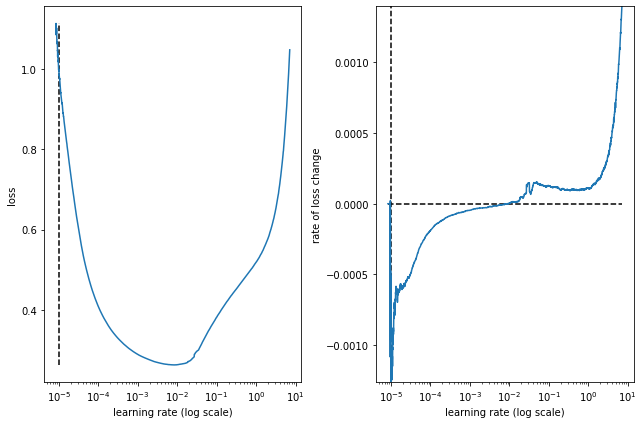

best lr: 1.0099104e-05 

Model: "mh_conv1d_dense_25l_48s_16bs_196fm_64f_3ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_47 (InputLayer)          [(None, 25, 10)]     0           []                               
                                                                                                  
 conv1d_138 (Conv1D)            (None, 19, 64)       4544        ['input_47[0][0]']               
                                                                                                  
 conv1d_139 (Conv1D)            (None, 16, 64)       6464        ['input_47[0][0]']               
                                                                                                  
 conv1d_140 (Conv1D)            (None, 13, 64)       8384        ['input_47[0][0]']               
                                

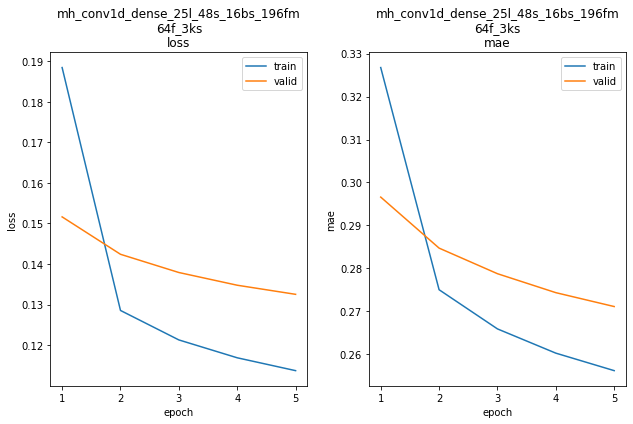

mh_conv1d_dense_25l_48s_16bs_196fm_64f_3ks train min loss: 0.113747	mae: 0.256210	epoch: 5
mh_conv1d_dense_25l_48s_16bs_196fm_64f_3ks valid min loss: 0.132549	mae: 0.271129	epoch: 5

mh_conv1d_dense_25l_48s_16bs_196fm_64f_3ks
Iteration No: 40 ended. Search finished for the next optimal point.
Time taken: 407.3092
Function value obtained: 0.1325
Current minimum: 0.1282
Iteration No: 41 started. Searching for the next optimal point.
lags 48
feat_maps 255
filters 54
kern_size 5
Epoch 1/5
11758/11758 [==============================] - 61s 5ms/step - loss: 0.9633 - mae: 0.6022


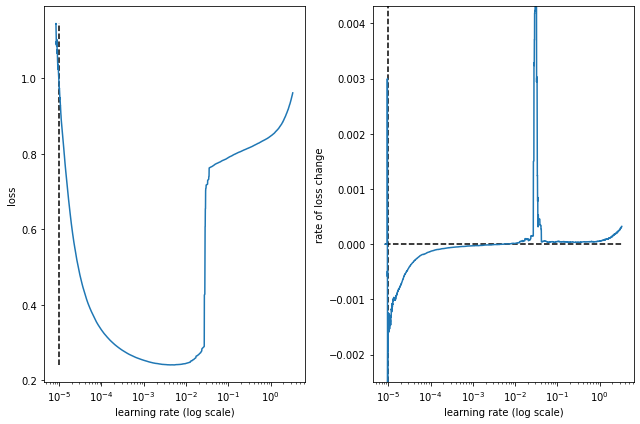

best lr: 9.649566e-06 

Model: "mh_conv1d_dense_48l_48s_16bs_255fm_54f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_48 (InputLayer)          [(None, 48, 10)]     0           []                               
                                                                                                  
 conv1d_141 (Conv1D)            (None, 38, 54)       5994        ['input_48[0][0]']               
                                                                                                  
 conv1d_142 (Conv1D)            (None, 33, 54)       8694        ['input_48[0][0]']               
                                                                                                  
 conv1d_143 (Conv1D)            (None, 28, 54)       11394       ['input_48[0][0]']               
                                 

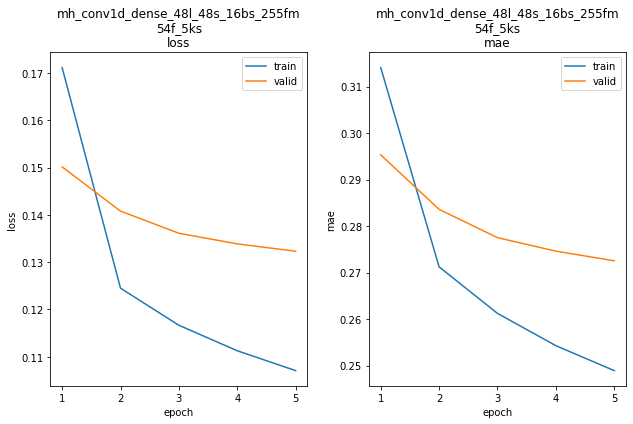

mh_conv1d_dense_48l_48s_16bs_255fm_54f_5ks train min loss: 0.107057	mae: 0.248932	epoch: 5
mh_conv1d_dense_48l_48s_16bs_255fm_54f_5ks valid min loss: 0.132326	mae: 0.272561	epoch: 5

mh_conv1d_dense_48l_48s_16bs_255fm_54f_5ks
Iteration No: 41 ended. Search finished for the next optimal point.
Time taken: 430.4216
Function value obtained: 0.1323
Current minimum: 0.1282
Iteration No: 42 started. Searching for the next optimal point.
lags 24
feat_maps 247
filters 32
kern_size 5
Epoch 1/5
11759/11759 [==============================] - 64s 5ms/step - loss: 1.1025 - mae: 0.6875


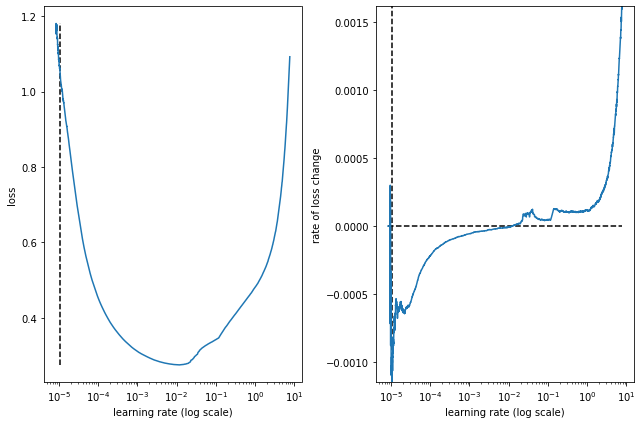

best lr: 1.0440924e-05 

Model: "mh_conv1d_dense_24l_48s_16bs_247fm_32f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_49 (InputLayer)          [(None, 24, 10)]     0           []                               
                                                                                                  
 conv1d_144 (Conv1D)            (None, 14, 32)       3552        ['input_49[0][0]']               
                                                                                                  
 conv1d_145 (Conv1D)            (None, 9, 32)        5152        ['input_49[0][0]']               
                                                                                                  
 conv1d_146 (Conv1D)            (None, 4, 32)        6752        ['input_49[0][0]']               
                                

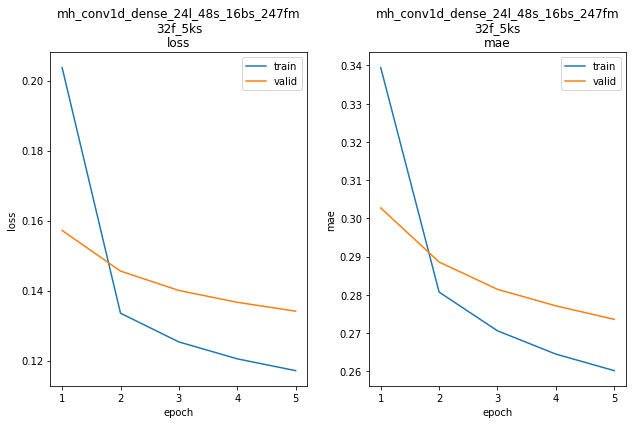

mh_conv1d_dense_24l_48s_16bs_247fm_32f_5ks train min loss: 0.117105	mae: 0.260179	epoch: 5
mh_conv1d_dense_24l_48s_16bs_247fm_32f_5ks valid min loss: 0.134109	mae: 0.273597	epoch: 5

mh_conv1d_dense_24l_48s_16bs_247fm_32f_5ks
Iteration No: 42 ended. Search finished for the next optimal point.
Time taken: 376.7360
Function value obtained: 0.1341
Current minimum: 0.1282
Iteration No: 43 started. Searching for the next optimal point.
lags 47
feat_maps 210
filters 45
kern_size 5
Epoch 1/5
11758/11758 [==============================] - 42s 3ms/step - loss: 2.3387 - mae: 0.4541


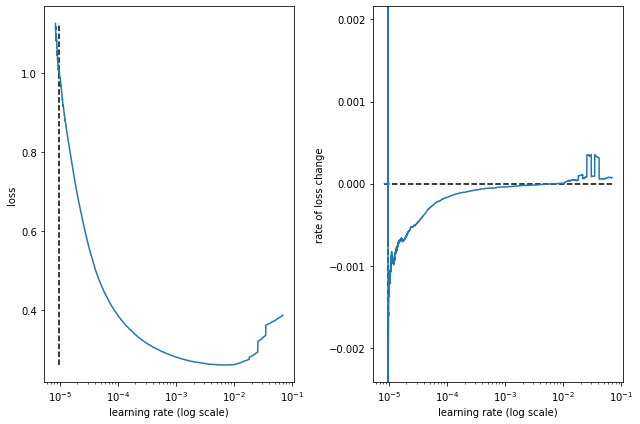

best lr: 9.7004195e-06 

Model: "mh_conv1d_dense_47l_48s_16bs_210fm_45f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_50 (InputLayer)          [(None, 47, 10)]     0           []                               
                                                                                                  
 conv1d_147 (Conv1D)            (None, 37, 45)       4995        ['input_50[0][0]']               
                                                                                                  
 conv1d_148 (Conv1D)            (None, 32, 45)       7245        ['input_50[0][0]']               
                                                                                                  
 conv1d_149 (Conv1D)            (None, 27, 45)       9495        ['input_50[0][0]']               
                                

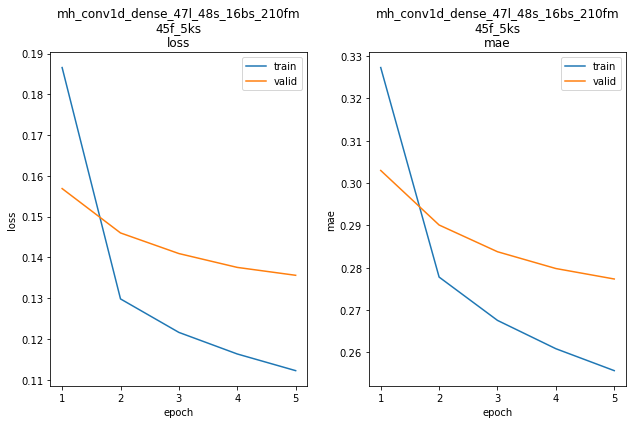

mh_conv1d_dense_47l_48s_16bs_210fm_45f_5ks train min loss: 0.112230	mae: 0.255688	epoch: 5
mh_conv1d_dense_47l_48s_16bs_210fm_45f_5ks valid min loss: 0.135622	mae: 0.277335	epoch: 5

mh_conv1d_dense_47l_48s_16bs_210fm_45f_5ks
Iteration No: 43 ended. Search finished for the next optimal point.
Time taken: 428.5811
Function value obtained: 0.1356
Current minimum: 0.1282
Iteration No: 44 started. Searching for the next optimal point.
lags 29
feat_maps 244
filters 63
kern_size 1
Epoch 1/5
11759/11759 [==============================] - 61s 5ms/step - loss: 0.9464 - mae: 0.6551


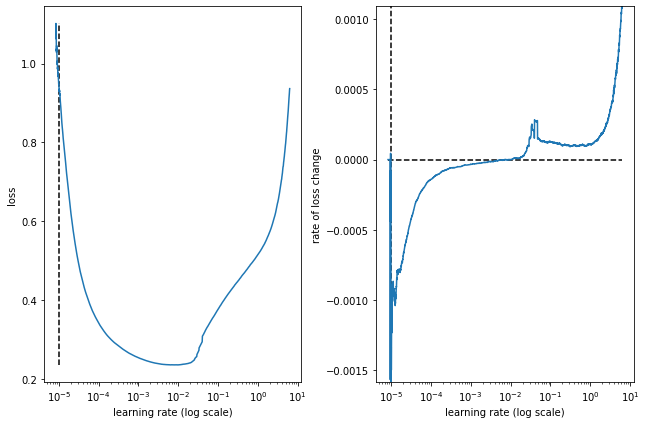

best lr: 1.0028581e-05 

Model: "mh_conv1d_dense_29l_48s_16bs_244fm_63f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_51 (InputLayer)          [(None, 29, 10)]     0           []                               
                                                                                                  
 conv1d_150 (Conv1D)            (None, 27, 63)       1953        ['input_51[0][0]']               
                                                                                                  
 conv1d_151 (Conv1D)            (None, 26, 63)       2583        ['input_51[0][0]']               
                                                                                                  
 conv1d_152 (Conv1D)            (None, 25, 63)       3213        ['input_51[0][0]']               
                                

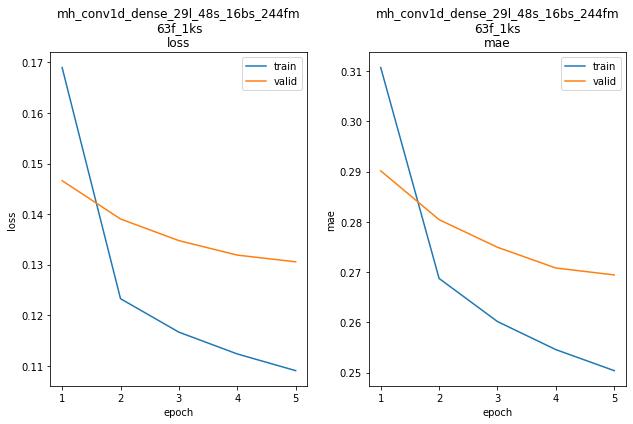

mh_conv1d_dense_29l_48s_16bs_244fm_63f_1ks train min loss: 0.109028	mae: 0.250378	epoch: 5
mh_conv1d_dense_29l_48s_16bs_244fm_63f_1ks valid min loss: 0.130563	mae: 0.269433	epoch: 5

mh_conv1d_dense_29l_48s_16bs_244fm_63f_1ks
Iteration No: 44 ended. Search finished for the next optimal point.
Time taken: 367.2277
Function value obtained: 0.1306
Current minimum: 0.1282
Iteration No: 45 started. Searching for the next optimal point.
lags 41
feat_maps 178
filters 32
kern_size 1
Epoch 1/5
11758/11758 [==============================] - 63s 5ms/step - loss: 1.0472 - mae: 0.6735


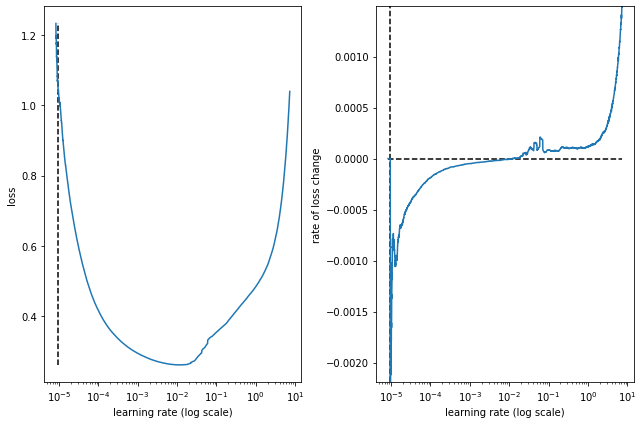

best lr: 9.598979e-06 

Model: "mh_conv1d_dense_41l_48s_16bs_178fm_32f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_52 (InputLayer)          [(None, 41, 10)]     0           []                               
                                                                                                  
 conv1d_153 (Conv1D)            (None, 39, 32)       992         ['input_52[0][0]']               
                                                                                                  
 conv1d_154 (Conv1D)            (None, 38, 32)       1312        ['input_52[0][0]']               
                                                                                                  
 conv1d_155 (Conv1D)            (None, 37, 32)       1632        ['input_52[0][0]']               
                                 

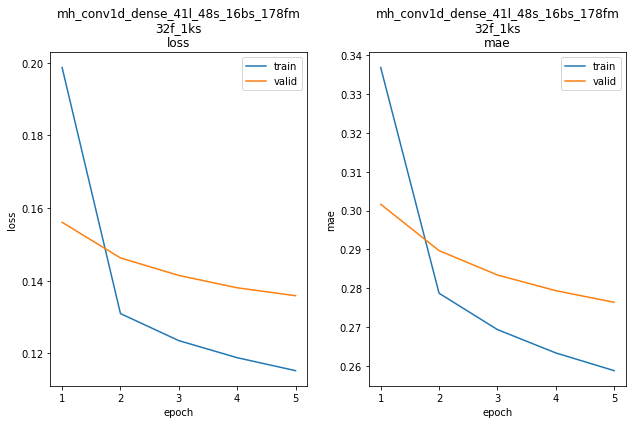

mh_conv1d_dense_41l_48s_16bs_178fm_32f_1ks train min loss: 0.115263	mae: 0.258811	epoch: 5
mh_conv1d_dense_41l_48s_16bs_178fm_32f_1ks valid min loss: 0.135898	mae: 0.276409	epoch: 5

mh_conv1d_dense_41l_48s_16bs_178fm_32f_1ks
Iteration No: 45 ended. Search finished for the next optimal point.
Time taken: 341.3810
Function value obtained: 0.1359
Current minimum: 0.1282
Iteration No: 46 started. Searching for the next optimal point.
lags 25
feat_maps 231
filters 32
kern_size 1
Epoch 1/5
11759/11759 [==============================] - 58s 5ms/step - loss: 1.0204 - mae: 0.5641


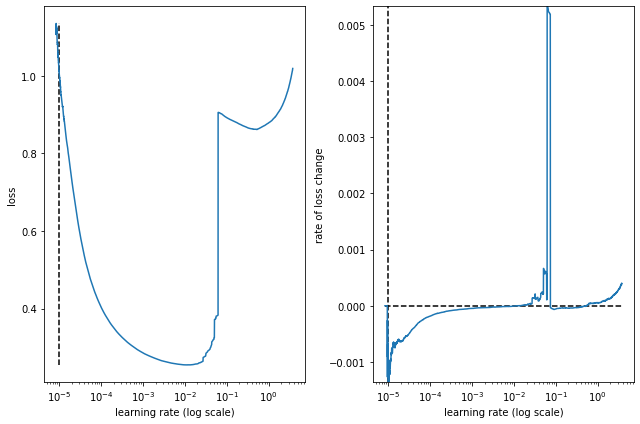

best lr: 1.0099104e-05 

Model: "mh_conv1d_dense_25l_48s_16bs_231fm_32f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_53 (InputLayer)          [(None, 25, 10)]     0           []                               
                                                                                                  
 conv1d_156 (Conv1D)            (None, 23, 32)       992         ['input_53[0][0]']               
                                                                                                  
 conv1d_157 (Conv1D)            (None, 22, 32)       1312        ['input_53[0][0]']               
                                                                                                  
 conv1d_158 (Conv1D)            (None, 21, 32)       1632        ['input_53[0][0]']               
                                

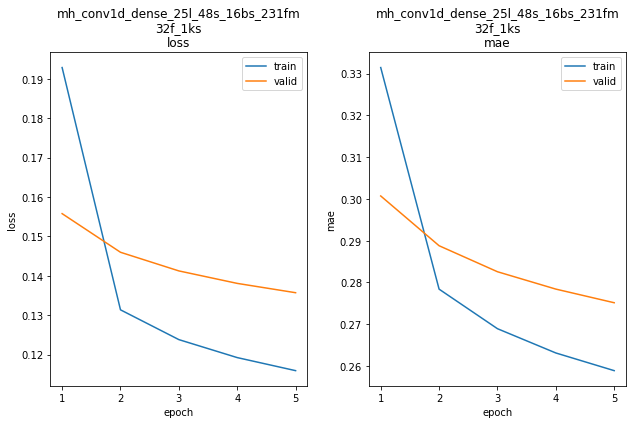

mh_conv1d_dense_25l_48s_16bs_231fm_32f_1ks train min loss: 0.115912	mae: 0.258902	epoch: 5
mh_conv1d_dense_25l_48s_16bs_231fm_32f_1ks valid min loss: 0.135697	mae: 0.275155	epoch: 5

mh_conv1d_dense_25l_48s_16bs_231fm_32f_1ks
Iteration No: 46 ended. Search finished for the next optimal point.
Time taken: 401.8896
Function value obtained: 0.1357
Current minimum: 0.1282
Iteration No: 47 started. Searching for the next optimal point.
lags 47
feat_maps 254
filters 49
kern_size 1
Epoch 1/5
11758/11758 [==============================] - 62s 5ms/step - loss: 0.9173 - mae: 0.6450


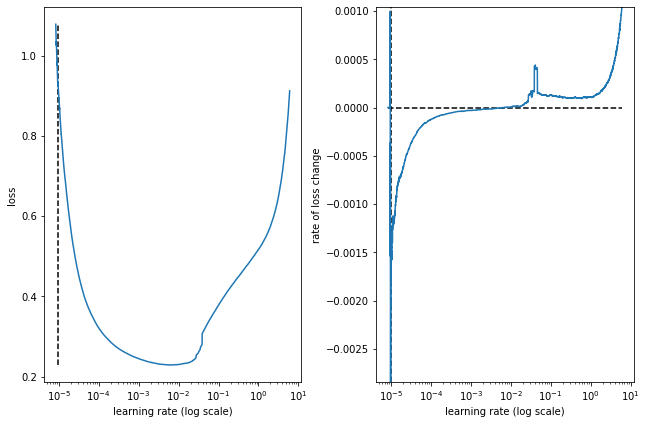

best lr: 9.7004195e-06 

Model: "mh_conv1d_dense_47l_48s_16bs_254fm_49f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_54 (InputLayer)          [(None, 47, 10)]     0           []                               
                                                                                                  
 conv1d_159 (Conv1D)            (None, 45, 49)       1519        ['input_54[0][0]']               
                                                                                                  
 conv1d_160 (Conv1D)            (None, 44, 49)       2009        ['input_54[0][0]']               
                                                                                                  
 conv1d_161 (Conv1D)            (None, 43, 49)       2499        ['input_54[0][0]']               
                                

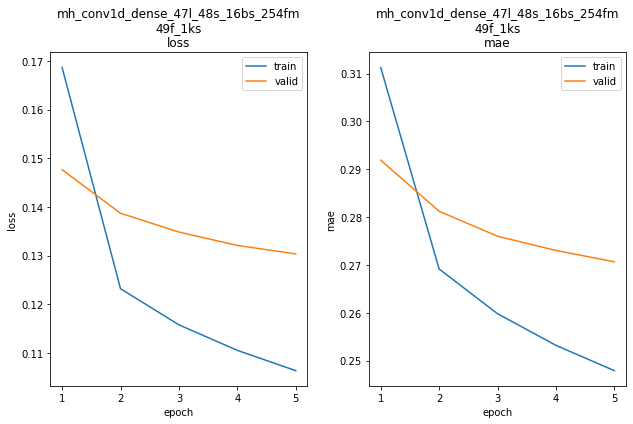

mh_conv1d_dense_47l_48s_16bs_254fm_49f_1ks train min loss: 0.106341	mae: 0.247914	epoch: 5
mh_conv1d_dense_47l_48s_16bs_254fm_49f_1ks valid min loss: 0.130341	mae: 0.270665	epoch: 5

mh_conv1d_dense_47l_48s_16bs_254fm_49f_1ks
Iteration No: 47 ended. Search finished for the next optimal point.
Time taken: 397.0526
Function value obtained: 0.1303
Current minimum: 0.1282
Iteration No: 48 started. Searching for the next optimal point.
lags 48
feat_maps 239
filters 62
kern_size 1
Epoch 1/5
11758/11758 [==============================] - 63s 5ms/step - loss: 0.8756 - mae: 0.6384


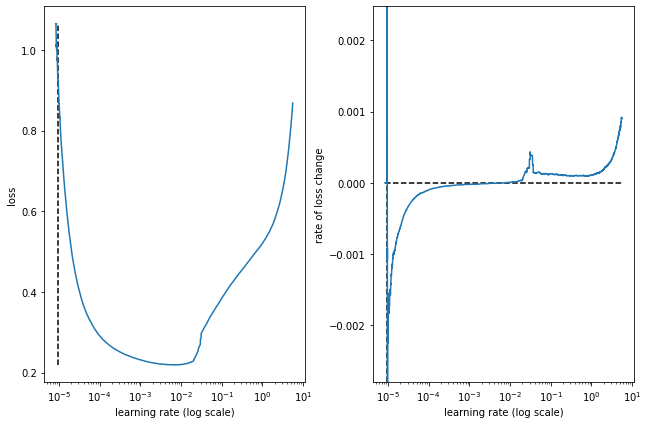

best lr: 9.649566e-06 

Model: "mh_conv1d_dense_48l_48s_16bs_239fm_62f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_55 (InputLayer)          [(None, 48, 10)]     0           []                               
                                                                                                  
 conv1d_162 (Conv1D)            (None, 46, 62)       1922        ['input_55[0][0]']               
                                                                                                  
 conv1d_163 (Conv1D)            (None, 45, 62)       2542        ['input_55[0][0]']               
                                                                                                  
 conv1d_164 (Conv1D)            (None, 44, 62)       3162        ['input_55[0][0]']               
                                 

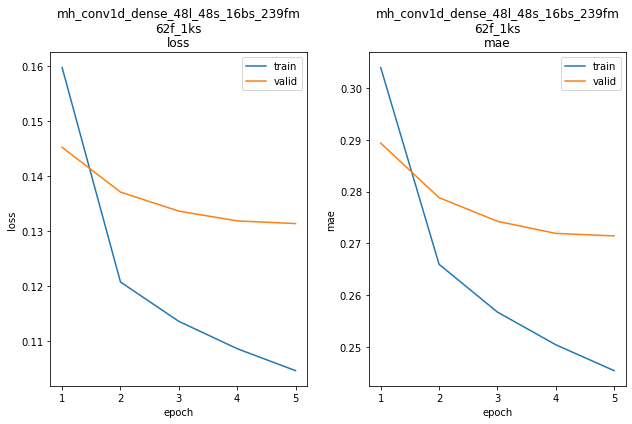

mh_conv1d_dense_48l_48s_16bs_239fm_62f_1ks train min loss: 0.104543	mae: 0.245384	epoch: 5
mh_conv1d_dense_48l_48s_16bs_239fm_62f_1ks valid min loss: 0.131354	mae: 0.271418	epoch: 5

mh_conv1d_dense_48l_48s_16bs_239fm_62f_1ks
Iteration No: 48 ended. Search finished for the next optimal point.
Time taken: 372.6051
Function value obtained: 0.1314
Current minimum: 0.1282
Iteration No: 49 started. Searching for the next optimal point.
lags 24
feat_maps 148
filters 64
kern_size 1
Epoch 1/5
11759/11759 [==============================] - 62s 5ms/step - loss: 1.0697 - mae: 0.6797


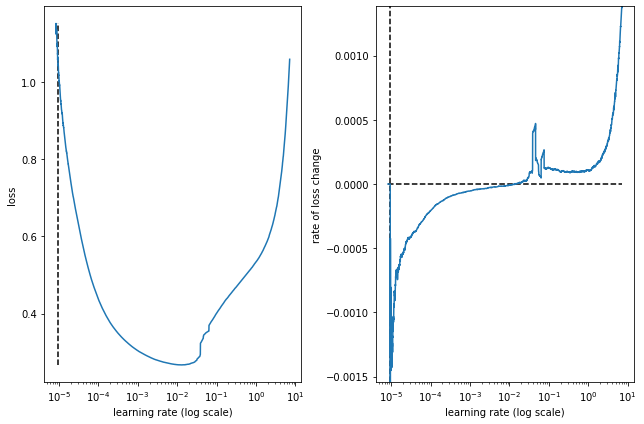

best lr: 9.582028e-06 

Model: "mh_conv1d_dense_24l_48s_16bs_148fm_64f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_56 (InputLayer)          [(None, 24, 10)]     0           []                               
                                                                                                  
 conv1d_165 (Conv1D)            (None, 22, 64)       1984        ['input_56[0][0]']               
                                                                                                  
 conv1d_166 (Conv1D)            (None, 21, 64)       2624        ['input_56[0][0]']               
                                                                                                  
 conv1d_167 (Conv1D)            (None, 20, 64)       3264        ['input_56[0][0]']               
                                 

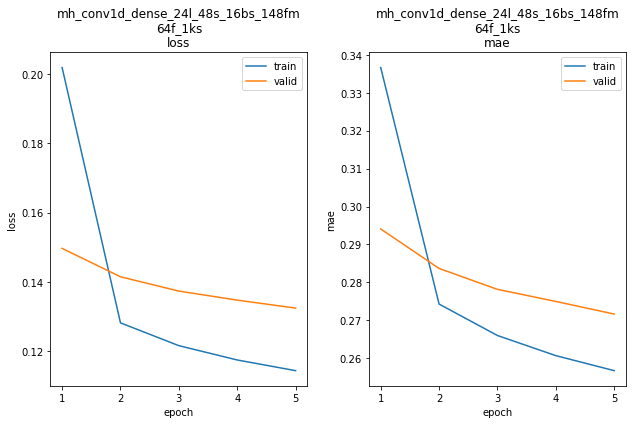

mh_conv1d_dense_24l_48s_16bs_148fm_64f_1ks train min loss: 0.114363	mae: 0.256727	epoch: 5
mh_conv1d_dense_24l_48s_16bs_148fm_64f_1ks valid min loss: 0.132430	mae: 0.271647	epoch: 5

mh_conv1d_dense_24l_48s_16bs_148fm_64f_1ks
Iteration No: 49 ended. Search finished for the next optimal point.
Time taken: 461.8746
Function value obtained: 0.1324
Current minimum: 0.1282
Iteration No: 50 started. Searching for the next optimal point.
lags 25
feat_maps 212
filters 64
kern_size 1
Epoch 1/5
11759/11759 [==============================] - 65s 5ms/step - loss: 0.9905 - mae: 0.6650


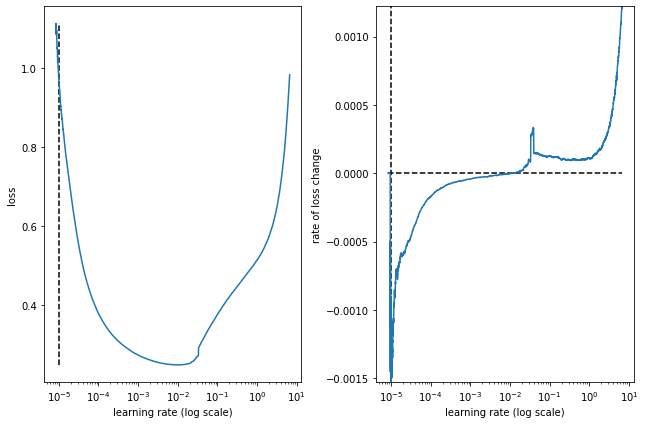

best lr: 1.0099104e-05 

Model: "mh_conv1d_dense_25l_48s_16bs_212fm_64f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_57 (InputLayer)          [(None, 25, 10)]     0           []                               
                                                                                                  
 conv1d_168 (Conv1D)            (None, 23, 64)       1984        ['input_57[0][0]']               
                                                                                                  
 conv1d_169 (Conv1D)            (None, 22, 64)       2624        ['input_57[0][0]']               
                                                                                                  
 conv1d_170 (Conv1D)            (None, 21, 64)       3264        ['input_57[0][0]']               
                                

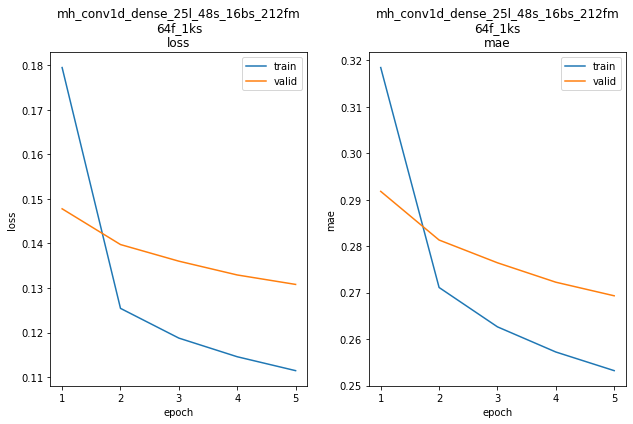

mh_conv1d_dense_25l_48s_16bs_212fm_64f_1ks train min loss: 0.111454	mae: 0.253216	epoch: 5
mh_conv1d_dense_25l_48s_16bs_212fm_64f_1ks valid min loss: 0.130809	mae: 0.269334	epoch: 5

mh_conv1d_dense_25l_48s_16bs_212fm_64f_1ks
Iteration No: 50 ended. Search finished for the next optimal point.
Time taken: 409.9515
Function value obtained: 0.1308
Current minimum: 0.1282
Iteration No: 51 started. Searching for the next optimal point.
lags 48
feat_maps 180
filters 61
kern_size 1
Epoch 1/5
11758/11758 [==============================] - 41s 3ms/step - loss: 1.7299 - mae: 0.4188


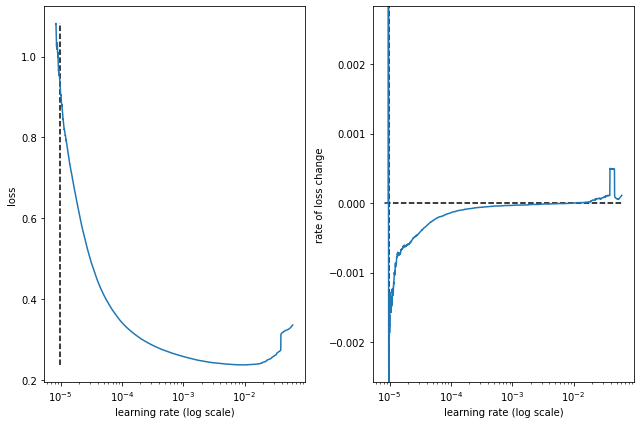

best lr: 9.649566e-06 

Model: "mh_conv1d_dense_48l_48s_16bs_180fm_61f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_58 (InputLayer)          [(None, 48, 10)]     0           []                               
                                                                                                  
 conv1d_171 (Conv1D)            (None, 46, 61)       1891        ['input_58[0][0]']               
                                                                                                  
 conv1d_172 (Conv1D)            (None, 45, 61)       2501        ['input_58[0][0]']               
                                                                                                  
 conv1d_173 (Conv1D)            (None, 44, 61)       3111        ['input_58[0][0]']               
                                 

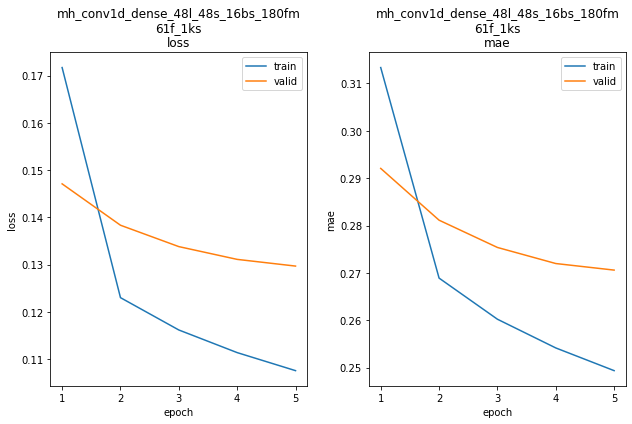

mh_conv1d_dense_48l_48s_16bs_180fm_61f_1ks train min loss: 0.107554	mae: 0.249366	epoch: 5
mh_conv1d_dense_48l_48s_16bs_180fm_61f_1ks valid min loss: 0.129682	mae: 0.270592	epoch: 5

mh_conv1d_dense_48l_48s_16bs_180fm_61f_1ks
Iteration No: 51 ended. Search finished for the next optimal point.
Time taken: 386.1494
Function value obtained: 0.1297
Current minimum: 0.1282
Iteration No: 52 started. Searching for the next optimal point.
lags 24
feat_maps 184
filters 34
kern_size 1
Epoch 1/5
11759/11759 [==============================] - 55s 5ms/step - loss: 69375448.0000 - mae: 90.4619


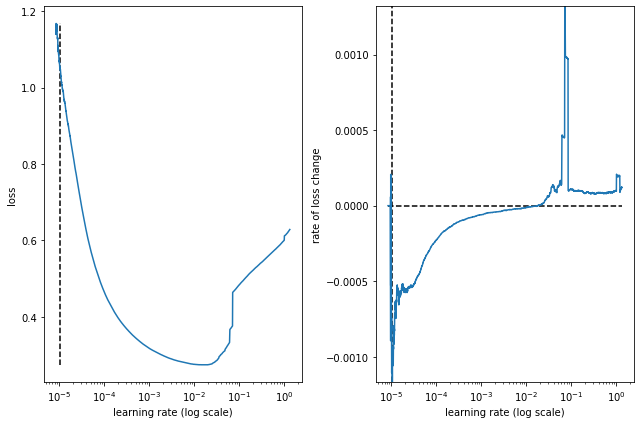

best lr: 1.0440924e-05 

Model: "mh_conv1d_dense_24l_48s_16bs_184fm_34f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_59 (InputLayer)          [(None, 24, 10)]     0           []                               
                                                                                                  
 conv1d_174 (Conv1D)            (None, 22, 34)       1054        ['input_59[0][0]']               
                                                                                                  
 conv1d_175 (Conv1D)            (None, 21, 34)       1394        ['input_59[0][0]']               
                                                                                                  
 conv1d_176 (Conv1D)            (None, 20, 34)       1734        ['input_59[0][0]']               
                                

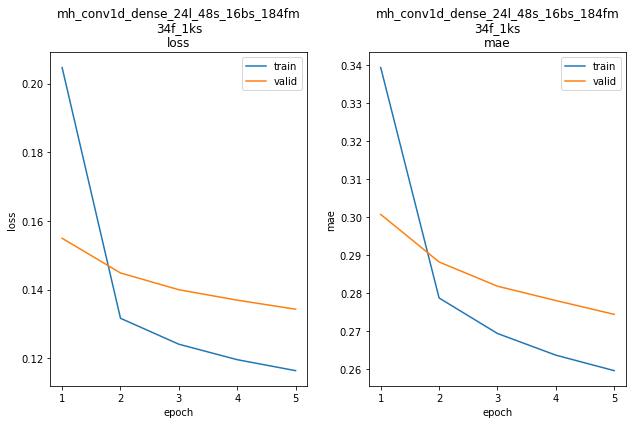

mh_conv1d_dense_24l_48s_16bs_184fm_34f_1ks train min loss: 0.116397	mae: 0.259497	epoch: 5
mh_conv1d_dense_24l_48s_16bs_184fm_34f_1ks valid min loss: 0.134284	mae: 0.274349	epoch: 5

mh_conv1d_dense_24l_48s_16bs_184fm_34f_1ks
Iteration No: 52 ended. Search finished for the next optimal point.
Time taken: 495.1892
Function value obtained: 0.1343
Current minimum: 0.1282
Iteration No: 53 started. Searching for the next optimal point.
lags 24
feat_maps 129
filters 55
kern_size 1
Epoch 1/5
11759/11759 [==============================] - 68s 6ms/step - loss: 1.1466 - mae: 0.6983


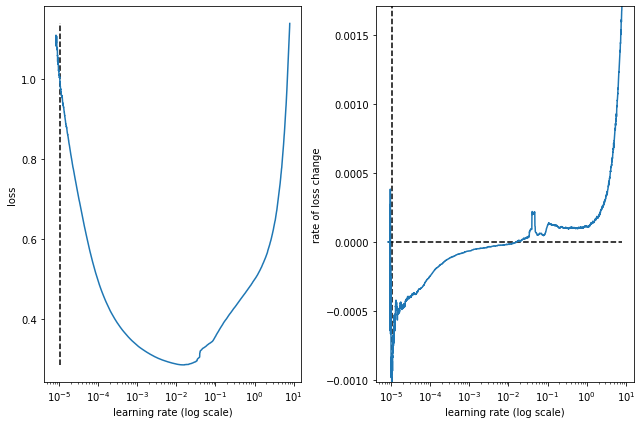

best lr: 1.0440924e-05 

Model: "mh_conv1d_dense_24l_48s_16bs_129fm_55f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_60 (InputLayer)          [(None, 24, 10)]     0           []                               
                                                                                                  
 conv1d_177 (Conv1D)            (None, 22, 55)       1705        ['input_60[0][0]']               
                                                                                                  
 conv1d_178 (Conv1D)            (None, 21, 55)       2255        ['input_60[0][0]']               
                                                                                                  
 conv1d_179 (Conv1D)            (None, 20, 55)       2805        ['input_60[0][0]']               
                                

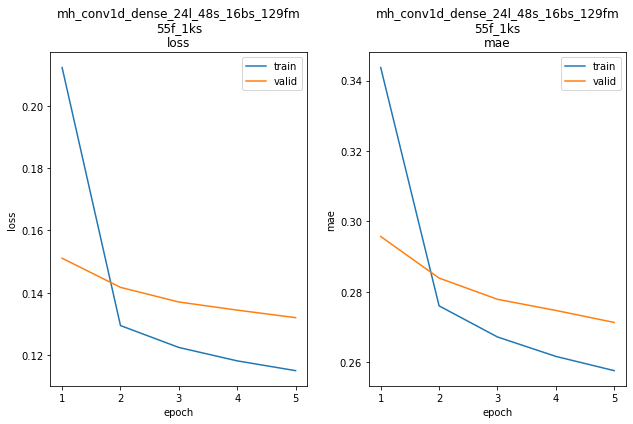

mh_conv1d_dense_24l_48s_16bs_129fm_55f_1ks train min loss: 0.115040	mae: 0.257597	epoch: 5
mh_conv1d_dense_24l_48s_16bs_129fm_55f_1ks valid min loss: 0.132032	mae: 0.271291	epoch: 5

mh_conv1d_dense_24l_48s_16bs_129fm_55f_1ks
Iteration No: 53 ended. Search finished for the next optimal point.
Time taken: 383.5930
Function value obtained: 0.1320
Current minimum: 0.1282
Iteration No: 54 started. Searching for the next optimal point.
lags 48
feat_maps 146
filters 64
kern_size 1
Epoch 1/5
11758/11758 [==============================] - 48s 4ms/step - loss: 3.7395 - mae: 0.4372


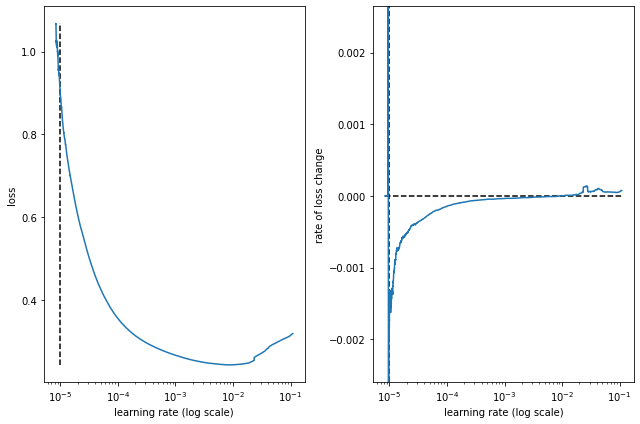

best lr: 9.649566e-06 

Model: "mh_conv1d_dense_48l_48s_16bs_146fm_64f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_61 (InputLayer)          [(None, 48, 10)]     0           []                               
                                                                                                  
 conv1d_180 (Conv1D)            (None, 46, 64)       1984        ['input_61[0][0]']               
                                                                                                  
 conv1d_181 (Conv1D)            (None, 45, 64)       2624        ['input_61[0][0]']               
                                                                                                  
 conv1d_182 (Conv1D)            (None, 44, 64)       3264        ['input_61[0][0]']               
                                 

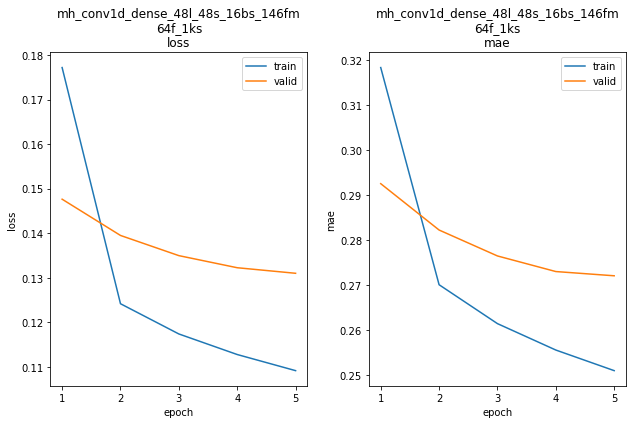

mh_conv1d_dense_48l_48s_16bs_146fm_64f_1ks train min loss: 0.109124	mae: 0.250982	epoch: 5
mh_conv1d_dense_48l_48s_16bs_146fm_64f_1ks valid min loss: 0.130994	mae: 0.272038	epoch: 5

mh_conv1d_dense_48l_48s_16bs_146fm_64f_1ks
Iteration No: 54 ended. Search finished for the next optimal point.
Time taken: 433.4481
Function value obtained: 0.1310
Current minimum: 0.1282
Iteration No: 55 started. Searching for the next optimal point.
lags 24
feat_maps 173
filters 52
kern_size 5
Epoch 1/5
11759/11759 [==============================] - 72s 6ms/step - loss: 1.1011 - mae: 0.6983


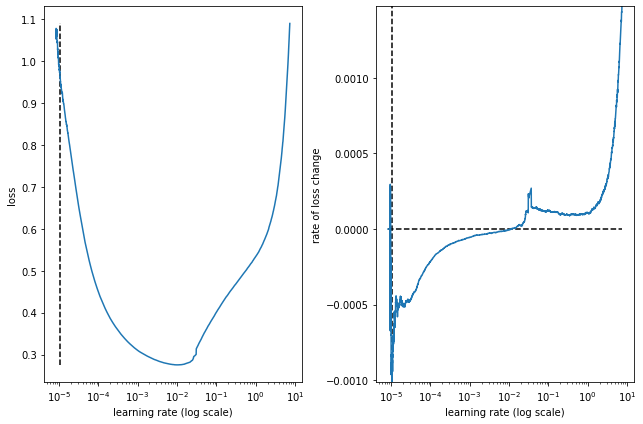

best lr: 1.0440924e-05 

Model: "mh_conv1d_dense_24l_48s_16bs_173fm_52f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_62 (InputLayer)          [(None, 24, 10)]     0           []                               
                                                                                                  
 conv1d_183 (Conv1D)            (None, 14, 52)       5772        ['input_62[0][0]']               
                                                                                                  
 conv1d_184 (Conv1D)            (None, 9, 52)        8372        ['input_62[0][0]']               
                                                                                                  
 conv1d_185 (Conv1D)            (None, 4, 52)        10972       ['input_62[0][0]']               
                                

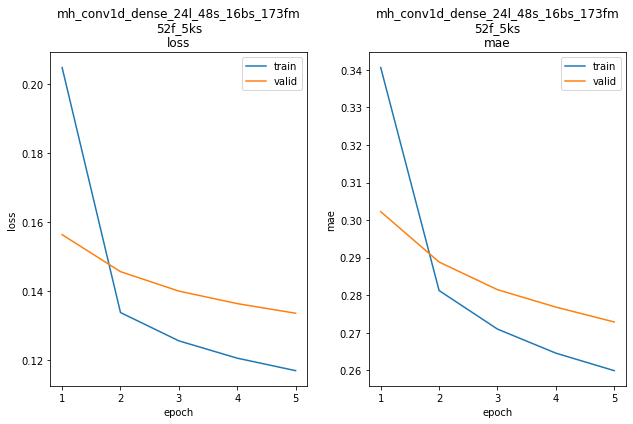

mh_conv1d_dense_24l_48s_16bs_173fm_52f_5ks train min loss: 0.116831	mae: 0.259905	epoch: 5
mh_conv1d_dense_24l_48s_16bs_173fm_52f_5ks valid min loss: 0.133497	mae: 0.272869	epoch: 5

mh_conv1d_dense_24l_48s_16bs_173fm_52f_5ks
Iteration No: 55 ended. Search finished for the next optimal point.
Time taken: 353.2707
Function value obtained: 0.1335
Current minimum: 0.1282
Iteration No: 56 started. Searching for the next optimal point.
lags 26
feat_maps 256
filters 33
kern_size 1
Epoch 1/5
11759/11759 [==============================] - 62s 5ms/step - loss: 1.0147 - mae: 0.6713


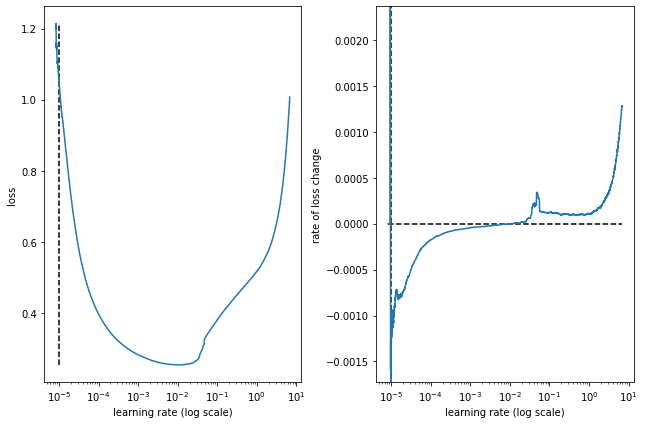

best lr: 9.819951e-06 

Model: "mh_conv1d_dense_26l_48s_16bs_256fm_33f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_63 (InputLayer)          [(None, 26, 10)]     0           []                               
                                                                                                  
 conv1d_186 (Conv1D)            (None, 24, 33)       1023        ['input_63[0][0]']               
                                                                                                  
 conv1d_187 (Conv1D)            (None, 23, 33)       1353        ['input_63[0][0]']               
                                                                                                  
 conv1d_188 (Conv1D)            (None, 22, 33)       1683        ['input_63[0][0]']               
                                 

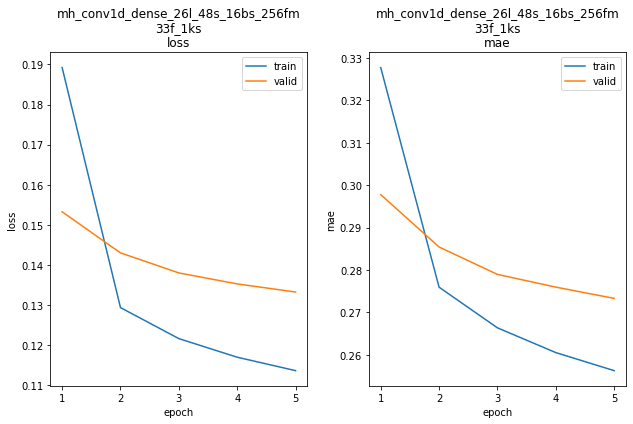

mh_conv1d_dense_26l_48s_16bs_256fm_33f_1ks train min loss: 0.113670	mae: 0.256294	epoch: 5
mh_conv1d_dense_26l_48s_16bs_256fm_33f_1ks valid min loss: 0.133269	mae: 0.273328	epoch: 5

mh_conv1d_dense_26l_48s_16bs_256fm_33f_1ks
Iteration No: 56 ended. Search finished for the next optimal point.
Time taken: 360.0211
Function value obtained: 0.1333
Current minimum: 0.1282
Iteration No: 57 started. Searching for the next optimal point.
lags 25
feat_maps 129
filters 63
kern_size 5
Epoch 1/5
11759/11759 [==============================] - 70s 6ms/step - loss: 1.2101 - mae: 0.7202


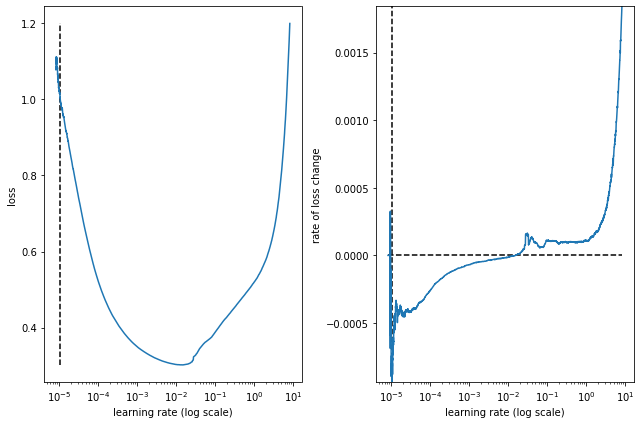

best lr: 1.0440924e-05 

Model: "mh_conv1d_dense_25l_48s_16bs_129fm_63f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_64 (InputLayer)          [(None, 25, 10)]     0           []                               
                                                                                                  
 conv1d_189 (Conv1D)            (None, 15, 63)       6993        ['input_64[0][0]']               
                                                                                                  
 conv1d_190 (Conv1D)            (None, 10, 63)       10143       ['input_64[0][0]']               
                                                                                                  
 conv1d_191 (Conv1D)            (None, 5, 63)        13293       ['input_64[0][0]']               
                                

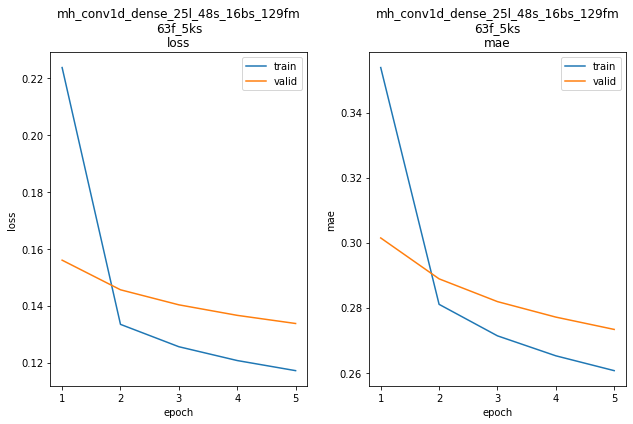

mh_conv1d_dense_25l_48s_16bs_129fm_63f_5ks train min loss: 0.117142	mae: 0.260648	epoch: 5
mh_conv1d_dense_25l_48s_16bs_129fm_63f_5ks valid min loss: 0.133728	mae: 0.273319	epoch: 5

mh_conv1d_dense_25l_48s_16bs_129fm_63f_5ks
Iteration No: 57 ended. Search finished for the next optimal point.
Time taken: 421.6517
Function value obtained: 0.1337
Current minimum: 0.1282
Iteration No: 58 started. Searching for the next optimal point.
lags 25
feat_maps 137
filters 33
kern_size 1
Epoch 1/5
11759/11759 [==============================] - 63s 5ms/step - loss: 1.1469 - mae: 0.5815


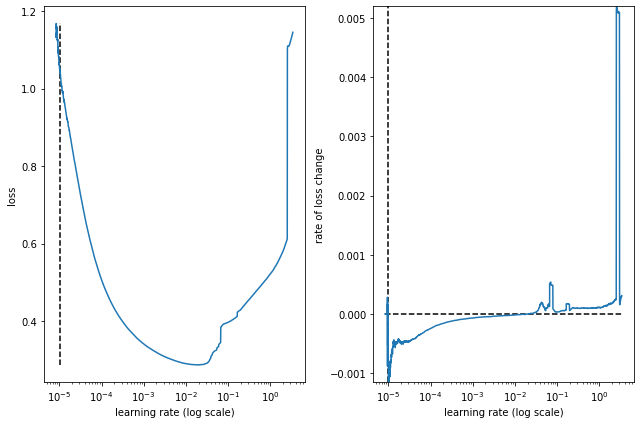

best lr: 1.0099104e-05 

Model: "mh_conv1d_dense_25l_48s_16bs_137fm_33f_1ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_65 (InputLayer)          [(None, 25, 10)]     0           []                               
                                                                                                  
 conv1d_192 (Conv1D)            (None, 23, 33)       1023        ['input_65[0][0]']               
                                                                                                  
 conv1d_193 (Conv1D)            (None, 22, 33)       1353        ['input_65[0][0]']               
                                                                                                  
 conv1d_194 (Conv1D)            (None, 21, 33)       1683        ['input_65[0][0]']               
                                

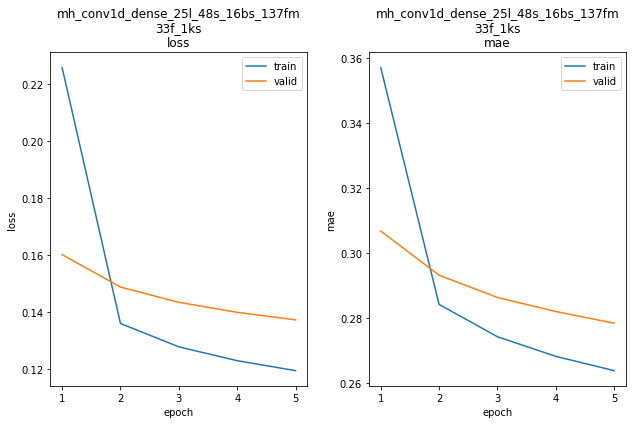

mh_conv1d_dense_25l_48s_16bs_137fm_33f_1ks train min loss: 0.119339	mae: 0.263735	epoch: 5
mh_conv1d_dense_25l_48s_16bs_137fm_33f_1ks valid min loss: 0.137142	mae: 0.278355	epoch: 5

mh_conv1d_dense_25l_48s_16bs_137fm_33f_1ks
Iteration No: 58 ended. Search finished for the next optimal point.
Time taken: 395.7603
Function value obtained: 0.1371
Current minimum: 0.1282
Iteration No: 59 started. Searching for the next optimal point.
lags 46
feat_maps 222
filters 64
kern_size 5
Epoch 1/5
11758/11758 [==============================] - 69s 6ms/step - loss: 0.9532 - mae: 0.6548


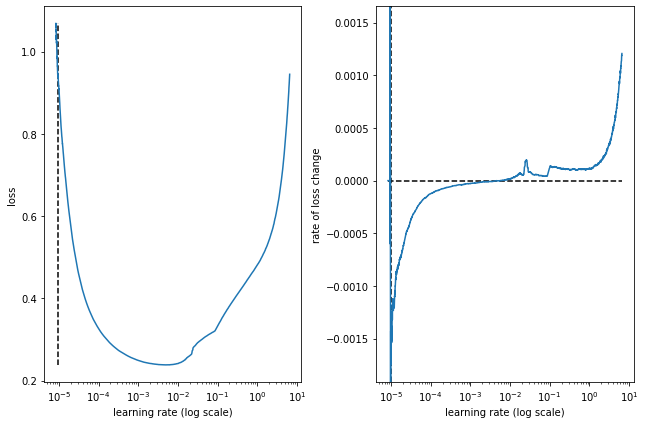

best lr: 9.7004195e-06 

Model: "mh_conv1d_dense_46l_48s_16bs_222fm_64f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_66 (InputLayer)          [(None, 46, 10)]     0           []                               
                                                                                                  
 conv1d_195 (Conv1D)            (None, 36, 64)       7104        ['input_66[0][0]']               
                                                                                                  
 conv1d_196 (Conv1D)            (None, 31, 64)       10304       ['input_66[0][0]']               
                                                                                                  
 conv1d_197 (Conv1D)            (None, 26, 64)       13504       ['input_66[0][0]']               
                                

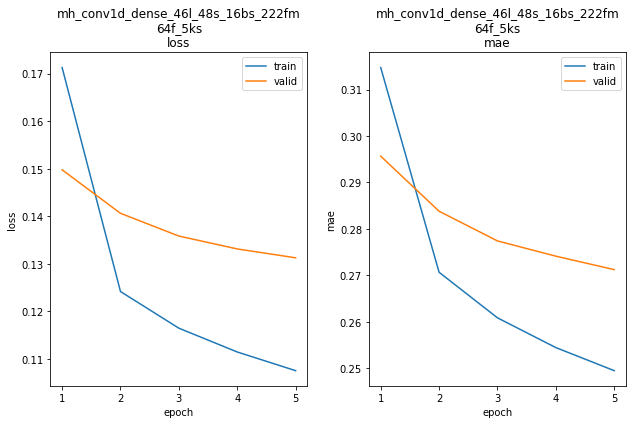

mh_conv1d_dense_46l_48s_16bs_222fm_64f_5ks train min loss: 0.107559	mae: 0.249489	epoch: 5
mh_conv1d_dense_46l_48s_16bs_222fm_64f_5ks valid min loss: 0.131280	mae: 0.271240	epoch: 5

mh_conv1d_dense_46l_48s_16bs_222fm_64f_5ks
Iteration No: 59 ended. Search finished for the next optimal point.
Time taken: 390.3839
Function value obtained: 0.1313
Current minimum: 0.1282
Iteration No: 60 started. Searching for the next optimal point.
lags 45
feat_maps 188
filters 32
kern_size 5
Epoch 1/5
11758/11758 [==============================] - 66s 6ms/step - loss: 1.0405 - mae: 0.6831


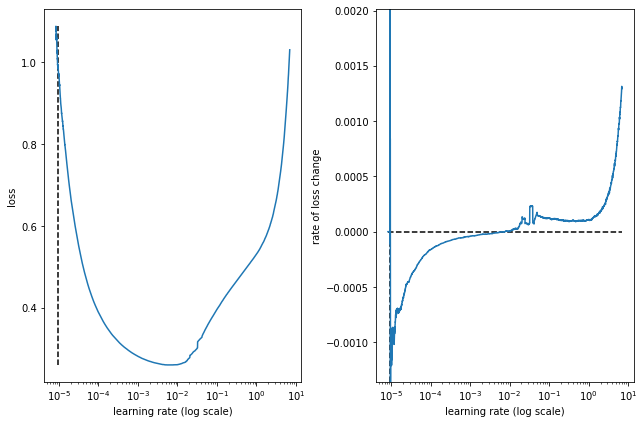

best lr: 9.7004195e-06 

Model: "mh_conv1d_dense_45l_48s_16bs_188fm_32f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_67 (InputLayer)          [(None, 45, 10)]     0           []                               
                                                                                                  
 conv1d_198 (Conv1D)            (None, 35, 32)       3552        ['input_67[0][0]']               
                                                                                                  
 conv1d_199 (Conv1D)            (None, 30, 32)       5152        ['input_67[0][0]']               
                                                                                                  
 conv1d_200 (Conv1D)            (None, 25, 32)       6752        ['input_67[0][0]']               
                                

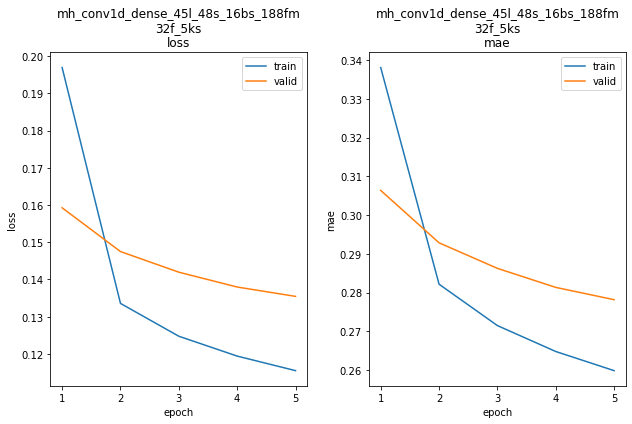

mh_conv1d_dense_45l_48s_16bs_188fm_32f_5ks train min loss: 0.115511	mae: 0.259879	epoch: 5
mh_conv1d_dense_45l_48s_16bs_188fm_32f_5ks valid min loss: 0.135464	mae: 0.278179	epoch: 5

mh_conv1d_dense_45l_48s_16bs_188fm_32f_5ks
Iteration No: 60 ended. Search finished for the next optimal point.
Time taken: 431.6692
Function value obtained: 0.1355
Current minimum: 0.1282

[42, 255, 63, 1]
0.12817910313606262



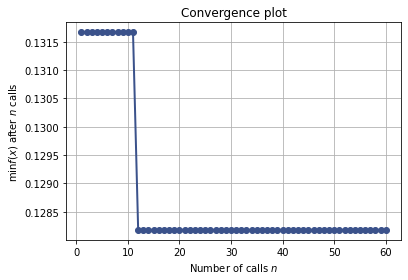

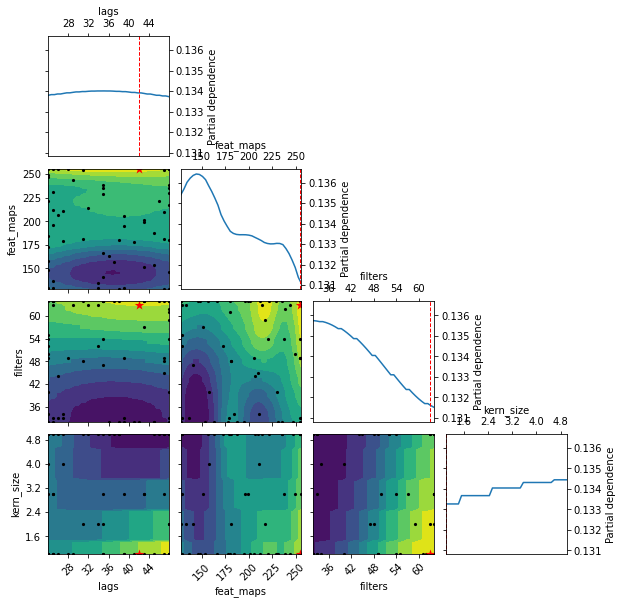

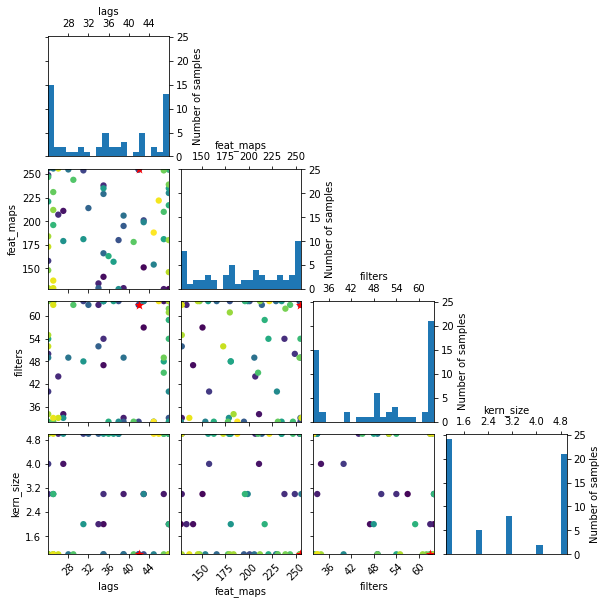

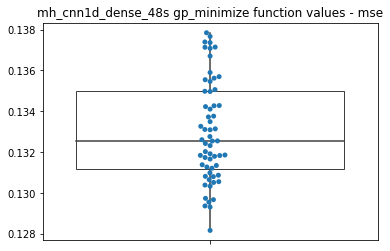

CPU times: user 6h 9min 7s, sys: 45min 22s, total: 6h 54min 30s
Wall time: 6h 32min 14s


In [ ]:
%%time


results_id = 'mh_cnn1d_dense_48s'
hpo[results_id] = {}

dim_lags      = Integer(low =  24, high =  48, name = 'lags')
dim_feat_maps = Integer(low = 128, high = 256, name = 'feat_maps')
dim_filters   = Integer(low =  32, high =  64, name = 'filters')
dim_kern_size = Integer(low =   1, high =   5, name = 'kern_size')

hpo[results_id]['dims'] = [dim_lags,
                           dim_feat_maps,
                           dim_filters,
                           dim_kern_size]
hpo[results_id]['init_dims'] = [48, 128, 64, 2]
hpo[results_id]['calls']     = 60


@use_named_args(dimensions = hpo[results_id]['dims'])
def model_fitness(**dims):
    params = get_default_params('mh_conv1d_dense')
    params.update({'lrf_params': [0.000008,  0.0002, 32, 5, 100, 25]})
   #params.update({'lrf_params': [0.000001,  0.0002, 32, 5, 100, 25]})

    return get_bo_mse(params, **dims)


hpo[results_id]['fitness_func'] = model_fitness
hpo[results_id]['results']      = run_bo_search(hpo, results_id)



Results for optimised Multihead-Conv1D 48 steps-ahead forecast models after 5 epochs:

| CNN model | params                                     | mse     | mae     |
|-----------|--------------------------------------------|---------|---------|
|Conv1D-LSTM| lags=30,feat_maps=27,filters=63,kern_size=7| 0.12481 | 0.26295 |
|Conv1D-Dense|lags=32,feat_maps=32,filters=45,kern_size=3| 0.12564 | 0.26368 |
|MH  Conv1D |lags=42,feat_maps=255,filters=63,kern_size=[3,4,5]| 0.12818 | 0.26698 |

Best model:
 * mh_conv1d_dense_42l_48s_16bs_255fm_63f_1ks 

Training time remains acceptible despite the high number of model parameters (over 1 million in some cases).

This minimal value is greater than the other Conv1D minimal mse values.
Combined with the 3 minimal kern_sizes (3,4,5) suggests this architecture may not be worth exploring further.

From the Gaussian process plots we can infer:
 * feat_maps - higher is better
 * filters - higher is better
 * kern_size - lower may be better but only marginally
 * lags - less confident drawing any inferences

It's clear from some of the learning rate finder curves that start_lr and/or end_lr could be further refined.  Start_lr may be a little low but results seem OK.

As with all of the skopt runs, it would benefit from running for more iterations and probably more learning rate tuning.

---

### Conv2D - Dense


Multi-variate time series data can be treated like a simple 2D image with a single channel; meaning we can apply [Conv2D layers](https://keras.io/api/layers/convolution_layers/convolution2d/).

Code for this architecture is in the `build_conv2d_dense_model` function.

Briefly, the architecture is (omitting dropout and regularisation):
 * Conv2D()
 * Flatten()
 * Dense(activation='relu')
 * Dense(activation='relu')
 * Dense()

This time, optimise:
 * lags
 * feat_maps - Dense(activation='relu') feature maps
 * Conv2D() filters
 * Conv2D() kernel size (ks_feats, see below)

A few notes on the Conv2d() kernel size:
 * input tensors have the following shape 
   * (batch, time window, features, channels)
   * for example (16, 24, 10, 1)
 * **kernel_size**: A tuple/list of 2 integers, specifying the height and width of the 2D convolution window
 * if we use a kernel_size = (1, ks_feats) then we can find a convolution window that checks the features and calculates which are the relevant ones
 * here ks_feats will probably be small - 2 or 3


Iteration No: 1 started. Evaluating function at provided point.
feat_maps 512
lags 24
filters 64
kern_size 2
Epoch 1/5
11759/11759 [==============================] - 9s 697us/step - loss: 1.8037 - mae: 0.5308


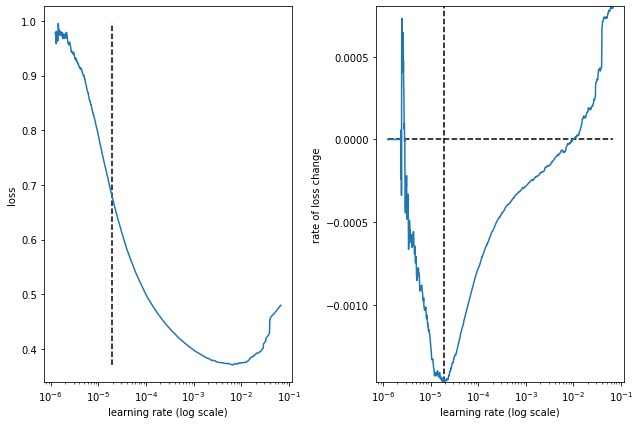

best lr: 1.9567642e-05 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_2ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_120 (Reshape)       (None, 24, 10, 1)         0         
                                                                 
 conv2d_60 (Conv2D)          (None, 24, 10, 64)        192       
                                                                 
 flatten_60 (Flatten)        (None, 15360)             0         
                                                                 
 dense_180 (Dense)           (None, 512)               7864832   
                                                                 
 dense_181 (Dense)           (None, 256)               131328    
                                                                 
 dense_182 (Dense)           (None, 48)                12336     
                                                                 
 r

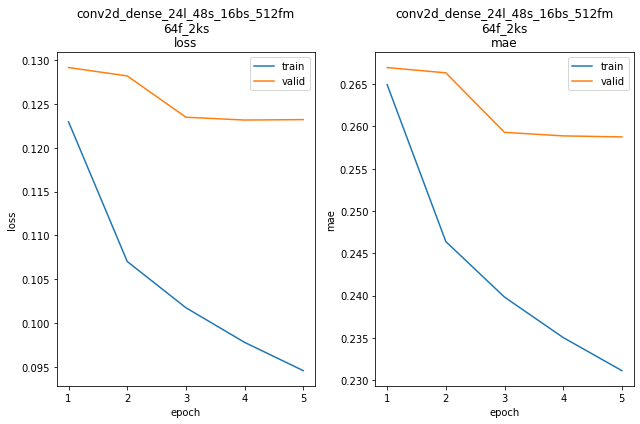

conv2d_dense_24l_48s_16bs_512fm_64f_2ks train min loss: 0.094563	mae: 0.231115	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_2ks valid min loss: 0.123167	mae: 0.258889	epoch: 4

conv2d_dense_24l_48s_16bs_512fm_64f_2ks
Iteration No: 1 ended. Evaluation done at provided point.
Time taken: 331.6970
Function value obtained: 0.1232
Current minimum: 0.1232
Iteration No: 2 started. Evaluating function at random point.
feat_maps 421
lags 28
filters 53
kern_size 5
Epoch 1/5
11759/11759 [==============================] - 12s 967us/step - loss: 1.5008 - mae: 0.7766


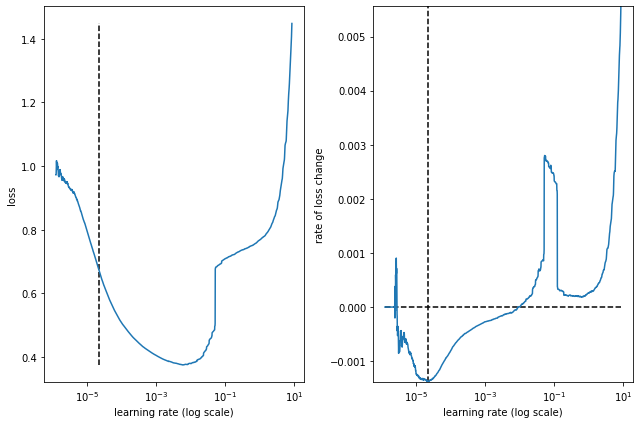

best lr: 2.212465e-05 

Model: "conv2d_dense_28l_48s_16bs_421fm_53f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_122 (Reshape)       (None, 28, 10, 1)         0         
                                                                 
 conv2d_61 (Conv2D)          (None, 28, 10, 53)        318       
                                                                 
 flatten_61 (Flatten)        (None, 14840)             0         
                                                                 
 dense_183 (Dense)           (None, 421)               6248061   
                                                                 
 dense_184 (Dense)           (None, 210)               88620     
                                                                 
 dense_185 (Dense)           (None, 48)                10128     
                                                                 
 re

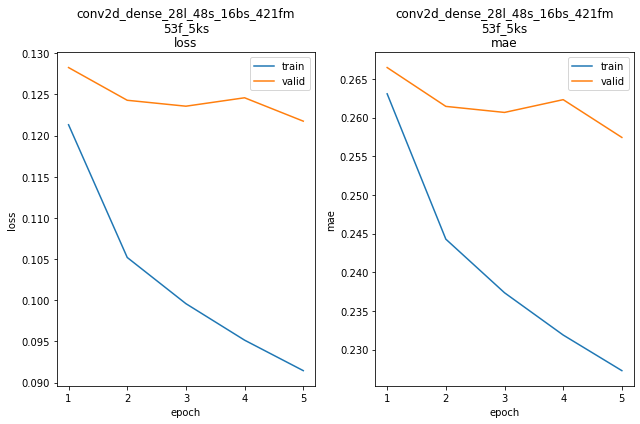

conv2d_dense_28l_48s_16bs_421fm_53f_5ks train min loss: 0.091457	mae: 0.227291	epoch: 5
conv2d_dense_28l_48s_16bs_421fm_53f_5ks valid min loss: 0.121746	mae: 0.257430	epoch: 5

conv2d_dense_28l_48s_16bs_421fm_53f_5ks
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 366.3215
Function value obtained: 0.1217
Current minimum: 0.1217
Iteration No: 3 started. Evaluating function at random point.
feat_maps 264
lags 26
filters 38
kern_size 3
Epoch 1/5
11759/11759 [==============================] - 10s 834us/step - loss: 1.6984 - mae: 0.8235


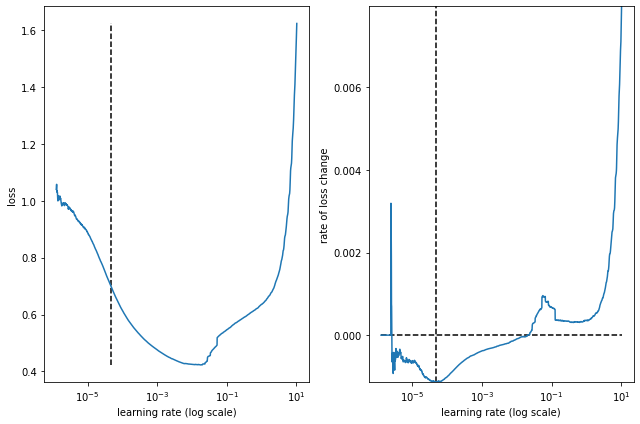

best lr: 4.7046084e-05 

Model: "conv2d_dense_26l_48s_16bs_264fm_38f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_124 (Reshape)       (None, 26, 10, 1)         0         
                                                                 
 conv2d_62 (Conv2D)          (None, 26, 10, 38)        152       
                                                                 
 flatten_62 (Flatten)        (None, 9880)              0         
                                                                 
 dense_186 (Dense)           (None, 264)               2608584   
                                                                 
 dense_187 (Dense)           (None, 132)               34980     
                                                                 
 dense_188 (Dense)           (None, 48)                6384      
                                                                 
 r

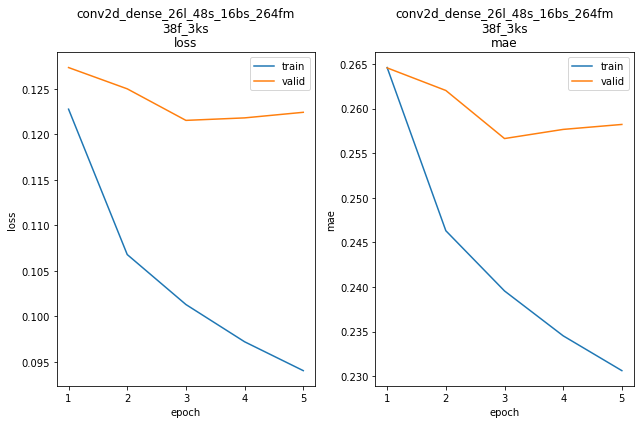

conv2d_dense_26l_48s_16bs_264fm_38f_3ks train min loss: 0.094033	mae: 0.230615	epoch: 5
conv2d_dense_26l_48s_16bs_264fm_38f_3ks valid min loss: 0.121525	mae: 0.256642	epoch: 3

conv2d_dense_26l_48s_16bs_264fm_38f_3ks
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 345.5261
Function value obtained: 0.1215
Current minimum: 0.1215
Iteration No: 4 started. Evaluating function at random point.
feat_maps 128
lags 40
filters 19
kern_size 5
Epoch 1/5
11758/11758 [==============================] - 8s 633us/step - loss: 43.1557 - mae: 0.7374


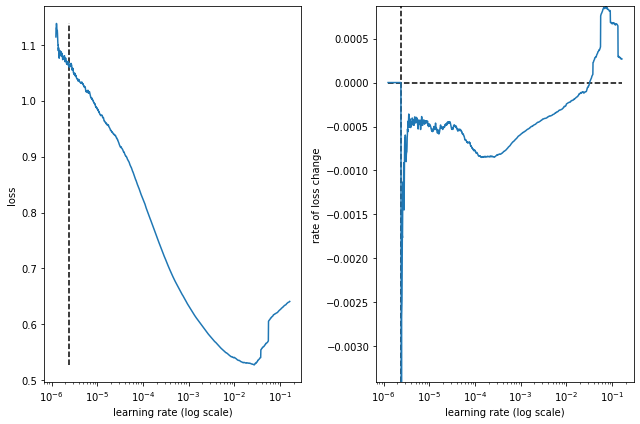

best lr: 2.4470207e-06 

Model: "conv2d_dense_40l_48s_16bs_128fm_19f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_126 (Reshape)       (None, 40, 10, 1)         0         
                                                                 
 conv2d_63 (Conv2D)          (None, 40, 10, 19)        114       
                                                                 
 flatten_63 (Flatten)        (None, 7600)              0         
                                                                 
 dense_189 (Dense)           (None, 128)               972928    
                                                                 
 dense_190 (Dense)           (None, 64)                8256      
                                                                 
 dense_191 (Dense)           (None, 48)                3120      
                                                                 
 r

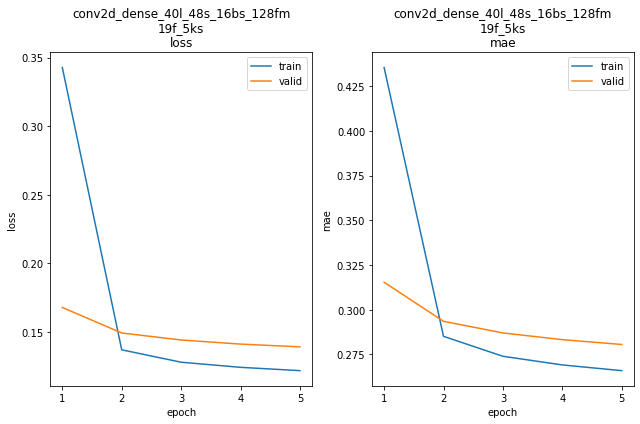

conv2d_dense_40l_48s_16bs_128fm_19f_5ks train min loss: 0.121784	mae: 0.265953	epoch: 5
conv2d_dense_40l_48s_16bs_128fm_19f_5ks valid min loss: 0.139141	mae: 0.280583	epoch: 5

conv2d_dense_40l_48s_16bs_128fm_19f_5ks
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 258.7142
Function value obtained: 0.1391
Current minimum: 0.1215
Iteration No: 5 started. Evaluating function at random point.
feat_maps 484
lags 24
filters 64
kern_size 5
Epoch 1/5
11759/11759 [==============================] - 9s 730us/step - loss: 1.5596 - mae: 0.5627


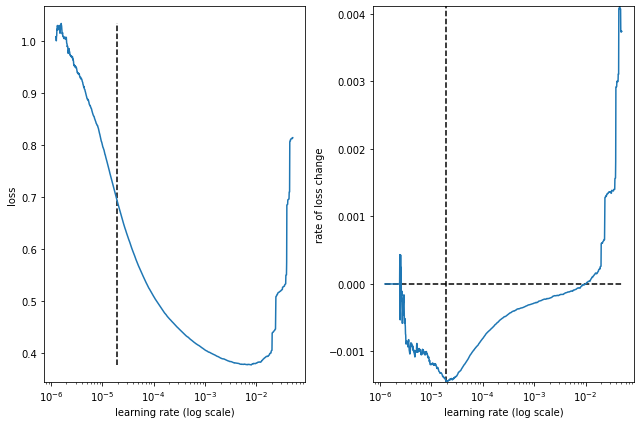

best lr: 1.9396735e-05 

Model: "conv2d_dense_24l_48s_16bs_484fm_64f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_128 (Reshape)       (None, 24, 10, 1)         0         
                                                                 
 conv2d_64 (Conv2D)          (None, 24, 10, 64)        384       
                                                                 
 flatten_64 (Flatten)        (None, 15360)             0         
                                                                 
 dense_192 (Dense)           (None, 484)               7434724   
                                                                 
 dense_193 (Dense)           (None, 242)               117370    
                                                                 
 dense_194 (Dense)           (None, 48)                11664     
                                                                 
 r

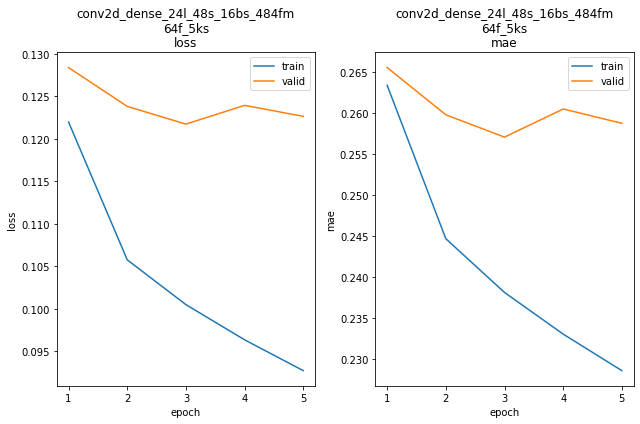

conv2d_dense_24l_48s_16bs_484fm_64f_5ks train min loss: 0.092724	mae: 0.228568	epoch: 5
conv2d_dense_24l_48s_16bs_484fm_64f_5ks valid min loss: 0.121737	mae: 0.257064	epoch: 3

conv2d_dense_24l_48s_16bs_484fm_64f_5ks
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 357.3877
Function value obtained: 0.1217
Current minimum: 0.1215
Iteration No: 6 started. Evaluating function at random point.
feat_maps 338
lags 24
filters 17
kern_size 4
Epoch 1/5
11759/11759 [==============================] - 8s 631us/step - loss: 1743.8127 - mae: 1.6064


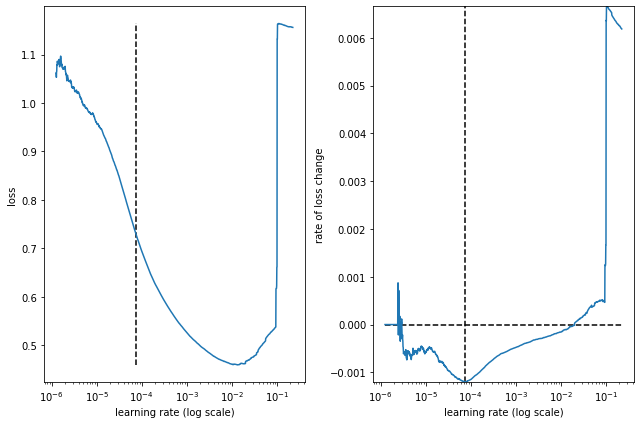

best lr: 7.423957e-05 

Model: "conv2d_dense_24l_48s_16bs_338fm_17f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_130 (Reshape)       (None, 24, 10, 1)         0         
                                                                 
 conv2d_65 (Conv2D)          (None, 24, 10, 17)        85        
                                                                 
 flatten_65 (Flatten)        (None, 4080)              0         
                                                                 
 dense_195 (Dense)           (None, 338)               1379378   
                                                                 
 dense_196 (Dense)           (None, 169)               57291     
                                                                 
 dense_197 (Dense)           (None, 48)                8160      
                                                                 
 re

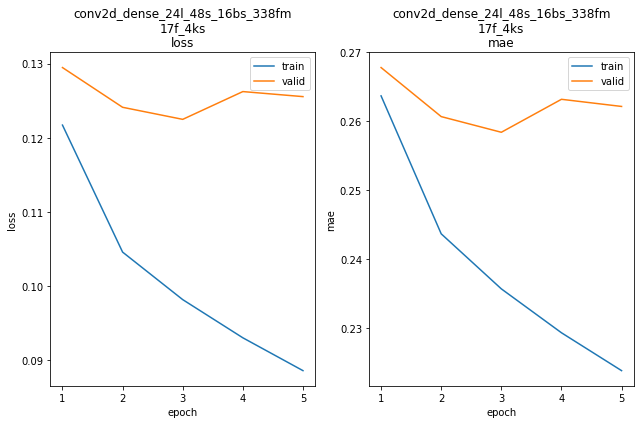

conv2d_dense_24l_48s_16bs_338fm_17f_4ks train min loss: 0.088552	mae: 0.223841	epoch: 5
conv2d_dense_24l_48s_16bs_338fm_17f_4ks valid min loss: 0.122482	mae: 0.258424	epoch: 3

conv2d_dense_24l_48s_16bs_338fm_17f_4ks
Iteration No: 6 ended. Evaluation done at random point.
Time taken: 344.0842
Function value obtained: 0.1225
Current minimum: 0.1215
Iteration No: 7 started. Evaluating function at random point.
feat_maps 243
lags 25
filters 63
kern_size 2
Epoch 1/5
11759/11759 [==============================] - 12s 959us/step - loss: 1.6478 - mae: 0.8161


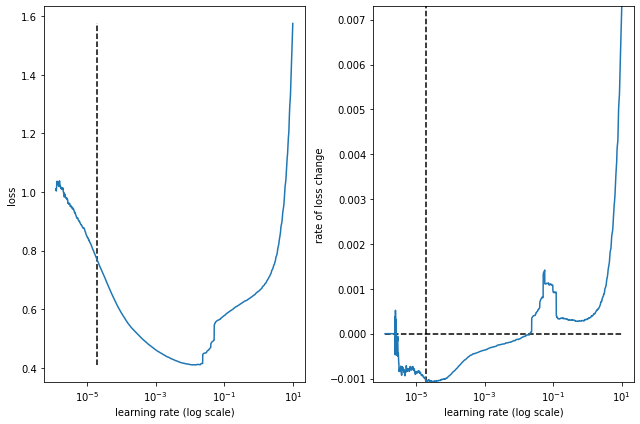

best lr: 1.9913987e-05 

Model: "conv2d_dense_25l_48s_16bs_243fm_63f_2ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_132 (Reshape)       (None, 25, 10, 1)         0         
                                                                 
 conv2d_66 (Conv2D)          (None, 25, 10, 63)        189       
                                                                 
 flatten_66 (Flatten)        (None, 15750)             0         
                                                                 
 dense_198 (Dense)           (None, 243)               3827493   
                                                                 
 dense_199 (Dense)           (None, 121)               29524     
                                                                 
 dense_200 (Dense)           (None, 48)                5856      
                                                                 
 r

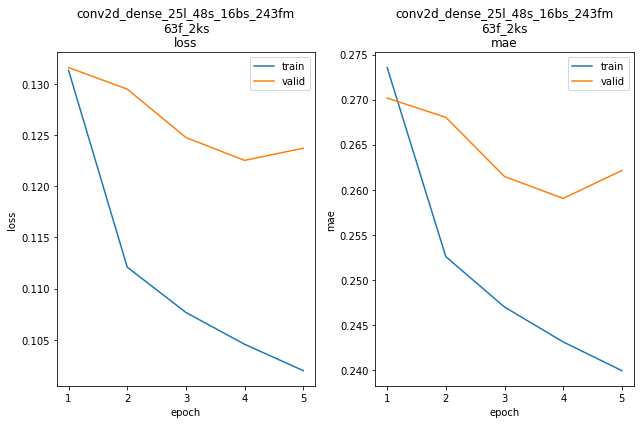

conv2d_dense_25l_48s_16bs_243fm_63f_2ks train min loss: 0.101983	mae: 0.239928	epoch: 5
conv2d_dense_25l_48s_16bs_243fm_63f_2ks valid min loss: 0.122537	mae: 0.259038	epoch: 4

conv2d_dense_25l_48s_16bs_243fm_63f_2ks
Iteration No: 7 ended. Evaluation done at random point.
Time taken: 311.0413
Function value obtained: 0.1225
Current minimum: 0.1215
Iteration No: 8 started. Evaluating function at random point.
feat_maps 105
lags 39
filters 34
kern_size 7
Epoch 1/5
11758/11758 [==============================] - 11s 870us/step - loss: 2.0496 - mae: 0.8907


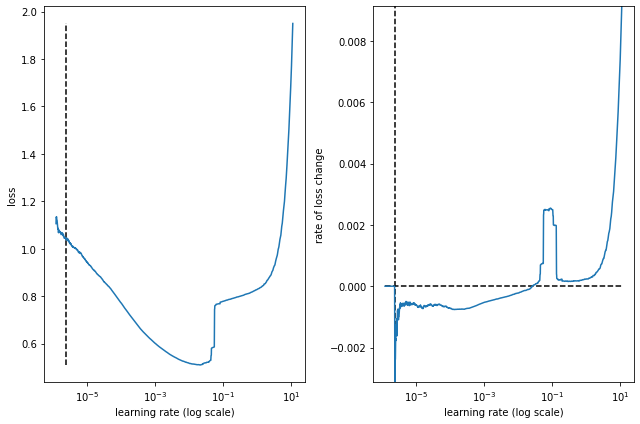

best lr: 2.4256462e-06 

Model: "conv2d_dense_39l_48s_16bs_105fm_34f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_134 (Reshape)       (None, 39, 10, 1)         0         
                                                                 
 conv2d_67 (Conv2D)          (None, 39, 10, 34)        272       
                                                                 
 flatten_67 (Flatten)        (None, 13260)             0         
                                                                 
 dense_201 (Dense)           (None, 105)               1392405   
                                                                 
 dense_202 (Dense)           (None, 52)                5512      
                                                                 
 dense_203 (Dense)           (None, 48)                2544      
                                                                 
 r

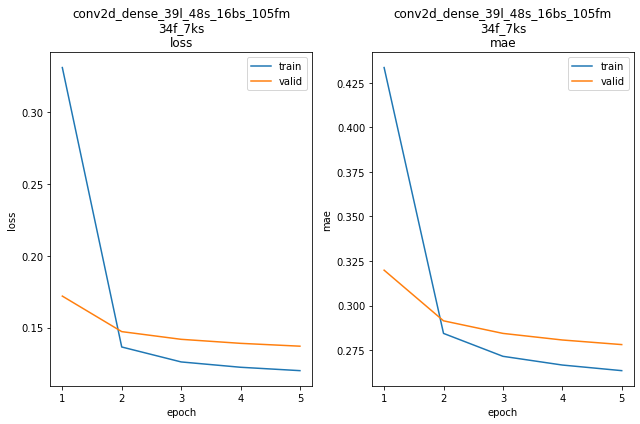

conv2d_dense_39l_48s_16bs_105fm_34f_7ks train min loss: 0.120055	mae: 0.263512	epoch: 5
conv2d_dense_39l_48s_16bs_105fm_34f_7ks valid min loss: 0.137102	mae: 0.278129	epoch: 5

conv2d_dense_39l_48s_16bs_105fm_34f_7ks
Iteration No: 8 ended. Evaluation done at random point.
Time taken: 358.2563
Function value obtained: 0.1371
Current minimum: 0.1215
Iteration No: 9 started. Evaluating function at random point.
feat_maps 273
lags 45
filters 49
kern_size 4
Epoch 1/5
11758/11758 [==============================] - 9s 725us/step - loss: 2.2871 - mae: 0.5582


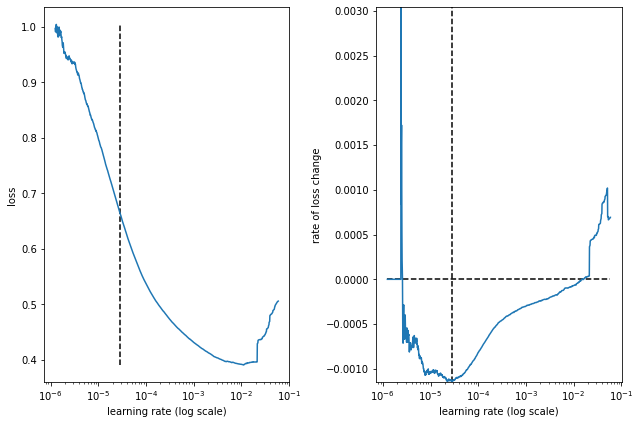

best lr: 2.8292769e-05 

Model: "conv2d_dense_45l_48s_16bs_273fm_49f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_136 (Reshape)       (None, 45, 10, 1)         0         
                                                                 
 conv2d_68 (Conv2D)          (None, 45, 10, 49)        245       
                                                                 
 flatten_68 (Flatten)        (None, 22050)             0         
                                                                 
 dense_204 (Dense)           (None, 273)               6019923   
                                                                 
 dense_205 (Dense)           (None, 136)               37264     
                                                                 
 dense_206 (Dense)           (None, 48)                6576      
                                                                 
 r

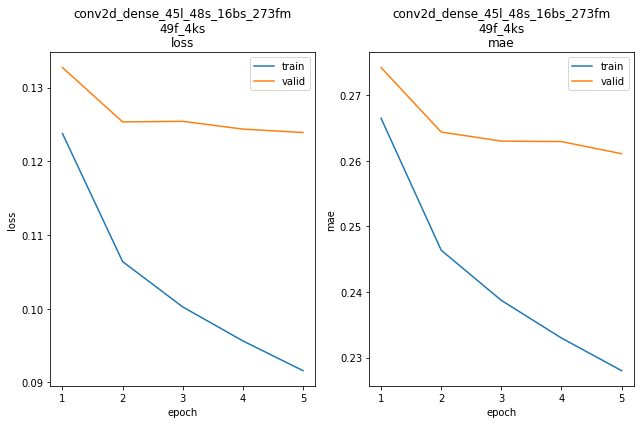

conv2d_dense_45l_48s_16bs_273fm_49f_4ks train min loss: 0.091602	mae: 0.227995	epoch: 5
conv2d_dense_45l_48s_16bs_273fm_49f_4ks valid min loss: 0.123907	mae: 0.261092	epoch: 5

conv2d_dense_45l_48s_16bs_273fm_49f_4ks
Iteration No: 9 ended. Evaluation done at random point.
Time taken: 388.6789
Function value obtained: 0.1239
Current minimum: 0.1215
Iteration No: 10 started. Evaluating function at random point.
feat_maps 70
lags 47
filters 43
kern_size 3
Epoch 1/5
11758/11758 [==============================] - 11s 899us/step - loss: 2.2897 - mae: 0.9371


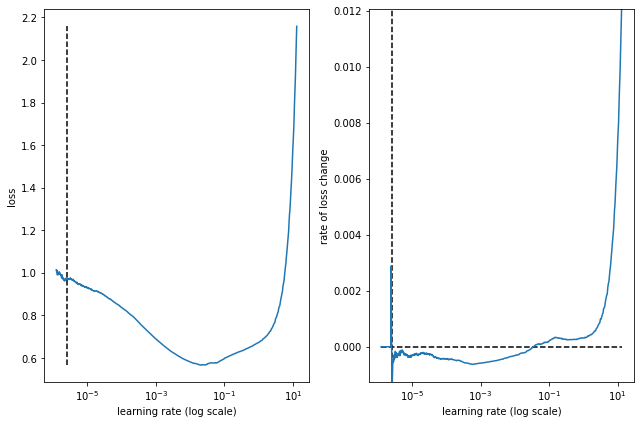

best lr: 2.6249381e-06 

Model: "conv2d_dense_47l_48s_16bs_70fm_43f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_138 (Reshape)       (None, 47, 10, 1)         0         
                                                                 
 conv2d_69 (Conv2D)          (None, 47, 10, 43)        172       
                                                                 
 flatten_69 (Flatten)        (None, 20210)             0         
                                                                 
 dense_207 (Dense)           (None, 70)                1414770   
                                                                 
 dense_208 (Dense)           (None, 35)                2485      
                                                                 
 dense_209 (Dense)           (None, 48)                1728      
                                                                 
 re

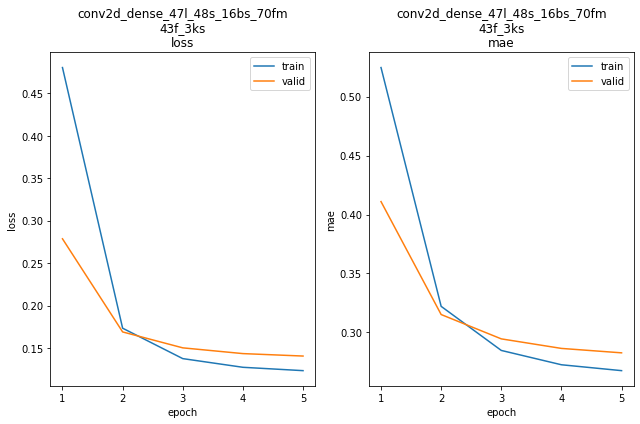

conv2d_dense_47l_48s_16bs_70fm_43f_3ks train min loss: 0.123388	mae: 0.267587	epoch: 5
conv2d_dense_47l_48s_16bs_70fm_43f_3ks valid min loss: 0.140578	mae: 0.282690	epoch: 5

conv2d_dense_47l_48s_16bs_70fm_43f_3ks
WARN: bad model conv2d_dense_47l_48s_16bs_70fm_43f_3ks
Iteration No: 10 ended. Evaluation done at random point.
Time taken: 309.6247
Function value obtained: 0.1406
Current minimum: 0.1215
Iteration No: 11 started. Evaluating function at random point.
feat_maps 71
lags 30
filters 28
kern_size 5
Epoch 1/5
11759/11759 [==============================] - 11s 885us/step - loss: 2.2727 - mae: 0.9351


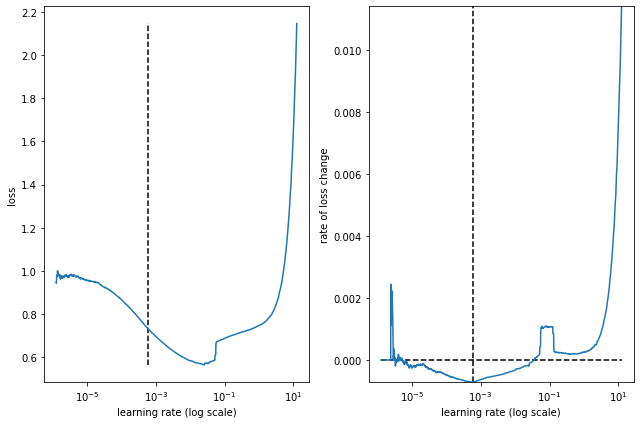

best lr: 0.00057828205 

Model: "conv2d_dense_30l_48s_16bs_71fm_28f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_140 (Reshape)       (None, 30, 10, 1)         0         
                                                                 
 conv2d_70 (Conv2D)          (None, 30, 10, 28)        168       
                                                                 
 flatten_70 (Flatten)        (None, 8400)              0         
                                                                 
 dense_210 (Dense)           (None, 71)                596471    
                                                                 
 dense_211 (Dense)           (None, 35)                2520      
                                                                 
 dense_212 (Dense)           (None, 48)                1728      
                                                                 
 re

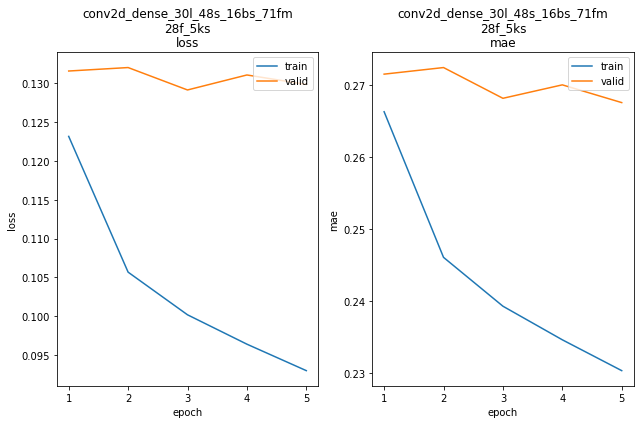

conv2d_dense_30l_48s_16bs_71fm_28f_5ks train min loss: 0.093008	mae: 0.230390	epoch: 5
conv2d_dense_30l_48s_16bs_71fm_28f_5ks valid min loss: 0.129132	mae: 0.268204	epoch: 3

conv2d_dense_30l_48s_16bs_71fm_28f_5ks
Iteration No: 11 ended. Evaluation done at random point.
Time taken: 270.8693
Function value obtained: 0.1291
Current minimum: 0.1215
Iteration No: 12 started. Evaluating function at random point.
feat_maps 473
lags 48
filters 29
kern_size 7
Epoch 1/5
11758/11758 [==============================] - 11s 882us/step - loss: 2463.3494 - mae: 1.7494


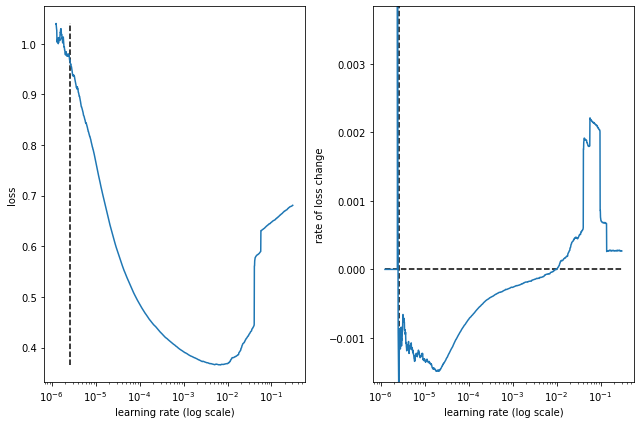

best lr: 2.5567515e-06 

Model: "conv2d_dense_48l_48s_16bs_473fm_29f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_142 (Reshape)       (None, 48, 10, 1)         0         
                                                                 
 conv2d_71 (Conv2D)          (None, 48, 10, 29)        232       
                                                                 
 flatten_71 (Flatten)        (None, 13920)             0         
                                                                 
 dense_213 (Dense)           (None, 473)               6584633   
                                                                 
 dense_214 (Dense)           (None, 236)               111864    
                                                                 
 dense_215 (Dense)           (None, 48)                11376     
                                                                 
 r

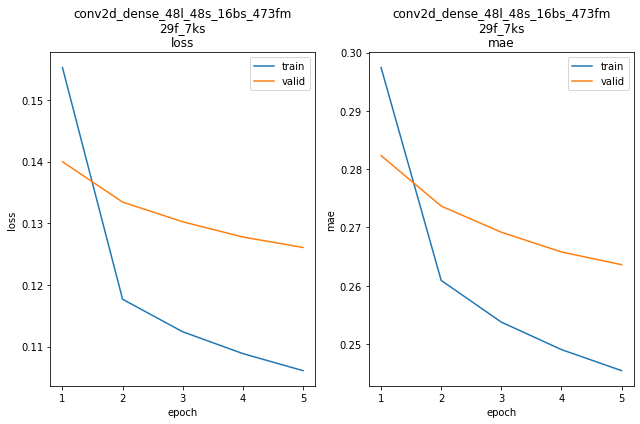

conv2d_dense_48l_48s_16bs_473fm_29f_7ks train min loss: 0.106108	mae: 0.245435	epoch: 5
conv2d_dense_48l_48s_16bs_473fm_29f_7ks valid min loss: 0.126076	mae: 0.263609	epoch: 5

conv2d_dense_48l_48s_16bs_473fm_29f_7ks
Iteration No: 12 ended. Evaluation done at random point.
Time taken: 328.4620
Function value obtained: 0.1261
Current minimum: 0.1215
Iteration No: 13 started. Searching for the next optimal point.
feat_maps 366
lags 48
filters 49
kern_size 1
Epoch 1/5
11758/11758 [==============================] - 10s 810us/step - loss: 1.9667 - mae: 0.5250


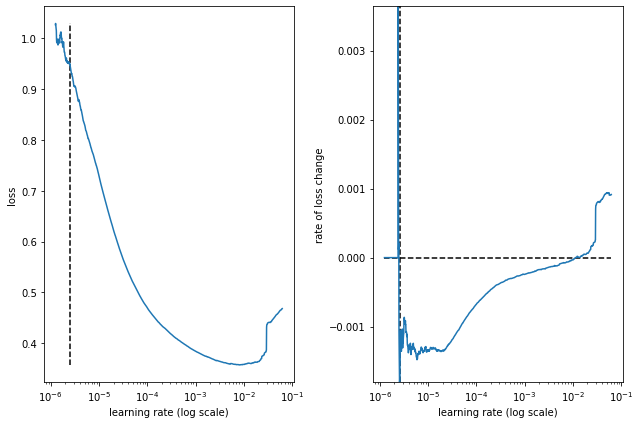

best lr: 2.5567515e-06 

Model: "conv2d_dense_48l_48s_16bs_366fm_49f_1ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_144 (Reshape)       (None, 48, 10, 1)         0         
                                                                 
 conv2d_72 (Conv2D)          (None, 48, 10, 49)        98        
                                                                 
 flatten_72 (Flatten)        (None, 23520)             0         
                                                                 
 dense_216 (Dense)           (None, 366)               8608686   
                                                                 
 dense_217 (Dense)           (None, 183)               67161     
                                                                 
 dense_218 (Dense)           (None, 48)                8832      
                                                                 
 r

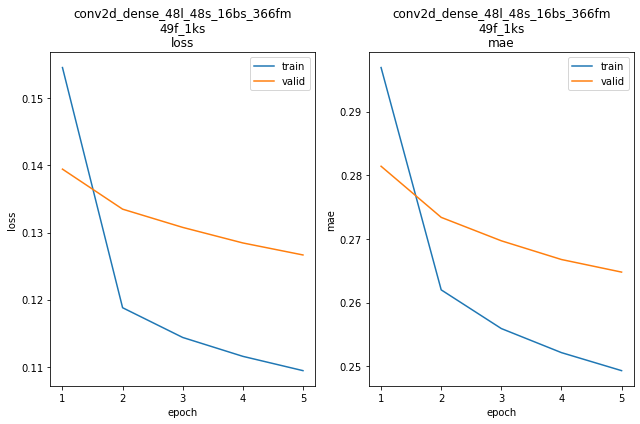

conv2d_dense_48l_48s_16bs_366fm_49f_1ks train min loss: 0.109422	mae: 0.249330	epoch: 5
conv2d_dense_48l_48s_16bs_366fm_49f_1ks valid min loss: 0.126659	mae: 0.264799	epoch: 5

conv2d_dense_48l_48s_16bs_366fm_49f_1ks
Iteration No: 13 ended. Search finished for the next optimal point.
Time taken: 360.9009
Function value obtained: 0.1267
Current minimum: 0.1215
Iteration No: 14 started. Searching for the next optimal point.
feat_maps 323
lags 36
filters 50
kern_size 7
Epoch 1/5
11758/11758 [==============================] - 10s 783us/step - loss: 13.0534 - mae: 0.6354


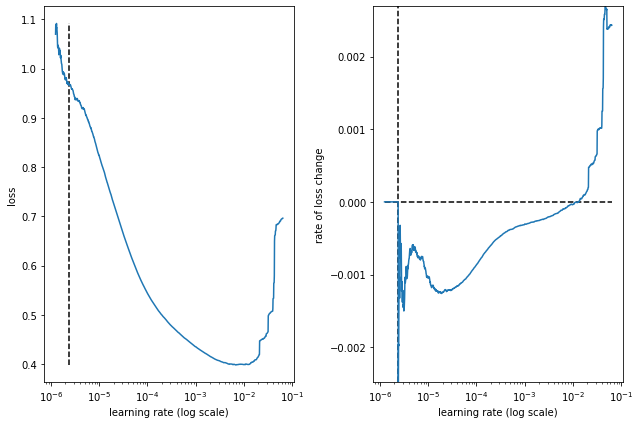

best lr: 2.4044584e-06 

Model: "conv2d_dense_36l_48s_16bs_323fm_50f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_146 (Reshape)       (None, 36, 10, 1)         0         
                                                                 
 conv2d_73 (Conv2D)          (None, 36, 10, 50)        400       
                                                                 
 flatten_73 (Flatten)        (None, 18000)             0         
                                                                 
 dense_219 (Dense)           (None, 323)               5814323   
                                                                 
 dense_220 (Dense)           (None, 161)               52164     
                                                                 
 dense_221 (Dense)           (None, 48)                7776      
                                                                 
 r

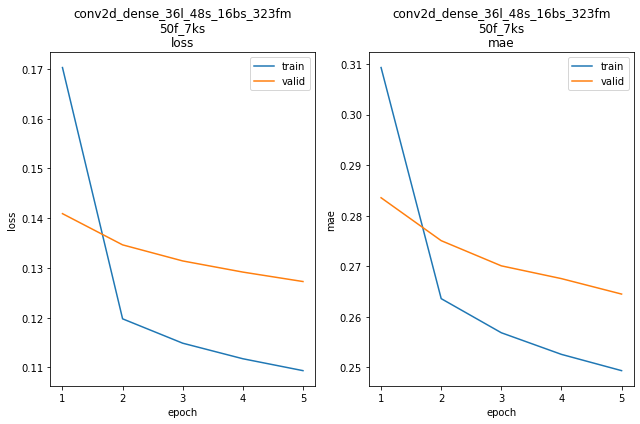

conv2d_dense_36l_48s_16bs_323fm_50f_7ks train min loss: 0.109367	mae: 0.249345	epoch: 5
conv2d_dense_36l_48s_16bs_323fm_50f_7ks valid min loss: 0.127279	mae: 0.264495	epoch: 5

conv2d_dense_36l_48s_16bs_323fm_50f_7ks
Iteration No: 14 ended. Search finished for the next optimal point.
Time taken: 356.6763
Function value obtained: 0.1273
Current minimum: 0.1215
Iteration No: 15 started. Searching for the next optimal point.
feat_maps 507
lags 34
filters 23
kern_size 7
Epoch 1/5
11759/11759 [==============================] - 13s 1ms/step - loss: 1.6283 - mae: 0.7939


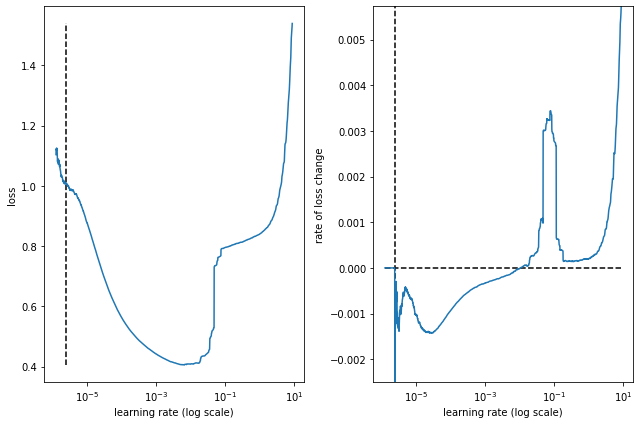

best lr: 2.404279e-06 

Model: "conv2d_dense_34l_48s_16bs_507fm_23f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_148 (Reshape)       (None, 34, 10, 1)         0         
                                                                 
 conv2d_74 (Conv2D)          (None, 34, 10, 23)        184       
                                                                 
 flatten_74 (Flatten)        (None, 7820)              0         
                                                                 
 dense_222 (Dense)           (None, 507)               3965247   
                                                                 
 dense_223 (Dense)           (None, 253)               128524    
                                                                 
 dense_224 (Dense)           (None, 48)                12192     
                                                                 
 re

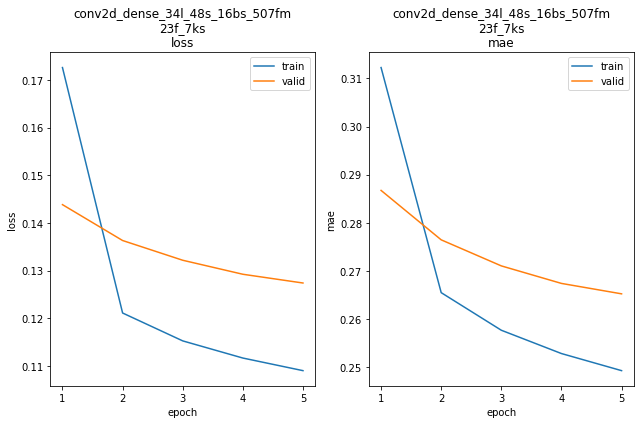

conv2d_dense_34l_48s_16bs_507fm_23f_7ks train min loss: 0.108986	mae: 0.249264	epoch: 5
conv2d_dense_34l_48s_16bs_507fm_23f_7ks valid min loss: 0.127376	mae: 0.265227	epoch: 5

conv2d_dense_34l_48s_16bs_507fm_23f_7ks
Iteration No: 15 ended. Search finished for the next optimal point.
Time taken: 349.4352
Function value obtained: 0.1274
Current minimum: 0.1215
Iteration No: 16 started. Searching for the next optimal point.
feat_maps 130
lags 24
filters 52
kern_size 5
Epoch 1/5
11759/11759 [==============================] - 9s 687us/step - loss: 2.1173 - mae: 0.6058


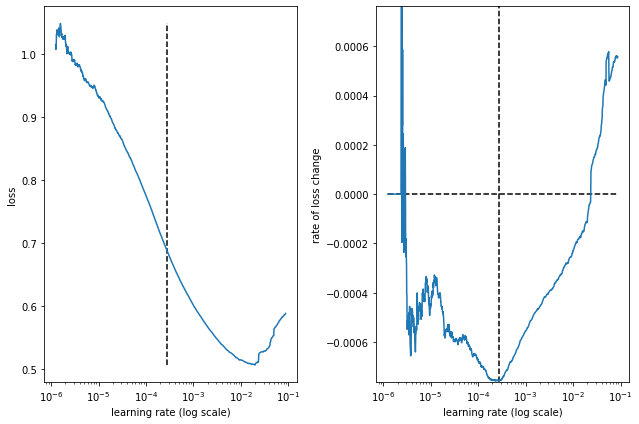

best lr: 0.00027195236 

Model: "conv2d_dense_24l_48s_16bs_130fm_52f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_150 (Reshape)       (None, 24, 10, 1)         0         
                                                                 
 conv2d_75 (Conv2D)          (None, 24, 10, 52)        312       
                                                                 
 flatten_75 (Flatten)        (None, 12480)             0         
                                                                 
 dense_225 (Dense)           (None, 130)               1622530   
                                                                 
 dense_226 (Dense)           (None, 65)                8515      
                                                                 
 dense_227 (Dense)           (None, 48)                3168      
                                                                 
 r

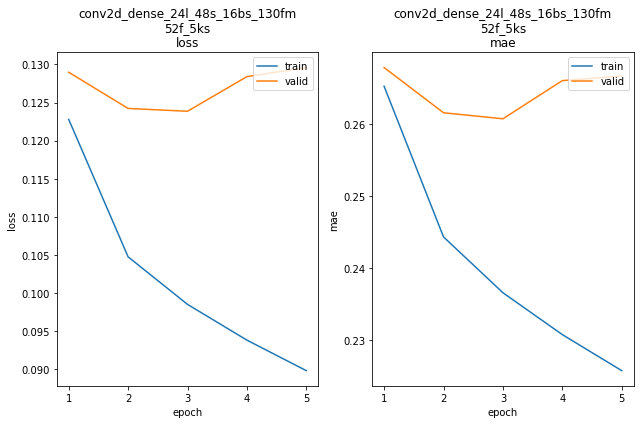

conv2d_dense_24l_48s_16bs_130fm_52f_5ks train min loss: 0.089842	mae: 0.225746	epoch: 5
conv2d_dense_24l_48s_16bs_130fm_52f_5ks valid min loss: 0.123857	mae: 0.260742	epoch: 3

conv2d_dense_24l_48s_16bs_130fm_52f_5ks
Iteration No: 16 ended. Search finished for the next optimal point.
Time taken: 305.7553
Function value obtained: 0.1239
Current minimum: 0.1215
Iteration No: 17 started. Searching for the next optimal point.
feat_maps 509
lags 42
filters 25
kern_size 1
Epoch 1/5
11758/11758 [==============================] - 10s 805us/step - loss: 12951.2480 - mae: 3.5965


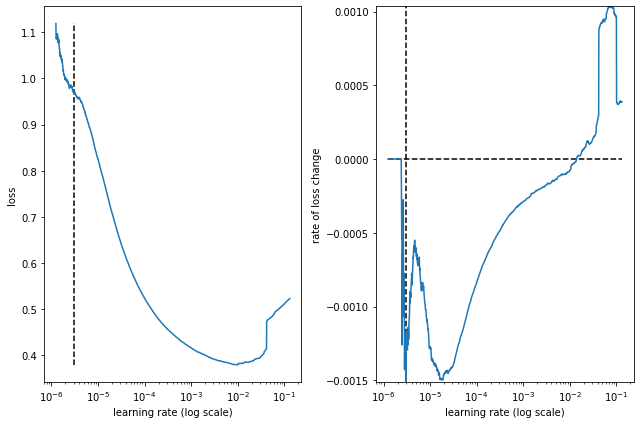

best lr: 2.9941368e-06 

Model: "conv2d_dense_42l_48s_16bs_509fm_25f_1ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_152 (Reshape)       (None, 42, 10, 1)         0         
                                                                 
 conv2d_76 (Conv2D)          (None, 42, 10, 25)        50        
                                                                 
 flatten_76 (Flatten)        (None, 10500)             0         
                                                                 
 dense_228 (Dense)           (None, 509)               5345009   
                                                                 
 dense_229 (Dense)           (None, 254)               129540    
                                                                 
 dense_230 (Dense)           (None, 48)                12240     
                                                                 
 r

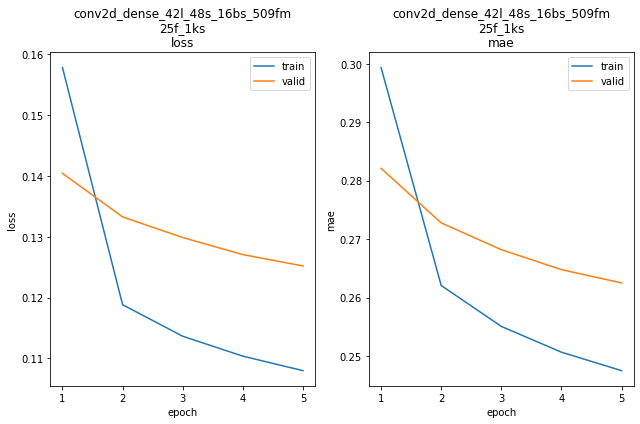

conv2d_dense_42l_48s_16bs_509fm_25f_1ks train min loss: 0.107977	mae: 0.247489	epoch: 5
conv2d_dense_42l_48s_16bs_509fm_25f_1ks valid min loss: 0.125200	mae: 0.262498	epoch: 5

conv2d_dense_42l_48s_16bs_509fm_25f_1ks
Iteration No: 17 ended. Search finished for the next optimal point.
Time taken: 386.7631
Function value obtained: 0.1252
Current minimum: 0.1215
Iteration No: 18 started. Searching for the next optimal point.
feat_maps 366
lags 24
filters 62
kern_size 4
Epoch 1/5
11759/11759 [==============================] - 11s 882us/step - loss: 1.8129 - mae: 0.5900


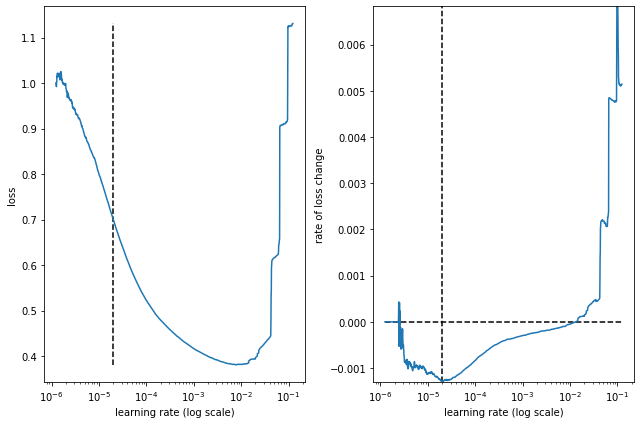

best lr: 1.9396735e-05 

Model: "conv2d_dense_24l_48s_16bs_366fm_62f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_154 (Reshape)       (None, 24, 10, 1)         0         
                                                                 
 conv2d_77 (Conv2D)          (None, 24, 10, 62)        310       
                                                                 
 flatten_77 (Flatten)        (None, 14880)             0         
                                                                 
 dense_231 (Dense)           (None, 366)               5446446   
                                                                 
 dense_232 (Dense)           (None, 183)               67161     
                                                                 
 dense_233 (Dense)           (None, 48)                8832      
                                                                 
 r

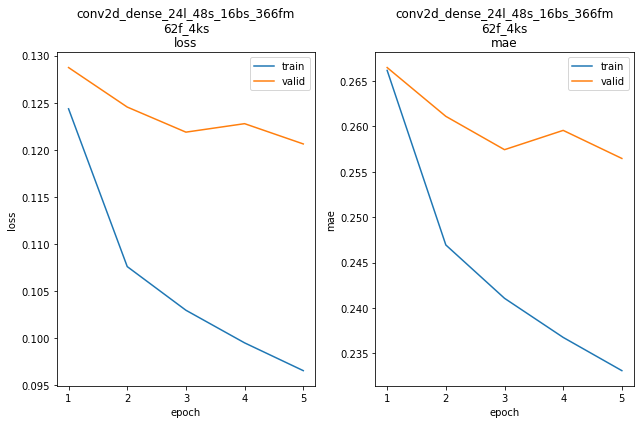

conv2d_dense_24l_48s_16bs_366fm_62f_4ks train min loss: 0.096571	mae: 0.233091	epoch: 5
conv2d_dense_24l_48s_16bs_366fm_62f_4ks valid min loss: 0.120629	mae: 0.256463	epoch: 5

conv2d_dense_24l_48s_16bs_366fm_62f_4ks
Iteration No: 18 ended. Search finished for the next optimal point.
Time taken: 324.2062
Function value obtained: 0.1206
Current minimum: 0.1206
Iteration No: 19 started. Searching for the next optimal point.
feat_maps 488
lags 24
filters 17
kern_size 1
Epoch 1/5
11759/11759 [==============================] - 12s 984us/step - loss: 1.7129 - mae: 0.8280


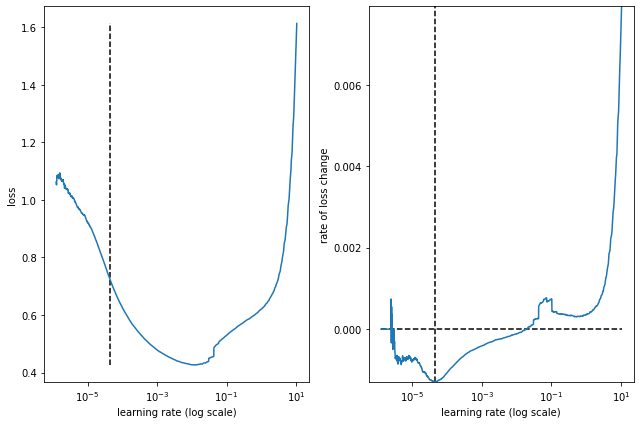

best lr: 4.5027125e-05 

Model: "conv2d_dense_24l_48s_16bs_488fm_17f_1ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_156 (Reshape)       (None, 24, 10, 1)         0         
                                                                 
 conv2d_78 (Conv2D)          (None, 24, 10, 17)        34        
                                                                 
 flatten_78 (Flatten)        (None, 4080)              0         
                                                                 
 dense_234 (Dense)           (None, 488)               1991528   
                                                                 
 dense_235 (Dense)           (None, 244)               119316    
                                                                 
 dense_236 (Dense)           (None, 48)                11760     
                                                                 
 r

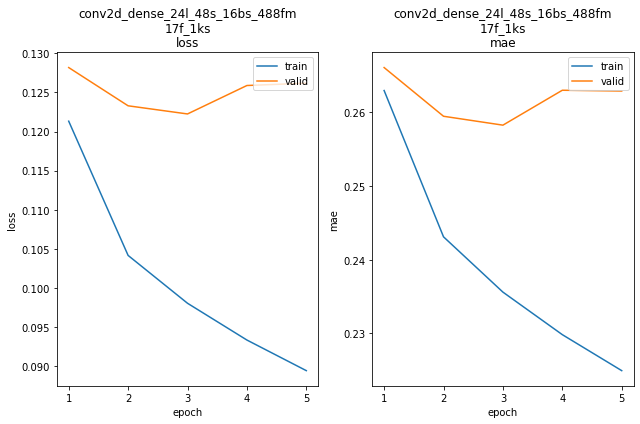

conv2d_dense_24l_48s_16bs_488fm_17f_1ks train min loss: 0.089406	mae: 0.224956	epoch: 5
conv2d_dense_24l_48s_16bs_488fm_17f_1ks valid min loss: 0.122253	mae: 0.258271	epoch: 3

conv2d_dense_24l_48s_16bs_488fm_17f_1ks
Iteration No: 19 ended. Search finished for the next optimal point.
Time taken: 316.5057
Function value obtained: 0.1223
Current minimum: 0.1206
Iteration No: 20 started. Searching for the next optimal point.
feat_maps 211
lags 31
filters 59
kern_size 5
Epoch 1/5
11759/11759 [==============================] - 15s 1ms/step - loss: 1.7620 - mae: 0.8432


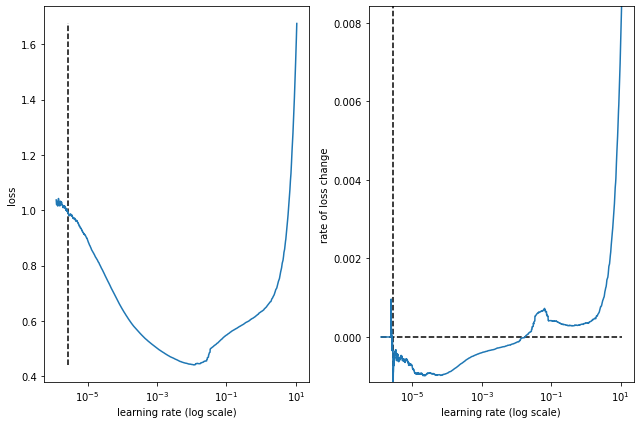

best lr: 2.7909514e-06 

Model: "conv2d_dense_31l_48s_16bs_211fm_59f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_158 (Reshape)       (None, 31, 10, 1)         0         
                                                                 
 conv2d_79 (Conv2D)          (None, 31, 10, 59)        354       
                                                                 
 flatten_79 (Flatten)        (None, 18290)             0         
                                                                 
 dense_237 (Dense)           (None, 211)               3859401   
                                                                 
 dense_238 (Dense)           (None, 105)               22260     
                                                                 
 dense_239 (Dense)           (None, 48)                5088      
                                                                 
 r

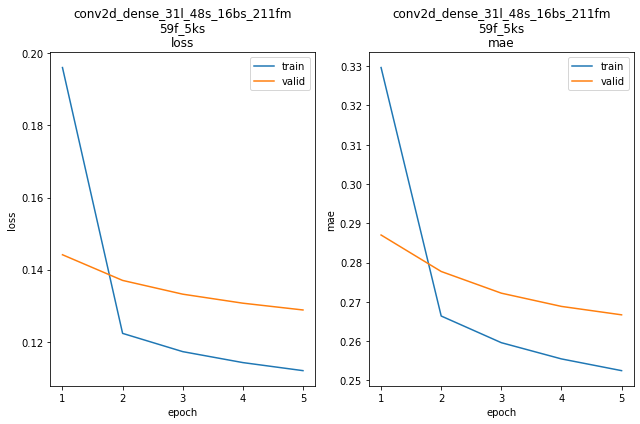

conv2d_dense_31l_48s_16bs_211fm_59f_5ks train min loss: 0.111990	mae: 0.252501	epoch: 5
conv2d_dense_31l_48s_16bs_211fm_59f_5ks valid min loss: 0.128822	mae: 0.266709	epoch: 5

conv2d_dense_31l_48s_16bs_211fm_59f_5ks
Iteration No: 20 ended. Search finished for the next optimal point.
Time taken: 330.0815
Function value obtained: 0.1288
Current minimum: 0.1206
Iteration No: 21 started. Searching for the next optimal point.
feat_maps 427
lags 39
filters 57
kern_size 5
Epoch 1/5
11758/11758 [==============================] - 12s 954us/step - loss: 16.0762 - mae: 0.6281


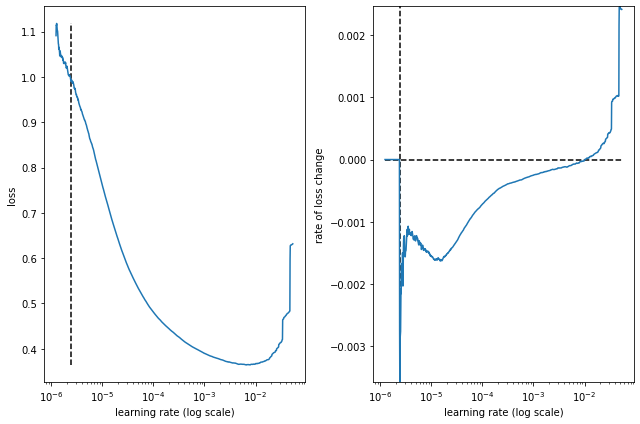

best lr: 2.4256462e-06 

Model: "conv2d_dense_39l_48s_16bs_427fm_57f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_160 (Reshape)       (None, 39, 10, 1)         0         
                                                                 
 conv2d_80 (Conv2D)          (None, 39, 10, 57)        342       
                                                                 
 flatten_80 (Flatten)        (None, 22230)             0         
                                                                 
 dense_240 (Dense)           (None, 427)               9492637   
                                                                 
 dense_241 (Dense)           (None, 213)               91164     
                                                                 
 dense_242 (Dense)           (None, 48)                10272     
                                                                 
 r

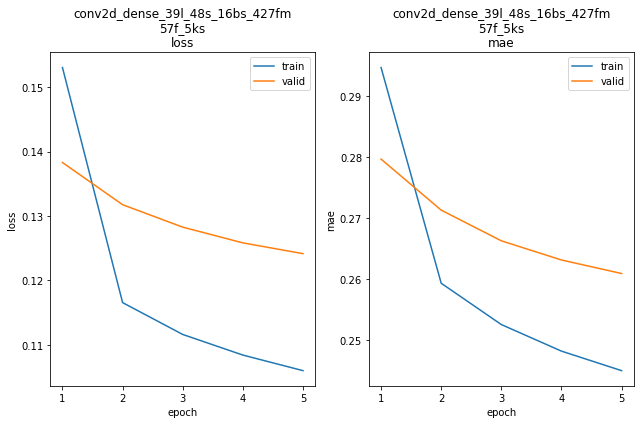

conv2d_dense_39l_48s_16bs_427fm_57f_5ks train min loss: 0.105994	mae: 0.244991	epoch: 5
conv2d_dense_39l_48s_16bs_427fm_57f_5ks valid min loss: 0.124152	mae: 0.260927	epoch: 5

conv2d_dense_39l_48s_16bs_427fm_57f_5ks
Iteration No: 21 ended. Search finished for the next optimal point.
Time taken: 406.1047
Function value obtained: 0.1242
Current minimum: 0.1206
Iteration No: 22 started. Searching for the next optimal point.
feat_maps 216
lags 48
filters 49
kern_size 5
Epoch 1/5
11758/11758 [==============================] - 13s 1ms/step - loss: 1.6534 - mae: 0.8000


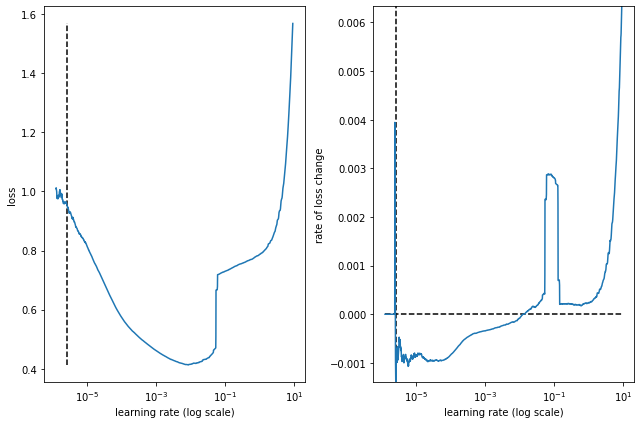

best lr: 2.5567515e-06 

Model: "conv2d_dense_48l_48s_16bs_216fm_49f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_162 (Reshape)       (None, 48, 10, 1)         0         
                                                                 
 conv2d_81 (Conv2D)          (None, 48, 10, 49)        294       
                                                                 
 flatten_81 (Flatten)        (None, 23520)             0         
                                                                 
 dense_243 (Dense)           (None, 216)               5080536   
                                                                 
 dense_244 (Dense)           (None, 108)               23436     
                                                                 
 dense_245 (Dense)           (None, 48)                5232      
                                                                 
 r

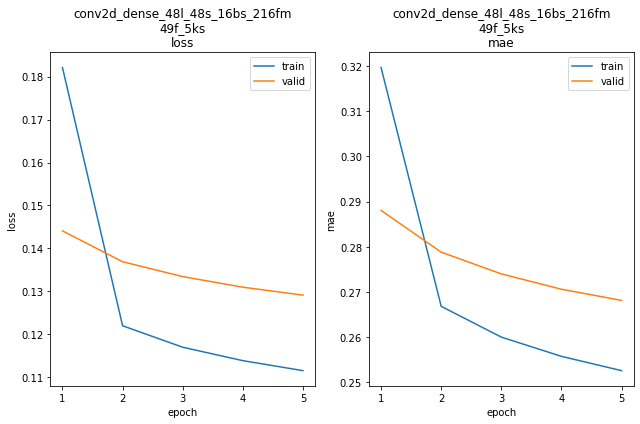

conv2d_dense_48l_48s_16bs_216fm_49f_5ks train min loss: 0.111496	mae: 0.252548	epoch: 5
conv2d_dense_48l_48s_16bs_216fm_49f_5ks valid min loss: 0.129096	mae: 0.268114	epoch: 5

conv2d_dense_48l_48s_16bs_216fm_49f_5ks
Iteration No: 22 ended. Search finished for the next optimal point.
Time taken: 324.0941
Function value obtained: 0.1291
Current minimum: 0.1206
Iteration No: 23 started. Searching for the next optimal point.
feat_maps 68
lags 24
filters 38
kern_size 5
Epoch 1/5
11759/11759 [==============================] - 10s 777us/step - loss: 10.6249 - mae: 0.6879


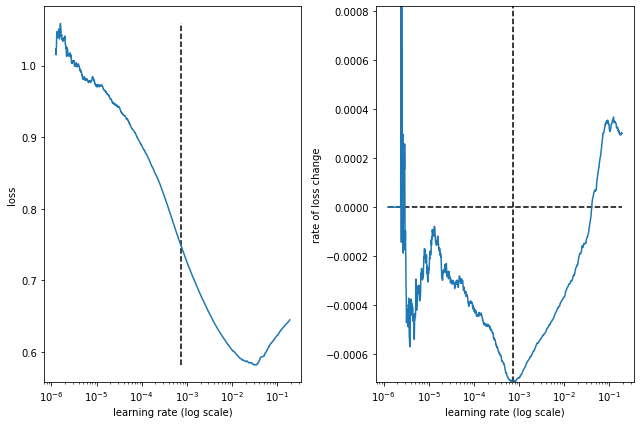

best lr: 0.00072643335 

Model: "conv2d_dense_24l_48s_16bs_68fm_38f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_164 (Reshape)       (None, 24, 10, 1)         0         
                                                                 
 conv2d_82 (Conv2D)          (None, 24, 10, 38)        228       
                                                                 
 flatten_82 (Flatten)        (None, 9120)              0         
                                                                 
 dense_246 (Dense)           (None, 68)                620228    
                                                                 
 dense_247 (Dense)           (None, 34)                2346      
                                                                 
 dense_248 (Dense)           (None, 48)                1680      
                                                                 
 re

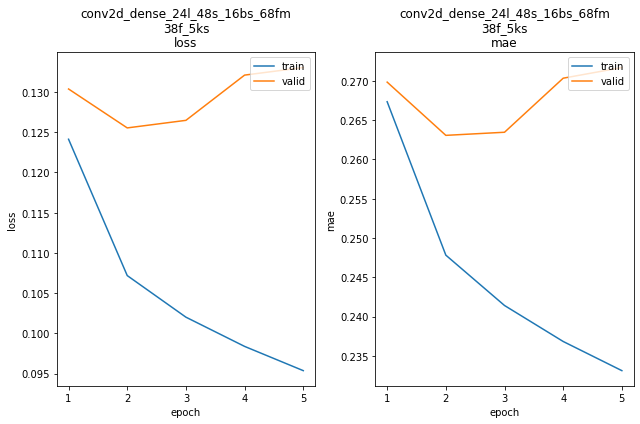

conv2d_dense_24l_48s_16bs_68fm_38f_5ks train min loss: 0.095366	mae: 0.233126	epoch: 5
conv2d_dense_24l_48s_16bs_68fm_38f_5ks valid min loss: 0.125542	mae: 0.263061	epoch: 2

conv2d_dense_24l_48s_16bs_68fm_38f_5ks
Iteration No: 23 ended. Search finished for the next optimal point.
Time taken: 226.5506
Function value obtained: 0.1255
Current minimum: 0.1206
Iteration No: 24 started. Searching for the next optimal point.
feat_maps 425
lags 24
filters 32
kern_size 6
Epoch 1/5
11759/11759 [==============================] - 10s 777us/step - loss: 8.7878 - mae: 0.6166


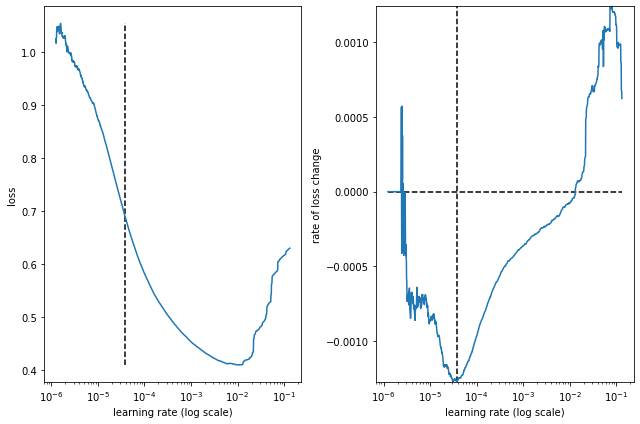

best lr: 3.7451344e-05 

Model: "conv2d_dense_24l_48s_16bs_425fm_32f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_166 (Reshape)       (None, 24, 10, 1)         0         
                                                                 
 conv2d_83 (Conv2D)          (None, 24, 10, 32)        224       
                                                                 
 flatten_83 (Flatten)        (None, 7680)              0         
                                                                 
 dense_249 (Dense)           (None, 425)               3264425   
                                                                 
 dense_250 (Dense)           (None, 212)               90312     
                                                                 
 dense_251 (Dense)           (None, 48)                10224     
                                                                 
 r

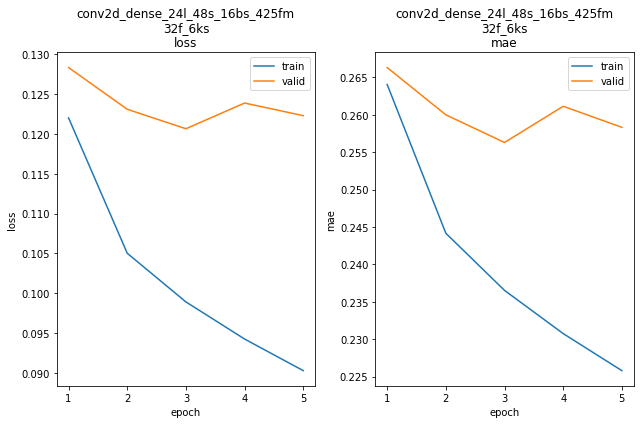

conv2d_dense_24l_48s_16bs_425fm_32f_6ks train min loss: 0.090275	mae: 0.225787	epoch: 5
conv2d_dense_24l_48s_16bs_425fm_32f_6ks valid min loss: 0.120660	mae: 0.256306	epoch: 3

conv2d_dense_24l_48s_16bs_425fm_32f_6ks
Iteration No: 24 ended. Search finished for the next optimal point.
Time taken: 311.7914
Function value obtained: 0.1207
Current minimum: 0.1206
Iteration No: 25 started. Searching for the next optimal point.
feat_maps 310
lags 48
filters 60
kern_size 5
Epoch 1/5
11758/11758 [==============================] - 11s 865us/step - loss: 22.5488 - mae: 0.6373


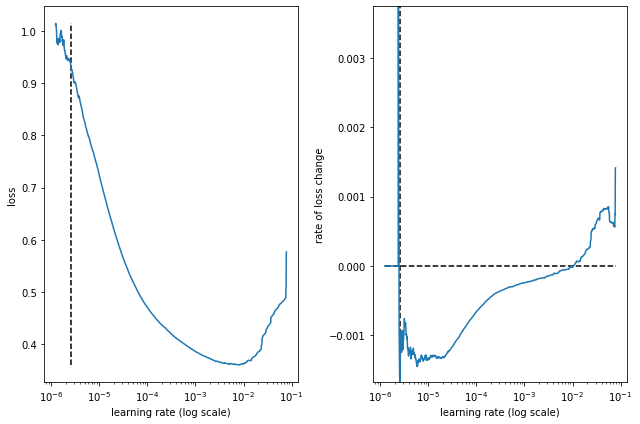

best lr: 2.5567515e-06 

Model: "conv2d_dense_48l_48s_16bs_310fm_60f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_168 (Reshape)       (None, 48, 10, 1)         0         
                                                                 
 conv2d_84 (Conv2D)          (None, 48, 10, 60)        360       
                                                                 
 flatten_84 (Flatten)        (None, 28800)             0         
                                                                 
 dense_252 (Dense)           (None, 310)               8928310   
                                                                 
 dense_253 (Dense)           (None, 155)               48205     
                                                                 
 dense_254 (Dense)           (None, 48)                7488      
                                                                 
 r

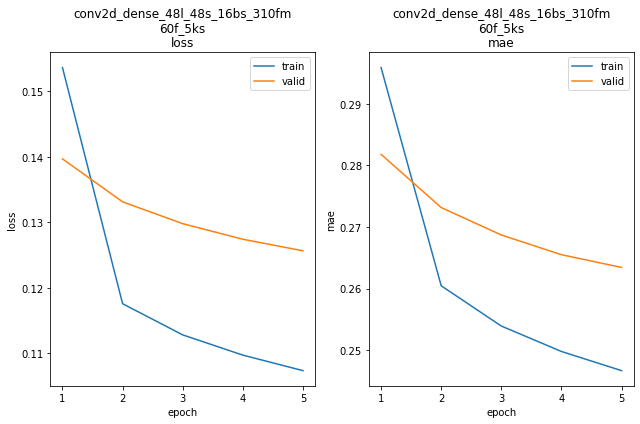

conv2d_dense_48l_48s_16bs_310fm_60f_5ks train min loss: 0.107347	mae: 0.246689	epoch: 5
conv2d_dense_48l_48s_16bs_310fm_60f_5ks valid min loss: 0.125643	mae: 0.263439	epoch: 5

conv2d_dense_48l_48s_16bs_310fm_60f_5ks
Iteration No: 25 ended. Search finished for the next optimal point.
Time taken: 321.7560
Function value obtained: 0.1256
Current minimum: 0.1206
Iteration No: 26 started. Searching for the next optimal point.
feat_maps 376
lags 43
filters 22
kern_size 4
Epoch 1/5
11758/11758 [==============================] - 10s 767us/step - loss: 13.0191 - mae: 0.6334


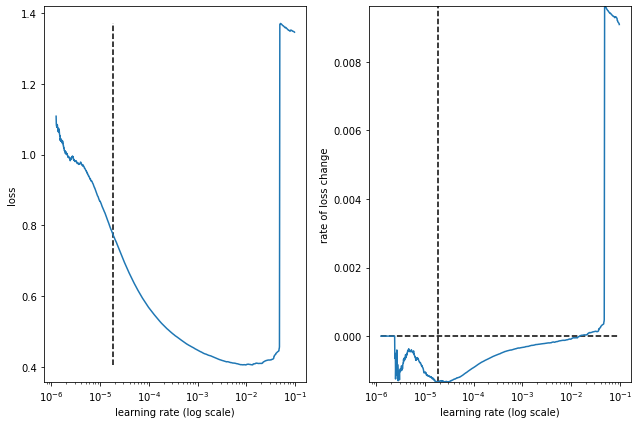

best lr: 1.8568944e-05 

Model: "conv2d_dense_43l_48s_16bs_376fm_22f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_170 (Reshape)       (None, 43, 10, 1)         0         
                                                                 
 conv2d_85 (Conv2D)          (None, 43, 10, 22)        110       
                                                                 
 flatten_85 (Flatten)        (None, 9460)              0         
                                                                 
 dense_255 (Dense)           (None, 376)               3557336   
                                                                 
 dense_256 (Dense)           (None, 188)               70876     
                                                                 
 dense_257 (Dense)           (None, 48)                9072      
                                                                 
 r

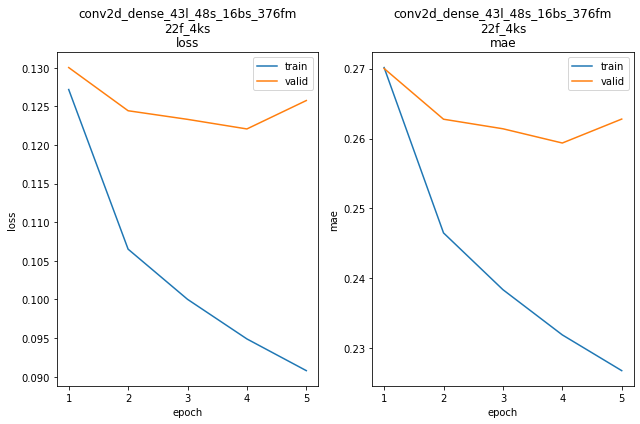

conv2d_dense_43l_48s_16bs_376fm_22f_4ks train min loss: 0.090786	mae: 0.226795	epoch: 5
conv2d_dense_43l_48s_16bs_376fm_22f_4ks valid min loss: 0.122082	mae: 0.259354	epoch: 4

conv2d_dense_43l_48s_16bs_376fm_22f_4ks
Iteration No: 26 ended. Search finished for the next optimal point.
Time taken: 384.2655
Function value obtained: 0.1221
Current minimum: 0.1206
Iteration No: 27 started. Searching for the next optimal point.
feat_maps 341
lags 30
filters 60
kern_size 1
Epoch 1/5
11759/11759 [==============================] - 15s 1ms/step - loss: 1.5205 - mae: 0.7871


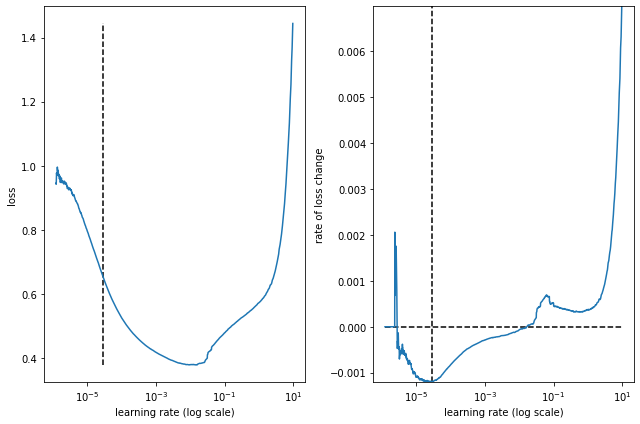

best lr: 2.9294875e-05 

Model: "conv2d_dense_30l_48s_16bs_341fm_60f_1ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_172 (Reshape)       (None, 30, 10, 1)         0         
                                                                 
 conv2d_86 (Conv2D)          (None, 30, 10, 60)        120       
                                                                 
 flatten_86 (Flatten)        (None, 18000)             0         
                                                                 
 dense_258 (Dense)           (None, 341)               6138341   
                                                                 
 dense_259 (Dense)           (None, 170)               58140     
                                                                 
 dense_260 (Dense)           (None, 48)                8208      
                                                                 
 r

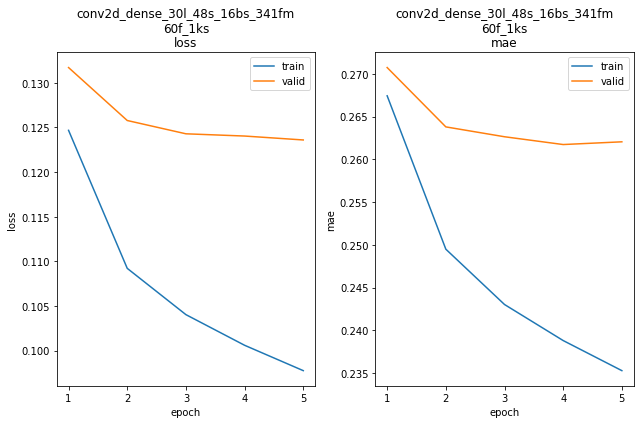

conv2d_dense_30l_48s_16bs_341fm_60f_1ks train min loss: 0.097757	mae: 0.235279	epoch: 5
conv2d_dense_30l_48s_16bs_341fm_60f_1ks valid min loss: 0.123603	mae: 0.262040	epoch: 5

conv2d_dense_30l_48s_16bs_341fm_60f_1ks
Iteration No: 27 ended. Search finished for the next optimal point.
Time taken: 361.4024
Function value obtained: 0.1236
Current minimum: 0.1206
Iteration No: 28 started. Searching for the next optimal point.
feat_maps 512
lags 29
filters 23
kern_size 7
Epoch 1/5
11759/11759 [==============================] - 13s 1ms/step - loss: 1.5803 - mae: 0.8023


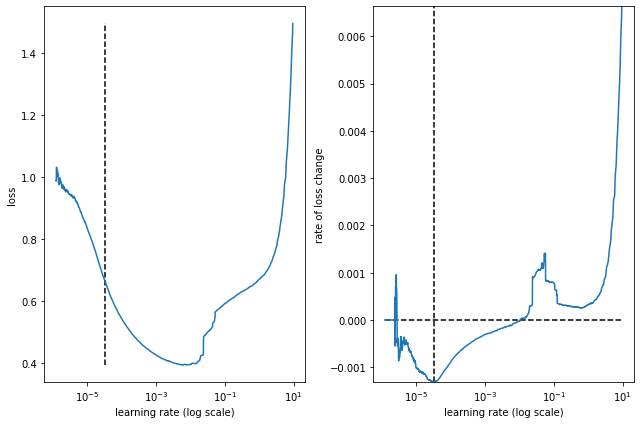

best lr: 3.198086e-05 

Model: "conv2d_dense_29l_48s_16bs_512fm_23f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_174 (Reshape)       (None, 29, 10, 1)         0         
                                                                 
 conv2d_87 (Conv2D)          (None, 29, 10, 23)        184       
                                                                 
 flatten_87 (Flatten)        (None, 6670)              0         
                                                                 
 dense_261 (Dense)           (None, 512)               3415552   
                                                                 
 dense_262 (Dense)           (None, 256)               131328    
                                                                 
 dense_263 (Dense)           (None, 48)                12336     
                                                                 
 re

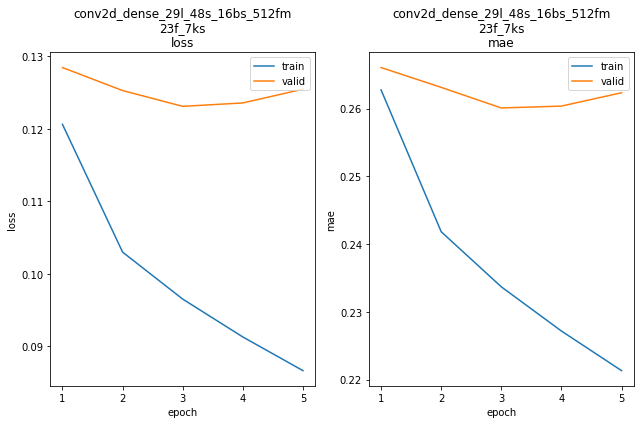

conv2d_dense_29l_48s_16bs_512fm_23f_7ks train min loss: 0.086664	mae: 0.221322	epoch: 5
conv2d_dense_29l_48s_16bs_512fm_23f_7ks valid min loss: 0.123108	mae: 0.260097	epoch: 3

conv2d_dense_29l_48s_16bs_512fm_23f_7ks
Iteration No: 28 ended. Search finished for the next optimal point.
Time taken: 316.5516
Function value obtained: 0.1231
Current minimum: 0.1206
Iteration No: 29 started. Searching for the next optimal point.
feat_maps 310
lags 41
filters 63
kern_size 2
Epoch 1/5
11758/11758 [==============================] - 15s 1ms/step - loss: 1.4856 - mae: 0.7857


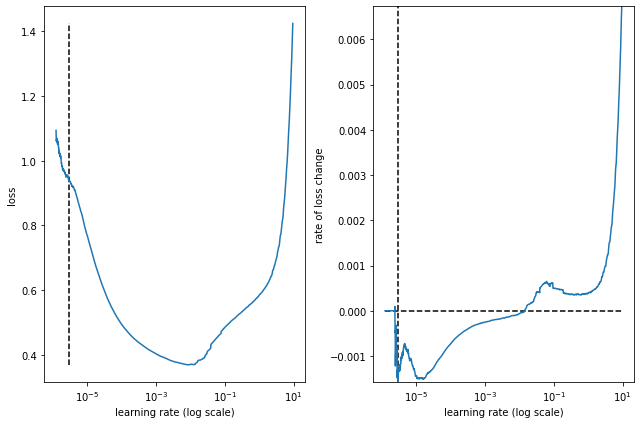

best lr: 2.9941368e-06 

Model: "conv2d_dense_41l_48s_16bs_310fm_63f_2ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_176 (Reshape)       (None, 41, 10, 1)         0         
                                                                 
 conv2d_88 (Conv2D)          (None, 41, 10, 63)        189       
                                                                 
 flatten_88 (Flatten)        (None, 25830)             0         
                                                                 
 dense_264 (Dense)           (None, 310)               8007610   
                                                                 
 dense_265 (Dense)           (None, 155)               48205     
                                                                 
 dense_266 (Dense)           (None, 48)                7488      
                                                                 
 r

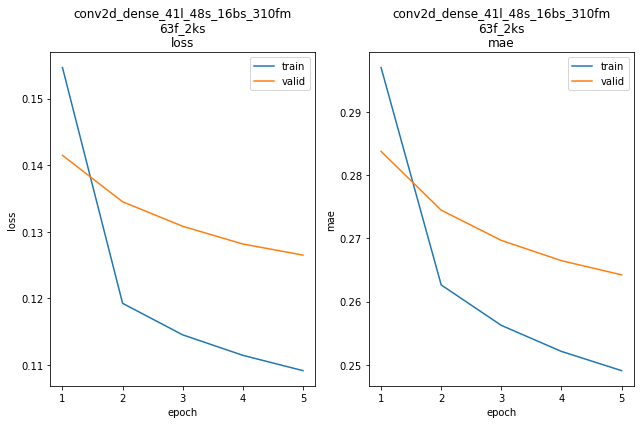

conv2d_dense_41l_48s_16bs_310fm_63f_2ks train min loss: 0.109158	mae: 0.249072	epoch: 5
conv2d_dense_41l_48s_16bs_310fm_63f_2ks valid min loss: 0.126501	mae: 0.264237	epoch: 5

conv2d_dense_41l_48s_16bs_310fm_63f_2ks
Iteration No: 29 ended. Search finished for the next optimal point.
Time taken: 310.2051
Function value obtained: 0.1265
Current minimum: 0.1206
Iteration No: 30 started. Searching for the next optimal point.
feat_maps 66
lags 34
filters 38
kern_size 1
Epoch 1/5
11759/11759 [==============================] - 10s 772us/step - loss: 2.7743 - mae: 0.6621


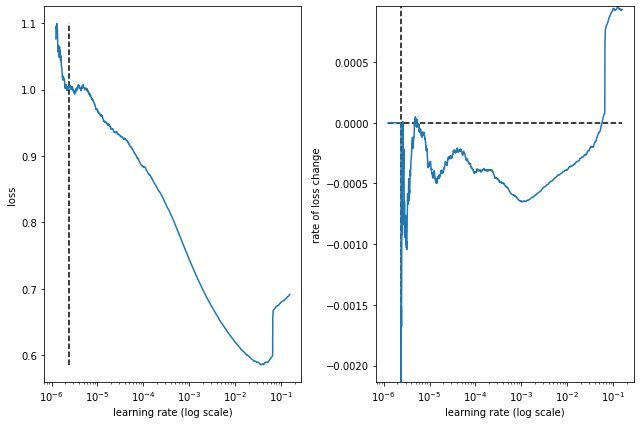

best lr: 2.404279e-06 

Model: "conv2d_dense_34l_48s_16bs_66fm_38f_1ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_178 (Reshape)       (None, 34, 10, 1)         0         
                                                                 
 conv2d_89 (Conv2D)          (None, 34, 10, 38)        76        
                                                                 
 flatten_89 (Flatten)        (None, 12920)             0         
                                                                 
 dense_267 (Dense)           (None, 66)                852786    
                                                                 
 dense_268 (Dense)           (None, 33)                2211      
                                                                 
 dense_269 (Dense)           (None, 48)                1632      
                                                                 
 res

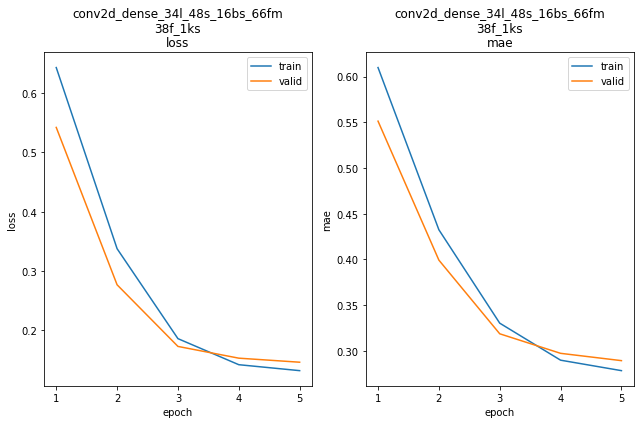

conv2d_dense_34l_48s_16bs_66fm_38f_1ks train min loss: 0.132214	mae: 0.278340	epoch: 5
conv2d_dense_34l_48s_16bs_66fm_38f_1ks valid min loss: 0.146417	mae: 0.289280	epoch: 5

conv2d_dense_34l_48s_16bs_66fm_38f_1ks
WARN: bad model conv2d_dense_34l_48s_16bs_66fm_38f_1ks
Iteration No: 30 ended. Search finished for the next optimal point.
Time taken: 310.9088
Function value obtained: 0.1464
Current minimum: 0.1206
Iteration No: 31 started. Searching for the next optimal point.
feat_maps 511
lags 43
filters 48
kern_size 7
Epoch 1/5
11758/11758 [==============================] - 13s 1ms/step - loss: 46.7633 - mae: 0.6974


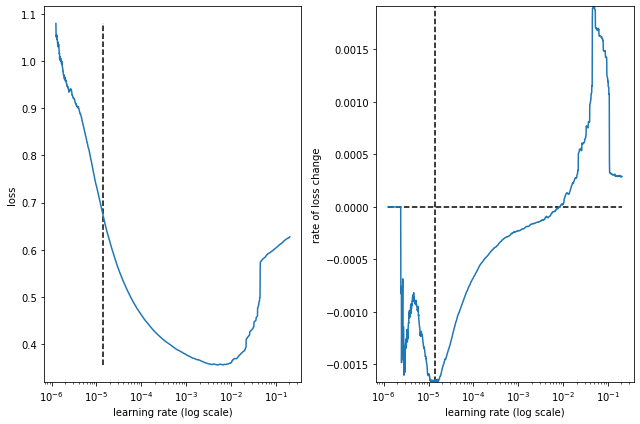

best lr: 1.4023668e-05 

Model: "conv2d_dense_43l_48s_16bs_511fm_48f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_180 (Reshape)       (None, 43, 10, 1)         0         
                                                                 
 conv2d_90 (Conv2D)          (None, 43, 10, 48)        384       
                                                                 
 flatten_90 (Flatten)        (None, 20640)             0         
                                                                 
 dense_270 (Dense)           (None, 511)               10547551  
                                                                 
 dense_271 (Dense)           (None, 255)               130560    
                                                                 
 dense_272 (Dense)           (None, 48)                12288     
                                                                 
 r

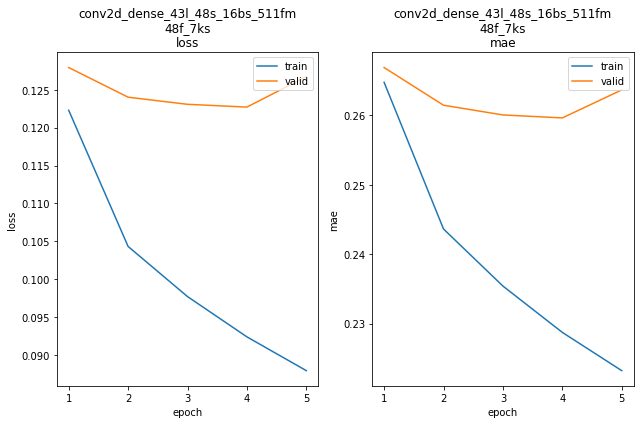

conv2d_dense_43l_48s_16bs_511fm_48f_7ks train min loss: 0.087957	mae: 0.223229	epoch: 5
conv2d_dense_43l_48s_16bs_511fm_48f_7ks valid min loss: 0.122715	mae: 0.259648	epoch: 4

conv2d_dense_43l_48s_16bs_511fm_48f_7ks
Iteration No: 31 ended. Search finished for the next optimal point.
Time taken: 404.3301
Function value obtained: 0.1227
Current minimum: 0.1206
Iteration No: 32 started. Searching for the next optimal point.
feat_maps 506
lags 32
filters 20
kern_size 1
Epoch 1/5
11759/11759 [==============================] - 11s 855us/step - loss: 427.3075 - mae: 1.0411


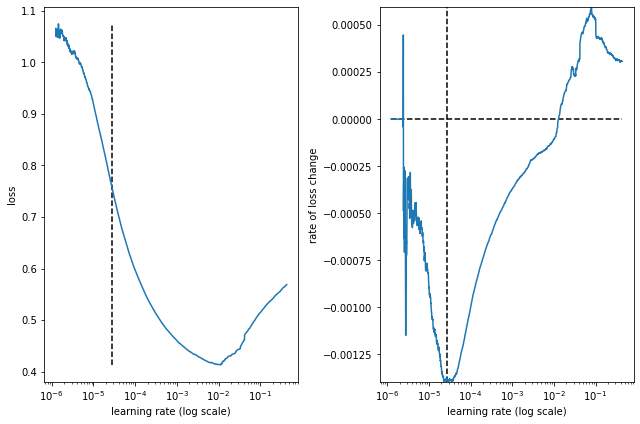

best lr: 2.8037703e-05 

Model: "conv2d_dense_32l_48s_16bs_506fm_20f_1ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_182 (Reshape)       (None, 32, 10, 1)         0         
                                                                 
 conv2d_91 (Conv2D)          (None, 32, 10, 20)        40        
                                                                 
 flatten_91 (Flatten)        (None, 6400)              0         
                                                                 
 dense_273 (Dense)           (None, 506)               3238906   
                                                                 
 dense_274 (Dense)           (None, 253)               128271    
                                                                 
 dense_275 (Dense)           (None, 48)                12192     
                                                                 
 r

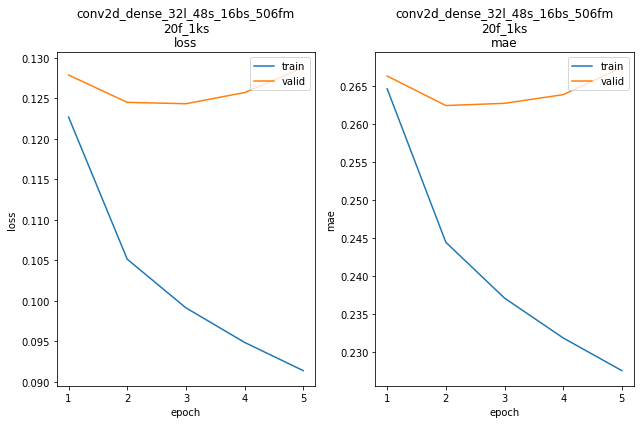

conv2d_dense_32l_48s_16bs_506fm_20f_1ks train min loss: 0.091392	mae: 0.227614	epoch: 5
conv2d_dense_32l_48s_16bs_506fm_20f_1ks valid min loss: 0.124339	mae: 0.262723	epoch: 3

conv2d_dense_32l_48s_16bs_506fm_20f_1ks
Iteration No: 32 ended. Search finished for the next optimal point.
Time taken: 302.6120
Function value obtained: 0.1243
Current minimum: 0.1206
Iteration No: 33 started. Searching for the next optimal point.
feat_maps 274
lags 26
filters 59
kern_size 7
Epoch 1/5
11759/11759 [==============================] - 14s 1ms/step - loss: 1.6881 - mae: 0.7466


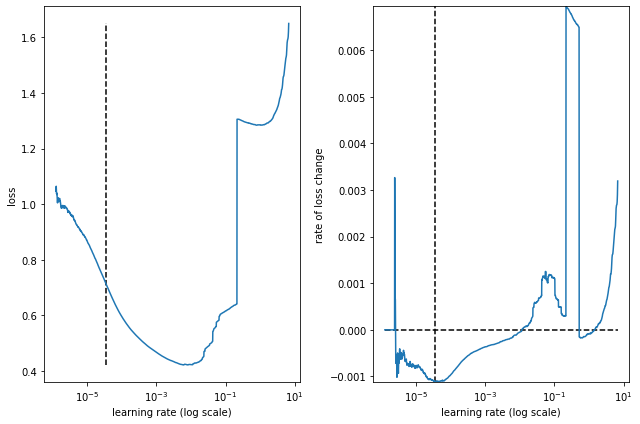

best lr: 3.584414e-05 

Model: "conv2d_dense_26l_48s_16bs_274fm_59f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_184 (Reshape)       (None, 26, 10, 1)         0         
                                                                 
 conv2d_92 (Conv2D)          (None, 26, 10, 59)        472       
                                                                 
 flatten_92 (Flatten)        (None, 15340)             0         
                                                                 
 dense_276 (Dense)           (None, 274)               4203434   
                                                                 
 dense_277 (Dense)           (None, 137)               37675     
                                                                 
 dense_278 (Dense)           (None, 48)                6624      
                                                                 
 re

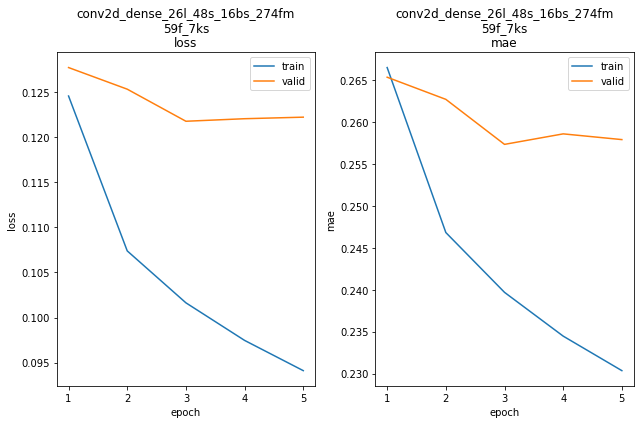

conv2d_dense_26l_48s_16bs_274fm_59f_7ks train min loss: 0.094114	mae: 0.230341	epoch: 5
conv2d_dense_26l_48s_16bs_274fm_59f_7ks valid min loss: 0.121759	mae: 0.257344	epoch: 3

conv2d_dense_26l_48s_16bs_274fm_59f_7ks
Iteration No: 33 ended. Search finished for the next optimal point.
Time taken: 292.3705
Function value obtained: 0.1218
Current minimum: 0.1206
Iteration No: 34 started. Searching for the next optimal point.
feat_maps 309
lags 42
filters 61
kern_size 7
Epoch 1/5
11758/11758 [==============================] - 12s 934us/step - loss: 742.2052 - mae: 1.1826


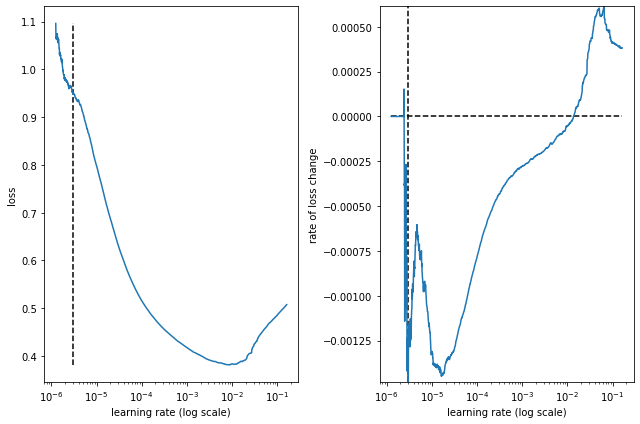

best lr: 2.9941368e-06 

Model: "conv2d_dense_42l_48s_16bs_309fm_61f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_186 (Reshape)       (None, 42, 10, 1)         0         
                                                                 
 conv2d_93 (Conv2D)          (None, 42, 10, 61)        488       
                                                                 
 flatten_93 (Flatten)        (None, 25620)             0         
                                                                 
 dense_279 (Dense)           (None, 309)               7916889   
                                                                 
 dense_280 (Dense)           (None, 154)               47740     
                                                                 
 dense_281 (Dense)           (None, 48)                7440      
                                                                 
 r

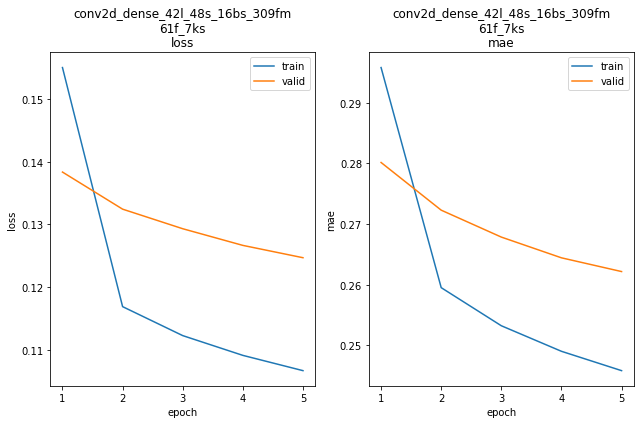

conv2d_dense_42l_48s_16bs_309fm_61f_7ks train min loss: 0.106672	mae: 0.245840	epoch: 5
conv2d_dense_42l_48s_16bs_309fm_61f_7ks valid min loss: 0.124693	mae: 0.262178	epoch: 5

conv2d_dense_42l_48s_16bs_309fm_61f_7ks
Iteration No: 34 ended. Search finished for the next optimal point.
Time taken: 392.8095
Function value obtained: 0.1247
Current minimum: 0.1206
Iteration No: 35 started. Searching for the next optimal point.
feat_maps 108
lags 27
filters 57
kern_size 2
Epoch 1/5
11759/11759 [==============================] - 14s 1ms/step - loss: 2.0734 - mae: 0.8950


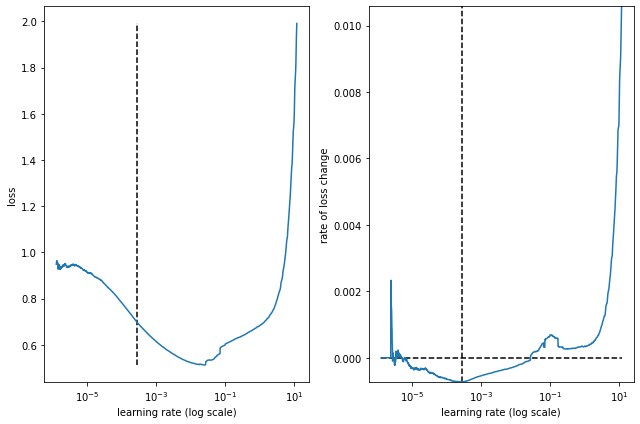

best lr: 0.00028166457 

Model: "conv2d_dense_27l_48s_16bs_108fm_57f_2ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_188 (Reshape)       (None, 27, 10, 1)         0         
                                                                 
 conv2d_94 (Conv2D)          (None, 27, 10, 57)        171       
                                                                 
 flatten_94 (Flatten)        (None, 15390)             0         
                                                                 
 dense_282 (Dense)           (None, 108)               1662228   
                                                                 
 dense_283 (Dense)           (None, 54)                5886      
                                                                 
 dense_284 (Dense)           (None, 48)                2640      
                                                                 
 r

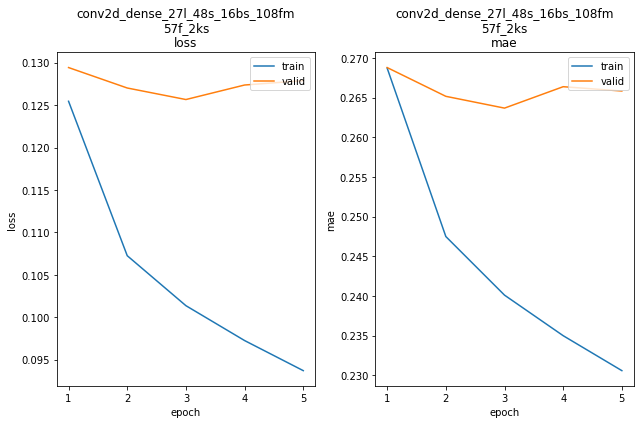

conv2d_dense_27l_48s_16bs_108fm_57f_2ks train min loss: 0.093706	mae: 0.230569	epoch: 5
conv2d_dense_27l_48s_16bs_108fm_57f_2ks valid min loss: 0.125655	mae: 0.263672	epoch: 3

conv2d_dense_27l_48s_16bs_108fm_57f_2ks
Iteration No: 35 ended. Search finished for the next optimal point.
Time taken: 310.5839
Function value obtained: 0.1257
Current minimum: 0.1206
Iteration No: 36 started. Searching for the next optimal point.
feat_maps 509
lags 28
filters 23
kern_size 1
Epoch 1/5
11759/11759 [==============================] - 13s 1ms/step - loss: 1.6315 - mae: 0.8088


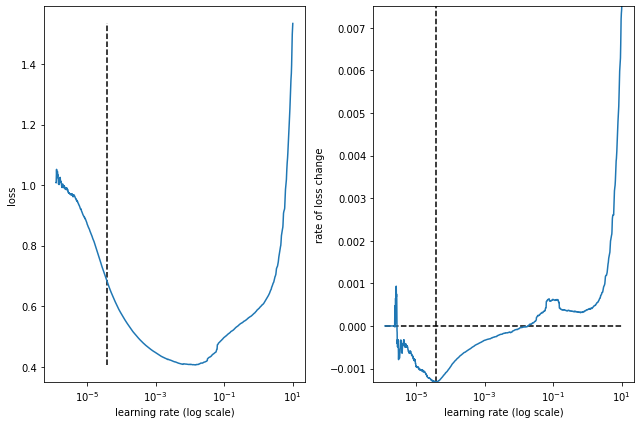

best lr: 3.8114224e-05 

Model: "conv2d_dense_28l_48s_16bs_509fm_23f_1ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_190 (Reshape)       (None, 28, 10, 1)         0         
                                                                 
 conv2d_95 (Conv2D)          (None, 28, 10, 23)        46        
                                                                 
 flatten_95 (Flatten)        (None, 6440)              0         
                                                                 
 dense_285 (Dense)           (None, 509)               3278469   
                                                                 
 dense_286 (Dense)           (None, 254)               129540    
                                                                 
 dense_287 (Dense)           (None, 48)                12240     
                                                                 
 r

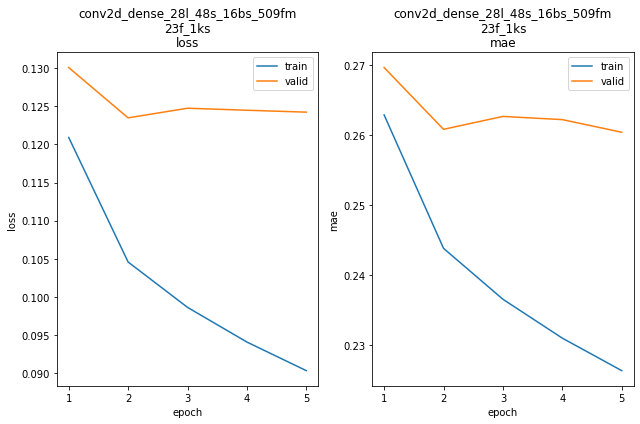

conv2d_dense_28l_48s_16bs_509fm_23f_1ks train min loss: 0.090316	mae: 0.226388	epoch: 5
conv2d_dense_28l_48s_16bs_509fm_23f_1ks valid min loss: 0.123485	mae: 0.260790	epoch: 2

conv2d_dense_28l_48s_16bs_509fm_23f_1ks
Iteration No: 36 ended. Search finished for the next optimal point.
Time taken: 308.2746
Function value obtained: 0.1235
Current minimum: 0.1206
Iteration No: 37 started. Searching for the next optimal point.
feat_maps 441
lags 45
filters 64
kern_size 4
Epoch 1/5
11758/11758 [==============================] - 12s 1ms/step - loss: 4.9880 - mae: 0.5818


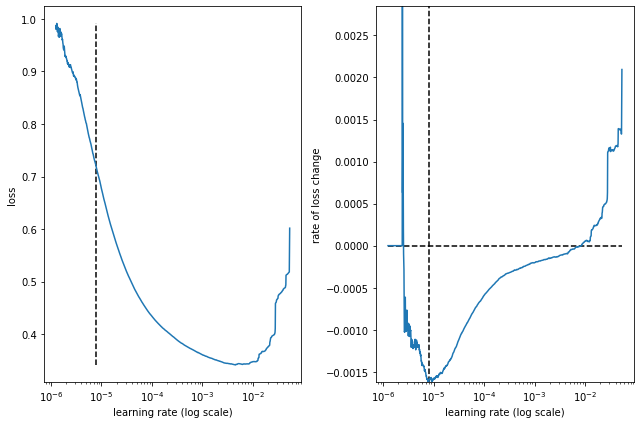

best lr: 7.928674e-06 

Model: "conv2d_dense_45l_48s_16bs_441fm_64f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_192 (Reshape)       (None, 45, 10, 1)         0         
                                                                 
 conv2d_96 (Conv2D)          (None, 45, 10, 64)        320       
                                                                 
 flatten_96 (Flatten)        (None, 28800)             0         
                                                                 
 dense_288 (Dense)           (None, 441)               12701241  
                                                                 
 dense_289 (Dense)           (None, 220)               97240     
                                                                 
 dense_290 (Dense)           (None, 48)                10608     
                                                                 
 re

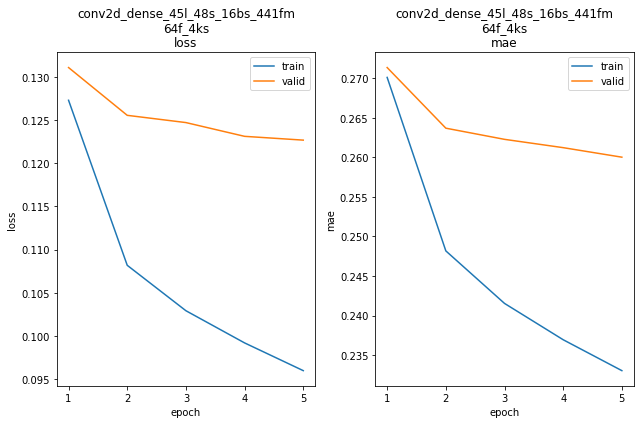

conv2d_dense_45l_48s_16bs_441fm_64f_4ks train min loss: 0.095996	mae: 0.233027	epoch: 5
conv2d_dense_45l_48s_16bs_441fm_64f_4ks valid min loss: 0.122669	mae: 0.260029	epoch: 5

conv2d_dense_45l_48s_16bs_441fm_64f_4ks
Iteration No: 37 ended. Search finished for the next optimal point.
Time taken: 409.0237
Function value obtained: 0.1227
Current minimum: 0.1206
Iteration No: 38 started. Searching for the next optimal point.
feat_maps 512
lags 37
filters 27
kern_size 2
Epoch 1/5
11758/11758 [==============================] - 12s 1ms/step - loss: 2228296448.0000 - mae: 1177.3867


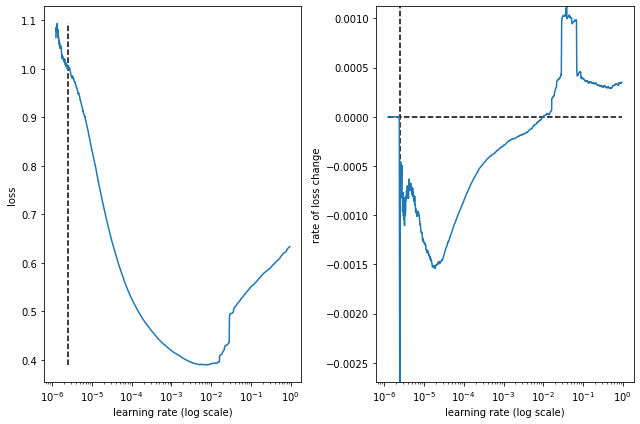

best lr: 2.4470207e-06 

Model: "conv2d_dense_37l_48s_16bs_512fm_27f_2ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_194 (Reshape)       (None, 37, 10, 1)         0         
                                                                 
 conv2d_97 (Conv2D)          (None, 37, 10, 27)        81        
                                                                 
 flatten_97 (Flatten)        (None, 9990)              0         
                                                                 
 dense_291 (Dense)           (None, 512)               5115392   
                                                                 
 dense_292 (Dense)           (None, 256)               131328    
                                                                 
 dense_293 (Dense)           (None, 48)                12336     
                                                                 
 r

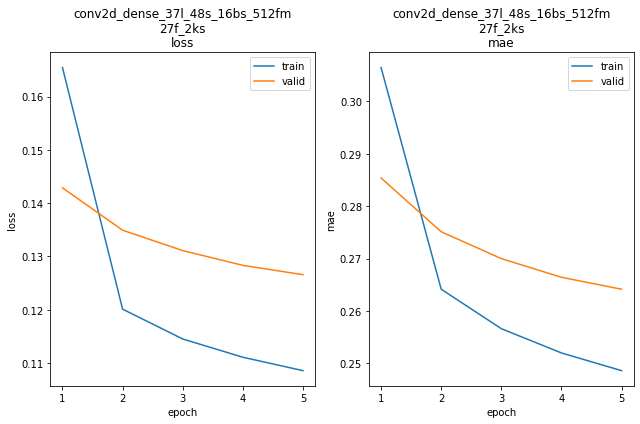

conv2d_dense_37l_48s_16bs_512fm_27f_2ks train min loss: 0.108572	mae: 0.248614	epoch: 5
conv2d_dense_37l_48s_16bs_512fm_27f_2ks valid min loss: 0.126586	mae: 0.264156	epoch: 5

conv2d_dense_37l_48s_16bs_512fm_27f_2ks
Iteration No: 38 ended. Search finished for the next optimal point.
Time taken: 363.9222
Function value obtained: 0.1266
Current minimum: 0.1206
Iteration No: 39 started. Searching for the next optimal point.
feat_maps 506
lags 47
filters 25
kern_size 1
Epoch 1/5
11758/11758 [==============================] - 10s 834us/step - loss: 2.6406 - mae: 0.5568


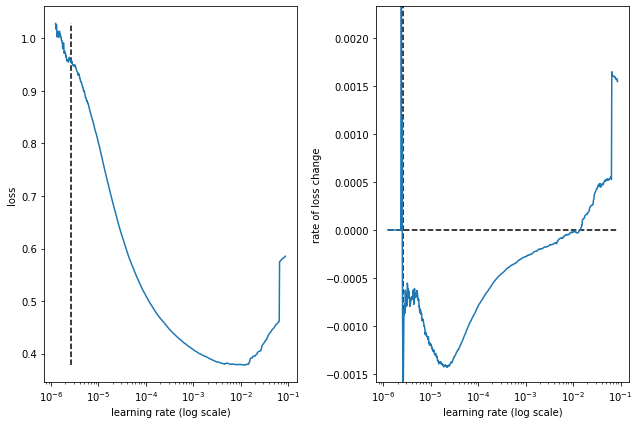

best lr: 2.6249381e-06 

Model: "conv2d_dense_47l_48s_16bs_506fm_25f_1ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_196 (Reshape)       (None, 47, 10, 1)         0         
                                                                 
 conv2d_98 (Conv2D)          (None, 47, 10, 25)        50        
                                                                 
 flatten_98 (Flatten)        (None, 11750)             0         
                                                                 
 dense_294 (Dense)           (None, 506)               5946006   
                                                                 
 dense_295 (Dense)           (None, 253)               128271    
                                                                 
 dense_296 (Dense)           (None, 48)                12192     
                                                                 
 r

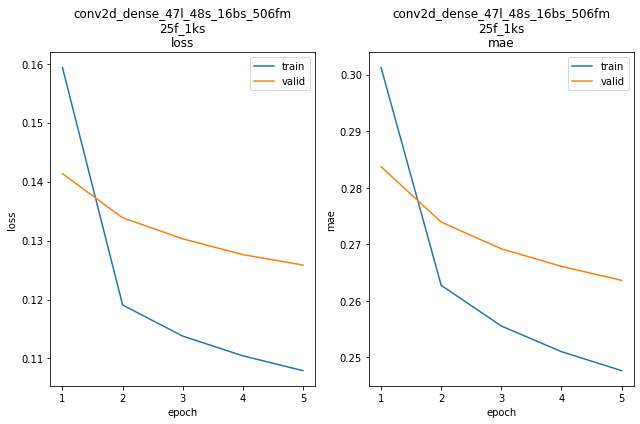

conv2d_dense_47l_48s_16bs_506fm_25f_1ks train min loss: 0.107933	mae: 0.247674	epoch: 5
conv2d_dense_47l_48s_16bs_506fm_25f_1ks valid min loss: 0.125842	mae: 0.263632	epoch: 5

conv2d_dense_47l_48s_16bs_506fm_25f_1ks
Iteration No: 39 ended. Search finished for the next optimal point.
Time taken: 358.5881
Function value obtained: 0.1258
Current minimum: 0.1206
Iteration No: 40 started. Searching for the next optimal point.
feat_maps 143
lags 27
filters 28
kern_size 7
Epoch 1/5
11759/11759 [==============================] - 14s 1ms/step - loss: 2.1608 - mae: 0.9097


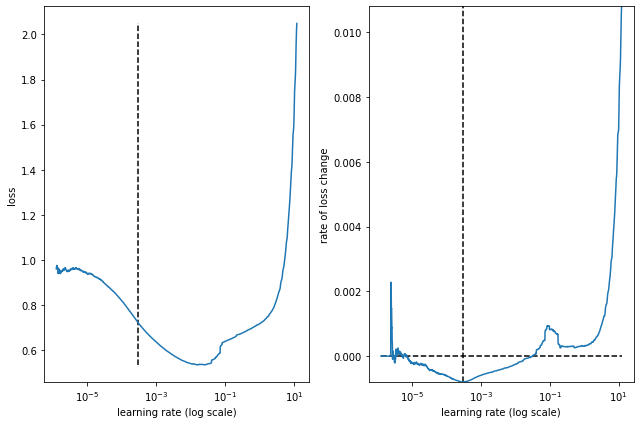

best lr: 0.00029688707 

Model: "conv2d_dense_27l_48s_16bs_143fm_28f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_198 (Reshape)       (None, 27, 10, 1)         0         
                                                                 
 conv2d_99 (Conv2D)          (None, 27, 10, 28)        224       
                                                                 
 flatten_99 (Flatten)        (None, 7560)              0         
                                                                 
 dense_297 (Dense)           (None, 143)               1081223   
                                                                 
 dense_298 (Dense)           (None, 71)                10224     
                                                                 
 dense_299 (Dense)           (None, 48)                3456      
                                                                 
 r

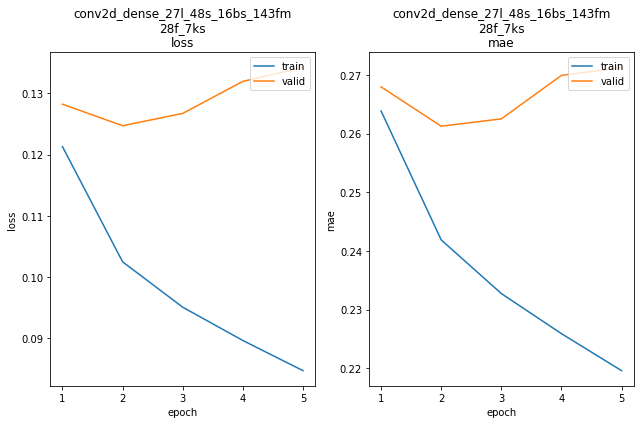

conv2d_dense_27l_48s_16bs_143fm_28f_7ks train min loss: 0.084720	mae: 0.219605	epoch: 5
conv2d_dense_27l_48s_16bs_143fm_28f_7ks valid min loss: 0.124729	mae: 0.261258	epoch: 2

conv2d_dense_27l_48s_16bs_143fm_28f_7ks
Iteration No: 40 ended. Search finished for the next optimal point.
Time taken: 311.1233
Function value obtained: 0.1247
Current minimum: 0.1206
Iteration No: 41 started. Searching for the next optimal point.
feat_maps 372
lags 33
filters 18
kern_size 7
Epoch 1/5
11759/11759 [==============================] - 10s 760us/step - loss: 4.3247 - mae: 0.6212


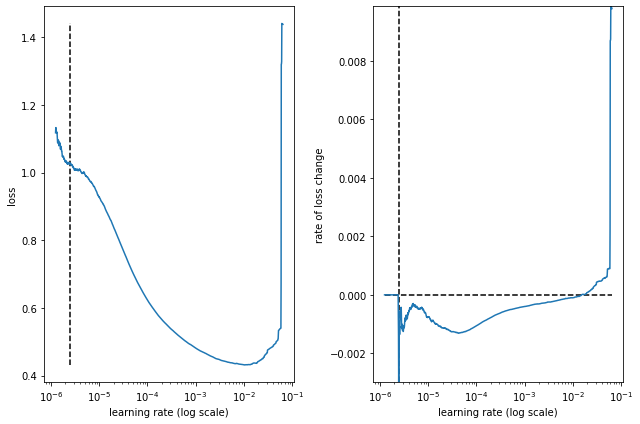

best lr: 2.4468345e-06 

Model: "conv2d_dense_33l_48s_16bs_372fm_18f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_200 (Reshape)       (None, 33, 10, 1)         0         
                                                                 
 conv2d_100 (Conv2D)         (None, 33, 10, 18)        144       
                                                                 
 flatten_100 (Flatten)       (None, 5940)              0         
                                                                 
 dense_300 (Dense)           (None, 372)               2210052   
                                                                 
 dense_301 (Dense)           (None, 186)               69378     
                                                                 
 dense_302 (Dense)           (None, 48)                8976      
                                                                 
 r

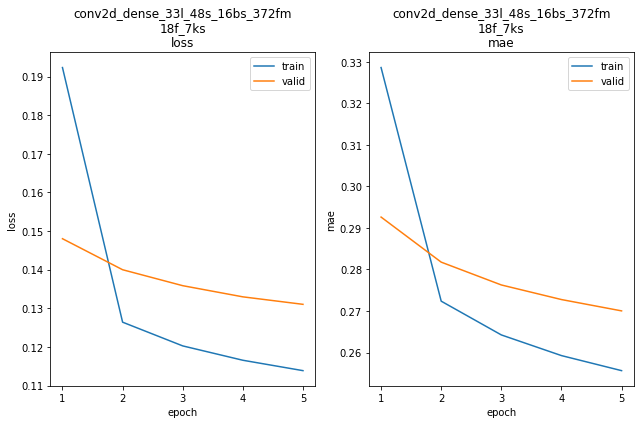

conv2d_dense_33l_48s_16bs_372fm_18f_7ks train min loss: 0.113851	mae: 0.255650	epoch: 5
conv2d_dense_33l_48s_16bs_372fm_18f_7ks valid min loss: 0.131025	mae: 0.270034	epoch: 5

conv2d_dense_33l_48s_16bs_372fm_18f_7ks
Iteration No: 41 ended. Search finished for the next optimal point.
Time taken: 302.5187
Function value obtained: 0.1310
Current minimum: 0.1206
Iteration No: 42 started. Searching for the next optimal point.
feat_maps 423
lags 26
filters 63
kern_size 1
Epoch 1/5
11759/11759 [==============================] - 15s 1ms/step - loss: 1.5168 - mae: 0.7826


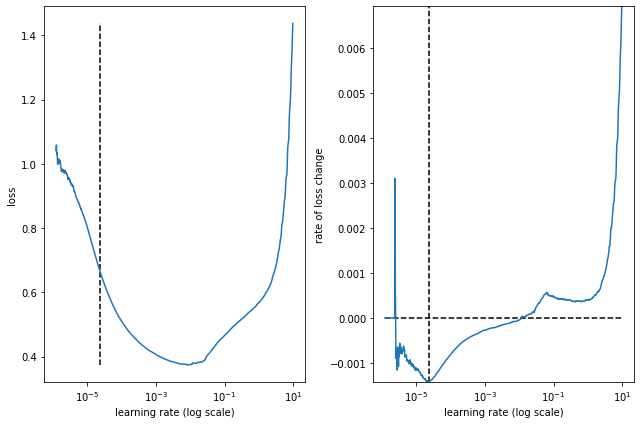

best lr: 2.3320375e-05 

Model: "conv2d_dense_26l_48s_16bs_423fm_63f_1ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_202 (Reshape)       (None, 26, 10, 1)         0         
                                                                 
 conv2d_101 (Conv2D)         (None, 26, 10, 63)        126       
                                                                 
 flatten_101 (Flatten)       (None, 16380)             0         
                                                                 
 dense_303 (Dense)           (None, 423)               6929163   
                                                                 
 dense_304 (Dense)           (None, 211)               89464     
                                                                 
 dense_305 (Dense)           (None, 48)                10176     
                                                                 
 r

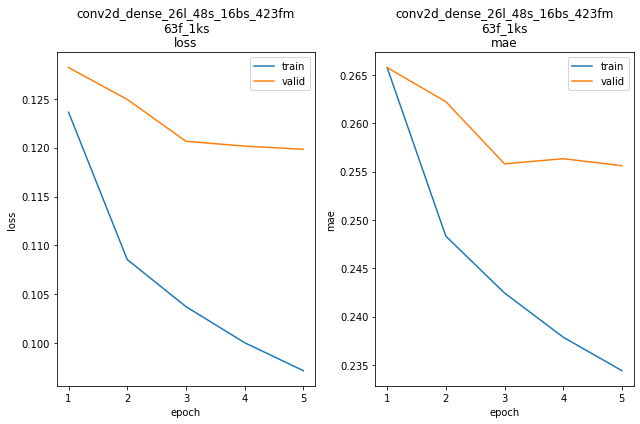

conv2d_dense_26l_48s_16bs_423fm_63f_1ks train min loss: 0.097179	mae: 0.234425	epoch: 5
conv2d_dense_26l_48s_16bs_423fm_63f_1ks valid min loss: 0.119833	mae: 0.255603	epoch: 5

conv2d_dense_26l_48s_16bs_423fm_63f_1ks
Iteration No: 42 ended. Search finished for the next optimal point.
Time taken: 333.0766
Function value obtained: 0.1198
Current minimum: 0.1198
Iteration No: 43 started. Searching for the next optimal point.
feat_maps 259
lags 28
filters 57
kern_size 1
Epoch 1/5
11759/11759 [==============================] - 14s 1ms/step - loss: 11550774525952.0000 - mae: 74545.3125


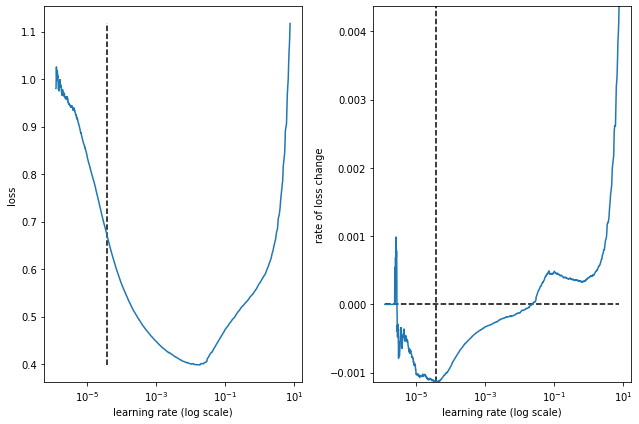

best lr: 3.8114224e-05 

Model: "conv2d_dense_28l_48s_16bs_259fm_57f_1ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_204 (Reshape)       (None, 28, 10, 1)         0         
                                                                 
 conv2d_102 (Conv2D)         (None, 28, 10, 57)        114       
                                                                 
 flatten_102 (Flatten)       (None, 15960)             0         
                                                                 
 dense_306 (Dense)           (None, 259)               4133899   
                                                                 
 dense_307 (Dense)           (None, 129)               33540     
                                                                 
 dense_308 (Dense)           (None, 48)                6240      
                                                                 
 r

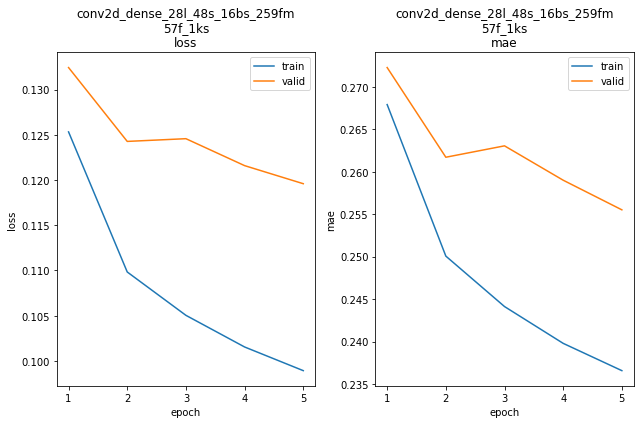

conv2d_dense_28l_48s_16bs_259fm_57f_1ks train min loss: 0.098931	mae: 0.236567	epoch: 5
conv2d_dense_28l_48s_16bs_259fm_57f_1ks valid min loss: 0.119592	mae: 0.255521	epoch: 5

conv2d_dense_28l_48s_16bs_259fm_57f_1ks
Iteration No: 43 ended. Search finished for the next optimal point.
Time taken: 355.8529
Function value obtained: 0.1196
Current minimum: 0.1196
Iteration No: 44 started. Searching for the next optimal point.
feat_maps 294
lags 38
filters 19
kern_size 7
Epoch 1/5
11758/11758 [==============================] - 10s 792us/step - loss: 27.5365 - mae: 0.6704


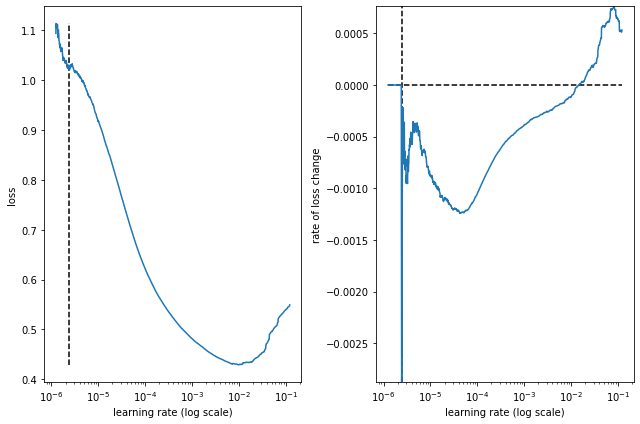

best lr: 2.4256462e-06 

Model: "conv2d_dense_38l_48s_16bs_294fm_19f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_206 (Reshape)       (None, 38, 10, 1)         0         
                                                                 
 conv2d_103 (Conv2D)         (None, 38, 10, 19)        152       
                                                                 
 flatten_103 (Flatten)       (None, 7220)              0         
                                                                 
 dense_309 (Dense)           (None, 294)               2122974   
                                                                 
 dense_310 (Dense)           (None, 147)               43365     
                                                                 
 dense_311 (Dense)           (None, 48)                7104      
                                                                 
 r

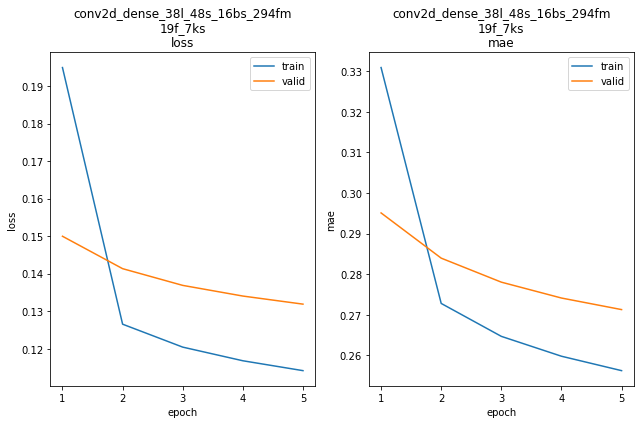

conv2d_dense_38l_48s_16bs_294fm_19f_7ks train min loss: 0.114155	mae: 0.256262	epoch: 5
conv2d_dense_38l_48s_16bs_294fm_19f_7ks valid min loss: 0.131880	mae: 0.271293	epoch: 5

conv2d_dense_38l_48s_16bs_294fm_19f_7ks
Iteration No: 44 ended. Search finished for the next optimal point.
Time taken: 340.4678
Function value obtained: 0.1319
Current minimum: 0.1196
Iteration No: 45 started. Searching for the next optimal point.
feat_maps 321
lags 28
filters 16
kern_size 3
Epoch 1/5
11759/11759 [==============================] - 10s 761us/step - loss: 1.9317 - mae: 0.5924


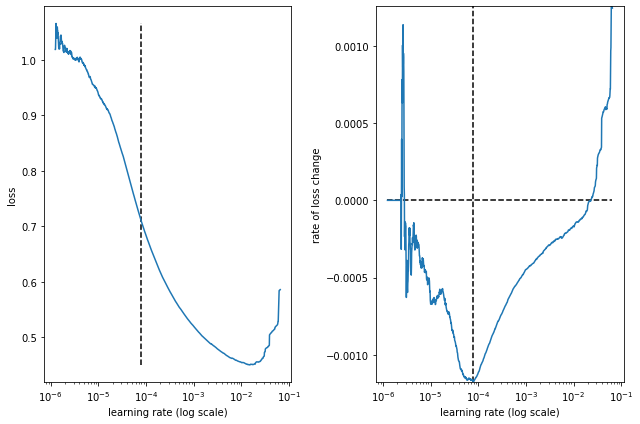

best lr: 7.894132e-05 

Model: "conv2d_dense_28l_48s_16bs_321fm_16f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_208 (Reshape)       (None, 28, 10, 1)         0         
                                                                 
 conv2d_104 (Conv2D)         (None, 28, 10, 16)        64        
                                                                 
 flatten_104 (Flatten)       (None, 4480)              0         
                                                                 
 dense_312 (Dense)           (None, 321)               1438401   
                                                                 
 dense_313 (Dense)           (None, 160)               51520     
                                                                 
 dense_314 (Dense)           (None, 48)                7728      
                                                                 
 re

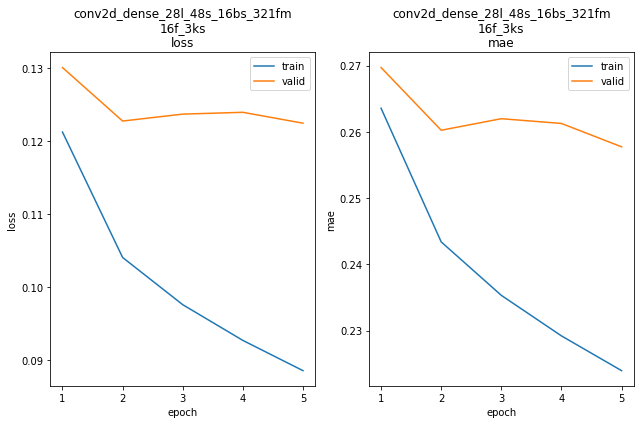

conv2d_dense_28l_48s_16bs_321fm_16f_3ks train min loss: 0.088574	mae: 0.223968	epoch: 5
conv2d_dense_28l_48s_16bs_321fm_16f_3ks valid min loss: 0.122497	mae: 0.257735	epoch: 5

conv2d_dense_28l_48s_16bs_321fm_16f_3ks
Iteration No: 45 ended. Search finished for the next optimal point.
Time taken: 302.6590
Function value obtained: 0.1225
Current minimum: 0.1196
Iteration No: 46 started. Searching for the next optimal point.
feat_maps 509
lags 31
filters 64
kern_size 2
Epoch 1/5
11759/11759 [==============================] - 17s 1ms/step - loss: 1.4691 - mae: 0.7335


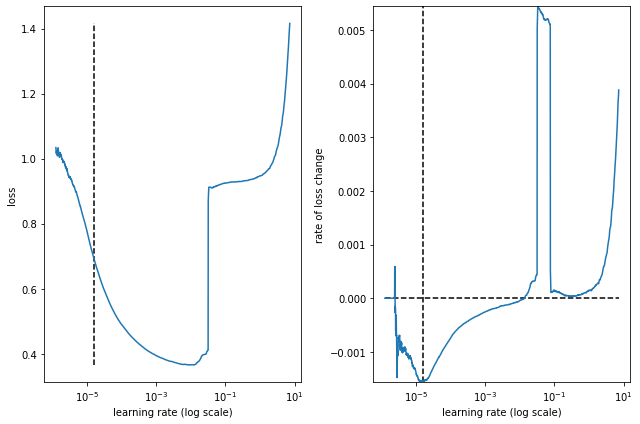

best lr: 1.5306032e-05 

Model: "conv2d_dense_31l_48s_16bs_509fm_64f_2ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_210 (Reshape)       (None, 31, 10, 1)         0         
                                                                 
 conv2d_105 (Conv2D)         (None, 31, 10, 64)        192       
                                                                 
 flatten_105 (Flatten)       (None, 19840)             0         
                                                                 
 dense_315 (Dense)           (None, 509)               10099069  
                                                                 
 dense_316 (Dense)           (None, 254)               129540    
                                                                 
 dense_317 (Dense)           (None, 48)                12240     
                                                                 
 r

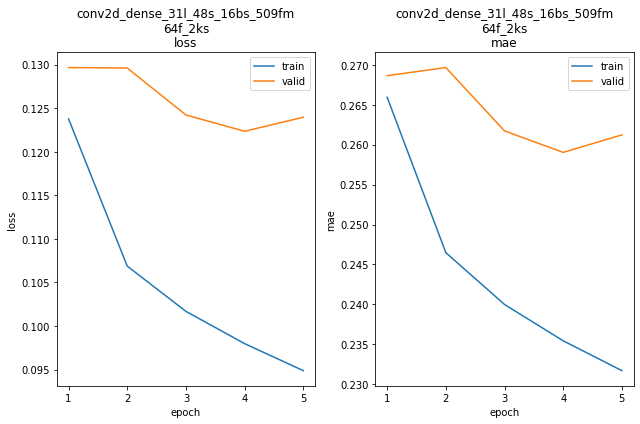

conv2d_dense_31l_48s_16bs_509fm_64f_2ks train min loss: 0.094872	mae: 0.231698	epoch: 5
conv2d_dense_31l_48s_16bs_509fm_64f_2ks valid min loss: 0.122344	mae: 0.259034	epoch: 4

conv2d_dense_31l_48s_16bs_509fm_64f_2ks
Iteration No: 46 ended. Search finished for the next optimal point.
Time taken: 330.0123
Function value obtained: 0.1223
Current minimum: 0.1196
Iteration No: 47 started. Searching for the next optimal point.
feat_maps 67
lags 43
filters 62
kern_size 3
Epoch 1/5
11758/11758 [==============================] - 10s 771us/step - loss: 156.6827 - mae: 0.9299


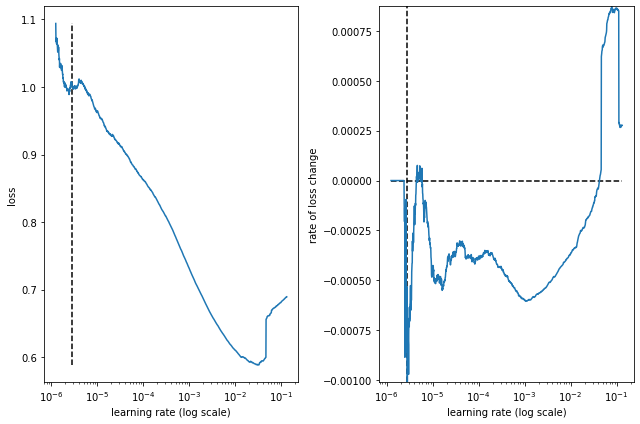

best lr: 2.8157913e-06 

Model: "conv2d_dense_43l_48s_16bs_67fm_62f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_212 (Reshape)       (None, 43, 10, 1)         0         
                                                                 
 conv2d_106 (Conv2D)         (None, 43, 10, 62)        248       
                                                                 
 flatten_106 (Flatten)       (None, 26660)             0         
                                                                 
 dense_318 (Dense)           (None, 67)                1786287   
                                                                 
 dense_319 (Dense)           (None, 33)                2244      
                                                                 
 dense_320 (Dense)           (None, 48)                1632      
                                                                 
 re

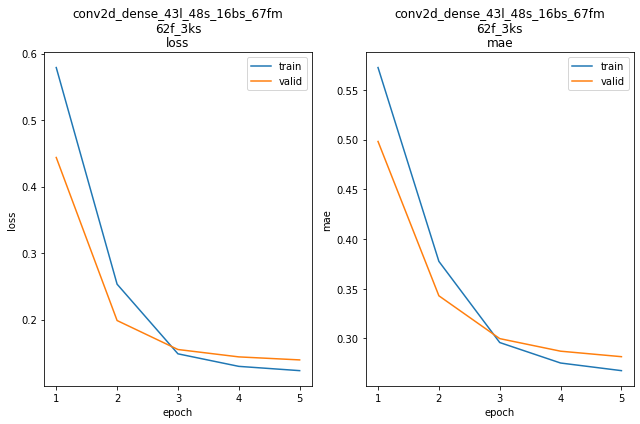

conv2d_dense_43l_48s_16bs_67fm_62f_3ks train min loss: 0.123237	mae: 0.267640	epoch: 5
conv2d_dense_43l_48s_16bs_67fm_62f_3ks valid min loss: 0.139385	mae: 0.281684	epoch: 5

conv2d_dense_43l_48s_16bs_67fm_62f_3ks
WARN: bad model conv2d_dense_43l_48s_16bs_67fm_62f_3ks
Iteration No: 47 ended. Search finished for the next optimal point.
Time taken: 299.2564
Function value obtained: 0.1394
Current minimum: 0.1196
Iteration No: 48 started. Searching for the next optimal point.
feat_maps 512
lags 40
filters 64
kern_size 4
Epoch 1/5
11758/11758 [==============================] - 13s 1ms/step - loss: 1.5232 - mae: 0.5403


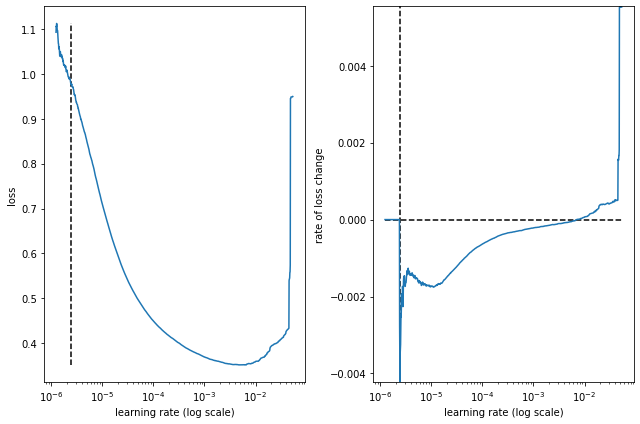

best lr: 2.4470207e-06 

Model: "conv2d_dense_40l_48s_16bs_512fm_64f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_214 (Reshape)       (None, 40, 10, 1)         0         
                                                                 
 conv2d_107 (Conv2D)         (None, 40, 10, 64)        320       
                                                                 
 flatten_107 (Flatten)       (None, 25600)             0         
                                                                 
 dense_321 (Dense)           (None, 512)               13107712  
                                                                 
 dense_322 (Dense)           (None, 256)               131328    
                                                                 
 dense_323 (Dense)           (None, 48)                12336     
                                                                 
 r

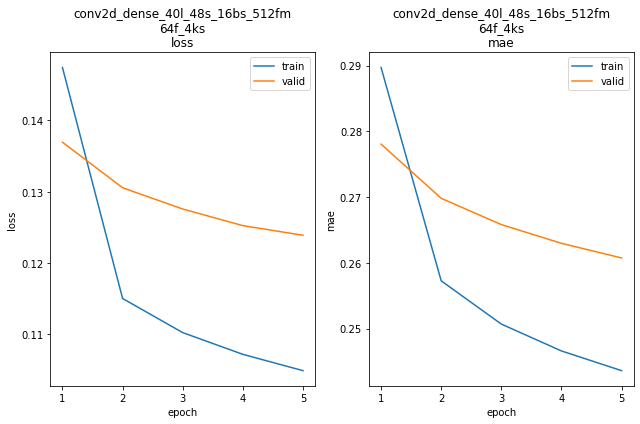

conv2d_dense_40l_48s_16bs_512fm_64f_4ks train min loss: 0.104930	mae: 0.243594	epoch: 5
conv2d_dense_40l_48s_16bs_512fm_64f_4ks valid min loss: 0.123910	mae: 0.260731	epoch: 5

conv2d_dense_40l_48s_16bs_512fm_64f_4ks
Iteration No: 48 ended. Search finished for the next optimal point.
Time taken: 335.1254
Function value obtained: 0.1239
Current minimum: 0.1196
Iteration No: 49 started. Searching for the next optimal point.
feat_maps 372
lags 46
filters 21
kern_size 7
Epoch 1/5
11758/11758 [==============================] - 10s 801us/step - loss: 2.8879 - mae: 0.5560


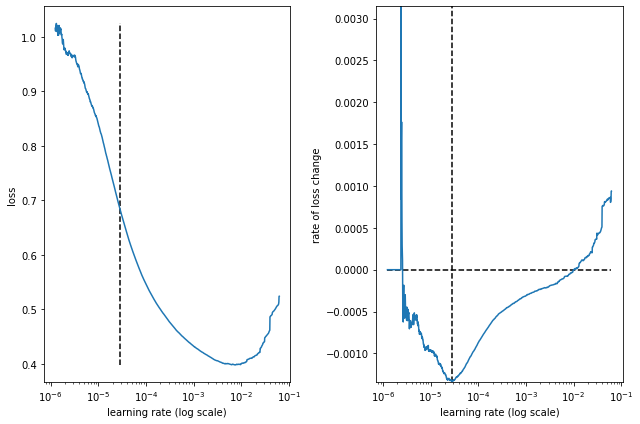

best lr: 2.8292769e-05 

Model: "conv2d_dense_46l_48s_16bs_372fm_21f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_216 (Reshape)       (None, 46, 10, 1)         0         
                                                                 
 conv2d_108 (Conv2D)         (None, 46, 10, 21)        168       
                                                                 
 flatten_108 (Flatten)       (None, 9660)              0         
                                                                 
 dense_324 (Dense)           (None, 372)               3593892   
                                                                 
 dense_325 (Dense)           (None, 186)               69378     
                                                                 
 dense_326 (Dense)           (None, 48)                8976      
                                                                 
 r

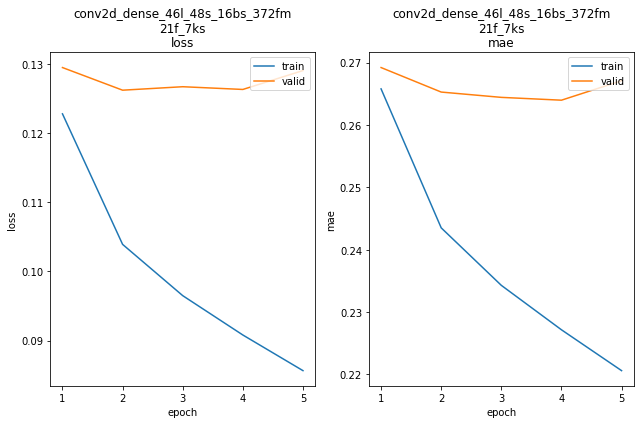

conv2d_dense_46l_48s_16bs_372fm_21f_7ks train min loss: 0.085633	mae: 0.220601	epoch: 5
conv2d_dense_46l_48s_16bs_372fm_21f_7ks valid min loss: 0.126262	mae: 0.265284	epoch: 2

conv2d_dense_46l_48s_16bs_372fm_21f_7ks
Iteration No: 49 ended. Search finished for the next optimal point.
Time taken: 350.3044
Function value obtained: 0.1263
Current minimum: 0.1196
Iteration No: 50 started. Searching for the next optimal point.
feat_maps 441
lags 42
filters 63
kern_size 6
Epoch 1/5
11758/11758 [==============================] - 12s 974us/step - loss: 4.0059 - mae: 0.5767


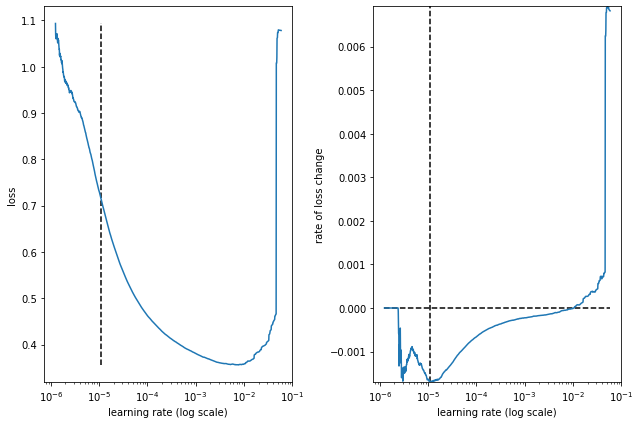

best lr: 1.0684306e-05 

Model: "conv2d_dense_42l_48s_16bs_441fm_63f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_218 (Reshape)       (None, 42, 10, 1)         0         
                                                                 
 conv2d_109 (Conv2D)         (None, 42, 10, 63)        441       
                                                                 
 flatten_109 (Flatten)       (None, 26460)             0         
                                                                 
 dense_327 (Dense)           (None, 441)               11669301  
                                                                 
 dense_328 (Dense)           (None, 220)               97240     
                                                                 
 dense_329 (Dense)           (None, 48)                10608     
                                                                 
 r

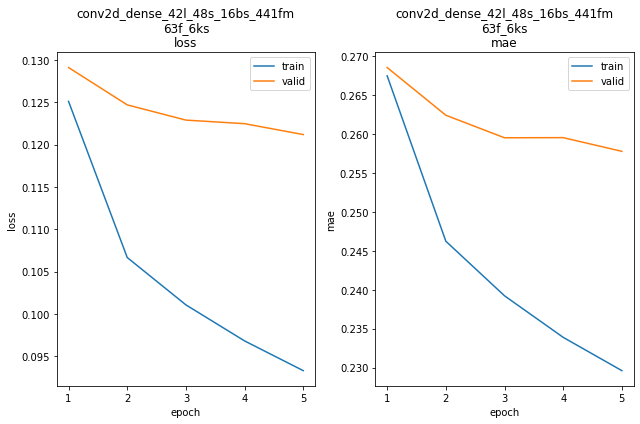

conv2d_dense_42l_48s_16bs_441fm_63f_6ks train min loss: 0.093318	mae: 0.229605	epoch: 5
conv2d_dense_42l_48s_16bs_441fm_63f_6ks valid min loss: 0.121190	mae: 0.257787	epoch: 5

conv2d_dense_42l_48s_16bs_441fm_63f_6ks
Iteration No: 50 ended. Search finished for the next optimal point.
Time taken: 383.4818
Function value obtained: 0.1212
Current minimum: 0.1196
Iteration No: 51 started. Searching for the next optimal point.
feat_maps 423
lags 36
filters 62
kern_size 3
Epoch 1/5
11758/11758 [==============================] - 12s 924us/step - loss: 181.0846 - mae: 0.8872


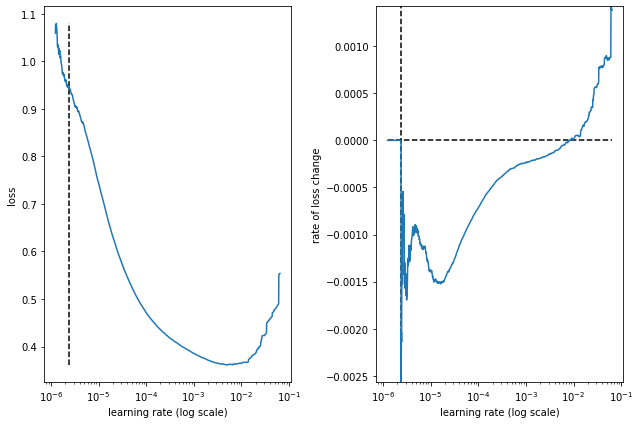

best lr: 2.4044584e-06 

Model: "conv2d_dense_36l_48s_16bs_423fm_62f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_220 (Reshape)       (None, 36, 10, 1)         0         
                                                                 
 conv2d_110 (Conv2D)         (None, 36, 10, 62)        248       
                                                                 
 flatten_110 (Flatten)       (None, 22320)             0         
                                                                 
 dense_330 (Dense)           (None, 423)               9441783   
                                                                 
 dense_331 (Dense)           (None, 211)               89464     
                                                                 
 dense_332 (Dense)           (None, 48)                10176     
                                                                 
 r

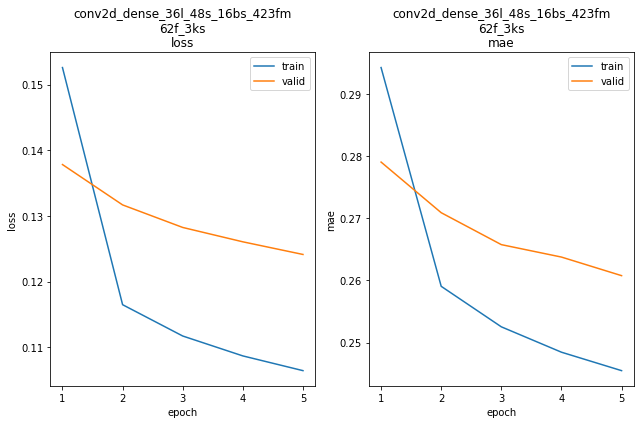

conv2d_dense_36l_48s_16bs_423fm_62f_3ks train min loss: 0.106427	mae: 0.245472	epoch: 5
conv2d_dense_36l_48s_16bs_423fm_62f_3ks valid min loss: 0.124132	mae: 0.260763	epoch: 5

conv2d_dense_36l_48s_16bs_423fm_62f_3ks
Iteration No: 51 ended. Search finished for the next optimal point.
Time taken: 334.8475
Function value obtained: 0.1241
Current minimum: 0.1196
Iteration No: 52 started. Searching for the next optimal point.
feat_maps 179
lags 29
filters 20
kern_size 1
Epoch 1/5
11759/11759 [==============================] - 11s 912us/step - loss: 191019.8438 - mae: 9.0753


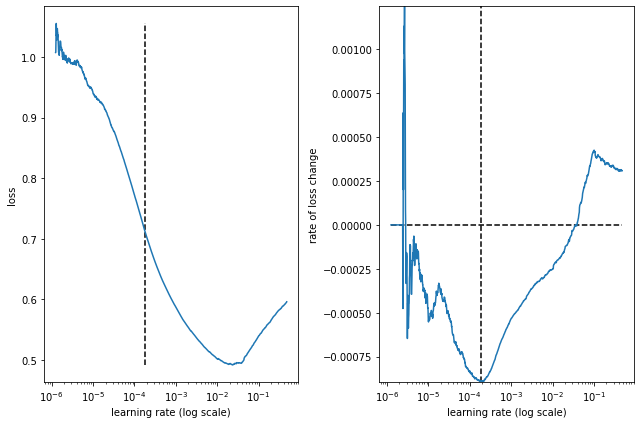

best lr: 0.00018165182 

Model: "conv2d_dense_29l_48s_16bs_179fm_20f_1ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_222 (Reshape)       (None, 29, 10, 1)         0         
                                                                 
 conv2d_111 (Conv2D)         (None, 29, 10, 20)        40        
                                                                 
 flatten_111 (Flatten)       (None, 5800)              0         
                                                                 
 dense_333 (Dense)           (None, 179)               1038379   
                                                                 
 dense_334 (Dense)           (None, 89)                16020     
                                                                 
 dense_335 (Dense)           (None, 48)                4320      
                                                                 
 r

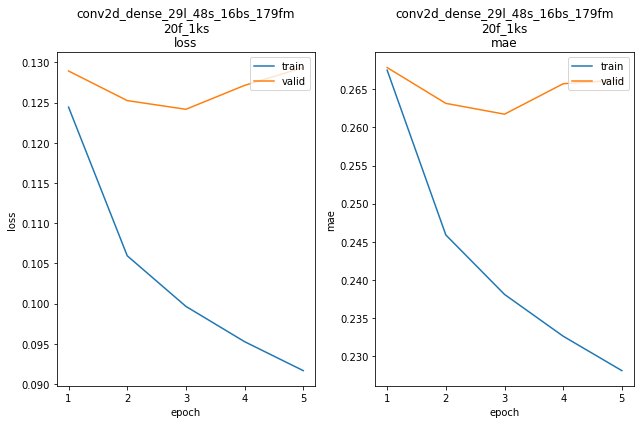

conv2d_dense_29l_48s_16bs_179fm_20f_1ks train min loss: 0.091671	mae: 0.228074	epoch: 5
conv2d_dense_29l_48s_16bs_179fm_20f_1ks valid min loss: 0.124158	mae: 0.261741	epoch: 3

conv2d_dense_29l_48s_16bs_179fm_20f_1ks
Iteration No: 52 ended. Search finished for the next optimal point.
Time taken: 228.9538
Function value obtained: 0.1242
Current minimum: 0.1196
Iteration No: 53 started. Searching for the next optimal point.
feat_maps 503
lags 26
filters 63
kern_size 7
Epoch 1/5
11759/11759 [==============================] - 16s 1ms/step - loss: 1.4688 - mae: 0.7741


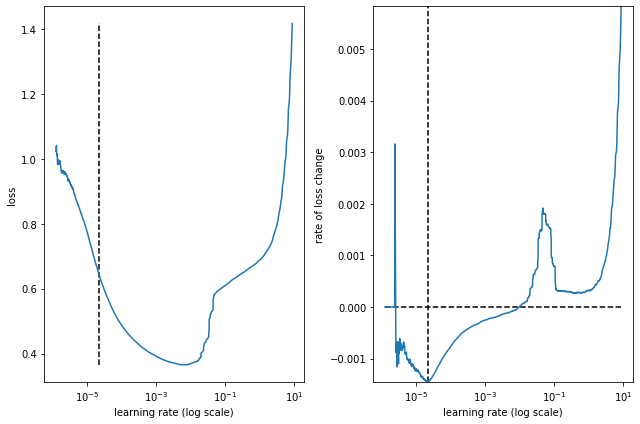

best lr: 2.193141e-05 

Model: "conv2d_dense_26l_48s_16bs_503fm_63f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_224 (Reshape)       (None, 26, 10, 1)         0         
                                                                 
 conv2d_112 (Conv2D)         (None, 26, 10, 63)        504       
                                                                 
 flatten_112 (Flatten)       (None, 16380)             0         
                                                                 
 dense_336 (Dense)           (None, 503)               8239643   
                                                                 
 dense_337 (Dense)           (None, 251)               126504    
                                                                 
 dense_338 (Dense)           (None, 48)                12096     
                                                                 
 re

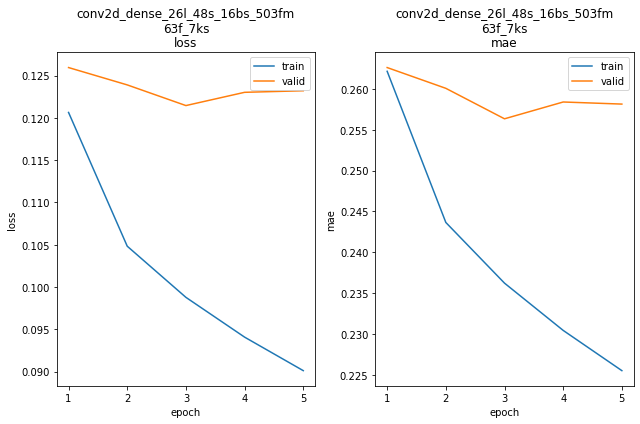

conv2d_dense_26l_48s_16bs_503fm_63f_7ks train min loss: 0.090109	mae: 0.225500	epoch: 5
conv2d_dense_26l_48s_16bs_503fm_63f_7ks valid min loss: 0.121455	mae: 0.256349	epoch: 3

conv2d_dense_26l_48s_16bs_503fm_63f_7ks
Iteration No: 53 ended. Search finished for the next optimal point.
Time taken: 370.2871
Function value obtained: 0.1215
Current minimum: 0.1196
Iteration No: 54 started. Searching for the next optimal point.
feat_maps 509
lags 48
filters 63
kern_size 1
Epoch 1/5
11758/11758 [==============================] - 14s 1ms/step - loss: 41.0719 - mae: 0.6590


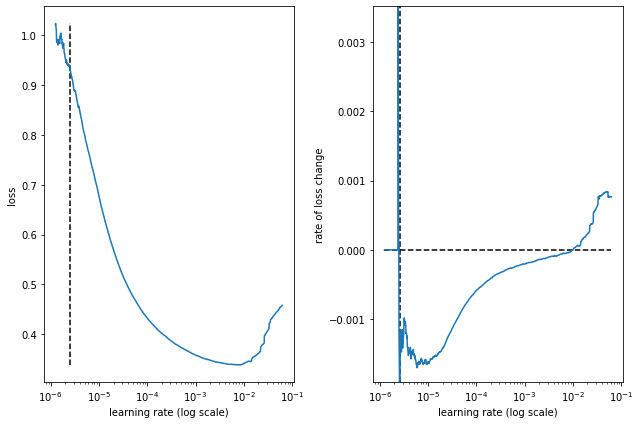

best lr: 2.5567515e-06 

Model: "conv2d_dense_48l_48s_16bs_509fm_63f_1ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_226 (Reshape)       (None, 48, 10, 1)         0         
                                                                 
 conv2d_113 (Conv2D)         (None, 48, 10, 63)        126       
                                                                 
 flatten_113 (Flatten)       (None, 30240)             0         
                                                                 
 dense_339 (Dense)           (None, 509)               15392669  
                                                                 
 dense_340 (Dense)           (None, 254)               129540    
                                                                 
 dense_341 (Dense)           (None, 48)                12240     
                                                                 
 r

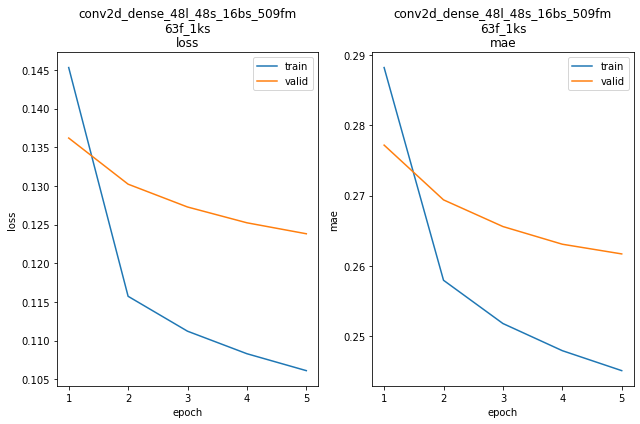

conv2d_dense_48l_48s_16bs_509fm_63f_1ks train min loss: 0.106129	mae: 0.245061	epoch: 5
conv2d_dense_48l_48s_16bs_509fm_63f_1ks valid min loss: 0.123820	mae: 0.261685	epoch: 5

conv2d_dense_48l_48s_16bs_509fm_63f_1ks
Iteration No: 54 ended. Search finished for the next optimal point.
Time taken: 416.0701
Function value obtained: 0.1238
Current minimum: 0.1196
Iteration No: 55 started. Searching for the next optimal point.
feat_maps 205
lags 24
filters 17
kern_size 7
Epoch 1/5
11759/11759 [==============================] - 13s 1ms/step - loss: 1.8838 - mae: 0.8492


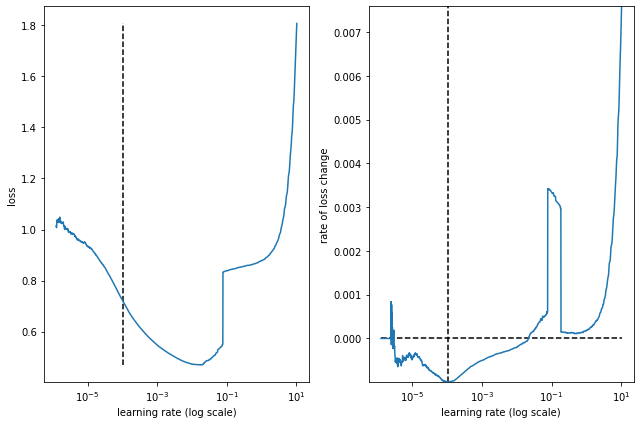

best lr: 0.000103611885 

Model: "conv2d_dense_24l_48s_16bs_205fm_17f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_228 (Reshape)       (None, 24, 10, 1)         0         
                                                                 
 conv2d_114 (Conv2D)         (None, 24, 10, 17)        136       
                                                                 
 flatten_114 (Flatten)       (None, 4080)              0         
                                                                 
 dense_342 (Dense)           (None, 205)               836605    
                                                                 
 dense_343 (Dense)           (None, 102)               21012     
                                                                 
 dense_344 (Dense)           (None, 48)                4944      
                                                                 
 

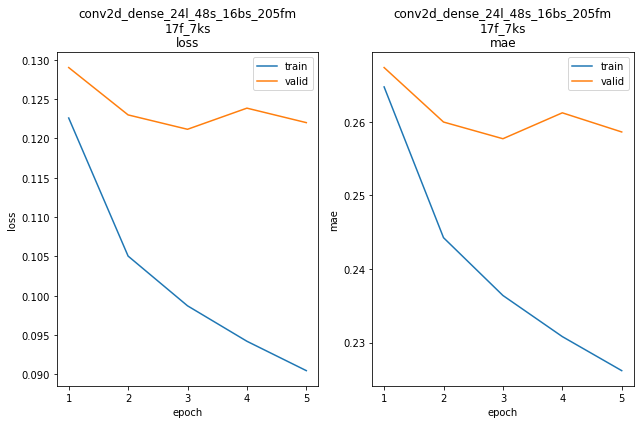

conv2d_dense_24l_48s_16bs_205fm_17f_7ks train min loss: 0.090480	mae: 0.226197	epoch: 5
conv2d_dense_24l_48s_16bs_205fm_17f_7ks valid min loss: 0.121157	mae: 0.257706	epoch: 3

conv2d_dense_24l_48s_16bs_205fm_17f_7ks
Iteration No: 55 ended. Search finished for the next optimal point.
Time taken: 302.4494
Function value obtained: 0.1212
Current minimum: 0.1196
Iteration No: 56 started. Searching for the next optimal point.
feat_maps 197
lags 44
filters 16
kern_size 2
Epoch 1/5
11758/11758 [==============================] - 14s 1ms/step - loss: 1.8844 - mae: 0.8585


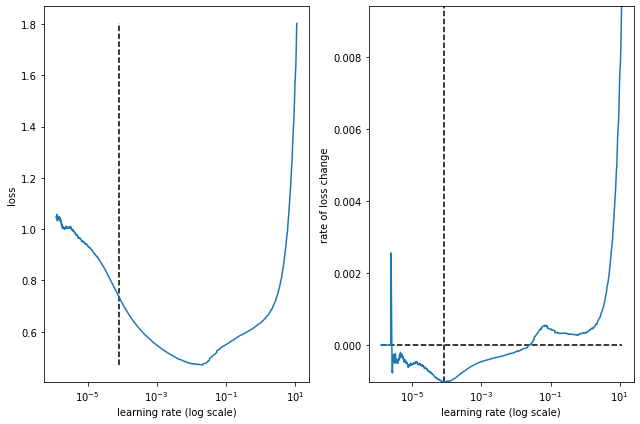

best lr: 8.107669e-05 

Model: "conv2d_dense_44l_48s_16bs_197fm_16f_2ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_230 (Reshape)       (None, 44, 10, 1)         0         
                                                                 
 conv2d_115 (Conv2D)         (None, 44, 10, 16)        48        
                                                                 
 flatten_115 (Flatten)       (None, 7040)              0         
                                                                 
 dense_345 (Dense)           (None, 197)               1387077   
                                                                 
 dense_346 (Dense)           (None, 98)                19404     
                                                                 
 dense_347 (Dense)           (None, 48)                4752      
                                                                 
 re

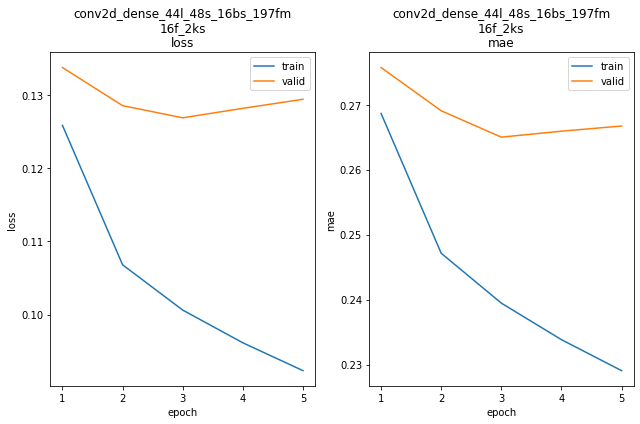

conv2d_dense_44l_48s_16bs_197fm_16f_2ks train min loss: 0.092358	mae: 0.229056	epoch: 5
conv2d_dense_44l_48s_16bs_197fm_16f_2ks valid min loss: 0.126857	mae: 0.265008	epoch: 3

conv2d_dense_44l_48s_16bs_197fm_16f_2ks
Iteration No: 56 ended. Search finished for the next optimal point.
Time taken: 231.4474
Function value obtained: 0.1269
Current minimum: 0.1196
Iteration No: 57 started. Searching for the next optimal point.
feat_maps 211
lags 37
filters 64
kern_size 6
Epoch 1/5
11758/11758 [==============================] - 15s 1ms/step - loss: 1.6716 - mae: 0.8229


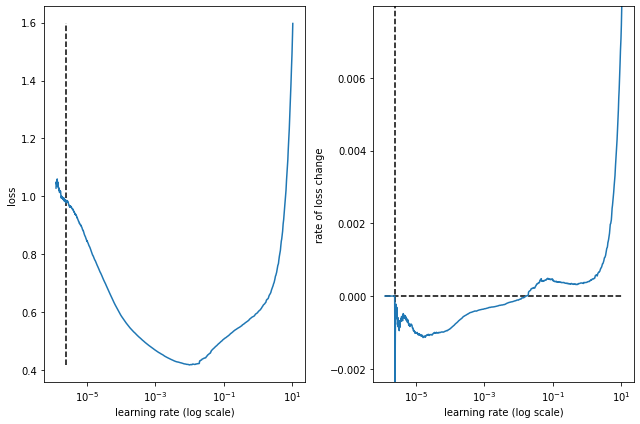

best lr: 2.4470207e-06 

Model: "conv2d_dense_37l_48s_16bs_211fm_64f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_232 (Reshape)       (None, 37, 10, 1)         0         
                                                                 
 conv2d_116 (Conv2D)         (None, 37, 10, 64)        448       
                                                                 
 flatten_116 (Flatten)       (None, 23680)             0         
                                                                 
 dense_348 (Dense)           (None, 211)               4996691   
                                                                 
 dense_349 (Dense)           (None, 105)               22260     
                                                                 
 dense_350 (Dense)           (None, 48)                5088      
                                                                 
 r

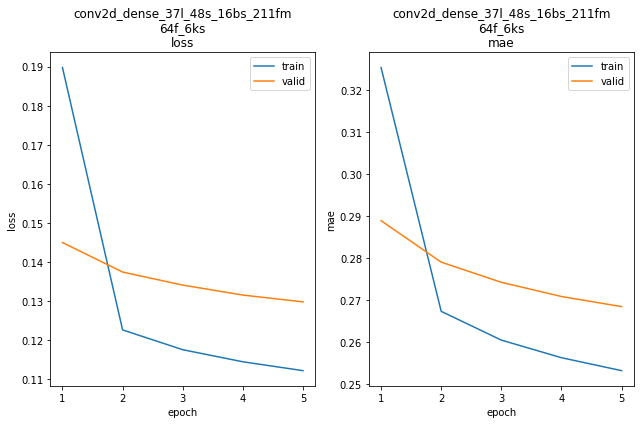

conv2d_dense_37l_48s_16bs_211fm_64f_6ks train min loss: 0.112234	mae: 0.253167	epoch: 5
conv2d_dense_37l_48s_16bs_211fm_64f_6ks valid min loss: 0.129824	mae: 0.268419	epoch: 5

conv2d_dense_37l_48s_16bs_211fm_64f_6ks
Iteration No: 57 ended. Search finished for the next optimal point.
Time taken: 290.2980
Function value obtained: 0.1298
Current minimum: 0.1196
Iteration No: 58 started. Searching for the next optimal point.
feat_maps 510
lags 33
filters 63
kern_size 4
Epoch 1/5
11759/11759 [==============================] - 12s 978us/step - loss: 2.4612 - mae: 0.5391


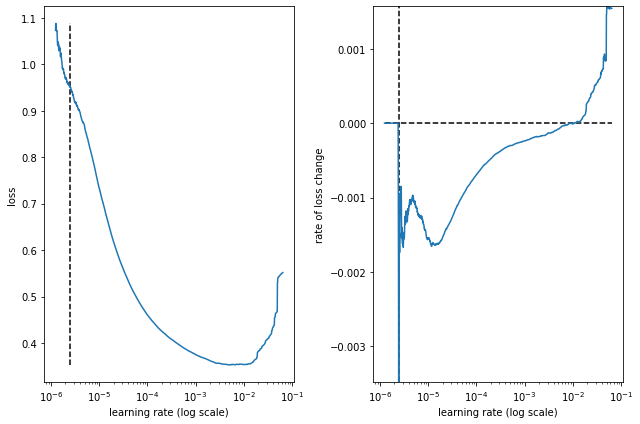

best lr: 2.4468345e-06 

Model: "conv2d_dense_33l_48s_16bs_510fm_63f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_234 (Reshape)       (None, 33, 10, 1)         0         
                                                                 
 conv2d_117 (Conv2D)         (None, 33, 10, 63)        315       
                                                                 
 flatten_117 (Flatten)       (None, 20790)             0         
                                                                 
 dense_351 (Dense)           (None, 510)               10603410  
                                                                 
 dense_352 (Dense)           (None, 255)               130305    
                                                                 
 dense_353 (Dense)           (None, 48)                12288     
                                                                 
 r

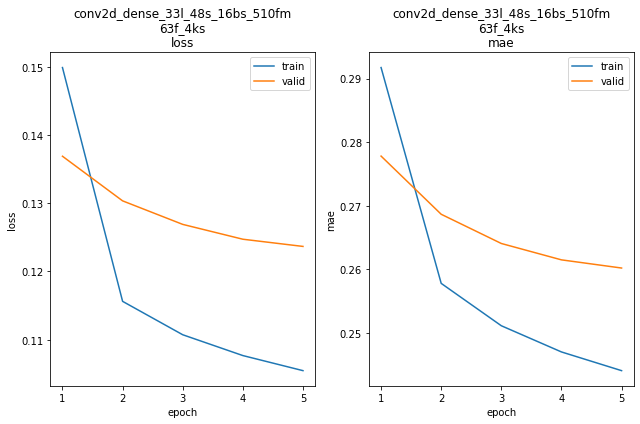

conv2d_dense_33l_48s_16bs_510fm_63f_4ks train min loss: 0.105466	mae: 0.244065	epoch: 5
conv2d_dense_33l_48s_16bs_510fm_63f_4ks valid min loss: 0.123675	mae: 0.260204	epoch: 5

conv2d_dense_33l_48s_16bs_510fm_63f_4ks
Iteration No: 58 ended. Search finished for the next optimal point.
Time taken: 354.8760
Function value obtained: 0.1237
Current minimum: 0.1196
Iteration No: 59 started. Searching for the next optimal point.
feat_maps 425
lags 26
filters 17
kern_size 4
Epoch 1/5
11759/11759 [==============================] - 10s 802us/step - loss: 127.0830 - mae: 0.8466


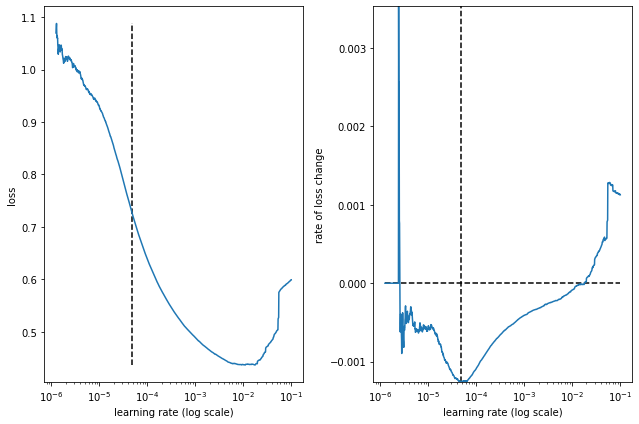

best lr: 4.7046084e-05 

Model: "conv2d_dense_26l_48s_16bs_425fm_17f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_236 (Reshape)       (None, 26, 10, 1)         0         
                                                                 
 conv2d_118 (Conv2D)         (None, 26, 10, 17)        85        
                                                                 
 flatten_118 (Flatten)       (None, 4420)              0         
                                                                 
 dense_354 (Dense)           (None, 425)               1878925   
                                                                 
 dense_355 (Dense)           (None, 212)               90312     
                                                                 
 dense_356 (Dense)           (None, 48)                10224     
                                                                 
 r

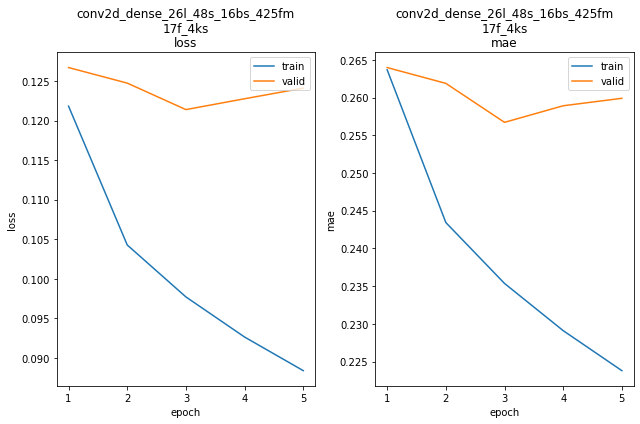

conv2d_dense_26l_48s_16bs_425fm_17f_4ks train min loss: 0.088380	mae: 0.223788	epoch: 5
conv2d_dense_26l_48s_16bs_425fm_17f_4ks valid min loss: 0.121378	mae: 0.256712	epoch: 3

conv2d_dense_26l_48s_16bs_425fm_17f_4ks
Iteration No: 59 ended. Search finished for the next optimal point.
Time taken: 217.0124
Function value obtained: 0.1214
Current minimum: 0.1196
Iteration No: 60 started. Searching for the next optimal point.
feat_maps 67
lags 29
filters 64
kern_size 6
Epoch 1/5
11759/11759 [==============================] - 15s 1ms/step - loss: 2.3261 - mae: 0.9548


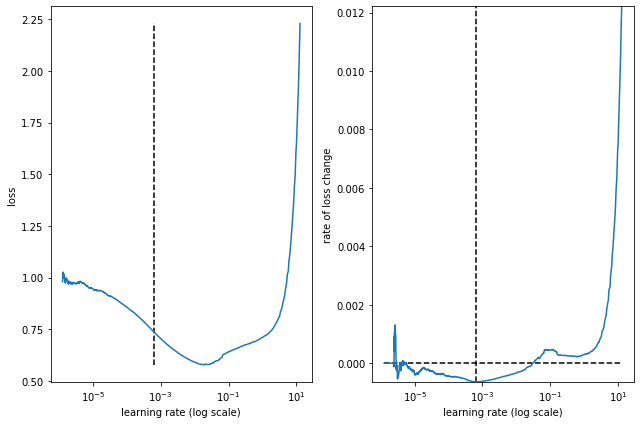

best lr: 0.0006368661 

Model: "conv2d_dense_29l_48s_16bs_67fm_64f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_238 (Reshape)       (None, 29, 10, 1)         0         
                                                                 
 conv2d_119 (Conv2D)         (None, 29, 10, 64)        448       
                                                                 
 flatten_119 (Flatten)       (None, 18560)             0         
                                                                 
 dense_357 (Dense)           (None, 67)                1243587   
                                                                 
 dense_358 (Dense)           (None, 33)                2244      
                                                                 
 dense_359 (Dense)           (None, 48)                1632      
                                                                 
 res

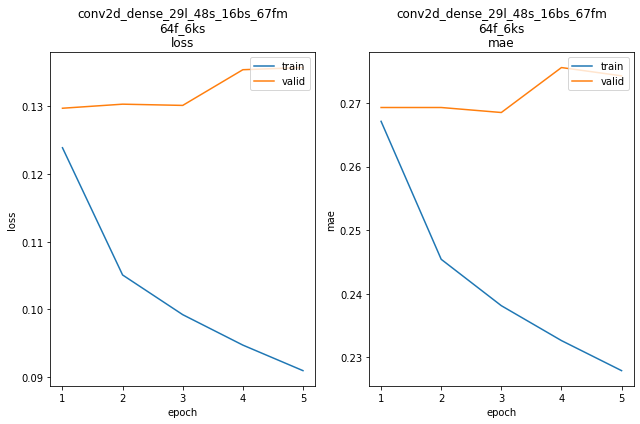

conv2d_dense_29l_48s_16bs_67fm_64f_6ks train min loss: 0.090933	mae: 0.227916	epoch: 5
conv2d_dense_29l_48s_16bs_67fm_64f_6ks valid min loss: 0.129736	mae: 0.269290	epoch: 1

conv2d_dense_29l_48s_16bs_67fm_64f_6ks
Iteration No: 60 ended. Search finished for the next optimal point.
Time taken: 362.6212
Function value obtained: 0.1297
Current minimum: 0.1196

[259, 28, 57, 1]
0.11959187686443329



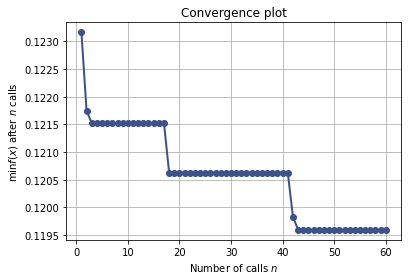

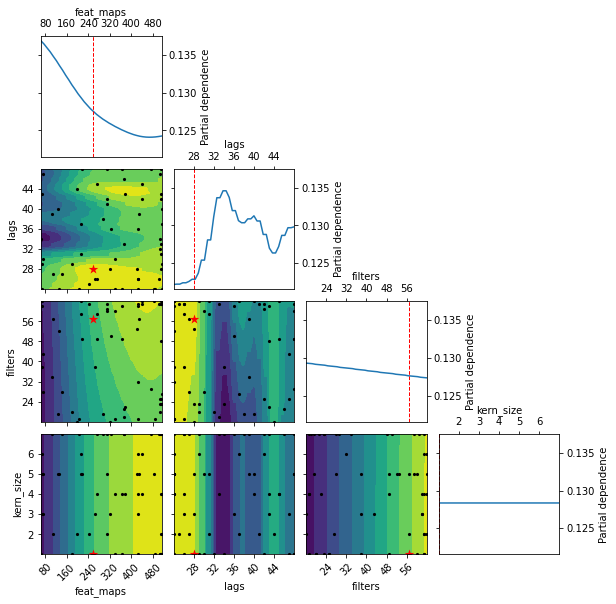

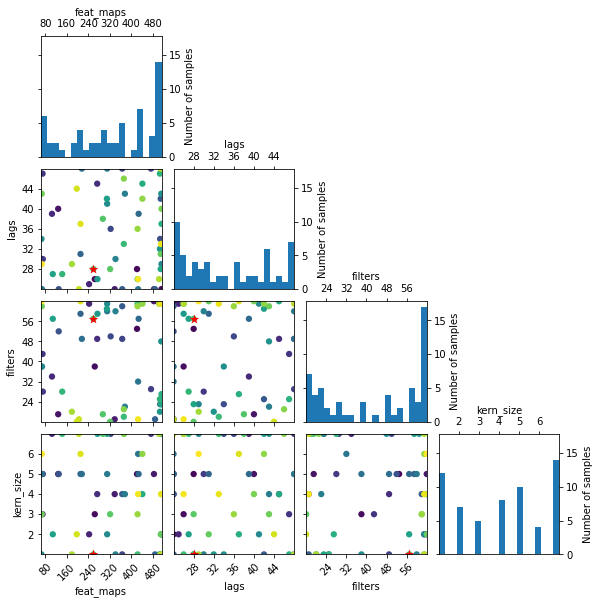

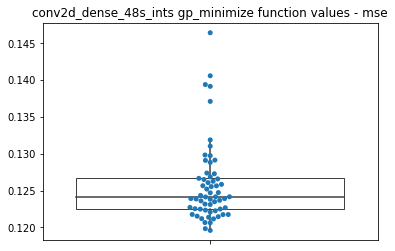

[('conv2d_dense_43l_48s_16bs_505fm_60f_3ks', 0.12261),
 ('conv2d_dense_45l_48s_16bs_441fm_64f_4ks', 0.12267),
 ('conv2d_dense_47l_48s_16bs_502fm_48f_3ks', 0.12306),
 ('conv2d_dense_41l_48s_16bs_502fm_63f_16ks', 0.12349),
 ('conv2d_dense_33l_48s_16bs_510fm_63f_4ks', 0.12368)]

[('conv2d_dense_43l_48s_16bs_505fm_60f_3ks', 0.25905),
 ('conv2d_dense_41l_48s_16bs_502fm_63f_16ks', 0.25918),
 ('conv2d_dense_45l_48s_16bs_441fm_64f_4ks', 0.26003),
 ('conv2d_dense_47l_48s_16bs_502fm_48f_3ks', 0.26017),
 ('conv2d_dense_33l_48s_16bs_510fm_63f_4ks', 0.2602)]

CPU times: user 5h 17min 36s, sys: 42min 56s, total: 6h 33s
Wall time: 5h 31min 20s


In [12]:
%%time


results_id = 'conv2d_dense_48s_ints'
hpo[results_id] = {}

dim_feat_maps = Integer(low = 64, high = 512, name = 'feat_maps')
dim_lags      = Integer(low = 24, high =  48, name = 'lags')
dim_filters   = Integer(low = 16, high =  64, name = 'filters')
dim_kern_size = Integer(low =  1, high =   7, name = 'kern_size')

hpo[results_id]['dims'] = [dim_feat_maps,
                           dim_lags,
                           dim_filters,
                           dim_kern_size]
hpo[results_id]['init_dims'] = [512, 24, 64, 2]
hpo[results_id]['calls']     = 60


@use_named_args(dimensions = hpo[results_id]['dims'])
def model_fitness(**dims):
    params = get_default_params('conv2d_dense')
    params.update({'lrf_params': [0.000001, 10, 32, 5, 100, 25]})

    return get_bo_mse(params, **dims)


hpo[results_id]['fitness_func'] = model_fitness
hpo[results_id]['results']      = run_bo_search(hpo, results_id)


get_best_models(models)

display(rank_models(models, 'val_loss', strict = True, limit = 5))
display(rank_models(models, 'val_mae',  strict = True, limit = 5))

Results for optimised Conv2D 48 steps-ahead forecast models after 5 epochs:

| CNN model | params                                     | mse     | mae     |
|-----------|--------------------------------------------|---------|---------|
|Conv1D-LSTM| lags=30,feat_maps=27,filters=63,kern_size=7| 0.12481 | 0.26295 |
|Conv1D-Dense|lags=32,feat_maps=32,filters=45,kern_size=3| 0.12564 | 0.26368 |
|MH  Conv1D |lags=42,feat_maps=255,filters=63,kern_size=[3,4,5]| 0.12818 | 0.26698 |
|  Conv2D   | lags=45,feat_maps=441,filters=64,kern_size=4 | 0.12267 | 0.26003 |

Best model:
 * conv2d_dense_45l_48s_16bs_441fm_64f_4ks
 * there are models with lower mse values but they show signs of overfitting

Training time remains acceptible despite the high number of model parameters (over 10 million in some cases).

This minimal value is less than the  Conv1D minimal mse values.
Combined with the 3 minimal kern_sizes (3,4,5) suggests this architecture may not be worth exploring further.

From the Gaussian process plots we can infer:
 * feat_maps - higher is better
 * filters - higher is better
 * lags - lower is better
 * kern_size - no affect

The apparent lack of affect from varying kern_size is concerning.  Perhaps it is dominated by all the later occuring model parameters (in the Dense layers).

It's clear from some of the learning rate finder curves that start_lr and/or end_lr could be further refined.  There are signs of overfitting; start_lr may be a little high.

As with all of the skopt runs, it would benefit from running for more iterations and probably more learning rate tuning.

---

### Stacked Conv2D


Multi-variate time series data can be treated like a simple 2D image with a single channel; meaning we can apply [Conv2D layers](https://keras.io/api/layers/convolution_layers/convolution2d/).

Code for this architecture is in the `build_conv2d_dense_model` function.

Briefly, the architecture is (omitting dropout and regularisation):
 * Conv2D()
 * Flatten()
 * Dense(activation='relu')
 * Dense(activation='relu')
 * Dense()

This time, optimise:
 * lags
 * feat_maps - Dense(activation='relu') feature maps
 * Conv2D() filters
 * Conv2D() kernel size (ks_feats, see below)

A few notes on the Conv2d() kernel size:
 * input tensors have the following shape 
   * (batch, time window, features, channels)
   * for example (16, 24, 10, 1)
 * **kernel_size**: A tuple/list of 2 integers, specifying the height and width of the 2D convolution window
 * if we use a kernel_size = (1, ks_feats) then we can find a convolution window that checks the features and calculates which are the relevant ones
 * here ks_feats will probably be small - 2 or 3

In [ ]:
%%time

# zzz

results_id = 's_conv2d_48s_ints'
hpo[results_id] = {}

dim_feat_maps = Integer(low = 64, high = 512, name = 'feat_maps')
dim_lags      = Integer(low = 24, high =  48, name = 'lags')
dim_filters   = Integer(low = 16, high =  64, name = 'filters')
dim_kern_size = Integer(low =  1, high =   7, name = 'kern_size')

hpo[results_id]['dims'] = [dim_feat_maps,
                           dim_lags,
                           dim_filters,
                           dim_kern_size]
hpo[results_id]['init_dims'] = [512, 24, 64, 2]
hpo[results_id]['calls']     = 60


@use_named_args(dimensions = hpo[results_id]['dims'])
def model_fitness(**dims):
    params = get_default_params('s_conv2d')
    params.update({'lrf_params': [0.000001, 10, 32, 5, 100, 25]})

    return get_bo_mse(params, **dims)


hpo[results_id]['fitness_func'] = model_fitness
hpo[results_id]['results']      = run_bo_search(hpo, results_id)


get_best_models(models)

display(rank_models(models, 'val_loss', strict = True, limit = 5))
display(rank_models(models, 'val_mae',  strict = True, limit = 5))

...

---

### Comparison with baselines

**TODO** Rerun best model(s) for 20 epochs.

Finally, we can compare the best performing ... model against the best baseline method.  The VAR (Vector Auto-Regression) model from the [baselines notebook](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/notebooks/cammet_baselines_2021.ipynb) was the best performing baseline.

Next, I plot ... and VAR rmse and mae values for forecast horizons up to 48 (24 hours, each horizon step is equivalent to 30 minutes).  Both of these plots are for forecasts on the previously unused 2019 "test" data.  This is different from the 2018 "validation" data used elsewhere in this notebook.

check_residuals ...

plot_forecasts ...

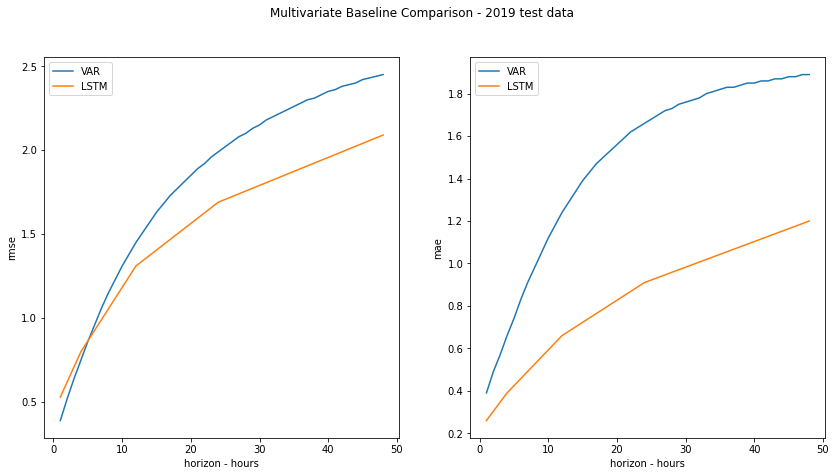

In [ ]:
ds = 'test'
best_mod = 'lstm_24l_48s_32bs_64fm'

plot_horizon_metrics(models, best_mod, dataset = ds)
check_residuals(models, best_mod, dataset = ds)
plot_forecasts(models, best_mod, dataset = ds)

Initially, these results look ...:
 * the rmse plot indicates ...
 * the mae plot indicates ...


Some points to note regarding diagnostic plots:
 * on validation data not test data
 * plot_forecasts
   * plot example forecasts with observations and lagged temperatures
      * first row shows examples of best near zero rmse forecasts
      * second row shows examples of worst positive rmse forecasts
      * third row shows examples of worst negative rmse forecasts
      * lagged observations are negative
      * the day of the year the forecast begins in and the rmse value is shown on each subplot
 * plot_horizon_metrics
   * plot rmse and mae values for each individual step-ahead
 * check_residuals
   * observations vs predictions
   * residuals over time
   * residual distribution


Diagnostic plots summary:
 * plot_forecasts
   * ...
 * plot_horizon_metrics
   * ...
 * check_residuals
   * the observations vs predictions plot indicates
     * ...
   * residuals over time highlights ...
   * residual distribution appears to be ...

...

---


## Conclusion

Fortunately, ...

On an unrelated matter, ...

The conclusion is separated into the following sections:
 * What worked
 * What didn't work
 * Future work

What worked:
 * ...

What didn't work:
 * ...

Future work:
 * ...
 * Further optimise model and data parameters
   * Lags
     * {1-24, 1-48} plus zero or more of {48, 96, 144, 192, 240, 288, 336}
   * Seasonal components
     * One-hot encoded month variables
     * The [Short Time Fourier Transform (STFT)](https://en.wikipedia.org/wiki/Short-time_Fourier_transform) may be a good option for modeling the daily seasonality
       * It is available in [scipy](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.stft.html)
  * Add seasonal components as exogenous variables
       * [for example](https://www.angioi.com/time-series-encoder-decoder-tensorflow/)
   * Batch mixup
     * Probably only time series mixup
   * ...
 * ...
 * Additional architectures to examine
   * [ConvLSTM2D](https://www.tensorflow.org/api_docs/python/tf/keras/layers/ConvLSTM2D) Keras 2D Convolutional LSTM layer - thought to perform well for weather forecasting where inputs are timeseries of 2D grids of sensor values
     * not directly relevant for the data used in this notebook
     * requires additional data from [ISD](https://www.ncdc.noaa.gov/isd) and/or other [NOAA sources](https://www.ncdc.noaa.gov/data-access/land-based-station-data/land-based-datasets)
     * [Keras conv LSTM tutorial](https://keras.io/examples/vision/conv_lstm/)
 * ...

---

## Metadata

Python and Jupyter versions plus modules imported and their version strings. 
This is the poor man's python equivalent of R's sessionInfo().

Code for imported modules and versions adapted from this stackoverflow answer. 
There are simpler alternatives, such as watermark, but they all require installation.

In [ ]:
import sys
import IPython

print("Python version:")
print(sys.executable)
print(sys.version)
print("\nIPython version:")
print(IPython.__version__)

Python version:
/usr/bin/python3
3.7.13 (default, Apr 24 2022, 01:04:09) 
[GCC 7.5.0]

IPython version:
5.5.0


In [ ]:
import pkg_resources
import types

def get_imports():
    for name, val in globals().items():
        if isinstance(val, types.ModuleType):
            # Split ensures you get root package, 
            # not just imported function
            name = val.__name__.split(".")[0]

        elif isinstance(val, type):
            name = val.__module__.split(".")[0]

        # Some packages are weird and have different
        # imported names vs. system/pip names.  Unfortunately,
        # there is no systematic way to get pip names from
        # a package's imported name.  You'll have to add
        # exceptions to this list manually!
        poorly_named_packages = {
            "PIL":       "Pillow",
            "sklearn":   "scikit-learn",
        }
        if name in poorly_named_packages.keys():
            name = poorly_named_packages[name]

        yield name

imports = list(set(get_imports()))

# The only way I found to get the version of the root package
# from only the name of the package is to cross-check the names 
# of installed packages vs. imported packages
requirements = []
for m in pkg_resources.working_set:
    if m.project_name in imports and m.project_name != "pip":
        requirements.append((m.project_name, m.version))

reqs = pd.DataFrame(requirements, columns = ['name', 'version'])
print("Imported modules:")
reqs.style.hide_index()

Imported modules:


name,version
tensorflow,2.8.2+zzzcolab20220527125636
seaborn,0.11.2
scikit-learn,1.0.2
pandas,1.3.5
numpy,1.21.6
matplotlib,3.2.2
keras,2.8.0


In [ ]:
!lscpu

Architecture:        x86_64
CPU op-mode(s):      32-bit, 64-bit
Byte Order:          Little Endian
CPU(s):              2
On-line CPU(s) list: 0,1
Thread(s) per core:  2
Core(s) per socket:  1
Socket(s):           1
NUMA node(s):        1
Vendor ID:           GenuineIntel
CPU family:          6
Model:               85
Model name:          Intel(R) Xeon(R) CPU @ 2.00GHz
Stepping:            3
CPU MHz:             2000.178
BogoMIPS:            4000.35
Hypervisor vendor:   KVM
Virtualization type: full
L1d cache:           32K
L1i cache:           32K
L2 cache:            1024K
L3 cache:            39424K
NUMA node0 CPU(s):   0,1
Flags:               fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_si

In [ ]:
!date

Sat Jun 18 14:10:54 UTC 2022


---


## Archival

Archive code, markdown, history and formatted notebooks.

Assumes all pdf, html, latex etc dependencies are installed.

**WARNING** Will overwrite existing files.

Notebook name is hardcoded below because the alternative is ghastly globs of unreliable javascript or external ipython libraries I'd prefer to avoid installing :-(

In [ ]:
from time import sleep

notebook = "cnn_time_series.ipynb"
# !jupyter nbconvert --to script {notebook}
# !jupyter nbconvert --execute --to html {notebook}
# !jupyter nbconvert --execute --to pdf {notebook}
# !jupyter nbconvert --to pdf {notebook}

%rm history.txt
%history -f history.txt

!jupyter nbconvert --to python {notebook}
sleep(5)
!jupyter nbconvert --to markdown {notebook}
sleep(5)
!jupyter nbconvert --to html {notebook}